# Input Dats

In [19]:
import numpy as np
import pandas as pd 
import copy
import math
import matplotlib.pyplot as plt 
import statistics
from numpy import linalg
import cvxopt
import cvxopt.solvers
from sklearn.model_selection import train_test_split
import seaborn as sns
from cvxopt import matrix as cvxopt_matrix
from cvxopt import solvers as cvxopt_solversscater
from cvxopt import matrix
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix




data = pd.read_excel("modifiedhaberman.xlsx")
data1=data.iloc[:,0:1]
data2=data.iloc[:,1:2]
data3=data.iloc[:,2:3]
data4=data.iloc[:,3:4]




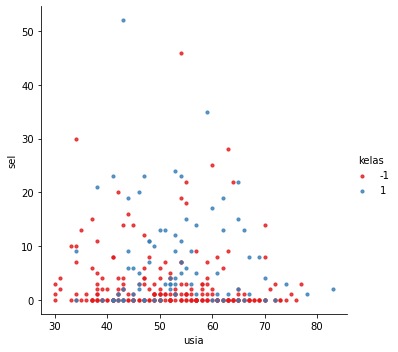

In [2]:
sns.lmplot('usia', 'sel',data=data, hue='kelas',
           palette='Set1', fit_reg=False, scatter_kws={"s": 10});

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306 entries, 0 to 305
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   usia    306 non-null    int64
 1   jenis   306 non-null    int64
 2   sel     306 non-null    int64
 3   kelas   306 non-null    int64
dtypes: int64(4)
memory usage: 9.7 KB


# Menentukan Cluster

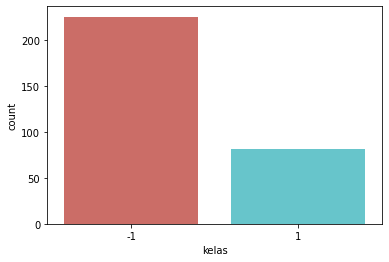

<Figure size 432x288 with 0 Axes>

In [4]:
sns.countplot(x='kelas',data=data, palette='hls')
plt.show()
plt.savefig('count_plot')

In [5]:
kelas_positif=data.iloc[0:81,[0,1,2]]
kelas_negatif=data.iloc[81:306,[0,1,2]]
kelas_positif

,usia,jenis,sel
0,34,59,0
1,34,66,9
2,38,69,21
3,39,66,0
4,41,60,23
...,...,...,...
76,70,58,4
77,72,63,0
78,74,65,3
79,78,65,1


In [6]:
kolom_KP = list(kelas_positif.columns)
kolom_KN = list(kelas_negatif.columns)


In [7]:
Mean=[]
hasil_perkolom_KP=[]
for i in kolom_KP:
    nilai_KP=list(kelas_positif[i])
    hsl_meanKP = str(round(sum(nilai_KP) / len(nilai_KP),6))
    print('hsl_meanKP',hsl_meanKP)

hsl_meanKP 53.679012
hsl_meanKP 62.82716
hsl_meanKP 7.45679


In [8]:
mean_KP=[]
Mean=[]
hasil_perkolom_KN=[]
for i in kolom_KN:
    nilai_KN=list(kelas_negatif[i])
    hsl_meanKN = str(round(sum(nilai_KN) / len(nilai_KN),6))
    print('hsl_meanKN',hsl_meanKN)
   

hsl_meanKN 52.017778
hsl_meanKN 62.862222
hsl_meanKN 2.791111


# Menghitung membership function gaussian

In [9]:
kelas_positif_K0=kelas_positif.iloc[:,0]
kelas_positif_K1=kelas_positif.iloc[:,1]
kelas_positif_K2=kelas_positif.iloc[:,2]

kelas_negatif_K0=kelas_negatif.iloc[:,0]
kelas_negatif_K1=kelas_negatif.iloc[:,1]
kelas_negatif_K2=kelas_negatif.iloc[:,2]

std_kelas_positif_K0=round(np.std(kelas_positif_K0),6)
std_kelas_positif_K1=round(np.std(kelas_positif_K1),6)
std_kelas_positif_K2=round(np.std(kelas_positif_K2),6)
std_kelas_negatif_K0=round(np.std(kelas_negatif_K0),6)
std_kelas_negatif_K1=round(np.std(kelas_negatif_K1),6)
std_kelas_negatif_K2=round(np.std(kelas_negatif_K2),6)
mean_kelas_positif_K0=round(np.mean(kelas_positif_K0),6)
mean_kelas_positif_K1=round(np.mean(kelas_positif_K1),6)
mean_kelas_positif_K2=round(np.mean(kelas_positif_K2),6)
mean_kelas_negatif_K0=round(np.mean(kelas_negatif_K0),6)
mean_kelas_negatif_K1=round(np.mean(kelas_negatif_K1),6)
mean_kelas_negatif_K2=round(np.mean(kelas_negatif_K2),6)





print('===============================================MF Gauss Kelas Positif================================================')
nilai_mf_fix_KP1=[]
nilai_mf_fix_KP=[]
nilai_mf_fix1_KP=[]
nilai_mf_KP0=list()
nilai_mf_KP1=list()
nilai_mf_KP2=list()
nilai_mf_KP=list()
for i in kelas_positif_K0:
    nilai_mf_P0=round(math.exp(-((i-mean_kelas_positif_K0)**2)/(2*std_kelas_positif_K0**2)),6)
    nilai_mf_KP0.append(nilai_mf_P0)
for j in kelas_positif_K1:
    nilai_mf_P1=round(math.exp(-((j-mean_kelas_positif_K1)**2)/(2*std_kelas_positif_K1**2)),6)
    nilai_mf_KP1.append(nilai_mf_P1)
for k in kelas_positif_K2:
    nilai_mf_P2=round(math.exp(-((k-mean_kelas_positif_K2)**2)/(2*std_kelas_positif_K2**2)),6)
    nilai_mf_KP2.append(nilai_mf_P2)
#print('nilai_mf_KP0',nilai_mf_KP0)
#print('nilai_mf_KP1',nilai_mf_KP1)
#print('nilai_mf_KP2',nilai_mf_KP2)
nilai_mf_fix1_KP.append(nilai_mf_KP0)
nilai_mf_fix1_KP.append(nilai_mf_KP1)
nilai_mf_fix1_KP.append(nilai_mf_KP2)
#print('nilai_mf_fix1',nilai_mf_fix1)
nilai_mf_fix_KP=list(zip(*nilai_mf_fix1_KP))
#print(nilai_mf_fix_KP)
nilai_mf_fix_KP1.append(nilai_mf_fix_KP)
print('nilai_mf_fix_KP1',nilai_mf_fix_KP1)





print('===============================================MF Gauss Kelas Negatif================================================')

nilai_mf_fix_KN=[]
nilai_mf_fix1_KN=[]
nilai_mf_KN0=list()
nilai_mf_KN1=list()
nilai_mf_KN2=list()
for m in kelas_negatif_K0:
    nilai_mf_N0=round(math.exp(-((m-mean_kelas_negatif_K0)**2)/(2*std_kelas_negatif_K0**2)),6)
    nilai_mf_KN0.append(nilai_mf_N0)
for n in kelas_negatif_K1:
    nilai_mf_N1=round(math.exp(-((n-mean_kelas_negatif_K1)**2)/(2*std_kelas_negatif_K1**2)),6)
    nilai_mf_KN1.append(nilai_mf_N1)
for o in kelas_negatif_K2:
    nilai_mf_N2=round(math.exp(-((o-mean_kelas_negatif_K2)**2)/(2*std_kelas_negatif_K2**2)),6)
    nilai_mf_KN2.append(nilai_mf_N2)
#print('nilai_mf_KN0',nilai_mf_KN0)
#print('nilai_mf_KN1',nilai_mf_KN1)
#print('nilai_mf_KN2',nilai_mf_KN2)
nilai_mf_fix1_KN.append(nilai_mf_KN0)
nilai_mf_fix1_KN.append(nilai_mf_KN1)
nilai_mf_fix1_KN.append(nilai_mf_KN2)
#print('nilai_mf_fix1',nilai_mf_fix1)
nilai_mf_fix_KN=list(zip(*nilai_mf_fix1_KN))
print(std_kelas_positif_K0)
print(std_kelas_positif_K1)
print(std_kelas_positif_K2)



===============================================MF Gauss Kelas Positif================================================
nilai_mf_fix_KP1 [[(0.150079, 0.514862, 0.716328), (0.150079, 0.633646, 0.985813), (0.30001, 0.177818, 0.332706), (0.3481, 0.633646, 0.716328), (0.455073, 0.6961, 0.234681), (0.455073, 0.939559, 0.716328), (0.455073, 0.45421, 0.716328), (0.51273, 0.177818, 0.778694), (0.51273, 0.514862, 0.716328), (0.572062, 0.34781, 7e-06), (0.572062, 0.514862, 0.836393), (0.572062, 0.939559, 0.716328), (0.572062, 0.939559, 0.716328), (0.632037, 0.939559, 0.987347), (0.632037, 0.34781, 0.985813), (0.632037, 0.998647, 0.449571), (0.691495, 0.807363, 0.987347), (0.691495, 0.633646, 0.716328), (0.691495, 0.45421, 0.778694), (0.749171, 0.34781, 0.836393), (0.749171, 0.177818, 0.887651), (0.749171, 0.969466, 0.964434), (0.749171, 0.807363, 0.389077), (0.803747, 0.998647, 0.234681), (0.803747, 0.969466, 0.716328), (0.803747, 0.807363, 0.716328), (0.853894, 0.34781, 0.927442), (0.853894, 0.34

# Menghitung Jarak Euclid

In [10]:
Mean_KP=np.array([[53.679012,62.82716,7.45679]])
Mean_KN=np.array([[52.017778,62.862222,2.791111]])
kelas_positif=np.array(kelas_positif)
kelas_negatif=np.array(kelas_negatif)



#Menghitung jarak Euclid dari sample positif ke cluster kelas positif
for x0 in (Mean_KP):
    jarak_euclidean_SP_KP=list()
    for x1 in (kelas_positif):
        jarak_euclidean_SP_KP1 =round((sum((abs(x1-x0))**2))**(1/2),6)
        #print('jarak_euclidean_SP->KP1',jarak_euclidean_SP_KP1)
        jarak_euclidean_SP_KP.append(jarak_euclidean_SP_KP1)
    print('jarak_euclidean_SP->KP',jarak_euclidean_SP_KP)
        
#Menghitung jarak Euclid dari sample positif ke cluster kelas negatif
for x3 in (Mean_KN):
    jarak_euclidean_SP_KN=list()
    for x4 in (kelas_positif):
        jarak_euclidean_SP_KN1 =round(((sum((abs(x4-x3))**2)))**(1/2),6)
        #print('jarak_euclidean_SP->KN1',jarak_euclidean_SP_KN1)
        jarak_euclidean_SP_KN.append(jarak_euclidean_SP_KN1)
    print('jarak_euclidean_SP->KN',jarak_euclidean_SP_KN)
    
print('==============================================================================')


#Menghitung jarak Euclid dari sample negatif ke cluster kelas positif
for a0 in (Mean_KP):
    jarak_euclidean_SN_KP=list()
    for a1 in (kelas_negatif):
        jarak_euclidean_SN_KP1 =round((sum((abs(a0-a1))**2))**(1/2),6)
        #print('jarak_euclidean_SP->KP1',jarak_euclidean_SP_KP1)
        jarak_euclidean_SN_KP.append(jarak_euclidean_SN_KP1)
    print('jarak_euclidean_SN->KP',jarak_euclidean_SN_KP)

#Menghitung jarak Euclid dari sample negatif ke cluster kelas negatif 
for a3 in (Mean_KN): 
    jarak_euclidean_SN_KN=list() 
    for a4 in (kelas_negatif): 
        jarak_euclidean_SN_KN1 =round((sum((abs(a3-a4))**2))**(1/2),6)
        #print('jarak_euclidean_SP->KP1',jarak_euclidean_SP_KP1)
        jarak_euclidean_SN_KN.append(jarak_euclidean_SN_KN1)
    print('jarak_euclidean_SN->KN',jarak_euclidean_SN_KN)

jarak_euclidean_SP->KP [21.389586, 19.992797, 21.61837, 16.76735, 20.256889, 14.755901, 15.289658, 14.703517, 14.375333, 46.059096, 12.588289, 13.077483, 13.077483, 9.858046, 10.925486, 15.065153, 9.064696, 11.874169, 11.594308, 10.585143, 10.81361, 8.104766, 14.866761, 16.918347, 10.044755, 10.243737, 8.252696, 8.252696, 7.062041, 8.804927, 5.45313, 6.655237, 8.397285, 7.249237, 6.456565, 7.796538, 6.873339, 4.833865, 4.983512, 5.975946, 6.846344, 5.913644, 3.291715, 16.558041, 5.081638, 4.54425, 15.697632, 3.295464, 5.20288, 1.974112, 9.241391, 3.534079, 5.9428, 4.517, 7.384223, 7.354907, 28.064667, 12.069586, 10.013982, 7.766394, 10.673416, 11.04741, 10.705754, 12.171443, 14.394644, 11.686051, 14.389926, 12.6996, 18.448683, 13.968955, 15.189205, 13.633504, 13.383548, 14.804348, 15.888371, 18.581707, 17.367369, 19.781107, 20.91714, 25.257114, 30.212553]
jarak_euclidean_SP->KN [18.637258, 19.314147, 23.785165, 13.678395, 23.194459, 11.422621, 12.095575, 11.884287, 11.093373, 50.264065

# Nilai Keanggotaan Berdasarkan Jarak Euclidean

In [1]:
a=1
b=2
c=a+b
print(c)

3


In [11]:
from random import sample
coba_1=list(jarak_euclidean_SP_KP)
coba_2=list(jarak_euclidean_SP_KN)
coba_3=list(jarak_euclidean_SN_KP)
coba_4=list(jarak_euclidean_SN_KN)
coba_5=nilai_mf_fix_KP
coba_6=nilai_mf_fix_KN

MF_Euclidean1=[]
for i in range(len(coba_1)):
    if (coba_1[i]>=coba_2[i]):
        d=(coba_5[i])
    elif (coba_1[i]<coba_2[i]):
        d=[1,1,1]
    MF_Euclidean1.append(d)
print('MF_Euclidean1',MF_Euclidean1)

print('=========================================================================================================================')
MF_Euclidean2=[]
for k in range(len(coba_3)):
    if (coba_3[k]>coba_4[k]):
        j=[1,1,1]
    elif (coba_3[k]<=coba_4[k]):
        j=coba_6[k]
    MF_Euclidean2.append(j)
print('MF_Euclidean2',MF_Euclidean2)

MF_Euclidean1 [(0.150079, 0.514862, 0.716328), (0.150079, 0.633646, 0.985813), [1, 1, 1], (0.3481, 0.633646, 0.716328), [1, 1, 1], (0.455073, 0.939559, 0.716328), (0.455073, 0.45421, 0.716328), (0.51273, 0.177818, 0.778694), (0.51273, 0.514862, 0.716328), [1, 1, 1], (0.572062, 0.514862, 0.836393), (0.572062, 0.939559, 0.716328), (0.572062, 0.939559, 0.716328), (0.632037, 0.939559, 0.987347), [1, 1, 1], [1, 1, 1], (0.691495, 0.807363, 0.987347), (0.691495, 0.633646, 0.716328), (0.691495, 0.45421, 0.778694), (0.749171, 0.34781, 0.836393), (0.749171, 0.177818, 0.887651), (0.749171, 0.969466, 0.964434), [1, 1, 1], [1, 1, 1], (0.803747, 0.969466, 0.716328), (0.803747, 0.807363, 0.716328), [1, 1, 1], [1, 1, 1], [1, 1, 1], (0.898328, 0.998647, 0.716328), [1, 1, 1], [1, 1, 1], (0.935862, 0.939559, 0.716328), [1, 1, 1], (0.965461, 0.514862, 0.887651), (0.986289, 0.177818, 0.887651), (0.986289, 0.514862, 0.836393), (0.986289, 0.969466, 0.887651), (0.986289, 0.633646, 0.930814), (0.997745, 0.3478

In [42]:
MF_Euclidean1=pd.DataFrame(MF_Euclidean1)
MF_Euclidean2=pd.DataFrame(MF_Euclidean2)
MF_Euclidean3=[MF_Euclidean1,MF_Euclidean2]
pd.concat(MF_Euclidean3)
MF_Euclidean=pd.concat(MF_Euclidean3,ignore_index=True)
Variabel = data.iloc[:,0:3]
kelas= data.iloc[:,3] 
data_Euclidean1=pd.merge(Variabel, MF_Euclidean,left_index=True, right_index=True)
data_Euclidean=pd.merge(data_Euclidean1,kelas,left_index=True, right_index=True)
MF_Euclidean.to_excel('MF_Euclidean.xlsx',index=True)

In [55]:
train=data_Euclidean
train

,usia,jenis,sel,0,1,2,kelas
0,34,59,0,0.150079,0.514862,0.716328,1
1,34,66,9,0.150079,0.633646,0.985813,1
2,38,69,21,1.000000,1.000000,1.000000,1
3,39,66,0,0.348100,0.633646,0.716328,1
4,41,60,23,1.000000,1.000000,1.000000,1
...,...,...,...,...,...,...,...
301,73,68,0,0.161489,0.279064,0.892672,-1
302,74,63,0,0.135165,0.999083,0.892672,-1
303,75,62,1,0.112199,0.964693,0.954321,-1
304,76,67,0,0.092367,0.436997,0.892672,-1


In [56]:
features=train.columns[0:6]
X = train[features]
y1=train.columns[6]
y=train[y1]



In [102]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.4,random_state=100)
#X_test.to_excel('X_testEuclidean.xlsx',index=True)
print(X_train,y_train)

     usia  jenis  sel         0         1         2
285    67     65    0  1.000000  1.000000  1.000000
118    40     58    0  1.000000  1.000000  1.000000
83     30     65    0  1.000000  1.000000  1.000000
168    49     66    0  1.000000  1.000000  1.000000
54     57     62   14  1.000000  1.000000  1.000000
..    ...    ...  ...       ...       ...       ...
66     65     58    0  0.533830  0.347810  0.716328
53     57     61    5  1.000000  1.000000  1.000000
79     78     65    1  1.000000  1.000000  1.000000
280    66     58    1  0.445001  0.318836  0.954321
8      42     59    0  0.512730  0.514862  0.716328

[183 rows x 6 columns] 285   -1
118   -1
83    -1
168   -1
54     1
      ..
66     1
53     1
79     1
280   -1
8      1
Name: kelas, Length: 183, dtype: int64


In [103]:
print(X_test)
print(y_test)
#y_test.to_excel('y_test_Euclidean.xlsx')



     usia  jenis  sel         0         1         2
88     34     58   30  0.260669  0.318836  0.000021
217    55     69    3  1.000000  1.000000  1.000000
78     74     65    3  1.000000  1.000000  1.000000
134    43     63   14  0.714059  0.999083  0.160241
132    42     65    0  1.000000  1.000000  1.000000
..    ...    ...  ...       ...       ...       ...
37     52     62    3  0.986289  0.969466  0.887651
124    41     69    8  1.000000  1.000000  1.000000
120    41     58    0  1.000000  1.000000  1.000000
61     61     68    1  0.769137  0.297372  0.778694
216    55     66    0  1.000000  1.000000  1.000000

[123 rows x 6 columns]
88    -1
217   -1
78     1
134   -1
132   -1
      ..
37     1
124   -1
120   -1
61     1
216   -1
Name: kelas, Length: 123, dtype: int64


In [86]:
ciu=(50*0.46342962)+(64*0.90222251)+(0*(-2.26818301))+(-0.12669738*0.935862)+(-0.26522258*0.939559)+(-0.06933321*0.716328)
ciu=ciu-66.43317160258437
ciu

14.063121192278984

In [69]:
A=6.96486480*-1
B=A*33
B



-229.84053839999999

In [104]:
print(X_train.shape,X_test.shape )

(183, 6) (123, 6)


In [105]:
X_train=np.asarray(X_train)
y_train=np.asarray(y_train)

In [89]:

Kernel=[]
for x0 in X_train:
  m=[]
  for x1 in X_train:
    m0=np.matmul(x0,x1)
    m1=round((1+m0)**(2),6)
    print('m0')
    print(m0)
    print('m1')
    print(m1)
    m.append(m1)
  print('m')
  print('m',m)
  Kernel.append(m)
print('Kernel',Kernel)

m0
8717.0
m1
76003524.0
m0
6453.0
m1
41654116.0
m0
6238.0
m1
38925121.0
m0
7576.0
m1
57410929.0
m0
7852.0
m1
61669609.0
m0
7454.0
m1
55577025.0
m0
7123.0
m1
50751376.0
m0
7454.0
m1
55577025.0
m0
6114.0
m1
37393225.0
m0
7188.0
m1
51681721.0
m0
7981.665671999999
m1
63722951.230927
m0
7310.0
m1
53450721.0
m0
7521.0
m1
56580484.0
m0
8711.0
m1
75898944.0
m0
6380.1797990000005
m1
40719455.627166
m0
7043.227949000001
m1
49621147.397473
m0
7911.0
m1
62599744.0
m0
6839.0
m1
46785600.0
m0
7376.327438
m1
54424960.127468
m0
6453.0
m1
41654116.0
m0
6173.0
m1
38118276.0
m0
8524.868492
m1
72690433.542878
m0
7647.0
m1
58491904.0
m0
7659.0
m1
58675600.0
m0
6043.0
m1
36529936.0
m0
8186.487215
m1
67034946.895788
m0
7454.0
m1
55577025.0
m0
8981.0
m1
80676324.0
m0
6918.0
m1
47872561.0
m0
6782.0
m1
46009089.0
m0
6971.0
m1
48608784.0
m0
8518.0
m1
72573361.0
m0
8191.974645
m1
67124833.533613
m0
8782.0
m1
77141089.0
m0
7574.0
m1
57380625.0
m0
7181.489541
m1
51588156.006574
m0
7178.0
m1
51538041.0
m0
8526.42159

m1
34363044.0
m0
6248.253533
m1
39053169.719713
m0
6029.619421
m1
36368370.600942
m0
5377.0
m1
28922884.0
m0
5759.0
m1
33177600.0
m0
5567.0
m1
31002624.0
m0
5865.0
m1
34409956.0
m0
6005.539603
m1
36078518.002407
m0
5277.6379719999995
m1
27864018.83944
m0
5465.0
m1
29877156.0
m0
6060.022621
m1
36735995.212274
m0
4783.381269
m1
22890304.127158
m0
5967.0
m1
35617024.0
m0
6199.0
m1
38440000.0
m0
6616.02692
m1
43785045.260005
m0
5630.041469
m1
31708628.025598
m0
5675.0
m1
32216976.0
m0
5119.0
m1
26214400.0
m0
5474.558943000001
m1
29981745.738267
m0
6395.0
m1
40908816.0
m0
5777.0
m1
33385284.0
m0
5563.0
m1
30958096.0
m0
5501.0
m1
30272004.0
m0
5559.0
m1
30913600.0
m0
5687.0
m1
32353344.0
m0
5715.0
m1
32672656.0
m0
5845.7765549999995
m1
34184796.084098
m0
5003.0
m1
25040016.0
m0
5525.0
m1
30536676.0
m0
5865.0
m1
34409956.0
m0
5831.0
m1
34012224.0
m0
6391.0
m1
40857664.0
m0
5679.0
m1
32262400.0
m0
5857.0
m1
34316164.0
m0
5435.0
m1
29550096.0
m0
5249.0
m1
27562500.0
m0
5123.0
m1
26255376.0
m0
4

m0
6579.281899999999
m1
43300109.883468
m0
7039.0
m1
49561600.0
m0
7444.0
m1
55428025.0
m0
7169.0
m1
51408900.0
m0
5889.0
m1
34692100.0
m0
6837.0
m1
46758244.0
m0
6890.0
m1
47485881.0
m0
5629.0
m1
31696900.0
m0
7020.0
m1
49294441.0
m0
7787.043527999999
m1
60653621.994023
m0
6630.0
m1
43970161.0
m0
6466.0
m1
41822089.0
m0
6134.0
m1
37638225.0
m0
8064.876518
m1
65058364.003624
m0
7412.0
m1
54952569.0
m0
6809.8146400000005
m1
46387196.060438
m0
7214.0
m1
52056225.0
m0
6219.438931999999
m1
38693860.506741
m0
7754.023345
m1
60140387.081495
m0
6333.227949000001
m1
40122443.709893
m0
6497.486205
m1
42230322.956575
m0
7104.0517580000005
m1
50481760.483859
m0
6826.0
m1
46607929.0
m0
5629.0
m1
31696900.0
m0
6609.0
m1
43692100.0
m0
7248.0
m1
52548001.0
m0
7103.0
m1
50466816.0
m0
6085.0
m1
37039396.0
m0
8066.333225
m1
65081865.363189
m0
5906.0
m1
34892649.0
m0
7248.0
m1
52548001.0
m0
7037.0
m1
49533444.0
m0
6089.0
m1
37088100.0
m0
6427.276369
m1
41322737.076244
m0
6792.0
m1
46144849.0
m0
6072.0
m1

38130625.0
m0
7452.34597
m1
55552366.148515
m0
7096.0
m1
50367409.0
m0
6293.0
m1
39614436.0
m0
8487.422035999998
m1
72053308.66125
m0
7086.0
m1
50225569.0
m0
8026.816791
m1
64445842.429862
m0
6233.0
m1
38862756.0
m0
7530.0
m1
56715961.0
m0
7302.597968
m1
53342543.278174
m0
7104.0
m1
50481025.0
m0
8493.0
m1
72148036.0
m0
7373.718158
m1
54386467.909935
m0
6053.743920000001
m1
36659923.936777
m
m [61669609.0, 34574400.0, 32993536.0, 47458321.0, 53187849.0, 45873529.0, 41783296.0, 47210641.0, 31416025.0, 42406144.0, 52340387.385615, 48108096.0, 46840336.0, 61905424.0, 36495853.363846, 41245011.828917, 51466276.0, 39212644.0, 45055339.634928, 34904464.0, 32444416.0, 58612322.366798, 48108096.0, 47692836.0, 31360000.0, 55733499.357328, 45684081.0, 67289209.0, 39551521.0, 38887696.0, 40717161.0, 58936329.0, 54670861.050903, 62647225.0, 48888064.0, 42595065.728782, 42732369.0, 60255188.956423, 34963569.0, 68933626.857649, 37015056.0, 64224196.0, 55711296.0, 43696964.751685, 34386496.0, 3991712

m1
40094224.0
m0
6041.0
m1
36505764.0
m0
6041.0
m1
36505764.0
m0
7139.0
m1
50979600.0
m0
6830.191084000001
m1
46665171.626121
m0
6141.0
m1
37724164.0
m0
6443.0
m1
41525136.0
m0
6841.253533
m1
46816433.409851
m0
6597.619421
m1
43541778.263198
m0
5809.0
m1
33756100.0
m0
6299.0
m1
39690000.0
m0
6118.0
m1
37442161.0
m0
6475.0
m1
41938576.0
m0
6665.539603
m1
44442750.278367
m0
5717.6379719999995
m1
32702820.2548
m0
5976.0
m1
35724529.0
m0
6699.022621
m1
44890303.121912
m0
5123.381269
m1
26259283.390078
m0
6617.0
m1
43797924.0
m0
6871.0
m1
47224384.0
m0
7356.02692
m1
54125845.101605
m0
6080.041469000001
m1
36979065.347698
m0
6175.0
m1
38142976.0
m0
5502.0
m1
30283009.0
m0
5920.558943000001
m1
35064860.315423
m0
7073.0
m1
50041476.0
m0
6307.0
m1
39790864.0
m0
6088.0
m1
37075921.0
m0
5991.0
m1
35904064.0
m0
6049.0
m1
36602500.0
m0
6270.0
m1
39325441.0
m0
6215.0
m1
38638656.0
m0
6465.7765549999995
m1
41819199.012298
m0
5383.0
m1
28987456.0
m0
5926.0
m1
35129329.0
m0
6475.0
m1
41938576.0
m0
6332

5659.8146400000005
m1
32044822.388438
m0
5808.0
m1
33744481.0
m0
5215.438932
m1
27211235.131285
m0
6218.023345
m1
38676251.365655
m0
5261.227949
m1
27691042.987237
m0
5387.486205
m1
29035783.581475
m0
5858.0517580000005
m1
34328487.502923
m0
5640.0
m1
31820881.0
m0
4725.0
m1
22335076.0
m0
5385.0
m1
29008996.0
m0
5862.0
m1
34374769.0
m0
5811.0
m1
33779344.0
m0
5001.0
m1
25020004.0
m0
6490.333225
m1
42137407.037989
m0
4896.0
m1
23980609.0
m0
5862.0
m1
34374769.0
m0
5751.0
m1
33085504.0
m0
5097.0
m1
25989604.0
m0
5231.276368999999
m1
27376716.001596
m0
5586.0
m1
31214569.0
m0
5070.0
m1
25715041.0
m0
4896.0
m1
23980609.0
m0
5577.0
m1
31114084.0
m0
5547.0
m1
30780304.0
m0
5374.625611
m1
28897350.709639
m0
5553.0
m1
30846916.0
m0
5301.0
m1
28111204.0
m0
5240.683071
m1
27475241.416808
m0
5790.0
m1
33535681.0
m0
4902.0
m1
24039409.0
m0
5241.0
m1
27478564.0
m0
5307.0
m1
28174864.0
m0
5838.0
m1
34093921.0
m0
5898.0
m1
34798201.0
m0
5859.0
m1
34339600.0
m0
5619.0
m1
31584400.0
m0
5802.0
m1
336748

m0
5182.381269
m1
26867441.37982
m0
6675.0
m1
44568976.0
m0
6911.0
m1
47775744.0
m0
7419.02692
m1
55056799.493525
m0
6146.041469000001
m1
37786118.821606
m0
6229.0
m1
38812900.0
m0
5561.0
m1
30935844.0
m0
5978.558943000001
m1
35755125.152811
m0
7129.0
m1
50836900.0
m0
6370.0
m1
40589641.0
m0
6143.0
m1
37748736.0
m0
6052.0
m1
36638809.0
m0
6111.0
m1
37356544.0
m0
6325.0
m1
40018276.0
m0
6279.0
m1
39438400.0
m0
6523.7765549999995
m1
42572709.092678
m0
5443.0
m1
29637136.0
m0
5974.0
m1
35700625.0
m0
6534.0
m1
42706225.0
m0
6397.0
m1
40934404.0
m0
7097.0
m1
50381604.0
m0
6261.0
m1
39212644.0
m0
6470.0
m1
41873841.0
m0
5929.0
m1
35164900.0
m0
5656.0
m1
32001649.0
m0
5593.0
m1
31292836.0
m0
5334.0
m1
28462225.0
m0
6361.0
m1
40475044.0
m0
6728.5289569999995
m1
45286559.983102
m0
5802.0
m1
33674809.0
m0
6070.0
m1
36857041.0
m0
5075.0
m1
25765776.0
m0
5527.459645999999
m1
30563866.05745
m0
5693.0
m1
32421636.0
m0
6837.34597
m1
46762975.605415
m0
6511.0
m1
42406144.0
m0
5802.0
m1
33674809.0
m0
7

m0
5884.0
m1
34633225.0
m0
6996.0
m1
48958009.0
m0
6984.0
m1
48790225.0
m0
5931.0
m1
35188624.0
m0
6290.276369
m1
39580158.351138
m0
6574.0
m1
43230625.0
m0
5972.0
m1
35676729.0
m0
5724.0
m1
32775625.0
m0
6656.0
m1
44315649.0
m0
6501.0
m1
42276004.0
m0
6242.625611
m1
38982860.770335
m0
6608.0
m1
43678881.0
m0
6214.0
m1
38626225.0
m0
6248.683071
m1
39058538.487944
m0
6877.0
m1
47306884.0
m0
6791.0
m1
46131264.0
m0
6149.0
m1
37822500.0
m0
6281.0
m1
39463524.0
m0
6908.0
m1
47734281.0
m0
7253.0
m1
52620516.0
m0
6880.0
m1
47348161.0
m0
6620.0
m1
43837641.0
m0
6931.0
m1
48052624.0
m0
6186.4618789999995
m1
38284684.504078
m0
7366.888895
m1
54285786.769064
m0
7145.0
m1
51065316.0
m0
6448.0
m1
41589601.0
m0
6631.0
m1
43983424.0
m0
5800.0
m1
33651601.0
m0
7641.43379
m1
58406794.234534
m0
6444.0
m1
41538025.0
m0
7073.0
m1
50041476.0
m0
6068.0
m1
36832761.0
m0
5567.0
m1
31002624.0
m0
5579.0
m1
31136400.0
m0
5304.0
m1
28143025.0
m0
6307.0
m1
39790864.0
m0
7390.018854
m1
54627159.700183
m0
5708.0
m1

m1
55890576.0
m0
6195.0
m1
38390416.0
m0
7215.0
m1
52070656.0
m0
8002.665671999999
m1
64058664.189151
m0
7367.0
m1
54287424.0
m0
7539.0
m1
56851600.0
m0
8723.0
m1
76108176.0
m0
6449.1797990000005
m1
41604819.439428
m0
7106.227949000001
m1
50512689.119047
m0
7947.0
m1
63170704.0
m0
6923.0
m1
47941776.0
m0
7430.327438
m1
55224627.490772
m0
6507.0
m1
42354064.0
m0
6275.0
m1
39388176.0
m0
8497.868492
m1
72230765.64431
m0
7683.0
m1
59043856.0
m0
7659.0
m1
58675600.0
m0
6139.0
m1
37699600.0
m0
8186.487215
m1
67034946.895788
m0
7475.0
m1
55890576.0
m0
8975.0
m1
80568576.0
m0
6963.0
m1
48497296.0
m0
6839.0
m1
46785600.0
m0
7055.0
m1
49787136.0
m0
8515.0
m1
72522256.0
m0
8173.974645
m1
66830210.446393
m0
8779.0
m1
77088400.0
m0
7631.0
m1
58247424.0
m0
7226.489541000001
m1
52236605.065264
m0
7235.0
m1
52359696.0
m0
8493.421591
m1
72155198.165647
m0
6511.0
m1
42406144.0
m0
9165.627708
m1
84027063.537073
m0
6703.0
m1
44943616.0
m0
8895.0
m1
79138816.0
m0
8271.0
m1
68425984.0
m0
7278.367974
m1
5298

m0
6440.1797990000005
m1
41488797.203046
m0
5742.1797990000005
m1
32984114.203642
m0
5600.1797990000005
m1
31373215.140726
m0
5474.1797990000005
m1
29977593.831378
m0
5534.1797990000005
m1
30638215.407258
m0
5672.1797990000005
m1
32184969.031782
m0
5691.1797990000005
m1
32400910.864144
m0
5774.595597907522
m1
33357504.510569
m0
5007.1797990000005
m1
25081864.899112
m0
5862.1797990000005
m1
34376877.355402
m0
5798.1797990000005
m1
33630486.34113
m0
5826.1797990000005
m1
33956024.409874
m0
6329.1797990000005
m1
40071176.287668
m0
5645.1797990000005
m1
31879346.322636
m0
5906.1797990000005
m1
34894773.177714
m0
5462.1797990000005
m1
29846333.516202
m0
5384.1797990000005
m1
29000161.467558
m0
5463.1797990000005
m1
29857260.8758
m0
5000.1797990000005
m1
25011799.381926
m0
5719.1797990000005
m1
32720456.932888
m0
6129.041207164572
m1
37577405.201536
m0
5289.1797990000005
m1
27986002.305748
m0
5610.1797990000005
m1
31485338.736706
m0
4852.1797990000005
m1
23553354.161422
m0
5330.775471208798


m1
43292229.314804
m0
7413.0
m1
54967396.0
m0
6153.0
m1
37871716.0
m0
6579.0
m1
43296400.0
m0
6687.0
m1
44729344.0
m0
7395.0
m1
54700816.0
m0
7461.0
m1
55681444.0
m0
7365.0
m1
54257956.0
m0
7101.0
m1
50438404.0
m0
7497.0
m1
56220004.0
m0
6325.4618789999995
m1
40024119.90644
m0
7933.888895
m1
62962461.775994
m0
7707.0
m1
59413264.0
m0
6855.0
m1
47004736.0
m0
7095.0
m1
50353216.0
m0
6159.0
m1
37945600.0
m0
8269.433790000001
m1
68400075.074774
m0
6651.0
m1
44249104.0
m0
7611.0
m1
57942544.0
m0
6453.0
m1
41654116.0
m0
5937.0
m1
35259844.0
m0
5907.0
m1
34904464.0
m0
5571.0
m1
31047184.0
m0
6741.0
m1
45454564.0
m0
8036.018854
m1
64593672.059551
m0
6051.0
m1
36626704.0
m0
6801.0
m1
46267204.0
m0
7166.550749000001
m1
51373783.73949
m0
7593.0
m1
57668836.0
m0
6440.110960000001
m1
41487910.399032
m0
6704.337544
m1
44961551.578976
m0
7023.0
m1
49336576.0
m0
6729.0
m1
45292900.0
m0
6729.0
m1
45292900.0
m0
7935.0
m1
62980096.0
m0
7586.191084
m1
57565468.545129
m0
6837.0
m1
46758244.0
m0
7161.0
m1
5

m1
36958222.09842
m0
6435.810970057363
m1
41432535.464251
m0
5652.327438
m1
31960111.121244
m0
5572.327438
m1
31061978.731164
m0
7144.4261916753
m1
51057115.460679
m0
6606.327438
m1
43656775.872948
m0
6498.327438
m1
42241257.14634
m0
5442.327438
m1
29629813.597284
m0
6945.927342849563
m1
48259799.506831
m0
6393.327438
m1
40887423.38436
m0
7600.327438
m1
57780178.819692
m0
6017.327438
m1
36220265.150984
m0
5941.327438
m1
35311255.380408
m0
6190.327438
m1
38332535.444532
m0
7217.327438
m1
52104251.002184
m0
6891.5022476705035
m1
47506587.234143
m0
7441.327438
m1
55388237.694408
m0
6613.327438
m1
43749327.45708
m0
6240.941846021751
m1
38961838.009117
m0
6277.327438
m1
39417395.418744
m0
7126.085490419654
m1
50795347.58775
m0
5670.327438
m1
32163954.909012
m0
7740.222482201512
m1
59926525.518942
m0
5811.327438
m1
33783150.246528
m0
7481.327438
m1
55985223.889448
m0
7083.327438
m1
50187695.2488
m0
6233.827516176801
m1
38873074.156475
m0
5565.327438
m1
30984001.147032
m0
6071.327438
m1
36873

m1
45514368.882854
m0
5491.0
m1
30162064.0
m0
6175.0
m1
38142976.0
m0
5373.0
m1
28879876.0
m0
4927.0
m1
24285184.0
m0
4925.0
m1
24265476.0
m0
4669.0
m1
21808900.0
m0
5561.0
m1
30935844.0
m0
6518.018854
m1
42497606.818807
m0
5057.0
m1
25583364.0
m0
5569.0
m1
31024900.0
m0
5918.550749
m1
35041081.069986
m0
6207.0
m1
38539264.0
m0
5354.11096
m1
28677213.393912
m0
5508.337544
m1
30352800.173728
m0
5825.0
m1
33942276.0
m0
5541.0
m1
30713764.0
m0
5541.0
m1
30713764.0
m0
6489.0
m1
42120100.0
m0
6228.191084000001
m1
38802821.560985
m0
5621.0
m1
31606884.0
m0
5865.0
m1
34409956.0
m0
6254.253533
m1
39128196.762109
m0
6065.619421
m1
36803871.199254
m0
5381.0
m1
28965924.0
m0
5759.0
m1
33177600.0
m0
5569.0
m1
31024900.0
m0
5865.0
m1
34409956.0
m0
6005.539603
m1
36078518.002407
m0
5317.6379719999995
m1
28287909.8772
m0
5467.0
m1
29899024.0
m0
6078.022621
m1
36954516.02663
m0
4783.381269
m1
22890304.127158
m0
5967.0
m1
35617024.0
m0
6243.0
m1
38987536.0
m0
6616.02692
m1
43785045.260005
m0
5630.04146

58842223.421558
m0
8404.868492
m1
70658625.104798
m0
7885.8684920000005
m1
62202694.610102
m0
6379.8684920000005
m1
40715482.712198
m0
7681.8684920000005
m1
59026468.265366
m0
7558.8684920000005
m1
57151611.616334
m0
5947.8684920000005
m1
35389036.33511
m0
7774.8684920000005
m1
60464130.804878
m0
8790.640463949418
m1
77292942.047353
m0
7126.8684920000005
m1
50806509.239246
m0
6928.8684920000005
m1
48023077.316414
m0
6724.8684920000005
m1
45237306.971678
m0
9214.45446458062
m1
84924600.988759
m0
8326.868492
m1
69353393.620046
m0
7315.138954378989
m1
53525889.199782
m0
8146.8684920000005
m1
66387760.962926
m0
6582.88661034773
m1
43347562.897916
m0
8809.48692402951
m1
77624679.838495
m0
6808.444976715454
m1
46368540.890915
m0
7006.6341231887955
m1
49106936.00448
m0
7729.210774101537
m1
59756158.612035
m0
7402.8684920000005
m1
54817268.64683
m0
5947.8684920000005
m1
35389036.33511
m0
7327.8684920000005
m1
53712313.37303
m0
8128.8684920000005
m1
66094761.697214
m0
7825.8684920000005
m1
6125

6963.0
m1
48497296.0
m0
7543.0
m1
56911936.0
m0
7137.0
m1
50951044.0
m0
5803.0
m1
33686416.0
m0
6905.0
m1
47692836.0
m0
6847.0
m1
46895104.0
m0
5455.0
m1
29767936.0
m0
7021.0
m1
49308484.0
m0
7889.043527999999
m1
62252786.873735
m0
6499.0
m1
42250000.0
m0
6325.0
m1
40018276.0
m0
6093.0
m1
37136836.0
m0
8237.876518000001
m1
67879086.278852
m0
7485.0
m1
56040196.0
m0
6671.8146400000005
m1
44526455.219798
m0
7311.0
m1
53465344.0
m0
6033.438932
m1
36414453.224037
m0
7890.023345
m1
62268249.431335
m0
6208.227949
m1
38554511.722643
m0
6382.486205
m1
40748896.129425
m0
7020.0517580000005
m1
49295167.788515
m0
6731.0
m1
45319824.0
m0
5455.0
m1
29767936.0
m0
6615.0
m1
43771456.0
m0
7311.0
m1
53465344.0
m0
7079.0
m1
50126400.0
m0
6035.0
m1
36433296.0
m0
8179.333225
m1
66917851.672039
m0
5803.0
m1
33686416.0
m0
7311.0
m1
53465344.0
m0
7021.0
m1
49308484.0
m0
5919.0
m1
35046400.0
m0
6440.276369
m1
41490041.261838
m0
6731.0
m1
45319824.0
m0
5919.0
m1
35046400.0
m0
5803.0
m1
33686416.0
m0
6905.0
m1


m1
60108072.575839
m0
7380.487215
m1
54486353.505208
m0
6512.487215
m1
42425515.699968
m0
8867.25098043444
m1
78645875.451976
m0
7380.487215
m1
54486353.505208
m0
8371.568048456076
m1
70099895.726028
m0
6380.487215
m1
40723379.075208
m0
7814.487215
m1
61081840.407828
m0
7627.305364512792
m1
58191042.734255
m0
7348.487215
m1
54014962.323448
m0
8874.487215
m1
78774273.303628
m0
7695.42344841855
m1
59234933.897367
m0
6263.452552887527
m1
39243365.787379
m
m [67034946.895788, 36960164.797348, 34733191.553368, 50886639.846568, 55733499.357328, 49301282.710408, 44963558.790528, 49892851.636468, 33286982.724048, 45717709.358608, 56418180.110411, 49076851.119528, 50260828.971648, 67034946.895788, 37283325.110471, 44048461.857318, 55405501.919868, 41621687.285308, 48259799.506831, 37106216.490508, 34076256.985288, 64009887.166612, 51775036.261228, 51775036.261228, 32781203.849128, 59708220.068297, 49217060.863828, 71969555.327068, 42425515.699968, 41132818.256968, 43237032.114628, 64023797.6518

m1
62062884.0
m0
6947.0
m1
48274704.0
m0
6785.0
m1
46049796.0
m0
8100.0
m1
65626201.0
m0
7737.0
m1
59876644.0
m0
7319.625611
m1
53591559.336429
m0
7840.0
m1
61481281.0
m0
7398.0
m1
54745201.0
m0
7370.683071
m1
54341711.299268
m0
8362.0
m1
69939769.0
m0
7272.0
m1
52896529.0
m0
7331.0
m1
53758224.0
m0
7485.0
m1
56040196.0
m0
8295.0
m1
68823616.0
m0
8474.0
m1
71825625.0
m0
8214.0
m1
67486225.0
m0
7946.0
m1
63154809.0
m0
8504.0
m1
72335025.0
m0
7171.4618789999995
m1
51444209.405708
m0
8983.888895
m1
80728228.455494
m0
8703.0
m1
75759616.0
m0
7605.0
m1
57851236.0
m0
8049.0
m1
64802500.0
m0
6777.0
m1
45941284.0
m0
9387.433790000001
m1
88142689.029214
m0
7579.0
m1
57456400.0
m0
8751.0
m1
76597504.0
m0
7118.0
m1
50680161.0
m0
6580.0
m1
43309561.0
m0
6515.0
m1
42458256.0
m0
6111.0
m1
37356544.0
m0
7546.0
m1
56957209.0
m0
9193.018854
m1
84529982.687707
m0
6639.0
m1
44089600.0
m0
7692.0
m1
59182249.0
m0
8044.550749000001
m1
64730886.854734
m0
8748.0
m1
76545001.0
m0
7119.110960000001
m1
50695980.

m1
39664804.0
m0
5625.0
m1
31651876.0
m0
5941.327438
m1
35311255.380408
m0
5229.0
m1
27352900.0
m0
5171.0
m1
26749584.0
m0
6559.8684920000005
m1
43044995.369318
m0
6091.0
m1
37112464.0
m0
5977.0
m1
35736484.0
m0
5057.0
m1
25583364.0
m0
6412.487215
m1
41132818.256968
m0
5893.0
m1
34739236.0
m0
7020.0
m1
49294441.0
m0
5553.0
m1
30846916.0
m0
5504.0
m1
30305025.0
m0
5728.0
m1
32821441.0
m0
6637.0
m1
44063044.0
m0
6338.974645
m1
40195278.499243
m0
6843.0
m1
46840336.0
m0
6134.0
m1
37638225.0
m0
5758.489541
m1
33171719.772888
m0
5797.0
m1
33616804.0
m0
6572.421590999999
m1
43209871.413025
m0
5248.0
m1
27552001.0
m0
7124.627708
m1
50774570.233017
m0
5374.0
m1
28890625.0
m0
6870.0
m1
47210641.0
m0
6526.0
m1
42601729.0
m0
5755.367974
m1
33135772.252093
m0
5192.0
m1
26967249.0
m0
5614.0
m1
31528225.0
m0
6000.2819
m1
36015384.443268
m0
6335.0
m1
40144896.0
m0
6664.0
m1
44422225.0
m0
6442.0
m1
41512249.0
m0
5305.0
m1
28153636.0
m0
6190.0
m1
38328481.0
m0
6242.0
m1
38975049.0
m0
5091.0
m1
25928464

m0
5555.0
m1
30869136.0
m0
6352.0
m1
40360609.0
m0
6297.0
m1
39664804.0
m0
6089.625611
m1
37095720.333369
m0
6308.0
m1
39803481.0
m0
6018.0
m1
36228361.0
m0
5950.683071
m1
35422531.377628
m0
6592.0
m1
43467649.0
m0
5566.0
m1
30991489.0
m0
5951.0
m1
35426304.0
m0
6029.0
m1
36360900.0
m0
6637.0
m1
44063044.0
m0
6704.0
m1
44957025.0
m0
6654.0
m1
44289025.0
m0
6386.0
m1
40793769.0
m0
6614.0
m1
43758225.0
m0
5709.4618789999995
m1
32609374.871512
m0
7025.888895
m1
49377167.542674
m0
6843.0
m1
46840336.0
m0
6247.0
m1
39037504.0
m0
6285.0
m1
39513796.0
m0
5667.0
m1
32126224.0
m0
7287.43379
m1
53121267.111214
m0
5945.0
m1
35354916.0
m0
6619.0
m1
43824400.0
m0
5918.0
m1
35034561.0
m0
5410.0
m1
29278921.0
m0
5427.0
m1
29463184.0
m0
5165.0
m1
26687556.0
m0
6068.0
m1
36832761.0
m0
7003.018854
m1
49056280.107187
m0
5589.0
m1
31248100.0
m0
6034.0
m1
36421225.0
m0
6452.550749000001
m1
41648317.269918
m0
6664.0
m1
44422225.0
m0
5889.110960000001
m1
34693407.121112
m0
5983.337544
m1
35812295.840528
m0
6

8173.974645
m1
66830210.446393
m0
5975.635545105439
m1
35720172.439018
m0
6572.451233364267
m1
43210261.117418
m0
7405.974645
m1
54863273.391673
m0
6365.974645
m1
40538366.130073
m0
6891.5022476705035
m1
47506587.234143
m0
6027.974645
m1
36348535.270053
m0
5729.974645
m1
32844070.381633
m0
8026.362421163694
m1
64438547.440711
m0
7157.974645
m1
51250917.967753
m0
7193.974645
m1
51767660.142193
m0
5615.974645
m1
31550404.162573
m0
7701.651150661364
m1
59330834.748785
m0
6988.974645
m1
48859745.537743
m0
8455.974645
m1
71520420.146173
m0
6466.974645
m1
41834696.008363
m0
6338.974645
m1
40195278.499243
m0
6489.974645
m1
42132751.842033
m0
8002.974645
m1
64063610.117803
m0
7711.465845195234
m1
59482129.413303
m0
8250.974645
m1
68095085.541723
m0
7088.974645
m1
50267740.466743
m0
6714.581053719748
m1
45099028.88908
m0
6702.974645
m1
44943276.040803
m0
8048.034006548943
m1
64786948.438581
m0
6021.974645
m1
36276223.574313
m0
8640.297944858654
m1
74672030.171818
m0
6216.974645
m1
38663208.6858

m1
54449641.0
m0
8985.018854
m1
80748534.844443
m0
6506.0
m1
42341049.0
m0
7516.0
m1
56505289.0
m0
7842.550749000001
m1
61521288.352138
m0
8451.0
m1
71436304.0
m0
6973.110960000001
m1
48638223.682392
m0
7380.337544
m1
54484143.938464
m0
7712.0
m1
59490369.0
m0
7379.0
m1
54464400.0
m0
7379.0
m1
54464400.0
m0
8780.0
m1
77105961.0
m0
8379.191083999998
m1
70227602.604353
m0
7513.0
m1
56460196.0
m0
7915.0
m1
62663056.0
m0
8377.253533
m1
70195132.263227
m0
8042.619421
m1
64699813.389888
m0
7042.0
m1
49603849.0
m0
7713.0
m1
59505796.0
m0
7516.0
m1
56505289.0
m0
7984.0
m1
63760225.0
m0
8251.539603
m1
68104409.899083
m0
6907.6379719999995
m1
47729278.62816
m0
7314.0
m1
53509225.0
m0
8249.022620999998
m1
68062873.247012
m0
6173.381269
m1
38122984.054978
m0
8186.0
m1
67026969.0
m0
8450.0
m1
71419401.0
m0
9118.02692
m1
83156651.967685
m0
7373.041469000001
m1
54376487.586532
m0
7510.0
m1
56415121.0
m0
6641.0
m1
44116164.0
m0
7174.558943000001
m1
51488646.144467
m0
8716.0
m1
75986089.0
m0
7712.0
m1


45712253.10237
m0
6213.489541
m1
38619880.255198
m0
7399.489541000001
m1
54767245.44645
m0
5837.489541
m1
34087960.120366
m0
5758.489541
m1
33171719.772888
m0
5989.489541000001
m1
35885964.94083
m0
7025.489541
m1
49371555.269782
m0
6714.581053719748
m1
45099028.88908
m0
7243.489541
m1
52482628.709658
m0
6412.489541000001
m1
41132848.092516
m0
6055.09899936875
m1
36676335.090155
m0
6085.489541
m1
37045354.932702
m0
6949.164296468897
m1
48304783.747911
m0
5493.489541
m1
30189415.316158
m0
7539.293320726203
m1
56856023.362588
m0
5634.489541
m1
31758742.36672
m0
7292.489541
m1
53194989.684676
m0
6882.489541000001
m1
47382428.261056
m0
6056.910976851586
m1
36698285.403459
m0
5382.489541
m1
28981959.638056
m0
5882.489541
m1
34615449.179056
m0
6223.095866917888
m1
38739369.360584
m0
6662.489541000001
m1
44402092.863016
m0
7057.489541
m1
49822274.600406
m0
6788.489541000001
m1
46097168.227348
m0
5572.489541
m1
31063785.663636
m0
6480.489541
m1
42009706.670092
m0
6523.489541
m1
42568963.770618


m0
6304.0
m1
39753025.0
m0
5681.0
m1
32285124.0
m0
6078.558943000001
m1
36961036.941411
m0
7114.0
m1
50623225.0
m0
6420.0
m1
41229241.0
m0
6183.0
m1
38241856.0
m0
6112.0
m1
37368769.0
m0
6176.0
m1
38155329.0
m0
6325.0
m1
40018276.0
m0
6349.0
m1
40322500.0
m0
6503.7765549999995
m1
42312118.030478
m0
5553.0
m1
30846916.0
m0
6129.0
m1
37576900.0
m0
6524.0
m1
42575625.0
m0
6477.0
m1
41964484.0
m0
7107.0
m1
50523664.0
m0
6311.0
m1
39841344.0
m0
6510.0
m1
42393121.0
m0
6034.0
m1
36421225.0
m0
5821.0
m1
33895684.0
m0
5688.0
m1
32364721.0
m0
5444.0
m1
29648025.0
m0
6401.0
m1
40985604.0
m0
6753.5289569999995
m1
45623661.430952
m0
5887.0
m1
34668544.0
m0
6150.0
m1
37834801.0
m0
5200.0
m1
27050401.0
m0
5672.459645999999
m1
32188144.35479
m0
5778.0
m1
33396841.0
m0
6862.34597
m1
47105517.903915
m0
6536.0
m1
42732369.0
m0
5887.0
m1
34668544.0
m0
7709.422036
m1
59450607.973234
m0
6498.0
m1
42237001.0
m0
7330.816791
m1
53755537.45679
m0
5695.0
m1
32444416.0
m0
6984.0
m1
48790225.0
m0
6638.597968
m1
4

m1
25867396.0
m0
5572.0
m1
31058329.0
m0
5932.550749
m1
35207024.490958
m0
6202.0
m1
38477209.0
m0
5377.11096
m1
28924077.498072
m0
5515.337544
m1
30429979.899344
m0
5835.0
m1
34058896.0
m0
5552.0
m1
30835809.0
m0
5552.0
m1
30835809.0
m0
6491.0
m1
42146064.0
m0
6232.191084000001
m1
38852671.089657
m0
5630.0
m1
31708161.0
m0
5868.0
m1
34445161.0
m0
6262.253533
m1
39228344.818637
m0
6076.619421
m1
36937457.826516
m0
5401.0
m1
29181604.0
m0
5767.0
m1
33269824.0
m0
5572.0
m1
31058329.0
m0
5863.0
m1
34386496.0
m0
5997.539603
m1
35982477.368759
m0
5337.6379719999995
m1
28501055.39608
m0
5475.0
m1
29986576.0
m0
6076.022621
m1
36930203.936146
m0
4808.381269
m1
23130148.190608
m0
5960.0
m1
35533521.0
m0
6240.0
m1
38950081.0
m0
6605.02692
m1
43639591.667765
m0
5651.041469
m1
31945572.767296
m0
5710.0
m1
32615521.0
m0
5149.0
m1
26522500.0
m0
5506.558943000001
m1
30333205.510619
m0
6408.0
m1
41075281.0
m0
5787.0
m1
33500944.0
m0
5581.0
m1
31158724.0
m0
5513.0
m1
30404196.0
m0
5572.0
m1
31058329.0


m0
6536.0
m1
42732369.0
m0
6308.0
m1
39803481.0
m0
5189.0
m1
26936100.0
m0
6038.0
m1
36469521.0
m0
6088.0
m1
37075921.0
m0
4971.0
m1
24720784.0
m0
6173.0
m1
38118276.0
m0
6863.043527999999
m1
47115093.554279
m0
5846.0
m1
34187409.0
m0
5711.0
m1
32626944.0
m0
5405.0
m1
29224836.0
m0
7076.876518
m1
50096336.004056
m0
6509.0
m1
42380100.0
m0
6010.8146400000005
m1
36141915.265718
m0
6336.0
m1
40157569.0
m0
5513.438932
m1
30409036.734757
m0
6802.023345
m1
46281126.632615
m0
5584.227949
m1
31194771.242291
m0
5739.486205
m1
32953181.869795
m0
6263.0517580000005
m1
39238344.426903
m0
6016.0
m1
36204289.0
m0
4973.0
m1
24740676.0
m0
5833.0
m1
34035556.0
m0
6366.0
m1
40538689.0
m0
6251.0
m1
39087504.0
m0
5363.0
m1
28772496.0
m0
7079.333225
m1
50131118.577039
m0
5222.0
m1
27279729.0
m0
6366.0
m1
40538689.0
m0
6208.0
m1
38551681.0
m0
5377.0
m1
28922884.0
m0
5658.276369
m1
32027409.020722
m0
5980.0
m1
35772361.0
m0
5366.0
m1
28804689.0
m0
5206.0
m1
27112849.0
m0
6040.0
m1
36493681.0
m0
5913.0
m1
349

m1
45478082.058537
m
m [79619929.0, 42745444.0, 39175081.0, 59136100.0, 64224196.0, 57760000.0, 52678564.0, 57760000.0, 37945600.0, 53597041.0, 66254157.251935, 54922921.0, 58859584.0, 79138816.0, 41553234.001036, 50854412.060599, 64802500.0, 47582404.0, 55985223.889448, 42745444.0, 38390416.0, 76577699.364278, 60528400.0, 61371556.0, 36844900.0, 70115288.139768, 57760000.0, 84511249.0, 49336576.0, 47210641.0, 49463089.0, 75968656.0, 70559574.036643, 80748196.0, 58997761.0, 53194989.684676, 52940176.0, 76727466.608877, 42627841.0, 88503459.092329, 45495025.0, 83850649.0, 70576801.0, 54647104.263021, 39627025.0, 48958009.0, 54631048.125268, 64513024.0, 77387209.0, 68178049.0, 44649124.0, 64657681.0, 62647225.0, 38837824.0, 66259600.0, 84640800.917095, 55726225.0, 52678564.0, 49589764.0, 92965782.78836, 75968656.0, 58703403.577718, 72709729.0, 47560869.942805, 84990391.435655, 50854412.060599, 53853379.780975, 65513673.861183, 60109009.0, 38837824.0, 58859584.0, 72403081.0, 67141636.0, 4

7041.367974
m1
49594946.681221
m0
7492.437267601083
m1
56151602.083473
m0
6190.629700966576
m1
38336278.353891
m0
6307.367974
m1
39795506.495389
m0
5607.367974
m1
31453791.331789
m0
6039.970369851812
m1
36493323.009428
m0
7219.367974
m1
52133713.679965
m0
6422.367974
m1
41259656.129409
m0
6209.367974
m1
38568670.372485
m0
6100.367974
m1
37226691.154153
m0
6159.367974
m1
37950133.575085
m0
6391.367974
m1
40862368.315021
m0
6328.367974
m1
40060898.950297
m0
6585.502734246985
m1
43382018.268243
m0
5480.367974
m1
30045394.866393
m0
6074.367974
m1
36910096.019505
m0
6594.367974
m1
43498878.712465
m0
6449.367974
m1
41607247.000005
m0
7160.367974
m1
51285191.259033
m0
6312.367974
m1
39858615.175129
m0
6542.367974
m1
42815664.443169
m0
5977.367974
m1
35740883.632549
m0
5710.367974
m1
32619724.134433
m0
5702.367974
m1
32528406.246849
m0
5388.367974
m1
29045287.159177
m0
6414.367974
m1
41156946.241825
m0
6807.9582449631125
m1
46361912.381651
m0
5845.367974
m1
34180018.487413
m0
6134.367974
m1
37

43731769.0
m0
6534.0
m1
42706225.0
m0
6282.0
m1
39476089.0
m0
6555.0
m1
42981136.0
m0
5622.4618789999995
m1
31623323.504566
m0
6953.888895
m1
48370479.541794
m0
6765.0
m1
45778756.0
m0
6115.0
m1
37405456.0
m0
6222.0
m1
38725729.0
m0
5526.0
m1
30547729.0
m0
7225.43379
m1
52221345.321254
m0
5875.0
m1
34527376.0
m0
6601.0
m1
43586404.0
m0
5778.0
m1
33396841.0
m0
5295.0
m1
28047616.0
m0
5296.0
m1
28058209.0
m0
5024.0
m1
25250625.0
m0
5968.0
m1
35628961.0
m0
6974.018854
m1
48650888.013655
m0
5442.0
m1
29626249.0
m0
5968.0
m1
35628961.0
m0
6348.550749000001
m1
40316794.714126
m0
6631.0
m1
43983424.0
m0
5756.11096
m1
33144326.605752
m0
5905.337544
m1
34884823.183664
m0
6222.0
m1
38725729.0
m0
5946.0
m1
35366809.0
m0
5946.0
m1
35366809.0
m0
6954.0
m1
48372025.0
m0
6667.191084000001
m1
44464772.332737
m0
6030.0
m1
36372961.0
m0
6284.0
m1
39501225.0
m0
6704.253533
m1
44960424.941809
m0
6487.619421
m1
42102181.990578
m0
5780.0
m1
33419961.0
m0
6177.0
m1
38167684.0
m0
5968.0
m1
35628961.0
m0
6282.

m1
44453795.700721
m0
5919.0
m1
35046400.0
m0
6471.0
m1
41886784.0
m0
6845.281899999999
m1
46871575.854268
m0
7331.0
m1
53758224.0
m0
7771.0
m1
60403984.0
m0
7471.0
m1
55830784.0
m0
6131.0
m1
37601424.0
m0
7135.0
m1
50922496.0
m0
7179.0
m1
51552400.0
m0
5851.0
m1
34245904.0
m0
7319.0
m1
53582400.0
m0
8129.043527999999
m1
66097607.767175
m0
6899.0
m1
47610000.0
m0
6727.0
m1
45265984.0
m0
6391.0
m1
40857664.0
m0
8425.876518000001
m1
71012247.84962
m0
7735.0
m1
59845696.0
m0
7085.8146400000005
m1
50222941.741718
m0
7531.0
m1
56731024.0
m0
6465.438931999999
m1
41814832.461285
m0
8098.023345
m1
65594179.142855
m0
6590.227949000001
m1
43444285.875679
m0
6762.486205
m1
45744745.645225
m0
7398.0517580000005
m1
54745966.917563
m0
7107.0
m1
50523664.0
m0
5851.0
m1
34245904.0
m0
6891.0
m1
47499664.0
m0
7563.0
m1
57214096.0
m0
7403.0
m1
54819216.0
m0
6339.0
m1
40195600.0
m0
8421.333225
m1
70935696.952939
m0
6147.0
m1
37797904.0
m0
7563.0
m1
57214096.0
m0
7335.0
m1
53816896.0
m0
6331.0
m1
40094224.

m0
8532.0
m1
72812089.0
m0
7523.0
m1
56610576.0
m0
7272.0
m1
52896529.0
m0
7129.0
m1
50836900.0
m0
7192.0
m1
51739249.0
m0
7546.0
m1
56957209.0
m0
7385.0
m1
54552996.0
m0
7809.7765549999995
m1
61008230.392138
m0
6329.0
m1
40068900.0
m0
6917.0
m1
47858724.0
m0
7807.0
m1
60964864.0
m0
7512.0
m1
56445169.0
m0
8449.0
m1
71402500.0
m0
7393.0
m1
54671236.0
m0
7663.0
m1
58736896.0
m0
6918.0
m1
47872561.0
m0
6509.0
m1
42380100.0
m0
6553.0
m1
42954916.0
m0
6205.0
m1
38514436.0
m0
7527.0
m1
56670784.0
m0
7994.5289569999995
m1
63928483.302226
m0
6794.0
m1
46172025.0
m0
7127.0
m1
50808384.0
m0
5878.0
m1
34562641.0
m0
6391.459646
m1
40863540.325738
m0
6664.0
m1
44422225.0
m0
8117.34597
m1
65907541.288615
m0
7728.0
m1
59737441.0
m0
6794.0
m1
46172025.0
m0
9314.422035999998
m1
86777087.708794
m0
7736.0
m1
59861169.0
m0
8782.816791
m1
77155437.417854
m0
6614.0
m1
43758225.0
m0
8169.0
m1
66748900.0
m0
8010.597968
m1
64185702.000862
m0
7670.0
m1
58844241.0
m0
9325.0
m1
86974276.0
m0
8078.718158000001
m1

39162564.0
m0
6189.0
m1
38316100.0
m0
5957.0
m1
35497764.0
m0
6245.0
m1
39012516.0
m0
5313.4618789999995
m1
28243505.063344
m0
6617.888895
m1
43809690.204354
m0
6435.0
m1
41422096.0
m0
5779.0
m1
33408400.0
m0
5919.0
m1
35046400.0
m0
5211.0
m1
27164944.0
m0
6885.43379
m1
47422970.344054
m0
5567.0
m1
31002624.0
m0
6307.0
m1
39790864.0
m0
5453.0
m1
29746116.0
m0
5005.0
m1
25060036.0
m0
4995.0
m1
24960016.0
m0
4727.0
m1
22353984.0
m0
5657.0
m1
32012964.0
m0
6664.018854
m1
44422476.324175
m0
5127.0
m1
26296384.0
m0
5677.0
m1
32239684.0
m0
6014.550749
m1
36186850.813794
m0
6313.0
m1
39866596.0
m0
5436.11096
m1
29562175.591352
m0
5608.337544
m1
31464667.682528
m0
5883.0
m1
34621456.0
m0
5641.0
m1
31832164.0
m0
5641.0
m1
31832164.0
m0
6619.0
m1
43824400.0
m0
6334.191084000001
m1
40134646.070793
m0
5725.0
m1
32787076.0
m0
5977.0
m1
35736484.0
m0
6366.253533
m1
40541917.553501
m0
6139.619421
m1
37707206.873562
m0
5463.0
m1
29855296.0
m0
5867.0
m1
34433424.0
m0
5677.0
m1
32239684.0
m0
5987.0
m1
3

38975049.0
m0
6425.0
m1
41293476.0
m0
7608.0
m1
57896881.0
m0
7305.974645
m1
53391878.462673
m0
7844.0
m1
61544025.0
m0
6986.0
m1
48818169.0
m0
6523.489541
m1
42568963.770618
m0
6548.0
m1
42889401.0
m0
7642.421590999999
m1
58421893.617765
m0
5929.0
m1
35164900.0
m0
8208.627708
m1
67397987.103961
m0
6088.0
m1
37075921.0
m0
7914.0
m1
62647225.0
m0
7432.0
m1
55249489.0
m0
6576.367974
m1
43261769.465401
m0
5890.0
m1
34703881.0
m0
6336.0
m1
40157569.0
m0
6880.281899999999
m1
47352040.587268
m0
7179.0
m1
51552400.0
m0
7661.0
m1
58706244.0
m0
7326.0
m1
53684929.0
m0
5999.0
m1
36000000.0
m0
7222.0
m1
52171729.0
m0
7181.0
m1
51581124.0
m0
5705.0
m1
32558436.0
m0
7184.0
m1
51624225.0
m0
8169.043527999999
m1
66749611.249415
m0
6743.0
m1
45481536.0
m0
6620.0
m1
43837641.0
m0
6300.0
m1
39702601.0
m0
8343.876518000001
m1
69636964.100668
m0
7608.0
m1
57896881.0
m0
6960.8146400000005
m1
48466863.081718
m0
7437.0
m1
55323844.0
m0
6437.438931999999
m1
41453495.881093
m0
7978.023345
m1
63664813.540055
m0

63728289.0
m0
5995.0
m1
35952016.0
m0
5873.0
m1
34503876.0
m0
7020.0
m1
49294441.0
m0
7220.0
m1
52142841.0
m0
6864.0
m1
47128225.0
m0
6565.0
m1
43112356.0
m0
6864.0
m1
47128225.0
m0
5724.0
m1
32775625.0
m0
6629.0
m1
43956900.0
m0
7347.665671999999
m1
54002887.158831
m0
6785.0
m1
46049796.0
m0
6921.0
m1
47914084.0
m0
8003.0
m1
64064016.0
m0
5950.1797990000005
m1
35416541.000026
m0
6549.227949000001
m1
42905486.183861
m0
7305.0
m1
53377636.0
m0
6393.0
m1
40883236.0
m0
6841.327438
m1
46817444.768808
m0
5995.0
m1
35952016.0
m0
5809.0
m1
33756100.0
m0
7774.8684920000005
m1
60464130.804878
m0
7063.0
m1
49900096.0
m0
7021.0
m1
49308484.0
m0
5681.0
m1
32285124.0
m0
7504.487215
m1
56332338.334528
m0
6864.0
m1
47128225.0
m0
8224.0
m1
67650625.0
m0
6408.0
m1
41075281.0
m0
6301.0
m1
39715204.0
m0
6514.0
m1
42445225.0
m0
7804.0
m1
60918025.0
m0
7482.974645
m1
56009876.487003
m0
8046.0
m1
64754209.0
m0
7027.0
m1
49392784.0
m0
6649.489541
m1
44229011.13495
m0
6664.0
m1
44422225.0
m0
7767.421590999999

m1
43692675.442055
m0
7693.043527999999
m1
59198305.810759
m0
8052.801257349298
m1
64863714.692881
m0
8829.043528
m1
77969668.706375
m0
7094.817723871238
m1
50350629.170405
m0
7562.712334693165
m1
57209744.28199
m0
8205.043528
m1
67339150.383431
m0
7527.043527999999
m1
56671439.359463
m0
7527.043527999999
m1
56671439.359463
m0
8973.043528
m1
80533457.242439
m0
8672.793591102918
m1
75234695.261058
m0
7667.043527999999
m1
58798891.547303
m0
8115.043527999999
m1
65870162.548391
m0
8594.645759235313
m1
73885126.01826
m0
8458.644012220078
m1
71565576.813491
m0
7197.043527999999
m1
51811830.630983
m0
7873.043527999999
m1
62000561.480839
m0
7693.043527999999
m1
59198305.810759
m0
8165.043527999999
m1
66684266.901191
m0
8448.455453669889
m1
71393297.463552
m0
7312.774375174359
m1
53491295.610957
m0
7479.043527999999
m1
55951051.180775
m0
8562.77571783924
m1
73338254.545453
m0
6274.47396318216
m1
39381573.462577
m0
8379.043528
m1
70225129.531175
m0
8951.043528
m1
80139083.327207
m0
9338.7991265

7240.0
m1
52432081.0
m0
6517.0
m1
42484324.0
m0
6115.489541
m1
37411444.305162
m0
6162.0
m1
37982569.0
m0
6937.421590999999
m1
48141694.174455
m0
5582.0
m1
31169889.0
m0
7531.627708
m1
56740480.187329
m0
5711.0
m1
32626944.0
m0
7257.0
m1
52678564.0
m0
6919.0
m1
47886400.0
m0
6101.367974
m1
37238894.890101
m0
5531.0
m1
30603024.0
m0
5971.0
m1
35664784.0
m0
6379.281899999999
m1
40707997.123468
m0
6727.0
m1
45265984.0
m0
7046.0
m1
49660209.0
m0
6833.0
m1
46703556.0
m0
5637.0
m1
31787044.0
m0
6545.0
m1
42850116.0
m0
6620.0
m1
43837641.0
m0
5425.0
m1
29441476.0
m0
6678.0
m1
44609041.0
m0
7423.043527999999
m1
55116422.305639
m0
6360.0
m1
40462321.0
m0
6224.0
m1
38750625.0
m0
5864.0
m1
34398225.0
m0
7614.876518
m1
58001575.137424
m0
7022.0
m1
49322529.0
m0
6545.8146400000005
m1
42860781.930518
m0
6832.0
m1
46689889.0
m0
6035.438931999999
m1
36438594.979765
m0
7322.023345
m1
53626670.911415
m0
6075.227949000001
m1
36920546.088209
m0
6251.486205
m1
39093583.743715
m0
6804.0517580000005
m1
46308

m1
34633225.0
m0
4948.0
m1
24492601.0
m0
5397.459645999999
m1
29143366.54949
m0
5504.0
m1
30305025.0
m0
6592.34597
m1
43472211.080115
m0
6278.0
m1
39425841.0
m0
5609.0
m1
31472100.0
m0
7459.422036
m1
55657896.955234
m0
6256.0
m1
39150049.0
m0
7072.816791
m1
50038883.992634
m0
5462.0
m1
29844369.0
m0
6684.0
m1
44689225.0
m0
6420.597968
m1
41236920.462622
m0
6235.0
m1
38887696.0
m0
7442.0
m1
55398249.0
m0
6470.718158
m1
41883135.916587
m0
5397.743920000001
m1
29146435.913737
m
m [47927929.0, 27541504.0, 26873856.0, 37638225.0, 39955041.0, 35772361.0, 32729841.0, 36024004.0, 25351225.0, 33362176.0, 40930126.050687, 35952016.0, 36372961.0, 48385936.0, 27732649.675396, 32904311.082889, 40576900.0, 31561924.0, 35788241.575448, 27604516.0, 26306641.0, 45237306.971678, 37945600.0, 37136836.0, 25190361.0, 42660325.239708, 35736484.0, 51222649.0, 31348801.0, 30558784.0, 32752729.0, 45846441.0, 42067867.095583, 48734361.0, 38031889.0, 33738550.747906, 34000561.0, 45406325.538055, 27720225.0, 5302

8514.888895
m1
72520363.671984
m0
8257.0
m1
68194564.0
m0
7216.0
m1
52085089.0
m0
7613.0
m1
57972996.0
m0
6440.0
m1
41486481.0
m0
8903.433790000001
m1
79288941.120494
m0
7094.0
m1
50339025.0
m0
8265.0
m1
68326756.0
m0
6763.0
m1
45751696.0
m0
6250.0
m1
39075001.0
m0
6183.0
m1
38241856.0
m0
5794.0
m1
33582025.0
m0
7156.0
m1
51222649.0
m0
8715.018854
m1
75968984.663283
m0
6310.0
m1
39828721.0
m0
7290.0
m1
53158681.0
m0
7606.550749000001
m1
57874828.39861
m0
8197.0
m1
67207204.0
m0
6763.110960000001
m1
45753197.079192
m0
7158.337544
m1
51256114.068928
m0
7480.0
m1
55965361.0
m0
7157.0
m1
51236964.0
m0
7157.0
m1
51236964.0
m0
8516.0
m1
72539289.0
m0
8127.191084
m1
66067490.298017
m0
7287.0
m1
53114944.0
m0
7677.0
m1
58951684.0
m0
8125.253533
m1
66035996.482595
m0
7800.619421
m1
60865265.590124
m0
6830.0
m1
46662561.0
m0
7481.0
m1
55980324.0
m0
7290.0
m1
53158681.0
m0
7744.0
m1
59985025.0
m0
8003.539603
m1
64072654.255995
m0
6699.6379719999995
m1
44898549.231808
m0
7094.0
m1
50339025.0
m0
80

m1
51782416.0
m0
7941.0
m1
63075364.0
m0
7671.0
m1
58859584.0
m0
6537.0
m1
42745444.0
m0
8894.333225
m1
79126953.183789
m0
6283.0
m1
39488656.0
m0
7941.0
m1
63075364.0
m0
7626.0
m1
58171129.0
m0
6379.0
m1
40704400.0
m0
6993.276369
m1
48919901.925952
m0
7283.0
m1
53056656.0
m0
6389.0
m1
40832100.0
m0
6267.0
m1
39287824.0
m0
7496.0
m1
56205009.0
m0
7149.0
m1
51122500.0
m0
6753.625611
m1
45624967.144777
m0
7226.0
m1
52229529.0
m0
6836.0
m1
46744569.0
m0
6784.683071
m1
46045494.740056
m0
7742.0
m1
59954049.0
m0
6440.0
m1
41486481.0
m0
6775.0
m1
45914176.0
m0
6909.0
m1
47748100.0
m0
7667.0
m1
58798224.0
m0
7756.0
m1
60171049.0
m0
7592.0
m1
57653649.0
m0
7348.0
m1
54007801.0
m0
7880.0
m1
62110161.0
m0
6553.4618789999995
m1
42960970.523264
m0
8315.888895
m1
69170640.891774
m0
8059.0
m1
64963600.0
m0
7017.0
m1
49252324.0
m0
7439.0
m1
55353600.0
m0
6251.0
m1
39087504.0
m0
8699.433790000001
m1
75697548.134174
m0
6943.0
m1
48219136.0
m0
8099.0
m1
65610000.0
m0
6568.0
m1
43151761.0
m0
6076.0
m1
36

8201.758956310996
m1
67285254.49534
m0
7474.023345
m1
55875974.008295
m0
7730.023345
m1
59768721.960935
m0
8962.023345
m1
80335787.483015
m0
6504.808977326414
m1
42325550.449461
m0
7193.631460493164
m1
51762721.852318
m0
8114.023345
m1
65853603.889895
m0
6962.023345
m1
48483694.103015
m0
7545.551617582963
m1
56950441.316844
m0
6594.023345
m1
43494332.921095
m0
6258.023345
m1
39175373.233255
m0
8809.48692402951
m1
77624679.838495
m0
7842.023345
m1
61513015.190215
m0
7890.023345
m1
62268249.431335
m0
6130.023345
m1
37589447.256935
m0
8433.801085893978
m1
71145869.358598
m0
7658.023345
m1
58660638.599255
m0
9258.023345
m1
85729513.303255
m0
7082.023345
m1
50169219.705815
m0
6930.023345
m1
48039084.608935
m0
7098.023345
m1
50396132.452855
m0
8778.023345
m1
77071250.892055
m0
8457.436427860706
m1
71545146.804161
m0
9050.023345
m1
81921023.591735
m0
7746.023345
m1
60016370.707975
m0
7353.703885145541
m1
54091669.238175
m0
7338.023345
m1
53861263.658455
m0
8817.107910208393
m1
77759027.11608


35667506.674817
m0
6614.550085358709
m1
43765502.93189
m0
5239.08272352234
m1
27458466.949357
m0
6509.227949
m1
42383067.947941
m0
6765.227949
m1
45781840.657829
m0
7215.655466133044
m1
52080116.116868
m0
6160.504051618388
m1
37964132.17811
m0
6205.227949000001
m1
38517265.354949
m0
5604.227949
m1
31418580.360251
m0
5989.951599766592
m1
35891501.070746
m0
6979.227949000001
m1
48723582.220001
m0
6313.227949
m1
39869474.591933
m0
6078.227949
m1
36957012.455903
m0
6013.227949
m1
36170937.822533
m0
6077.227949
m1
36944855.000005
m0
6208.227949
m1
38554511.722643
m0
6248.227949000001
m1
39052849.958563
m0
6379.247460513228
m1
40707557.657386
m0
5476.227949
m1
30000026.005307
m0
6052.227949000001
m1
36641568.602555
m0
6401.227949
m1
40988522.710957
m0
6376.227949000001
m1
40669036.313507
m0
6978.227949000001
m1
48709622.764103
m0
6206.227949
m1
38529678.810847
m0
6399.227949
m1
40962917.799161
m0
5947.227949000001
m1
35381415.733265
m0
5752.227949000001
m1
33099631.833155
m0
5605.227949
m1
3

m0
6563.880011147103
m1
43097649.560759
m0
8161.148133705423
m1
66620662.156551
m0
6653.367138225708
m1
44280602.010298
m0
6844.701997137886
m1
46863635.833618
m0
7475.792309530445
m1
55902423.239854
m0
7176.0517580000005
m1
51510071.937011
m0
5913.0517580000005
m1
34976008.196303
m0
6983.0517580000005
m1
48776978.958423
m0
7625.0517580000005
m1
58156665.415695
m0
7471.0517580000005
m1
55831557.474231
m0
6405.0517580000005
m1
41037499.126175
m0
8489.001278620144
m1
72080121.710972
m0
6229.0517580000005
m1
38813544.907359
m0
7625.0517580000005
m1
58156665.415695
m0
7426.0517580000005
m1
55161097.816011
m0
6397.0517580000005
m1
40935066.298047
m0
6771.872149774799
m1
45871797.157195
m0
7139.0517580000005
m1
50980339.106919
m0
6389.0517580000005
m1
40832761.469919
m0
6205.0517580000005
m1
38515078.422975
m0
7230.0517580000005
m1
52288109.526875
m0
7052.0517580000005
m1
49745539.101027
m0
6756.165449473406
m1
45659284.911557
m0
7099.0517580000005
m1
50410734.966279
m0
6741.0517580000005
m1

m1
50747360.394619
m0
6012.743920000001
m1
36165115.935337
m
m [58400164.0, 34222500.0, 33977241.0, 46607929.0, 48511225.0, 43864129.0, 40208281.0, 43956900.0, 31820881.0, 41049649.0, 50206658.015359, 43996689.0, 44528929.0, 59228416.0, 34224603.680628, 40937320.887365, 50013184.0, 39538944.0, 44373283.236252, 34245904.0, 33212169.0, 54817268.64683, 46785600.0, 45319824.0, 31708161.0, 51861418.107808, 43850884.0, 62125924.0, 38800441.0, 37859409.0, 41011216.0, 55905529.0, 51022086.779113, 59428681.0, 46949904.0, 41737925.10937, 42211009.0, 54662682.822265, 34456900.0, 64362555.341169, 36204289.0, 60109009.0, 53802225.0, 41710516.887589, 33258289.0, 39488656.0, 44399325.678868, 50523664.0, 56385081.0, 52374169.0, 35378704.0, 47803396.0, 48553024.0, 32376100.0, 50197225.0, 61906108.958503, 44863204.0, 42732369.0, 38390416.0, 66159947.210072, 55905529.0, 47373137.368598, 52969284.0, 39657737.102269, 61137126.069655, 40937320.887365, 43158148.997685, 51510071.937011, 47541025.0, 32387481.0

57002500.0
m0
6645.0
m1
44169316.0
m0
6466.0
m1
41822089.0
m0
6309.0
m1
39816100.0
m0
6369.0
m1
40576900.0
m0
6648.0
m1
44209201.0
m0
6543.0
m1
42823936.0
m0
6829.7765549999995
m1
46659508.344338
m0
5655.0
m1
31990336.0
m0
6426.0
m1
41306329.0
m0
6837.0
m1
46758244.0
m0
6674.0
m1
44555625.0
m0
7419.0
m1
55056400.0
m0
6531.0
m1
42667024.0
m0
6819.0
m1
46512400.0
m0
6187.0
m1
38291344.0
m0
5936.0
m1
35247969.0
m0
6070.0
m1
36857041.0
m0
5607.0
m1
31449664.0
m0
6639.0
m1
44089600.0
m0
7105.5289569999995
m1
50502753.81668
m0
6039.0
m1
36481600.0
m0
6387.0
m1
40806544.0
m0
5375.0
m1
28901376.0
m0
5874.459645999999
m1
34521026.051774
m0
5925.0
m1
35117476.0
m0
7142.34597
m1
51027391.647115
m0
6801.0
m1
46267204.0
m0
6039.0
m1
36481600.0
m0
8125.422036
m1
66038735.107186
m0
6789.0
m1
46104100.0
m0
7687.816791
m1
59117903.645564
m0
5958.0
m1
35509681.0
m0
7221.0
m1
52157284.0
m0
6991.597968
m1
48896426.342078
m0
6796.0
m1
46199209.0
m0
8126.0
m1
66048129.0
m0
7056.718158
m1
49811385.597763
m0


m1
52925625.0
m0
7273.0
m1
52911076.0
m0
5867.0
m1
34433424.0
m0
7419.0
m1
55056400.0
m0
8291.043528
m1
68757985.870247
m0
6945.0
m1
48246916.0
m0
6771.0
m1
45859984.0
m0
6466.0
m1
41822089.0
m0
8606.876518000001
m1
74095538.149136
m0
7867.0
m1
61905424.0
m0
7134.8146400000005
m1
50919850.576438
m0
7671.0
m1
58859584.0
m0
6496.438931999999
m1
42216712.675069
m0
8258.023345
m1
68211466.613255
m0
6634.227949000001
m1
44026249.935191
m0
6818.486205
m1
46505392.100185
m0
7471.0517580000005
m1
55831557.474231
m0
7170.0
m1
51423241.0
m0
5868.0
m1
34445161.0
m0
6998.0
m1
48986001.0
m0
7689.0
m1
59136100.0
m0
7496.0
m1
56205009.0
m0
6410.0
m1
41100921.0
m0
8577.333225
m1
73587800.919139
m0
6201.0
m1
38464804.0
m0
7689.0
m1
59136100.0
m0
7438.0
m1
55338721.0
m0
6356.0
m1
40411449.0
m0
6802.276369
m1
46284569.352994
m0
7149.0
m1
51122500.0
m0
6349.0
m1
40322500.0
m0
6193.0
m1
38365636.0
m0
7278.0
m1
52983841.0
m0
7047.0
m1
49674304.0
m0
6719.625611
m1
45166808.603229
m0
7097.0
m1
50381604.0
m0
6

29833444.0
m0
6532.34597
m1
42684609.563715
m0
6221.0
m1
38713284.0
m0
5565.0
m1
30980356.0
m0
7383.422036
m1
54529688.805762
m0
6197.0
m1
38415204.0
m0
7003.816791
m1
49067458.275476
m0
5418.0
m1
29365561.0
m0
6627.0
m1
43930384.0
m0
6355.597968
m1
40406337.726782
m0
6178.0
m1
38180041.0
m0
7364.0
m1
54243225.0
m0
6404.718158
m1
41033225.119731
m0
5355.743920000001
m1
28694705.424457
m
m [47004736.0, 27123264.0, 26563716.0, 37039396.0, 39237696.0, 35141184.0, 32160241.0, 35390601.0, 25020004.0, 32787076.0, 40204041.164079, 35402500.0, 35724529.0, 47499664.0, 27344321.37027, 32412844.479275, 39891856.0, 31136400.0, 35228111.796276, 27185796.0, 25999801.0, 44313898.119782, 37307664.0, 36433296.0, 24890121.0, 41854264.825048, 35105625.0, 50239744.0, 30846916.0, 30096196.0, 32307856.0, 44970436.0, 41228915.391733, 47803396.0, 37442161.0, 33194761.731052, 33477796.0, 44467846.515315, 27311076.0, 51978731.687961, 28772496.0, 48580900.0, 43007364.0, 33412653.914845, 26378496.0, 31281649.0, 3

m0
6439.0
m1
41473600.0
m0
5809.0
m1
33756100.0
m0
5945.0
m1
35354916.0
m0
5237.0
m1
27436644.0
m0
6883.43379
m1
47395428.608894
m0
5679.0
m1
32262400.0
m0
6327.0
m1
40043584.0
m0
5478.0
m1
30019441.0
m0
5024.0
m1
25250625.0
m0
5027.0
m1
25280784.0
m0
4771.0
m1
22771984.0
m0
5678.0
m1
32251041.0
m0
6653.018854
m1
44275966.909387
m0
5155.0
m1
26584336.0
m0
5688.0
m1
32364721.0
m0
6060.550749
m1
36742397.482702
m0
6412.0
m1
41126569.0
m0
5459.11096
m1
29812811.695512
m0
5631.337544
m1
31723226.209552
m0
6085.0
m1
37039396.0
m0
5652.0
m1
31956409.0
m0
5652.0
m1
31956409.0
m0
6621.0
m1
43850884.0
m0
6402.191084000001
m1
41000856.058217
m0
5734.0
m1
32890225.0
m0
5996.0
m1
35964009.0
m0
6398.253533
m1
40950445.779613
m0
6294.619421
m1
39634823.894072
m0
5499.0
m1
30250000.0
m0
5875.0
m1
34527376.0
m0
5688.0
m1
32364721.0
m0
5985.0
m1
35832196.0
m0
6129.539603
m1
37583515.823951
m0
5541.6379719999995
m1
30720835.688656
m0
5583.0
m1
31181056.0
m0
6256.022621
m1
39150332.079706
m0
4876.381269


7494.974645
m1
56189635.878483
m0
8045.0
m1
64738116.0
m0
7109.0
m1
50552100.0
m0
6664.489541
m1
44428750.82118
m0
6683.0
m1
44675856.0
m0
7828.421590999999
m1
61299842.449617
m0
6040.0
m1
36493681.0
m0
8415.627708
m1
70839621.975073
m0
6208.0
m1
38551681.0
m0
8130.0
m1
66113161.0
m0
7606.0
m1
57866449.0
m0
6720.367974
m1
45176787.441913
m0
5962.0
m1
35557369.0
m0
6459.0
m1
41731600.0
m0
6964.281899999999
m1
48515151.946468
m0
7335.0
m1
53816896.0
m0
7859.0
m1
61779600.0
m0
7494.0
m1
56175025.0
m0
6125.0
m1
37527876.0
m0
7351.0
m1
54051904.0
m0
7304.0
m1
53363025.0
m0
5807.0
m1
33732864.0
m0
7355.0
m1
54110736.0
m0
8337.043528
m1
69522969.874823
m0
6878.0
m1
47320641.0
m0
6737.0
m1
45400644.0
m0
6432.0
m1
41383489.0
m0
8565.876518000001
m1
73391373.27466
m0
7803.0
m1
60902416.0
m0
7089.8146400000005
m1
50279652.258838
m0
7626.0
m1
58171129.0
m0
6518.438931999999
m1
42503083.988077
m0
8194.023345
m1
67158407.625095
m0
6570.227949000001
m1
43181036.757719
m0
6801.486205
m1
46273818.56921

29609483.079046
m0
5477.0
m1
30008484.0
m0
6442.34597
m1
41516707.289115
m0
6137.0
m1
37675044.0
m0
5579.0
m1
31136400.0
m0
7177.422036
m1
51529742.92693
m0
6085.0
m1
37039396.0
m0
6847.816791
m1
46906291.436684
m0
5396.0
m1
29127609.0
m0
6585.0
m1
43375396.0
m0
6183.597968
m1
38249252.02579
m0
6078.0
m1
36954241.0
m0
7128.0
m1
50822641.0
m0
6222.718158
m1
38734667.710219
m0
5373.743920000001
m1
28887872.205577
m
m [45024100.0, 27415696.0, 28132416.0, 37088100.0, 37847104.0, 34339600.0, 31550689.0, 34421689.0, 25989604.0, 32262400.0, 39271098.644623, 35188624.0, 34798201.0, 46076944.0, 27701061.596602, 32869902.715195, 39438400.0, 32171584.0, 35394496.96454, 27436644.0, 27468081.0, 41794524.618854, 36917776.0, 35046400.0, 26163225.0, 40113060.302568, 34327881.0, 47914084.0, 30846916.0, 30338064.0, 33339076.0, 43164900.0, 39074684.012433, 45887076.0, 37491129.0, 33148685.814724, 33756100.0, 41556351.328911, 27709696.0, 49415665.713081, 28922884.0, 45859984.0, 42198016.0, 32722609.757965

m0
6379.0
m1
40704400.0
m0
6481.0
m1
42016324.0
m0
7163.0
m1
51322896.0
m0
7228.0
m1
52258441.0
m0
7140.0
m1
50993881.0
m0
6880.0
m1
47348161.0
m0
7246.0
m1
52519009.0
m0
6131.4618789999995
m1
37607088.697388
m0
7671.888895
m1
58873223.995014
m0
7455.0
m1
55591936.0
m0
6653.0
m1
44275716.0
m0
6861.0
m1
47087044.0
m0
5985.0
m1
35832196.0
m0
7991.43379
m1
63878997.887534
m0
6439.0
m1
41473600.0
m0
7343.0
m1
53934336.0
m0
6268.0
m1
39300361.0
m0
5762.0
m1
33212169.0
m0
5739.0
m1
32947600.0
m0
5419.0
m1
29376400.0
m0
6532.0
m1
42680089.0
m0
7755.018854
m1
60155828.463603
m0
5883.0
m1
34621456.0
m0
6578.0
m1
43283241.0
m0
6944.550749000001
m1
48240675.206934
m0
7334.0
m1
53802225.0
m0
6253.110960000001
m1
39113903.899992
m0
6489.337544
m1
42124481.435056
m0
6801.0
m1
46267204.0
m0
6518.0
m1
42497361.0
m0
6518.0
m1
42497361.0
m0
7673.0
m1
58890276.0
m0
7338.191084
m1
53863725.767465
m0
6620.0
m1
43837641.0
m0
6926.0
m1
47983329.0
m0
7366.253533
m1
54276424.619501
m0
7096.619421
m1
50376201.4

5555.0
m1
30869136.0
m0
6444.0
m1
41538025.0
m0
6147.974645
m1
37809889.184853
m0
6644.0
m1
44156025.0
m0
5924.0
m1
35105625.0
m0
5587.489541
m1
31231215.349866
m0
5624.0
m1
31640625.0
m0
6352.421590999999
m1
40365965.912985
m0
5083.0
m1
25847056.0
m0
6906.627708
m1
47715320.552329
m0
5206.0
m1
27112849.0
m0
6672.0
m1
44528929.0
m0
6334.0
m1
40132225.0
m0
5574.367974
m1
31084728.045505
m0
4996.0
m1
24970009.0
m0
5442.0
m1
29626249.0
m0
5758.2819
m1
33169328.003668
m0
6147.0
m1
37797904.0
m0
6467.0
m1
41835024.0
m0
6252.0
m1
39100009.0
m0
5147.0
m1
26501904.0
m0
5944.0
m1
35343025.0
m0
6011.0
m1
36144144.0
m0
4937.0
m1
24383844.0
m0
6116.0
m1
37417689.0
m0
6765.043527999999
m1
45779345.022791
m0
5801.0
m1
33663204.0
m0
5660.0
m1
32046921.0
m0
5352.0
m1
28654609.0
m0
6993.876518
m1
48928297.502068
m0
6444.0
m1
41538025.0
m0
5958.8146400000005
m1
35519390.543158
m0
6267.0
m1
39287824.0
m0
5453.438932
m1
29750904.062917
m0
6730.023345
m1
45306675.270935
m0
5541.227949
m1
30716290.638677
m0

6403.0
m1
41011216.0
m0
6069.0
m1
36844900.0
m0
6064.0
m1
36784225.0
m0
5754.0
m1
33120025.0
m0
6917.0
m1
47858724.0
m0
7335.5289569999995
m1
53824657.1369
m0
6276.0
m1
39400729.0
m0
6578.0
m1
43283241.0
m0
5465.0
m1
29877156.0
m0
5948.459645999999
m1
35396070.079382
m0
6157.0
m1
37920964.0
m0
7447.34597
m1
55477857.688815
m0
7091.0
m1
50296464.0
m0
6276.0
m1
39400729.0
m0
8496.422035999998
m1
72206181.257898
m0
7085.0
m1
50211396.0
m0
8029.816791
m1
64494018.330608
m0
6102.0
m1
37246609.0
m0
7518.0
m1
56535361.0
m0
7309.597968
m1
53444842.649726
m0
7035.0
m1
49505296.0
m0
8493.0
m1
72148036.0
m0
7368.718158
m1
54312745.728355
m0
6036.743920000001
m1
36454351.643497
m
m [61701025.0, 34363044.0, 32592681.0, 47224384.0, 50495236.0, 45427600.0, 41512249.0, 45522009.0, 31114084.0, 42289009.0, 52051400.758735, 44315649.0, 46226401.0, 61842496.0, 33909422.971482, 40975719.255059, 51294244.0, 38862756.0, 44814019.84716, 34386496.0, 31911201.0, 58750208.999654, 47941776.0, 47692836.0, 30569841

6406.625611
m1
41057665.970743
m0
6108.625611
m1
37327525.106587
m0
6041.472119724695
m1
36511469.31765
m0
6708.625611
m1
45019075.839787
m0
5650.625611
m1
31940872.046911
m0
6041.625611
m1
36513324.274713
m0
6123.625611
m1
37511038.874917
m0
6745.625611
m1
45516957.135001
m0
6812.625611
m1
46425493.966875
m0
6756.625611
m1
45665503.898443
m0
6488.625611
m1
42115240.570947
m0
6738.625611
m1
45422553.376447
m0
5798.706705878898
m1
33636597.874217
m0
7155.108529118779
m1
51209889.280527
m0
6965.625611
m1
48533872.403841
m0
6335.625611
m1
40152824.133981
m0
6399.625611
m1
40968008.212189
m0
5739.625611
m1
32954782.405669
m0
7426.885453307799
m1
55173482.307462
m0
6045.625611
m1
36561681.279601
m0
6757.625611
m1
45679020.149665
m0
5996.625611
m1
35971512.969723
m0
5486.625611
m1
30114034.846503
m0
5497.625611
m1
30234883.609945
m0
5225.625611
m1
27317615.277561
m0
6164.625611
m1
38014939.175019
m0
7148.151108439643
m1
51110361.571304
m0
5657.625611
m1
32020043.805465
m0
6142.625611
m1
3774

27984100.0
m0
6760.487215
m1
45717709.358608
m0
6221.0
m1
38713284.0
m0
7398.0
m1
54745201.0
m0
5853.0
m1
34269316.0
m0
5778.0
m1
33396841.0
m0
6018.0
m1
36228361.0
m0
7025.0
m1
49364676.0
m0
6708.974645
m1
45023759.736543
m0
7243.0
m1
52475536.0
m0
6432.0
m1
41383489.0
m0
6070.489541
m1
36862985.246472
m0
6105.0
m1
37283236.0
m0
6938.421590999999
m1
48155572.017637
m0
5514.0
m1
30415225.0
m0
7534.627708
m1
56785684.953577
m0
5652.0
m1
31956409.0
m0
7284.0
m1
53071225.0
m0
6892.0
m1
47513449.0
m0
6065.367974
m1
36800820.395973
m0
5410.0
m1
29278921.0
m0
5904.0
m1
34869025.0
m0
6246.281899999999
m1
39028531.138068
m0
6679.0
m1
44622400.0
m0
7054.0
m1
49773025.0
m0
6800.0
m1
46253601.0
m0
5589.0
m1
31248100.0
m0
6480.0
m1
42003361.0
m0
6536.0
m1
42732369.0
m0
5347.0
m1
28601104.0
m0
6657.0
m1
44328964.0
m0
7379.043527999999
m1
54465042.475175
m0
6294.0
m1
39627025.0
m0
6139.0
m1
37699600.0
m0
5819.0
m1
33872400.0
m0
7638.876518
m1
58367713.210288
m0
7025.0
m1
49364676.0
m0
6464.814640000

5223.302427116553
m1
27293335.849976
m0
6588.683071
m1
43423922.976224
m0
6946.683071
m1
48270300.05506
m0
7311.930761925541
m1
53478956.328717
m0
6163.823197332033
m1
38005045.054363
m0
6274.683071
m1
39384198.007636
m0
5609.683071
m1
31479764.523206
m0
6024.336605313419
m1
36304681.20733
m0
7092.683071
m1
50320339.511792
m0
6346.683071
m1
40293080.36986
m0
6139.683071
m1
37707988.578466
m0
6038.683071
m1
36477771.598124
m0
6100.683071
m1
37230536.298928
m0
6281.683071
m1
39472106.57063
m0
6270.683071
m1
39334008.543068
m0
6449.5617632041185
m1
41609747.060911
m0
5470.683071
m1
29939315.629468
m0
6133.683071
m1
37634336.381614
m0
6466.683071
m1
41830924.3069
m0
6399.683071
m1
40968743.775386
m0
7038.683071
m1
49557137.740124
m0
6238.683071
m1
38933644.826524
m0
6468.683071
m1
41856799.039184
m0
5958.683071
m1
35517822.306764
m0
5755.683071
m1
33139399.979938
m0
5723.683071
m1
32771996.263394
m0
5392.683071
m1
29091817.070392
m0
6330.683071
m1
40090210.511588
m0
6719.267831907535
m1
45

m0
5650.625611
m1
31940872.046911
m0
6131.0
m1
37601424.0
m0
5635.0
m1
31764496.0
m0
5836.683071
m1
34078543.63744
m0
6252.0
m1
39100009.0
m0
7920.0
m1
62742241.0
m0
5577.0
m1
31114084.0
m0
5767.0
m1
33269824.0
m0
6306.0
m1
39778249.0
m0
7092.0
m1
50310649.0
m0
6241.0
m1
38962564.0
m0
6009.0
m1
36120100.0
m0
6308.0
m1
39803481.0
m0
6086.4618789999995
m1
37057192.128278
m0
6734.888895
m1
45372199.205784
m0
6497.0
m1
42224004.0
m0
5876.0
m1
34539129.0
m0
6133.0
m1
37625956.0
m0
5248.0
m1
27552001.0
m0
6955.43379
m1
48391971.074654
m0
6294.0
m1
39627025.0
m0
6585.0
m1
43375396.0
m0
5493.0
m1
30184036.0
m0
5044.0
m1
25452025.0
m0
5083.0
m1
25847056.0
m0
4862.0
m1
23648769.0
m0
5758.0
m1
33166081.0
m0
6737.018854
m1
45400898.076859
m0
5162.0
m1
26656569.0
m0
5784.0
m1
33466225.0
m0
6274.550749
m1
39382537.203274
m0
7055.0
m1
49787136.0
m0
5477.11096
m1
30009699.690072
m0
5764.337544
m1
33239116.996256
m0
7184.0
m1
51624225.0
m0
5691.0
m1
32398864.0
m0
5691.0
m1
32398864.0
m0
6684.0
m1
44689

m1
28026436.0
m0
6834.487215
m1
46723885.466428
m0
6269.0
m1
39312900.0
m0
7485.0
m1
56040196.0
m0
5883.0
m1
34621456.0
m0
5809.0
m1
33756100.0
m0
6029.0
m1
36360900.0
m0
7091.0
m1
50296464.0
m0
6783.974645
m1
46035880.933293
m0
7311.0
m1
53465344.0
m0
6475.0
m1
41938576.0
m0
6102.489541
m1
37252584.577096
m0
6131.0
m1
37601424.0
m0
7035.421590999999
m1
49511228.806291
m0
5537.0
m1
30669444.0
m0
7617.627708
m1
58043488.153105
m0
5681.0
m1
32285124.0
m0
7365.0
m1
54257956.0
m0
6941.0
m1
48191364.0
m0
6114.367974
m1
37397725.457425
m0
5437.0
m1
29571844.0
m0
5927.0
m1
35141184.0
m0
6299.281899999999
m1
39693552.019468
m0
6715.0
m1
45104656.0
m0
7127.0
m1
50808384.0
m0
6845.0
m1
46867716.0
m0
5615.0
m1
31539456.0
m0
6575.0
m1
43243776.0
m0
6601.0
m1
43586404.0
m0
5355.0
m1
28686736.0
m0
6707.0
m1
44997264.0
m0
7481.043527999999
m1
55980975.354887
m0
6317.0
m1
39917124.0
m0
6167.0
m1
38044224.0
m0
5861.0
m1
34363044.0
m0
7733.876518
m1
59828314.748708
m0
7091.0
m1
50296464.0
m0
6493.814640

6915.0
m1
47831056.0
m0
7311.0
m1
53465344.0
m0
7517.539603
m1
56528437.761879
m0
6485.6379719999995
m1
42076472.179792
m0
6762.0
m1
45738169.0
m0
7563.022621
m1
57214438.211
m0
5824.381269
m1
33935066.929216
m0
7464.0
m1
55726225.0
m0
7754.0
m1
60140025.0
m0
8293.02692
m1
68790882.549685
m0
6899.041469000001
m1
47610572.27392
m0
6996.0
m1
48958009.0
m0
6250.0
m1
39075001.0
m0
6716.558943000001
m1
45125598.152679
m0
7984.0
m1
63760225.0
m0
7139.0
m1
50979600.0
m0
6888.0
m1
47458321.0
m0
6785.0
m1
46049796.0
m0
6852.0
m1
46963609.0
m0
7082.0
m1
50168889.0
m0
7041.0
m1
49589764.0
m0
7297.7765549999995
m1
53272139.199818
m0
6113.0
m1
37380996.0
m0
6737.0
m1
45400644.0
m0
7311.0
m1
53465344.0
m0
7176.0
m1
51509329.0
m0
7945.0
m1
63138916.0
m0
7017.0
m1
49252324.0
m0
7255.0
m1
52649536.0
m0
6658.0
m1
44342281.0
m0
6369.0
m1
40576900.0
m0
6301.0
m1
39715204.0
m0
5997.0
m1
35976004.0
m0
7127.0
m1
50808384.0
m0
7542.5289569999995
m1
56904829.125098
m0
6510.0
m1
42393121.0
m0
6815.0
m1
46457856

6654.227949000001
m1
44292059.053151
m0
6827.486205
m1
46628223.851875
m0
7467.0517580000005
m1
55771797.060167
m0
7174.0
m1
51480625.0
m0
5911.0
m1
34951744.0
m0
6951.0
m1
48330304.0
m0
7626.0
m1
58171129.0
m0
7469.0
m1
55800900.0
m0
6397.0
m1
40934404.0
m0
8489.333225
m1
72085758.271539
m0
6206.0
m1
38526849.0
m0
7626.0
m1
58171129.0
m0
7400.0
m1
54774801.0
m0
6395.0
m1
40908816.0
m0
6760.276369
m1
45714858.137998
m0
7140.0
m1
50993881.0
m0
6378.0
m1
40691641.0
m0
6206.0
m1
38526849.0
m0
7228.0
m1
52258441.0
m0
7053.0
m1
49758916.0
m0
6756.625611
m1
45665503.898443
m0
7088.0
m1
50253921.0
m0
6742.0
m1
45468049.0
m0
6672.683071
m1
44538045.732152
m0
7487.0
m1
56070144.0
m0
6241.0
m1
38962564.0
m0
6673.0
m1
44542276.0
m0
6777.0
m1
45941284.0
m0
7486.0
m1
56055169.0
m0
7555.0
m1
57093136.0
m0
7468.0
m1
55785961.0
m0
7192.0
m1
51739249.0
m0
7557.0
m1
57123364.0
m0
6412.4618789999995
m1
41132493.273386
m0
8004.888895
m1
64094256.999084
m0
7781.0
m1
60559524.0
m0
6966.0
m1
48539089.0
m0
71

36640985.679022
m0
6679.227949
m1
44625445.450601
m0
7497.0
m1
56220004.0
m0
6489.0
m1
42120100.0
m0
6993.327438
m1
48920616.30996
m0
6119.0
m1
37454400.0
m0
5861.0
m1
34363044.0
m0
8068.8684920000005
m1
65122777.478174
m0
7247.0
m1
52533504.0
m0
7253.0
m1
52620516.0
m0
5737.0
m1
32924644.0
m0
7752.487215
m1
60116563.993168
m0
7062.0
m1
49885969.0
m0
8504.0
m1
72335025.0
m0
6558.0
m1
43020481.0
m0
6431.0
m1
41370624.0
m0
6614.0
m1
43758225.0
m0
8066.0
m1
65076489.0
m0
7754.974645
m1
60155142.693883
m0
8316.0
m1
69172489.0
m0
7181.0
m1
51581124.0
m0
6807.489541
m1
46355529.829906
m0
6806.0
m1
46335249.0
m0
8069.421590999999
m1
65131704.656479
m0
6118.0
m1
37442161.0
m0
8691.627708
m1
75561776.469889
m0
6307.0
m1
39790864.0
m0
8445.0
m1
71334916.0
m0
7811.0
m1
61027344.0
m0
6873.367974
m1
47256935.041957
m0
5927.0
m1
35141184.0
m0
6555.0
m1
42981136.0
m0
6927.281899999999
m1
48001090.085868
m0
7495.0
m1
56190016.0
m0
8130.0
m1
66113161.0
m0
7685.0
m1
59074596.0
m0
6245.0
m1
39012516.0
m0

m1
43865367.709153
m0
5681.4618789999995
m1
32290373.006288
m0
6089.4618789999995
m1
37093725.899552
m0
5912.4618789999995
m1
34969031.394386
m0
6227.4618789999995
m1
38793737.378156
m0
6392.671609203778
m1
40879036.646338
m0
5829.009286979625
m1
33989008.286269
m0
5791.4618789999995
m1
33552614.619668
m0
6560.997328302176
m1
43059808.936645
m0
5011.4874721703345
m1
25125030.658665
m0
6348.4618789999995
m1
40315666.152874
m0
6892.4618789999995
m1
47519816.677226
m0
7047.738970562086
m1
49684721.075121
m0
5919.986738108207
m1
35058083.952853
m0
6122.4618789999995
m1
37496785.383566
m0
5411.4618789999995
m1
29294743.591628
m0
5841.130398052489
m1
34130487.587849
m0
6904.4618789999995
m1
47685403.762322
m0
6103.4618789999995
m1
37264454.832164
m0
5951.4618789999995
m1
35431802.420948
m0
5805.4618789999995
m1
33714999.55228
m0
5864.4618789999995
m1
34403643.054002
m0
6075.4618789999995
m1
36923388.96694
m0
6027.4618789999995
m1
36342352.626556
m0
6212.864841190258
m1
38612116.26458
m0
5251

6683.0
m1
44675856.0
m0
9015.333225
m1
81294264.824239
m0
6439.0
m1
41473600.0
m0
8067.0
m1
65092624.0
m0
7765.0
m1
60310756.0
m0
6583.0
m1
43349056.0
m0
7116.276369
m1
50655622.912726
m0
7455.0
m1
55591936.0
m0
6579.0
m1
43296400.0
m0
6439.0
m1
41473600.0
m0
7625.0
m1
58155876.0
m0
7335.0
m1
53816896.0
m0
6965.625611
m1
48533872.403841
m0
7393.0
m1
54671236.0
m0
7013.0
m1
49196196.0
m0
6946.683071
m1
48270300.05506
m0
7885.0
m1
62188996.0
m0
6497.0
m1
42224004.0
m0
6947.0
m1
48274704.0
m0
7071.0
m1
50013184.0
m0
7835.0
m1
61402896.0
m0
7901.0
m1
62441604.0
m0
7781.0
m1
60559524.0
m0
7517.0
m1
56520324.0
m0
8001.0
m1
64032004.0
m0
6685.4618789999995
m1
44708772.45932
m0
8453.888895
m1
71485146.226794
m0
8203.0
m1
67305616.0
m0
7215.0
m1
52070656.0
m0
7559.0
m1
57153600.0
m0
6455.0
m1
41679936.0
m0
8829.433790000001
m1
77976560.919574
m0
7059.0
m1
49843600.0
m0
8171.0
m1
66781584.0
m0
6773.0
m1
45887076.0
m0
6249.0
m1
39062500.0
m0
6195.0
m1
38390416.0
m0
5819.0
m1
33872400.0
m0
7133.0


7959.0
m1
63361600.0
m0
7387.0
m1
54582544.0
m0
6509.367974
m1
42384891.156885
m0
5665.0
m1
32103556.0
m0
6222.0
m1
38725729.0
m0
6621.2819
m1
43854617.563068
m0
7099.0
m1
50410000.0
m0
7672.0
m1
58874929.0
m0
7271.0
m1
52881984.0
m0
5919.0
m1
35046400.0
m0
7074.0
m1
50055625.0
m0
7013.0
m1
49196196.0
m0
5575.0
m1
31091776.0
m0
7149.0
m1
51122500.0
m0
8063.043527999999
m1
65028798.021479
m0
6633.0
m1
44009956.0
m0
6469.0
m1
41860900.0
m0
6218.0
m1
38675961.0
m0
8376.876518000001
m1
70188814.950856
m0
7613.0
m1
57972996.0
m0
6818.8146400000005
m1
46509871.723958
m0
7439.0
m1
55353600.0
m0
6198.438932
m1
38433043.071597
m0
8018.023345
m1
64304735.407655
m0
6336.227949
m1
40160458.077587
m0
6530.486205
m1
42660312.046105
m0
7167.0517580000005
m1
51380966.005367
m0
6868.0
m1
47183161.0
m0
5578.0
m1
31125241.0
m0
6768.0
m1
45819361.0
m0
7437.0
m1
55323844.0
m0
7214.0
m1
52056225.0
m0
6160.0
m1
37957921.0
m0
8315.333225
m1
69161398.309239
m0
5945.0
m1
35354916.0
m0
7437.0
m1
55323844.0
m0
71

m1
45075335.903114
m0
5285.0
m1
27941796.0
m0
6459.0
m1
41731600.0
m0
6060.597968
m1
36742969.925662
m0
5955.0
m1
35473936.0
m0
6984.0
m1
48790225.0
m0
6097.718158
m1
37194363.170719
m0
5272.743920000001
m1
27812374.933737
m
m [43270084.0, 26399044.0, 27133681.0, 35700625.0, 36228361.0, 33005025.0, 30338064.0, 33005025.0, 25050025.0, 31036041.0, 37756916.220655, 33651601.0, 33431524.0, 44302336.0, 26534653.321626, 31654440.934109, 37945600.0, 31002624.0, 34074391.618428, 26399044.0, 26481316.0, 40143229.547918, 35521600.0, 33686416.0, 25200400.0, 38483253.626668, 33005025.0, 45941284.0, 29691601.0, 29170801.0, 32126224.0, 41486481.0, 37515314.401893, 44102881.0, 36012001.0, 31905434.094786, 32501401.0, 39808800.812977, 26666896.0, 47439415.444009, 27825625.0, 44049769.0, 40589641.0, 31442575.595841, 26061025.0, 30547729.0, 34237499.873268, 38588944.0, 41628304.0, 39652209.0, 27164944.0, 35295481.0, 36723600.0, 25421764.0, 37761025.0, 45563087.629895, 34692100.0, 33097009.0, 29127609.0,

m0
6440.0
m1
41486481.0
m0
6066.0
m1
36808489.0
m0
6071.683071
m1
36877479.68081
m0
6788.0
m1
46090521.0
m0
6294.0
m1
39627025.0
m0
6007.0
m1
36096064.0
m0
6135.0
m1
37650496.0
m0
6774.0
m1
45900625.0
m0
7015.0
m1
49224256.0
m0
6726.0
m1
45252529.0
m0
6490.0
m1
42133081.0
m0
6874.0
m1
47265625.0
m0
5959.4618789999995
m1
35527105.811012
m0
7282.888895
m1
53055037.434704
m0
7059.0
m1
49843600.0
m0
6264.0
m1
39250225.0
m0
6540.0
m1
42784681.0
m0
5607.0
m1
31449664.0
m0
7583.43379
m1
57523635.914894
m0
6254.0
m1
39125025.0
m0
7047.0
m1
49674304.0
m0
5878.0
m1
34562641.0
m0
5414.0
m1
29322225.0
m0
5392.0
m1
29084449.0
m0
5091.0
m1
25928464.0
m0
6173.0
m1
38118276.0
m0
7383.018854
m1
54523734.436227
m0
5505.0
m1
30316036.0
m0
6243.0
m1
38987536.0
m0
6600.550749
m1
43580472.291622
m0
7137.0
m1
50951044.0
m0
5869.11096
m1
34458202.682712
m0
6161.337544
m1
37974404.006192
m0
6735.0
m1
45373696.0
m0
6152.0
m1
37859409.0
m0
6152.0
m1
37859409.0
m0
7271.0
m1
52881984.0
m0
7052.191084000001
m1
4974

m0
5363.0
m1
28772496.0
m0
6661.8684920000005
m1
44393816.541686
m0
6243.0
m1
38987536.0
m0
6093.0
m1
37136836.0
m0
5233.0
m1
27394756.0
m0
6512.487215
m1
42425515.699968
m0
6023.0
m1
36288576.0
m0
7118.0
m1
50680161.0
m0
5703.0
m1
32535616.0
m0
5648.0
m1
31911201.0
m0
5918.0
m1
35034561.0
m0
6763.0
m1
45751696.0
m0
6436.974645
m1
41447517.529663
m0
6973.0
m1
48636676.0
m0
6278.0
m1
39425841.0
m0
5912.489541
m1
34969358.551516
m0
5963.0
m1
35569296.0
m0
6636.421590999999
m1
44055365.376673
m0
5398.0
m1
29149201.0
m0
7236.627708
m1
52383254.839609
m0
5518.0
m1
30459361.0
m0
6978.0
m1
48706441.0
m0
6678.0
m1
44609041.0
m0
5877.367974
m1
34555210.037749
m0
5328.0
m1
28398241.0
m0
5778.0
m1
33396841.0
m0
6116.281899999999
m1
37421137.844068
m0
6503.0
m1
42302016.0
m0
6778.0
m1
45954841.0
m0
6598.0
m1
43546801.0
m0
5453.0
m1
29746116.0
m0
6238.0
m1
38925121.0
m0
6348.0
m1
40309801.0
m0
5263.0
m1
27709696.0
m0
6443.0
m1
41525136.0
m0
7091.043527999999
m1
50297081.403047
m0
6158.0
m1
37933281

m0
5626.0
m1
31663129.0
m0
5081.0
m1
25826724.0
m0
5430.558943000001
m1
29501832.551283
m0
6328.0
m1
40056241.0
m0
5724.0
m1
32775625.0
m0
5511.0
m1
30382144.0
m0
5452.0
m1
29735209.0
m0
5510.0
m1
30371121.0
m0
5629.0
m1
31696900.0
m0
5665.0
m1
32103556.0
m0
5783.7765549999995
m1
33463639.791278
m0
4965.0
m1
24661156.0
m0
5487.0
m1
30118144.0
m0
5804.0
m1
33698025.0
m0
5781.0
m1
33431524.0
m0
6327.0
m1
40043584.0
m0
5627.0
m1
31674384.0
m0
5802.0
m1
33674809.0
m0
5392.0
m1
29084449.0
m0
5215.0
m1
27206656.0
m0
5082.0
m1
25836889.0
m0
4868.0
m1
23707161.0
m0
5705.0
m1
32558436.0
m0
6015.5289569999995
m1
36198620.69042
m0
5257.0
m1
27646564.0
m0
5490.0
m1
30151081.0
m0
4654.0
m1
21669025.0
m0
5078.459645999999
m1
25800910.295342
m0
5160.0
m1
26635921.0
m0
6112.34597
m1
37372998.948915
m0
5822.0
m1
33907329.0
m0
5257.0
m1
27646564.0
m0
6851.422036
m1
46955687.759458
m0
5784.0
m1
33466225.0
m0
6520.816791
m1
42534094.25537
m0
5083.0
m1
25847056.0
m0
6228.0
m1
38800441.0
m0
5900.597968
m1
3

m0
5673.0
m1
32194276.0
m0
5592.0
m1
31281649.0
m0
4959.0
m1
24601600.0
m0
5075.276368999999
m1
25768581.774468
m0
5419.0
m1
29376400.0
m0
4937.0
m1
24383844.0
m0
4755.0
m1
22619536.0
m0
5402.0
m1
29192409.0
m0
5385.0
m1
29008996.0
m0
5225.625611
m1
27317615.277561
m0
5396.0
m1
29127609.0
m0
5146.0
m1
26491609.0
m0
5096.683071
m1
25986372.69236
m0
5608.0
m1
31460881.0
m0
4862.0
m1
23648769.0
m0
5087.0
m1
25887744.0
m0
5153.0
m1
26563716.0
m0
5663.0
m1
32080896.0
m0
5750.0
m1
33074001.0
m0
5686.0
m1
32341969.0
m0
5450.0
m1
29713401.0
m0
5614.0
m1
31528225.0
m0
4905.4618789999995
m1
24073368.17008
m0
5971.888895
m1
35675401.752014
m0
5819.0
m1
33872400.0
m0
5353.0
m1
28665316.0
m0
5347.0
m1
28601104.0
m0
4867.0
m1
23697424.0
m0
6183.43379
m1
38247221.302894
m0
5091.0
m1
25928464.0
m0
5603.0
m1
31404816.0
m0
5078.0
m1
25796241.0
m0
4634.0
m1
21483225.0
m0
4661.0
m1
21734244.0
m0
4449.0
m1
19802500.0
m0
5182.0
m1
26863489.0
m0
5923.018854
m1
35093999.382547
m0
4805.0
m1
23097636.0
m0
5132.

m1
45252782.662071
m0
9164.018854
m1
83997570.594175
m0
8390.018854
m1
70409197.408183
m0
7382.444976292267
m1
54515259.717936
m0
6266.018854
m1
39275525.316391
m0
6974.018854
m1
48650888.013655
m0
7366.615514374524
m1
54281758.367652
m0
8014.018854
m1
64240527.229975
m0
8799.018854
m1
77440331.830755
m0
8244.018854
m1
67980335.902815
m0
6664.018854
m1
44422476.324175
m0
8040.018854
m1
64657984.210383
m0
7901.018854
m1
62441901.968971
m0
6204.018854
m1
38502258.978495
m0
8131.018854
m1
66129730.641811
m0
9202.784660618827
m1
84709652.079042
m0
7441.018854
m1
55383644.623291
m0
7233.018854
m1
52331028.780027
m0
7029.018854
m1
49421165.087595
m0
9652.67771656108
m1
93193493.455228
m0
8715.018854
m1
75968984.663283
m0
7637.084903848964
m1
58340340.998405
m0
8529.018854
m1
72761221.649595
m0
6867.005197758087
m1
47169495.396432
m0
9225.733924952185
m1
85132618.921864
m0
7108.638213659122
m1
50546955.529122
m0
7316.7719032917985
m1
53549785.628607
m0
8075.123195797666
m1
65223765.873701
m0


m1
26152996.0
m0
5680.0
m1
32273761.0
m0
5855.0
m1
34292736.0
m0
5911.0
m1
34951744.0
m0
6401.0
m1
40985604.0
m0
5729.0
m1
32832900.0
m0
5897.0
m1
34786404.0
m0
5540.0
m1
30702681.0
m0
5414.0
m1
29322225.0
m0
5218.0
m1
27237961.0
m0
5015.0
m1
25160256.0
m0
5799.0
m1
33640000.0
m0
6099.5289569999995
m1
37216453.555196
m0
5386.0
m1
29019769.0
m0
5617.0
m1
31561924.0
m0
4812.0
m1
23164969.0
m0
5258.459645999999
m1
27661915.767902
m0
5288.0
m1
27973521.0
m0
6197.34597
m1
38419492.763815
m0
5904.0
m1
34869025.0
m0
5386.0
m1
29019769.0
m0
6882.422036
m1
47381498.92569
m0
5848.0
m1
34210801.0
m0
6574.816791
m1
43241366.468798
m0
5197.0
m1
27019204.0
m0
6345.0
m1
40271716.0
m0
5930.597968
m1
35183854.453982
m0
5841.0
m1
34128964.0
m0
6828.0
m1
46635241.0
m0
5965.718158
m1
35601725.577007
m0
5188.743920000001
m1
26933441.955177
m
m [41525136.0, 25583364.0, 26512201.0, 34539129.0, 34869025.0, 31798321.0, 29246464.0, 31798321.0, 24393721.0, 29931841.0, 36368928.447439, 32592681.0, 32194276.0, 426

7486.550749
m1
56063416.21885
m0
6372.550749000001
m1
40622149.150078
m0
5858.550749
m1
34334334.980106
m0
5838.550749
m1
34100352.950146
m0
5516.550749
m1
30443366.26779
m0
6646.550749
m1
44189930.96053
m0
7889.601460280007
m1
62261591.404973
m0
5980.550749000001
m1
35778949.362862
m0
6694.550749
m1
44830399.832434
m0
7078.240687947433
m1
50115648.71789
m0
7512.550749
m1
56453444.857798
m0
6357.710949427203
m1
40433204.938365
m0
6608.077532552275
m1
43679905.831287
m0
7012.550749000001
m1
49189894.108798
m0
6628.550749
m1
43950943.133566
m0
6628.550749
m1
43950943.133566
m0
7804.550749000001
m1
60926622.495214
m0
7495.840957441039
m1
56202624.341165
m0
6732.550749
m1
45340705.689358
m0
7052.550749
m1
49752578.168718
m0
7504.013091158066
m1
56325221.498454
m0
7289.376238028126
m1
53149585.692005
m0
6404.550749000001
m1
41031080.398014
m0
6902.550749
m1
47659012.944018
m0
6694.550749
m1
44830399.832434
m0
7068.550749
m1
49978547.792686
m0
7261.356102445638
m1
52741816.158729
m0
6357.274

m0
6781.11096
m1
45997029.073752
m0
6586.110960000001
m1
43390030.799352
m0
5436.11096
m1
29562175.591352
m0
6238.11096
m1
38926505.571192
m0
6335.110960000001
m1
40146302.097432
m0
5236.11096
m1
27427331.207352
m0
6435.110960000001
m1
41423524.289432
m0
7094.817723871238
m1
50350629.170405
m0
6135.110960000001
m1
37651857.713432
m0
5989.110960000001
m1
35881429.313112
m0
5641.11096
m1
31833416.084952
m0
7318.50347380776
m1
53575131.103084
m0
6763.110960000001
m1
45753197.079192
m0
6303.143847262273
m1
39742229.646975
m0
6571.11096
m1
43192642.470552
m0
5783.053645367169
m1
33455276.572485
m0
7049.609074998982
m1
49711088.328458
m0
5860.656226888592
m1
34359013.722222
m0
6006.780510178868
m1
36093426.658485
m0
6549.251753261887
m1
42905798.03111
m0
6299.110960000001
m1
39691398.108312
m0
5236.11096
m1
27427331.207352
m0
6056.11096
m1
36688593.181752
m0
6617.11096
m1
43799392.678872
m0
6522.110960000001
m1
42550976.596472
m0
5600.11096
m1
31372443.986232
m0
7345.975132324889
m1
53978043

m1
40517522.049056
m0
6591.337544
m1
43458914.294032
m0
6018.337544
m1
36232424.468608
m0
5737.337544
m1
32928517.76888
m0
5720.337544
m1
32733703.292384
m0
5419.337544
m1
29380059.090896
m0
6468.337544
m1
41852328.258208
m0
6859.935670318107
m1
47072438.272243
m0
5889.337544
m1
34696076.382256
m0
6175.337544
m1
38147145.457424
m0
5160.337544
m1
26639405.243104
m0
5622.963990025876
m1
31628970.961108
m0
5778.337544
m1
33400742.447488
m0
6956.825816986441
m1
48411340.099523
m0
6624.337544
m1
43895097.571936
m0
5889.337544
m1
34696076.382256
m0
7906.062718317573
m1
62521640.831408
m0
6610.337544
m1
43709784.120704
m0
7483.365207006997
m1
56015722.551857
m0
5730.337544
m1
32848230.043264
m0
7037.337544
m1
49538195.38328
m0
6803.304716533995
m1
46298562.675447
m0
6575.337544
m1
43248215.492624
m0
7895.337544
m1
62352146.608784
m0
6857.401243536074
m1
47037667.617337
m0
5666.369914562917
m1
32119081.748493
m
m [53616627.108272, 30308741.473376, 29142048.23896, 41542376.056096, 44266900.4744

6468.0
m1
41847961.0
m0
6146.0
m1
37785609.0
m0
6084.683071
m1
37035538.440656
m0
6857.0
m1
47032164.0
m0
5691.0
m1
32398864.0
m0
6085.0
m1
37039396.0
m0
6185.0
m1
38266596.0
m0
6840.0
m1
46799281.0
m0
6901.0
m1
47637604.0
m0
6812.0
m1
46416969.0
m0
6568.0
m1
43151761.0
m0
6935.0
m1
48108096.0
m0
5850.4618789999995
m1
34239606.12139
m0
7338.888895
m1
53873968.990944
m0
7129.0
m1
50836900.0
m0
6340.0
m1
40208281.0
m0
6563.0
m1
43086096.0
m0
5696.0
m1
32455809.0
m0
7649.43379
m1
58529137.175174
m0
6152.0
m1
37859409.0
m0
7041.0
m1
49589764.0
m0
5968.0
m1
35628961.0
m0
5491.0
m1
30162064.0
m0
5463.0
m1
29855296.0
m0
5152.0
m1
26553409.0
m0
6235.0
m1
38887696.0
m0
7434.018854
m1
55279505.359335
m0
5596.0
m1
31326409.0
m0
6291.0
m1
39589264.0
m0
6628.550749
m1
43950943.133566
m0
7024.0
m1
49350625.0
m0
5956.11096
m1
35487170.989752
m0
6201.337544
m1
38468991.009712
m0
6496.0
m1
42211009.0
m0
6224.0
m1
38750625.0
m0
6224.0
m1
38750625.0
m0
7340.0
m1
53890281.0
m0
7017.191084000001
m1
4925500

5924.0
m1
35105625.0
m0
7888.422036
m1
62242980.062122
m0
6613.0
m1
43744996.0
m0
7477.816791
m1
55932700.593344
m0
5741.0
m1
32970564.0
m0
7062.0
m1
49885969.0
m0
6789.597968
m1
46112220.763006
m0
6574.0
m1
43230625.0
m0
7868.0
m1
61921161.0
m0
6839.718158
m1
46795424.917191
m0
5700.743920000001
m1
32509883.729257
m
m [53567761.0, 30713764.0, 29909961.0, 41990400.0, 44036496.0, 39866596.0, 36505764.0, 39866596.0, 28238596.0, 37246609.0, 45666045.334527, 39300361.0, 40500496.0, 54051904.0, 30384126.136504, 36690010.426147, 45292900.0, 35164900.0, 39921261.613784, 30713764.0, 29246464.0, 50592898.184486, 42354064.0, 41499364.0, 27941796.0, 47409934.187928, 39866596.0, 56866681.0, 34975396.0, 33930625.0, 36493681.0, 51236964.0, 46949556.535723, 54464400.0, 42133081.0, 37644231.90772, 37920964.0, 50430188.613121, 30835809.0, 59130374.287641, 32524209.0, 55457809.0, 48874081.0, 37851631.687501, 29430625.0, 35366809.0, 39555066.817668, 45589504.0, 51796809.0, 47485881.0, 31832164.0, 4359960

7052.191084000001
m1
49747504.467417
m0
8074.191084000001
m1
65208711.043113
m0
6667.191084
m1
44464772.332737
m0
6151.191084000001
m1
37849455.134049
m0
6106.191084000001
m1
37297782.936489
m0
5744.191084
m1
33007220.591673
m0
7029.191084000001
m1
49423586.677553
m0
8484.490168131428
m1
72003543.393455
m0
6232.191084000001
m1
38852671.089657
m0
7135.191084000001
m1
50925223.187361
m0
7495.840957441039
m1
56202624.341165
m0
8097.191084000001
m1
65580698.832977
m0
6662.561461702453
m1
44403051.353886
m0
7024.682141375325
m1
49360209.55164
m0
7522.191084000001
m1
56598404.086377
m0
7017.191084000001
m1
49255006.091537
m0
7017.191084000001
m1
49255006.091537
m0
8322.191083999998
m1
69275509.820777
m0
8011.608831506518
m1
64201900.286736
m0
7139.191084000001
m1
50982328.716033
m0
7521.191084000001
m1
56583358.704209
m0
7979.608376698461
m1
63690110.06223
m0
7790.21126250769
m1
60702972.937027
m0
6736.191084000001
m1
45389743.702329
m0
7326.191084000001
m1
53687729.181449
m0
7135.1910840000

6168.0
m1
38056561.0
m0
6352.0
m1
40360609.0
m0
7677.0
m1
58951684.0
m0
7374.974645
m1
54405001.963683
m0
7915.0
m1
62663056.0
m0
6888.0
m1
47458321.0
m0
6510.489541
m1
42399496.042552
m0
6517.0
m1
42484324.0
m0
7676.421590999999
m1
58942802.285953
m0
5868.0
m1
34445161.0
m0
8270.627708
m1
68419824.939753
m0
6042.0
m1
36517849.0
m0
8022.0
m1
64368529.0
m0
7454.0
m1
55577025.0
m0
6565.367974
m1
43117188.369973
m0
5716.0
m1
32684089.0
m0
6284.0
m1
39501225.0
m0
6672.2819
m1
44532691.316868
m0
7167.0
m1
51380224.0
m0
7734.0
m1
59830225.0
m0
7338.0
m1
53860921.0
m0
5977.0
m1
35736484.0
m0
7116.0
m1
50651689.0
m0
7066.0
m1
49942489.0
m0
5635.0
m1
31764496.0
m0
7213.0
m1
52041796.0
m0
8115.043527999999
m1
65870162.548391
m0
6700.0
m1
44903401.0
m0
6531.0
m1
42667024.0
m0
6273.0
m1
39363076.0
m0
8438.876518000001
m1
71231515.639088
m0
7677.0
m1
58951684.0
m0
6884.8146400000005
m1
47414443.256438
m0
7498.0
m1
56235001.0
m0
6253.438932
m1
39118006.354117
m0
8082.023345
m1
65335266.395815
m0
640

7342.253533
m1
53923372.449917
m0
7136.253533
m1
50940387.994321
m0
7554.253533
m1
57081855.947909
m0
7781.2564010269425
m1
60563514.691325
m0
6692.974185321494
m1
44809290.393751
m0
6967.253533
m1
48556557.300167
m0
7832.435221578015
m1
61362707.370659
m0
5960.063505921394
m1
35534278.121628
m0
7723.253533
m1
59664092.642063
m0
8057.253533
m1
64935450.002107
m0
8588.439153587738
m1
73778464.973186
m0
7078.557844168594
m1
50120139.268929
m0
7211.253533
m1
52016601.024271
m0
6407.253533
m1
41065713.343207
m0
6903.913786450995
m1
47677834.398321
m0
8267.253533
m1
68364016.485967
m0
7350.253533
m1
54040928.506445
m0
7105.253533
m1
50498839.275275
m0
6980.253533
m1
48737900.892025
m0
7047.253533
m1
49677877.865447
m0
7319.253533
m1
53586111.787399
m0
7240.253533
m1
52435752.729185
m0
7545.450031566686
m1
56948908.078933
m0
6264.253533
m1
39253401.832769
m0
6930.253533
m1
48042275.538725
m0
7554.253533
m1
57081855.947909
m0
7377.253533
m1
54438625.197227
m0
8200.253533
m1
67260559.512545
m0

5684.0
m1
32319225.0
m0
7413.876518
m1
54980393.777188
m0
6830.0
m1
46662561.0
m0
6332.8146400000005
m1
40117207.893878
m0
6645.0
m1
44169316.0
m0
5815.438931999999
m1
33830961.849685
m0
7130.023345
m1
50851493.946935
m0
5883.227949
m1
34624138.555793
m0
6044.486205
m1
36547903.454845
m0
6591.0517580000005
m1
43455146.380151
m0
6333.0
m1
40119556.0
m0
5247.0
m1
27541504.0
m0
6127.0
m1
37552384.0
m0
6681.0
m1
44649124.0
m0
6571.0
m1
43191184.0
m0
5641.0
m1
31832164.0
m0
7424.333225
m1
55135573.502289
m0
5499.0
m1
30250000.0
m0
6681.0
m1
44649124.0
m0
6524.0
m1
42575625.0
m0
5671.0
m1
32171584.0
m0
5943.276369
m1
35334421.551052
m0
6291.0
m1
39589264.0
m0
5657.0
m1
32012964.0
m0
5483.0
m1
30074256.0
m0
6342.0
m1
40233649.0
m0
6225.0
m1
38763076.0
m0
5985.625611
m1
35839686.206281
m0
6256.0
m1
39150049.0
m0
5950.0
m1
35414401.0
m0
5896.683071
m1
34782665.60596
m0
6572.0
m1
43204329.0
m0
5610.0
m1
31483321.0
m0
5887.0
m1
34668544.0
m0
5977.0
m1
35736484.0
m0
6591.0
m1
43454464.0
m0
6682.0


46945322.480863
m0
6323.0
m1
39992976.0
m0
6456.0
m1
41692849.0
m0
7467.0
m1
55771024.0
m0
5531.1797990000005
m1
30605013.328464
m0
6079.227949
m1
36969171.911801
m0
6801.0
m1
46267204.0
m0
5921.0
m1
35070084.0
m0
6357.327438
m1
40428327.808824
m0
5569.0
m1
31024900.0
m0
5366.0
m1
28804689.0
m0
7276.8684920000005
m1
52967369.786846
m0
6575.0
m1
43243776.0
m0
6557.0
m1
43007364.0
m0
5252.0
m1
27594009.0
m0
7014.487215
m1
49217060.863828
m0
6399.0
m1
40960000.0
m0
7692.0
m1
59182249.0
m0
5958.0
m1
35509681.0
m0
5855.0
m1
34292736.0
m0
6034.0
m1
36421225.0
m0
7290.0
m1
53158681.0
m0
7000.974645
m1
49027648.929223
m0
7516.0
m1
56505289.0
m0
6536.0
m1
42732369.0
m0
6183.489541
m1
38247910.882738
m0
6190.0
m1
38328481.0
m0
7281.421590999999
m1
53033664.229063
m0
5572.0
m1
31058329.0
m0
7850.627708
m1
61648057.665033
m0
5737.0
m1
32924644.0
m0
7617.0
m1
58033924.0
m0
7079.0
m1
50126400.0
m0
6232.367974
m1
38854876.299289
m0
5421.0
m1
29398084.0
m0
5968.0
m1
35628961.0
m0
6323.2819
m1
39996541

40246336.0
m0
6955.0
m1
48385936.0
m0
6780.0
m1
45981961.0
m0
7205.0
m1
51926436.0
m0
7449.539603
m1
55510540.375871
m0
6221.6379719999995
m1
38721223.330576
m0
6595.0
m1
43507216.0
m0
7444.022621
m1
55428361.827202
m0
5556.381269
m1
30884486.569032
m0
7390.0
m1
54626881.0
m0
7626.0
m1
58171129.0
m0
8233.02692
m1
67799199.319285
m0
6641.041469000001
m1
44116714.875916
m0
6768.0
m1
45819361.0
m0
5979.0
m1
35760400.0
m0
6462.558943000001
m1
41777594.209635
m0
7866.0
m1
61889689.0
m0
6953.0
m1
48358116.0
m0
6715.0
m1
45104656.0
m0
6591.0
m1
43454464.0
m0
6650.0
m1
44235801.0
m0
6963.0
m1
48497296.0
m0
6829.0
m1
46648900.0
m0
7205.7765549999995
m1
51937628.313698
m0
5861.0
m1
34363044.0
m0
6392.0
m1
40870449.0
m0
7205.0
m1
51926436.0
m0
6947.0
m1
48274704.0
m0
7801.0
m1
60871204.0
m0
6833.0
m1
46703556.0
m0
7075.0
m1
50069776.0
m0
6402.0
m1
40998409.0
m0
6030.0
m1
36372961.0
m0
6044.0
m1
36542025.0
m0
5741.0
m1
32970564.0
m0
6955.0
m1
48385936.0
m0
7377.5289569999995
m1
54442689.569288
m0


6443.6379719999995
m1
41533358.590144
m0
5777.6379719999995
m1
33392656.81144
m0
5901.6379719999995
m1
34841135.028496
m0
6485.6379719999995
m1
42076472.179792
m0
6827.6379719999995
m1
46630296.55264
m0
6463.6379719999995
m1
41791544.109024
m0
6215.6379719999995
m1
38646587.674912
m0
6491.6379719999995
m1
42154347.835456
m0
5829.009286979625
m1
33989008.286269
m0
6904.762674537792
m1
47689558.117039
m0
6697.6379719999995
m1
44871750.67992
m0
6065.6379719999995
m1
36804096.283312
m0
6217.6379719999995
m1
38671458.2268
m0
5461.6379719999995
m1
29840413.613136
m0
7156.454066553953
m1
51229148.71483
m0
6061.6379719999995
m1
36755579.179536
m0
6617.6379719999995
m1
43806368.6044
m0
5711.6379719999995
m1
32634232.599136
m0
5235.6379719999995
m1
27422377.249792
m0
5253.6379719999995
m1
27611220.216784
m0
5001.6379719999995
m1
25026386.678896
m0
5923.6379719999995
m1
35101335.099264
m0
6911.049122492096
m1
47776423.071744
m0
5377.6379719999995
m1
28929746.43384
m0
5927.6379719999995
m1
3514874

m1
65334146.395413
m0
6076.022621
m1
36930203.936146
m0
8651.055451567441
m1
74858063.536998
m0
6265.022621
m1
39263039.486884
m0
8381.022620999998
m1
70258303.218956
m0
7743.022621
m1
59969886.35456
m0
6840.527358256889
m1
46806496.593777
m0
5955.022621
m1
35474205.461864
m0
6500.022621
m1
42263295.118754
m0
7003.879366398004
m1
49068334.937788
m0
7426.022621
m1
55160665.012846
m0
8075.022621
m1
65222141.374904
m0
7617.022621
m1
58034268.654068
m0
6186.022621
m1
38279248.912766
m0
7534.022621
m1
56776565.898982
m0
7414.022621
m1
54982560.469942
m0
5804.022621
m1
33698287.630322
m0
7497.022621
m1
56220343.225028
m0
8562.77571783924
m1
73338254.545453
m0
6924.022621
m1
47955938.301362
m0
6773.022621
m1
45887382.46982
m0
6528.022621
m1
42628136.38553
m0
8844.293536961519
m1
78239217.755013
m0
8001.022621
m1
64032366.026996
m0
7135.111092936267
m1
50924081.530728
m0
7836.022621
m1
61418923.562066
m0
6520.007803517292
m1
42523542.773533
m0
8441.41940331095
m1
71274445.381401
m0
6614.550085

42756929.441106
m0
5547.381269
m1
30784534.70619
m0
6241.004752041256
m1
38962623.324506
m0
4919.381269
m1
24210151.832326
m0
6010.381269
m1
36136704.761284
m0
5632.772316628373
m1
31739390.515608
m0
5538.381269
m1
30684744.843348
m0
6488.381269
m1
42112069.254448
m0
5666.914548698999
m1
32125255.331354
m0
4909.855158688299
m1
24116498.389615
m
m [37397888.065236, 22890304.127158, 23594152.792432, 30940085.381722, 31341872.83309, 28562411.148438, 26259283.390078, 28562411.148438, 21756452.622598, 26867441.37982, 32674756.449265, 29174919.613104, 28926985.07473, 38320820.255586, 23035075.824688, 27458466.949357, 32860195.013182, 26919300.19251, 29539762.326963, 22890304.127158, 23024462.80269, 34668913.424956, 30762345.181114, 29120930.800414, 21905968.823206, 33272275.721825, 28562411.148438, 39707405.897304, 25729051.738102, 25294675.948968, 27892988.108544, 35860710.22291, 32410645.219573, 38122984.054978, 31218829.445172, 27647961.515751, 28178911.69707, 34372095.469219, 23130148.19

7035.0
m1
49505296.0
m0
8382.0
m1
70274689.0
m0
8173.191084000001
m1
66817399.877745
m0
7165.0
m1
51351556.0
m0
7599.0
m1
57760000.0
m0
8057.253533
m1
64935450.002107
m0
8064.619421
m1
65054216.644412
m0
6748.0
m1
45549001.0
m0
7357.0
m1
54140164.0
m0
7196.0
m1
51796809.0
m0
7626.0
m1
58171129.0
m0
7887.539603
m1
62229057.068099
m0
7015.6379719999995
m1
49233208.430112
m0
6998.0
m1
48986001.0
m0
8077.022621
m1
65254449.465388
m0
5869.381269
m1
34461376.243426
m0
7824.0
m1
61230625.0
m0
8556.0
m1
73222249.0
m0
8718.02692
m1
76021430.431685
m0
7019.041469000001
m1
49280982.22648
m0
7376.0
m1
54420129.0
m0
6383.0
m1
40755456.0
m0
6962.558943000001
m1
48491153.152635
m0
8502.0
m1
72301009.0
m0
7354.0
m1
54096025.0
m0
7213.0
m1
52041796.0
m0
6970.0
m1
48594841.0
m0
7032.0
m1
49463089.0
m0
7435.0
m1
55294096.0
m0
7221.0
m1
52157284.0
m0
7627.7765549999995
m1
58198231.726118
m0
6193.0
m1
38365636.0
m0
7213.0
m1
52041796.0
m0
7626.0
m1
58171129.0
m0
7367.0
m1
54287424.0
m0
8255.0
m1
68161536.0

6160.504051618388
m1
37964132.17811
m0
6316.697011972339
m1
39913295.535084
m0
6895.430536842011
m1
47560754.149487
m0
6629.041469000001
m1
43957449.88066
m0
5492.041469
m1
30173504.580154
m0
6392.041469000001
m1
40870979.224354
m0
6995.041469000001
m1
48944596.235968
m0
6878.041469000001
m1
47321211.532222
m0
5900.041469000001
m1
34822290.418858
m0
7773.927942571815
m1
60449504.512184
m0
5741.041469
m1
32971040.231716
m0
6995.041469000001
m1
48944596.235968
m0
6812.041469000001
m1
46417534.058314
m0
5936.041469000001
m1
35248461.404626
m0
6214.577092225028
m1
38633398.589393
m0
6587.041469000001
m1
43402290.397264
m0
5915.041469000001
m1
34999546.662928
m0
5741.041469
m1
32971040.231716
m0
6638.041469000001
m1
44076871.627102
m0
6518.041469000001
m1
42497901.674542
m0
6268.115614857379
m1
39301810.592449
m0
6542.041469000001
m1
42811391.665054
m0
6230.041469000001
m1
38825877.788398
m0
6163.823197332033
m1
38005045.054363
m0
6881.041469000001
m1
47362494.781036
m0
5765.041469
m1
33247

m1
50457523.969515
m0
6764.0
m1
45765225.0
m0
6063.0
m1
36772096.0
m0
8013.422036
m1
64230960.571122
m0
6734.0
m1
45360225.0
m0
7606.816791
m1
57878876.325422
m0
5961.0
m1
35545444.0
m0
7212.0
m1
52027369.0
m0
6898.597968
m1
47604452.12003
m0
6750.0
m1
45576001.0
m0
7995.0
m1
63936016.0
m0
6957.718158
m1
48423758.402479
m0
5835.743920000001
m1
34067579.587657
m
m [55457809.0, 32216976.0, 31741956.0, 43943641.0, 47679025.0, 41744521.0, 38142976.0, 42653961.0, 29822521.0, 38812900.0, 47646793.379407, 43797924.0, 42510400.0, 56130064.0, 33700112.498718, 38517265.354949, 47251876.0, 37088100.0, 41813390.535432, 32444416.0, 31136400.0, 52184275.98971, 44195904.0, 43007364.0, 29942784.0, 49977649.483048, 41615401.0, 60109009.0, 36590401.0, 36072036.0, 38477209.0, 53071225.0, 48775901.842003, 56415121.0, 45077796.0, 39369219.000118, 39753025.0, 53121089.288155, 32615521.0, 61600956.898785, 34316164.0, 57214096.0, 50893956.0, 39795506.495389, 32194276.0, 37258816.0, 43642960.542268, 47665216.0

37229021.534903
m0
6818.558943000001
m1
46506384.177051
m0
5922.558943000001
m1
35088550.551195
m0
5430.558943000001
m1
29501832.551283
m0
5432.558943000001
m1
29523562.787055
m0
5154.558943000001
m1
26579788.014747
m0
6132.558943000001
m1
37620545.307255
m0
7181.889830034664
m1
51593906.310415
m0
5574.558943000001
m1
31086857.526867
m0
6140.558943000001
m1
37718746.250343
m0
6538.137755353265
m1
42760322.583487
m0
6888.558943000001
m1
47466022.429071
m0
5901.877658389999
m1
34843964.64992
m0
6077.932924485922
m1
36953425.500399
m0
6510.558943000001
m1
42400399.868163
m0
6106.558943000001
m1
37302276.242219
m0
6106.558943000001
m1
37302276.242219
m0
7150.558943000001
m1
51144795.315203
m0
6893.8706609995
m1
47539241.431912
m0
6194.558943000001
m1
38384950.616187
m0
6470.558943000001
m1
41881075.152723
m0
6903.913786450995
m1
47677834.398321
m0
6753.226782059012
m1
45619579.423483
m0
5938.558943000001
m1
35278360.437371
m0
6346.558943000001
m1
40291504.534859
m0
6140.558943000001
m1
377

37810201.0
m0
8177.876518
m1
66894021.096692
m0
7480.0
m1
55965361.0
m0
6786.8146400000005
m1
46074427.586998
m0
7291.0
m1
53173264.0
m0
6173.438931999999
m1
38123696.124997
m0
7850.023345
m1
61638567.563735
m0
6313.227949
m1
39869474.591933
m0
6482.486205
m1
42035593.370425
m0
7105.0517580000005
m1
50495971.587375
m0
6821.0
m1
46539684.0
m0
5585.0
m1
31203396.0
m0
6645.0
m1
44169316.0
m0
7311.0
m1
53465344.0
m0
7129.0
m1
50836900.0
m0
6095.0
m1
37161216.0
m0
8154.333225
m1
66509460.010789
m0
5893.0
m1
34739236.0
m0
7311.0
m1
53465344.0
m0
7066.0
m1
49942489.0
m0
6049.0
m1
36602500.0
m0
6465.276369
m1
41812730.080288
m0
6801.0
m1
46267204.0
m0
6039.0
m1
36481600.0
m0
5893.0
m1
34739236.0
m0
6920.0
m1
47900241.0
m0
6705.0
m1
44970436.0
m0
6395.625611
m1
40916819.207301
m0
6748.0
m1
45549001.0
m0
6410.0
m1
41100921.0
m0
6346.683071
m1
40293080.36986
m0
7162.0
m1
51308569.0
m0
5936.0
m1
35247969.0
m0
6347.0
m1
40297104.0
m0
6453.0
m1
41654116.0
m0
7139.0
m1
50979600.0
m0
7202.0
m1
5188320

7291.0
m1
53173264.0
m0
6427.0
m1
41319184.0
m0
6673.0
m1
44542276.0
m0
6089.0
m1
37088100.0
m0
5826.0
m1
33953929.0
m0
5850.0
m1
34234201.0
m0
5497.0
m1
30228004.0
m0
6531.0
m1
42667024.0
m0
6945.5289569999995
m1
48254264.55044
m0
5951.0
m1
35426304.0
m0
6257.0
m1
39162564.0
m0
5249.0
m1
27562500.0
m0
5726.459645999999
m1
32803793.996558
m0
5839.0
m1
34105600.0
m0
7022.34597
m1
49327388.614315
m0
6687.0
m1
44729344.0
m0
5951.0
m1
35426304.0
m0
7973.422036
m1
63591406.808242
m0
6671.0
m1
44515584.0
m0
7549.816791
m1
57014834.211248
m0
5816.0
m1
33837489.0
m0
7107.0
m1
50523664.0
m0
6861.597968
m1
47095250.870398
m0
6652.0
m1
44262409.0
m0
7964.0
m1
63441225.0
m0
6918.718158
m1
47882499.386155
m0
5725.743920000001
m1
32795595.925257
m
m [54582544.0, 30958096.0, 29855296.0, 42406144.0, 45670564.0, 40576900.0, 37075921.0, 41024025.0, 28302400.0, 37748736.0, 46412413.558447, 40908816.0, 41306329.0, 54937744.0, 31373215.140726, 36957012.455903, 45859984.0, 35283600.0, 40288565.605188, 31069

m1
43020481.0
m0
5389.0
m1
29052100.0
m0
6369.0
m1
40576900.0
m0
6996.0
m1
48958009.0
m0
6839.0
m1
46785600.0
m0
5853.0
m1
34269316.0
m0
7794.333225
m1
60767220.088789
m0
5670.0
m1
32160241.0
m0
6996.0
m1
48958009.0
m0
6777.0
m1
45941284.0
m0
5833.0
m1
34035556.0
m0
6195.276369
m1
38393840.841028
m0
6532.0
m1
42680089.0
m0
5820.0
m1
33884041.0
m0
5670.0
m1
32160241.0
m0
6627.0
m1
43930384.0
m0
6447.0
m1
41576704.0
m0
6164.625611
m1
38014939.175019
m0
6483.0
m1
42042256.0
m0
6163.0
m1
37994896.0
m0
6100.683071
m1
37230536.298928
m0
6862.0
m1
47100769.0
m0
5706.0
m1
32569849.0
m0
6101.0
m1
37234404.0
m0
6199.0
m1
38440000.0
m0
6852.0
m1
46963609.0
m0
6914.0
m1
47817225.0
m0
6829.0
m1
46648900.0
m0
6581.0
m1
43322724.0
m0
6934.0
m1
48094225.0
m0
5864.4618789999995
m1
34403643.054002
m0
7340.888895
m1
53903332.546524
m0
7133.0
m1
50893956.0
m0
6362.0
m1
40487769.0
m0
6565.0
m1
43112356.0
m0
5722.0
m1
32752729.0
m0
7647.43379
m1
58498539.440014
m0
6160.0
m1
37957921.0
m0
7029.0
m1
49420900.

m1
42172036.0
m0
5493.0
m1
30184036.0
m0
6279.0
m1
39438400.0
m0
6948.665671999999
m1
48297852.952575
m0
6463.0
m1
41783296.0
m0
6543.0
m1
42823936.0
m0
7555.0
m1
57093136.0
m0
5691.1797990000005
m1
32400910.864144
m0
6248.227949000001
m1
39052849.958563
m0
6927.0
m1
47997184.0
m0
6127.0
m1
37552384.0
m0
6512.327438
m1
42423434.314604
m0
5715.0
m1
32672656.0
m0
5599.0
m1
31360000.0
m0
7291.8684920000005
m1
53185930.841606
m0
6699.0
m1
44890000.0
m0
6615.0
m1
43771456.0
m0
5471.0
m1
29942784.0
m0
7070.487215
m1
50005931.431908
m0
6493.0
m1
42172036.0
m0
7741.0
m1
59938564.0
m0
6093.0
m1
37136836.0
m0
6007.0
m1
36096064.0
m0
6241.0
m1
38962564.0
m0
7349.0
m1
54022500.0
m0
7027.974645
m1
49406484.560053
m0
7577.0
m1
57426084.0
m0
6691.0
m1
44782864.0
m0
6320.489541
m1
39961230.016972
m0
6349.0
m1
40322500.0
m0
7277.421590999999
m1
52975420.856335
m0
5729.0
m1
32832900.0
m0
7889.627708
m1
62262005.626257
m0
5879.0
m1
34574400.0
m0
7635.0
m1
58308496.0
m0
7191.0
m1
51724864.0
m0
6328.367974

6775.7765549999995
m1
45924700.476398
m0
7053.5898055967655
m1
49767237.32523
m0
7631.7765549999995
m1
58259277.938558
m0
6255.164115560816
m1
39139589.440831
m0
6647.480854927638
m1
44202297.678339
m0
6941.7765549999995
m1
48202146.292658
m0
6639.7765549999995
m1
44099913.253438
m0
6639.7765549999995
m1
44099913.253438
m0
7917.7765549999995
m1
62707022.128018
m0
7553.2712787336195
m1
57067014.5527
m0
6763.7765549999995
m1
45762201.839078
m0
7135.7765549999995
m1
50933579.595998
m0
7545.450031566686
m1
56948908.078933
m0
7238.927331496887
m1
52416547.765356
m0
6321.7765549999995
m1
39977503.364458
m0
6945.7765549999995
m1
48257704.505098
m0
6775.7765549999995
m1
45924700.476398
m0
7205.7765549999995
m1
51937628.313698
m0
7456.9728269485895
m1
55621358.687504
m0
6200.815237497345
m1
38462512.240054
m0
6585.7765549999995
m1
43385625.385498
m0
7445.134857600343
m1
55444924.317571
m0
5530.7991187867465
m1
30600801.49061
m0
7395.7765549999995
m1
54712303.404598
m0
7627.7765549999995
m1
5819

m1
29550096.0
m0
6585.0
m1
43375396.0
m0
7509.043527999999
m1
56400753.792455
m0
6336.0
m1
40157569.0
m0
6275.0
m1
39388176.0
m0
5854.0
m1
34281025.0
m0
7475.876518
m1
55903682.46542
m0
6889.0
m1
47472100.0
m0
6573.8146400000005
m1
43228187.550358
m0
6724.0
m1
45225625.0
m0
6230.438931999999
m1
38830831.163245
m0
7154.023345
m1
51194359.067495
m0
6052.227949000001
m1
36641568.602555
m0
6323.486205
m1
39999125.757235
m0
6802.0517580000005
m1
46281513.222027
m0
6509.0
m1
42380100.0
m0
5456.0
m1
29778849.0
m0
6426.0
m1
41306329.0
m0
6744.0
m1
45495025.0
m0
6706.0
m1
44983849.0
m0
5816.0
m1
33837489.0
m0
7467.333225
m1
55776001.159639
m0
5800.0
m1
33651601.0
m0
6744.0
m1
45495025.0
m0
6805.0
m1
46321636.0
m0
5884.0
m1
34633225.0
m0
6102.276368999999
m1
37249982.436394
m0
6426.0
m1
41306329.0
m0
5916.0
m1
35010889.0
m0
5632.0
m1
31730689.0
m0
6437.0
m1
41447844.0
m0
6381.0
m1
40729924.0
m0
6182.625611
m1
38237225.697015
m0
6472.0
m1
41899729.0
m0
6098.0
m1
37197801.0
m0
6133.683071
m1
37634

m1
73812532.600666
m0
7142.0
m1
51022449.0
m0
8104.816791
m1
65704265.849258
m0
6109.0
m1
37332100.0
m0
7551.0
m1
57032704.0
m0
7388.597968
m1
54606158.12867
m0
7079.0
m1
50126400.0
m0
8596.0
m1
73908409.0
m0
7449.718158
m1
55513201.069951
m0
6044.743920000001
m1
36551019.546217
m
m [62821476.0, 34409956.0, 32137561.0, 47430769.0, 50965321.0, 45927729.0, 41938576.0, 45927729.0, 30880249.0, 42706225.0, 52659196.675183, 44156025.0, 46758244.0, 62726400.0, 33630486.34113, 40988522.710957, 51724864.0, 38638656.0, 44961416.050796, 34409956.0, 31472100.0, 60091465.117262, 48330304.0, 48497296.0, 30162064.0, 55405501.919868, 45927729.0, 66683556.0, 39551521.0, 38007225.0, 40144896.0, 59985025.0, 55487223.261853, 63760225.0, 47403225.0, 42621175.686946, 42575625.0, 60115546.367785, 34386496.0, 69682888.351369, 36566209.0, 65820769.0, 56175025.0, 43498878.712465, 32228329.0, 39476089.0, 44080064.147668, 51667344.0, 60964864.0, 54361129.0, 35856144.0, 51051025.0, 50013184.0, 31561924.0, 52664049

7305.0
m1
53377636.0
m0
7675.0
m1
58920976.0
m0
6529.0
m1
42640900.0
m0
8969.433790000001
m1
80468682.380774
m0
7161.0
m1
51294244.0
m0
8311.0
m1
69089344.0
m0
6853.0
m1
46977316.0
m0
6327.0
m1
40043584.0
m0
6267.0
m1
39287824.0
m0
5881.0
m1
34597924.0
m0
7231.0
m1
52301824.0
m0
8766.018854
m1
76860619.586391
m0
6401.0
m1
40985604.0
m0
7351.0
m1
54051904.0
m0
7686.550749000001
m1
59098436.51845
m0
8253.0
m1
68128516.0
m0
6850.110960000001
m1
46937721.386232
m0
7224.337544
m1
52205502.624736
m0
7553.0
m1
57062916.0
m0
7229.0
m1
52272900.0
m0
7229.0
m1
52272900.0
m0
8585.0
m1
73719396.0
m0
8196.191083999998
m1
67193941.667609
m0
7357.0
m1
54140164.0
m0
7741.0
m1
59938564.0
m0
8200.253533
m1
67260559.512545
m0
7877.619421
m1
62072643.980958
m0
6913.0
m1
47803396.0
m0
7551.0
m1
57032704.0
m0
7351.0
m1
54051904.0
m0
7801.0
m1
60871204.0
m0
8053.539603
m1
64875608.216295
m0
6781.6379719999995
m1
46004177.859216
m0
7161.0
m1
51294244.0
m0
8060.022621
m1
64980085.696274
m0
6071.381269
m1
36873

m0
6260.0
m1
39200121.0
m0
8349.876518000001
m1
69737138.618884
m0
7610.0
m1
57927321.0
m0
6896.8146400000005
m1
47579846.807798
m0
7433.0
m1
55264356.0
m0
6315.438931999999
m1
39897400.781685
m0
7994.023345
m1
63920398.287095
m0
6399.227949
m1
40962917.799161
m0
6608.486205
m1
43685307.894085
m0
7227.0517580000005
m1
52244732.216327
m0
6925.0
m1
47969476.0
m0
5659.0
m1
32035600.0
m0
6819.0
m1
46512400.0
m0
7437.0
m1
55323844.0
m0
7247.0
m1
52533504.0
m0
6205.0
m1
38514436.0
m0
8300.333225
m1
68912133.312489
m0
6023.0
m1
36288576.0
m0
7437.0
m1
55323844.0
m0
7232.0
m1
52316289.0
m0
6131.0
m1
37601424.0
m0
6595.276369
m1
43510861.936228
m0
6903.0
m1
47665216.0
m0
6141.0
m1
37724164.0
m0
5975.0
m1
35712576.0
m0
7042.0
m1
49603849.0
m0
6801.0
m1
46267204.0
m0
6477.625611
m1
41972589.807505
m0
6872.0
m1
47238129.0
m0
6502.0
m1
42289009.0
m0
6468.683071
m1
41856799.039184
m0
7280.0
m1
53012961.0
m0
6334.0
m1
40132225.0
m0
6439.0
m1
41473600.0
m0
6561.0
m1
43059844.0
m0
7255.0
m1
52649536.0


m0
5839.0
m1
34105600.0
m0
5596.0
m1
31326409.0
m0
5888.0
m1
34680321.0
m0
5145.0
m1
26481316.0
m0
5656.0
m1
32001649.0
m0
6235.665671999999
m1
38895998.704303
m0
6062.0
m1
36759969.0
m0
5880.0
m1
34586161.0
m0
6735.0
m1
45373696.0
m0
5384.1797990000005
m1
29000161.467558
m0
5752.227949000001
m1
33099631.833155
m0
6261.0
m1
39212644.0
m0
5717.0
m1
32695524.0
m0
5955.327438
m1
35477836.548672
m0
5263.0
m1
27709696.0
m0
5318.0
m1
28291761.0
m0
6367.8684920000005
m1
40562485.86839
m0
6059.0
m1
36723600.0
m0
5861.0
m1
34363044.0
m0
5198.0
m1
27029601.0
m0
6306.487215
m1
39784394.967388
m0
5832.0
m1
34023889.0
m0
6894.0
m1
47541025.0
m0
5553.0
m1
30846916.0
m0
5546.0
m1
30769209.0
m0
5818.0
m1
33860761.0
m0
6501.0
m1
42276004.0
m0
6178.974645
m1
38192086.612843
m0
6703.0
m1
44943616.0
m0
6173.0
m1
38118276.0
m0
5754.489541000001
m1
33125659.85656
m0
5821.0
m1
33895684.0
m0
6390.421590999999
m1
40850269.953901
m0
5296.0
m1
28058209.0
m0
6959.627708
m1
48450338.089377
m0
5398.0
m1
29149201.0


m0
6630.619421
m1
43978376.144984
m0
5592.0
m1
31281649.0
m0
5937.0
m1
35259844.0
m0
5761.0
m1
33200644.0
m0
6044.0
m1
36542025.0
m0
6187.539603
m1
38298022.417899
m0
5903.6379719999995
m1
34864749.580384
m0
5657.0
m1
32012964.0
m0
6452.022621
m1
41641500.947138
m0
4935.381269
m1
24367860.032934
m0
6148.0
m1
37810201.0
m0
6894.0
m1
47541025.0
m0
6816.02692
m1
46471856.028005
m0
5807.041469
m1
33733345.705624
m0
6082.0
m1
37002889.0
m0
5350.0
m1
28633201.0
m0
5784.558943000001
m1
33472692.282927
m0
6774.0
m1
45900625.0
m0
5956.0
m1
35485849.0
m0
5850.0
m1
34234201.0
m0
5672.0
m1
32182929.0
m0
5732.0
m1
32867289.0
m0
5930.0
m1
35176761.0
m0
5893.0
m1
34739236.0
m0
6023.7765549999995
m1
36297932.537678
m0
5161.0
m1
26646244.0
m0
6184.0
m1
38254225.0
m0
6044.0
m1
36542025.0
m0
6036.0
m1
36445369.0
m0
6587.0
m1
43401744.0
m0
5855.0
m1
34292736.0
m0
6176.0
m1
38155329.0
m0
5652.0
m1
31956409.0
m0
5578.0
m1
31125241.0
m0
5813.0
m1
33802596.0
m0
5198.0
m1
27029601.0
m0
5937.0
m1
35259844.0
m0


m0
6145.438932
m1
37778711.544805
m0
7858.023345
m1
61764247.937255
m0
6292.227949
m1
39604718.018075
m0
6462.486205
m1
41776653.922225
m0
7088.0517580000005
m1
50254654.827603
m0
6803.0
m1
46294416.0
m0
5559.0
m1
30913600.0
m0
6639.0
m1
44089600.0
m0
7311.0
m1
53465344.0
m0
7119.0
m1
50694400.0
m0
6083.0
m1
37015056.0
m0
8159.333225
m1
66591038.343039
m0
5875.0
m1
34527376.0
m0
7311.0
m1
53465344.0
m0
7057.0
m1
49815364.0
m0
6023.0
m1
36288576.0
m0
6460.276369
m1
41748092.316598
m0
6787.0
m1
46076944.0
m0
6015.0
m1
36192256.0
m0
5875.0
m1
34527376.0
m0
6917.0
m1
47858724.0
m0
6687.0
m1
44729344.0
m0
6369.625611
m1
40584870.675529
m0
6733.0
m1
45346756.0
m0
6393.0
m1
40883236.0
m0
6330.683071
m1
40090210.511588
m0
7157.0
m1
51236964.0
m0
5921.0
m1
35070084.0
m0
6331.0
m1
40094224.0
m0
6439.0
m1
41473600.0
m0
7127.0
m1
50808384.0
m0
7189.0
m1
51696100.0
m0
7089.0
m1
50268100.0
m0
6841.0
m1
46812964.0
m0
7249.0
m1
52562500.0
m0
6089.4618789999995
m1
37093725.899552
m0
7665.888895
m1
5878

m1
76986155.966106
m0
7323.5289569999995
m1
53648724.441932
m0
8296.520602787798
m1
68848848.153688
m0
6373.5289569999995
m1
40634619.423632
m0
7781.5289569999995
m1
60567756.966544
m0
7548.316271915372
m1
56992176.173406
m0
7304.5289569999995
m1
53370753.341566
m0
8771.528956999999
m1
76957264.301403
m0
7614.400307147047
m1
57994321.838095
m0
6255.455945873124
m1
39143241.002651
m
m [65878042.30982, 36912052.107346, 35206765.883558, 50673454.511648, 55242486.696644, 48783644.751172, 44522642.682004, 49470529.588958, 33530225.601856, 45286559.983102, 55789819.039203, 49245712.662334, 49709958.573496, 66121763.17853, 37577405.201536, 44035213.393391, 54960411.596278, 41854804.925462, 48107659.180193, 37082362.918142, 34533592.58246, 62624576.959015, 51373471.349434, 50944319.612014, 33206739.980264, 58845956.882745, 48685910.345774, 70871629.799847, 42230878.604968, 41133353.682278, 43461438.048884, 62956749.769472, 58180719.623519, 66921054.016316, 51445171.639004, 45483165.070598, 456

m1
46457856.0
m0
6962.0
m1
48483369.0
m0
6794.0
m1
46172025.0
m0
6542.0
m1
42810849.0
m0
6870.0
m1
47210641.0
m0
5917.4618789999995
m1
35028191.013176
m0
7283.888895
m1
53069606.212494
m0
7075.0
m1
50069776.0
m0
6345.0
m1
40271716.0
m0
6527.0
m1
42614784.0
m0
5711.0
m1
32626944.0
m0
7575.43379
m1
57402348.974254
m0
6195.0
m1
38390416.0
m0
6971.0
m1
48608784.0
m0
5978.0
m1
35748441.0
m0
5490.0
m1
30151081.0
m0
5481.0
m1
30052324.0
m0
5189.0
m1
26936100.0
m0
6218.0
m1
38675961.0
m0
7339.018854
m1
53875876.777075
m0
5617.0
m1
31561924.0
m0
6248.0
m1
39050001.0
m0
6628.550749000001
m1
43950943.133566
m0
7026.0
m1
49378729.0
m0
5961.11096
m1
35546767.099352
m0
6175.337544
m1
38147145.457424
m0
6607.0
m1
43665664.0
m0
6196.0
m1
38402809.0
m0
6196.0
m1
38402809.0
m0
7279.0
m1
52998400.0
m0
7012.191084000001
m1
49184849.180697
m0
6290.0
m1
39576681.0
m0
6584.0
m1
43362225.0
m0
7014.253533
m1
49213782.132269
m0
6852.619421
m1
46972099.167908
m0
6005.0
m1
36072036.0
m0
6447.0
m1
41576704.0
m0
62

m0
6146.459645999999
m1
37791260.099198
m0
5722.459645999999
m1
32757990.31939
m0
5476.459645999999
m1
30002564.173558
m0
5813.459645999999
m1
33807940.974962
m0
4996.459645999999
m1
24974602.913398
m0
5527.459645999999
m1
30563866.05745
m0
6105.338571587464
m1
37287370.750857
m0
6031.459645999999
m1
36390569.380618
m0
5770.459645999999
m1
33309746.445406
m0
6593.459646
m1
43486898.022722
m0
5330.775471208798
m1
28427829.675384
m0
5602.21179396071
m1
31395982.40798
m0
6115.459645999999
m1
37411078.601146
m0
5555.459645999999
m1
30874243.797626
m0
5806.157442656005
m1
33723077.563795
m0
5139.459645999999
m1
26424325.372154
m0
5160.459645999999
m1
26640665.677286
m0
6255.91883333156
m1
39149033.286899
m0
5917.459645999999
m1
35028164.58133
m0
5743.459645999999
m1
32998816.624522
m0
5058.459645999999
m1
25598131.909502
m0
6217.294068186374
m1
38667181.118442
m0
5709.459645999999
m1
32609349.368594
m0
6808.459646
m1
46368740.670502
m0
5416.459645999999
m1
29348869.016038
m0
5427.4596459999

5848.0
m1
34210801.0
m0
6198.550749
m1
38434429.489426
m0
6501.0
m1
42276004.0
m0
5605.11096
m1
31428480.095832
m0
5778.337544
m1
33400742.447488
m0
6062.0
m1
36759969.0
m0
5813.0
m1
33802596.0
m0
5813.0
m1
33802596.0
m0
6818.0
m1
46498761.0
m0
6525.191084000001
m1
42591170.064881
m0
5899.0
m1
34810000.0
m0
6157.0
m1
37920964.0
m0
6559.253533
m1
43036926.417239
m0
6326.619421
m1
40038767.537016
m0
5632.0
m1
31730689.0
m0
6045.0
m1
36554116.0
m0
5848.0
m1
34210801.0
m0
6166.0
m1
38031889.0
m0
6319.539603
m1
39949220.873091
m0
5527.6379719999995
m1
30565837.82544
m0
5736.0
m1
32913169.0
m0
6371.022621
m1
40602672.282536
m0
5003.381269
m1
25043831.885518
m0
6278.0
m1
39425841.0
m0
6518.0
m1
42497361.0
m0
6964.02692
m1
48511599.996325
m0
5897.041469
m1
34786893.170044
m0
5950.0
m1
35414401.0
m0
5357.0
m1
28708164.0
m0
5734.558943000001
m1
32896636.388627
m0
6724.0
m1
45225625.0
m0
6062.0
m1
36759969.0
m0
5839.0
m1
34105600.0
m0
5770.0
m1
33304441.0
m0
5830.0
m1
34000561.0
m0
5977.0
m1
3573

6663.281899999999
m1
44412653.242668
m0
7183.0
m1
51609856.0
m0
7728.0
m1
59737441.0
m0
7349.0
m1
54022500.0
m0
5993.0
m1
35928036.0
m0
7081.0
m1
50154724.0
m0
7054.0
m1
49773025.0
m0
5661.0
m1
32058244.0
m0
7220.0
m1
52142841.0
m0
8083.043527999999
m1
65351759.762599
m0
6722.0
m1
45198729.0
m0
6546.0
m1
42863209.0
m0
6278.0
m1
39425841.0
m0
8420.876518000001
m1
70928004.08444
m0
7676.0
m1
58936329.0
m0
6901.8146400000005
m1
47648849.954198
m0
7490.0
m1
56115081.0
m0
6259.438932
m1
39193095.621301
m0
8074.023345
m1
65206002.022295
m0
6421.227949
m1
41245011.828917
m0
6597.486205
m1
43540020.197575
m0
7244.0517580000005
m1
52490774.976099
m0
6950.0
m1
48316401.0
m0
5661.0
m1
32058244.0
m0
6801.0
m1
46267204.0
m0
7500.0
m1
56265001.0
m0
7287.0
m1
53114944.0
m0
6221.0
m1
38713284.0
m0
8378.333225
m1
70213225.295589
m0
5998.0
m1
35988001.0
m0
7500.0
m1
56265001.0
m0
7225.0
m1
52215076.0
m0
6137.0
m1
37675044.0
m0
6619.276369
m1
43828059.20194
m0
6940.0
m1
48177481.0
m0
6132.0
m1
37613689.0

6073.0
m1
36893476.0
m0
6266.0
m1
39275289.0
m0
5799.0
m1
33640000.0
m0
5586.0
m1
31214569.0
m0
5467.0
m1
29899024.0
m0
5230.0
m1
27363361.0
m0
6161.0
m1
37970244.0
m0
6502.5289569999995
m1
42295888.894538
m0
5660.0
m1
32046921.0
m0
5914.0
m1
34987225.0
m0
4993.0
m1
24940036.0
m0
5445.459645999999
m1
29663922.675506
m0
5555.0
m1
30869136.0
m0
6607.34597
m1
43670236.459215
m0
6293.0
m1
39614436.0
m0
5660.0
m1
32046921.0
m0
7432.422036
m1
55255763.16529
m0
6259.0
m1
39187600.0
m0
7063.816791
m1
49911636.290396
m0
5477.0
m1
30008484.0
m0
6720.0
m1
45171841.0
m0
6399.597968
m1
40967654.347966
m0
6232.0
m1
38850289.0
m0
7400.0
m1
54774801.0
m0
6443.718158
m1
41534392.136055
m0
5448.743920000001
m1
29699708.793577
m
m [47844889.0, 28111204.0, 27973521.0, 38266596.0, 39614436.0, 35952016.0, 32970564.0, 35952016.0, 26173456.0, 33674809.0, 41160766.014879, 35916049.0, 36481600.0, 48553024.0, 27986002.305748, 33631044.804463, 41036836.0, 32512804.0, 36437248.938752, 28111204.0, 27331984.0, 44874

m0
6197.0
m1
38415204.0
m0
8388.333225
m1
70380911.960089
m0
5962.0
m1
35557369.0
m0
7500.0
m1
56265001.0
m0
7207.0
m1
51955264.0
m0
6085.0
m1
37039396.0
m0
6609.276369
m1
43695753.67456
m0
6912.0
m1
47789569.0
m0
6084.0
m1
37027225.0
m0
5962.0
m1
35557369.0
m0
7085.0
m1
50211396.0
m0
6795.0
m1
46185616.0
m0
6440.625611
m1
41494540.512291
m0
6853.0
m1
46977316.0
m0
6497.0
m1
42224004.0
m0
6436.683071
m1
41443763.32264
m0
7324.0
m1
53655625.0
m0
6020.0
m1
36252441.0
m0
6437.0
m1
41447844.0
m0
6555.0
m1
42981136.0
m0
7268.0
m1
52838361.0
m0
7328.0
m1
53714241.0
m0
7211.0
m1
52012944.0
m0
6971.0
m1
48608784.0
m0
7440.0
m1
55368481.0
m0
6196.4618789999995
m1
38408533.741658
m0
7856.888895
m1
61746417.886164
m0
7621.0
m1
58094884.0
m0
6678.0
m1
44609041.0
m0
7025.0
m1
49364676.0
m0
5966.0
m1
35605089.0
m0
8211.433790000001
m1
67444068.755134
m0
6552.0
m1
42941809.0
m0
7613.0
m1
57972996.0
m0
6263.0
m1
39237696.0
m0
5784.0
m1
33466225.0
m0
5727.0
m1
32809984.0
m0
5372.0
m1
28869129.0
m0
6614

6793.114593952043
m1
46159993.115752
m
m [79491789.050678, 43438865.972528, 40485437.515832, 59904763.958246, 64445842.429862, 58061607.928406, 53010293.144108, 58061607.928406, 38935313.585246, 53975716.96052, 66578513.446235, 55753352.99036, 59117903.645564, 79331385.34844, 42440518.067417, 51744951.775814, 65364262.544036, 48731803.069508, 56782018.812329, 43438865.972528, 39649901.69942, 76096078.945459, 61071361.476896, 61353018.881372, 38004966.066596, 70099895.726028, 58061607.928406, 84379230.117818, 49954034.191142, 47980790.85608, 50634848.603078, 75895751.79995, 70246814.715539, 80673032.86709, 59858334.0575, 53838688.384199, 53755537.45679, 76142770.575886, 43399330.071782, 88213825.410331, 46169535.223256, 83335296.003644, 71011241.22908, 54988226.198564, 40638289.118816, 49826894.488904, 55645240.829585, 65267280.742544, 77155437.417854, 68704483.794764, 45276975.406844, 64590424.1321, 63199587.010466, 39801169.302404, 66582610.062686, 84412147.11181, 56698140.906026, 536

m0
6673.6379719999995
m1
44550792.057264
m0
6981.0
m1
48748324.0
m0
7802.022621
m1
60887162.023838
m0
6010.381269
m1
36136704.761284
m0
7710.0
m1
59459521.0
m0
7986.0
m1
63792169.0
m0
8567.02692
m1
73411085.301845
m0
7121.041469000001
m1
50723474.686156
m0
7212.0
m1
52027369.0
m0
6447.0
m1
41576704.0
m0
6926.558943000001
m1
47991072.908739
m0
8238.0
m1
67881121.0
m0
7371.0
m1
54346384.0
m0
7107.0
m1
50523664.0
m0
7005.0
m1
49084036.0
m0
7074.0
m1
50055625.0
m0
7311.0
m1
53465344.0
m0
7269.0
m1
52852900.0
m0
7537.7765549999995
m1
56833151.946218
m0
6309.0
m1
39816100.0
m0
6930.0
m1
48038761.0
m0
7551.0
m1
57032704.0
m0
7407.0
m1
54878464.0
m0
8205.0
m1
67338436.0
m0
7245.0
m1
52504516.0
m0
7485.0
m1
56040196.0
m0
6870.0
m1
47210641.0
m0
6564.0
m1
43099225.0
m0
6480.0
m1
42003361.0
m0
6183.0
m1
38241856.0
m0
7359.0
m1
54169600.0
m0
7781.5289569999995
m1
60567756.966544
m0
6720.0
m1
45171841.0
m0
7029.0
m1
49420900.0
m0
5886.0
m1
34656769.0
m0
6412.459645999999
m1
41132464.63087
m0
6594.0

8310.333225
m1
69078259.976989
m0
5979.0
m1
35760400.0
m0
7437.0
m1
55323844.0
m0
7205.0
m1
51926436.0
m0
6078.0
m1
36954241.0
m0
6581.276369
m1
43326362.197896
m0
6875.0
m1
47279376.0
m0
6089.0
m1
37088100.0
m0
5939.0
m1
35283600.0
m0
7035.0
m1
49505296.0
m0
6765.0
m1
45778756.0
m0
6425.625611
m1
41301516.743961
m0
6838.0
m1
46771921.0
m0
6468.0
m1
41847961.0
m0
6431.683071
m1
41379411.49193
m0
7270.0
m1
52867441.0
m0
6252.0
m1
39100009.0
m0
6407.0
m1
41062464.0
m0
6531.0
m1
42667024.0
m0
7230.0
m1
52287361.0
m0
7361.0
m1
54199044.0
m0
7176.0
m1
51509329.0
m0
6932.0
m1
48066489.0
m0
7376.0
m1
54420129.0
m0
6235.4618789999995
m1
38893456.76822
m0
7798.888895
m1
60838266.774344
m0
7563.0
m1
57214096.0
m0
6660.0
m1
44368921.0
m0
6984.0
m1
48790225.0
m0
5955.0
m1
35473936.0
m0
8139.43379
m1
66266662.289374
m0
6574.0
m1
43230625.0
m0
7551.0
m1
57032704.0
m0
6248.0
m1
39050001.0
m0
5764.0
m1
33235225.0
m0
5720.0
m1
32729841.0
m0
5379.0
m1
28944400.0
m0
6583.0
m1
43349056.0
m0
7945.018854
m1

79597054.890787
m0
7112.743920000001
m1
50605352.559337
m
m [89397025.0, 47527236.0, 43151761.0, 65869456.0, 72148036.0, 64641600.0, 58905625.0, 64754209.0, 41964484.0, 59892121.0, 74143563.314959, 61418569.0, 65918161.0, 88661056.0, 46283255.377522, 56508716.037227, 72352036.0, 52678564.0, 62320405.69836, 47554816.0, 42315025.0, 86208782.913734, 67568400.0, 68856804.0, 40666129.0, 78774273.303628, 64625521.0, 95043001.0, 54967396.0, 52548001.0, 54774801.0, 85266756.0, 79387648.174543, 90630400.0, 65772100.0, 59282139.191968, 58890276.0, 86590870.986249, 47375689.0, 99533100.424033, 50651689.0, 94381225.0, 78907689.0, 61142515.512817, 43970161.0, 54405376.0, 60922425.538468, 71910400.0, 86974276.0, 76160529.0, 49702500.0, 72863296.0, 70140625.0, 42981136.0, 74132100.0, 95375606.190791, 61921161.0, 58553104.0, 55398249.0, 104793640.84478, 85266756.0, 65267245.987478, 81739681.0, 52815668.630349, 95629297.582055, 56508716.037227, 59977066.579435, 73052093.753931, 66945124.0, 42994249.0, 

m0
5137.743920000001
m1
26406689.075337
m0
5668.743920000001
m1
32145996.118377
m0
6044.743920000001
m1
36551019.546217
m0
5995.743920000001
m1
35960937.642057
m0
6583.743920000001
m1
43358852.491977
m0
5843.743920000001
m1
34161031.490377
m0
6028.743920000001
m1
36357811.740777
m0
5583.743920000001
m1
31189364.651977
m0
5382.743920000001
m1
28984698.596137
m0
5263.743920000001
m1
27717528.543177
m0
5036.743920000001
m1
25378863.803497
m0
5927.743920000001
m1
35150004.468937
m0
6255.455945873124
m1
39143241.002651
m0
5448.743920000001
m1
29699708.793577
m0
5692.743920000001
m1
32418719.826537
m0
4809.743920000001
m1
23143257.063817
m0
5246.79498390432
m1
27539352.193091
m0
5347.743920000001
m1
28609061.521737
m0
6356.350413444159
m1
40415904.279319
m0
6053.743920000001
m1
36659923.936777
m0
5448.743920000001
m1
29699708.793577
m0
7145.91179842974
m1
51078348.254534
m0
6019.743920000001
m1
36249357.350217
m0
6793.114593952043
m1
46159993.115752
m0
5271.743920000001
m1
27801828.445897
m0

In [106]:
def polynomial_kernel(x, y, p=2):
    return (1 + np.dot(x, y)) ** p


In [107]:
from cvxopt import matrix
class FSVM(object):

    def __init__(self, kernel=polynomial_kernel, C=None):
        self.kernel = kernel
        self.C = C
        if self.C is not None: self.C = float(self.C)
    def fit(self, X, y):
        self.kernel = polynomial_kernel
        n_samples, n_features = X.shape
        # Gram matrix
        K = np.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i,j] =round(polynomial_kernel(X[i], X[j]),6)
                #print(K[i,j])
        #print(K.shape)
       

        P = cvxopt.matrix(np.outer(y,y) * K)
        q = cvxopt.matrix(np.ones(n_samples) * -1)
        A = cvxopt.matrix(y, (1,n_samples))
        A = matrix(A, (1,n_samples), 'd') #changes done
        b = cvxopt.matrix(0.0)
        #print(P,q,A,b)
        if self.C is None:
            G = cvxopt.matrix(np.diag(np.ones(n_samples) * -1))
            h = cvxopt.matrix(np.zeros(n_samples))
            
        else:
            tmp1 = np.diag(np.ones(n_samples) * -1)
            tmp2 = np.identity(n_samples)
            G = cvxopt.matrix(np.vstack((tmp1, tmp2)))
            tmp1 = np.zeros(n_samples)
            tmp2 = np.ones(n_samples) * self.C
            h = cvxopt.matrix(np.hstack((tmp1, tmp2)))
        # solve QP problem
        solution = cvxopt.solvers.qp(P, q, G, h, A, b)
        print(solution['status'])
        # Lagrange multipliers
        a = np.ravel(solution['x'])
        print('a',a)
        #a1=pd.DataFrame(a)
        #a1.to_excel('a_Chebyshev.xlsx')
        A=(round(np.sum(a*y_train),6))
        print('sum_alfa*y',A)
        # Support vectors have non zero lagrange multipliers
        sv=a > 1e-7
        print(sv.shape)
        ind = np.arange(len(a))[sv]
        self.a = a[sv]
        self.sv =X [sv]
        self.sv_y = y[sv]
        print('ind',ind)
        print('self.a',self.a)
        print('self.sv',self.sv)
        print('self.sv_y',self.sv_y)
       
      
       
        print("%d support vectors out of %d points" % (len(self.sv), n_samples))

        #Menentukan alfa yang akan menggunakan variabel slack
        self.sv2=pd.DataFrame(self.sv)
        self.sv3=self.sv2.iloc[:,3:6]
        self.sv3=self.sv3.sum(axis=1)
        #print('self.sv3',self.sv3)
        self.sv4=np.array(self.sv3)
        self.sv5=(self.sv4/3)*5
        alfa_vs=(self.sv5==self.a)
        #print('self.sv5',self.sv5.shape)
        ind_vs= np.arange(len(self.a))[alfa_vs]
        self.a_vs = self.a[alfa_vs]
        self.sv_vs =self.sv[alfa_vs]
        self.sv_y_vs = self.sv_y[alfa_vs]
        print('ind_vs',ind_vs)
        print('self.a_vs',self.a_vs)
        print('self.sv_vs',self.sv_vs)
        print('self.sv_y_vs',self.sv_y_vs)
        
        
        
        self.m2=pd.DataFrame(X)
        self.m3=self.m2.iloc[:,3:6].sum(axis=1)
        self.m4=np.array(self.m3)
        self.m=(self.m4/3)*5
        for i in range(n_samples):
            sv1=np.logical_and(a > 1e-5,a <self.m)
        #print('sv1.shape',sv1)
        #print(sv1.shape)
        ind1 = np.arange(len(a))[sv1]
        self.a1 = a[sv1]
        self.sv1 =X [sv1]
        self.sv_y1 = y[sv1]
        print('ind1',ind1)
        print('self.a1',self.a1)
        print('self.sv1',self.sv1)
        print('self.sv_y1',self.sv_y1)
        
        #Mencari Variabel Slack
        variabel_s=0
        for i in range(len(self.a_vs)):
            variabel_s=(1/(2*5)*self.a_vs[i])
            #print('variabel_s',variabel_s)
       
        
    
     # Weight vektor
        w1=[]
        if self.kernel == polynomial_kernel:
            self.w = np.zeros(n_features)
            for n in range(len(self.a)):
                self.w += self.a[n] * self.sv_y[n] * self.sv[n]
                W=self.a[n] * self.sv_y[n] * self.sv[n]
                w1.append(W)
                w2=pd.DataFrame(w1)
                #w2.to_excel('w_Minkowsky.xlsx')
            
                print('W',W)
                print('self.w',self.w)
               
    
                
     
        # Intercept        
        self.b_vs = 0
        for n in range(len(self.a_vs)):
            self.b_vs += (self.sv_y_vs[n]*(1-0.5))-(np.sum(self.w.T*self.sv_vs[n]))
            self.b_vs1=(self.sv_y_vs[n]*(1-0.5))-(np.sum(self.w.T*self.sv_vs[n]))
            print('self.b_vs',self.b_vs)
            print(' self.b_vs1', self.b_vs1)
        self.b_vs /= len(self.a_vs)
        print('self.b_vsfix',self.b_vs)
       
        # Intercept        
        self.b_a = 0
        for n in range(len(self.a1)):
            self.b_a += self.sv_y1[n]-(np.sum(self.w.T*self.sv1[n]))
            self.b_a1=(self.sv_y1[n])-(np.sum(self.w.T*self.sv1[n]))
            print('self.b_a',self.b_a)
            print('self.b_a1',self.b_a1)
        self.b_a /= len(self.a1)
        print('self.b_afix',self.b_a)
        
        self.b=(self.b_vs+self.b_a)/2
        print('self_b', self.b)
    
        


    def project(self, X):
        if self.w is None:
            return np.dot(X, self.w) + self.b
        else:
            y_predict = np.zeros(len(X))
            X=np.asarray(X)
            for i in range(len(X)):
                s = 0
                for a, sv_y, sv in zip(self.a, self.sv_y, self.sv):
                    s += a * sv_y * polynomial_kernel(X[i], sv)
                y_predict[i] = s
              #  print(y_predict[i])
            return y_predict + self.b

    def predict(self, X):
        return np.sign(self.project(X))

     pcost       dcost       gap    pres   dres
 0: -1.3665e+02 -4.2607e+03  1e+04  1e+00  4e-07
 1: -1.0170e+02 -2.4002e+03  4e+03  3e-01  3e-07
 2: -6.8097e+01 -1.1876e+03  2e+03  9e-02  2e-07
 3: -5.0578e+01 -7.7064e+02  1e+03  5e-02  2e-07
 4: -3.0553e+01 -2.9880e+02  4e+02  1e-02  2e-07
 5: -2.3772e+01 -2.0508e+02  2e+02  6e-03  2e-07
 6: -2.9380e+01 -8.7650e+01  7e+01  1e-03  2e-07
 7: -3.5794e+01 -7.1537e+01  4e+01  6e-04  2e-07
 8: -4.2099e+01 -4.8686e+01  7e+00  9e-06  3e-07
 9: -4.3588e+01 -4.6177e+01  3e+00  3e-06  2e-07
10: -4.4466e+01 -4.4703e+01  2e-01  7e-08  3e-07
11: -4.4570e+01 -4.4577e+01  7e-03  2e-09  3e-07
12: -4.4573e+01 -4.4573e+01  1e-04  2e-11  3e-07
13: -4.4573e+01 -4.4573e+01  1e-06  2e-13  3e-07
14: -4.4573e+01 -4.4573e+01  1e-08  7e-15  3e-07
15: -4.4573e+01 -4.4573e+01  1e-10  3e-16  3e-07
16: -4.4573e+01 -4.4573e+01  1e-12  2e-15  4e-07
17: -4.4573e+01 -4.4573e+01  1e-14  2e-15  4e-07
18: -4.4573e+01 -4.4573e+01  1e-16  3e-15  1e-07
19: -4.4573e+01 -4.45

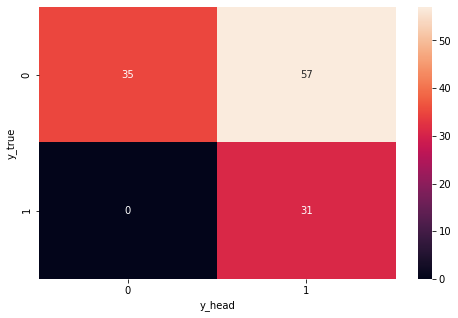

y_predict        0
0   -1.0
1    1.0
2    1.0
3   -1.0
4   -1.0
..   ...
118  1.0
119  1.0
120 -1.0
121  1.0
122  1.0

[123 rows x 1 columns]
correct      kelas
88    True
217  False
78    True
134   True
132   True
..     ...
37    True
124  False
120   True
61    True
216  False

[123 rows x 1 columns]


In [108]:

if __name__ == "__main__":
    import pylab as pl           
    def fsvm():
        
        clf = FSVM(C=5)
        clf.fit(X_train, y_train)
        y_predict = clf.predict(X_test)
        correct = (y_predict == y_test)
        f, ax = plt.subplots(figsize=(8,5))
        sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt=".0f", ax=ax)
        plt.xlabel("y_head")
        plt.ylabel("y_true")
        plt.show()
        y_predict=pd.DataFrame(y_predict)
        correct=pd.DataFrame(correct)
        print('y_predict',y_predict)
        print('correct',correct)
        correct=pd.DataFrame(y_predict)
        correct.to_excel('correct_Euclidean.xlsx')

    fsvm()    

In [25]:
margin=math.sqrt((0.46342962)**2+(0.90222251)**2+(-2.26818301)**2+(-0.12669738)**2+(-0.26522258)**2+(-0.06933321)**2)
margin=2/margin
margin

0.7990653860282224

In [112]:
TP=35
FP=0
FN=57
TN=31
Sensitifitas=(TP)/(TP+FN)
Speficity=(TN)/(TN+FP)
G_means=math.sqrt(Sensitifitas*Speficity)
AUC_Akurasi=0.5*(Sensitifitas+Speficity)
G_means












0.6167939547439613

# Menghitung Jarak Manhattan 

In [225]:
Mean_KP=np.array([[53.679012,62.82716,7.45679]])
Mean_KN=np.array([[52.017778,62.862222,2.791111]])
kelas_positif=np.array(kelas_positif)
kelas_negatif=np.array(kelas_negatif)



#Menghitung jarak Manhattan dari sample positif ke cluster kelas positif
for t0 in (Mean_KP):
    jarak_Manhattan_SP_KP=list()
    for t1 in (kelas_positif):
        jarak_Manhattan_SP_KP1 =round((sum((abs(t0-t1)))),6)
        #print('jarak_Manhattan_SP->KP',jarak_Manhattan_SP_KP)
        jarak_Manhattan_SP_KP.append(jarak_Manhattan_SP_KP1)
    print('jarak_Manhattan_SP->KP',jarak_Manhattan_SP_KP)
        

#Menghitung jarak Manhattan dari sample positif ke cluster kelas Negatif
for t3 in (Mean_KN):
    jarak_Manhattan_SP_KN=list()
    for t4 in (kelas_positif):
        jarak_Manhattan_SP_KN1=round((sum((abs(t3-t4)))),6)
        #print('jarak_Manhattan_SP->KN',jarak_Manhattan_SP_KN)
        jarak_Manhattan_SP_KN.append(jarak_Manhattan_SP_KN1)
    print('jarak_Manhattan_SP->KN',jarak_Manhattan_SP_KN)
        
    
#Menghitung jarak Manhattan dari sample negatif ke cluster kelas positif
for c0 in (Mean_KP):
    jarak_Manhattan_SN_KP=list()
    for c1 in (kelas_negatif):
        jarak_Manhattan_SN_KP1 =round((sum((abs(c0-c1)))),6)
        #print('jarak_Manhattan_SN->KP',jarak_Manhattan_SN_KP)
        jarak_Manhattan_SN_KP.append(jarak_Manhattan_SN_KP1)
    print('jarak_Manhattan_SN->KP',jarak_Manhattan_SN_KP)

#Menghitung jarak Manhattan dari sample negatif ke cluster kelas Negatif
for c3 in (Mean_KN): 
    jarak_Manhattan_SN_KN=list() 
    for c4 in (kelas_negatif):
        jarak_Manhattan_SN_KN1 =round((sum((abs(c3-c4)))),6)
        #print('jarak_Manhattan_SN->KN',jarak_Manhattan_SN_KN)
        jarak_Manhattan_SN_KN.append(jarak_Manhattan_SN_KN1)
    print('jarak_Manhattan_SN->KN',jarak_Manhattan_SN_KN)   

jarak_Manhattan_SP->KP [30.962962, 24.395062, 35.395062, 25.308642, 31.049382, 21.308642, 24.308642, 24.308642, 22.962962, 60.049382, 19.962962, 19.308642, 19.308642, 12.308642, 16.049382, 21.395062, 12.308642, 19.308642, 19.308642, 17.962962, 18.308642, 10.962962, 22.395062, 22.395062, 14.962962, 16.308642, 14.049382, 14.049382, 10.308642, 12.308642, 8.395062, 9.395062, 12.308642, 12.049382, 10.962962, 12.308642, 10.962962, 6.962962, 8.308642, 8.962962, 9.308642, 8.962962, 5.049382, 17.395062, 7.395062, 6.691358, 18.037038, 4.950618, 5.950618, 2.950618, 14.037038, 6.037038, 9.950618, 7.604938, 10.691358, 10.950618, 33.691358, 19.691358, 15.950618, 10.604938, 16.950618, 18.950618, 17.691358, 20.604938, 22.037038, 18.604938, 23.604938, 18.604938, 26.691358, 22.037038, 24.604938, 19.691358, 15.037038, 19.950618, 20.037038, 28.604938, 24.604938, 25.950618, 26.950618, 32.950618, 39.604938]
jarak_Manhattan_SP->KN [24.671111, 27.364445, 38.364445, 18.946667, 34.088889, 14.946667, 17.946667, 

 # Nilai Keanggotaan Berdasarkan Jarak Manhattan
 

In [226]:
from random import sample
dadu_1=list(jarak_Manhattan_SP_KP)
dadu_2=list(jarak_Manhattan_SP_KN)
dadu_3=list(jarak_Manhattan_SN_KP)
dadu_4=list(jarak_Manhattan_SN_KN)
dadu_5=nilai_mf_fix_KP
dadu_6=nilai_mf_fix_KN

MF_Manhattan1=[]
for i in range(len(dadu_1)):
    if (dadu_1[i]>=dadu_2[i]):
        mf=dadu_5[i]
    elif (dadu_1[i]<dadu_2[i]):
        mf=[1,1,1]
    MF_Manhattan1.append(mf)
print(MF_Manhattan1)

print('=========================================================================================================================')
MF_Manhattan2=[]
for k in range(len(dadu_3)):
    if (dadu_3[k]>dadu_4[k]):
        mf2=[1,1,1]
    elif (dadu_3[k]<=dadu_4[k]):
        mf2=dadu_6[k]
    MF_Manhattan2.append(mf2)
print(MF_Manhattan2)


[(0.150079, 0.514862, 0.716328), [1, 1, 1], [1, 1, 1], (0.3481, 0.633646, 0.716328), [1, 1, 1], (0.455073, 0.939559, 0.716328), (0.455073, 0.45421, 0.716328), (0.51273, 0.177818, 0.778694), (0.51273, 0.514862, 0.716328), [1, 1, 1], (0.572062, 0.514862, 0.836393), (0.572062, 0.939559, 0.716328), (0.572062, 0.939559, 0.716328), [1, 1, 1], [1, 1, 1], [1, 1, 1], [1, 1, 1], (0.691495, 0.633646, 0.716328), (0.691495, 0.45421, 0.778694), (0.749171, 0.34781, 0.836393), (0.749171, 0.177818, 0.887651), (0.749171, 0.969466, 0.964434), [1, 1, 1], [1, 1, 1], (0.803747, 0.969466, 0.716328), (0.803747, 0.807363, 0.716328), [1, 1, 1], [1, 1, 1], [1, 1, 1], (0.898328, 0.998647, 0.716328), [1, 1, 1], [1, 1, 1], (0.935862, 0.939559, 0.716328), [1, 1, 1], (0.965461, 0.514862, 0.887651), (0.986289, 0.177818, 0.887651), (0.986289, 0.514862, 0.836393), (0.986289, 0.969466, 0.887651), (0.986289, 0.633646, 0.930814), (0.997745, 0.34781, 0.930814), (0.997745, 0.807363, 0.778694), (0.997745, 0.514862, 0.887651),

In [243]:
MF_Manhattan1=pd.DataFrame(MF_Manhattan1)
MF_Manhattan2=pd.DataFrame(MF_Manhattan2)
MF_Manhattan3=[MF_Manhattan1,MF_Manhattan2]
pd.concat(MF_Manhattan3)
MF_Manhattan=pd.concat(MF_Manhattan3,ignore_index=True)
Variabel = data.iloc[:,0:3]
kelas= data.iloc[:,3] 
data_Manhattan1=pd.merge(Variabel, MF_Manhattan,left_index=True, right_index=True)
data_Manhattan=pd.merge(data_Manhattan1,kelas,left_index=True, right_index=True)
MF_Manhattan.to_excel('MF_Manhattan.xlsx',index=False)
MF_Manhattan







,0,1,2
0,0.150079,0.514862,0.716328
1,1.000000,1.000000,1.000000
2,1.000000,1.000000,1.000000
3,0.348100,0.633646,0.716328
4,1.000000,1.000000,1.000000
...,...,...,...
301,1.000000,1.000000,1.000000
302,1.000000,1.000000,1.000000
303,1.000000,1.000000,1.000000
304,1.000000,1.000000,1.000000


In [244]:
train= data_Manhattan
train

,usia,jenis,sel,0,1,2,kelas
0,34,59,0,0.150079,0.514862,0.716328,1
1,34,66,9,1.000000,1.000000,1.000000,1
2,38,69,21,1.000000,1.000000,1.000000,1
3,39,66,0,0.348100,0.633646,0.716328,1
4,41,60,23,1.000000,1.000000,1.000000,1
...,...,...,...,...,...,...,...
301,73,68,0,1.000000,1.000000,1.000000,-1
302,74,63,0,1.000000,1.000000,1.000000,-1
303,75,62,1,1.000000,1.000000,1.000000,-1
304,76,67,0,1.000000,1.000000,1.000000,-1


In [245]:
features = train.columns[0:6]
X = train[features]
y1=train.columns[6]
y = train[y1]
print(X)
print(y)

     usia  jenis  sel         0         1         2
0      34     59    0  0.150079  0.514862  0.716328
1      34     66    9  1.000000  1.000000  1.000000
2      38     69   21  1.000000  1.000000  1.000000
3      39     66    0  0.348100  0.633646  0.716328
4      41     60   23  1.000000  1.000000  1.000000
..    ...    ...  ...       ...       ...       ...
301    73     68    0  1.000000  1.000000  1.000000
302    74     63    0  1.000000  1.000000  1.000000
303    75     62    1  1.000000  1.000000  1.000000
304    76     67    0  1.000000  1.000000  1.000000
305    77     65    3  1.000000  1.000000  1.000000

[306 rows x 6 columns]
0      1
1      1
2      1
3      1
4      1
      ..
301   -1
302   -1
303   -1
304   -1
305   -1
Name: kelas, Length: 306, dtype: int64


In [247]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.4,random_state=1000)

print(X_train,y_train)

     usia  jenis  sel         0         1         2
183    50     66    1  1.000000  1.000000  1.000000
254    61     65    8  0.715954  0.801741  0.673389
115    39     59    2  1.000000  1.000000  1.000000
23     47     63   23  1.000000  1.000000  1.000000
135    43     64    2  1.000000  1.000000  1.000000
..    ...    ...  ...       ...       ...       ...
257    62     62    6  0.661873  0.964693  0.860649
251    61     59    0  1.000000  1.000000  1.000000
192    52     60    5  1.000000  1.000000  1.000000
71     66     61   13  1.000000  1.000000  1.000000
87     33     60    0  1.000000  1.000000  1.000000

[183 rows x 6 columns] 183   -1
254   -1
115   -1
23     1
135   -1
      ..
257   -1
251   -1
192   -1
71     1
87    -1
Name: kelas, Length: 183, dtype: int64


In [248]:
print(X_train, y_train)

     usia  jenis  sel         0         1         2
183    50     66    1  1.000000  1.000000  1.000000
254    61     65    8  0.715954  0.801741  0.673389
115    39     59    2  1.000000  1.000000  1.000000
23     47     63   23  1.000000  1.000000  1.000000
135    43     64    2  1.000000  1.000000  1.000000
..    ...    ...  ...       ...       ...       ...
257    62     62    6  0.661873  0.964693  0.860649
251    61     59    0  1.000000  1.000000  1.000000
192    52     60    5  1.000000  1.000000  1.000000
71     66     61   13  1.000000  1.000000  1.000000
87     33     60    0  1.000000  1.000000  1.000000

[183 rows x 6 columns] 183   -1
254   -1
115   -1
23     1
135   -1
      ..
257   -1
251   -1
192   -1
71     1
87    -1
Name: kelas, Length: 183, dtype: int64


In [249]:
print(X_train.shape,X_test.shape)

(183, 6) (123, 6)


In [250]:
X_train=np.asarray(X_train)
y_train=np.asarray(y_train)

In [221]:
A=(1+8294.130239)**2
A

68809185.6819722

In [251]:
Kernel=[]
for x0 in X_train:
  m=[]
  for x1 in X_train:
    m0=np.matmul(x0,x1)
    m1=(1+m0)**(2)
    print('m0')
    print(m0)
    print('m1')
    print(m1)
    m.append(m1)
  print('m')
  print('m',m)
  Kernel.append(m)
print('Kernel',Kernel)


m0
6860.0
m1
47073321.0
m0
7350.191084
m1
54040010.3534811
m0
5849.0
m1
34222500.0
m0
6534.0
m1
42706225.0
m0
6379.0
m1
40704400.0
m0
6811.0
m1
46403344.0
m0
7459.0
m1
55651600.0
m0
6917.0
m1
47858724.0
m0
7179.0
m1
51552400.0
m0
7643.0
m1
58430736.0
m0
7010.0
m1
49154121.0
m0
6962.550749000001
m1
48491039.03389847
m0
6674.0
m1
44555625.0
m0
6608.041469000001
m1
43679429.13896169
m0
7407.0
m1
54878464.0
m0
7891.0
m1
62283664.0
m0
5793.0
m1
33570436.0
m0
7245.0
m1
52504516.0
m0
6914.0
m1
47817225.0
m0
7743.0
m1
59969536.0
m0
6380.0
m1
40717161.0
m0
7367.0
m1
54287424.0
m0
6362.0
m1
40487769.0
m0
7129.539603
m1
50844595.0299514
m0
6832.0
m1
46689889.0
m0
6229.0
m1
38812900.0
m0
6676.0
m1
44582329.0
m0
5813.0
m1
33802596.0
m0
7198.0
m1
51825601.0
m0
8043.0
m1
64705936.0
m0
5998.0
m1
35988001.0
m0
6011.0
m1
36144144.0
m0
6827.0
m1
46621584.0
m0
6795.0
m1
46185616.0
m0
7275.0
m1
52940176.0
m0
7178.0
m1
51538041.0
m0
5489.0113280000005
m1
30140224.381568328
m0
7111.0
m1
50580544.0
m0
6613.0


58491230.295262784
m0
7012.025615460022
m1
49182528.28309842
m0
6486.057150818554
m1
42081910.477986135
m0
8073.099888186286
m1
65191089.0044098
m0
7135.191084000001
m1
50925223.18736111
m0
7444.191084000001
m1
55430870.27727311
m0
7621.191084000001
m1
58097796.92100911
m0
7167.191084
m1
51382963.416737095
m0
6788.191084000001
m1
46093115.575065106
m0
7328.986150561043
m1
53728696.9674167
m0
6150.191084
m1
37837151.75188109
m0
6220.191084000001
m1
38703218.503641106
m0
8111.191084000001
m1
65807644.18332911
m0
6857.172337509844
m1
47034527.81098523
m0
6811.191084000001
m1
46405947.36492911
m0
7886.718377353741
m1
62216101.20044393
m0
8764.339781938445
m1
76831181.49283269
m0
6693.081522637876
m1
44810727.43172183
m0
7106.191084000001
m1
50512165.10448911
m0
6894.191084
m1
47543660.084873095
m0
7208.191084000001
m1
51972436.08562511
m0
7186.614327963704
m1
51661799.727549136
m0
6561.191084000001
m1
43062351.82292911
m0
7017.191084000001
m1
49255006.09153711
m0
7151.191084000001
m1
51153

m0
6300.0
m1
39702601.0
m0
5582.0
m1
31169889.0
m0
4951.0
m1
24522304.0
m0
5711.924399
m1
32637505.188689515
m0
6043.0
m1
36529936.0
m0
5843.0
m1
34152336.0
m0
6315.0
m1
39891856.0
m0
5398.0
m1
29149201.0
m0
5188.0
m1
26925721.0
m0
5163.0
m1
26666896.0
m0
4868.0
m1
23707161.0
m0
6314.0
m1
39879225.0
m0
6107.0517580000005
m1
37308296.278406896
m0
6745.0
m1
45508516.0
m0
6450.0
m1
41615401.0
m0
5221.933374
m1
27279033.029243026
m0
5835.0
m1
34058896.0
m0
5856.0
m1
34304449.0
m0
5120.743920000001
m1
26232260.782056976
m0
5921.0
m1
35070084.0
m0
6233.0
m1
38862756.0
m0
5455.0
m1
29767936.0
m0
6158.0
m1
37933281.0
m0
6218.0
m1
38675961.0
m0
5478.367974
m1
30023473.39449686
m0
5868.0
m1
34445161.0
m0
6076.619421
m1
36937457.82651638
m0
6119.0
m1
37454400.0
m0
5126.0
m1
26286129.0
m0
6770.0
m1
45846441.0
m0
5710.0
m1
32615521.0
m0
6394.845203
m1
40906835.860738106
m0
5014.1797990000005
m1
25152028.416297685
m0
4697.0
m1
22071204.0
m0
5990.0
m1
35892081.0
m0
5168.459645999999
m1
26723313.03162

39443427.400686465
m0
6712.0
m1
45064369.0
m0
6619.0
m1
43824400.0
m0
5942.579526
m1
35326137.58188639
m0
5962.0
m1
35557369.0
m0
5961.11096
m1
35546767.09935212
m0
6055.227949
m1
36677896.970248744
m0
6274.613303
m1
39383322.32879057
m0
6540.0
m1
42784681.0
m0
5898.0
m1
34798201.0
m0
6751.0
m1
45589504.0
m0
6070.0
m1
36857041.0
m0
6782.0
m1
46009089.0
m0
7718.0
m1
59582961.0
m0
6198.438931999999
m1
38433043.07159729
m0
5935.0
m1
35236096.0
m0
5316.381269
m1
28274543.559912056
m0
6581.0
m1
43322724.0
m0
6344.0
m1
40259025.0
m0
7404.0
m1
54834025.0
m0
6658.281899999999
m1
44346035.423667595
m0
6345.469242
m1
40277671.839652054
m0
5595.7397550000005
m1
31323495.885197464
m0
7090.0
m1
50282281.0
m0
6055.227949
m1
36677896.970248744
m0
6390.0
m1
40844881.0
m0
7561.0
m1
57183844.0
m0
5932.0
m1
35200489.0
m0
6039.0
m1
36481600.0
m0
6839.0
m1
46785600.0
m0
6242.0
m1
38975049.0
m0
6370.0
m1
40589641.0
m0
6218.0
m1
38675961.0
m0
6699.0
m1
44890000.0
m0
6808.0
m1
46362481.0
m0
6446.0
m1
41563809

39337984.0
m0
6771.0
m1
45859984.0
m0
6226.698074000001
m1
38784223.30090332
m0
7210.918100999999
m1
52011762.695531435
m0
7404.0
m1
54834025.0
m0
6440.0
m1
41486481.0
m0
5625.0
m1
31651876.0
m0
6607.9243989999995
m1
43677881.711697504
m0
7043.0
m1
49617936.0
m0
6943.0
m1
48219136.0
m0
7447.0
m1
55472704.0
m0
6218.0
m1
38675961.0
m0
5956.0
m1
35485849.0
m0
5933.0
m1
35212356.0
m0
5618.0
m1
31573161.0
m0
7480.0
m1
55965361.0
m0
7105.0517580000005
m1
50495971.587374896
m0
7997.0
m1
63968004.0
m0
7682.0
m1
59028489.0
m0
6093.933374000001
m1
37148212.83349904
m0
6867.0
m1
47169424.0
m0
6778.0
m1
45954841.0
m0
5944.743920000001
m1
35351870.76221698
m0
7049.0
m1
49702500.0
m0
7473.0
m1
55860676.0
m0
6347.0
m1
40297104.0
m0
7268.0
m1
52838361.0
m0
7298.0
m1
53275401.0
m0
6422.367974
m1
41259656.12940886
m0
6920.0
m1
47900241.0
m0
7074.619421
m1
50064390.19083238
m0
7215.0
m1
52070656.0
m0
5946.0
m1
35366809.0
m0
8040.0
m1
64657681.0
m0
6632.0
m1
43996689.0
m0
7518.845203
m1
56548071.87708211


7783.0
m1
60590656.0
m0
7208.0
m1
51969681.0
m0
7044.550749000001
m1
49639785.35673448
m0
6800.0
m1
46253601.0
m0
6635.041469000001
m1
44037046.37828769
m0
7485.0
m1
56040196.0
m0
8027.0
m1
64448784.0
m0
5748.0
m1
33051001.0
m0
7374.0
m1
54390625.0
m0
7122.0
m1
50737129.0
m0
7893.0
m1
62315236.0
m0
6506.0
m1
42341049.0
m0
7616.0
m1
58018689.0
m0
6398.0
m1
40947201.0
m0
7285.539603
m1
53093659.3860874
m0
6906.0
m1
47706649.0
m0
6266.0
m1
39275289.0
m0
6705.0
m1
44970436.0
m0
5818.0
m1
33860761.0
m0
7299.0
m1
53290000.0
m0
8204.0
m1
67322025.0
m0
6017.0
m1
36216324.0
m0
6007.0
m1
36096064.0
m0
6895.0
m1
47554816.0
m0
6879.0
m1
47334400.0
m0
7359.0
m1
54169600.0
m0
7286.0
m1
53100369.0
m0
5530.0113280000005
m1
30592086.31046433
m0
7217.0
m1
52099524.0
m0
6748.0
m1
45549001.0
m0
7626.0
m1
58171129.0
m0
6610.0
m1
43705321.0
m0
6651.4400399999995
m1
44254958.48579519
m0
7748.358136000001
m1
60052551.51998941
m0
7085.0
m1
50211396.0
m0
6353.0
m1
40373316.0
m0
6879.0
m1
47334400.0
m0
6304.6980

51667344.0
m0
7681.0
m1
59013124.0
m0
7624.0
m1
58140625.0
m0
5618.0113280000005
m1
31573288.30419233
m0
7563.0
m1
57214096.0
m0
6866.0
m1
47155689.0
m0
7998.0
m1
63984001.0
m0
6872.0
m1
47238129.0
m0
6793.4400399999995
m1
46164415.4571552
m0
7998.358136000001
m1
63989730.587989405
m0
7307.0
m1
53406864.0
m0
6551.0
m1
42928704.0
m0
7187.0
m1
51667344.0
m0
6484.698074000001
m1
42064279.50708732
m0
7612.918100999999
m1
57971748.84873544
m0
7870.0
m1
61952641.0
m0
6738.0
m1
45414121.0
m0
5797.0
m1
33616804.0
m0
6923.924399
m1
47954577.93186552
m0
7427.0
m1
55175184.0
m0
7447.0
m1
55472704.0
m0
7935.0
m1
62980096.0
m0
6488.0
m1
42107121.0
m0
6246.0
m1
39025009.0
m0
6177.0
m1
38167684.0
m0
5872.0
m1
34492129.0
m0
8002.0
m1
64048009.0
m0
7487.0517580000005
m1
56070919.1304869
m0
8561.0
m1
73307844.0
m0
8256.0
m1
68178049.0
m0
6437.933374000001
m1
41459862.994811036
m0
7315.0
m1
53523856.0
m0
7112.0
m1
50594769.0
m0
6246.743920000001
m1
39034304.08989698
m0
7573.0
m1
57365476.0
m0
8077.0
m1
6

7188.0
m1
51681721.0
m0
8195.0
m1
67174416.0
m0
9314.0
m1
86769225.0
m0
6837.438931999999
m1
46764247.02669329
m0
6922.0
m1
47927929.0
m0
6114.381269
m1
37397888.065236054
m0
7710.0
m1
59459521.0
m0
7381.0
m1
54493924.0
m0
8916.0
m1
79512889.0
m0
7304.281899999999
m1
53367143.638467595
m0
7300.469242
m1
53311453.09187206
m0
6315.7397550000005
m1
39901201.132397465
m0
8518.0
m1
72573361.0
m0
7043.227949000001
m1
49621147.39747276
m0
7521.0
m1
56580484.0
m0
8648.0
m1
74805201.0
m0
6721.0
m1
45185284.0
m0
6979.0
m1
48720400.0
m0
8045.0
m1
64738116.0
m0
7458.0
m1
55636681.0
m0
7442.0
m1
55398249.0
m0
7391.0
m1
54641664.0
m0
7911.0
m1
62599744.0
m0
8116.0
m1
65885689.0
m0
7724.0
m1
59675625.0
m0
8914.0
m1
79477225.0
m0
7178.0
m1
51538041.0
m0
7852.0
m1
61669609.0
m0
7452.0
m1
55547209.0
m0
9048.0
m1
81884401.0
m0
8043.0
m1
64705936.0
m0
7778.583801999999
m1
60521924.13234076
m0
7521.0
m1
56580484.0
m0
6717.0
m1
45131524.0
m0
8186.487215
m1
67034946.89578846
m0
7925.0
m1
62821476.0
m0
7387.0

49639785.35673448
m0
7304.550749
m1
53371071.746214464
m0
7776.550749000001
m1
60490295.653270476
m0
7172.550749
m1
51459830.34847846
m0
7078.240687947433
m1
50115648.71789044
m0
6812.550749000001
m1
46424473.80919848
m0
6697.750289296363
m1
44873255.43834811
m0
7520.550749000001
m1
56573725.669782475
m0
8026.550749000001
m1
64441571.027770475
m0
5852.550749000001
m1
34264056.37111847
m0
7370.550749
m1
54339760.44508246
m0
7084.550749
m1
50205029.41665446
m0
7880.550749000001
m1
62118842.20906247
m0
6524.550749000001
m1
42582812.57777447
m0
7562.550749
m1
57207299.93269846
m0
6452.550749000001
m1
41648317.26991847
m0
7261.356102445638
m1
52741816.15872939
m0
6948.550749000001
m1
48296255.612926476
m0
6316.550749
m1
39911447.46619046
m0
6768.550749000001
m1
45826817.34328647
m0
5886.550749
m1
34663253.82205046
m0
7326.550749000001
m1
53692999.97917047
m0
8190.550749000001
m1
67101503.673442475
m0
6082.550749
m1
37009589.71565846
m0
6084.550749000001
m1
37033927.91865447
m0
6930.55074900

50765625.0
m0
6308.367974
m1
39808124.23133686
m0
6772.0
m1
45873529.0
m0
7143.619421
m1
51045586.67093038
m0
7035.0
m1
49505296.0
m0
5846.0
m1
34187409.0
m0
7863.0
m1
61842496.0
m0
6615.0
m1
43771456.0
m0
7348.845203
m1
54020224.50806211
m0
5826.1797990000005
m1
33956024.40987369
m0
5296.0
m1
28058209.0
m0
7097.0
m1
50381604.0
m0
5952.459645999999
m1
35443681.75655044
m0
7487.0
m1
56070144.0
m0
6474.0
m1
41925625.0
m0
6446.0
m1
41563809.0
m0
5596.0
m1
31326409.0
m0
7570.9082069999995
m1
57333793.895233944
m0
7121.229802
m1
50726157.35249696
m0
7489.0
m1
56100100.0
m0
6435.0
m1
41422096.0
m0
6583.0
m1
43349056.0
m0
6897.665672
m1
47591588.054031216
m0
6399.760709000001
m1
40969737.6538782
m0
6013.470125
m1
36173850.88451751
m0
7207.549919
m1
51963191.934714906
m0
6420.0
m1
41229241.0
m0
6696.0
m1
44849809.0
m0
6941.0
m1
48191364.0
m0
6537.0
m1
42745444.0
m0
6200.0
m1
38452401.0
m0
6675.707503999999
m1
44578423.0939699
m0
5700.0
m1
32501401.0
m0
5683.0
m1
32307856.0
m0
7233.0
m1
5233075

65480464.0
m0
7485.0
m1
56040196.0
m0
7803.0
m1
60902416.0
m0
8307.0
m1
69022864.0
m0
7608.0
m1
57896881.0
m0
7520.550749000001
m1
56573725.669782475
m0
7200.0
m1
51854401.0
m0
7121.041469000001
m1
50723474.686155684
m0
8013.0
m1
64224196.0
m0
8571.0
m1
73479184.0
m0
6198.0
m1
38427601.0
m0
7872.0
m1
61984129.0
m0
7494.0
m1
56175025.0
m0
8421.0
m1
70930084.0
m0
6858.0
m1
47045881.0
m0
7986.0
m1
63792169.0
m0
6858.0
m1
47045881.0
m0
7765.539603
m1
60319137.4049674
m0
7362.0
m1
54213769.0
m0
6720.0
m1
45171841.0
m0
7191.0
m1
51724864.0
m0
6252.0
m1
39100009.0
m0
7773.0
m1
60435076.0
m0
8742.0
m1
76440049.0
m0
6447.0
m1
41576704.0
m0
6459.0
m1
41731600.0
m0
7383.0
m1
54523456.0
m0
7359.0
m1
54169600.0
m0
7875.0
m1
62031376.0
m0
7782.0
m1
60575089.0
m0
5884.0113280000005
m1
34633358.33068833
m0
7713.0
m1
59505796.0
m0
7110.0
m1
50566321.0
m0
8148.0
m1
66406201.0
m0
7074.0
m1
50055625.0
m0
7099.4400399999995
m1
50416248.76163519
m0
8134.358136000001
m1
66184052.000981405
m0
7509.0
m1
564001

m1
56006674.3495722
m0
6869.470125
m1
47203359.738517515
m0
8705.549919000001
m1
75804011.49203892
m0
7687.0
m1
59105344.0
m0
8027.0
m1
64448784.0
m0
8095.0
m1
65545216.0
m0
7687.0
m1
59105344.0
m0
7211.0
m1
52012944.0
m0
7822.707503999999
m1
61210399.10814589
m0
6531.0
m1
42667024.0
m0
6667.0
m1
44462224.0
m0
8775.0
m1
77018176.0
m0
7345.625611
m1
53972907.86820113
m0
6871.0
m1
47224384.0
m0
8502.34597
m1
72306892.68551524
m0
9453.827357
m1
89393760.35067561
m0
7073.4618789999995
m1
50048010.8774242
m0
7619.0
m1
58064400.0
m0
7347.0
m1
53993104.0
m0
7755.0
m1
60155536.0
m0
7686.242466
m1
59093696.73107376
m0
7007.0
m1
49112064.0
m0
7551.0
m1
57032704.0
m0
7687.0
m1
59105344.0
m0
6667.0
m1
44462224.0
m0
7958.0046729999995
m1
63345755.38483583
m0
7415.0
m1
54997056.0
m0
7891.0
m1
62283664.0
m0
7755.0
m1
60155536.0
m0
7821.8146400000005
m1
61196428.89179834
m0
8231.0
m1
67765824.0
m0
8434.022620999998
m1
71149606.61678168
m0
7755.0
m1
60155536.0
m0
8571.0
m1
73479184.0
m0
8231.0
m1
67765

m1
34733191.55336846
m0
5668.0
m1
32137561.0
m0
5463.0
m1
29855296.0
m0
5948.0
m1
35390601.0
m0
4893.0
m1
23951236.0
m
m [33570436.0, 36701679.2102571, 25090081.0, 30349081.0, 29746116.0, 32364721.0, 37871716.0, 33051001.0, 34327881.0, 38925121.0, 32478601.0, 34264056.37111847, 31348801.0, 31843917.020853687, 38427601.0, 41783296.0, 26306641.0, 35093776.0, 31798321.0, 39677401.0, 29365561.0, 35808256.0, 29365561.0, 33091711.8840834, 33628401.0, 27973521.0, 32592681.0, 25140196.0, 36529936.0, 42954916.0, 26770276.0, 27133681.0, 32764176.0, 31967716.0, 36832761.0, 35212356.0, 22676751.888000328, 34445161.0, 31460881.0, 38241856.0, 30294016.0, 32689120.610995196, 37790012.0522454, 33860761.0, 29800681.0, 31967716.0, 29841070.24768332, 37306663.52852344, 37933281.0, 31181056.0, 25644096.0, 32580400.944699507, 35808256.0, 31741956.0, 37871716.0, 29474041.0, 26357956.0, 27133681.0, 23853456.0, 37380996.0, 36578930.067446895, 42562576.0, 38427601.0, 26552722.356883027, 32251041.0, 34035556.0,

m0
7282.0046729999995
m1
53042157.06693983
m0
6480.0
m1
42003361.0
m0
6903.0
m1
47665216.0
m0
6781.0
m1
45995524.0
m0
6883.8146400000005
m1
47400672.62715834
m0
7796.0
m1
60793209.0
m0
7534.022621
m1
56776565.89898171
m0
6779.0
m1
45968400.0
m0
7547.0
m1
56972304.0
m0
7351.0
m1
54051904.0
m0
6575.0
m1
43243776.0
m0
7074.0
m1
50055625.0
m0
7622.0
m1
58110129.0
m0
6536.873383
m1
42743788.37213986
m0
6714.400258
m1
45096600.62514646
m0
7325.0
m1
53670276.0
m0
6711.0
m1
45050944.0
m0
5972.579526
m1
35683652.35344639
m0
6239.0
m1
38937600.0
m0
6238.11096
m1
38926505.57119212
m0
6358.227949
m1
40439780.10734275
m0
6659.613303
m1
44363769.57210057
m0
6906.0
m1
47706649.0
m0
6243.0
m1
38987536.0
m0
7163.0
m1
51322896.0
m0
6484.0
m1
42055225.0
m0
7402.0
m1
54804409.0
m0
8395.0
m1
70492816.0
m0
6362.438932000001
m1
40493355.041293316
m0
6296.0
m1
39652209.0
m0
5522.381269
m1
30507740.642740056
m0
6974.0
m1
48650625.0
m0
6711.0
m1
45050944.0
m0
8037.0
m1
64609444.0
m0
6866.2819
m1
47159560.694067

77070841.0
m0
6809.0
m1
46376100.0
m0
7065.0
m1
49928356.0
m0
8157.0
m1
66552964.0
m0
7568.0
m1
57289761.0
m0
7536.0
m1
56806369.0
m0
7499.0
m1
56250000.0
m0
8019.0
m1
64320400.0
m0
8234.0
m1
67815225.0
m0
7840.0
m1
61481281.0
m0
9050.0
m1
81920601.0
m0
7268.0
m1
52838361.0
m0
7966.0
m1
63473089.0
m0
7556.0
m1
57108249.0
m0
9188.0
m1
84437721.0
m0
8153.0
m1
66487716.0
m0
7884.583801999999
m1
62182431.89836476
m0
7629.0
m1
58216900.0
m0
6801.0
m1
46267204.0
m0
8310.487215
m1
69080819.72510844
m0
8047.0
m1
64770304.0
m0
7491.0
m1
56130064.0
m0
8522.0
m1
72641529.0
m0
6180.0
m1
38204761.0
m
m [59969536.0, 71186193.38792907, 42640900.0, 53904964.0, 50851161.0, 60155536.0, 73479184.0, 62315236.0, 69155856.0, 78357904.0, 65885689.0, 62118842.20906247, 56987401.0, 54731017.57704369, 70930084.0, 83101456.0, 39677401.0, 70241161.0, 63664441.0, 80820100.0, 50908225.0, 72573361.0, 50908225.0, 69331261.76032738, 58844241.0, 49070025.0, 55711296.0, 41692849.0, 66422500.0, 86918329.0, 44302336.0, 44

m0
6765.227949
m1
45781840.65782875
m0
7093.613303
m1
50333537.91910457
m0
7371.0
m1
54346384.0
m0
6648.0
m1
44209201.0
m0
7653.0
m1
58583716.0
m0
6911.0
m1
47775744.0
m0
7911.0
m1
62599744.0
m0
8964.0
m1
80371225.0
m0
6805.438932000001
m1
46327610.93504532
m0
6720.0
m1
45171841.0
m0
5869.381269
m1
34461376.243426055
m0
7432.0
m1
55249489.0
m0
7160.0
m1
51279921.0
m0
8580.0
m1
73633561.0
m0
7367.281899999999
m1
54291578.157867596
m0
7031.469242
m1
49455623.63967606
m0
6196.7397550000005
m1
38411978.07070746
m0
8196.0
m1
67190809.0
m0
6765.227949
m1
45781840.65782875
m0
7299.0
m1
53290000.0
m0
8650.0
m1
74839801.0
m0
6657.0
m1
44328964.0
m0
6748.0
m1
45549001.0
m0
7779.0
m1
60528400.0
m0
7174.0
m1
51480625.0
m0
7150.0
m1
51136801.0
m0
7131.0
m1
50865424.0
m0
7605.0
m1
57851236.0
m0
7806.0
m1
60949249.0
m0
7431.0
m1
55234624.0
m0
8577.0
m1
73582084.0
m0
6896.0
m1
47568609.0
m0
7552.0
m1
57047809.0
m0
7165.0
m1
51351556.0
m0
8707.0
m1
75829264.0
m0
7754.0
m1
60140025.0
m0
7499.583802
m1
5

m0
6034.0
m1
36421225.0
m0
6537.0
m1
42745444.0
m0
6631.0
m1
43983424.0
m0
6272.0
m1
39350529.0
m0
7216.0
m1
52085089.0
m0
6015.0
m1
36192256.0
m0
6417.0
m1
41190724.0
m0
6134.0
m1
37638225.0
m0
7304.0
m1
53363025.0
m0
6645.0
m1
44169316.0
m0
6430.583802
m1
41365270.20214878
m0
6170.0
m1
38081241.0
m0
5632.0
m1
31730689.0
m0
6642.487215
m1
44135922.375868455
m0
6404.0
m1
41024025.0
m0
6076.0
m1
36929929.0
m0
6763.0
m1
45751696.0
m0
5235.0
m1
27415696.0
m
m [40487769.0, 46106694.95723311, 29582721.0, 36772096.0, 35164900.0, 39753025.0, 47472100.0, 40947201.0, 43811161.0, 49660209.0, 41757444.0, 41648317.26991847, 38266596.0, 37712390.32397769, 47045881.0, 52998400.0, 29365561.0, 44649124.0, 40678884.0, 50908225.0, 35141184.0, 46131264.0, 34928100.0, 43040679.8825314, 40246336.0, 33443089.0, 38514436.0, 29289744.0, 44502241.0, 54967396.0, 31192225.0, 31371201.0, 39992976.0, 39513796.0, 45333289.0, 43996689.0, 26194039.953536328, 43151761.0, 37736449.0, 48080356.0, 36808489.0, 37963343.36

54789604.0
m0
6278.0
m1
39425841.0
m0
6152.0
m1
37859409.0
m0
6000.0
m1
36012001.0
m0
5665.0
m1
32103556.0
m0
7411.0
m1
54937744.0
m0
7142.0517580000005
m1
51023188.4174669
m0
7919.0
m1
62726400.0
m0
7584.0
m1
57532225.0
m0
6109.933374000001
m1
37343506.70146704
m0
6861.0
m1
47087044.0
m0
6843.0
m1
46840336.0
m0
5970.743920000001
m1
35661725.44605698
m0
6961.0
m1
48469444.0
m0
7345.0
m1
53963716.0
m0
6365.0
m1
40525956.0
m0
7219.0
m1
52128400.0
m0
7276.0
m1
52954729.0
m0
6424.367974
m1
41285353.60130486
m0
6888.0
m1
47458321.0
m0
7189.619421
m1
51705007.65766238
m0
7171.0
m1
51437584.0
m0
5986.0
m1
35844169.0
m0
7969.0
m1
63520900.0
m0
6713.0
m1
45077796.0
m0
7492.845203
m1
56157715.92652611
m0
5902.1797990000005
m1
34847531.73932169
m0
5458.0
m1
29800681.0
m0
7111.0
m1
50580544.0
m0
6060.459645999999
m1
36741293.04008644
m0
7631.0
m1
58247424.0
m0
6652.0
m1
44262409.0
m0
6574.0
m1
43230625.0
m0
5758.0
m1
33166081.0
m0
7678.908207
m1
58980990.067945965
m0
7223.229802
m1
52189496.232104

6234.8146400000005
m1
38885384.22443834
m0
6381.0
m1
40729924.0
m0
6495.022621
m1
42198309.89254371
m0
6107.0
m1
37307664.0
m0
6686.0
m1
44715969.0
m0
6432.0
m1
41383489.0
m0
5897.0
m1
34786404.0
m0
6215.0
m1
38638656.0
m0
6672.0
m1
44528929.0
m0
5736.873383
m1
32923190.959339865
m0
5933.400258
m1
35217106.42215046
m0
6401.0
m1
40985604.0
m0
5884.0
m1
34633225.0
m0
5034.579526
m1
25357061.16267039
m0
5711.0
m1
32626944.0
m0
5710.11096
m1
32616788.397432122
m0
5798.227949
m1
33631044.804462746
m0
6001.613303
m1
36031366.46535257
m0
6168.0
m1
38056561.0
m0
5643.0
m1
31854736.0
m0
6344.0
m1
40259025.0
m0
5802.0
m1
33674809.0
m0
6445.0
m1
41550916.0
m0
7363.0
m1
54228496.0
m0
5699.438932
m1
32495004.0174613
m0
5609.0
m1
31472100.0
m0
5096.381269
m1
25983295.801552054
m0
6273.0
m1
39363076.0
m0
6002.0
m1
36036009.0
m0
7065.0
m1
49928356.0
m0
6024.2819
m1
36304021.97446761
m0
6058.469242
m1
36717167.494744055
m0
5228.7397550000005
m1
27350177.905027464
m0
6767.0
m1
45805824.0
m0
5798.227949


35605089.0
m0
5605.0
m1
31427236.0
m0
6294.0
m1
39627025.0
m0
5536.0
m1
30658369.0
m0
5658.4400399999995
m1
32029261.566355195
m0
6269.358136000001
m1
39317391.1537014
m0
5864.0
m1
34398225.0
m0
5420.0
m1
29387241.0
m0
5721.0
m1
32741284.0
m0
5404.698074
m1
29221571.66724731
m0
6139.918100999999
m1
37710875.123189434
m0
6243.0
m1
38987536.0
m0
5554.0
m1
30858025.0
m0
4953.0
m1
24542116.0
m0
5686.924399
m1
32352483.968739517
m0
6007.0
m1
36096064.0
m0
5777.0
m1
33385284.0
m0
6257.0
m1
39162564.0
m0
5383.0
m1
28987456.0
m0
5120.0
m1
26224641.0
m0
5152.0
m1
26553409.0
m0
4852.0
m1
23551609.0
m0
6248.0
m1
39050001.0
m0
6066.0517580000005
m1
36809117.0342509
m0
6673.0
m1
44542276.0
m0
6373.0
m1
40627876.0
m0
5183.933374
m1
26883534.092819028
m0
5772.0
m1
33327529.0
m0
5822.0
m1
33907329.0
m0
5095.743920000001
m1
25976798.586056974
m0
5851.0
m1
34245904.0
m0
6147.0
m1
37797904.0
m0
5425.0
m1
29441476.0
m0
6100.0
m1
37222201.0
m0
6169.0
m1
38068900.0
m0
5429.367974
m1
29488896.33304486
m0
580

41576704.0
m0
6851.0
m1
46949904.0
m0
6959.0
m1
48441600.0
m0
6135.0
m1
37650496.0
m0
7335.0046729999995
m1
53816964.56227783
m0
6771.0
m1
45859984.0
m0
7107.0
m1
50523664.0
m0
7027.0
m1
49392784.0
m0
7198.8146400000005
m1
51837330.85035834
m0
7650.0
m1
58537801.0
m0
7615.022621
m1
58003800.56358371
m0
7055.0
m1
49787136.0
m0
7766.0
m1
60326289.0
m0
7510.0
m1
56415121.0
m0
6825.0
m1
46594276.0
m0
7236.0
m1
52374169.0
m0
7769.0
m1
60372900.0
m0
6705.873383
m1
44982150.57559387
m0
6897.400258
m1
47587926.119574465
m0
7457.0
m1
55621764.0
m0
6894.0
m1
47541025.0
m0
5990.579526
m1
35899025.21638239
m0
6569.0
m1
43164900.0
m0
6568.110960000001
m1
43153218.804792136
m0
6676.227949000001
m1
44585373.08290676
m0
6932.613303000001
m1
48074993.43553858
m0
7151.0
m1
51151104.0
m0
6513.0
m1
42432196.0
m0
7374.0
m1
54390625.0
m0
6715.0
m1
45104656.0
m0
7518.0
m1
56535361.0
m0
8569.0
m1
73444900.0
m0
6618.438931999999
m1
43816971.77447729
m0
6506.0
m1
42341049.0
m0
5849.381269
m1
34226960.99266606
m

5350.0
m1
28633201.0
m0
5315.0
m1
28259856.0
m0
5005.0
m1
25060036.0
m0
6441.0
m1
41499364.0
m0
6265.0517580000005
m1
39263404.6339349
m0
6879.0
m1
47334400.0
m0
6569.0
m1
43164900.0
m0
5351.933374
m1
28653895.706483025
m0
5966.0
m1
35605089.0
m0
6017.0
m1
36216324.0
m0
5255.743920000001
m1
27633356.640456975
m0
6031.0
m1
36385024.0
m0
6335.0
m1
40144896.0
m0
5595.0
m1
31315216.0
m0
6289.0
m1
39564100.0
m0
6361.0
m1
40475044.0
m0
5607.367974
m1
31453791.331788864
m0
5995.0
m1
35952016.0
m0
6237.619421
m1
38920372.28007838
m0
6251.0
m1
39087504.0
m0
5263.0
m1
27709696.0
m0
6902.0
m1
47651409.0
m0
5863.0
m1
34386496.0
m0
6538.845203
m1
42769575.27920211
m0
5172.1797990000005
m1
26761789.232781686
m0
4845.0
m1
23483716.0
m0
6154.0
m1
37884025.0
m0
5338.459645999999
m1
28509829.31126244
m0
6651.0
m1
44249104.0
m0
5867.0
m1
34433424.0
m0
5740.0
m1
32959081.0
m0
5094.0
m1
25959025.0
m0
6643.9082069999995
m1
44154805.07945595
m0
6260.229802
m1
39202998.63345296
m0
6541.0
m1
42797764.0
m0
5795

m1
36228361.0
m0
5952.0
m1
35438209.0
m0
5433.0
m1
29528356.0
m0
5921.707503999999
m1
35078464.1779379
m0
5245.0
m1
27520516.0
m0
5189.0
m1
26936100.0
m0
6336.0
m1
40157569.0
m0
5739.625611
m1
32954782.405669127
m0
5248.0
m1
27552001.0
m0
6317.34597
m1
39921495.79661524
m0
6834.827357
m1
46728535.65470961
m0
5383.4618789999995
m1
28992429.726404205
m0
5707.0
m1
32581264.0
m0
5663.0
m1
32080896.0
m0
5807.0
m1
33732864.0
m0
5717.242466
m1
32698296.89996576
m0
5400.0
m1
29170801.0
m0
5696.0
m1
32455809.0
m0
5744.0
m1
33005025.0
m0
5189.0
m1
26936100.0
m0
5969.0046729999995
m1
35640955.79564183
m0
5674.0
m1
32205625.0
m0
5855.0
m1
34292736.0
m0
5833.0
m1
34035556.0
m0
6050.8146400000005
m1
36624460.43691833
m0
6092.0
m1
37124649.0
m0
6176.022621
m1
38155608.46034571
m0
5885.0
m1
34644996.0
m0
6407.0
m1
41062464.0
m0
6170.0
m1
38081241.0
m0
5685.0
m1
32330596.0
m0
5929.0
m1
35164900.0
m0
6325.0
m1
40018276.0
m0
5561.873383
m1
30945560.275289867
m0
5680.400258
m1
32278308.891602464
m0
6062.0

m1
42562576.0
m0
7035.0
m1
49505296.0
m0
7167.0
m1
51380224.0
m0
6795.0
m1
46185616.0
m0
7827.0
m1
61277584.0
m0
6439.0
m1
41473600.0
m0
6935.0
m1
48108096.0
m0
6611.0
m1
43718544.0
m0
7931.0
m1
62916624.0
m0
7151.0
m1
51151104.0
m0
6918.583801999999
m1
47880639.99290077
m0
6651.0
m1
44249104.0
m0
6027.0
m1
36336784.0
m0
7194.487215
m1
51775036.26122846
m0
6951.0
m1
48330304.0
m0
6547.0
m1
42876304.0
m0
7339.0
m1
53875600.0
m0
5559.0
m1
30913600.0
m
m [46621584.0, 53805028.2387931, 33732864.0, 41990400.0, 40144896.0, 46131264.0, 55532304.0, 47554816.0, 51609856.0, 58491904.0, 49056016.0, 48046395.78596247, 44036496.0, 43126033.65556569, 54523456.0, 62283664.0, 32764176.0, 52533504.0, 47610000.0, 60093504.0, 39992976.0, 54051904.0, 39992976.0, 51073028.2972474, 46076944.0, 38390416.0, 43983424.0, 33269824.0, 51322896.0, 64770304.0, 35378704.0, 35521600.0, 46294416.0, 45968400.0, 52649536.0, 51380224.0, 29485023.02220833, 50466816.0, 42981136.0, 56310016.0, 42510400.0, 42908264.71763519,

59350354.10691544
m0
7912.0
m1
62615569.0
m0
6876.0
m1
47293129.0
m0
6001.0
m1
36024004.0
m0
7055.9243989999995
m1
49800181.973201506
m0
7523.0
m1
56610576.0
m0
7423.0
m1
55115776.0
m0
7959.0
m1
63361600.0
m0
6638.0
m1
44076321.0
m0
6360.0
m1
40462321.0
m0
6333.0
m1
40119556.0
m0
5998.0
m1
35988001.0
m0
7996.0
m1
63952009.0
m0
7589.0517580000005
m1
57608885.6891189
m0
8549.0
m1
73102500.0
m0
8214.0
m1
67486225.0
m0
6509.933374000001
m1
42392253.40066704
m0
7339.0
m1
53875600.0
m0
7238.0
m1
52403121.0
m0
6348.743920000001
m1
40319247.84957698
m0
7537.0
m1
56821444.0
m0
7993.0
m1
63904036.0
m0
6779.0
m1
45968400.0
m0
7768.0
m1
60357361.0
m0
7798.0
m1
60824401.0
m0
6862.367974
m1
47105819.94652886
m0
7396.0
m1
54715609.0
m0
7558.619421
m1
57147845.79036038
m0
7711.0
m1
59474944.0
m0
6350.0
m1
40335201.0
m0
8596.0
m1
73908409.0
m0
7084.0
m1
50197225.0
m0
8034.845203
m1
64574808.12657811
m0
6130.1797990000005
m1
37591365.727665685
m0
5723.0
m1
32764176.0
m0
7436.0
m1
55308969.0
m0
6284.4596

42485770.48687214
m0
6635.227949000001
m1
44039521.39108876
m0
6925.613303
m1
47977971.84929657
m0
7117.0
m1
50665924.0
m0
6498.0
m1
42237001.0
m0
7354.0
m1
54096025.0
m0
6729.0
m1
45292900.0
m0
7610.0
m1
57927321.0
m0
8662.0
m1
75047569.0
m0
6478.438931999999
m1
41983128.87351729
m0
6491.0
m1
42146064.0
m0
5783.381269
m1
33459066.665158056
m0
7237.0
m1
52388644.0
m0
6929.0
m1
48024900.0
m0
8298.0
m1
68873401.0
m0
6901.281899999999
m1
47641495.4270676
m0
6896.469242
m1
47575081.94433606
m0
5966.7397550000005
m1
35613917.783407465
m0
7934.0
m1
62964225.0
m0
6635.227949000001
m1
44039521.39108876
m0
7032.0
m1
49463089.0
m0
8077.0
m1
65254084.0
m0
6320.0
m1
39955041.0
m0
6574.0
m1
43230625.0
m0
7533.0
m1
56761156.0
m0
6960.0
m1
48455521.0
m0
7000.0
m1
49014001.0
m0
6902.0
m1
47651409.0
m0
7413.0
m1
54967396.0
m0
7580.0
m1
57471561.0
m0
7201.0
m1
51868804.0
m0
8303.0
m1
68956416.0
m0
6754.0
m1
45630025.0
m0
7334.0
m1
53802225.0
m0
6975.0
m1
48664576.0
m0
8421.0
m1
70930084.0
m0
7537.0
m1
5

29154994.026745617
m0
4703.646417388055
m1
22133697.91264226
m0
5858.0113280000005
m1
34328013.74163233
m0
5131.763358476567
m1
26345259.69411965
m0
5293.0113280000005
m1
28026555.94099233
m0
6124.0113280000005
m1
37515763.76812833
m0
4907.0113280000005
m1
24088575.19577633
m0
5094.0113280000005
m1
25959140.432448328
m0
5697.0113280000005
m1
32467333.09401633
m0
5180.0113280000005
m1
26842878.38086433
m0
5380.0113280000005
m1
28955282.91206433
m0
5157.0113280000005
m1
26605080.85977633
m0
5611.0113280000005
m1
31494671.14560033
m0
5660.0113280000005
m1
32047049.25574433
m0
5337.0113280000005
m1
28494364.937856328
m0
6131.0113280000005
m1
37601562.92672033
m0
5198.0113280000005
m1
27029718.788672328
m0
5478.0113280000005
m1
30019565.13235233
m0
5255.0113280000005
m1
27625655.08006433
m0
6197.0113280000005
m1
38415344.42201633
m0
5712.0113280000005
m1
32638498.43385633
m0
5529.845635996618
m1
30590253.44922283
m0
5373.0113280000005
m1
28879997.75347233
m0
4877.0113280000005
m1
23794994.5

m0
6670.0
m1
44502241.0
m0
7551.0
m1
57032704.0
m0
8594.0
m1
73874025.0
m0
6401.438931999999
m1
40991224.27798929
m0
6430.0
m1
41357761.0
m0
5724.381269
m1
32779990.675416056
m0
7170.0
m1
51423241.0
m0
6863.0
m1
47114496.0
m0
8232.0
m1
67782289.0
m0
6818.281899999999
m1
46502605.6316676
m0
6826.469242
m1
46614336.25045606
m0
5901.7397550000005
m1
34842336.615257464
m0
7870.0
m1
61952641.0
m0
6571.227949
m1
43194180.21361675
m0
6969.0
m1
48580900.0
m0
7996.0
m1
63952009.0
m0
6253.0
m1
39112516.0
m0
6509.0
m1
42380100.0
m0
7465.0
m1
55741156.0
m0
6902.0
m1
47651409.0
m0
6934.0
m1
48094225.0
m0
6843.0
m1
46840336.0
m0
7347.0
m1
53993104.0
m0
7516.0
m1
56505289.0
m0
7142.0
m1
51022449.0
m0
8236.0
m1
67848169.0
m0
6690.0
m1
44769481.0
m0
7272.0
m1
52896529.0
m0
6914.0
m1
47817225.0
m0
8354.0
m1
69806025.0
m0
7469.0
m1
55800900.0
m0
7224.583802
m1
52209061.27972478
m0
6969.0
m1
48580900.0
m0
6261.0
m1
39212644.0
m0
7566.487215
m1
57266862.74918846
m0
7319.0
m1
53582400.0
m0
6851.0
m1
4694990

m1
51724864.0
m0
8328.0
m1
69372241.0
m0
7182.0
m1
51595489.0
m0
7138.4400399999995
m1
50971604.0847552
m0
8323.358136
m1
69294938.37638941
m0
7632.0
m1
58262689.0
m0
6876.0
m1
47293129.0
m0
7497.0
m1
56220004.0
m0
6814.698074000001
m1
46453740.23592732
m0
7957.918100999999
m1
63344377.338425435
m0
8205.0
m1
67338436.0
m0
7068.0
m1
49970761.0
m0
6117.0
m1
37429924.0
m0
7258.9243989999995
m1
52706502.2791955
m0
7767.0
m1
60341824.0
m0
7737.0
m1
59876644.0
m0
8265.0
m1
68326756.0
m0
6813.0
m1
46430596.0
m0
6546.0
m1
42863209.0
m0
6492.0
m1
42159049.0
m0
6162.0
m1
37982569.0
m0
8322.0
m1
69272329.0
m0
7832.0517580000005
m1
61356699.843506895
m0
8901.0
m1
79245604.0
m0
8571.0
m1
73479184.0
m0
6727.933374000001
m1
45278544.35173104
m0
7620.0
m1
58079641.0
m0
7452.0
m1
55547209.0
m0
6541.743920000001
m1
42807498.002696976
m0
7863.0
m1
61842496.0
m0
8367.0
m1
70023424.0
m0
6993.0
m1
48916036.0
m0
8070.0
m1
65141041.0
m0
8079.0
m1
65286400.0
m0
7109.367974
m1
50557332.72568486
m0
7683.0
m1
590

m0
7796.0
m1
60793209.0
m0
5966.438932
m1
35610327.4071493
m0
5905.0
m1
34880836.0
m0
5325.381269
m1
28370337.422754057
m0
6595.0
m1
43507216.0
m0
6313.0
m1
39866596.0
m0
7476.0
m1
55905529.0
m0
6327.281899999999
m1
40047151.8058676
m0
6338.469242
m1
40188870.27026406
m0
5478.7397550000005
m1
30027547.782527465
m0
7156.0
m1
51222649.0
m0
6077.227949
m1
36944855.000004746
m0
6372.0
m1
40615129.0
m0
7295.0
m1
53231616.0
m0
5764.0
m1
33235225.0
m0
6018.0
m1
36228361.0
m0
6841.0
m1
46812964.0
m0
6294.0
m1
39627025.0
m0
6398.0
m1
40947201.0
m0
6246.0
m1
39025009.0
m0
6741.0
m1
45454564.0
m0
6862.0
m1
47100769.0
m0
6503.0
m1
42302016.0
m0
7489.0
m1
56100100.0
m0
6176.0
m1
38155329.0
m0
6640.0
m1
44102881.0
m0
6333.0
m1
40119556.0
m0
7587.0
m1
57577744.0
m0
6853.0
m1
46977316.0
m0
6630.583802
m1
43977903.722948775
m0
6380.0
m1
40717161.0
m0
5782.0
m1
33443089.0
m0
6890.487215
m1
47492596.03450846
m0
6650.0
m1
44235801.0
m0
6276.0
m1
39400729.0
m0
7032.0
m1
49463089.0
m0
5340.0
m1
28526281.0
m

35586474.87083519
m0
6260.4400399999995
m1
39205631.3745152
m0
6330.4400399999995
m1
40087132.9801152
m0
5699.4400399999995
m1
32495016.649635196
m0
6713.77137288696
m1
45088154.590142235
m0
6234.4400399999995
m1
38880712.492435195
m0
6437.4400399999995
m1
41453510.148675196
m0
6411.4400399999995
m1
41119387.26659519
m0
6672.079651913161
m1
44529992.040777475
m0
6978.4400399999995
m1
48712583.27195519
m0
6864.887801707049
m1
47140415.305629656
m0
6467.4400399999995
m1
41840716.5510752
m0
7067.4400399999995
m1
49962844.5990752
m0
6854.4400399999995
m1
46997058.142035194
m0
6263.4400399999995
m1
39243209.0147552
m0
6543.4400399999995
m1
42829695.437155195
m0
6957.4400399999995
m1
48419887.790275194
m0
6222.70145061095
m1
38734459.74633684
m0
6269.284534360844
m1
39316468.14184479
m0
6668.44004
m1
44481430.44715521
m0
6488.4400399999995
m1
42112832.032755196
m0
5636.209266722449
m1
31778128.31682145
m0
6098.4400399999995
m1
37203168.801555194
m0
6097.909631164653
m1
37196698.68911296
m0
6

m0
6464.358136000001
m1
41800855.826741405
m0
6139.358136000001
m1
37703998.0383414
m0
8321.358136
m1
69261644.9438454
m0
7879.6908746403715
m1
62105288.661640026
m0
8901.358136
m1
79251980.3816054
m0
8576.358136
m1
73571072.5932054
m0
6758.696091414173
m1
45693491.24828004
m0
7724.358136000001
m1
59681158.3294614
m0
7517.358136000001
m1
56525709.061157405
m0
6523.699006802253
m1
42571697.12936631
m0
7867.358136000001
m1
61911059.75635741
m0
8379.358136
m1
70230402.48762141
m0
6975.358136000001
m1
48669572.8417334
m0
8065.358136000001
m1
65066133.57821341
m0
8068.358136000001
m1
65114540.727029406
m0
7165.949604243447
m1
51365166.629765294
m0
7722.358136000001
m1
59650260.8969174
m0
8207.030048758434
m1
67371757.28132138
m0
8001.358136000001
m1
64037735.73680541
m0
6568.358136000001
m1
43156466.319029406
m0
9030.358136
m1
81565429.78069341
m0
7517.358136000001
m1
56525709.061157405
m0
8346.66640344955
m1
69683534.38328034
m0
6598.756869707935
m1
43556790.73925708
m0
5864.358136
m1
3440

m0
6919.0
m1
47886400.0
m0
6895.0
m1
47554816.0
m0
7379.0
m1
54464400.0
m0
7302.0
m1
53333809.0
m0
5640.0113280000005
m1
31821008.80262433
m0
7225.0
m1
52215076.0
m0
6906.0
m1
47706649.0
m0
7632.0
m1
58262689.0
m0
6642.0
m1
44129449.0
m0
6755.4400399999995
m1
45649482.01411519
m0
7882.358136000001
m1
62147335.50043741
m0
7181.0
m1
51581124.0
m0
6401.0
m1
40985604.0
m0
6895.0
m1
47554816.0
m0
6358.698074000001
m1
40445759.592439316
m0
7432.918100999999
m1
55263138.33237544
m0
7562.0
m1
57198969.0
m0
6620.0
m1
43837641.0
m0
5765.0
m1
33246756.0
m0
6753.9243989999995
m1
45629003.6362055
m0
7179.0
m1
51552400.0
m0
7059.0
m1
49843600.0
m0
7579.0
m1
57456400.0
m0
6348.0
m1
40309801.0
m0
6352.0
m1
40360609.0
m0
6059.0
m1
36723600.0
m0
5734.0
m1
32890225.0
m0
7608.0
m1
57896881.0
m0
7279.0517580000005
m1
52999153.5991589
m0
8133.0
m1
66161956.0
m0
7808.0
m1
60980481.0
m0
6233.933374000001
m1
38874394.178219035
m0
7049.0
m1
49702500.0
m0
6962.0
m1
48483369.0
m0
6062.743920000001
m1
36768990.327

6922.845203
m1
47939632.39510611
m0
5418.1797990000005
m1
29367509.693889685
m0
5109.0
m1
26112100.0
m0
6442.0
m1
41512249.0
m0
5596.459645999999
m1
31331554.488598436
m0
7047.0
m1
49674304.0
m0
6203.0
m1
38489616.0
m0
6076.0
m1
36929929.0
m0
5379.0
m1
28944400.0
m0
7048.9082069999995
m1
49701205.72712595
m0
6632.229802
m1
43999737.60614096
m0
6910.0
m1
47761921.0
m0
6131.0
m1
37601424.0
m0
6199.0
m1
38440000.0
m0
6499.665671999999
m1
42258654.1791192
m0
6024.760709
m1
36309792.12212818
m0
5750.470125
m1
33079408.598767515
m0
6641.549919
m1
44123469.426406905
m0
6028.0
m1
36348841.0
m0
6305.0
m1
39765636.0
m0
6370.0
m1
40589641.0
m0
6268.0
m1
39300361.0
m0
5741.0
m1
32970564.0
m0
6253.707503999999
m1
39121365.9605939
m0
5499.0
m1
30250000.0
m0
5461.0
m1
29833444.0
m0
6732.0
m1
45333289.0
m0
6037.625611
m1
36464999.26982513
m0
5536.0
m1
30658369.0
m0
6687.34597
m1
44733971.814415246
m0
7260.827357
m1
52734136.56287361
m0
5681.4618789999995
m1
32290373.006288204
m0
6035.0
m1
36433296.0
m

50694400.0
m0
6569.0
m1
43164900.0
m0
6633.0
m1
44009956.0
m0
6515.0
m1
42458256.0
m0
7011.0
m1
49168144.0
m0
7157.0
m1
51236964.0
m0
6793.0
m1
46158436.0
m0
7829.0
m1
61308900.0
m0
6401.0
m1
40985604.0
m0
6925.0
m1
47969476.0
m0
6593.0
m1
43480836.0
m0
7937.0
m1
63011844.0
m0
7127.0
m1
50808384.0
m0
6894.583802
m1
47549075.970404774
m0
6639.0
m1
44089600.0
m0
5991.0
m1
35904064.0
m0
7194.487215
m1
51775036.26122846
m0
6955.0
m1
48385936.0
m0
6531.0
m1
42667024.0
m0
7349.0
m1
54022500.0
m0
5505.0
m1
30316036.0
m
m [46185616.0, 53687729.18144911, 33269824.0, 41576704.0, 39614436.0, 45859984.0, 55413136.0, 47334400.0, 51667344.0, 58553104.0, 49140100.0, 47659012.94401846, 43692100.0, 42576166.172169685, 54169600.0, 62283664.0, 31967716.0, 52562500.0, 47637604.0, 60217600.0, 39513796.0, 54140164.0, 39513796.0, 51301973.5645434, 45562500.0, 37970244.0, 43401744.0, 32741284.0, 50922496.0, 64866916.0, 34810000.0, 34904464.0, 45968400.0, 45751696.0, 52359696.0, 51236964.0, 28944521.889408328,

m1
40210070.24661652
m0
7459.918100999999
m1
55665298.90982944
m0
7891.918100999999
m1
62298156.149093434
m0
6763.918100999999
m1
45764116.91323744
m0
7711.918100999999
m1
59489105.632733434
m0
7756.918100999999
m1
60185293.26182344
m0
6847.718847416754
m1
46904949.85096148
m0
7356.918100999999
m1
54138958.781023435
m0
7651.07531938453
m1
58554256.69353386
m0
7657.918100999999
m1
58659026.47782543
m0
6354.918100999999
m1
40397694.90661944
m0
8533.918101
m1
72844826.99077743
m0
7133.918100999999
m1
50907056.30797744
m0
7994.406341282505
m1
63926522.5622205
m0
6243.583473033556
m1
38994822.75168383
m0
5760.918100999999
m1
33199700.202631436
m0
7563.918100999999
m1
57227985.874837436
m0
6397.617603308739
m1
40942307.233372465
m0
8149.918100999999
m1
66437465.889209434
m0
7054.918100999999
m1
49785980.248019435
m0
7010.918100999999
m1
49166995.455131434
m0
6092.918100999999
m1
37135837.82169544
m0
8235.905011160441
m1
67846604.16287999
m0
7734.310358019714
m1
59835026.33488707
m0
8091.9181

7055.760709000001
m1
49797871.7040862
m0
6544.470125
m1
42843179.15726751
m0
8095.549919
m1
65554120.59085891
m0
7191.0
m1
51724864.0
m0
7510.0
m1
56415121.0
m0
7605.0
m1
57851236.0
m0
7259.0
m1
52707600.0
m0
6791.0
m1
46131264.0
m0
7364.707503999999
m1
54253647.0344819
m0
6226.0
m1
38775529.0
m0
6303.0
m1
39740416.0
m0
8163.0
m1
66650896.0
m0
6950.625611
m1
48325098.63551113
m0
6573.0
m1
43217476.0
m0
7957.34597
m1
63335270.57821525
m0
8802.827357
m1
77507376.13186161
m0
6682.4618789999995
m1
44668662.6880462
m0
7151.0
m1
51151104.0
m0
6943.0
m1
48219136.0
m0
7272.0
m1
52896529.0
m0
7209.242466
m1
51987596.41850976
m0
6618.0
m1
43811161.0
m0
7090.0
m1
50282281.0
m0
7207.0
m1
51955264.0
m0
6303.0
m1
39740416.0
m0
7501.0046729999995
m1
56280074.11371383
m0
6984.0
m1
48790225.0
m0
7383.0
m1
54523456.0
m0
7277.0
m1
52969284.0
m0
7390.8146400000005
m1
54638923.672118336
m0
7767.0
m1
60341824.0
m0
7887.022621
m1
62220900.86940771
m0
7291.0
m1
53173264.0
m0
8038.0
m1
64625521.0
m0
7736.0
m1


37699600.0
m0
6371.0
m1
40602384.0
m0
6331.0
m1
40094224.0
m0
6545.8146400000005
m1
42860781.93051834
m0
6772.0
m1
45873529.0
m0
6773.022621
m1
45887382.46981971
m0
6377.0
m1
40678884.0
m0
6974.0
m1
48650625.0
m0
6737.0
m1
45400644.0
m0
6167.0
m1
38044224.0
m0
6469.0
m1
41860900.0
m0
6910.0
m1
47761921.0
m0
6064.873382999999
m1
36794819.89858785
m0
6187.400258
m1
38296297.75321446
m0
6626.0
m1
43917129.0
m0
6275.0
m1
39388176.0
m0
5410.579526
m1
29285192.96622239
m0
5990.0
m1
35892081.0
m0
5989.110960000001
m1
35881429.31311213
m0
6075.227949000001
m1
36920546.08820876
m0
6267.613303000001
m1
39295512.742548585
m0
6459.0
m1
41731600.0
m0
5898.0
m1
34798201.0
m0
6635.0
m1
44036496.0
m0
6047.0
m1
36578304.0
m0
6673.0
m1
44542276.0
m0
7630.0
m1
58232161.0
m0
6035.438931999999
m1
36438594.97976529
m0
5864.0
m1
34398225.0
m0
5357.381269
m1
28712249.823970053
m0
6556.0
m1
42994249.0
m0
6280.0
m1
39450961.0
m0
7326.0
m1
53684929.0
m0
6379.281899999999
m1
40707997.123467594
m0
6365.469242
m1
4

45818337.519377515
m0
7127.924399
m1
50821563.08665752
m0
6225.9243989999995
m1
38774587.4708615
m0
7034.9243989999995
m1
49504232.148443505
m0
7100.9243989999995
m1
50437330.169111505
m0
6252.592675431009
m1
39107421.35020437
m0
6700.924399
m1
44915790.649911515
m0
6915.975407624839
m1
47844548.78968681
m0
6989.9243989999995
m1
48873023.952533506
m0
5846.924399
m1
34198219.77641951
m0
7733.9243989999995
m1
59829055.4582455
m0
6504.9243989999995
m1
42327052.28550351
m0
7303.273288071571
m1
53352408.26683588
m0
5700.666080541808
m1
32508996.09400098
m0
5351.924399
m1
28653799.621409517
m0
6809.9243989999995
m1
46388691.16889351
m0
5876.805541813113
m1
34548597.98736895
m0
7437.9243989999995
m1
55337596.21403751
m0
6515.9243989999995
m1
42470303.62228151
m0
6407.924399
m1
41074311.95209752
m0
5642.924399
m1
31853882.621627517
m0
7462.145014731343
m1
55698533.51090929
m0
7015.410864364182
m1
49230021.41756773
m0
7312.9243989999995
m1
53493490.1142875
m0
6449.9243989999995
m1
41614425.6016

6199.0
m1
38440000.0
m0
8303.0
m1
68956416.0
m0
6903.0
m1
47665216.0
m0
7797.845203
m1
60821986.50035611
m0
6005.1797990000005
m1
36074195.77791569
m0
5627.0
m1
31674384.0
m0
7231.0
m1
52301824.0
m0
6173.459645999999
m1
38123951.920082435
m0
7955.0
m1
63297936.0
m0
6899.0
m1
47610000.0
m0
6839.0
m1
46785600.0
m0
5955.0
m1
35473936.0
m0
8029.908207
m1
64495486.62925996
m0
7530.229802
m1
56719422.33053295
m0
7839.0
m1
61465600.0
m0
6851.0
m1
46949904.0
m0
6995.0
m1
48944016.0
m0
7318.665671999999
m1
53577505.5498552
m0
6730.760709000001
m1
45316602.2432362
m0
6325.470125
m1
40024224.242517516
m0
7585.549919
m1
57555739.67347891
m0
6807.0
m1
46348864.0
m0
7115.0
m1
50637456.0
m0
7183.0
m1
51609856.0
m0
6967.0
m1
48553024.0
m0
6443.0
m1
41525136.0
m0
7006.707503999999
m1
49107964.461617894
m0
6035.0
m1
36433296.0
m0
6059.0
m1
36723600.0
m0
7671.0
m1
58859584.0
m0
6689.625611
m1
44764471.06656913
m0
6183.0
m1
38241856.0
m0
7542.34597
m1
56902068.423115246
m0
8269.827357
m1
68406585.1692996


m0
7582.550749000001
m1
57510241.96265847
m0
7261.0
m1
52736644.0
m0
7148.041469000001
m1
51108793.925481685
m0
8091.0
m1
65480464.0
m0
8707.0
m1
75829264.0
m0
6153.0
m1
37871716.0
m0
8001.0
m1
64032004.0
m0
7617.0
m1
58033924.0
m0
8571.0
m1
73479184.0
m0
6889.0
m1
47472100.0
m0
8125.0
m1
66031876.0
m0
6889.0
m1
47472100.0
m0
7921.539603
m1
62766633.7611034
m0
7401.0
m1
54789604.0
m0
6757.0
m1
45670564.0
m0
7215.0
m1
52070656.0
m0
6257.0
m1
39162564.0
m0
7839.0
m1
61465600.0
m0
8893.0
m1
79103236.0
m0
6451.0
m1
41628304.0
m0
6455.0
m1
41679936.0
m0
7451.0
m1
55532304.0
m0
7443.0
m1
55413136.0
m0
7959.0
m1
63361600.0
m0
7885.0
m1
62188996.0
m0
5875.0113280000005
m1
34527509.12678433
m0
7819.0
m1
61152400.0
m0
7145.0
m1
51065316.0
m0
8265.0
m1
68326756.0
m0
7133.0
m1
50893956.0
m0
7097.4400399999995
m1
50387851.00147519
m0
8259.358136
m1
68233516.5349814
m0
7579.0
m1
57456400.0
m0
6835.0
m1
46730896.0
m0
7443.0
m1
55413136.0
m0
6775.698074000001
m1
45923636.78615532
m0
7903.918100999999


m1
35450116.0
m0
6223.0
m1
38738176.0
m0
6648.0
m1
44209201.0
m0
5816.873383
m1
33847650.70061987
m0
5957.400258
m1
35502533.63453446
m0
6373.0
m1
40627876.0
m0
6008.0
m1
36108081.0
m0
5130.579526
m1
26333108.43166239
m0
5803.0
m1
33686416.0
m0
5802.110960000001
m1
33676096.81407213
m0
5882.227949000001
m1
34612371.099894755
m0
6057.613303
m1
36706795.15528857
m0
6228.0
m1
38800441.0
m0
5703.0
m1
32535616.0
m0
6388.0
m1
40819321.0
m0
5838.0
m1
34093921.0
m0
6413.0
m1
41139396.0
m0
7343.0
m1
53934336.0
m0
5811.438931999999
m1
33784446.33822929
m0
5653.0
m1
31967716.0
m0
5196.381269
m1
27012772.055352055
m0
6333.0
m1
40119556.0
m0
6058.0
m1
36711481.0
m0
7053.0
m1
49758916.0
m0
6116.281899999999
m1
37421137.844067596
m0
6166.469242
m1
38037676.85101606
m0
5316.7397550000005
m1
28278356.101907466
m0
6763.0
m1
45751696.0
m0
5882.227949000001
m1
34612371.099894755
m0
6063.0
m1
36772096.0
m0
6893.0
m1
47527236.0
m0
5533.0
m1
30625156.0
m0
5818.0
m1
33860761.0
m0
6533.0
m1
42693156.0
m0
5973.

6877.0
m1
47306884.0
m0
6562.0
m1
43072969.0
m0
5357.933374
m1
28718166.906971026
m0
5955.0
m1
35473936.0
m0
6026.0
m1
36324729.0
m0
5272.743920000001
m1
27812374.933736976
m0
6025.0
m1
36312676.0
m0
6321.0
m1
39967684.0
m0
5611.0
m1
31494544.0
m0
6292.0
m1
39601849.0
m0
6370.0
m1
40589641.0
m0
5606.367974
m1
31442575.595840864
m0
5992.0
m1
35916049.0
m0
6194.619421
m1
38385700.00987238
m0
6255.0
m1
39137536.0
m0
5274.0
m1
27825625.0
m0
6888.0
m1
47458321.0
m0
5848.0
m1
34210801.0
m0
6542.845203
m1
42821910.04082611
m0
5150.1797990000005
m1
26534653.321625683
m0
4867.0
m1
23697424.0
m0
6096.0
m1
37173409.0
m0
5328.459645999999
m1
28403140.118342437
m0
6655.0
m1
44302336.0
m0
5889.0
m1
34692100.0
m0
5744.0
m1
33005025.0
m0
5115.0
m1
26173456.0
m0
6634.9082069999995
m1
44035277.73172995
m0
6250.229802
m1
39077874.03741296
m0
6514.0
m1
42445225.0
m0
5811.0
m1
33779344.0
m0
5855.0
m1
34292736.0
m0
6143.665672
m1
37756916.22065521
m0
5710.760709
m1
32624210.396876182
m0
5480.470125
m1
30046

m1
52085089.0
m0
6248.0
m1
39050001.0
m0
7865.0
m1
61873956.0
m0
8970.0
m1
80478841.0
m0
6441.0
m1
41499364.0
m0
6440.0
m1
41486481.0
m0
7479.0
m1
55950400.0
m0
7481.0
m1
55980324.0
m0
7996.0
m1
63952009.0
m0
7934.0
m1
62964225.0
m0
5858.0113280000005
m1
34328013.74163233
m0
7870.0
m1
61952641.0
m0
7153.0
m1
51179716.0
m0
8322.0
m1
69272329.0
m0
7156.0
m1
51222649.0
m0
7082.4400399999995
m1
50175122.80027519
m0
8321.358136
m1
69261644.9438454
m0
7608.0
m1
57896881.0
m0
6828.0
m1
46635241.0
m0
7481.0
m1
55980324.0
m0
6760.698074000001
m1
45720560.84393532
m0
7927.918100999999
m1
62867742.25236543
m0
8191.0
m1
67108864.0
m0
7022.0
m1
49322529.0
m0
6049.0
m1
36602500.0
m0
7214.9243989999995
m1
52069564.9320835
m0
7735.0
m1
59845696.0
m0
7745.0
m1
60000516.0
m0
8257.0
m1
68194564.0
m0
6763.0
m1
45751696.0
m0
6508.0
m1
42367081.0
m0
6440.0
m1
41486481.0
m0
6120.0
m1
37466641.0
m0
8324.0
m1
69305625.0
m0
7798.0517580000005
m1
60825208.3239629
m0
8905.0
m1
79316836.0
m0
8585.0
m1
73719396.0
m

m1
41667450.937691964
m0
6858.0517580000005
m1
47046591.018922895
m0
6724.0517580000005
m1
45226321.1477789
m0
6970.0517580000005
m1
48595562.612714894
m0
6901.742489178123
m1
47647853.87190499
m0
6407.0517580000005
m1
41063127.3332069
m0
6811.0517580000005
m1
46404049.1536709
m0
6904.0517580000005
m1
47679739.7806589
m0
6118.0517580000005
m1
37442794.4170829
m0
7213.167313794026
m1
52044210.031414114
m0
6741.0517580000005
m1
45455261.9075509
m0
7054.0517580000005
m1
49773755.308058895
m0
6984.0517580000005
m1
48790948.0619389
m0
7163.558442655343
m1
51330897.67822396
m0
7453.0517580000005
m1
55562887.6109429
m0
7513.254983489325
m1
56464027.95689416
m0
7018.0517580000005
m1
49267087.581482895
m0
7702.0517580000005
m1
59337006.386426896
m0
7426.0517580000005
m1
55161097.8160109
m0
6782.0517580000005
m1
46009791.1517069
m0
7167.0517580000005
m1
51380966.0053669
m0
7695.0517580000005
m1
59229212.6618149
m0
6626.024161561836
m1
43917449.23792436
m0
6837.863540947222
m1
46770054.53169717
m

69565932.32596236
m0
8555.0
m1
73205136.0
m0
6955.0
m1
48385936.0
m0
9599.0
m1
92160000.0
m0
7785.0
m1
60621796.0
m0
8895.845202999999
m1
79153854.5661441
m0
6671.1797990000005
m1
44517983.27018369
m0
6185.0
m1
38266596.0
m0
8203.0
m1
67305616.0
m0
6803.459646
m1
46300671.07404245
m0
9107.0
m1
82955664.0
m0
7709.0
m1
59444100.0
m0
7793.0
m1
60746436.0
m0
6603.0
m1
43612816.0
m0
9325.908207
m1
86991216.70180397
m0
8700.229802
m1
75711400.06721295
m0
9045.0
m1
81830116.0
m0
7715.0
m1
59536656.0
m0
8003.0
m1
64064016.0
m0
8344.665672
m1
69650135.5087992
m0
7576.760709000001
m1
57422457.3628642
m0
6937.470125
m1
48142367.675517514
m0
8845.549919000001
m1
78261445.46935892
m0
7797.0
m1
60808804.0
m0
8141.0
m1
66292164.0
m0
8209.0
m1
67404100.0
m0
7777.0
m1
60497284.0
m0
7307.0
m1
53406864.0
m0
7924.707503999999
m1
62816839.43896189
m0
6593.0
m1
43480836.0
m0
6743.0
m1
45481536.0
m0
8913.0
m1
79459396.0
m0
7427.625611
m1
55184478.46840513
m0
6957.0
m1
48413764.0
m0
8622.34597
m1
74362095.718

8536.0
m1
72880369.0
m0
6980.873383
m1
48746555.93624387
m0
7429.400258
m1
55210847.99408646
m0
8207.0
m1
67371264.0
m0
7010.0
m1
49154121.0
m0
6034.579526
m1
36428220.21467039
m0
6905.0
m1
47692836.0
m0
6904.11096
m1
47680557.36991212
m0
7044.227949
m1
49635236.85337075
m0
7401.613303
m1
54798683.71375257
m0
7598.0
m1
57744801.0
m0
6933.0
m1
48080356.0
m0
7878.0
m1
62078641.0
m0
7220.0
m1
52142841.0
m0
8277.0
m1
68525284.0
m0
9397.0
m1
88322404.0
m0
6819.438931999999
m1
46518387.22514129
m0
6947.0
m1
48274704.0
m0
6098.381269
m1
37202451.864628054
m0
7731.0
m1
59783824.0
m0
7402.0
m1
54804409.0
m0
8991.0
m1
80856064.0
m0
7302.281899999999
m1
53337926.510867596
m0
7288.469242
m1
53136361.83006406
m0
6308.7397550000005
m1
39812815.77582747
m0
8585.0
m1
73719396.0
m0
7044.227949
m1
49635236.85337075
m0
7563.0
m1
57214096.0
m0
8711.0
m1
75898944.0
m0
6737.0
m1
45400644.0
m0
6982.0
m1
48762289.0
m0
8081.0
m1
65318724.0
m0
7507.0
m1
56370064.0
m0
7451.0
m1
55532304.0
m0
7437.0
m1
55323844.0

m1
41602500.0
m0
7600.0
m1
57775201.0
m0
6359.0
m1
40449600.0
m0
7301.539603
m1
53327084.6533834
m0
6861.0
m1
47087044.0
m0
6232.0
m1
38850289.0
m0
6660.0
m1
44368921.0
m0
5772.0
m1
33327529.0
m0
7264.0
m1
52780225.0
m0
8208.0
m1
67387681.0
m0
5966.0
m1
35605089.0
m0
5955.0
m1
35473936.0
m0
6871.0
m1
47224384.0
m0
6863.0
m1
47114496.0
m0
7339.0
m1
53875600.0
m0
7275.0
m1
52940176.0
m0
5470.0113280000005
m1
29931964.951104328
m0
7209.0
m1
51984100.0
m0
6690.0
m1
44769481.0
m0
7620.0
m1
58079641.0
m0
6583.0
m1
43349056.0
m0
6587.4400399999995
m1
43407542.1606752
m0
7724.358136000001
m1
59681158.3294614
m0
7049.0
m1
49702500.0
m0
6305.0
m1
39765636.0
m0
6863.0
m1
47114496.0
m0
6250.698074000001
m1
39083728.80845532
m0
7323.918100999999
m1
53654425.18635744
m0
7520.0
m1
56565441.0
m0
6500.0
m1
42263001.0
m0
5622.0
m1
31618129.0
m0
6658.924399
m1
44354593.000395514
m0
7115.0
m1
50637456.0
m0
7075.0
m1
50069776.0
m0
7563.0
m1
57214096.0
m0
6248.0
m1
39050001.0
m0
6115.0
m1
37405456.0
m0
5955

m1
56806369.0
m0
6611.0
m1
43718544.0
m0
6715.0
m1
45104656.0
m0
7037.665671999999
m1
49542814.4421912
m0
6519.760709000001
m1
42520320.2240382
m0
6183.470125
m1
38247670.727017514
m0
7251.549919
m1
52599480.327586904
m0
6536.0
m1
42732369.0
m0
6830.0
m1
46662561.0
m0
6954.0
m1
48372025.0
m0
6742.0
m1
45468049.0
m0
6247.0
m1
39037504.0
m0
6779.707503999999
m1
45977994.2548019
m0
5896.0
m1
34774609.0
m0
5869.0
m1
34456900.0
m0
7326.0
m1
53684929.0
m0
6484.625611
m1
42063339.56605913
m0
6176.0
m1
38155329.0
m0
7242.34597
m1
52466060.841115244
m0
7911.827357
m1
62612836.78168761
m0
6184.4618789999995
m1
38259938.6565622
m0
6543.0
m1
42823936.0
m0
6447.0
m1
41576704.0
m0
6646.0
m1
44182609.0
m0
6580.242466
m1
43312752.39628176
m0
6141.0
m1
37724164.0
m0
6501.0
m1
42276004.0
m0
6582.0
m1
43335889.0
m0
5869.0
m1
34456900.0
m0
6900.0046729999995
m1
47623865.49676783
m0
6449.0
m1
41602500.0
m0
6715.0
m1
45104656.0
m0
6663.0
m1
44408896.0
m0
6867.8146400000005
m1
47180614.55867834
m0
7132.0
m1


m0
7031.0
m1
49449024.0
m0
7676.191084000001
m1
58939262.94024911
m0
5921.0
m1
35070084.0
m0
6665.0
m1
44435556.0
m0
6467.0
m1
41835024.0
m0
7049.0
m1
49702500.0
m0
7799.0
m1
60840000.0
m0
7177.0
m1
51523684.0
m0
7573.0
m1
57365476.0
m0
8061.0
m1
64995844.0
m0
7393.0
m1
54671236.0
m0
7158.550749
m1
51259166.92750646
m0
6857.0
m1
47032164.0
m0
6710.041469000001
m1
45038077.598637685
m0
7653.0
m1
58583716.0
m0
8299.0
m1
68890000.0
m0
5693.0
m1
32421636.0
m0
7631.0
m1
58247424.0
m0
7265.0
m1
52794756.0
m0
8189.0
m1
67076100.0
m0
6473.0
m1
41912676.0
m0
7759.0
m1
60217600.0
m0
6473.0
m1
41912676.0
m0
7589.539603
m1
57616291.4647114
m0
6961.0
m1
48469444.0
m0
6357.0
m1
40424164.0
m0
6769.0
m1
45832900.0
m0
5851.0
m1
34245904.0
m0
7403.0
m1
54819216.0
m0
8491.0
m1
72114064.0
m0
6031.0
m1
36385024.0
m0
6025.0
m1
36312676.0
m0
7043.0
m1
49617936.0
m0
7055.0
m1
49787136.0
m0
7537.0
m1
56821444.0
m0
7491.0
m1
56130064.0
m0
5477.0113280000005
m1
30008608.10969633
m0
7433.0
m1
55264356.0
m0
6717.0

8555.0
m1
73205136.0
m0
7129.0
m1
50836900.0
m0
7299.0
m1
53290000.0
m0
6075.0
m1
36917776.0
m0
8839.908207
m1
78161657.92459996
m0
8220.229802
m1
67588619.45729296
m0
8539.0
m1
72931600.0
m0
7171.0
m1
51437584.0
m0
7515.0
m1
56490256.0
m0
7818.665672000001
m1
61147171.22185523
m0
7040.760709000001
m1
49586393.882816195
m0
6335.470125
m1
40150853.64501751
m0
8405.549919000001
m1
70670081.54063892
m0
7327.0
m1
53699584.0
m0
7645.0
m1
58461316.0
m0
7703.0
m1
59351616.0
m0
7187.0
m1
51667344.0
m0
6823.0
m1
46566976.0
m0
7386.707503999999
m1
54578222.1646579
m0
6005.0
m1
36072036.0
m0
6219.0
m1
38688400.0
m0
8451.0
m1
71436304.0
m0
6839.625611
m1
46794158.74986913
m0
6463.0
m1
41783296.0
m0
8092.34597
m1
65502248.99011525
m0
9099.827357
m1
82825058.58191961
m0
6663.4618789999995
m1
44415052.13664421
m0
7227.0
m1
52243984.0
m0
6883.0
m1
47389456.0
m0
7357.0
m1
54140164.0
m0
7312.242466
m1
53483515.36650576
m0
6565.0
m1
43112356.0
m0
7141.0
m1
51008164.0
m0
7299.0
m1
53290000.0
m0
6219.0
m1


27478564.0
m
m [40908816.0, 46774534.68346511, 29767936.0, 36869184.0, 35402500.0, 40297104.0, 48274704.0, 41473600.0, 44675856.0, 50637456.0, 42432196.0, 42088314.72085046, 38564100.0, 38007736.314489685, 47665216.0, 53993104.0, 29311396.0, 45508516.0, 41242084.0, 51955264.0, 35212356.0, 46758244.0, 35212356.0, 44017115.7437754, 40525956.0, 33756100.0, 38787984.0, 29441476.0, 44943616.0, 56040196.0, 31315216.0, 31494544.0, 40500496.0, 40094224.0, 45968400.0, 44702596.0, 26173571.90822433, 43877376.0, 37822500.0, 48916036.0, 37234404.0, 38024982.766915195, 48669572.8417334, 41886784.0, 35046400.0, 40094224.0, 34676765.00673131, 45764116.91323744, 47858724.0, 36893476.0, 28643904.0, 38774587.4708615, 43718544.0, 41628304.0, 48274704.0, 34503876.0, 31472100.0, 31494544.0, 28111204.0, 48469444.0, 44529619.7649469, 55353600.0, 50836900.0, 32660463.469259035, 41062464.0, 40729924.0, 31278784.554696977, 42823936.0, 47775744.0, 35569296.0, 45941284.0, 46594276.0, 36088469.97504086, 41654116.0

6555.933374000001
m1
42993375.27107504
m0
7396.0
m1
54715609.0
m0
7285.0
m1
53085796.0
m0
6390.743920000001
m1
40854390.33885698
m0
7601.0
m1
57790404.0
m0
8065.0
m1
65060356.0
m0
6825.0
m1
46594276.0
m0
7829.0
m1
61308900.0
m0
7856.0
m1
61732449.0
m0
6913.367974
m1
47808484.47987686
m0
7454.0
m1
55577025.0
m0
7613.619421
m1
57982428.92667038
m0
7771.0
m1
60403984.0
m0
6392.0
m1
40870449.0
m0
8668.0
m1
75151561.0
m0
7133.0
m1
50893956.0
m0
8095.845203
m1
65558902.24134411
m0
6167.1797990000005
m1
38046442.03279169
m0
5754.0
m1
33120025.0
m0
7490.0
m1
56115081.0
m0
6319.459645999999
m1
39948210.136714436
m0
8271.0
m1
68425984.0
m0
7102.0
m1
50452609.0
m0
7097.0
m1
50381604.0
m0
6111.0
m1
37356544.0
m0
8398.908207
m1
70558457.88602597
m0
7859.229802
m1
61783212.54024896
m0
8177.0
m1
66879684.0
m0
7075.0
m1
50069776.0
m0
7271.0
m1
52881984.0
m0
7596.665671999999
m1
57724523.663487196
m0
6949.760709000001
m1
48313074.4337782
m0
6462.470125
m1
41776446.056767516
m0
7947.549919
m1
63179445.8

m0
6650.367974
m1
44240695.92555286
m0
6787.367974
m1
46081939.75042886
m0
6441.367974
m1
41504105.112420864
m0
7423.367974
m1
55121239.81335686
m0
6073.367974
m1
36897946.28355686
m0
6567.367974
m1
43143457.84186886
m0
6253.367974
m1
39117118.75419686
m0
7525.367974
m1
56646214.880052865
m0
6763.367974
m1
45756674.08767686
m0
6543.070172922145
m1
42824854.42812927
m0
6329.367974
m1
40073558.68624486
m0
5687.367974
m1
32357530.20762886
m0
6839.899652281319
m1
46797908.05258267
m0
6594.367974
m1
43498878.71246486
m0
6209.367974
m1
38568670.37248486
m0
7006.367974
m1
49103205.92304086
m0
5225.367974
m1
27314922.19965286
m
m [41607247.000004865, 48618569.639491074, 30023473.39449686, 38271148.70973286, 35740883.63254886, 41259656.12940886, 49834676.192336865, 42815664.44316886, 46449240.62102486, 52640364.43814486, 44694144.94778486, 43048094.90783766, 39808124.23133686, 38336278.35389145, 48739498.788392864, 56000796.234288864, 28819374.70426886, 47256935.041956864, 43498878.71246486, 54

m0
6204.8386439929845
m1
38512433.27527668
m0
7349.619421
m1
54031605.87238238
m0
7789.619421
m1
60693750.96286238
m0
6623.619421
m1
43885582.47309038
m0
7580.619421
m1
57480953.04488438
m0
7613.619421
m1
57982428.92667038
m0
6754.280887998204
m1
45633819.875753805
m0
7253.619421
m1
52629502.94355038
m0
7706.316092194058
m1
59402721.34499349
m0
7525.619421
m1
56649999.90857438
m0
6241.619421
m1
38970297.23544638
m0
8437.619421
m1
71210297.73247837
m0
7100.619421
m1
50432998.40072438
m0
7861.9528089159385
m1
61826026.875239044
m0
6265.800709086825
m1
39272791.127411135
m0
5636.619421
m1
31782752.73603638
m0
7675.619421
m1
58930485.73487438
m0
6383.881536735042
m1
40766712.238140024
m0
8009.619421
m1
64170023.50810238
m0
6898.619421
m1
47604748.15464038
m0
6894.619421
m1
47549567.19927238
m0
5959.619421
m1
35528983.882002376
m0
8118.831243206063
m1
65931659.418145314
m0
7638.07725488256
m1
58355501.30606407
m0
8054.619421
m1
64893004.25599238
m0
6865.619421
m1
47150462.27285438
m0
7041.6

51261411.542833894
m0
6023.0
m1
36288576.0
m0
6123.0
m1
37503376.0
m0
7983.0
m1
63744256.0
m0
6749.625611
m1
45570946.13988913
m0
6295.0
m1
39639616.0
m0
7762.34597
m1
60269540.64991525
m0
8601.827357
m1
74008638.53434761
m0
6477.4618789999995
m1
41970468.317656204
m0
6963.0
m1
48497296.0
m0
6739.0
m1
45427600.0
m0
7087.0
m1
50239744.0
m0
7018.242466
m1
49269764.796497755
m0
6427.0
m1
41319184.0
m0
6907.0
m1
47720464.0
m0
7023.0
m1
49336576.0
m0
6123.0
m1
37503376.0
m0
7274.0046729999995
m1
52925692.99217183
m0
6795.0
m1
46185616.0
m0
7203.0
m1
51897616.0
m0
7091.0
m1
50296464.0
m0
7177.8146400000005
m1
51535379.63547834
m0
7511.0
m1
56430144.0
m0
7686.022621
m1
59090316.77576571
m0
7099.0
m1
50410000.0
m0
7831.0
m1
61340224.0
m0
7523.0
m1
56610576.0
m0
6851.0
m1
46949904.0
m0
7323.0
m1
53640976.0
m0
7927.0
m1
62853184.0
m0
6613.873383
m1
43756549.873121865
m0
6958.400258
m1
48433251.95105046
m0
7615.0
m1
58003456.0
m0
6699.0
m1
44890000.0
m0
5752.579526
m1
33103677.36200639
m0
6559.0


8045.0
m1
64738116.0
m0
8596.0
m1
73908409.0
m0
8542.0
m1
72982849.0
m0
6293.0113280000005
m1
39614578.59699233
m0
8472.0
m1
71791729.0
m0
7730.0
m1
59768361.0
m0
8961.0
m1
80317444.0
m0
7688.0
m1
59120721.0
m0
7600.4400399999995
m1
57781890.68171519
m0
9030.358136
m1
81565429.78069341
m0
8210.0
m1
67420521.0
m0
7310.0
m1
53450721.0
m0
8045.0
m1
64738116.0
m0
7231.698074000001
m1
52311921.42964332
m0
8533.918101
m1
72844826.99077743
m0
8818.0
m1
77774761.0
m0
7533.0
m1
56761156.0
m0
6454.0
m1
41667025.0
m0
7733.9243989999995
m1
59829055.4582455
m0
8303.0
m1
68956416.0
m0
8353.0
m1
69789316.0
m0
8889.0
m1
79032100.0
m0
7238.0
m1
52403121.0
m0
7044.0
m1
49632025.0
m0
6888.0
m1
47458321.0
m0
6553.0
m1
42954916.0
m0
8971.0
m1
80496784.0
m0
8378.051758000001
m1
70208508.36324291
m0
9599.0
m1
92160000.0
m0
9264.0
m1
85840225.0
m0
7205.933374000001
m1
51939888.657275036
m0
8209.0
m1
67404100.0
m0
7955.0
m1
63297936.0
m0
6978.743920000001
m1
48716825.18877698
m0
8497.0
m1
72216004.0
m0
9073.0


m0
7023.845203
m1
49348450.12611211
m0
8074.845203
m1
65219275.74281811
m0
8095.845203
m1
65558902.24134411
m0
7127.586885827614
m1
50816750.98879345
m0
7689.845203
m1
59149099.93650811
m0
7861.9528089159385
m1
61826026.875239044
m0
8013.845203
m1
64237743.62805211
m0
6577.845203
m1
43281204.20503611
m0
8952.845202999999
m1
80171343.91928609
m0
7352.845203
m1
54079039.26968611
m0
8347.28636617679
m1
69693885.25169326
m0
6352.591048964152
m1
40368119.21747739
m0
5906.845203
m1
34902634.94261011
m0
7738.845203
m1
59905203.76640211
m0
6500.681619082035
m1
42271863.87590919
m0
8529.845202999999
m1
72775319.8775481
m0
7302.845203
m1
53346154.74938611
m0
7315.845203
m1
53536223.72466411
m0
6278.845203
m1
39436455.77364211
m0
8677.0033918521
m1
75307742.86899656
m0
8116.31749734184
m1
65890843.35265199
m0
8448.845202999999
m1
71399883.9546621
m0
7281.845203
m1
53039834.25086011
m0
7497.845203
m1
56232679.37855611
m0
7831.6144578919875
m1
61349849.245978594
m0
7158.660256269131
m1
51260734.985

m1
41604819.43942769
m0
5686.1797990000005
m1
32344014.066153686
m0
5577.1797990000005
m1
31116089.869971685
m0
4948.1797990000005
m1
24494380.682829686
m0
6444.829550354049
m1
41548718.59221749
m0
6095.883483721376
m1
37171988.21407451
m0
6440.1797990000005
m1
41488797.20304569
m0
5617.1797990000005
m1
31563944.253891684
m0
5673.1797990000005
m1
32196316.391379684
m0
5965.093255768967
m1
35594268.73653195
m0
5610.124396985131
m1
31484716.998441752
m0
5383.484490595413
m1
28992673.229462545
m0
6130.446686945447
m1
37594638.4748543
m0
5531.1797990000005
m1
30605013.328463685
m0
5770.1797990000005
m1
33306516.272385687
m0
6040.1797990000005
m1
36495853.36384568
m0
5746.1797990000005
m1
33030075.642033685
m0
5422.1797990000005
m1
29410879.132281687
m0
5833.111368636599
m1
34036855.46165481
m0
5108.1797990000005
m1
26103718.218509685
m0
5007.1797990000005
m1
25081864.899111684
m0
6154.1797990000005
m1
37886238.35801768
m0
5537.56607270157
m1
30675714.141680896
m0
5852.1797990000005
m1
3425

m0
5351.924399
m1
28653799.621409517
m0
5627.0
m1
31674384.0
m0
5347.0
m1
28601104.0
m0
5819.0
m1
33872400.0
m0
5078.0
m1
25796241.0
m0
4860.0
m1
23629321.0
m0
4867.0
m1
23697424.0
m0
4572.0
m1
20912329.0
m0
5794.0
m1
33582025.0
m0
5691.0517580000005
m1
32399453.215750895
m0
6185.0
m1
38266596.0
m0
5890.0
m1
34703881.0
m0
4853.933374
m1
23570378.065979026
m0
5379.0
m1
28944400.0
m0
5480.0
m1
30041361.0
m0
4784.743920000001
m1
22903344.867816973
m0
5409.0
m1
29268100.0
m0
5657.0
m1
32012964.0
m0
5087.0
m1
25887744.0
m0
5670.0
m1
32160241.0
m0
5754.0
m1
33120025.0
m0
5070.367974
m1
25718773.12771286
m0
5404.0
m1
29214025.0
m0
5636.619421
m1
31782752.73603638
m0
5639.0
m1
31809600.0
m0
4790.0
m1
22953681.0
m0
6194.0
m1
38378025.0
m0
5318.0
m1
28291761.0
m0
5906.845203
m1
34902634.94261011
m0
4718.1797990000005
m1
22270657.975289684
m0
4449.0
m1
19802500.0
m0
5558.0
m1
30902481.0
m0
4888.459645999999
m1
23906815.62986244
m0
5999.0
m1
36000000.0
m0
5351.0
m1
28643904.0
m0
5188.0
m1
26925721

40056241.0
m0
6668.0
m1
44475561.0
m0
6811.0
m1
46403344.0
m0
5955.0
m1
35473936.0
m0
7450.0046729999995
m1
55517470.63706783
m0
6582.0
m1
43335889.0
m0
6927.0
m1
47997184.0
m0
6841.0
m1
46812964.0
m0
7039.8146400000005
m1
49573070.79483834
m0
8024.0
m1
64400625.0
m0
7576.022621
m1
57411271.79914571
m0
6863.0
m1
47114496.0
m0
7613.0
m1
57972996.0
m0
7459.0
m1
55651600.0
m0
6671.0
m1
44515584.0
m0
7104.0
m1
50481025.0
m0
7586.0
m1
57562569.0
m0
6740.873383
m1
45452856.71240386
m0
6768.400258
m1
45824779.85301046
m0
7283.0
m1
53056656.0
m0
7023.0
m1
49336576.0
m0
6296.579526
m1
39659507.88629439
m0
6377.0
m1
40678884.0
m0
6376.110960000001
m1
40667544.196152136
m0
6484.227949000001
m1
42058181.55049076
m0
6743.613303
m1
45489808.60700457
m0
7020.0
m1
49294441.0
m0
6333.0
m1
40119556.0
m0
7259.0
m1
52707600.0
m0
6538.0
m1
42758521.0
m0
7360.0
m1
54184321.0
m0
8365.0
m1
69989956.0
m0
6596.438931999999
m1
43526200.46146929
m0
6380.0
m1
40717161.0
m0
5672.381269
m1
32187255.023440056
m0
7070

m0
8131.0
m1
66129424.0
m0
6057.0113280000005
m1
36699501.25017633
m0
8063.0
m1
65028096.0
m0
7367.0
m1
54287424.0
m0
8523.0
m1
72658576.0
m0
7355.0
m1
54110736.0
m0
7317.4400399999995
m1
53559564.619075194
m0
8517.358136
m1
72562425.3331574
m0
7815.0
m1
61089856.0
m0
7047.0
m1
49674304.0
m0
7675.0
m1
58920976.0
m0
6985.698074000001
m1
48813949.97723532
m0
8149.918100999999
m1
66437465.889209434
m0
8399.0
m1
70560000.0
m0
7243.0
m1
52475536.0
m0
6275.0
m1
39388176.0
m0
7437.9243989999995
m1
55337596.21403751
m0
7955.0
m1
63297936.0
m0
7915.0
m1
62663056.0
m0
8459.0
m1
71571600.0
m0
6983.0
m1
48776256.0
m0
6707.0
m1
44997264.0
m0
6655.0
m1
44302336.0
m0
6315.0
m1
39891856.0
m0
8515.0
m1
72522256.0
m0
8022.0517580000005
m1
64369359.5115469
m0
9107.0
m1
82955664.0
m0
8767.0
m1
76877824.0
m0
6889.933374000001
m1
47484962.76490704
m0
7799.0
m1
60840000.0
m0
7635.0
m1
58308496.0
m0
6701.743920000001
m1
44926776.05709698
m0
8043.0
m1
64705936.0
m0
8555.0
m1
73205136.0
m0
7163.0
m1
51322896.0


7215.0
m1
52070656.0
m0
6158.0
m1
37933281.0
m0
5868.0
m1
34445161.0
m0
5889.0
m1
34692100.0
m0
5554.0
m1
30858025.0
m0
7216.0
m1
52085089.0
m0
6965.0517580000005
m1
48525877.0951349
m0
7709.0
m1
59444100.0
m0
7374.0
m1
54390625.0
m0
5957.933374000001
m1
35508886.95577104
m0
6655.0
m1
44302336.0
m0
6674.0
m1
44555625.0
m0
5844.743920000001
m1
34172721.978216976
m0
6769.0
m1
45832900.0
m0
7129.0
m1
50836900.0
m0
6227.0
m1
38787984.0
m0
7036.0
m1
49519369.0
m0
7102.0
m1
50452609.0
m0
6250.367974
m1
39079601.54635286
m0
6700.0
m1
44903401.0
m0
6898.619421
m1
47604748.15464038
m0
6991.0
m1
48888064.0
m0
5846.0
m1
34187409.0
m0
7732.0
m1
59799289.0
m0
6496.0
m1
42211009.0
m0
7302.845203
m1
53346154.74938611
m0
5686.1797990000005
m1
32344014.066153686
m0
5351.0
m1
28643904.0
m0
6788.0
m1
46090521.0
m0
5864.459645999999
m1
34403616.858854435
m0
7439.0
m1
55353600.0
m0
6517.0
m1
42484324.0
m0
6408.0
m1
41075281.0
m0
5643.0
m1
31854736.0
m0
7462.908207
m1
55709925.72252196
m0
7014.229802
m1
492

m0
5617.0
m1
31561924.0
m0
7260.0
m1
52722121.0
m0
6194.625611
m1
38385776.71167913
m0
5814.0
m1
33814225.0
m0
7082.34597
m1
50173790.13071524
m0
7826.827357
m1
61274881.130997606
m0
5940.4618789999995
m1
35300969.259610206
m0
6363.0
m1
40500496.0
m0
6181.0
m1
38217124.0
m0
6473.0
m1
41912676.0
m0
6411.242466
m1
41116853.44277376
m0
5893.0
m1
34739236.0
m0
6313.0
m1
39866596.0
m0
6414.0
m1
41152225.0
m0
5617.0
m1
31561924.0
m0
6663.0046729999995
m1
44408958.281765826
m0
6221.0
m1
38713284.0
m0
6571.0
m1
43191184.0
m0
6479.0
m1
41990400.0
m0
6582.8146400000005
m1
43346615.21387833
m0
6885.0
m1
47416996.0
m0
7010.022621
m1
49154438.19217371
m0
6493.0
m1
42172036.0
m0
7153.0
m1
51179716.0
m0
6880.0
m1
47348161.0
m0
6269.0
m1
39312900.0
m0
6680.0
m1
44635761.0
m0
7214.0
m1
52056225.0
m0
6074.873383
m1
36916237.36624786
m0
6354.400258
m1
40391112.439386465
m0
6928.0
m1
48011041.0
m0
6178.0
m1
38180041.0
m0
5312.579526
m1
28234127.37912639
m0
6016.0
m1
36204289.0
m0
6015.11096
m1
36193591.08

m1
48554295.45856815
m0
7948.908207
m1
63201040.49972596
m0
7669.908207
m1
58842832.72021996
m0
6742.126367038658
m1
45469753.20185197
m0
8263.908207
m1
68308707.67013596
m0
8839.908207
m1
78161657.92459996
m0
7219.9082069999995
m1
52141515.33391995
m0
8425.908207
m1
71012781.92920396
m0
8398.908207
m1
70558457.88602597
m0
7390.336572617193
m1
54631856.32970848
m0
8020.908207
m1
64351011.281533964
m0
8118.831243206063
m1
65931659.418145314
m0
8353.908207
m1
69804491.14739597
m0
6742.9082069999995
m1
45480297.904441945
m0
9406.908207
m1
88508736.83133796
m0
7561.9082069999995
m1
57197580.54750795
m0
8677.0033918521
m1
75307742.86899656
m0
6444.829550354049
m1
41548718.59221749
m0
5950.9082069999995
m1
35425211.30455395
m0
7984.9082069999995
m1
63774729.89062995
m0
6553.153127342978
m1
42956923.21665974
m0
8893.908207
m1
79119392.01095596
m0
7462.908207
m1
55709925.72252196
m0
7597.9082069999995
m1
57743405.93841194
m0
6373.9082069999995
m1
40639454.64767595
m0
9154.547760240017
m1
83824

m0
7523.229802
m1
56614034.11330496
m0
6206.151432287952
m1
38528728.90335438
m0
8310.229802
m1
69076540.82165296
m0
7014.229802
m1
49213449.174868956
m0
7109.229802
m1
50555367.83724896
m0
6004.229802
m1
36062784.97482896
m0
8524.560700753078
m1
72685185.26222531
m0
7951.72340377659
m1
63245809.53697591
m0
8277.229802
m1
68529088.65472096
m0
7026.229802
m1
49381958.69011696
m0
7302.229802
m1
53337165.540820956
m0
7612.964680081173
m1
57972458.1495236
m0
6912.059600117024
m1
47790393.03477015
m0
6312.16086567692
m1
39856000.11591456
m0
8097.222321895742
m1
65581204.77485047
m0
7117.229802
m1
50669195.51408096
m0
7428.229802
m1
55193455.450924955
m0
7517.229802
m1
56523779.35568096
m0
7075.229802
m1
50073028.210712954
m0
6682.229802
m1
44665560.58634096
m0
7234.985048877911
m1
52359479.627584666
m0
5990.229802
m1
35894834.54037296
m0
6132.229802
m1
37616507.804140955
m0
8147.229802
m1
66393648.90620095
m0
6753.232492722084
m1
45619656.56574278
m0
6439.229802
m1
41476559.90256896
m0
7866

m0
7367.0
m1
54287424.0
m0
8433.0
m1
71132356.0
m0
6054.0
m1
36663025.0
m
m [57547396.0, 69125773.38126506, 41075281.0, 54302161.0, 48958009.0, 57562569.0, 70257924.0, 60357361.0, 66080641.0, 74874409.0, 64609444.0, 59962578.20233847, 56100100.0, 52447164.638715684, 67881121.0, 79423744.0, 38118276.0, 67125249.0, 62980096.0, 77211369.0, 50922496.0, 72301009.0, 48888064.0, 66203276.7111874, 57214096.0, 47004736.0, 53509225.0, 39980329.0, 64480900.0, 83338641.0, 42797764.0, 42445225.0, 57517056.0, 57608100.0, 65788321.0, 64979721.0, 36060161.04940833, 63824121.0, 54848836.0, 71385601.0, 52751169.0, 52264803.291955195, 74414054.69053341, 61011721.0, 47761921.0, 57608100.0, 46781469.74347932, 65495323.389493436, 69355584.0, 50993881.0, 37429924.0, 53493490.1142875, 61465600.0, 61936900.0, 70257924.0, 46840336.0, 45900625.0, 42445225.0, 38378025.0, 71487025.0, 62838149.5740109, 81830116.0, 76143076.0, 46416061.15856304, 60326289.0, 56806369.0, 43464272.39469697, 64064016.0, 72931600.0, 4975

m0
5855.0
m1
34292736.0
m0
6755.0
m1
45643536.0
m0
6747.0
m1
45535504.0
m0
7215.0
m1
52070656.0
m0
7147.0
m1
51093904.0
m0
5329.0113280000005
m1
28409020.75660833
m0
7087.0
m1
50239744.0
m0
6479.0
m1
41990400.0
m0
7491.0
m1
56130064.0
m0
6467.0
m1
41835024.0
m0
6437.4400399999995
m1
41453510.148675196
m0
7485.358136000001
m1
56045558.140453406
m0
6871.0
m1
47224384.0
m0
6199.0
m1
38440000.0
m0
6747.0
m1
45535504.0
m0
6145.698074000001
m1
37781897.212915316
m0
7165.918100999999
m1
51364715.06644144
m0
7383.0
m1
54523456.0
m0
6371.0
m1
40602384.0
m0
5523.0
m1
30514576.0
m0
6541.924399
m1
42809859.69102952
m0
6995.0
m1
48944016.0
m0
6955.0
m1
48385936.0
m0
7435.0
m1
55294096.0
m0
6143.0
m1
37748736.0
m0
5899.0
m1
34810000.0
m0
5855.0
m1
34292736.0
m0
5555.0
m1
30869136.0
m0
7483.0
m1
56010256.0
m0
7054.0517580000005
m1
49773755.308058895
m0
8003.0
m1
64064016.0
m0
7703.0
m1
59351616.0
m0
6057.933374000001
m1
36710673.63057104
m0
6855.0
m1
47004736.0
m0
6715.0
m1
45104656.0
m0
5893.7439200

6919.665671999999
m1
47895613.3435992
m0
6461.665672
m1
41766047.588047214
m0
7012.42742448504
m1
49188164.238518864
m0
5933.665671999999
m1
35220256.6384152
m0
6008.665672
m1
36116081.48921521
m0
7775.665672
m1
60476528.97406321
m0
6626.41570221561
m1
43922638.88997402
m0
6217.665672
m1
38671802.74011121
m0
7582.095408236451
m1
57503335.97041674
m0
8382.575157953426
m1
70284332.42905381
m0
6356.354154154295
m1
40415951.841342874
m0
6810.665672
m1
46398789.22710321
m0
6612.665671999999
m1
43740573.6209912
m0
6928.665672
m1
48020266.32569521
m0
6862.9904006272
m1
47114364.21990235
m0
6304.665672
m1
39761419.567039214
m0
6756.665672
m1
45666045.33452721
m0
6865.665672
m1
47151097.45102321
m0
6008.665672
m1
36116081.48921521
m0
7130.887745933632
m1
50863822.8205983
m0
6656.665672
m1
44324512.200127214
m0
7034.665672
m1
49500591.44815921
m0
6934.665672
m1
48103458.313759215
m0
7042.568057849704
m1
49611850.98556065
m0
7368.665672
m1
54311972.117055215
m0
7505.813422345669
m1
56352247.75790

29721694.828196183
m0
6343.746996792451
m1
40255814.453306824
m0
6730.760709000001
m1
45316602.2432362
m0
6570.760709000001
m1
43188038.8163562
m0
7074.760709000001
m1
50066389.611028194
m0
5977.760709
m1
35745579.61548218
m0
5847.760709
m1
34208001.83114219
m0
5710.760709
m1
32624210.396876182
m0
5395.760709
m1
29125026.150206186
m0
7089.760709000001
m1
50278887.4322982
m0
6810.830234590747
m1
46401031.14488463
m0
7576.760709000001
m1
57422457.3628642
m0
7261.760709000001
m1
52747693.116194196
m0
5829.742317697353
m1
33997555.9753867
m0
6554.760709000001
m1
42977998.473668195
m0
6519.760709000001
m1
42520320.2240382
m0
5692.592854785628
m1
32416999.59606596
m0
6664.760709000001
m1
44432365.8296482
m0
7040.760709000001
m1
49586393.882816195
m0
6070.760709000001
m1
36866278.1073562
m0
6901.760709000001
m1
47648105.4057142
m0
6949.760709000001
m1
48313074.4337782
m0
6134.148203972442
m1
37640043.48470628
m0
6583.760709000001
m1
43359073.5947902
m0
6852.5186224518875
m1
46970717.50829482


m1
40024224.242517516
m0
5995.470125
m1
35957653.96001752
m0
6531.470125
m1
42673165.93401752
m0
5716.470125
m1
32689464.630267512
m0
5576.470125
m1
31108172.995267514
m0
5480.470125
m1
30046514.731267516
m0
5145.470125
m1
26486154.747517515
m0
6499.470125
m1
42256111.84601751
m0
6413.020474903697
m1
41139658.65248384
m0
6937.470125
m1
48142367.675517514
m0
6602.470125
m1
43605817.691767514
m0
5464.993356882356
m1
29877083.37748205
m0
6061.470125
m1
36753544.01651751
m0
6183.470125
m1
38247670.727017514
m0
5381.911979976337
m1
28975741.384172764
m0
6063.470125
m1
36777797.897017516
m0
6335.470125
m1
40150853.64501751
m0
5719.470125
m1
32723778.451017514
m0
6363.470125
m1
40506479.97201751
m0
6462.470125
m1
41776446.056767516
m0
5709.1623329066315
m1
32605953.868145704
m0
6074.470125
m1
36911337.239767514
m0
6418.5492541233625
m1
41210612.62611582
m0
6329.470125
m1
40074852.003517516
m0
5396.470125
m1
29132683.750267513
m0
6959.470125
m1
48448144.36101751
m0
6025.470125
m1
36318342.1675

61568345.63135891
m0
8405.549919000001
m1
70670081.54063892
m0
6817.549919
m1
46492622.997894906
m0
7983.549919
m1
63753037.40900291
m0
7947.549919
m1
63179445.81483491
m0
7005.267236872129
m1
49087780.59446781
m0
7607.549919
m1
57890031.869914904
m0
7750.509529600358
m1
60085899.98748517
m0
7913.549919
m1
62640100.42034291
m0
6371.549919
m1
40609392.47014691
m0
8939.549919000001
m1
79933432.85413092
m0
7183.549919
m1
51617757.5386029
m0
8219.03691125465
m1
67569006.82238889
m0
6130.446686945447
m1
37594638.4748543
m0
5601.549919
m1
31388565.594886906
m0
7643.549919
m1
58439143.464082904
m0
6214.612266237434
m1
38633835.844201244
m0
8425.549919000001
m1
71006743.53739892
m0
7037.549919
m1
49541184.962254904
m0
7195.549919
m1
51790330.73665891
m0
6005.549919
m1
36078641.929438904
m0
8695.066530419503
m1
75621573.10148229
m0
8097.222321895742
m1
65581204.77485047
m0
8435.549919000001
m1
71175374.53577892
m0
7073.549919
m1
50049256.556422904
m0
7401.549919
m1
54797745.30328691
m0
7707.308

6862.0
m1
47100769.0
m0
6241.0
m1
38962564.0
m0
6676.0
m1
44582329.0
m0
7226.0
m1
52229529.0
m0
6034.873383
m1
36431767.49560787
m0
6342.400258
m1
40238726.833194464
m0
6942.0
m1
48205249.0
m0
6116.0
m1
37417689.0
m0
5264.579526
m1
27726327.74463039
m0
5970.0
m1
35652841.0
m0
5969.11096
m1
35642224.874712124
m0
6079.227949
m1
36969171.91180075
m0
6351.613303
m1
40355695.77745257
m0
6527.0
m1
42614784.0
m0
5958.0
m1
35509681.0
m0
6748.0
m1
45549001.0
m0
6175.0
m1
38142976.0
m0
6998.0
m1
48986001.0
m0
7962.0
m1
63409369.0
m0
5930.438932
m1
35181967.8040453
m0
5955.0
m1
35473936.0
m0
5293.381269
m1
28030473.021538056
m0
6637.0
m1
44063044.0
m0
6355.0
m1
40398736.0
m0
7626.0
m1
58171129.0
m0
6323.2819
m1
39996541.55066761
m0
6314.469242000001
m1
39885151.746648066
m0
5464.7397550000005
m1
29874311.069387466
m0
7290.0
m1
53158681.0
m0
6079.227949
m1
36969171.91180075
m0
6456.0
m1
41692849.0
m0
7421.0
m1
55086084.0
m0
5796.0
m1
33605209.0
m0
6024.0
m1
36300625.0
m0
6913.0
m1
47803396.0
m0
63

m0
7621.191084000001
m1
58097796.92100911
m0
5912.0
m1
34963569.0
m0
6910.0
m1
47761921.0
m0
6450.0
m1
41615401.0
m0
6930.0
m1
48038761.0
m0
7629.0
m1
58216900.0
m0
7128.0
m1
50822641.0
m0
7376.0
m1
54420129.0
m0
7852.0
m1
61669609.0
m0
7377.0
m1
54434884.0
m0
7114.550749
m1
50631062.46159446
m0
6941.0
m1
48191364.0
m0
6659.041469000001
m1
44356152.36879969
m0
7530.0
m1
56715961.0
m0
8095.0
m1
65545216.0
m0
5743.0
m1
32993536.0
m0
7438.0
m1
55338721.0
m0
7319.0
m1
53582400.0
m0
7966.0
m1
63473089.0
m0
6683.0
m1
44675856.0
m0
7860.0
m1
61795321.0
m0
6431.0
m1
41370624.0
m0
7359.539603
m1
54177543.2473314
m0
6991.0
m1
48888064.0
m0
6293.0
m1
39614436.0
m0
6736.0
m1
45387169.0
m0
5832.0
m1
34023889.0
m0
7395.0
m1
54700816.0
m0
8294.0
m1
68807025.0
m0
6055.0
m1
36675136.0
m0
6018.0
m1
36228361.0
m0
6935.0
m1
48108096.0
m0
6925.0
m1
47969476.0
m0
7406.0
m1
54863649.0
m0
7348.0
m1
54007801.0
m0
5618.0113280000005
m1
31573288.30419233
m0
7272.0
m1
52896529.0
m0
6935.0
m1
48108096.0
m0
7686.0


50073028.210712954
m0
7370.0
m1
54331641.0
m0
6515.0
m1
42458256.0
m0
6603.0
m1
43612816.0
m0
6919.665671999999
m1
47895613.3435992
m0
6401.760709000001
m1
40995344.69671419
m0
6087.470125
m1
37069468.463017516
m0
7095.549919
m1
50361020.75285891
m0
6422.0
m1
41254929.0
m0
6716.0
m1
45118089.0
m0
6784.0
m1
46036225.0
m0
6652.0
m1
44262409.0
m0
6107.0
m1
37307664.0
m0
6649.707503999999
m1
44231910.3037619
m0
5818.0
m1
33860761.0
m0
5793.0
m1
33570436.0
m0
7188.0
m1
51681721.0
m0
6402.625611
m1
41006420.96585513
m0
5882.0
m1
34609689.0
m0
7122.34597
m1
50742057.80831525
m0
7751.827357
m1
60106332.0274476
m0
6038.4618789999995
m1
36475099.787894204
m0
6423.0
m1
41267776.0
m0
6335.0
m1
40144896.0
m0
6536.0
m1
42732369.0
m0
6444.242466
m1
41541150.44552976
m0
6041.0
m1
36505764.0
m0
6401.0
m1
40985604.0
m0
6468.0
m1
41847961.0
m0
5793.0
m1
33570436.0
m0
6716.0046729999995
m1
45118151.77710383
m0
6357.0
m1
40424164.0
m0
6603.0
m1
43612816.0
m0
6559.0
m1
43033600.0
m0
6763.8146400000005
m1
45

6881.707503999999
m1
47371662.5856179
m0
7119.707503999999
m1
50704475.3575219
m0
7579.707503999999
m1
57467126.261201896
m0
7031.707503999999
m1
49458974.8368179
m0
6906.296282511013
m1
47710741.934390455
m0
6675.707503999999
m1
44578423.0939699
m0
6520.837068883053
m1
42534358.75305709
m0
7325.707503999999
m1
53680642.849169895
m0
7822.707503999999
m1
61210399.10814589
m0
5692.707503999999
m1
32418305.141105898
m0
7183.707503999999
m1
51620021.9180339
m0
6957.707503999999
m1
48423610.126225896
m0
7681.707503999999
m1
59023994.5920179
m0
6411.707504
m1
41122817.53185791
m0
7439.707504
m1
55364128.16008191
m0
6285.707503999999
m1
39522691.2408499
m0
7079.353470520948
m1
50131405.26751803
m0
6787.707503999999
m1
46086549.5748659
m0
6150.707503999999
m1
37843505.2147699
m0
6592.707503999999
m1
43476978.6483059
m0
5729.707503999999
m1
32841008.4964019
m0
7157.707503999999
m1
51247093.12782589
m0
7989.707503999999
m1
63851406.41448189
m0
5929.707503999999
m1
35173291.498001896
m0
5921.7075

m0
5266.0
m1
27741289.0
m0
5245.0
m1
27520516.0
m0
4920.0
m1
24216241.0
m0
6178.0
m1
38180041.0
m0
6111.0517580000005
m1
37357176.69247089
m0
6593.0
m1
43480836.0
m0
6268.0
m1
39300361.0
m0
5205.933374
m1
27112155.161275025
m0
5755.0
m1
33131536.0
m0
5896.0
m1
34774609.0
m0
5138.743920000001
m1
26416967.563176975
m0
5757.0
m1
33154564.0
m0
6005.0
m1
36072036.0
m0
5459.0
m1
29811600.0
m0
6054.0
m1
36663025.0
m0
6156.0
m1
37908649.0
m0
5430.367974
m1
29499758.06899286
m0
5774.0
m1
33350625.0
m0
6068.619421
m1
36840279.91578038
m0
6023.0
m1
36288576.0
m0
5148.0
m1
26512201.0
m0
6602.0
m1
43599609.0
m0
5722.0
m1
32752729.0
m0
6316.845203
m1
39915168.009070106
m0
5108.1797990000005
m1
26103718.218509685
m0
4807.0
m1
23116864.0
m0
5994.0
m1
35940025.0
m0
5298.459645999999
m1
28084272.53958244
m0
6407.0
m1
41062464.0
m0
5753.0
m1
33108516.0
m0
5550.0
m1
30813601.0
m0
5023.0
m1
25240576.0
m0
6328.9082069999995
m1
40067737.90904595
m0
5990.229802
m1
35894834.54037296
m0
6272.0
m1
39350529.0
m0


m0
5749.0
m1
33062500.0
m0
5535.0
m1
30647296.0
m0
6015.0
m1
36192256.0
m0
6085.0
m1
37039396.0
m0
5747.0
m1
33039504.0
m0
6607.0
m1
43665664.0
m0
5553.0
m1
30846916.0
m0
5889.0
m1
34692100.0
m0
5639.0
m1
31809600.0
m0
6683.0
m1
44675856.0
m0
6113.0
m1
37380996.0
m0
5916.583802
m1
35017798.05369277
m0
5655.0
m1
31990336.0
m0
5199.0
m1
27040000.0
m0
6078.487215
m1
36960164.797348455
m0
5861.0
m1
34363044.0
m0
5579.0
m1
31136400.0
m0
6171.0
m1
38093584.0
m0
4857.0
m1
23600164.0
m
m [34386496.0, 38703218.503641106, 25260676.0, 31024900.0, 30008484.0, 33616804.0, 39942400.0, 34503876.0, 36699364.0, 41602500.0, 34810000.0, 35278263.09994646, 32307856.0, 32183399.508993674, 39816100.0, 44462224.0, 25441936.0, 37429924.0, 33918976.0, 42588676.0, 29767936.0, 38365636.0, 29767936.0, 35886564.7351114, 34199104.0, 28472896.0, 32878756.0, 25100100.0, 37650496.0, 45995524.0, 26708224.0, 26936100.0, 33872400.0, 33362176.0, 38316100.0, 37039396.0, 22429803.298944328, 36312676.0, 31945104.0, 40424164.

m0
7006.625611
m1
49106816.703943126
m0
6164.625611
m1
38014939.17501913
m0
6304.831109947386
m1
39763505.98718028
m0
6979.61856585829
m1
48729035.562005445
m0
6529.625611
m1
42649070.87104913
m0
6037.625611
m1
36464999.26982513
m0
6369.625611
m1
40584870.67552913
m0
6021.959345064544
m1
36276039.272300325
m0
6838.074545133689
m1
46772940.633895576
m0
6950.625611
m1
48325098.63551113
m0
6186.625611
m1
38286710.70190313
m0
5519.625611
m1
30477307.136829127
m0
6335.078787743867
m1
40145894.404497795
m0
6689.625611
m1
44764471.06656913
m0
6429.625611
m1
41352945.74884913
m0
6965.625611
m1
48533872.40384113
m0
5996.625611
m1
35971512.96972313
m0
5702.625611
m1
32531345.11045513
m0
5739.625611
m1
32954782.405669127
m0
5404.625611
m1
29220788.24629913
m0
6954.625611
m1
48380727.64039913
m0
6756.165449473406
m1
45659284.91155713
m0
7427.625611
m1
55184478.46840513
m0
7092.625611
m1
50319524.30903513
m0
5773.098037999487
m1
33340208.15242953
m0
6425.625611
m1
41301516.743961126
m0
6484.625611


m1
35141184.0
m0
5919.0
m1
35046400.0
m0
5872.0
m1
34492129.0
m0
6110.242466
m1
37347284.47824176
m0
5555.0
m1
30869136.0
m0
5691.0
m1
32398864.0
m0
5866.0
m1
34421689.0
m0
5117.0
m1
26193924.0
m0
6966.0046729999995
m1
48539154.11360383
m0
5635.0
m1
31764496.0
m0
5891.0
m1
34715664.0
m0
5835.0
m1
34058896.0
m0
6137.8146400000005
m1
37685045.18427834
m0
7956.0
m1
63313849.0
m0
6717.022621
m1
45131827.93626771
m0
5865.0
m1
34409956.0
m0
6582.0
m1
43335889.0
m0
6649.0
m1
44222500.0
m0
5767.0
m1
33269824.0
m0
6133.0
m1
37625956.0
m0
6422.0
m1
41254929.0
m0
6232.873383
m1
38861177.35527587
m0
5859.400258
m1
34344291.183966465
m0
6162.0
m1
37982569.0
m0
6731.0
m1
45319824.0
m0
6386.579526
m1
40801172.20097439
m0
5478.0
m1
30019441.0
m0
5477.11096
m1
30009699.690072123
m0
5563.227949
m1
30960632.668432746
m0
5763.613303
m1
33230766.53312457
m0
6131.0
m1
37601424.0
m0
5418.0
m1
29365561.0
m0
6355.0
m1
40398736.0
m0
5575.0
m1
31091776.0
m0
6257.0
m1
39162564.0
m0
7086.0
m1
50225569.0
m0
6035.43

8327.827357
m1
69369365.14271161
m0
9332.827357
m1
87120333.13028161
m0
7409.827357
m1
54920362.11525961
m0
8907.827357
m1
79367204.8768316
m0
7355.827357
m1
54122908.76070361
m0
8654.979582655054
m1
74925982.53534117
m0
7929.827357
m1
62898022.56653961
m0
7222.827357
m1
52183681.68374161
m0
7689.827357
m1
59148825.435179606
m0
6639.827357
m1
44100587.98547961
m0
8438.827357
m1
71230685.81596561
m0
9681.827357
m1
93757145.62546761
m0
6852.827357
m1
46974949.439561605
m0
6834.827357
m1
46728535.65470961
m0
8009.827357
m1
64173354.94365961
m0
8027.827357
m1
64462068.72851161
m0
8574.827357
m1
73544814.85706961
m0
8530.827357
m1
72792078.0496536
m0
6242.703219226344
m1
38983829.889777415
m0
8462.827357
m1
71636373.52910161
m0
7690.827357
m1
59164208.08989361
m0
8953.827357
m1
80188932.9936756
m0
7660.827357
m1
58703598.44847361
m0
7543.808402073192
m1
56924133.823994234
m0
9027.72441977012
m1
81517864.64815329
m0
8184.827357
m1
67007769.518609606
m0
7260.827357
m1
52734136.56287361
m0
802

m0
5287.4618789999995
m1
27967829.045636207
m0
5251.4618789999995
m1
27588355.790348206
m0
6646.4618789999995
m1
44188749.432758205
m0
5798.706705878898
m1
33636597.87421666
m0
6086.4618789999995
m1
37057192.1282782
m0
6536.177843324483
m1
42734694.15525253
m0
7207.642660384685
m1
51964529.00511799
m0
5702.9270409960845
m1
32534783.689006347
m0
5937.4618789999995
m1
35265329.488336205
m0
5841.4618789999995
m1
34134360.80756821
m0
5999.4618789999995
m1
36005542.76133221
m0
6010.1624466564335
m1
36134073.96009256
m0
5546.4618789999995
m1
30774333.298958205
m0
5850.4618789999995
m1
34239606.1213902
m0
5954.4618789999995
m1
35467526.19222221
m0
5251.4618789999995
m1
27588355.790348206
m0
6414.291511575365
m1
41155965.17849093
m0
5788.4618789999995
m1
33517868.848394204
m0
6061.4618789999995
m1
36753444.03432821
m0
5999.4618789999995
m1
36005542.76133221
m0
6183.839625407745
m1
38252241.192013815
m0
6804.4618789999995
m1
46314311.3865222
m0
6560.997328302176
m1
43059808.9366449
m0
6027.4618

6343.0
m1
40246336.0
m0
6407.0
m1
41062464.0
m0
6295.0
m1
39639616.0
m0
6771.0
m1
45859984.0
m0
6911.0
m1
47775744.0
m0
6559.0
m1
43033600.0
m0
7559.0
m1
57153600.0
m0
6183.0
m1
38241856.0
m0
6687.0
m1
44729344.0
m0
6367.0
m1
40551424.0
m0
7663.0
m1
58736896.0
m0
6887.0
m1
47444544.0
m0
6662.583802
m1
44403349.08627678
m0
6455.0
m1
41679936.0
m0
5791.0
m1
33547264.0
m0
6970.487215
m1
48601633.988908455
m0
6715.0
m1
45104656.0
m0
6327.0
m1
40043584.0
m0
7147.0
m1
51093904.0
m0
5319.0
m1
28302400.0
m
m [43138624.0, 50512165.10448911, 31136400.0, 39942400.0, 37063744.0, 42771600.0, 51667344.0, 44462224.0, 48163600.0, 54582544.0, 46512400.0, 44669850.614458464, 41422096.0, 39728331.75993369, 50523664.0, 58064400.0, 29855296.0, 49000000.0, 45319824.0, 56130064.0, 37797904.0, 51724864.0, 36917776.0, 47810857.9214554, 42876304.0, 35426304.0, 40551424.0, 30558784.0, 47886400.0, 60590656.0, 32626944.0, 32581264.0, 42876304.0, 42667024.0, 48832144.0, 47831056.0, 27436762.67225633, 46949904.0, 40

m0
6391.4400399999995
m1
40863289.66499519
m0
7380.358136000001
m1
54484447.93189341
m0
6789.0
m1
46104100.0
m0
6141.0
m1
37724164.0
m0
6647.0
m1
44195904.0
m0
6094.698074000001
m1
37157535.00936732
m0
7079.918100999999
m1
50139401.15306944
m0
7272.0
m1
52896529.0
m0
6312.0
m1
39853969.0
m0
5498.0
m1
30239001.0
m0
6474.924399
m1
41937596.82156352
m0
6907.0
m1
47720464.0
m0
6827.0
m1
46621584.0
m0
7315.0
m1
53523856.0
m0
6088.0
m1
37075921.0
m0
5859.0
m1
34339600.0
m0
5807.0
m1
33732864.0
m0
5502.0
m1
30283009.0
m0
7352.0
m1
54066609.0
m0
6970.0517580000005
m1
48595562.612714894
m0
7861.0
m1
61811044.0
m0
7556.0
m1
57108249.0
m0
5979.933374000001
m1
35771564.02422704
m0
6750.0
m1
45576001.0
m0
6646.0
m1
44182609.0
m0
5826.743920000001
m1
33962599.19709697
m0
6933.0
m1
48080356.0
m0
7357.0
m1
54140164.0
m0
6223.0
m1
38738176.0
m0
7140.0
m1
50993881.0
m0
7164.0
m1
51337225.0
m0
6307.367974
m1
39795506.495388865
m0
6800.0
m1
46253601.0
m0
6960.619421
m1
48464144.96284438
m0
7087.0
m1
50239

30694286.58206976
m0
5594.242466
m1
31306738.253329758
m0
7268.242466
m1
52841886.02949776
m0
6168.221874960339
m1
38059298.54248916
m0
6110.242466
m1
37347284.47824176
m0
7076.754838512937
m1
50094613.55409329
m0
7853.20837876317
m1
61688589.25703359
m0
6010.1624466564335
m1
36134073.96009256
m0
6378.242466
m1
40694734.44001776
m0
6196.242466
m1
38405814.18239376
m0
6470.242466
m1
41876979.05376176
m0
6447.801011316466
m1
41587034.48355628
m0
5897.242466
m1
34789264.18772576
m0
6301.242466
m1
39718260.10025376
m0
6418.242466
m1
41206673.83729776
m0
5594.242466
m1
31306738.253329758
m0
6767.4704670406945
m1
45812192.463202074
m0
6203.242466
m1
38492624.57691776
m0
6566.242466
m1
43128673.607233755
m0
6468.242466
m1
41851098.083897755
m0
6577.509198499762
m1
43276783.27474598
m0
7091.242466
m1
50299903.196533754
m0
7065.448563270131
m1
49934695.297342494
m0
6478.242466
m1
41980582.93321776
m0
7162.242466
m1
51312042.62670576
m0
6924.242466
m1
47958983.21288975
m0
6266.242466
m1
39278328

m1
32640973.59723475
m0
5903.613303
m1
34864458.257964574
m0
6084.0
m1
37027225.0
m0
5553.0
m1
30846916.0
m0
6256.0
m1
39150049.0
m0
5702.0
m1
32524209.0
m0
6317.0
m1
39917124.0
m0
7217.0
m1
52099524.0
m0
5667.438932
m1
32131199.925813302
m0
5527.0
m1
30558784.0
m0
5028.381269
m1
25294675.948968053
m0
6175.0
m1
38142976.0
m0
5916.0
m1
35010889.0
m0
6927.0
m1
47997184.0
m0
6000.2819
m1
36015384.443267606
m0
5978.469242
m1
35754052.41602406
m0
5178.7397550000005
m1
26829703.929527465
m0
6637.0
m1
44063044.0
m0
5712.227949
m1
32640973.59723475
m0
5943.0
m1
35331136.0
m0
6819.0
m1
46512400.0
m0
5425.0
m1
29441476.0
m0
5660.0
m1
32046921.0
m0
6389.0
m1
40832100.0
m0
5851.0
m1
34245904.0
m0
6003.0
m1
36048016.0
m0
5813.0
m1
33802596.0
m0
6297.0
m1
39664804.0
m0
6385.0
m1
40780996.0
m0
6038.0
m1
36469521.0
m0
6946.0
m1
48260809.0
m0
5797.0
m1
33616804.0
m0
6179.0
m1
38192400.0
m0
5908.0
m1
34916281.0
m0
7030.0
m1
49434961.0
m0
6404.0
m1
41024025.0
m0
6197.583802
m1
38422441.15041678
m0
5975.0

43375396.0
m0
6028.698074000001
m1
36357258.86359932
m0
7017.918100999999
m1
49265211.30854543
m0
7207.0
m1
51955264.0
m0
6250.0
m1
39075001.0
m0
5435.0
m1
29550096.0
m0
6408.924399
m1
41087130.80089552
m0
6839.0
m1
46785600.0
m0
6769.0
m1
45832900.0
m0
7249.0
m1
52562500.0
m0
6023.0
m1
36288576.0
m0
5822.0
m1
33907329.0
m0
5744.0
m1
33005025.0
m0
5444.0
m1
29648025.0
m0
7288.0
m1
53129521.0
m0
6904.0517580000005
m1
47679739.7806589
m0
7793.0
m1
60746436.0
m0
7493.0
m1
56160036.0
m0
5923.933374000001
m1
35104835.48633904
m0
6694.0
m1
44823025.0
m0
6582.0
m1
43335889.0
m0
5767.743920000001
m1
33278406.414536975
m0
6875.0
m1
47279376.0
m0
7299.0
m1
53290000.0
m0
6161.0
m1
37970244.0
m0
7076.0
m1
50083929.0
m0
7097.0
m1
50381604.0
m0
6251.367974
m1
39092105.28230086
m0
6741.0
m1
45454564.0
m0
6912.619421
m1
47798133.49842838
m0
7023.0
m1
49336576.0
m0
5773.0
m1
33339076.0
m0
7845.0
m1
61559716.0
m0
6460.0
m1
41744521.0
m0
7316.845203
m1
53550858.41507011
m0
5592.1797990000005
m1
31283660.

m0
6265.0
m1
39262756.0
m0
6031.0
m1
36385024.0
m0
5547.0
m1
30780304.0
m0
5807.0
m1
33732864.0
m0
6209.0
m1
38564100.0
m0
5415.873383
m1
29342517.247453865
m0
5556.400258
m1
30884697.62761846
m0
5953.0
m1
35450116.0
m0
5587.0
m1
31225744.0
m0
4772.579526
m1
22787061.491046388
m0
5401.0
m1
29181604.0
m0
5400.11096
m1
29171999.60223212
m0
5476.227949
m1
30000026.005306747
m0
5644.613303
m1
31872949.56701057
m0
5803.0
m1
33686416.0
m0
5313.0
m1
28238596.0
m0
5955.0
m1
35473936.0
m0
5443.0
m1
29637136.0
m0
5991.0
m1
35904064.0
m0
6857.0
m1
47032164.0
m0
5405.438932
m1
29229581.9254453
m0
5269.0
m1
27772900.0
m0
4833.381269
m1
23371242.254058056
m0
5901.0
m1
34833604.0
m0
5645.0
m1
31877316.0
m0
6585.0
m1
43375396.0
m0
5693.2819
m1
32424846.356667608
m0
5737.469242
m1
32930029.241380055
m0
4947.7397550000005
m1
24490025.162717465
m0
6313.0
m1
39866596.0
m0
5476.227949
m1
30000026.005306747
m0
5655.0
m1
31990336.0
m0
6433.0
m1
41396356.0
m0
5155.0
m1
26584336.0
m0
5417.0
m1
29354724.0
m0
60

6013.0
m1
36168196.0
m0
6410.0
m1
41100921.0
m0
7013.0
m1
49196196.0
m0
6502.0
m1
42289009.0
m0
6744.0
m1
45495025.0
m0
7180.0
m1
51566761.0
m0
6572.0
m1
43204329.0
m0
6552.550749000001
m1
42949027.419718474
m0
6272.0
m1
39350529.0
m0
6230.041469000001
m1
38825877.788397685
m0
6972.0
m1
48622729.0
m0
7415.0
m1
54997056.0
m0
5478.0
m1
30019441.0
m0
6807.0
m1
46348864.0
m0
6480.0
m1
42003361.0
m0
7272.0
m1
52896529.0
m0
5996.0
m1
35964009.0
m0
6899.0
m1
47610000.0
m0
5996.0
m1
35964009.0
m0
6691.539603
m1
44790086.3377234
m0
6432.0
m1
41383489.0
m0
5870.0
m1
34468641.0
m0
6294.0
m1
39627025.0
m0
5485.0
m1
30096196.0
m0
6771.0
m1
45859984.0
m0
7553.0
m1
57062916.0
m0
5657.0
m1
32012964.0
m0
5674.0
m1
32205625.0
m0
6427.0
m1
41319184.0
m0
6393.0
m1
40883236.0
m0
6846.0
m1
46881409.0
m0
6749.0
m1
45562500.0
m0
5173.0113280000005
m1
26770393.22227233
m0
6686.0
m1
44715969.0
m0
6214.0
m1
38626225.0
m0
7059.0
m1
49843600.0
m0
6163.0
m1
37994896.0
m0
6234.4400399999995
m1
38880712.492435195
m0


m0
6411.0
m1
41113744.0
m0
6851.0
m1
46949904.0
m0
7415.0
m1
54997056.0
m0
6189.873383
m1
38326913.244337864
m0
6510.400258
m1
42398333.31988246
m0
7123.0
m1
50751376.0
m0
6271.0
m1
39337984.0
m0
5384.579526
m1
29004466.83087039
m0
6139.0
m1
37699600.0
m0
6138.11096
m1
37688683.37919212
m0
6250.227949
m1
39077850.87035875
m0
6526.613303
m1
42609735.43350257
m0
6703.0
m1
44943616.0
m0
6123.0
m1
37503376.0
m0
6927.0
m1
47997184.0
m0
6343.0
m1
40246336.0
m0
7179.0
m1
51552400.0
m0
8171.0
m1
66781584.0
m0
6089.438932
m1
37093446.384421304
m0
6115.0
m1
37405456.0
m0
5445.381269
m1
29663068.927314054
m0
6819.0
m1
46512400.0
m0
6527.0
m1
42614784.0
m0
7827.0
m1
61277584.0
m0
6485.2819
m1
42071852.88626761
m0
6493.469242
m1
42178130.73528405
m0
5613.7397550000005
m1
31525302.516377464
m0
7483.0
m1
56010256.0
m0
6250.227949
m1
39077850.87035875
m0
6627.0
m1
43930384.0
m0
7603.0
m1
57820816.0
m0
5947.0
m1
35378704.0
m0
6191.0
m1
38340864.0
m0
7099.0
m1
50410000.0
m0
6563.0
m1
43086096.0
m0
6595.

m0
7206.295203656394
m1
51945104.15264846
m0
7523.8146400000005
m1
56622835.36635834
m0
6625.8146400000005
m1
43914672.272918336
m0
6717.8146400000005
m1
45142470.16667834
m0
7042.568057849704
m1
49611850.98556065
m0
6528.616596726461
m1
42635892.900245644
m0
6208.958665591755
m1
38563586.628358126
m0
7235.091331202939
m1
52361017.75351032
m0
6536.8146400000005
m1
42743020.266998336
m0
6832.8146400000005
m1
46701022.533878334
m0
6943.8146400000005
m1
48230450.38395834
m0
6763.8146400000005
m1
45762717.11355834
m0
6244.8146400000005
m1
39010200.517238334
m0
6784.598666873426
m1
46044349.26787441
m0
5924.8146400000005
m1
35115279.147638336
m0
5889.8146400000005
m1
34701697.12283833
m0
7315.8146400000005
m1
53535776.47611833
m0
6510.057543473791
m1
42393870.33442696
m0
6137.8146400000005
m1
37685045.18427834
m0
7246.395440520171
m1
52524740.67127257
m0
7899.030635509388
m1
62410484.04198687
m0
6183.839625407745
m1
38252241.192013815
m0
6545.8146400000005
m1
42860781.93051834
m0
6459.81464

7453.0517580000005
m1
55562887.6109429
m0
8349.0
m1
69722500.0
m0
8039.0
m1
64641600.0
m0
6381.933374000001
m1
40741838.45692304
m0
7323.0
m1
53640976.0
m0
7132.0
m1
50879689.0
m0
6137.743920000001
m1
37684176.915336974
m0
7375.0
m1
54405376.0
m0
7847.0
m1
61591104.0
m0
6561.0
m1
43059844.0
m0
7570.0
m1
57320041.0
m0
7579.0
m1
57456400.0
m0
6774.367974
m1
45905611.183104865
m0
7277.0
m1
52969284.0
m0
7968.619421
m1
63514833.71558038
m0
7511.0
m1
56430144.0
m0
6209.0
m1
38564100.0
m0
8510.0
m1
72437121.0
m0
7212.0
m1
52027369.0
m0
7851.845203
m1
61667177.78228011
m0
6429.1797990000005
m1
41347212.24746769
m0
5560.0
m1
30924721.0
m0
8024.0
m1
64400625.0
m0
6489.459646
m1
42126066.41635445
m0
7995.0
m1
63936016.0
m0
6812.0
m1
46416969.0
m0
6885.0
m1
47416996.0
m0
5882.0
m1
34609689.0
m0
8155.908207
m1
66535151.49742396
m0
7689.229802
m1
59139634.407568954
m0
8204.0
m1
67322025.0
m0
6803.0
m1
46294416.0
m0
7027.0
m1
49392784.0
m0
7368.665672
m1
54311972.117055215
m0
6891.760709000001
m1
47

46172332.419901714
m0
5950.427810652349
m1
35419492.98540621
m0
6489.022621
m1
42120393.62109171
m0
6488.4790928068505
m1
42113338.89597722
m0
6614.550085358709
m1
43765502.93188962
m0
6931.7980401490195
m1
48063688.665494084
m0
7153.022621
m1
51180039.66177971
m0
6497.022621
m1
42224297.98302771
m0
7414.022621
m1
54982560.46994171
m0
6751.022621
m1
45589809.47449571
m0
7707.022621
m1
59413612.72584771
m0
8749.022620999998
m1
76562895.86801168
m0
6520.007803517292
m1
42523542.77353342
m0
6528.022621
m1
42628136.38552971
m0
5741.934877318121
m1
32981301.005116902
m0
7250.022621
m1
52577329.05025371
m0
6959.022621
m1
48441914.88483171
m0
8375.022620999998
m1
70157754.94750369
m0
7003.879366398004
m1
49068334.9377885
m0
6864.9054900667625
m1
47140658.19852891
m0
5985.140268812181
m1
35833875.317894764
m0
8001.022621
m1
64032366.02699571
m0
6614.550085358709
m1
43765502.93188962
m0
7091.022621
m1
50296784.85677571
m0
8258.022621
m1
68211454.6541897
m0
6393.022621
m1
40883525.27785971
m0
65

m0
8311.0
m1
69089344.0
m0
7653.0
m1
58583716.0
m0
7504.550749000001
m1
56333292.04581448
m0
7213.0
m1
52041796.0
m0
7079.041469000001
m1
50126987.20275969
m0
7989.0
m1
63840100.0
m0
8571.0
m1
73479184.0
m0
6128.0
m1
37564641.0
m0
7874.0
m1
62015625.0
m0
7547.0
m1
56972304.0
m0
8429.0
m1
71064900.0
m0
6877.0
m1
47306884.0
m0
8058.0
m1
64947481.0
m0
6823.0
m1
46566976.0
m0
7781.539603
m1
60567922.6722634
m0
7345.0
m1
53963716.0
m0
6686.0
m1
44715969.0
m0
7150.0
m1
51136801.0
m0
6206.0
m1
38526849.0
m0
7766.0
m1
60326289.0
m0
8754.0
m1
76650025.0
m0
6408.0
m1
41075281.0
m0
6407.0
m1
41062464.0
m0
7359.0
m1
54169600.0
m0
7343.0
m1
53934336.0
m0
7855.0
m1
61716736.0
m0
7775.0
m1
60466176.0
m0
5864.0113280000005
m1
34398357.87756833
m0
7705.0
m1
59382436.0
m0
7132.0
m1
50879689.0
m0
8142.0
m1
66308449.0
m0
7051.0
m1
49730704.0
m0
7067.4400399999995
m1
49962844.5990752
m0
8198.358136
m1
67229473.8423894
m0
7521.0
m1
56580484.0
m0
6777.0
m1
45941284.0
m0
7343.0
m1
53934336.0
m0
6724.698074000

m1
60933636.0
m0
6609.0
m1
43692100.0
m0
7579.0
m1
57456400.0
m0
7606.0
m1
57866449.0
m0
6720.367974
m1
45176787.44191286
m0
7234.0
m1
52345225.0
m0
7533.619421
m1
56770489.81931038
m0
7523.0
m1
56610576.0
m0
6208.0
m1
38551681.0
m0
8417.0
m1
70862724.0
m0
6997.0
m1
48972004.0
m0
7846.845203
m1
61588674.33025011
m0
6108.1797990000005
m1
37322077.81650969
m0
5592.0
m1
31281649.0
m0
7459.0
m1
55651600.0
m0
6238.459645999999
m1
38930856.67406244
m0
8007.0
m1
64128064.0
m0
6878.0
m1
47320641.0
m0
6880.0
m1
47348161.0
m0
5928.0
m1
35153041.0
m0
8128.9082069999995
m1
66095407.45424595
m0
7625.229802
m1
58159380.992912956
m0
7987.0
m1
63808144.0
m0
6851.0
m1
46949904.0
m0
7039.0
m1
49561600.0
m0
7363.665671999999
m1
54238300.4603352
m0
6783.760709000001
m1
46032977.8783902
m0
6323.470125
m1
39998922.36201751
m0
7727.549919
m1
59730483.85047491
m0
6862.0
m1
47100769.0
m0
7160.0
m1
51279921.0
m0
7351.0
m1
54051904.0
m0
6943.0
m1
48219136.0
m0
6560.0
m1
43046721.0
m0
7081.707503999999
m1
5016474

51538041.0
m0
6990.550749
m1
48881781.87584246
m0
6722.0
m1
45198729.0
m0
6572.041469000001
m1
43204874.15319369
m0
7449.0
m1
55502500.0
m0
8027.0
m1
64448784.0
m0
5643.0
m1
31854736.0
m0
7377.0
m1
54434884.0
m0
7074.0
m1
50055625.0
m0
7905.0
m1
62504836.0
m0
6392.0
m1
40870449.0
m0
7559.0
m1
57153600.0
m0
6338.0
m1
40182921.0
m0
7309.539603
m1
53443989.2870314
m0
6828.0
m1
46635241.0
m0
6215.0
m1
38638656.0
m0
6636.0
m1
44049769.0
m0
5749.0
m1
33062500.0
m0
7236.0
m1
52374169.0
m0
8207.0
m1
67371264.0
m0
5936.0
m1
35247969.0
m0
5929.0
m1
35164900.0
m0
6859.0
m1
47059600.0
m0
6855.0
m1
47004736.0
m0
7329.0
m1
53728900.0
m0
7268.0
m1
52838361.0
m0
5425.0113280000005
m1
29441598.93158433
m0
7205.0
m1
51926436.0
m0
6631.0
m1
43983424.0
m0
7617.0
m1
58033924.0
m0
6568.0
m1
43151761.0
m0
6543.4400399999995
m1
42829695.437155195
m0
7679.358136000001
m1
58987901.097221404
m0
7013.0
m1
49196196.0
m0
6281.0
m1
39463524.0
m0
6855.0
m1
47004736.0
m0
6223.698074000001
m1
38746866.11245932
m0
7294.

m1
39080747.70556645
m0
8439.0
m1
71233600.0
m0
7105.0
m1
50495236.0
m0
7214.0
m1
52056225.0
m0
6075.0
m1
36917776.0
m0
8668.908207
m1
75167308.31780596
m0
8078.229802
m1
65273954.19352496
m0
8396.0
m1
70509609.0
m0
7123.0
m1
50751376.0
m0
7415.0
m1
54997056.0
m0
7725.665672
m1
59701362.40686321
m0
6994.760709000001
m1
48940667.8975882
m0
6366.470125
m1
40544675.79276751
m0
8229.549919000001
m1
67741951.96915092
m0
7226.0
m1
52229529.0
m0
7543.0
m1
56911936.0
m0
7604.0
m1
57836025.0
m0
7166.0
m1
51365889.0
m0
6757.0
m1
45670564.0
m0
7323.707503999999
m1
53651340.01915389
m0
6045.0
m1
36554116.0
m0
6209.0
m1
38564100.0
m0
8286.0
m1
68674369.0
m0
6835.625611
m1
46739449.744981125
m0
6422.0
m1
41254929.0
m0
7987.34597
m1
63813671.336415246
m0
8924.827357
m1
79670394.0069696
m0
6615.4618789999995
m1
43777567.7962602
m0
7147.0
m1
51093904.0
m0
6855.0
m1
47004736.0
m0
7275.0
m1
52940176.0
m0
7219.242466
m1
52131901.26782975
m0
6538.0
m1
42758521.0
m0
7074.0
m1
50055625.0
m0
7214.0
m1
5205622

40447989.44779187
m0
6080.873383
m1
36989183.84684387
m0
7232.873383
m1
52328924.121275865
m0
6601.873383
m1
43597936.91192987
m0
6389.643850150338
m1
40840328.81946433
m0
6257.873383
m1
39173496.024425864
m0
5601.873383
m1
31392190.145929866
m0
6657.574336005436
m1
44336612.18811023
m0
6341.873383
m1
40232042.752769865
m0
6087.873383
m1
37074379.07420587
m0
6864.873383
m1
47140217.31138787
m0
5200.873383
m1
27059486.692763865
m
m [40004023.31098187, 46681965.02041383, 29429251.221581865, 39877625.84332187, 34950246.896623865, 39073418.050297864, 46606200.187513866, 41227615.00051787, 42966365.067161866, 48704673.69594587, 43136960.77511986, 41634581.878465794, 39738819.628895864, 37151970.38533293, 46251878.77159787, 51996694.945657864, 29029179.591239866, 43796248.11341987, 42743788.37213986, 49912435.91782187, 37575347.69161186, 49166368.33922387, 34549395.50657987, 42169461.63891813, 40779378.86370786, 32923190.959339865, 38104365.802549854, 28878515.136515867, 44982150.57559387, 5

39718913.87278143
m0
5461.406326956785
m1
29837882.880777515
m0
7223.400258
m1
52191959.08779046
m0
6056.6903644915765
m1
36695612.55205409
m0
6413.400258
m1
41144530.669830464
m0
7386.400258
m1
54573682.57189846
m0
5783.400258
m1
33459286.344750464
m0
6004.400258
m1
36064832.25878646
m0
6870.400258
m1
47216141.50564246
m0
6339.400258
m1
40200675.43164646
m0
6387.400258
m1
40811657.85641446
m0
6289.400258
m1
39569135.40584646
m0
6758.400258
m1
45689491.847850464
m0
6905.400258
m1
47698364.523702465
m0
6557.400258
m1
43012613.94413446
m0
7559.400258
m1
57159652.06116646
m0
6163.400258
m1
37999830.54083046
m0
6681.400258
m1
44654473.20811846
m0
6357.400258
m1
40429253.84093446
m0
7665.400258
m1
58773692.91586246
m0
6873.400258
m1
47257378.907190464
m0
6649.102384121725
m1
44223861.71930145
m0
6437.400258
m1
41452997.882214464
m0
5771.400258
m1
33320604.738558464
m0
6963.921020189251
m1
48510124.817474075
m0
6716.400258
m1
45123466.22617846
m0
6313.400258
m1
39871650.61823046
m0
7138.4002

44943616.0
m0
6616.550749000001
m1
43791977.91559047
m0
6523.0
m1
42562576.0
m0
6266.041469000001
m1
39275808.77416569
m0
6930.0
m1
48038761.0
m0
7279.0
m1
52998400.0
m0
5628.0
m1
31685641.0
m0
6675.0
m1
44568976.0
m0
6711.0
m1
45050944.0
m0
7110.0
m1
50566321.0
m0
6421.0
m1
41242084.0
m0
7213.0
m1
52041796.0
m0
6043.0
m1
36529936.0
m0
6511.539603
m1
42413172.0806434
m0
6597.0
m1
43533604.0
m0
5884.0
m1
34633225.0
m0
6357.0
m1
40424164.0
m0
5549.0
m1
30802500.0
m0
6894.0
m1
47541025.0
m0
7435.0
m1
55294096.0
m0
5788.0
m1
33512521.0
m0
5756.0
m1
33143049.0
m0
6395.0
m1
40908816.0
m0
6333.0
m1
40119556.0
m0
6792.0
m1
46144849.0
m0
6682.0
m1
44662489.0
m0
5467.0113280000005
m1
29899147.88313633
m0
6592.0
m1
43467649.0
m0
6656.0
m1
44315649.0
m0
6951.0
m1
48330304.0
m0
6164.0
m1
38007225.0
m0
6488.4400399999995
m1
42112832.032755196
m0
7380.358136000001
m1
54484447.93189341
m0
6754.0
m1
45630025.0
m0
6046.0
m1
36566209.0
m0
6333.0
m1
40119556.0
m0
6037.698074000001
m1
36465874.42893132
m0


m1
33496076.76977439
m0
5858.579526
m1
34334672.22151839
m0
5246.415840934712
m1
27535373.00769255
m0
5570.579526
m1
31042498.41454239
m0
6238.449314593112
m1
38930727.74937645
m0
5752.579526
m1
33103677.36200639
m0
4910.579526
m1
24123613.44022239
m0
6424.579526
m1
41288072.24495039
m0
5678.579526
m1
32257623.59215839
m0
6048.295319424219
m1
36593973.86160777
m0
5188.3169899457735
m1
26929010.822139863
m0
4536.579526
m1
20589627.954774387
m0
6296.579526
m1
39659507.88629439
m0
5292.378054401608
m1
28019851.226820555
m0
6120.579526
m1
37473735.89314239
m0
5416.579526
m1
29350167.92053439
m0
5312.579526
m1
28234127.37912639
m0
4734.579526
m1
22425713.44707039
m0
6102.368789249988
m1
37251110.57759087
m0
5808.413235226567
m1
33749282.137625605
m0
6230.579526
m1
38832583.388862394
m0
5344.579526
m1
28575220.46879039
m0
5384.579526
m1
29004466.83087039
m0
5680.546544349209
m1
32279971.13560644
m0
5432.553418474629
m1
29523502.75141733
m0
5252.207294924691
m1
27596186.883449994
m0
5864.1816

41223328.7936914
m0
6259.0
m1
39187600.0
m0
5711.0
m1
32626944.0
m0
6136.0
m1
37662769.0
m0
5360.0
m1
28740321.0
m0
6569.0
m1
43164900.0
m0
7266.0
m1
52809289.0
m0
5529.0
m1
30580900.0
m0
5552.0
m1
30835809.0
m0
6231.0
m1
38837824.0
m0
6185.0
m1
38266596.0
m0
6628.0
m1
43943641.0
m0
6518.0
m1
42497361.0
m0
5066.0113280000005
m1
25674603.79808033
m0
6454.0
m1
41667025.0
m0
6049.0
m1
36602500.0
m0
6810.0
m1
46389721.0
m0
5980.0
m1
35772361.0
m0
6098.4400399999995
m1
37203168.801555194
m0
6785.358136000001
m1
46054656.750053406
m0
6336.0
m1
40157569.0
m0
5844.0
m1
34164025.0
m0
6185.0
m1
38266596.0
m0
5824.698074000001
m1
33938758.04940732
m0
6631.918100999999
m1
43995602.534573436
m0
6751.0
m1
45589504.0
m0
5990.0
m1
35892081.0
m0
5329.0
m1
28408900.0
m0
6134.9243989999995
m1
37649568.230243504
m0
6487.0
m1
42094144.0
m0
6257.0
m1
39162564.0
m0
6769.0
m1
45832900.0
m0
5803.0
m1
33686416.0
m0
5524.0
m1
30525625.0
m0
5552.0
m1
30835809.0
m0
5232.0
m1
27384289.0
m0
6764.0
m1
45765225.0
m0
6

41502300.94687676
m0
5925.227949000001
m1
35120177.70350876
m0
6292.227949
m1
39604718.01807475
m0
5902.307608387899
m1
34849040.719250455
m0
6739.268167031507
m1
45431214.96349827
m0
6870.227949000001
m1
47213773.52711876
m0
6075.227949000001
m1
36920546.08820876
m0
5388.227949000001
m1
29043777.886282757
m0
6224.380135421712
m1
38755357.830503255
m0
6590.227949000001
m1
43444285.87567876
m0
6380.227949
m1
40720070.137098745
m0
6892.227949000001
m1
47516591.55687476
m0
5882.227949000001
m1
34612371.099894755
m0
5605.227949
m1
31429791.816148747
m0
5625.227949
m1
31654440.93410875
m0
5305.227949
m1
28156055.046748746
m0
6893.227949000001
m1
47530379.01277276
m0
6653.367138225708
m1
44280602.0102982
m0
7364.227949000001
m1
54246582.74073076
m0
7044.227949
m1
49635236.85337075
m0
5691.3544920012955
m1
32402899.662607327
m0
6357.227949
m1
40427062.65144475
m0
6375.227949000001
m1
40656282.85760876
m0
5583.2901823787015
m1
31184296.84101115
m0
6466.227949
m1
41825037.34432675
m0
6810.22794

52137256.47146057
m0
6896.699437702567
m1
47578257.5328823
m0
7716.613303000001
m1
59561555.09464259
m0
7401.613303
m1
54798683.71375257
m0
5909.619472424062
m1
34935422.5477985
m0
6638.613303
m1
44084464.81337457
m0
6589.613303000001
m1
43436183.70968058
m0
5776.487890910738
m1
33379366.329620212
m0
6792.613303
m1
46153181.71069857
m0
7184.613303
m1
51633038.54025057
m0
6162.613303
m1
37990128.94891857
m0
7023.613303
m1
49345192.05668457
m0
7065.613303000001
m1
49937023.574136585
m0
6218.01731530645
m1
38676176.36808144
m0
6687.613303
m1
44737547.91706857
m0
6854.510840819415
m1
46998028.88859252
m0
6974.613303
m1
48659180.95299057
m0
5777.613303
m1
33392371.70560857
m0
7751.613303000001
m1
60103013.02585258
m0
6435.613303
m1
41429990.81235657
m0
7274.545707274252
m1
52933565.33863679
m0
5594.1066234680175
m1
31305218.12797568
m0
5238.613303
m1
27453547.564974573
m0
6743.613303
m1
45489808.60700457
m0
5748.365624944882
m1
33055205.089297857
m0
7422.613303000001
m1
55110034.47247858
m0

6561.0
m1
43059844.0
m0
5803.0
m1
33686416.0
m0
6873.0046729999995
m1
47251940.24442583
m0
6398.0
m1
40947201.0
m0
6703.0
m1
44943616.0
m0
6633.0
m1
44009956.0
m0
6798.8146400000005
m1
46237479.13835834
m0
7123.0
m1
50751376.0
m0
7153.022621
m1
51180039.66177971
m0
6663.0
m1
44408896.0
m0
7320.0
m1
53597041.0
m0
7064.0
m1
49914225.0
m0
6441.0
m1
41499364.0
m0
6815.0
m1
46457856.0
m0
7318.0
m1
53567761.0
m0
6302.873383
m1
39738819.628895864
m0
6499.400258
m1
42255203.51420646
m0
7023.0
m1
49336576.0
m0
6472.0
m1
41899729.0
m0
5590.579526
m1
31265761.59558239
m0
6213.0
m1
38613796.0
m0
6212.110960000001
m1
38602747.80127213
m0
6312.227949000001
m1
39856847.13603476
m0
6547.613303
m1
42884336.19222857
m0
6744.0
m1
45495025.0
m0
6153.0
m1
37871716.0
m0
6948.0
m1
48288601.0
m0
6338.0
m1
40182921.0
m0
7077.0
m1
50098084.0
m0
8073.0
m1
65189476.0
m0
6235.438931999999
m1
38893170.55256529
m0
6135.0
m1
37650496.0
m0
5536.381269
m1
30662591.318272054
m0
6847.0
m1
46895104.0
m0
6560.0
m1
43046721

m0
7231.0
m1
52301824.0
m0
7121.0
m1
50722884.0
m0
7641.0
m1
58400164.0
m0
6388.0
m1
40819321.0
m0
6232.0
m1
38850289.0
m0
6096.0
m1
37173409.0
m0
5771.0
m1
33315984.0
m0
7673.0
m1
58890276.0
m0
7310.0517580000005
m1
53451477.808154896
m0
8203.0
m1
67305616.0
m0
7878.0
m1
62078641.0
m0
6265.933374000001
m1
39274453.914155036
m0
7071.0
m1
50013184.0
m0
6981.0
m1
48748324.0
m0
6104.743920000001
m1
37280108.816616975
m0
7229.0
m1
52272900.0
m0
7661.0
m1
58706244.0
m0
6517.0
m1
42484324.0
m0
7457.0
m1
55621764.0
m0
7490.0
m1
56115081.0
m0
6606.367974
m1
43657311.54384086
m0
7110.0
m1
50566321.0
m0
7351.619421
m1
54061012.35006638
m0
7403.0
m1
54819216.0
m0
6116.0
m1
37417689.0
m0
8261.0
m1
68260644.0
m0
6859.0
m1
47059600.0
m0
7720.845203
m1
59626893.33909411
m0
5974.1797990000005
m1
35702773.63037769
m0
5522.0
m1
30503529.0
m0
7259.0
m1
52707600.0
m0
6116.459645999999
m1
37423312.52043844
m0
7879.0
m1
62094400.0
m0
6788.0
m1
46090521.0
m0
6770.0
m1
45846441.0
m0
5852.0
m1
34257609.0
m0
79

m0
5443.0
m1
29637136.0
m0
6419.0046729999995
m1
41216460.00134183
m0
6020.0
m1
36252441.0
m0
6343.0
m1
40246336.0
m0
6261.0
m1
39212644.0
m0
6372.8146400000005
m1
40625513.06507833
m0
6611.0
m1
43718544.0
m0
6751.022621
m1
45589809.47449571
m0
6279.0
m1
39438400.0
m0
6906.0
m1
47706649.0
m0
6638.0
m1
44076321.0
m0
6061.0
m1
36747844.0
m0
6443.0
m1
41525136.0
m0
6952.0
m1
48344209.0
m0
5868.873383
m1
34455413.53245187
m0
6133.400258
m1
37630866.52535046
m0
6675.0
m1
44568976.0
m0
5974.0
m1
35700625.0
m0
5122.579526
m1
26251067.15924639
m0
5829.0
m1
33988900.0
m0
5828.11096
m1
33978534.58399212
m0
5928.227949
m1
35155744.07120275
m0
6169.613303
m1
38076468.53516057
m0
6338.0
m1
40182921.0
m0
5793.0
m1
33570436.0
m0
6538.0
m1
42758521.0
m0
5984.0
m1
35820225.0
m0
6725.0
m1
45239076.0
m0
7665.0
m1
58767556.0
m0
5795.438932
m1
33598704.2924053
m0
5775.0
m1
33362176.0
m0
5182.381269
m1
26867441.379820056
m0
6447.0
m1
41576704.0
m0
6170.0
m1
38081241.0
m0
7347.0
m1
53993104.0
m0
6154.2819
m1

50098084.0
m0
6453.0
m1
41654116.0
m0
7342.0
m1
53919649.0
m0
6725.0
m1
45239076.0
m0
7724.0
m1
59675625.0
m0
8765.0
m1
76842756.0
m0
6348.438932
m1
40315374.7511973
m0
6472.0
m1
41899729.0
m0
5667.381269
m1
32130546.210750055
m0
7198.0
m1
51825601.0
m0
6894.0
m1
47541025.0
m0
8385.0
m1
70324996.0
m0
6807.2819
m1
46352702.42986761
m0
6776.469242000001
m1
45934089.32625607
m0
5871.7397550000005
m1
34489072.22995747
m0
8005.0
m1
64096036.0
m0
6552.227949
m1
42944796.55155475
m0
7050.0
m1
49716601.0
m0
8136.0
m1
66210769.0
m0
6280.0
m1
39450961.0
m0
6497.0
m1
42224004.0
m0
7529.0
m1
56700900.0
m0
6997.0
m1
48972004.0
m0
6933.0
m1
48080356.0
m0
6932.0
m1
48066489.0
m0
7395.0
m1
54700816.0
m0
7609.0
m1
57912100.0
m0
7253.0
m1
52620516.0
m0
8377.0
m1
70190884.0
m0
6685.0
m1
44702596.0
m0
7361.0
m1
54199044.0
m0
6973.0
m1
48636676.0
m0
8509.0
m1
72420100.0
m0
7520.0
m1
56565441.0
m0
7271.583802
m1
52890475.15711278
m0
7058.0
m1
49829481.0
m0
6256.0
m1
39150049.0
m0
7696.487215
m1
59251309.425

m0
6589.438931999999
m1
43433885.316421285
m0
6478.438931999999
m1
41983128.87351729
m0
5192.472778045938
m1
26972159.49630419
m0
6401.438931999999
m1
40991224.27798929
m0
6259.438931999999
m1
39193095.621301286
m0
6751.438931999999
m1
45595431.53038929
m0
5966.438932
m1
35610327.4071493
m0
6200.62076799878
m1
38460100.15007378
m0
6964.744328486024
m1
48521594.049835205
m0
6437.438931999999
m1
41453495.881093286
m0
5849.438931999999
m1
34227635.69706129
m0
6145.438932
m1
37778711.5448053
m0
5838.81619489203
m1
34103453.19012322
m0
6683.82583002828
m1
44686896.37781328
m0
6725.438931999999
m1
45244980.705925286
m0
6035.438931999999
m1
36438594.97976529
m0
5376.438931999999
m1
28916849.46738929
m0
6143.880263565206
m1
37759553.4535532
m0
6465.438931999999
m1
41814832.461285286
m0
6185.438932
m1
38272026.659365304
m0
6713.438931999999
m1
45083690.17155729
m0
5811.438931999999
m1
33784446.33822929
m0
5772.438932000001
m1
33332597.101533312
m0
5565.438931999999
m1
30985242.38368529
m0
5235.

m0
6468.619421
m1
41855975.45258038
m0
6535.0
m1
42719296.0
m0
5405.0
m1
29224836.0
m0
7282.0
m1
53042089.0
m0
6048.0
m1
36590401.0
m0
6815.845203
m1
46469378.52166411
m0
5265.1797990000005
m1
27732649.675395686
m0
4888.0
m1
23902321.0
m0
6380.0
m1
40717161.0
m0
5397.459645999999
m1
29143366.549490437
m0
6955.0
m1
48385936.0
m0
6004.0
m1
36060025.0
m0
5977.0
m1
35736484.0
m0
5178.0
m1
26822041.0
m0
7039.9082069999995
m1
49574388.37939995
m0
6601.229802
m1
43589438.35841696
m0
6888.0
m1
47458321.0
m0
5971.0
m1
35664784.0
m0
6115.0
m1
37405456.0
m0
6396.665672
m1
40930126.050687216
m0
5883.760709000001
m1
34630408.6021902
m0
5506.470125
m1
30332227.177767515
m0
6667.549919
m1
44469558.02219491
m0
5955.0
m1
35473936.0
m0
6220.0
m1
38700841.0
m0
6320.0
m1
39955041.0
m0
6062.0
m1
36759969.0
m0
5656.0
m1
32001649.0
m0
6132.707503999999
m1
37622367.744625896
m0
5242.0
m1
27489049.0
m0
5269.0
m1
27772900.0
m0
6726.0
m1
45252529.0
m0
5814.625611
m1
33821501.247319125
m0
5544.0
m1
30747025.0
m0


34250366.51774205
m0
5926.381269
m1
35133848.708092056
m0
5216.045827565991
m1
27217567.166923717
m0
5572.381269
m1
31062578.769640055
m0
5764.489107541097
m1
33240864.649175033
m0
5817.381269
m1
33853560.59145006
m0
4910.381269
m1
24121665.969484054
m0
6402.381269
m1
41003291.67618006
m0
5443.381269
m1
29641287.402238056
m0
6086.826337170119
m1
37061629.51154214
m0
4798.487037662286
m1
23035075.824688304
m0
4536.381269
m1
20587828.780272055
m0
5672.381269
m1
32187255.023440056
m0
4966.685690321847
m1
24677901.117828444
m0
6189.381269
m1
38320820.25558606
m0
5484.381269
m1
30089407.666296054
m0
5343.381269
m1
28562411.148438055
m0
4765.381269
m1
22718390.401474055
m0
6166.056291260626
m1
38032583.29957726
m0
5810.121812960572
m1
33769136.72506617
m0
6055.381269
m1
36679754.07549406
m0
5409.381269
m1
29272225.475946054
m0
5445.381269
m1
29663068.927314054
m0
5715.183731237591
m1
32674756.44926531
m0
5316.266114575601
m1
28273318.93321391
m0
5109.817448102817
m1
26120454.987832192
m0
580

m0
6204.4618789999995
m1
38507757.131722204
m0
6619.0
m1
43824400.0
m0
6477.0
m1
41964484.0
m0
6733.0
m1
45346756.0
m0
6657.242466
m1
44332192.736045755
m0
6175.0
m1
38142976.0
m0
6579.0
m1
43296400.0
m0
6668.0
m1
44475561.0
m0
5901.0
m1
34833604.0
m0
6933.0046729999995
m1
48080420.80518583
m0
6507.0
m1
42354064.0
m0
6819.0
m1
46512400.0
m0
6747.0
m1
45535504.0
m0
6904.8146400000005
m1
47690275.84203833
m0
7139.0
m1
50979600.0
m0
7250.022621
m1
52577329.05025371
m0
6777.0
m1
45941284.0
m0
7437.0
m1
55323844.0
m0
7158.0
m1
51251281.0
m0
6545.0
m1
42850116.0
m0
6924.0
m1
47955625.0
m0
7446.0
m1
55457809.0
m0
6366.873383
m1
40549811.42191987
m0
6602.400258
m1
43604894.96735446
m0
7146.0
m1
51079609.0
m0
6516.0
m1
42471289.0
m0
5592.579526
m1
31288131.91368639
m0
6318.0
m1
39929761.0
m0
6317.110960000001
m1
39918526.10287213
m0
6419.227949000001
m1
41219326.91712076
m0
6659.613303000001
m1
44363769.57210058
m0
6847.0
m1
46895104.0
m0
6258.0
m1
39175081.0
m0
7052.0
m1
49744809.0
m0
6447.0
m

6043.11096
m1
36531277.29679212
m0
6141.227949
m1
37726964.17747675
m0
6372.613303
m1
40622946.536178574
m0
6560.0
m1
43046721.0
m0
5988.0
m1
35868121.0
m0
6759.0
m1
45697600.0
m0
6170.0
m1
38081241.0
m0
6894.0
m1
47541025.0
m0
7864.0
m1
61858225.0
m0
6054.438931999999
m1
36668340.65918129
m0
5969.0
m1
35640900.0
m0
5384.381269
m1
29002331.412496056
m0
6663.0
m1
44408896.0
m0
6382.0
m1
40742689.0
m0
7542.0
m1
56896849.0
m0
6426.281899999999
m1
41309952.6220676
m0
6409.469242
m1
41094115.90262806
m0
5549.7397550000005
m1
30810711.827737466
m0
7220.0
m1
52142841.0
m0
6141.227949
m1
37726964.17747675
m0
6438.0
m1
41460721.0
m0
7391.0
m1
54641664.0
m0
5840.0
m1
34117281.0
m0
6085.0
m1
37039396.0
m0
6911.0
m1
47775744.0
m0
6352.0
m1
40360609.0
m0
6464.0
m1
41796225.0
m0
6306.0
m1
39778249.0
m0
6807.0
m1
46348864.0
m0
6926.0
m1
47983329.0
m0
6562.0
m1
43072969.0
m0
7556.0
m1
57108249.0
m0
6240.0
m1
38950081.0
m0
6702.0
m1
44930209.0
m0
6394.0
m1
40896025.0
m0
7654.0
m1
58599025.0
m0
6922.0
m

44907179.103267595
m0
7195.281899999999
m1
51786473.184267595
m0
6327.281899999999
m1
40047151.8058676
m0
6555.5871423075005
m1
42988834.95467204
m0
7523.773524447241
m1
56622216.59422214
m0
6880.281899999999
m1
47352040.5872676
m0
6160.281899999999
m1
37961394.651267596
m0
6531.281899999999
m1
42670706.821067594
m0
6138.599971426422
m1
37694687.80913932
m0
7111.8853385533275
m1
50593137.839406885
m0
7162.281899999999
m1
51312607.5788676
m0
6379.281899999999
m1
40707997.123467594
m0
5625.281899999999
m1
31655048.018267598
m0
6485.78959237271
m1
42078439.21571491
m0
6845.281899999999
m1
46871575.8542676
m0
6615.2819
m1
43775186.18026761
m0
7151.281899999999
m1
51155136.377067596
m0
6116.281899999999
m1
37421137.844067596
m0
6193.2819
m1
38369128.25666761
m0
5850.281899999999
m1
34237499.8732676
m0
5515.2819
m1
30429366.00026761
m0
7149.281899999999
m1
51126531.2494676
m0
6959.9032670820025
m1
48454174.2936729
m0
7637.281899999999
m1
58343350.38386759
m0
7302.281899999999
m1
53337926.510

m0
6759.469242
m1
45703944.37202805
m0
6172.469242000001
m1
38111722.48192007
m0
6776.469242000001
m1
45934089.32625607
m0
7759.469242
m1
60224882.85602806
m0
6161.629336448819
m1
37978000.33845961
m0
5980.469242
m1
35777974.292992055
m0
5499.726302052419
m1
30257989.85009128
m0
6698.469242
m1
44882888.12450406
m0
6409.469242
m1
41094115.90262806
m0
7453.469242
m1
55569111.679924056
m0
6487.531829786517
m1
42101045.30615277
m0
6526.90087563966
m1
42613489.84217703
m0
5631.95810943281
m1
31730217.062624853
m0
7147.469242
m1
51100612.503820054
m0
6223.018184167154
m1
38738402.3568434
m0
6412.469242
m1
41132587.71808006
m0
7300.469242
m1
53311453.09187206
m0
5860.469242
m1
34356821.67491206
m0
6156.469242
m1
37914427.466176055
m0
6909.469242
m1
47754585.144628055
m0
6313.469242000001
m1
39872521.80816407
m0
6529.469242
m1
42647028.520708054
m0
6272.469242000001
m1
39356416.33032007
m0
6823.469242
m1
46573380.435004056
m0
6895.469242
m1
47561288.00585206
m0
6508.469242000001
m1
42373189.81

29808758.192327466
m0
5634.7397550000005
m1
31761562.586087465
m0
5427.7397550000005
m1
29471215.327517465
m0
5893.7397550000005
m1
34747956.779177465
m0
5960.7397550000005
m1
35542340.90634747
m0
5628.7397550000005
m1
31693969.709027465
m0
6470.7397550000005
m1
41883415.45644747
m0
5442.7397550000005
m1
29634302.520167466
m0
5768.7397550000005
m1
33289896.840427466
m0
5524.7397550000005
m1
30533799.839987464
m0
6544.7397550000005
m1
42846708.94018747
m0
5995.7397550000005
m1
35960887.689197466
m0
5803.45475199984
m1
33691694.96801352
m0
5605.7397550000005
m1
31435530.680297464
m0
5101.7397550000005
m1
26037953.007257465
m0
5989.469788564099
m1
35885728.2876992
m0
5739.7397550000005
m1
32956092.934637465
m0
5495.7397550000005
m1
30214147.934197467
m0
6120.7397550000005
m1
37475697.627947465
m0
4762.7397550000005
m1
22693216.453367464
m
m [33094014.688757464, 37727243.1236515, 24391150.367617466, 31323495.885197464, 28963122.790547464, 32270804.164037466, 38325258.714137465, 33532666.91

47516591.55687476
m0
5882.227949000001
m1
34612371.099894755
m0
5605.227949
m1
31429791.816148747
m0
5625.227949
m1
31654440.93410875
m0
5305.227949
m1
28156055.046748746
m0
6893.227949000001
m1
47530379.01277276
m0
6653.367138225708
m1
44280602.0102982
m0
7364.227949000001
m1
54246582.74073076
m0
7044.227949
m1
49635236.85337075
m0
5691.3544920012955
m1
32402899.662607327
m0
6357.227949
m1
40427062.65144475
m0
6375.227949000001
m1
40656282.85760876
m0
5583.2901823787015
m1
31184296.84101115
m0
6466.227949
m1
41825037.34432675
m0
6810.227949
m1
46392826.17323875
m0
5948.227949
m1
35393313.189162746
m0
6721.227949000001
m1
45188348.59831676
m0
6784.227949000001
m1
46039318.31989076
m0
5970.6718960419685
m1
35660865.23397748
m0
6400.227949
m1
40975719.25505875
m0
6590.159666161269
m1
43443385.74483114
m0
6678.227949000001
m1
44612085.99470276
m0
5584.227949
m1
31194771.242290746
m0
7386.227949000001
m1
54571136.770486765
m0
6205.227949000001
m1
38517265.35494876
m0
6976.277192905074
m1
4

7329.0
m1
53728900.0
m0
6235.625611
m1
38895499.011781126
m0
5961.0
m1
35545444.0
m0
7142.34597
m1
51027391.647115245
m0
7906.827357
m1
62533733.50811761
m0
6013.4618789999995
m1
36173751.69394421
m0
6423.0
m1
41267776.0
m0
6237.0
m1
38912644.0
m0
6528.0
m1
42627841.0
m0
6479.242466
m1
41993542.418149754
m0
5943.0
m1
35331136.0
m0
6363.0
m1
40500496.0
m0
6471.0
m1
41886784.0
m0
5655.0
m1
31990336.0
m0
6755.0046729999995
m1
45643599.14159783
m0
6267.0
m1
39287824.0
m0
6627.0
m1
43930384.0
m0
6531.0
m1
42667024.0
m0
6634.8146400000005
m1
44034035.93643834
m0
7014.0
m1
49210225.0
m0
7091.022621
m1
50296784.85677571
m0
6543.0
m1
42823936.0
m0
7218.0
m1
52113961.0
m0
6954.0
m1
48372025.0
m0
6321.0
m1
39967684.0
m0
6744.0
m1
45495025.0
m0
7281.0
m1
53027524.0
m0
6145.873383
m1
37784052.386633866
m0
6413.400258
m1
41144530.669830464
m0
6993.0
m1
48916036.0
m0
6258.0
m1
39175081.0
m0
5406.579526
m1
29241916.33001439
m0
6057.0
m1
36699364.0
m0
6056.11096
m1
36688593.18175212
m0
6164.227949
m1
3

37319881.0
m
m [58140625.0, 70194085.84001707, 41770369.0, 57183844.0, 49744809.0, 57866449.0, 70392100.0, 61261929.0, 66015625.0, 74805201.0, 65983129.0, 60832991.886226475, 57866449.0, 53057260.122111686, 68277169.0, 79423744.0, 38987536.0, 67092481.0, 64850809.0, 77070841.0, 53392249.0, 74839801.0, 49519369.0, 65943163.4438914, 58537801.0, 47472100.0, 54257956.0, 40564161.0, 65723449.0, 83484769.0, 43705321.0, 43125489.0, 57881664.0, 57851236.0, 66113161.0, 65254084.0, 37515763.76812833, 63952009.0, 57517056.0, 71487025.0, 53231616.0, 53896741.86091519, 77129814.4289654, 62710561.0, 48427681.0, 57851236.0, 47523073.13547132, 66780245.44945143, 69822736.0, 52056225.0, 38353249.0, 54242111.402985506, 61968384.0, 61811044.0, 70392100.0, 47527236.0, 48636676.0, 43125489.0, 38900169.0, 71453209.0, 63713150.2673909, 81757764.0, 75898944.0, 46935288.09498704, 60996100.0, 57866449.0, 43913734.98125698, 63872064.0, 72454144.0, 50211396.0, 67125249.0, 67174416.0, 52669389.91004086, 61308900.0

5610.0
m1
31483321.0
m0
6677.34597
m1
44600304.89501525
m0
7284.827357
m1
53083280.276009604
m0
5681.4618789999995
m1
32290373.006288204
m0
6027.0
m1
36336784.0
m0
5939.0
m1
35283600.0
m0
6127.0
m1
37552384.0
m0
6055.242466
m1
36678072.80698176
m0
5660.0
m1
32046921.0
m0
5996.0
m1
35964009.0
m0
6066.0
m1
36808489.0
m0
5417.0
m1
29354724.0
m0
6331.0046729999995
m1
40094283.17889383
m0
5950.0
m1
35414401.0
m0
6191.0
m1
38340864.0
m0
6145.0
m1
37773316.0
m0
6332.8146400000005
m1
40117207.89387833
m0
6516.0
m1
42471289.0
m0
6572.022621
m1
43204626.37617771
m0
6185.0
m1
38266596.0
m0
6767.0
m1
45805824.0
m0
6524.0
m1
42575625.0
m0
5977.0
m1
35736484.0
m0
6283.0
m1
39488656.0
m0
6727.0
m1
45265984.0
m0
5847.873383
m1
34209319.85036586
m0
6004.400258
m1
36064832.25878646
m0
6452.0
m1
41641209.0
m0
6026.0
m1
36324729.0
m0
5176.579526
m1
26807329.74805439
m0
5798.0
m1
33628401.0
m0
5797.11096
m1
33618090.704472125
m0
5883.227949
m1
34624138.55579275
m0
6078.613303
m1
36961697.91401457
m0
6256.0

m0
7064.0
m1
49914225.0
m0
6725.0
m1
45239076.0
m0
7568.0
m1
57289761.0
m0
6077.0
m1
36942084.0
m0
7174.0
m1
51480625.0
m0
6077.0
m1
36942084.0
m0
6995.539603
m1
48951566.4163474
m0
6529.0
m1
42640900.0
m0
5961.0
m1
35545444.0
m0
6364.0
m1
40513225.0
m0
5518.0
m1
30459361.0
m0
6917.0
m1
47858724.0
m0
7852.0
m1
61669609.0
m0
5689.0
m1
32376100.0
m0
5692.0
m1
32410249.0
m0
6575.0
m1
43243776.0
m0
6569.0
m1
43164900.0
m0
7024.0
m1
49350625.0
m0
6960.0
m1
48455521.0
m0
5180.0113280000005
m1
26842878.38086433
m0
6902.0
m1
47651409.0
m0
6303.0
m1
39740416.0
m0
7296.0
m1
53246209.0
m0
6294.0
m1
39627025.0
m0
6258.44004
m1
39180589.61435521
m0
7291.358136000001
m1
53178487.18368541
m0
6688.0
m1
44742721.0
m0
6028.0
m1
36348841.0
m0
6569.0
m1
43164900.0
m0
5974.698074000001
m1
35708967.47160732
m0
6973.918100999999
m1
48649482.51565744
m0
7189.0
m1
51696100.0
m0
6196.0
m1
38402809.0
m0
5365.0
m1
28793956.0
m0
6362.924399
m1
40499533.75618751
m0
6807.0
m1
46348864.0
m0
6777.0
m1
45941284.0
m0
72

5869.743920000001
m1
34465634.17421698
m0
6839.0
m1
46785600.0
m0
7215.0
m1
52070656.0
m0
6257.0
m1
39162564.0
m0
7094.0
m1
50339025.0
m0
7151.0
m1
51151104.0
m0
6293.367974
m1
39619068.192116864
m0
6755.0
m1
45643536.0
m0
6942.619421
m1
48213850.66368838
m0
7047.0
m1
49674304.0
m0
5871.0
m1
34480384.0
m0
7809.0
m1
60996100.0
m0
6530.0
m1
42653961.0
m0
7356.845203
m1
54137886.03131011
m0
5700.1797990000005
m1
32503451.100525685
m0
5354.0
m1
28676025.0
m0
6831.0
m1
46676224.0
m0
5870.459645999999
m1
34474038.37460644
m0
7499.0
m1
56250000.0
m0
6540.0
m1
42784681.0
m0
6454.0
m1
41667025.0
m0
5655.0
m1
31990336.0
m0
7543.908207
m1
56925639.85205596
m0
7083.229802
m1
50186311.88754496
m0
7376.0
m1
54420129.0
m0
6483.0
m1
42042256.0
m0
6595.0
m1
43507216.0
m0
6905.665671999999
m1
47702030.7047832
m0
6369.760709000001
m1
40586592.0113382
m0
6021.470125
m1
36270146.40651751
m0
7119.549919
m1
50702231.14897091
m0
6416.0
m1
41177889.0
m0
6708.0
m1
45010681.0
m0
6774.0
m1
45900625.0
m0
6606.0
m1

m1
36448121.30818675
m0
6302.613303
m1
39735540.673758574
m0
6477.0
m1
41964484.0
m0
5913.0
m1
34975396.0
m0
6694.0
m1
44823025.0
m0
6125.0
m1
37527876.0
m0
6932.0
m1
48066489.0
m0
7889.0
m1
62252100.0
m0
5892.438932
m1
34732622.4452133
m0
5908.0
m1
34916281.0
m0
5259.381269
m1
27671611.095246054
m0
6586.0
m1
43388569.0
m0
6306.0
m1
39778249.0
m0
7557.0
m1
57123364.0
m0
6279.2819
m1
39441940.74346761
m0
6272.469242000001
m1
39356416.33032007
m0
5427.7397550000005
m1
29471215.327517465
m0
7225.0
m1
52215076.0
m0
6036.227949
m1
36448121.30818675
m0
6402.0
m1
40998409.0
m0
7356.0
m1
54125449.0
m0
5752.0
m1
33097009.0
m0
5981.0
m1
35784324.0
m0
6857.0
m1
47032164.0
m0
6337.0
m1
40170244.0
m0
6369.0
m1
40576900.0
m0
6284.0
m1
39501225.0
m0
6747.0
m1
45535504.0
m0
6901.0
m1
47637604.0
m0
6557.0
m1
43007364.0
m0
7561.0
m1
57183844.0
m0
6145.0
m1
37773316.0
m0
6677.0
m1
44595684.0
m0
6349.0
m1
40322500.0
m0
7669.0
m1
58828900.0
m0
6860.0
m1
47073321.0
m0
6635.583802
m1
44044244.56096878
m0
641

47334400.0
m0
7869.0
m1
61936900.0
m0
6207.0
m1
38539264.0
m0
6483.0
m1
42042256.0
m0
7383.0
m1
54523456.0
m0
6801.0
m1
46267204.0
m0
6897.0
m1
47582404.0
m0
6747.0
m1
45535504.0
m0
7275.0
m1
52940176.0
m0
7413.0
m1
54967396.0
m0
7029.0
m1
49420900.0
m0
8097.0
m1
65577604.0
m0
6657.0
m1
44328964.0
m0
7173.0
m1
51466276.0
m0
6837.0
m1
46758244.0
m0
8205.0
m1
67338436.0
m0
7395.0
m1
54700816.0
m0
7154.583801999999
m1
51202379.54744476
m0
6879.0
m1
47334400.0
m0
6231.0
m1
38837824.0
m0
7442.487215
m1
55405501.919868454
m0
7191.0
m1
51724864.0
m0
6771.0
m1
45859984.0
m0
7593.0
m1
57668836.0
m0
5745.0
m1
33016516.0
m
m [49843600.0, 57565468.5451291, 36048016.0, 44890000.0, 42902500.0, 49336576.0, 59413264.0, 50865424.0, 55234624.0, 62599744.0, 52504516.0, 51373783.73949047, 47087044.0, 46091084.067801684, 58308496.0, 66650896.0, 34975396.0, 56220004.0, 50951044.0, 64320400.0, 42745444.0, 57851236.0, 42745444.0, 54679215.9403354, 49252324.0, 41036836.0, 47004736.0, 35545444.0, 54878464.0, 69

m1
57002500.0
m0
7089.0517580000005
m1
50268833.9311189
m0
8075.0
m1
65221776.0
m0
7780.0
m1
60543961.0
m0
6091.933374000001
m1
37123837.100003034
m0
6908.0
m1
47734281.0
m0
6741.0
m1
45454564.0
m0
5918.743920000001
m1
35043368.07837698
m0
7137.0
m1
50951044.0
m0
7601.0
m1
57790404.0
m0
6329.0
m1
40068900.0
m0
7317.0
m1
53553124.0
m0
7320.0
m1
53597041.0
m0
6441.367974
m1
41504105.112420864
m0
6966.0
m1
48539089.0
m0
7085.619421
m1
50220174.81809438
m0
7259.0
m1
52707600.0
m0
5920.0
m1
35058241.0
m0
8132.0
m1
66145689.0
m0
6621.0
m1
43850884.0
m0
7551.845203
m1
57045470.66048011
m0
5687.1797990000005
m1
32355389.425751686
m0
5282.0
m1
27910089.0
m0
6970.0
m1
48594841.0
m0
5807.459645999999
m1
33738203.45921044
m0
7727.0
m1
59721984.0
m0
6566.0
m1
43125489.0
m0
6617.0
m1
43797924.0
m0
5631.0
m1
31719424.0
m0
7894.908207
m1
62345366.41336996
m0
7371.229802
m1
54349772.25349696
m0
7665.0
m1
58767556.0
m0
6563.0
m1
43086096.0
m0
6791.0
m1
46131264.0
m0
7084.665672
m1
50206658.015359215
m0


7627.0
m1
58186384.0
m0
6607.0
m1
43665664.0
m0
7895.0046729999995
m1
62346889.79603783
m0
7352.0
m1
54066609.0
m0
7831.0
m1
61340224.0
m0
7693.0
m1
59197636.0
m0
7752.8146400000005
m1
60121641.471478336
m0
8169.0
m1
66748900.0
m0
8373.022620999998
m1
70124254.85701968
m0
7691.0
m1
59166864.0
m0
8504.0
m1
72335025.0
m0
8166.0
m1
66699889.0
m0
7421.0
m1
55086084.0
m0
7967.0
m1
63489024.0
m0
8646.0
m1
74770609.0
m0
7146.873383
m1
51092093.89939987
m0
7559.400258
m1
57159652.06116646
m0
8309.0
m1
69056100.0
m0
7210.0
m1
51998521.0
m0
6198.579526
m1
38434786.29919839
m0
7079.0
m1
50126400.0
m0
7078.110960000001
m1
50113811.98399214
m0
7214.227949000001
m1
52059514.35603076
m0
7555.613303000001
m1
57102404.611076586
m0
7758.0
m1
60202081.0
m0
7083.0
m1
50183056.0
m0
8030.0
m1
64496961.0
m0
7356.0
m1
54125449.0
m0
8377.0
m1
70190884.0
m0
9523.0
m1
90706576.0
m0
7007.438931999999
m1
49118216.26357329
m0
7085.0
m1
50211396.0
m0
6266.381269
m1
39280067.971012056
m0
7893.0
m1
62315236.0
m0
7556.

6945.0
m1
48246916.0
m0
7509.191084000001
m1
56402970.11819311
m0
5884.0
m1
34633225.0
m0
6588.0
m1
43414921.0
m0
6422.0
m1
41254929.0
m0
6930.0
m1
48038761.0
m0
7629.0
m1
58216900.0
m0
7044.0
m1
49632025.0
m0
7376.0
m1
54420129.0
m0
7852.0
m1
61669609.0
m0
7195.0
m1
51782416.0
m0
7058.550749
m1
49837256.77770646
m0
6759.0
m1
45697600.0
m0
6659.041469000001
m1
44356152.36879969
m0
7530.0
m1
56715961.0
m0
8095.0
m1
65545216.0
m0
5743.0
m1
32993536.0
m0
7438.0
m1
55338721.0
m0
7081.0
m1
50154724.0
m0
7966.0
m1
63473089.0
m0
6417.0
m1
41190724.0
m0
7552.0
m1
57047809.0
m0
6417.0
m1
41190724.0
m0
7359.539603
m1
54177543.2473314
m0
6893.0
m1
47527236.0
m0
6293.0
m1
39614436.0
m0
6722.0
m1
45198729.0
m0
5832.0
m1
34023889.0
m0
7297.0
m1
53260804.0
m0
8266.0
m1
68343289.0
m0
6013.0
m1
36168196.0
m0
6018.0
m1
36228361.0
m0
6935.0
m1
48108096.0
m0
6925.0
m1
47969476.0
m0
7406.0
m1
54863649.0
m0
7334.0
m1
53802225.0
m0
5478.0113280000005
m1
30019565.13235233
m0
7272.0
m1
52896529.0
m0
6655.0
m1


7791.0
m1
60715264.0
m0
7486.0
m1
56055169.0
m0
5931.933374000001
m1
35199698.42032304
m0
6688.0
m1
44742721.0
m0
6595.0
m1
43507216.0
m0
5784.743920000001
m1
33474832.707816977
m0
6869.0
m1
47196900.0
m0
7285.0
m1
53085796.0
m0
6177.0
m1
38167684.0
m0
7079.0
m1
50126400.0
m0
7106.0
m1
50509449.0
m0
6253.367974
m1
39117118.75419686
m0
6740.0
m1
45441081.0
m0
6887.619421
m1
47453077.52737838
m0
7027.0
m1
49392784.0
m0
5786.0
m1
33489369.0
m0
7834.0
m1
61387225.0
m0
6455.0
m1
41679936.0
m0
7321.845203
m1
53624061.86710011
m0
5585.1797990000005
m1
31205404.746755686
m0
5214.0
m1
27196225.0
m0
6776.0
m1
45927729.0
m0
5725.459645999999
m1
32792340.077266436
m0
7479.0
m1
55950400.0
m0
6430.0
m1
41357761.0
m0
6419.0
m1
41216400.0
m0
5535.0
m1
30647296.0
m0
7588.9082069999995
m1
57606706.59068595
m0
7103.229802
m1
50470081.07962496
m0
7391.0
m1
54641664.0
m0
6403.0
m1
41011216.0
m0
6575.0
m1
43243776.0
m0
6870.665672
m1
47219789.10774321
m0
6289.760709000001
m1
39573670.297898196
m0
5856.47012

7517.0
m1
56520324.0
m0
8083.0
m1
65351056.0
m0
8780.0
m1
77105961.0
m0
7232.873383
m1
52328924.121275865
m0
7665.400258
m1
58773692.91586246
m0
8439.0
m1
71233600.0
m0
7286.0
m1
53100369.0
m0
6266.579526
m1
39282553.11473439
m0
7161.0
m1
51294244.0
m0
7160.110960000001
m1
51281510.181432135
m0
7300.227949000001
m1
53307929.56325876
m0
7653.613303000001
m1
58593104.818464585
m0
7858.0
m1
61763881.0
m0
7173.0
m1
51466276.0
m0
8138.0
m1
66243321.0
m0
7456.0
m1
55606849.0
m0
8509.0
m1
72420100.0
m0
9669.0
m1
93508900.0
m0
7083.438931999999
m1
50189274.981237285
m0
7179.0
m1
51552400.0
m0
6334.381269
m1
40137055.82359605
m0
7995.0
m1
63936016.0
m0
7654.0
m1
58599025.0
m0
9255.0
m1
85673536.0
m0
7570.281899999999
m1
57324309.60926759
m0
7564.469242
m1
57236324.851648055
m0
6544.7397550000005
m1
42846708.94018747
m0
8841.0
m1
78180964.0
m0
7300.227949000001
m1
53307929.56325876
m0
7803.0
m1
60902416.0
m0
8975.0
m1
80568576.0
m0
6969.0
m1
48580900.0
m0
7234.0
m1
52345225.0
m0
8345.0
m1
696557

6667.258485604854
m1
44465671.230841145
m0
7640.201424551688
m1
58387959.21057075
m0
7048.583801999999
m1
49696631.78142077
m0
6400.583801999999
m1
40980275.17402876
m0
6894.583802
m1
47549075.970404774
m0
6358.41669768563
m1
40442180.73480281
m0
7355.713767194729
m1
54121237.45243247
m0
7539.583801999999
m1
56860404.07498477
m0
6575.583801999999
m1
43251454.504728764
m0
5753.583801999999
m1
33115234.734240767
m0
6742.663012372642
m1
45476990.824442856
m0
7178.583801999999
m1
51546423.56994076
m0
7058.583802
m1
49837723.457460776
m0
7578.583801999999
m1
57450090.611540765
m0
6347.583801999999
m1
40304516.291016765
m0
6098.583802
m1
37204922.55762078
m0
6058.583802
m1
36718555.853460774
m0
5733.583802
m1
32885451.382160775
m0
7607.583801999999
m1
57890547.47205676
m0
7245.818837100033
m1
52516383.25774788
m0
8132.583801999999
m1
66155185.46415676
m0
7807.583802
m1
60973980.99285678
m0
6211.6795847551675
m1
38597387.62283364
m0
6993.583802
m1
48924202.56320078
m0
6917.583801999999
m1
478

m1
35229805.604767516
m0
7305.549919
m1
53385671.71883891
m0
6464.0
m1
41796225.0
m0
6741.0
m1
45454564.0
m0
6955.0
m1
48385936.0
m0
6513.0
m1
42432196.0
m0
6196.0
m1
38402809.0
m0
6673.707503999999
m1
44551720.263953894
m0
5621.0
m1
31606884.0
m0
5655.0
m1
31990336.0
m0
7329.0
m1
53728900.0
m0
6235.625611
m1
38895499.011781126
m0
6377.0
m1
40678884.0
m0
7142.34597
m1
51027391.647115245
m0
7930.827357
m1
62913885.2212536
m0
6125.4618789999995
m1
37533535.1548402
m0
6455.0
m1
41679936.0
m0
6285.0
m1
39513796.0
m0
6536.0
m1
42732369.0
m0
6535.242466
m1
42722465.57434176
m0
5975.0
m1
35712576.0
m0
6363.0
m1
40500496.0
m0
6487.0
m1
42094144.0
m0
5655.0
m1
31990336.0
m0
6907.0046729999995
m1
47720528.56218983
m0
6267.0
m1
39287824.0
m0
6627.0
m1
43930384.0
m0
6531.0
m1
42667024.0
m0
6658.8146400000005
m1
44353131.03915834
m0
7294.0
m1
53217025.0
m0
7163.022621
m1
51323220.11419971
m0
6543.0
m1
42823936.0
m0
7242.0
m1
52461049.0
m0
7026.0
m1
49378729.0
m0
6337.0
m1
40170244.0
m0
6768.0
m1
45

m1
63035457.23714846
m0
6512.487215
m1
42425515.69996846
m0
6402.487215
m1
41004648.51266846
m0
6202.487215
m1
38483253.62666846
m0
5892.487215
m1
34733191.55336846
m0
8000.487215
m1
64023797.651808456
m0
7521.58829378467
m1
56589334.63778615
m0
8558.487215
m1
73264821.38374844
m0
8248.487215
m1
68054039.31044844
m0
6461.55122672867
m1
41764568.35809224
m0
7348.487215
m1
54014962.32344846
m0
7156.487215
m1
51229623.23288846
m0
6263.452552887527
m1
39243365.787379056
m0
7566.487215
m1
57266862.74918846
m0
8062.487215
m1
65019826.066468455
m0
6698.487215
m1
44883128.943948455
m0
7752.487215
m1
60116563.99316846
m0
7752.487215
m1
60116563.99316846
m0
6839.899652281319
m1
46797908.05258267
m0
7392.487215
m1
54663653.19836846
m0
7611.266800966969
m1
57946605.84910389
m0
7690.487215
m1
59158975.57850846
m0
6276.487215
m1
39406845.73448846
m0
8638.487215
m1
74640739.33814844
m0
7068.487215
m1
49977649.48304846
m0
8005.466125912802
m1
64103499.82538916
m0
6105.007296955239
m1
37283325.11047063

m0
5739.0
m1
32947600.0
m0
8110.908207
m1
65803054.758793965
m0
7566.229802
m1
57262966.876276955
m0
7866.0
m1
61889689.0
m0
6707.0
m1
44997264.0
m0
6959.0
m1
48441600.0
m0
7255.665672
m1
52659196.675183214
m0
6586.760709000001
m1
43398591.1590442
m0
6028.470125
m1
36354509.98826751
m0
7693.549919
m1
59206098.45598291
m0
6780.0
m1
45981961.0
m0
7079.0
m1
50126400.0
m0
7138.0
m1
50965321.0
m0
6760.0
m1
45711121.0
m0
6353.0
m1
40373316.0
m0
6889.707503999999
m1
47481849.9056819
m0
5729.0
m1
32832900.0
m0
5861.0
m1
34363044.0
m0
7752.0
m1
60109009.0
m0
6455.625611
m1
41688014.28062113
m0
6048.0
m1
36590401.0
m0
7497.34597
m1
56225192.28581525
m0
8350.827357
m1
69753020.20113361
m0
6227.4618789999995
m1
38793737.37815621
m0
6715.0
m1
45104656.0
m0
6463.0
m1
41783296.0
m0
6835.0
m1
46730896.0
m0
6777.242466
m1
45944570.927885756
m0
6164.0
m1
38007225.0
m0
6652.0
m1
44262409.0
m0
6776.0
m1
45927729.0
m0
5861.0
m1
34363044.0
m0
7013.0046729999995
m1
49196261.552865826
m0
6526.0
m1
42601729.0


m0
6087.873383
m1
37074379.07420587
m0
6313.400258
m1
39871650.61823046
m0
6863.0
m1
47114496.0
m0
6224.0
m1
38750625.0
m0
5398.579526
m1
29155459.05759839
m0
5975.0
m1
35712576.0
m0
5974.11096
m1
35701950.984312125
m0
6078.227949
m1
36957012.45590275
m0
6330.613303
m1
40089327.01872657
m0
6523.0
m1
42562576.0
m0
5943.0
m1
35331136.0
m0
6736.0
m1
45387169.0
m0
6143.0
m1
37748736.0
m0
6920.0
m1
47900241.0
m0
7879.0
m1
62094400.0
m0
5992.438932
m1
35921310.2316133
m0
5942.0
m1
35319249.0
m0
5309.381269
m1
28200149.222146057
m0
6620.0
m1
43837641.0
m0
6346.0
m1
40284409.0
m0
7551.0
m1
57032704.0
m0
6389.2819
m1
40835702.761467606
m0
6330.469242
m1
40087502.76239206
m0
5495.7397550000005
m1
30214147.934197467
m0
7223.0
m1
52186176.0
m0
6078.227949
m1
36957012.45590275
m0
6426.0
m1
41306329.0
m0
7418.0
m1
55041561.0
m0
5816.0
m1
33837489.0
m0
6029.0
m1
36360900.0
m0
6885.0
m1
47416996.0
m0
6343.0
m1
40246336.0
m0
6407.0
m1
41062464.0
m0
6296.0
m1
39652209.0
m0
6771.0
m1
45859984.0
m0
6911.0

51222649.0
m0
8710.0
m1
75881521.0
m0
7733.0
m1
59814756.0
m0
7478.583802
m1
55944173.851140775
m0
7370.0
m1
54331641.0
m0
6448.0
m1
41589601.0
m0
7954.487215
m1
63289776.828028455
m0
7628.0
m1
58201641.0
m0
7160.0
m1
51279921.0
m0
8249.0
m1
68062500.0
m0
5841.0
m1
34128964.0
m
m [53919649.0, 65580698.83297711, 38477209.0, 52533504.0, 45859984.0, 53949025.0, 65966884.0, 57078025.0, 62141689.0, 70408881.0, 61842496.0, 56453444.857798465, 53523856.0, 48986581.48478169, 63600625.0, 74649600.0, 35390601.0, 63107136.0, 60590656.0, 72641529.0, 48972004.0, 69923044.0, 45751696.0, 62355337.7017474, 54022500.0, 43943641.0, 50041476.0, 37283236.0, 60949249.0, 78570496.0, 40106889.0, 39551521.0, 53875600.0, 54022500.0, 61669609.0, 61074225.0, 34199236.49241633, 59923081.0, 52780225.0, 67043344.0, 49463089.0, 49300620.235315196, 71865600.9660054, 58110129.0, 44555625.0, 54022500.0, 43595621.85640332, 61888400.40784144, 65237929.0, 47886400.0, 34821801.0, 50026259.55396952, 57517056.0, 58277956.0, 

In [252]:
def polynomial_kernel(x, y, p=2):
    return (1 + np.dot(x, y)) ** p


In [297]:
from cvxopt import matrix
class FSVM(object):

    def __init__(self, kernel=polynomial_kernel, C=None):
        self.kernel = kernel
        self.C = C
        if self.C is not None: self.C = float(self.C)
    def fit(self, X, y):
        self.kernel = polynomial_kernel
        n_samples, n_features = X.shape
        # Gram matrix
        K = np.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i,j] =round(polynomial_kernel(X[i], X[j]),6)
                #print(K[i,j])
        #print(K.shape)
       

        P = cvxopt.matrix(np.outer(y,y) * K)
        q = cvxopt.matrix(np.ones(n_samples) * -1)
        A = cvxopt.matrix(y, (1,n_samples))
        A = matrix(A, (1,n_samples), 'd') #changes done
        b = cvxopt.matrix(0.0)
        #print(P,q,A,b)
        if self.C is None:
            G = cvxopt.matrix(np.diag(np.ones(n_samples) * -1))
            h = cvxopt.matrix(np.zeros(n_samples))
            
        else:
            tmp1 = np.diag(np.ones(n_samples) * -1)
            tmp2 = np.identity(n_samples)
            G = cvxopt.matrix(np.vstack((tmp1, tmp2)))
            tmp1 = np.zeros(n_samples)
            tmp2 = np.ones(n_samples) * self.C
            h = cvxopt.matrix(np.hstack((tmp1, tmp2)))
        # solve QP problem
        solution = cvxopt.solvers.qp(P, q, G, h, A, b)
        print(solution['status'])
        # Lagrange multipliers
        a = np.ravel(solution['x'])
        print('a',a)
        #a1=pd.DataFrame(a)
        #a1.to_excel('a_Chebyshev.xlsx')
        A=(round(np.sum(a*y_train),6))
        print('sum_alfa*y',A)
        # Support vectors have non zero lagrange multipliers
        sv=a > 1e-7
        print(sv.shape)
        ind = np.arange(len(a))[sv]
        self.a = a[sv]
        self.sv =X [sv]
        self.sv_y = y[sv]
        print('ind',ind)
        print('self.a',self.a)
        print('self.sv',self.sv)
        print('self.sv_y',self.sv_y)
       
      
       
        print("%d support vectors out of %d points" % (len(self.sv), n_samples))

        #Menentukan alfa yang akan menggunakan variabel slack
        self.sv2=pd.DataFrame(self.sv)
        self.sv3=self.sv2.iloc[:,3:6]
        self.sv3=self.sv3.sum(axis=1)
        #print('self.sv3',self.sv3)
        self.sv4=np.array(self.sv3)
        self.sv5=(self.sv4/3)*5
        alfa_vs=(self.sv5==self.a)
        #print('self.sv5',self.sv5.shape)
        ind_vs= np.arange(len(self.a))[alfa_vs]
        self.a_vs = self.a[alfa_vs]
        self.sv_vs =self.sv[alfa_vs]
        self.sv_y_vs = self.sv_y[alfa_vs]
        print('ind_vs',ind_vs)
        print('self.a_vs',self.a_vs)
        print('self.sv_vs',self.sv_vs)
        print('self.sv_y_vs',self.sv_y_vs)
        
        
        
        self.m2=pd.DataFrame(X)
        self.m3=self.m2.iloc[:,3:6].sum(axis=1)
        self.m4=np.array(self.m3)
        self.m=(self.m4/3)*5
        for i in range(n_samples):
            sv1=np.logical_and(a > 1e-5,a <self.m)
        #print('sv1.shape',sv1)
        #print(sv1.shape)
        ind1 = np.arange(len(a))[sv1]
        self.a1 = a[sv1]
        self.sv1 =X [sv1]
        self.sv_y1 = y[sv1]
        print('ind1',ind1)
        print('self.a1',self.a1)
        print('self.sv1',self.sv1)
        print('self.sv_y1',self.sv_y1)
        
        #Mencari Variabel Slack
        variabel_s=0
        for i in range(len(self.a_vs)):
            variabel_s=(1/(2*5)*self.a_vs[i])
            #print('variabel_s',variabel_s)
       
        
    
     # Weight vektor
        w1=[]
        if self.kernel == polynomial_kernel:
            self.w = np.zeros(n_features)
            for n in range(len(self.a)):
                self.w += self.a[n] * self.sv_y[n] * self.sv[n]
                W=self.a[n] * self.sv_y[n] * self.sv[n]
                w1.append(W)
                w2=pd.DataFrame(w1)
                #w2.to_excel('w_Minkowsky.xlsx')
            
                print('W',W)
                print('self.w',self.w)
               
    
                
     
        # Intercept        
        self.b = 0
        for n in range(len(self.a)):
            self.b += self.sv_y[n]
            self.b -= np.sum(self.a * self.sv_y * K[ind[n],sv])
        self.b /= len(self.a)
        
        
    
        


    def project(self, X):
        if self.w is None:
            return np.dot(X, self.w) + self.b
        else:
            y_predict = np.zeros(len(X))
            X=np.asarray(X)
            for i in range(len(X)):
                s = 0
                for a, sv_y, sv in zip(self.a, self.sv_y, self.sv):
                    s += a * sv_y * polynomial_kernel(X[i], sv)
                y_predict[i] = s
              #  print(y_predict[i])
            return y_predict + self.b

    def predict(self, X):
        return np.sign(self.project(X))

In [298]:

if __name__ == "__main__":
    import pylab as pl           
    def fsvm():
        
        clf = FSVM(C=5)
        clf.fit(X_train, y_train)
        y_predict = clf.predict(X_test)
        correct =(y_predict == y_test)
        f, ax = plt.subplots(figsize=(8,5))
        sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt=".0f", ax=ax)
        plt.xlabel("y_head")
        plt.ylabel("y_true")
        plt.show()
        y_predict=pd.DataFrame(y_predict)
        correct=pd.DataFrame(correct)
        print('y_predict',y_predict)
        print('correct',correct)
        correct.to_excel('correct_Manhattan.xlsx')
        y_predict.to_excel('y_predict_Manhattan.xlsx')
        
        

    fsvm()    

KeyError: 3

In [254]:
TP=16

FP=0

FN=34

TN=12

Sensitifitas=(TP)/(TP+FN)
Speficity=(TN)/(TN+FP)
G_means=math.sqrt(Sensitifitas*Speficity)
AUC_Akurasi=0.5*(Sensitifitas+Speficity)
Sensitifitas
AUC_Akurasi







0.66

# Menghitung jarak Chebyshev

In [255]:
Mean_KP=np.array([[53.679012,62.82716,7.45679]])
Mean_KN=np.array([[52.017778,62.862222,2.791111]])
kelas_negatif=np.array(kelas_negatif)
kelas_positif=np.array(kelas_positif)


#Menghitung jarak Chebyshev dari sample positif ke cluster kelas positif
for t0 in (Mean_KP):
    jarak_Chebyshev_SP_KP=list()
    for t1 in (kelas_positif):
        jarak_Chebyshev_SP_KP1 =round((max((abs(t0-t1)))),6)
        #print('jarak_Chebyshev_SP->KP',jarak_Chebyshev_SP_KP)
        jarak_Chebyshev_SP_KP.append(jarak_Chebyshev_SP_KP1)
    print('jarak_Chebyshev_SP->KP',jarak_Chebyshev_SP_KP)
        

#Menghitung jarak Chebyshev dari sample positif ke cluster kelas negatif
for t3 in (Mean_KN):
    jarak_Chebyshev_SP_KN=list()
    for t4 in (kelas_positif):
        jarak_Chebyshev_SP_KN1 =round((max((abs(t3-t4)))),6)
        #print('jarak_Chebyshev_SP->KN',jarak_Chebyshev_SP_KN)
        jarak_Chebyshev_SP_KN.append(jarak_Chebyshev_SP_KN1)
    print('jarak_Chebyshev_SP->KN',jarak_Chebyshev_SP_KN)
    
#Menghitung jarak Chebyshev dari sample negatif ke cluster kelas positif
for d0 in (Mean_KP):
    jarak_Chebyshev_SN_KP=list()
    for d1 in (kelas_negatif):
        jarak_Chebyshev_SN_KP1=round((max((abs(d0-d1)))),6)
        #print('jarak_Chebyshev_SN->KP',jarak_Chebyshev_SN_KP)
        jarak_Chebyshev_SN_KP.append(jarak_Chebyshev_SN_KP1)
    #print('jarak_Chebyshev_SN_KP',jarak_Chebyshev_SN_KP)

#Menghitung jarak Chebyshev dari sample negatif ke cluster kelas negatif 
for d3 in (Mean_KN): 
    jarak_Chebyshev_SN_KN=list()
    for d4 in (kelas_negatif): 
        jarak_Chebyshev_SN_KN1=round((max((abs(d3-d4)))),6)
        #print('jarak_Chebyshev_SN->KN',jarak_Chebyshev_SN_KN)
        jarak_Chebyshev_SN_KN.append(jarak_Chebyshev_SN_KN1)
    #print('jarak_Chebyshev_SN_KN',jarak_Chebyshev_SN_KN)


jarak_Chebyshev_SP->KP [19.679012, 19.679012, 15.679012, 14.679012, 15.54321, 12.679012, 12.679012, 11.679012, 11.679012, 44.54321, 10.679012, 10.679012, 10.679012, 9.679012, 9.679012, 11.54321, 8.679012, 8.679012, 8.679012, 7.679012, 7.679012, 7.679012, 12.54321, 15.54321, 7.45679, 7.45679, 5.679012, 5.679012, 5.679012, 7.45679, 4.679012, 5.54321, 7.45679, 5.54321, 4.45679, 6.17284, 5.45679, 4.45679, 3.45679, 4.82716, 6.45679, 4.45679, 2.82716, 16.54321, 4.54321, 3.54321, 15.54321, 2.45679, 5.17284, 1.45679, 7.54321, 2.320988, 4.45679, 3.320988, 6.54321, 6.45679, 27.54321, 9.54321, 7.45679, 7.320988, 7.45679, 7.320988, 8.320988, 8.320988, 11.54321, 9.320988, 11.320988, 11.320988, 14.54321, 11.320988, 12.320988, 12.320988, 13.320988, 13.320988, 15.320988, 16.320988, 16.320988, 18.320988, 20.320988, 24.320988, 29.320988]
jarak_Chebyshev_SP->KN [18.017778, 18.017778, 18.208889, 13.017778, 20.208889, 11.017778, 11.017778, 10.017778, 10.017778, 49.208889, 9.017778, 9.017778, 9.017778, 8.01

# Nilai Keanggotaan Berdasarkan Jarak Chebyshev

In [282]:
from random import sample
dada_1=list(jarak_Chebyshev_SP_KP)
dada_2=list(jarak_Chebyshev_SP_KN)
dada_3=list(jarak_Chebyshev_SN_KP)
dada_4=list(jarak_Chebyshev_SN_KN)
dada_5=nilai_mf_fix_KP
dada_6=nilai_mf_fix_KN

MF_Chebyshev1=[]
for i in range(len(dada_1)):
    if (dada_1[i]>=dada_2[i]):
        mf_Chebyshev=dada_5[i]
    elif (dada_1[i]<dada_2[i]):
        mf_Chebyshev=[1,1,1]
    MF_Chebyshev1.append(mf_Chebyshev)
print(MF_Chebyshev1)

print('=========================================================================================================================')
MF_Chebyshev2=[]
for k in range(len(dada_3)):
    if (dada_3[k]>dada_4[k]):
        mf2_Chebyshev=[1,1,1]
    elif (dada_3[k]<=dada_4[k]):
        mf2_Chebyshev=dada_6[k]
    MF_Chebyshev2.append(mf2_Chebyshev)
print(MF_Chebyshev2)




[(0.150079, 0.514862, 0.716328), (0.150079, 0.633646, 0.985813), [1, 1, 1], (0.3481, 0.633646, 0.716328), [1, 1, 1], (0.455073, 0.939559, 0.716328), (0.455073, 0.45421, 0.716328), (0.51273, 0.177818, 0.778694), (0.51273, 0.514862, 0.716328), [1, 1, 1], (0.572062, 0.514862, 0.836393), (0.572062, 0.939559, 0.716328), (0.572062, 0.939559, 0.716328), (0.632037, 0.939559, 0.987347), (0.632037, 0.34781, 0.985813), [1, 1, 1], (0.691495, 0.807363, 0.987347), (0.691495, 0.633646, 0.716328), (0.691495, 0.45421, 0.778694), (0.749171, 0.34781, 0.836393), (0.749171, 0.177818, 0.887651), (0.749171, 0.969466, 0.964434), [1, 1, 1], [1, 1, 1], (0.803747, 0.969466, 0.716328), (0.803747, 0.807363, 0.716328), [1, 1, 1], [1, 1, 1], (0.853894, 0.45421, 0.998749), (0.898328, 0.998647, 0.716328), [1, 1, 1], [1, 1, 1], (0.935862, 0.939559, 0.716328), [1, 1, 1], (0.965461, 0.514862, 0.887651), (0.986289, 0.177818, 0.887651), (0.986289, 0.514862, 0.836393), (0.986289, 0.969466, 0.887651), (0.986289, 0.633646, 0.

In [281]:
MF_Chebyshev1=pd.DataFrame(MF_Chebyshev1)
MF_Chebyshev2=pd.DataFrame(MF_Chebyshev2)
MF_Chebyshev3=[MF_Chebyshev1,MF_Chebyshev2]
pd.concat(MF_Chebyshev3)
MF_Chebyshev=pd.concat(MF_Chebyshev3,ignore_index=True)
Variabel = data.iloc[:,0:3]
kelas= data.iloc[:,3] 
data_Chebyshev1=pd.merge(Variabel, MF_Chebyshev,left_index=True, right_index=True)
data_Chebyshev=pd.merge(data_Chebyshev1,kelas,left_index=True, right_index=True)
print(data_Chebyshev)
data_Chebyshev.to_excel('data_data_Chebyshev.xlsx',index=False)
MF_Chebyshev.to_excel('MF_Chebyshev.xlsx',index=False)






     usia  jenis  sel         0         1         2  kelas
0      34     59    0  0.150079  0.514862  0.716328      1
1      34     66    9  0.150079  0.633646  0.985813      1
2      38     69   21  1.000000  1.000000  1.000000      1
3      39     66    0  0.348100  0.633646  0.716328      1
4      41     60   23  1.000000  1.000000  1.000000      1
..    ...    ...  ...       ...       ...       ...    ...
301    73     68    0  0.161489  0.279064  0.892672     -1
302    74     63    0  0.135165  0.999083  0.892672     -1
303    75     62    1  0.112199  0.964693  0.954321     -1
304    76     67    0  0.092367  0.436997  0.892672     -1
305    77     65    3  0.075413  0.801741  0.999364     -1

[306 rows x 7 columns]


In [271]:
train=data_Chebyshev
train

,usia,jenis,sel,0,1,2,kelas
0,34,59,0,0.150079,0.514862,0.716328,1
1,34,66,9,0.150079,0.633646,0.985813,1
2,38,69,21,1.000000,1.000000,1.000000,1
3,39,66,0,0.348100,0.633646,0.716328,1
4,41,60,23,1.000000,1.000000,1.000000,1
...,...,...,...,...,...,...,...
301,73,68,0,0.161489,0.279064,0.892672,-1
302,74,63,0,0.135165,0.999083,0.892672,-1
303,75,62,1,0.112199,0.964693,0.954321,-1
304,76,67,0,0.092367,0.436997,0.892672,-1


In [259]:
A=(43*61)+(64*68)+(3*1)+(1*0.894391)+(1*0.293336)+(1*0.922894)
print(A)
B=(A+1)**2
B

6980.110621


48735905.502639

In [286]:
features = train.columns[0:6]
X = train[features]
y1= train.columns[6]
y = train[y1]
y

0      1
1      1
2      1
3      1
4      1
      ..
301   -1
302   -1
303   -1
304   -1
305   -1
Name: kelas, Length: 306, dtype: int64

In [289]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.4,random_state=1000)

print(X_train,y_train)

     usia  jenis  sel         0         1         2
183    50     66    1  1.000000  1.000000  1.000000
254    61     65    8  0.715954  0.801741  0.673389
115    39     59    2  1.000000  1.000000  1.000000
23     47     63   23  1.000000  1.000000  1.000000
135    43     64    2  1.000000  1.000000  1.000000
..    ...    ...  ...       ...       ...       ...
257    62     62    6  0.661873  0.964693  0.860649
251    61     59    0  0.715954  0.486148  0.892672
192    52     60    5  0.999999  0.672934  0.931360
71     66     61   13  1.000000  1.000000  1.000000
87     33     60    0  1.000000  1.000000  1.000000

[183 rows x 6 columns] 183   -1
254   -1
115   -1
23     1
135   -1
      ..
257   -1
251   -1
192   -1
71     1
87    -1
Name: kelas, Length: 183, dtype: int64


In [290]:
print(X_train.shape,X_test.shape )

(183, 6) (123, 6)


In [285]:
X_train=np.asarray(X_train)
y_train=np.asarray(y_train)

In [327]:
Kernel=[]
for x0 in X_train:
  m=[]
  for x1 in X_train:
    m0=np.matmul(x0,x1)
    m1=(1+m0)**(2)
    print('m0')
    print(m0)
    print('m1')
    print(m1)
    m.append(m1)
  print('m')
  print('m',m)
  Kernel.append(m)
print('Kernel',Kernel)

m0
9174.753574580955
m1
84194453.66143517
m0
8293.31584325288
m1
68795675.30763572
m0
7828.018854
m1
61293536.21628747
m0
6755.018854
m1
45643790.75560347
m0
6463.018854
m1
41783539.744867474
m0
8506.858668207462
m1
72383659.11819285
m0
7642.018854
m1
58415737.20259947
m0
8124.018854
m1
66015931.37785547
m0
7288.018854
m1
53129795.85396747
m0
6956.018854
m1
48400111.33491147
m0
7215.018854
m1
52070928.101283476
m0
6653.018854
m1
44275966.90938747
m0
6434.018854
m1
41409467.65133547
m0
9309.782499336789
m1
86690670.74995622
m0
6266.018854
m1
39275525.316391475
m0
8900.298784458659
m1
79233120.0502052
m0
8112.381465567653
m1
65826958.805816725
m0
7316.7719032917985
m1
53549785.62860687
m0
6996.018854
m1
48958272.84323147
m0
9035.137937153426
m1
81651788.81926337
m0
7671.018854
m1
58859873.29613147
m0
9193.018854
m1
84529982.68770747
m0
6798.335690099781
m1
46230965.82666466
m0
7467.018854
m1
55771305.603699476
m0
6204.018854
m1
38502258.97849547
m0
8404.433903322957
m1
70651319.103131
m0

68582012.68546703
m0
7186.130239000001
m1
51654841.072348215
m0
8338.130239
m1
69541093.1430042
m0
6790.130239000001
m1
46119449.92306021
m0
7633.130239
m1
58279944.5060142
m0
7417.901111309339
m1
55040093.69938695
m0
6630.130239000001
m1
43971888.24658021
m0
7121.130239000001
m1
50724739.141278215
m0
6176.130239000001
m1
38156937.98956821
m0
7817.016074182058
m1
61121375.33616904
m0
8641.266449403065
m1
74688769.38247786
m0
6435.130239000001
m1
41423772.45337021
m0
6383.130239000001
m1
40757118.90851421
m0
7277.130239000001
m1
52971179.77584621
m0
7249.130239000001
m1
52564388.48246221
m0
7759.130239000001
m1
60219621.326242216
m0
7683.943995595921
m1
59058364.215445794
m0
6038.130239
m1
36471094.043604195
m0
7593.130239000001
m1
57670814.086894214
m0
7456.130239000001
m1
55608791.40140821
m0
8019.6895143609545
m1
64331460.28577977
m0
6996.130239000001
m1
48959831.58152821
m0
7193.130239000001
m1
51755509.89569421
m0
8489.661551523877
m1
72091333.58252585
m0
7665.130239000001
m1
58769

7595.0
m1
57699216.0
m0
5827.0
m1
33965584.0
m0
5450.0
m1
29713401.0
m0
7036.0
m1
49519369.0
m0
5983.0
m1
35808256.0
m0
7749.7235120000005
m1
60073714.959469624
m0
6698.0
m1
44876601.0
m0
6659.0
m1
44355600.0
m0
5775.0
m1
33362176.0
m0
7842.0
m1
61512649.0
m0
7348.0
m1
54007801.0
m0
7647.0
m1
58491904.0
m0
6659.0
m1
44355600.0
m0
6815.0
m1
46457856.0
m0
7126.665671999999
m1
50803617.9318072
m0
6542.0
m1
42810849.0
m0
6126.0
m1
37540129.0
m0
7413.0
m1
54967396.0
m0
6633.0
m1
44009956.0
m0
6932.0
m1
48066489.0
m0
6997.0
m1
48972004.0
m0
6763.0
m1
45751696.0
m0
6269.0
m1
39312900.0
m0
6814.707503999999
m1
46453868.7800819
m0
5840.0
m1
34117281.0
m0
5879.0
m1
34574400.0
m0
7489.8684920000005
m1
56113110.76443836
m0
6488.625611
m1
42115240.570947126
m0
6009.0
m1
36120100.0
m0
7348.0
m1
54007801.0
m0
8076.0
m1
65237929.0
m0
6176.4618789999995
m1
38161035.26649821
m0
6607.0
m1
43665664.0
m0
6450.558943000001
m1
41622612.79500329
m0
6724.0
m1
45225625.0
m0
6645.242466
m1
44172538.91686176
m0
6

m0
6350.487215
m1
40341389.842308454
m0
6098.094774
m1
37198957.06223411
m0
5830.604292999999
m1
34007608.63013602
m0
6472.0
m1
41899729.0
m0
5070.0
m1
25715041.0
m
m [45643790.75560347, 43324438.48315821, 37540129.0, 30360100.0, 28494244.0, 41338452.06737601, 35307364.0, 36917776.0, 33074001.0, 29855296.0, 32262400.0, 28302400.0, 27154521.0, 47032533.23544469, 27175369.0, 45681745.74127194, 37198957.06223411, 34544844.089965306, 30946969.0, 47068062.01200453, 36881329.0, 48274704.0, 29213196.06265028, 32821441.0, 26152996.0, 39224851.40391288, 41964484.0, 37027225.0, 30492484.0, 51659035.52357838, 33721249.0, 33016516.0, 33154564.0, 41145201.56751713, 28047616.0, 32478601.0, 35400636.55592168, 33200644.0, 32649796.0, 35129329.0, 46758670.86996225, 40507228.844491504, 38353249.0, 33120025.0, 40691641.0, 37198957.06223411, 37405456.0, 42369568.568025105, 27562500.0, 34786404.0, 32729841.0, 36481600.0, 43285553.9178219, 37724164.0, 39732159.840501405, 45038717.05578277, 38328481.0, 38508

m1
48950992.46390001
m0
5924.498586000001
m1
35111533.49268801
m0
7813.672213889011
m1
61069101.81052897
m0
7940.498586000001
m1
63067399.79144001
m0
7499.498586000001
m1
56257479.03858801
m0
6428.498586000001
m1
41338452.06737601
m0
9010.289510732313
m1
81203338.64623421
m0
7121.498586000001
m1
50729986.10757201
m0
6680.498586000001
m1
44642423.354720004
m0
6932.498586000001
m1
48073402.642064005
m0
7813.213181225525
m1
61061927.64163873
m0
6302.498586000001
m1
39734094.423704006
m0
6869.498586000001
m1
47203750.82022801
m0
7184.3594689333095
m1
51629390.69778957
m0
6932.498586000001
m1
48073402.642064005
m0
6932.498586000001
m1
48073402.642064005
m0
7121.498586000001
m1
50729986.10757201
m0
8632.883789843601
m1
74543949.29652411
m0
7751.123902460437
m1
60095424.99909844
m0
7751.498586000001
m1
60101234.32593201
m0
6617.498586000001
m1
43804523.53288401
m0
7625.498586000001
m1
58163480.68226001
m0
7561.717028583642
m1
57194688.85442899
m0
7310.498586000001
m1
53458011.57308001
m0
7939

m1
44568976.0
m0
6655.0
m1
44302336.0
m0
7121.0
m1
50722884.0
m0
7039.710819000001
m1
49571608.83678366
m0
5325.0
m1
28366276.0
m0
6977.0
m1
48692484.0
m0
6445.0
m1
41550916.0
m0
7370.120736
m1
54333420.90468918
m0
6396.0
m1
40921609.0
m0
6421.0
m1
41242084.0
m0
7381.358136000001
m1
54499211.648165405
m0
6801.0
m1
46267204.0
m0
6165.0
m1
38019556.0
m0
6655.0
m1
44302336.0
m0
6121.698074
m1
37487431.70536331
m0
7096.0
m1
50367409.0
m0
7278.195982
m1
52986694.144364946
m0
6335.0
m1
40144896.0
m0
5532.0
m1
30614089.0
m0
6496.9243989999995
m1
42223021.495119505
m0
6923.0
m1
47941776.0
m0
6821.873381
m1
46551601.17315838
m0
7318.175778
m1
53570334.0692619
m0
6113.0
m1
37380996.0
m0
5878.0
m1
34562641.0
m0
5833.0
m1
34035556.0
m0
5523.0
m1
30514576.0
m0
7350.329575
m1
54042046.52026968
m0
6987.0517580000005
m1
48832867.3724869
m0
7857.43379
m1
61754981.631813765
m0
7548.153809
m1
56989723.23193921
m0
5991.933374000001
m1
35915250.42520304
m0
6754.0
m1
45630025.0
m0
6667.0
m1
44462224.0
m0
58

m0
7759.8684920000005
m1
60231079.75011836
m0
6429.625611
m1
41352945.74884913
m0
6033.0
m1
36409156.0
m0
7493.0
m1
56160036.0
m0
8361.0
m1
69923044.0
m0
6213.4618789999995
m1
38619536.445544206
m0
6707.0
m1
44997264.0
m0
6442.558943000001
m1
41519451.85191529
m0
6827.0
m1
46621584.0
m0
6772.242466
m1
45876813.50322576
m0
6145.0
m1
37773316.0
m0
6641.0
m1
44116164.0
m0
6769.0
m1
45832900.0
m0
5839.0
m1
34105600.0
m0
7004.0046729999995
m1
49070090.46875183
m0
6509.0
m1
42380100.0
m0
6955.0
m1
48385936.0
m0
6823.0
m1
46566976.0
m0
6855.8146400000005
m1
47015907.00731834
m0
7257.0
m1
52678564.0
m0
7446.022621
m1
55458145.91768571
m0
6815.0
m1
46457856.0
m0
7546.253533
m1
56961035.89138098
m0
7245.0
m1
52504516.0
m0
6575.0
m1
43243776.0
m0
7078.534546
m1
50119809.388007425
m0
7694.132998
m1
59215071.85690847
m0
6321.873383
m1
39978727.81744987
m0
6710.400258
m1
45042893.42308246
m0
7395.709085
m1
54711305.288121544
m0
6361.0
m1
40475044.0
m0
5472.579526
m1
29960072.82744639
m0
6257.0
m1
39

37724164.0
m0
6621.0
m1
43850884.0
m0
6739.0
m1
45427600.0
m0
6386.0
m1
40793769.0
m0
7352.676861999999
m1
54076563.39071416
m0
6067.0
m1
36820624.0
m0
6521.0
m1
42536484.0
m0
6220.0
m1
38700841.0
m0
7448.591723
m1
55496416.8393901
m0
6738.0
m1
45414121.0
m0
6519.583802
m1
42518013.11890478
m0
6343.0
m1
40246336.0
m0
5687.0
m1
32353344.0
m0
6808.487215
m1
46369116.13124846
m0
6529.094774
m1
42642137.75742211
m0
6198.604293
m1
38435093.38978403
m0
6996.0
m1
48958009.0
m0
5247.0
m1
27541504.0
m
m [53129795.85396747, 49380559.39586821, 41796225.0, 33074001.0, 30547729.0, 47203750.82022801, 39564100.0, 42484324.0, 37124649.0, 33339076.0, 35772361.0, 31036041.0, 29626249.0, 54730802.30904469, 29560969.0, 51981608.917163946, 42642137.75742211, 38148981.8405553, 34070569.0, 53562150.94309653, 40729924.0, 55756089.0, 32284252.58026828, 37136836.0, 28132416.0, 45400302.31666288, 47568609.0, 42198016.0, 32947600.0, 59867699.763178386, 38316100.0, 35557369.0, 36929929.0, 48601150.71267313, 308913

6431.0
m1
41370624.0
m0
6684.345131
m1
44693839.52058541
m0
7116.089111
m1
50652957.41391477
m0
6516.0
m1
42471289.0
m0
6472.550749
m1
41906859.29987846
m0
6196.0
m1
38402809.0
m0
6143.041469000001
m1
37749245.57279169
m0
6891.0
m1
47499664.0
m0
7345.518929
m1
53971340.374155305
m0
5378.0
m1
28933641.0
m0
6745.464196
m1
45514779.147909924
m0
6422.0
m1
41254929.0
m0
7209.997299000001
m1
51998482.04618531
m0
5914.0
m1
34987225.0
m0
6840.0
m1
46799281.0
m0
5914.0
m1
34987225.0
m0
6643.0
m1
44142736.0
m0
6345.306853
m1
40275610.67243476
m0
5792.0
m1
33558849.0
m0
6205.0
m1
38514436.0
m0
5402.0
m1
29192409.0
m0
6688.295617000001
m1
44746675.85161542
m0
7486.49484
m1
56062578.97902663
m0
5571.0
m1
31047184.0
m0
5585.0
m1
31203396.0
m0
6351.0
m1
40347904.0
m0
6323.0
m1
39992976.0
m0
6769.0
m1
45832900.0
m0
6679.710819000001
m1
44631897.04710366
m0
5092.0
m1
25938649.0
m0
6619.0
m1
43824400.0
m0
6130.0
m1
37589161.0
m0
6989.120736
m1
48861787.90385718
m0
6088.0
m1
37075921.0
m0
6139.0
m1
37699

m1
32684089.0
m0
5019.0
m1
25200400.0
m0
6672.0
m1
44528929.0
m0
6267.0
m1
39287824.0
m0
6526.0
m1
42601729.0
m0
5747.0
m1
33039504.0
m0
5839.0
m1
34105600.0
m0
6115.665672
m1
37413598.94302321
m0
5647.0
m1
31899904.0
m0
5350.0
m1
28633201.0
m0
6295.0
m1
39639616.0
m0
5680.0
m1
32273761.0
m0
5939.0
m1
35283600.0
m0
5998.0
m1
35988001.0
m0
5860.0
m1
34351321.0
m0
5393.0
m1
29095236.0
m0
5869.707503999999
m1
34465206.5975219
m0
5109.0
m1
26112100.0
m0
5101.0
m1
26030404.0
m0
6370.8684920000005
m1
40600708.07934236
m0
5635.625611
m1
31771548.278581128
m0
5188.0
m1
26925721.0
m0
6298.0
m1
39677401.0
m0
6872.0
m1
47238129.0
m0
5327.4618789999995
m1
28392505.995956205
m0
5675.0
m1
32216976.0
m0
5582.558943000001
m1
31176130.469955288
m0
5775.0
m1
33362176.0
m0
5697.242466
m1
32469967.20132576
m0
5324.0
m1
28355625.0
m0
5652.0
m1
31956409.0
m0
5716.0
m1
32684089.0
m0
5101.0
m1
26030404.0
m0
5933.0046729999995
m1
35212411.45918583
m0
5606.0
m1
31438449.0
m0
5839.0
m1
34105600.0
m0
5793.0
m1
33

5827.0
m1
33965584.0
m0
5578.0
m1
31125241.0
m0
6614.591723
m1
43766053.845426105
m0
6048.0
m1
36590401.0
m0
5853.583802
m1
34276151.494640775
m0
5617.0
m1
31561924.0
m0
5141.0
m1
26440164.0
m0
6028.487215
m1
36354716.07584846
m0
5801.094774
m1
33664303.766478114
m0
5528.604292999999
m1
30576523.637164023
m0
6136.0
m1
37662769.0
m0
4797.0
m1
23020804.0
m
m [41409467.65133547, 38528465.8039082, 33814225.0, 27154521.0, 25512601.0, 37387092.95819601, 31809600.0, 33431524.0, 29626249.0, 26832400.0, 29041321.0, 25431849.0, 24334489.0, 42667375.68360469, 24157225.0, 41291255.79543594, 33664303.766478114, 30919006.835995305, 27825625.0, 42544529.09779253, 33177600.0, 43494025.0, 26234098.465228282, 29615364.0, 23406244.0, 35497461.87046288, 37908649.0, 33477796.0, 27311076.0, 46832425.162810385, 30448324.0, 29582721.0, 29866225.0, 36620078.01331313, 25220484.0, 29246464.0, 31852968.39144968, 29888089.0, 29430625.0, 31618129.0, 42419575.58151226, 36427609.7907855, 34762816.0, 29626249.0, 36614

5715.698796000001
m1
32680645.124187857
m0
6077.619421
m1
36949614.06535838
m0
5946.600063
m1
35373946.5093976
m0
5050.0
m1
25512601.0
m0
6566.627708
m1
43133733.71088933
m0
5673.0
m1
32194276.0
m0
6235.0
m1
38887696.0
m0
5071.0
m1
25725184.0
m0
4676.0
m1
21874329.0
m0
6034.0
m1
36421225.0
m0
5227.0
m1
27331984.0
m0
6325.7235120000005
m1
40027430.39729362
m0
5620.0
m1
31595641.0
m0
5475.0
m1
29986576.0
m0
4897.0
m1
23990404.0
m0
6294.0
m1
39627025.0
m0
5954.0
m1
35462025.0
m0
6265.0
m1
39262756.0
m0
5539.0
m1
30691600.0
m0
5567.0
m1
31002624.0
m0
5854.665672
m1
34288820.46223921
m0
5504.0
m1
30305025.0
m0
5316.0
m1
28270489.0
m0
5961.0
m1
35545444.0
m0
5421.0
m1
29398084.0
m0
5662.0
m1
32069569.0
m0
5863.0
m1
34386496.0
m0
5681.0
m1
32285124.0
m0
5283.0
m1
27920656.0
m0
5710.707503999999
m1
32623602.611249898
m0
5062.0
m1
25633969.0
m0
4955.0
m1
24561936.0
m0
6007.8684920000005
m1
36106500.55415036
m0
5482.625611
m1
30070149.84161513
m0
5523.0
m1
30514576.0
m0
6008.0
m1
36108081.0
m0
6

m1
76971913.272851
m0
6877.271386797333
m1
47310617.270434916
m0
7793.827246
m1
60759331.79498394
m0
7612.827246
m1
57970365.33193194
m0
6684.119561753039
m1
44690823.554933146
m0
8047.210744721828
m1
64773696.19145588
m0
8567.031403541294
m1
73411162.1320698
m0
7145.827246
m1
51077139.684167944
m0
8254.563588187066
m1
68154330.1586001
m0
8260.827245999999
m1
68257789.44274792
m0
7269.497765530883
m1
52860137.758589566
m0
7858.683138210452
m1
61774619.0330697
m0
7997.781724256121
m1
63980509.07229373
m0
8189.589517422112
m1
67085756.64290499
m0
6684.827246
m1
44700285.96335594
m0
9170.178280504835
m1
84110511.05280362
m0
7474.827246
m1
55887993.01203594
m0
8522.827245999999
m1
72655630.91965193
m0
6426.827246
m1
41316963.10441994
m0
5969.827246
m1
35650778.00157594
m0
7866.827246
m1
61902705.572899945
m0
6564.827246
m1
43110087.424315944
m0
8717.193364477143
m1
76006895.54041329
m0
7415.827246
m1
55009326.39700794
m0
7466.827246
m1
55768443.77609994
m0
6361.827246
m1
40485570.56243994


m1
50138246.66818297
m0
7687.49054927242
m1
59112886.92625132
m0
6341.139978253522
m1
40222739.50376158
m0
6715.757019848778
m1
45114824.86368784
m0
7388.30810702677
m1
54601874.300571546
m0
6391.094774
m1
40858875.59979811
m0
5496.341647243066
m1
30220765.18651311
m0
6279.094774
m1
39439590.37042211
m0
6278.4220220117895
m1
39431140.93052663
m0
6400.505780754295
m1
40979276.26103066
m0
6707.768097715084
m1
45007569.38891967
m0
6887.094774
m1
47445849.615606114
m0
6287.094774
m1
39540135.886806116
m0
7130.9690142945565
m1
50864982.02085767
m0
6533.094774
m1
42694394.515614115
m0
7449.325497365394
m1
55507350.01669291
m0
8466.048148400563
m1
71690904.3473334
m0
6214.094774
m1
38627403.04980211
m0
6291.094774
m1
39590456.64499811
m0
5555.997194740358
m1
30880217.822352212
m0
7007.094774
m1
49113392.361366116
m0
6708.094774
m1
45011952.68651411
m0
8104.3157269233125
m1
65696143.03311039
m0
6637.831254887128
m1
44074080.4308662
m0
6634.148655289852
m1
44025197.67779473
m0
5740.094774
m1
32

m0
5836.0
m1
34070569.0
m0
5565.0
m1
30980356.0
m0
5792.0
m1
33558849.0
m0
5406.0
m1
29235649.0
m0
5274.0
m1
27825625.0
m0
7101.02692
m1
50438786.37240469
m0
5220.0
m1
27258841.0
m0
6948.827246
m1
48300098.749243945
m0
6285.094774
m1
39514987.507710114
m0
5947.486205
m1
35384488.1310753
m0
5660.0
m1
32046921.0
m0
7053.616737
m1
49767617.30596053
m0
6185.0
m1
38266596.0
m0
7126.0
m1
50794129.0
m0
5492.923317
m1
30183193.41307628
m0
5873.0
m1
34503876.0
m0
5159.0
m1
26625600.0
m0
6460.974645
m1
41757116.31262288
m0
6652.0
m1
44262409.0
m0
6259.0
m1
39187600.0
m0
5579.0
m1
31136400.0
m0
7432.422036
m1
55255763.165290385
m0
5961.0
m1
35545444.0
m0
5806.0
m1
33721249.0
m0
5880.0
m1
34586161.0
m0
6494.452554
m1
42190903.881265126
m0
5389.0
m1
29052100.0
m0
5819.0
m1
33872400.0
m0
6072.843406
m1
36891573.72060968
m0
5880.0
m1
34586161.0
m0
5846.0
m1
34187409.0
m0
6046.0
m1
36566209.0
m0
7084.031213
m1
50197667.28918426
m0
6502.5289569999995
m1
42295888.8945375
m0
6401.0
m1
40985604.0
m0
5796.

8647.240267467327
m1
74792059.72384334
m0
7451.616737
m1
55541496.228612535
m0
7399.616737
m1
54769128.087964535
m0
8644.473401174168
m1
74744210.33041003
m0
7919.616737
m1
62736169.494444534
m0
7127.616737
m1
50817176.583036534
m0
7781.616737
m1
60569123.275032535
m0
7062.97117858386
m1
49899688.811863445
m0
8257.616737
m1
68204750.40865654
m0
8517.348306362112
m1
72562257.86850226
m0
7327.616737
m1
53708623.27783653
m0
6333.616737
m1
40127369.20468053
m0
7527.129587956304
m1
56672735.09306315
m0
8057.616737
m1
64941303.71385653
m0
8037.180373095961
m1
64612343.71042512
m0
8581.26476121237
m1
73655268.4315476
m0
7061.616737
m1
49880555.17375253
m0
6787.616737
m1
46085317.20187653
m0
6727.616737
m1
45274283.19343653
m0
6387.616737
m1
40814423.81227653
m0
8643.280417633025
m1
74723583.93867378
m0
8125.280903387113
m1
66036441.320754066
m0
9244.991354307735
m1
85488356.12393337
m0
8905.19228568995
m1
79320261.02968316
m0
6981.177067706107
m1
48750796.604801044
m0
7911.616737
m1
62609503.

49533444.0
m0
6447.0
m1
41576704.0
m0
6804.534546
m1
46315300.456799425
m0
7311.132998
m1
53467288.98044047
m0
6266.873383
m1
39286236.745319866
m0
6493.400258
m1
42177234.711110465
m0
7014.709085
m1
49220173.965351544
m0
6419.0
m1
41216400.0
m0
5494.579526
m1
30201394.32659039
m0
6236.0
m1
38900169.0
m0
6235.110960000001
m1
38889079.905432135
m0
6333.227949000001
m1
40122443.70989276
m0
6561.613303000001
m1
43067893.36471258
m0
6743.0
m1
45481536.0
m0
6168.0
m1
38056561.0
m0
6938.771293000001
m1
48160425.5991469
m0
6347.0
m1
40297104.0
m0
7063.718158
m1
49910242.65197491
m0
8066.333225
m1
65081865.36318891
m0
6221.0
m1
38713284.0
m0
6134.0
m1
37638225.0
m0
5561.381269
m1
30940085.381722055
m0
6858.0
m1
47045881.0
m0
6562.0
m1
43072969.0
m0
7738.816791
m1
59904763.95824554
m0
6579.281899999999
m1
43300109.8834676
m0
6613.469242
m1
43751203.35336406
m0
5710.0
m1
32615521.0
m0
7411.329575
m1
54942629.72841968
m0
6333.227949000001
m1
40122443.70989276
m0
6609.0
m1
43692100.0
m0
7544.0
m1


5790.923317
m1
33546375.71000828
m0
5631.923317
m1
31729825.09520228
m0
5707.923317
m1
32591805.43938628
m0
6364.782606136192
m1
40523188.188586086
m0
5229.923317
m1
27362558.74833428
m0
5650.923317
m1
31944237.18124828
m0
5901.805784744453
m1
34843116.13241258
m0
5709.923317
m1
32614645.13265428
m0
5677.923317
m1
32250170.04036628
m0
5870.923317
m1
34479483.44072828
m0
6886.359055955857
m1
47435714.76565716
m0
6328.597175612063
m1
40063800.40551621
m0
6218.923317
m1
38687446.06936028
m0
5620.923317
m1
31606021.78222828
m0
6308.923317
m1
39815132.26642028
m0
6105.40649382082
m1
37288200.267777085
m0
6047.923317
m1
36589473.29494628
m0
6475.385573897766
m1
41943570.1017911
m0
5163.923317
m1
26676432.87049028
m0
5785.923317
m1
33488481.47683828
m0
5630.923317
m1
31718560.24856828
m0
5997.923317
m1
35987080.96324628
m0
6561.445106269069
m1
43065685.77279485
m0
6095.923317
m1
37172473.93337828
m0
6309.529151290953
m1
39822778.16929292
m0
6717.385202314114
m1
45136699.72667326
m0
6174.92331

m1
48846121.0
m0
7274.0
m1
52925625.0
m0
6259.0
m1
39187600.0
m0
6451.0
m1
41628304.0
m0
6736.665672
m1
45396138.70764721
m0
6154.0
m1
37884025.0
m0
5698.0
m1
32478601.0
m0
7081.0
m1
50154724.0
m0
6283.0
m1
39488656.0
m0
6562.0
m1
43072969.0
m0
6634.0
m1
44023225.0
m0
6332.0
m1
40106889.0
m0
5922.0
m1
35081929.0
m0
6424.707503999999
m1
41289716.9269619
m0
5420.0
m1
29387241.0
m0
5497.0
m1
30228004.0
m0
7138.8684920000005
m1
50977722.083054364
m0
6060.625611
m1
36743305.04793113
m0
5698.0
m1
32478601.0
m0
6953.0
m1
48358116.0
m0
7698.0
m1
59274601.0
m0
5822.4618789999995
m1
33912708.256166205
m0
6243.0
m1
38987536.0
m0
6052.558943000001
m1
36645575.87637529
m0
6351.0
m1
40347904.0
m0
6293.242466
m1
39617488.220797755
m0
5771.0
m1
33315984.0
m0
6191.0
m1
38340864.0
m0
6294.0
m1
39627025.0
m0
5497.0
m1
30228004.0
m0
6537.0046729999995
m1
42745505.10416983
m0
6095.0
m1
37161216.0
m0
6451.0
m1
41628304.0
m0
6355.0
m1
40398736.0
m0
6444.8146400000005
m1
41548526.37323833
m0
6761.0
m1
4572464

5266.0
m1
27741289.0
m0
5084.0
m1
25857225.0
m0
4697.381269
m1
22074786.548890054
m0
5698.0
m1
32478601.0
m0
5452.0
m1
29735209.0
m0
6307.816791
m1
39801169.30240354
m0
5533.2819
m1
30628276.14866761
m0
5570.469242
m1
31041269.514552057
m0
4807.0
m1
23116864.0
m0
6052.329575
m1
36642798.943569675
m0
5304.227949
m1
28145443.590850748
m0
5442.0
m1
29626249.0
m0
6188.0
m1
38303721.0
m0
4986.96566
m1
24879801.425339233
m0
5247.0
m1
27541504.0
m0
5869.0
m1
34456900.0
m0
5353.0
m1
28665316.0
m0
5561.0
m1
30935844.0
m0
5320.0
m1
28313041.0
m0
5799.0
m1
33640000.0
m0
5849.0
m1
34222500.0
m0
5515.0
m1
30426256.0
m0
6333.676861999999
m1
40128130.94595816
m0
5373.0
m1
28879876.0
m0
5661.0
m1
32058244.0
m0
5431.0
m1
29506624.0
m0
6401.591723
m1
40993180.7714281
m0
5894.0
m1
34751025.0
m0
5705.583802
m1
32565098.689248778
m0
5450.0
m1
29713401.0
m0
5032.0
m1
25331089.0
m0
5836.487215
m1
34076256.985288456
m0
5616.094774
m1
31551753.700098112
m0
5375.604292999999
m1
28907873.723506022
m0
5920.0
m1
3

45400644.0
m0
6957.0
m1
48413764.0
m0
7809.452554
m1
61003169.09828513
m0
6335.0
m1
40144896.0
m0
6892.0
m1
47513449.0
m0
7204.843406
m1
51924179.19179368
m0
6957.0
m1
48413764.0
m0
6949.0
m1
48302500.0
m0
7148.0
m1
51108201.0
m0
8607.031212999998
m1
74098201.36398223
m0
7761.5289569999995
m1
60256855.8082635
m0
7738.0
m1
59892121.0
m0
6684.0
m1
44689225.0
m0
7660.0
m1
58690921.0
m0
7558.094774
m1
57139913.80231411
m0
7343.0
m1
53934336.0
m0
7948.191084
m1
63189638.8899451
m0
6217.0
m1
38663524.0
m0
6965.0
m1
48525156.0
m0
6786.0
m1
46063369.0
m0
7331.0
m1
53758224.0
m0
8074.175778
m1
65208463.8455979
m0
7453.0
m1
55562116.0
m0
7810.345131
m1
61017112.755597405
m0
8314.089111000001
m1
69140706.92387079
m0
7620.0
m1
58079641.0
m0
7464.550749000001
m1
55734447.98589447
m0
7148.0
m1
51108201.0
m0
7037.041469000001
m1
49534027.71936369
m0
7965.0
m1
63457156.0
m0
8569.518929
m1
73453794.7123473
m0
6058.0
m1
36711481.0
m0
7875.464196
m1
62038688.23086993
m0
7498.0
m1
56235001.0
m0
8435.99729

m0
7257.763284000001
m1
52689644.41314647
m0
7729.402855
m1
59759128.300592154
m0
6437.0
m1
41447844.0
m0
7441.547952
m1
55391520.01781939
m0
7445.0
m1
55442916.0
m0
6551.367974
m1
42933526.06670086
m0
7084.698796000001
m1
50207127.427635856
m0
7206.619421
m1
51949777.71797638
m0
7382.600063
m1
54517549.8903336
m0
6021.0
m1
36264484.0
m0
8269.627708
m1
68403282.68433733
m0
6734.0
m1
45360225.0
m0
7682.0
m1
59028489.0
m0
5786.0
m1
33489369.0
m0
5372.0
m1
28869129.0
m0
7089.0
m1
50268100.0
m0
5908.0
m1
34916281.0
m0
7857.7235120000005
m1
61759535.23806162
m0
6678.0
m1
44609041.0
m0
6730.0
m1
45306361.0
m0
5727.0
m1
32809984.0
m0
8031.0
m1
64513024.0
m0
7498.0
m1
56235001.0
m0
7796.0
m1
60793209.0
m0
6675.0
m1
44568976.0
m0
6907.0
m1
47720464.0
m0
7205.665672
m1
51936030.10798321
m0
6556.0
m1
42994249.0
m0
6029.0
m1
36360900.0
m0
7613.0
m1
57972996.0
m0
6728.0
m1
45279441.0
m0
7026.0
m1
49378729.0
m0
7086.0
m1
50225569.0
m0
6738.0
m1
45414121.0
m0
6315.0
m1
39891856.0
m0
6851.707503999999

6049.534546
m1
36608968.29233942
m0
6452.132998
m1
41642925.48987647
m0
5681.873383
m1
32295049.887209866
m0
5795.400258
m1
33598255.950942464
m0
6183.709085
m1
38250626.466081545
m0
5884.0
m1
34633225.0
m0
5034.579526
m1
25357061.16267039
m0
5657.0
m1
32012964.0
m0
5656.110960000001
m1
32002904.41375213
m0
5732.227949000001
m1
32869902.715194758
m0
5896.613303
m1
34781842.67172257
m0
6067.0
m1
36820624.0
m0
5553.0
m1
30846916.0
m0
6219.771293000001
m1
38697995.4798129
m0
5679.0
m1
32262400.0
m0
6222.718158
m1
38734667.71021891
m0
7127.333225
m1
50813134.5666389
m0
5682.0
m1
32296489.0
m0
5504.0
m1
30305025.0
m0
5069.381269
m1
25708766.213026054
m0
6166.0
m1
38031889.0
m0
5900.0
m1
34821801.0
m0
6847.816791
m1
46906291.43668354
m0
5977.281899999999
m1
35739854.4758676
m0
6014.469242
m1
36185870.20144805
m0
5191.0
m1
26956864.0
m0
6568.329575
m1
43156091.064969674
m0
5732.227949000001
m1
32869902.715194758
m0
5898.0
m1
34798201.0
m0
6712.0
m1
45064369.0
m0
5394.96566
m1
29116445.4038992

m1
70310574.36668676
m0
8125.422036
m1
66038735.107186384
m0
7213.422036
m1
52047885.31352238
m0
8867.25098043444
m1
78645875.45197642
m0
8590.075439040258
m1
73806577.19928077
m0
7973.217836040751
m1
63588150.09663043
m0
9104.422035999998
m1
82908710.45367435
m0
6529.422036
m1
42646411.968274385
m
m [94172144.86274983, 77513301.07422417, 69046494.57236235, 51659035.52357838, 47381498.92569038, 81203338.64623421, 65746507.913890384, 73967259.19731435, 59867699.763178386, 54529688.80576239, 58697387.61370639, 50005009.61122639, 46832425.162810385, 96968252.68869261, 44534561.67057038, 88944398.33628301, 73806577.19928077, 60486365.16927929, 55255763.165290385, 91660708.48921607, 66396781.67677038, 94778442.21903434, 52172082.31237574, 62669737.85206638, 43644812.11774638, 79123568.4825462, 80881639.91761035, 72359215.85454635, 51529742.92693038, 105411214.28377458, 65099434.15101039, 55583317.73487438, 61049563.912650384, 78790932.72584242, 50132376.20787439, 60007054.359826386, 6574464

m0
6587.0
m1
43401744.0
m0
6305.873381
m1
39776651.84396637
m0
6842.175778
m1
46829054.7286059
m0
5918.0
m1
35034561.0
m0
5622.0
m1
31618129.0
m0
5667.0
m1
32126224.0
m0
5332.0
m1
28440889.0
m0
6825.329575
m1
46598775.466519676
m0
6653.0517580000005
m1
44276404.798142895
m0
7287.43379
m1
53121267.111213766
m0
6953.153809
m1
48360255.19922921
m0
5681.933374
m1
32295731.733323026
m0
6313.0
m1
39866596.0
m0
6392.0
m1
40870449.0
m0
5592.743920000001
m1
31289971.042536974
m0
6383.763284000001
m1
40765202.192714475
m0
6695.402855
m1
44841811.196452156
m0
5951.0
m1
35426304.0
m0
6669.547952
m1
44496209.97993139
m0
6754.0
m1
45630025.0
m0
5944.367974
m1
35347400.34626486
m0
6351.698796000001
m1
40356781.992699854
m0
6568.619421
m1
43159899.33678038
m0
6630.600063
m1
43978119.3955816
m0
5594.0
m1
31304025.0
m0
7298.627708
m1
53284564.67540133
m0
6202.0
m1
38477209.0
m0
6938.0
m1
48149721.0
m0
5466.0
m1
29888089.0
m0
5165.0
m1
26687556.0
m0
6464.0
m1
41796225.0
m0
5656.0
m1
32001649.0
m0
7053.72

m0
6100.367974
m1
37226691.15415286
m0
6565.698796000001
m1
43121533.077387854
m0
6722.619421
m1
45207058.11844838
m0
6846.600063
m1
46889626.6227976
m0
5660.0
m1
32046921.0
m0
7616.627708
m1
58028251.897689335
m0
6308.0
m1
39803481.0
m0
7140.0
m1
50993881.0
m0
5476.0
m1
29997529.0
m0
5121.0
m1
26234884.0
m0
6614.0
m1
43758225.0
m0
5622.0
m1
31618129.0
m0
7285.7235120000005
m1
53096339.54033362
m0
6295.0
m1
39639616.0
m0
6260.0
m1
39200121.0
m0
5427.0
m1
29463184.0
m0
7374.0
m1
54390625.0
m0
6909.0
m1
47748100.0
m0
7190.0
m1
51710481.0
m0
6259.0
m1
39187600.0
m0
6407.0
m1
41062464.0
m0
6699.665672
m1
44898920.44791921
m0
6149.0
m1
37822500.0
m0
5756.0
m1
33143049.0
m0
6971.0
m1
48608784.0
m0
6236.0
m1
38900169.0
m0
6517.0
m1
42484324.0
m0
6578.0
m1
43283241.0
m0
6356.0
m1
40411449.0
m0
5893.0
m1
34739236.0
m0
6405.707503999999
m1
41045901.0418099
m0
5487.0
m1
30118144.0
m0
5525.0
m1
30536676.0
m0
7042.8684920000005
m1
49616083.332590364
m0
6097.625611
m1
37193234.343145125
m0
5648.0
m1

42112994.45061713
m0
6488.070737852875
m1
42108039.040858455
m0
6614.141730404734
m1
43760100.113342136
m0
6931.389685195044
m1
48058026.74739864
m0
7228.452554
m1
52264984.23053713
m0
6496.452554
m1
42216889.69148113
m0
7508.2893455373705
m1
56389426.475001074
m0
6750.452554
m1
45582111.58891313
m0
7724.539747711333
m1
59683964.39346769
m0
8747.33406566739
m1
76533348.92451653
m0
6729.452554
m1
45298991.58164513
m0
6584.452554
m1
43368185.34098513
m0
5741.5265223641445
m1
32976610.860055637
m0
7268.452554
m1
52844940.43485713
m0
7015.452554
m1
49230606.44253313
m0
8373.70921743743
m1
70135754.47663145
m0
7307.834533478789
m1
53419062.23777211
m0
6883.461582314264
m1
47395811.27836102
m0
6099.452554
m1
37215521.36360513
m0
8000.096350319054
m1
64017542.80708889
m0
6614.141730404734
m1
43760100.113342136
m0
7147.452554
m1
51100373.91678913
m0
8542.452554
m1
72990581.54244912
m0
6562.677751171662
m1
43081865.621225886
m0
6609.452554
m1
43698082.96868513
m0
7611.452554
m1
57949433.8869011

m1
38812900.0
m0
5416.0
m1
29343889.0
m0
6735.295617
m1
45377678.639613405
m0
7562.49484
m1
57206454.19470663
m0
5588.0
m1
31236921.0
m0
5596.0
m1
31326409.0
m0
6391.0
m1
40857664.0
m0
6369.0
m1
40576900.0
m0
6816.0
m1
46471489.0
m0
6734.710819000001
m1
45369800.23719366
m0
5110.0
m1
26122321.0
m0
6674.0
m1
44555625.0
m0
6177.0
m1
38167684.0
m0
7049.120736
m1
49704202.39217718
m0
6125.0
m1
37527876.0
m0
6160.0
m1
37957921.0
m0
7059.358136000001
m1
49848657.00858141
m0
6512.0
m1
42419169.0
m0
5912.0
m1
34963569.0
m0
6369.0
m1
40576900.0
m0
5872.698074
m1
34500329.06451131
m0
6796.0
m1
46199209.0
m0
6964.195982
m1
48513955.067668945
m0
6074.0
m1
36905625.0
m0
5314.0
m1
28249225.0
m0
6227.924399
m1
38799499.168457516
m0
6631.0
m1
43983424.0
m0
6519.873381
m1
42521789.65103438
m0
7000.175778
m1
49016462.2744539
m0
5863.0
m1
34386496.0
m0
5635.0
m1
31764496.0
m0
5596.0
m1
31326409.0
m0
5296.0
m1
28058209.0
m0
7027.329575
m1
49397416.614819676
m0
6693.0517580000005
m1
44810328.9387829
m0
751

m1
44167234.57707368
m0
6062.843406
m1
36770196.85248968
m0
6855.624583693037
m1
47013300.68170371
m0
6260.843406
m1
39210682.84126568
m0
7032.595104242835
m1
49471460.09042878
m0
8013.222199077617
m1
64227757.45618848
m0
6103.843406
m1
37269113.01178168
m0
6051.843406
m1
36636913.29755768
m0
5427.283011736051
m1
29466256.455502212
m0
6749.843406
m1
45573886.69233368
m0
6465.843406
m1
41820063.63772568
m0
7681.693378595104
m1
59023777.549509056
m0
6491.249214883059
m1
42149299.86814969
m0
6466.369296971951
m1
41826865.62341547
m0
5602.843406
m1
31403060.91896968
m0
7350.193780535141
m1
54040049.99897853
m0
6206.1109382289405
m1
38528226.19948136
m0
6539.843406
m1
42782632.46181368
m0
7519.843406
m1
56563085.53757368
m0
5912.835619005416
m1
34973451.72861718
m0
6150.843406
m1
37845177.29194568
m0
7012.843406
m1
49193999.32388968
m0
6458.843406
m1
41729576.83004168
m0
6538.843406
m1
42769551.77500168
m0
6409.843406
m1
41098913.176253684
m0
6902.843406
m1
47663053.77456968
m0
7038.843406


41252547.89979833
m0
6705.0
m1
44970436.0
m0
6823.022621
m1
46567284.73191971
m0
6329.0
m1
40068900.0
m0
6967.253533
m1
48556557.30016698
m0
6703.0
m1
44943616.0
m0
6111.0
m1
37356544.0
m0
6503.534546
m1
42308969.66010743
m0
7018.132998
m1
49268228.043612465
m0
5925.873383
m1
35127828.098113865
m0
6189.400258
m1
38321055.35424646
m0
6738.709085
m1
45423678.55043154
m0
6033.0
m1
36409156.0
m0
5186.579526
m1
26910981.33857439
m0
5870.0
m1
34468641.0
m0
5869.11096
m1
34458202.68271212
m0
5971.227949
m1
35667506.67481675
m0
6218.613303
m1
38683589.63885457
m0
6392.0
m1
40870449.0
m0
5838.0
m1
34093921.0
m0
6596.771293
m1
43530586.03473489
m0
6034.0
m1
36421225.0
m0
6790.718158
m1
46127435.53770691
m0
7736.333225
m1
59866325.4346889
m0
5846.0
m1
34187409.0
m0
5825.0
m1
33942276.0
m0
5216.381269
m1
27221067.306112055
m0
6499.0
m1
42250000.0
m0
6222.0
m1
38725729.0
m0
7414.816791
m1
54994338.67767754
m0
6214.2819
m1
38629729.09646761
m0
6215.469242000001
m1
38644489.83673207
m0
5377.0
m1
2892

m1
66929271.708080254
m0
8234.401208531122
m1
67821833.06547587
m0
7845.031213
m1
61560205.79537025
m0
8614.496392517227
m1
74226778.08947735
m0
6587.031213
m1
43402155.26346225
m0
7456.031213
m1
55607314.511656255
m0
7197.031213
m1
51811653.343322255
m0
7883.031213
m1
62157948.16755825
m0
8743.525456250909
m1
76466725.45502017
m0
8039.031213
m1
64642101.906014256
m0
8508.735752879287
m1
72415602.58383201
m0
9056.669614287126
m1
82041378.8415803
m0
8323.031212999998
m1
69289495.63499822
m0
7997.6102298474825
m1
63977765.6090208
m0
7671.031213
m1
58860062.933246255
m0
7468.37246576147
m1
55791525.03227559
m0
8555.031212999998
m1
73205670.11783022
m0
9317.160061430472
m1
86828106.93043794
m0
6282.031213
m1
39476481.22353225
m0
8570.850614051331
m1
73476622.94961219
m0
8177.031213
m1
66880194.52080225
m0
9206.659313072538
m1
84780990.02561145
m0
7227.031213
m1
52244435.21610226
m0
8743.031212999998
m1
76458081.85391822
m0
7209.031213
m1
51984550.09243426
m0
8548.031212999998
m1
73085934.6

7932.978491846969
m1
62948014.7090903
m0
7506.658670829185
m1
56364938.71767665
m0
8483.1658277826
m1
71981069.79331402
m0
8163.842160349794
m1
66664647.50342549
m0
6441.584987840859
m1
41506901.325552404
m0
7304.5289569999995
m1
53370753.341565505
m0
7155.5289569999995
m1
51215906.7123795
m0
6255.455945873124
m1
39143241.00265116
m0
7489.439939362456
m1
56106690.48519624
m0
7961.145406875668
m1
63395759.4802313
m0
6684.5289569999995
m1
44696297.4348855
m0
7697.156943416812
m1
59261620.325476475
m0
7712.5289569999995
m1
59498528.9704775
m0
6807.9582449631125
m1
46361912.38165115
m0
7342.264370361663
m1
53923531.61302307
m0
7596.397695657031
m1
57720451.74597477
m0
7638.199527066904
m1
58357369.41433921
m0
6270.5289569999995
m1
39332075.4584895
m0
8558.338813770783
m1
73262280.92892303
m0
7059.5289569999995
m1
49851069.1526355
m0
7960.5289569999995
m1
63385943.3331495
m0
6130.5289569999995
m1
37595647.3505295
m0
5621.5289569999995
m1
31612831.8723035
m0
7509.5289569999995
m1
56408045.21

57017601.0
m0
7195.0
m1
51782416.0
m0
8307.676861999998
m1
69034111.19713414
m0
6640.0
m1
44102881.0
m0
7304.0
m1
53363025.0
m0
6921.0
m1
47914084.0
m0
8437.591723
m1
71209830.2674841
m0
7464.0
m1
55726225.0
m0
7217.583802
m1
52107952.10649677
m0
6993.0
m1
48916036.0
m0
6213.0
m1
38613796.0
m0
7628.487215
m1
58209075.16384846
m0
7389.094774
m1
54613500.76870211
m0
6862.604293
m1
47109063.890888035
m0
7831.0
m1
61340224.0
m0
5628.0
m1
31685641.0
m
m [69622650.63590747, 57443215.1797242, 51179716.0, 38353249.0, 35200489.0, 60101234.32593201, 48720400.0, 54730404.0, 44382244.0, 40424164.0, 43520409.0, 37100281.0, 34762816.0, 71690544.86400469, 33085504.0, 65834192.57793194, 54613500.76870211, 44869717.438575305, 40985604.0, 67841855.27222854, 49238289.0, 70140625.0, 38687446.06936028, 46416969.0, 32421636.0, 58522112.06914288, 59892121.0, 53567761.0, 38266596.0, 77941035.64573035, 48205249.0, 41280625.0, 45252529.0, 58300135.70438513, 37185604.0, 44475561.0, 48718213.97228168, 45252529.0,

51998521.0
m0
7487.345131
m1
56075312.80097141
m0
7971.089111
m1
63554204.793724775
m0
7298.0
m1
53275401.0
m0
7260.550749000001
m1
52730119.28030247
m0
6950.0
m1
48316401.0
m0
6896.041469000001
m1
47569181.025105685
m0
7728.0
m1
59737441.0
m0
8229.518929
m1
67741441.8406273
m0
6048.0
m1
36590401.0
m0
7556.464196
m1
57115265.073821925
m0
7194.0
m1
51768025.0
m0
8074.997299000001
m1
65221732.3734553
m0
6638.0
m1
44076321.0
m0
7661.0
m1
58706244.0
m0
6638.0
m1
44076321.0
m0
7437.0
m1
55323844.0
m0
7121.306853
m1
50727254.908290766
m0
6500.0
m1
42263001.0
m0
6966.0
m1
48539089.0
m0
6067.0
m1
36820624.0
m0
7502.295617000001
m1
56299445.11609142
m0
8385.494840000001
m1
70333295.70134665
m0
6257.0
m1
39162564.0
m0
6274.0
m1
39375625.0
m0
7123.0
m1
50751376.0
m0
7089.0
m1
50268100.0
m0
7590.0
m1
57623281.0
m0
7486.710819000001
m1
56065813.30896966
m0
5721.0
m1
32741284.0
m0
7418.0
m1
55041561.0
m0
6880.0
m1
47348161.0
m0
7832.120736
m1
61357780.46475318
m0
6829.0
m1
46648900.0
m0
6896.0
m1
47

6593.733905989842
m1
43490515.29081204
m0
7138.912996803777
m1
50978357.60192749
m0
7250.0227383118545
m1
52577330.751515545
m0
7437.803413964842
m1
55335796.231614985
m0
6045.094774
m1
36555262.01619011
m0
8346.241545128203
m1
69676441.41271427
m0
6767.094774
m1
45807106.86984611
m0
7735.094774
m1
59847162.35231011
m0
5799.094774
m1
33641099.38738211
m0
5374.094774
m1
28891643.829482112
m0
7131.094774
m1
50866775.86531811
m0
5913.094774
m1
34976516.99585411
m0
7917.32757593936
m1
62699911.5998817
m0
6700.094774
m1
44904671.17013011
m0
6775.094774
m1
45915460.38623011
m0
5738.094774
m1
32937208.82495411
m0
8111.094774
m1
65806081.62235811
m0
7566.094774
m1
57260923.318698116
m0
7865.094774
m1
61875446.993550114
m0
6706.094774
m1
44985120.307418115
m0
6958.094774
m1
48429000.07351411
m0
7254.830191481827
m1
52647071.7676192
m0
6586.094774
m1
43389817.561658114
m0
6029.094774
m1
36362042.983422115
m0
7694.094774
m1
59214483.580842115
m0
6779.094774
m1
45969685.144422114
m0
7078.094774
m1

m0
6497.0
m1
42224004.0
m0
6865.534546
m1
47149296.671411425
m0
7378.132998
m1
54451603.80217247
m0
6323.873383
m1
40004023.31098187
m0
6549.400258
m1
42907743.54000646
m0
7079.709085
m1
50136441.14640154
m0
6478.0
m1
41977441.0
m0
5558.579526
m1
30908924.50591839
m0
6277.0
m1
39413284.0
m0
6276.110960000001
m1
39402122.004152134
m0
6376.227949000001
m1
40669036.31350676
m0
6610.613303000001
m1
43713430.46840658
m0
6797.0
m1
46212804.0
m0
6213.0
m1
38613796.0
m0
6997.771293000001
m1
48982799.611720905
m0
6397.0
m1
40934404.0
m0
7130.718158
m1
50861403.88514691
m0
8139.333225
m1
66265025.014038906
m0
6270.0
m1
39325441.0
m0
6184.0
m1
38254225.0
m0
5595.381269
m1
31319483.308014054
m0
6910.0
m1
47761921.0
m0
6614.0
m1
43758225.0
m0
7807.816791
m1
60977619.67540354
m0
6639.281899999999
m1
44093343.711467594
m0
6656.469242
m1
44321896.708176054
m0
5753.0
m1
33108516.0
m0
7476.329575
m1
55910457.57316968
m0
6376.227949000001
m1
40669036.31350676
m0
6666.0
m1
44448889.0
m0
7624.0
m1
58140625

m0
6021.974645
m1
36276223.57431288
m0
6217.0
m1
38663524.0
m0
5844.0
m1
34164025.0
m0
5263.0
m1
27709696.0
m0
6918.422036
m1
47878401.31228238
m0
5572.0
m1
31058329.0
m0
5477.0
m1
30008484.0
m0
5513.0
m1
30404196.0
m0
6113.452554
m1
37386530.03511713
m0
5063.0
m1
25644096.0
m0
5456.0
m1
29778849.0
m0
5694.843406
m1
32442632.105673682
m0
5515.0
m1
30426256.0
m0
5475.0
m1
29986576.0
m0
5672.0
m1
32182929.0
m0
6587.031213
m1
43402155.26346225
m0
6093.5289569999995
m1
37143283.2077115
m0
5960.0
m1
35533521.0
m0
5478.0
m1
30019441.0
m0
6102.0
m1
37246609.0
m0
5862.094774
m1
34375880.32890611
m0
5849.0
m1
34222500.0
m0
6232.191084000001
m1
38852671.089657106
m0
5009.0
m1
25100100.0
m0
5599.0
m1
31360000.0
m0
5460.0
m1
29822521.0
m0
5787.0
m1
33500944.0
m0
6314.175778
m1
39881445.1070379
m0
5877.0
m1
34550884.0
m0
6058.345131
m1
36715663.416573405
m0
6450.089111
m1
41616550.71806277
m0
5928.0
m1
35153041.0
m0
5932.550749
m1
35207024.49095846
m0
5696.0
m1
32455809.0
m0
5651.041469
m1
31945572

6418.242466
m1
41206673.83729776
m0
5912.0
m1
34963569.0
m0
6196.0
m1
38402809.0
m0
6320.0
m1
39955041.0
m0
5569.0
m1
31024900.0
m0
6946.0046729999995
m1
48260873.92668383
m0
6134.0
m1
37638225.0
m0
6415.0
m1
41165056.0
m0
6353.0
m1
40373316.0
m0
6579.8146400000005
m1
43307121.32603834
m0
7487.0
m1
56070144.0
m0
7013.022621
m1
49196513.32789971
m0
6385.0
m1
40780996.0
m0
7065.253533
m1
49931938.99263498
m0
6937.0
m1
48135844.0
m0
6211.0
m1
38588944.0
m0
6577.534546
m1
43277116.77291542
m0
6994.132998
m1
48931885.65970847
m0
6313.873383
m1
39877625.84332187
m0
6279.400258
m1
39443427.400686465
m0
6710.709085
m1
45047038.84167154
m0
6619.0
m1
43824400.0
m0
5942.579526
m1
35326137.58188639
m0
5962.0
m1
35557369.0
m0
5961.11096
m1
35546767.09935212
m0
6055.227949
m1
36677896.970248744
m0
6274.613303
m1
39383322.32879057
m0
6540.0
m1
42784681.0
m0
5898.0
m1
34798201.0
m0
6750.771293
m1
45586415.59297889
m0
6070.0
m1
36857041.0
m0
6780.718158
m1
45991701.174546905
m0
7716.333225
m1
59557232.

m0
6494.771293000001
m1
42195044.6909629
m0
5929.0
m1
35164900.0
m0
6553.718158
m1
42964330.13081491
m0
7492.333225
m1
56150042.82088891
m0
5883.0
m1
34621456.0
m0
5742.0
m1
32982049.0
m0
5239.381269
m1
27461595.844486054
m0
6422.0
m1
41254929.0
m0
6148.0
m1
37810201.0
m0
7192.816791
m1
51751000.022473544
m0
6213.281899999999
m1
38617299.5326676
m0
6225.469242
m1
38768919.22157206
m0
5382.0
m1
28976689.0
m0
6893.329575
m1
47531780.28871968
m0
5947.227949000001
m1
35381415.73326476
m0
6171.0
m1
38093584.0
m0
7052.0
m1
49744809.0
m0
5623.96566
m1
31640238.676179234
m0
5888.0
m1
34680321.0
m0
6639.0
m1
44089600.0
m0
6080.0
m1
36978561.0
m0
6248.0
m1
39050001.0
m0
6039.0
m1
36481600.0
m0
6549.0
m1
42902500.0
m0
6636.0
m1
44049769.0
m0
6273.0
m1
39363076.0
m0
7213.676861999999
m1
52051562.223078154
m0
6034.0
m1
36421225.0
m0
6422.0
m1
41254929.0
m0
6143.0
m1
37748736.0
m0
7299.591723
m1
53298639.5059361
m0
6658.0
m1
44342281.0
m0
6443.583801999999
m1
41532660.381000765
m0
6187.0
m1
38291344

m0
6256.175778
m1
39152248.7167899
m0
7837.737831983012
m1
61445810.79856174
m0
8891.20675641944
m1
79071340.99891154
m0
6450.175778
m1
41617668.918653905
m0
6454.175778
m1
41669294.3248779
m0
7450.175778
m1
55520020.4746539
m0
7442.175778
m1
55400865.662205905
m0
7958.175778
m1
63348479.0651019
m0
7883.976300027825
m1
62172851.252000496
m0
5876.175778
m1
34541195.1255099
m0
7818.175778
m1
61139509.847261906
m0
7144.175778
m1
51053536.8985179
m0
8263.584438794336
m1
68303355.94596149
m0
7132.175778
m1
50882196.6798459
m0
7098.175778
m1
50398296.726941906
m0
8258.867396855068
m1
68225409.41362932
m0
7578.175778
m1
57443905.4738219
m0
6834.175778
m1
46719627.9161579
m0
7442.175778
m1
55400865.662205905
m0
6775.263485745235
m1
45917746.828244165
m0
7904.175778
m1
62491804.0810779
m0
8143.664404981286
m1
66335558.26976916
m0
7024.175778
m1
49353094.7117979
m0
6086.175778
m1
37053708.952269904
m0
7213.4349704414335
m1
52048071.94272829
m0
7714.175778
m1
59523937.285437904
m0
7673.4330106125

m1
42289009.0
m0
6863.0
m1
47114496.0
m0
6769.0
m1
45832900.0
m0
6896.8146400000005
m1
47579846.80779833
m0
7364.0
m1
54243225.0
m0
7364.022621
m1
54243558.20784171
m0
6785.0
m1
46049796.0
m0
7486.253533
m1
56058965.46742098
m0
7232.0
m1
52316289.0
m0
6561.0
m1
43059844.0
m0
6990.534546
m1
48881555.307911426
m0
7530.132998
m1
56717964.233564466
m0
6419.873383
m1
41227615.00051787
m0
6652.400258
m1
44267734.99315446
m0
7230.709085
m1
52297616.29007154
m0
6566.0
m1
43125489.0
m0
5704.579526
m1
32553637.72751039
m0
6290.0
m1
39576681.0
m0
6289.11096
m1
39565495.88911212
m0
6399.227949
m1
40962917.79916075
m0
6666.613303
m1
44457067.15834257
m0
6872.0
m1
47238129.0
m0
6258.0
m1
39175081.0
m0
7097.771293
m1
50392553.87032089
m0
6470.0
m1
41873841.0
m0
7291.718158
m1
53183738.13202291
m0
8300.333225
m1
68912133.3124889
m0
6317.0
m1
39917124.0
m0
6260.0
m1
39200121.0
m0
5588.381269
m1
31241182.970248055
m0
6972.0
m1
48622729.0
m0
6685.0
m1
44702596.0
m0
7954.816791
m1
63295020.81195754
m0
673

65868279.63903942
m0
5983.089111
m1
35809322.48838878
m0
8050.089111
m1
64820035.87326277
m0
7309.089111
m1
53437402.81076077
m0
8512.534446248277
m1
72480268.76745597
m0
7315.089111
m1
53525159.88009278
m0
7234.089111
m1
52346514.44411077
m0
8513.864696766697
m1
72502920.80424382
m0
7778.089111
m1
60514227.39687877
m0
6974.089111
m1
48651868.106390774
m0
7650.089111
m1
58539164.58446278
m0
6904.284860299902
m1
47682959.00188704
m0
8105.089111
m1
65708680.67547277
m0
8376.538078669386
m1
70183144.25955555
m0
7173.089111
m1
51467554.572568774
m0
6172.089111
m1
38107029.17234677
m0
7371.332208803488
m1
54351282.19696132
m0
7906.089111
m1
62522058.20929477
m0
7925.313727142413
m1
62826449.30108625
m0
8445.556171215592
m1
71344311.1535002
m0
6907.089111
m1
47721695.16551677
m0
6649.089111
m1
44223685.18424077
m0
6576.089111
m1
43258101.174034774
m0
6251.089111
m1
39088618.25188477
m0
8516.746352112896
m1
72552002.91893254
m0
7970.324231470331
m1
63542010.003226064
m0
9111.1240325397
m1
830

61011721.0
m0
6032.0
m1
36397089.0
m0
5432.0
m1
29517489.0
m0
7485.0
m1
56040196.0
m0
6118.0
m1
37442161.0
m0
7981.7235120000005
m1
63723874.669037625
m0
6746.0
m1
45522009.0
m0
6842.0
m1
46826649.0
m0
5788.0
m1
33512521.0
m0
8184.0
m1
66994225.0
m0
7658.0
m1
58660281.0
m0
8037.0
m1
64609444.0
m0
6755.0
m1
45643536.0
m0
7015.0
m1
49224256.0
m0
7325.665672
m1
53680029.86926321
m0
6712.0
m1
45064369.0
m0
6155.0
m1
37896336.0
m0
7817.0
m1
61121124.0
m0
6848.0
m1
46908801.0
m0
7136.0
m1
50936769.0
m0
7377.0
m1
54434884.0
m0
6805.0
m1
46321636.0
m0
6544.0
m1
42837025.0
m0
7031.707503999999
m1
49458974.8368179
m0
5812.0
m1
33790969.0
m0
5899.0
m1
34810000.0
m0
7819.8684920000005
m1
61165983.96915836
m0
6496.625611
m1
42219138.58072313
m0
6767.0
m1
45805824.0
m0
7558.0
m1
57138481.0
m0
8465.0
m1
71673156.0
m0
6454.4618789999995
m1
41672988.0712222
m0
6819.0
m1
46512400.0
m0
6584.558943000001
m1
43369586.59172729
m0
6901.0
m1
47637604.0
m0
6922.242466
m1
47931286.24302576
m0
6258.0
m1
39175081

m0
7416.550749
m1
55020059.11399046
m0
7742.550749000001
m1
59962578.20233847
m0
6722.550749000001
m1
45206134.67437847
m0
6874.550749
m1
47273198.10207446
m0
7194.25459601712
m1
51771688.70150549
m0
6628.550749000001
m1
43950943.13356648
m0
6220.550749000001
m1
38707693.72238247
m0
7486.550749
m1
56063416.21885046
m0
6694.550749
m1
44830399.83243446
m0
6992.550749
m1
48909752.07883846
m0
7114.550749
m1
50631062.46159446
m0
6830.550749000001
m1
46670085.636162475
m0
6370.550749
m1
40596658.94708246
m0
6906.296282511013
m1
47710741.934390455
m0
5920.550749000001
m1
35064763.27298247
m0
5938.550749
m1
35278263.09994646
m0
7549.556046662426
m1
57010896.61379052
m0
6555.403409974749
m1
42986425.67432851
m0
6274.550749
m1
39382537.20327446
m0
7412.550749000001
m1
54960734.70799848
m0
8152.550749000001
m1
66480389.81651848
m0
6291.261509118392
m1
39592554.899132855
m0
6682.550749
m1
44669850.614458464
m0
6538.137755353265
m1
42760322.583486535
m0
6788.550749
m1
46097999.37324646
m0
6731.9974

41563809.0
m0
7722.591723
m1
59653869.1035941
m0
6987.0
m1
48832144.0
m0
6760.583802
m1
45719015.511468776
m0
6626.0
m1
43917129.0
m0
5896.0
m1
34774609.0
m0
7086.487215
m1
50232475.02278846
m0
6769.094774
m1
45834183.248942114
m0
6447.604293
m1
41584497.32769804
m0
7315.0
m1
53523856.0
m0
5433.0
m1
29528356.0
m
m [57138766.03512747, 54540148.646992214, 44876601.0, 35700625.0, 32752729.0, 50729986.10757201, 42549529.0, 45670564.0, 40335201.0, 35964009.0, 38402809.0, 33304441.0, 31888609.0, 58859997.06120469, 32228329.0, 55858093.70305194, 45834183.248942114, 41299724.9430553, 36566209.0, 57556753.51412853, 43718544.0, 60512841.0, 34761911.75994428, 39955041.0, 30217009.0, 48943661.23348288, 51108201.0, 45346756.0, 35390601.0, 64375301.167770386, 41229241.0, 38130625.0, 39652209.0, 54161541.89457713, 33154564.0, 39025009.0, 42887349.95630968, 39816100.0, 39488656.0, 42068196.0, 58860062.933246255, 50077262.0792595, 47720464.0, 37834801.0, 48316401.0, 45834183.248942114, 44555625.0, 5259

7777.974645
m1
60512446.52755288
m0
7965.0
m1
63457156.0
m0
7506.0
m1
56355049.0
m0
6585.0
m1
43375396.0
m0
8956.422035999998
m1
80235409.53101835
m0
7140.0
m1
50993881.0
m0
6849.0
m1
46922500.0
m0
7005.0
m1
49084036.0
m0
7801.452554
m1
60878265.85742113
m0
6399.0
m1
40960000.0
m0
6936.0
m1
48121969.0
m0
7244.843406
m1
52502246.66427368
m0
7005.0
m1
49084036.0
m0
6981.0
m1
48748324.0
m0
7200.0
m1
51854401.0
m0
8555.031212999998
m1
73205670.11783022
m0
7781.5289569999995
m1
60567756.9665435
m0
7710.0
m1
59459521.0
m0
6816.0
m1
46471489.0
m0
7728.0
m1
59737441.0
m0
7550.094774
m1
57019032.28593011
m0
7407.0
m1
54878464.0
m0
7964.191084
m1
63444269.0046331
m0
6297.0
m1
39664804.0
m0
7029.0
m1
49420900.0
m0
6870.0
m1
47210641.0
m0
7371.0
m1
54346384.0
m0
8090.175778
m1
65467125.470493905
m0
7485.0
m1
56040196.0
m0
7802.345131
m1
60892195.233501405
m0
8306.089111000001
m1
69007729.49809478
m0
7608.0
m1
57896881.0
m0
7520.550749000001
m1
56573725.669782475
m0
7200.0
m1
51854401.0
m0
7121.041

65521236.6919393
m0
6733.518929
m1
45353745.205059305
m0
8977.06631278045
m1
80605674.71668313
m0
7617.518929
m1
58041830.671531305
m0
7685.518929
m1
59082573.24587531
m0
6529.518929
m1
42647677.48202731
m0
9181.518929
m1
84318653.8814433
m0
8569.518929
m1
73453794.7123473
m0
8909.518929
m1
79397347.5840673
m0
7617.518929
m1
58041830.671531305
m0
7889.518929
m1
62260288.968907304
m0
8229.286252668011
m1
67737611.80085605
m0
7481.518929
m1
55988089.5228433
m0
6869.518929
m1
47204030.35374731
m0
8705.518929
m1
75803471.8610353
m0
7685.518929
m1
59082573.24587531
m0
8025.518929
m1
64425006.11759531
m0
8093.518929
m1
65521236.6919393
m0
7685.518929
m1
59082573.24587531
m0
7209.518929
m1
51991583.2254673
m0
7821.297391258079
m1
61188336.47728295
m0
6529.518929
m1
42647677.48202731
m0
6665.518929
m1
44442474.6307153
m0
8773.089814852357
m1
76984652.07909587
m0
7344.924197767946
m1
53962602.319352634
m0
6869.518929
m1
47204030.35374731
m0
8501.518929
m1
72292828.1380033
m0
9453.518929
m1
8938

50743742.151693925
m0
7504.464196
m1
56331992.79743793
m0
6808.464196
m1
46368802.636605926
m0
6496.464196
m1
42217040.97830193
m0
6745.464196
m1
45514779.147909924
m0
6243.464196
m1
38993333.09512593
m0
6054.464196
m1
36668646.629037924
m0
8569.84269398822
m1
73459344.48509124
m0
5926.464196
m1
35134831.79486193
m0
8250.520376394992
m1
68087588.52206175
m0
7502.7003099539215
m1
56305518.34160258
m0
6867.0798550580885
m1
47170520.895454735
m0
6556.464196
m1
43000336.68182193
m0
8375.336114788768
m1
70163006.70791459
m0
7181.464196
m1
51587791.926821925
m0
8503.464195999999
m1
72325911.2610459
m0
6368.590453334984
m1
40571682.54321617
m0
6937.464196
m1
48142285.39917392
m0
5864.464196
m1
34403670.23455793
m0
7754.655495259291
m1
60150192.161145635
m0
7875.464196
m1
62038688.23086993
m0
7439.464196
m1
55360507.451957926
m0
6364.464196
m1
40519134.43055792
m0
8943.274482405483
m1
80000046.01660986
m0
7063.464196
m1
49906654.376565926
m0
6613.464196
m1
43751136.600165926
m0
6871.464196
m1


58280873.50702511
m0
5858.0
m1
34327881.0
m0
6931.0
m1
48052624.0
m0
6393.0
m1
40883236.0
m0
6900.0
m1
47623801.0
m0
7616.175778
m1
58021366.8329499
m0
7122.0
m1
50737129.0
m0
7381.345131
m1
54499019.63319941
m0
7857.089111
m1
61749564.476416774
m0
7425.0
m1
55145476.0
m0
7084.550749
m1
50205029.41665446
m0
6941.0
m1
48191364.0
m0
6596.041469000001
m1
43520956.14370569
m0
7494.0
m1
56175025.0
m0
8093.518929
m1
65521236.6919393
m0
5638.0
m1
31798321.0
m0
7440.464196
m1
55375389.38034993
m0
7373.0
m1
54375876.0
m0
7976.997299000001
m1
63648440.902851306
m0
6683.0
m1
44675856.0
m0
7935.0
m1
62980096.0
m0
6377.0
m1
40678884.0
m0
7385.0
m1
54552996.0
m0
6954.306853
m1
48376293.41938876
m0
6242.0
m1
38975049.0
m0
6673.0
m1
44542276.0
m0
5763.0
m1
33223696.0
m0
7373.295617
m1
54380235.84690541
m0
8307.494840000001
m1
69031086.50630665
m0
5992.0
m1
35916049.0
m0
5940.0
m1
35295481.0
m0
6899.0
m1
47610000.0
m0
6901.0
m1
47637604.0
m0
7376.0
m1
54420129.0
m0
7335.710819000001
m1
53827325.6416316

m0
7623.997299000001
m1
58140583.80975731
m0
7562.377314421191
m1
57204676.400301106
m0
6864.997299000001
m1
47141918.9098753
m0
7416.997299000001
m1
55026683.9279713
m0
7558.997299000001
m1
57153559.1608873
m0
6523.997299000001
m1
42575589.751957305
m0
7822.118401575809
m1
61201181.52507404
m0
7270.997299000001
m1
52881944.7166633
m0
7765.997299000001
m1
60326247.042673305
m0
7619.997299000001
m1
58079599.8313653
m0
7660.161858582115
m1
58693401.02339337
m0
8102.997299000001
m1
65674772.222199306
m0
8313.37074290548
m1
69128760.85048261
m0
7611.997299000001
m1
57957727.87458131
m0
8427.489972630776
m1
71039443.21873754
m0
8090.997299000001
m1
65480420.287023306
m0
7343.997299000001
m1
53948985.3223173
m0
7903.69278588643
m1
62484168.03924497
m0
8589.59438643636
m1
73798311.9122719
m0
7063.160326931729
m1
49902361.12459619
m0
7493.507370160284
m1
56167640.72138682
m0
8256.203196300281
m1
68181404.62499158
m0
7108.997299000001
m1
50552061.5917873
m0
6116.334595630322
m1
37421782.5548955

6215.469242
m1
38644489.83673206
m0
5462.0
m1
29844369.0
m0
6894.329575
m1
47545569.94786968
m0
5926.227949
m1
35132031.159406744
m0
6216.0
m1
38651089.0
m0
7306.0
m1
53392249.0
m0
5762.96566
m1
33223300.129659235
m0
5902.0
m1
34845409.0
m0
6663.0
m1
44408896.0
m0
6077.0
m1
36942084.0
m0
6229.0
m1
38812900.0
m0
6052.0
m1
36638809.0
m0
6537.0
m1
42745444.0
m0
6631.0
m1
43983424.0
m0
6272.0
m1
39350529.0
m0
7214.676861999999
m1
52065992.57680216
m0
6015.0
m1
36192256.0
m0
6417.0
m1
41190724.0
m0
6134.0
m1
37638225.0
m0
7302.591723
m1
53342452.0562741
m0
6663.0
m1
44408896.0
m0
6448.583802
m1
41597131.21902078
m0
6368.0
m1
40564161.0
m0
5650.0
m1
31933801.0
m0
6750.487215
m1
45582579.614308454
m0
6403.094774
m1
41012429.874374114
m0
6165.604293
m1
38027008.50644603
m0
6997.0
m1
48972004.0
m0
5235.0
m1
27415696.0
m
m [50708909.51902347, 51654841.072348215, 40793769.0, 33235225.0, 30393169.0, 45488261.176556006, 38651089.0, 40780996.0, 37344321.0, 32936121.0, 34987225.0, 30525625.0, 2949576

5505.0
m1
30316036.0
m0
5940.0
m1
35295481.0
m0
6199.843406
m1
38450458.94573368
m0
6003.0
m1
36048016.0
m0
5965.0
m1
35593156.0
m0
6173.0
m1
38118276.0
m0
7209.031213
m1
51984550.09243426
m0
6637.5289569999995
m1
44070066.712927505
m0
6517.0
m1
42484324.0
m0
5934.0
m1
35224225.0
m0
6638.0
m1
44076321.0
m0
6403.094774
m1
41012429.874374114
m0
6362.0
m1
40487769.0
m0
6789.191084000001
m1
46106694.95723311
m0
5438.0
m1
29582721.0
m0
6063.0
m1
36772096.0
m0
5929.0
m1
35164900.0
m0
6304.0
m1
39753025.0
m0
6888.175778
m1
47460742.900181904
m0
6398.0
m1
40947201.0
m0
6617.345131
m1
43802492.273031406
m0
7045.089111
m1
49647371.76015277
m0
6461.0
m1
41757444.0
m0
6452.550749000001
m1
41648317.26991847
m0
6185.0
m1
38266596.0
m0
6140.041469000001
m1
37712390.32397769
m0
6858.0
m1
47045881.0
m0
7277.518929
m1
52976837.7998113
m0
5418.0
m1
29365561.0
m0
6680.464196
m1
44641963.80242992
m0
6377.0
m1
40678884.0
m0
7132.997299000001
m1
50893917.4621393
m0
5927.0
m1
35141184.0
m0
6791.0
m1
46131264.

7379.0
m1
54464400.0
m0
7457.873381
m1
55634792.11379038
m0
7922.175778
m1
62776714.4090859
m0
6413.0
m1
41139396.0
m0
6189.0
m1
38316100.0
m0
6099.0
m1
37210000.0
m0
5809.0
m1
33756100.0
m0
8004.329575
m1
64085301.60436968
m0
7436.0517580000005
m1
55309738.8511709
m0
8565.433790000001
m1
73383787.87845378
m0
8276.153809000001
m1
68511275.17784323
m0
6401.933374000001
m1
40997555.79188304
m0
7303.0
m1
53348416.0
m0
7049.0
m1
49702500.0
m0
6195.743920000001
m1
38399635.210056975
m0
7589.763284000001
m1
57619687.23372247
m0
8117.402855
m1
65908464.91607215
m0
6635.0
m1
44036496.0
m0
7740.547952
m1
59931564.69311539
m0
7717.0
m1
59567524.0
m0
6790.367974
m1
46122678.95827286
m0
7368.698796000001
m1
54312460.34376386
m0
7459.619421
m1
55660842.14500238
m0
7674.600063
m1
58914836.3271256
m0
6197.0
m1
38415204.0
m0
8639.627708
m1
74660447.18825734
m0
6949.0
m1
48302500.0
m0
7973.0
m1
63584676.0
m0
5925.0
m1
35117476.0
m0
5471.0
m1
29942784.0
m0
7337.0
m1
53846244.0
m0
6025.0
m1
36312676.0
m0

m0
5903.306853
m1
34860839.41438276
m0
5457.306853
m1
29793113.701506764
m0
7110.306853
m1
50570685.157524765
m0
6061.306853
m1
36751564.379930764
m0
7629.489467142513
m1
58224369.508172825
m0
6651.306853
m1
44253186.46647076
m0
6573.306853
m1
43221510.59740277
m0
5757.306853
m1
33158097.813306764
m0
7679.306853
m1
58987113.35623877
m0
7223.306853
m1
52190609.50630277
m0
7562.306853
m1
57203610.552636765
m0
6594.306853
m1
43498072.48522876
m0
6710.306853
m1
45041639.675124764
m0
7033.013472346782
m1
49477345.52915603
m0
6521.306853
m1
42540486.684690766
m0
6172.306853
m1
38109717.501296766
m0
7276.306853
m1
52959195.03272077
m0
6535.306853
m1
42723307.27657476
m0
6825.306853
m1
46598465.25131477
m0
6990.306853
m1
48878371.51280476
m0
6718.306853
m1
45149084.584772766
m0
6269.306853
m1
39316748.030778766
m0
6787.048382396037
m1
46077600.84174945
m0
5873.306853
m1
34507481.003202766
m0
5846.306853
m1
34190997.43314076
m0
7333.455841157552
m1
53794242.48589013
m0
6458.310322702034
m1
4172

m0
6432.0
m1
41383489.0
m0
5897.0
m1
34786404.0
m0
6214.534546
m1
38632869.69251943
m0
6671.132998
m1
44517358.74300047
m0
5736.873383
m1
32923190.959339865
m0
5933.400258
m1
35217106.42215046
m0
6399.709085
m1
40969076.79080154
m0
5884.0
m1
34633225.0
m0
5034.579526
m1
25357061.16267039
m0
5711.0
m1
32626944.0
m0
5710.11096
m1
32616788.397432122
m0
5798.227949
m1
33631044.804462746
m0
6001.613303
m1
36031366.46535257
m0
6168.0
m1
38056561.0
m0
5643.0
m1
31854736.0
m0
6343.771293
m1
40256122.76047689
m0
5802.0
m1
33674809.0
m0
6443.718158
m1
41534392.13605491
m0
7361.333225
m1
54203950.51593891
m0
5701.0
m1
32512804.0
m0
5609.0
m1
31472100.0
m0
5096.381269
m1
25983295.801552054
m0
6273.0
m1
39363076.0
m0
6002.0
m1
36036009.0
m0
7063.816791
m1
49911636.29039554
m0
6024.2819
m1
36304021.97446761
m0
6058.469242
m1
36717167.494744055
m0
5230.0
m1
27363361.0
m0
6766.329575
m1
45796749.57666968
m0
5798.227949
m1
33631044.804462746
m0
6039.0
m1
36481600.0
m0
6889.0
m1
47472100.0
m0
5475.96566

m0
5060.0
m1
25613721.0
m0
4949.0
m1
24502500.0
m0
6520.02692
m1
42523792.09136469
m0
4921.0
m1
24226084.0
m0
6426.827246
m1
41316963.10441994
m0
5799.094774
m1
33641099.38738211
m0
5567.486205
m1
31008038.615275305
m0
5291.0
m1
28005264.0
m0
6523.616737
m1
42570623.56474053
m0
5776.0
m1
33373729.0
m0
6576.0
m1
43256929.0
m0
5132.923317
m1
26357168.62483628
m0
5444.0
m1
29648025.0
m0
4861.0
m1
23639044.0
m0
5946.974645
m1
35378402.37756288
m0
6160.0
m1
37957921.0
m0
5786.0
m1
33489369.0
m0
5249.0
m1
27562500.0
m0
6833.422036
m1
46709324.566162385
m0
5518.0
m1
30459361.0
m0
5466.0
m1
29888089.0
m0
5476.0
m1
29997529.0
m0
5992.452554
m1
35921473.51704913
m0
5037.0
m1
25381444.0
m0
5416.0
m1
29343889.0
m0
5646.843406
m1
31898135.13869768
m0
5476.0
m1
29997529.0
m0
5430.0
m1
29495761.0
m0
5633.0
m1
31741956.0
m0
6497.031213
m1
42224409.64512225
m0
6025.5289569999995
m1
36319051.2695595
m0
5888.0
m1
34680321.0
m0
5475.0
m1
29986576.0
m0
6067.0
m1
36820624.0
m0
5799.094774
m1
33641099.387382

m0
6871.295617000001
m1
47228447.04743742
m0
6964.295617000001
m1
48515343.03219942
m0
8030.794526451179
m1
64509723.31513112
m0
7368.295617000001
m1
54306517.89073542
m0
6636.295617000001
m1
44053693.10744742
m0
7134.295617000001
m1
50912443.54197942
m0
6595.251785009585
m1
43510537.61124213
m0
7659.295617000001
m1
58680128.939829424
m0
7811.887308926204
m1
61041208.10198014
m0
6840.295617000001
m1
46803325.71918342
m0
5981.295617000001
m1
35787860.84917742
m0
6994.603935676446
m1
48938474.42485178
m0
7434.295617000001
m1
55283620.91217942
m0
7293.647907582328
m1
53211888.09559524
m0
7837.737831983012
m1
61445810.79856174
m0
6582.295617000001
m1
43339781.18081142
m0
6457.295617
m1
41709582.27656141
m0
6284.295617000001
m1
39504940.99307942
m0
5944.295617
m1
35346539.97351941
m0
7863.668210739793
m1
61853006.06502105
m0
7522.92521055324
m1
56609450.57399861
m0
8405.236463011921
m1
70664811.47207117
m0
8065.450576501988
m1
65067624.90314925
m0
6443.687569045494
m1
41533997.86260951
m0
7

8906.20930108392
m1
79338377.5333159
m0
7365.5981545605355
m1
54266768.37077469
m0
7782.247619527807
m1
60578943.506885275
m0
8560.085425361656
m1
73292183.66033977
m0
7433.49484
m1
55271713.52598663
m0
6418.147609447488
m1
41205456.0318754
m0
7264.49484
m1
52787415.27006663
m0
7264.074346729025
m1
52781305.26350017
m0
7406.100652407609
m1
54865140.07489723
m0
7764.190504608937
m1
60298183.572868794
m0
7979.49484
m1
63688297.89126663
m0
7276.49484
m1
52961931.14622663
m0
8265.405725560087
m1
68333463.6195726
m0
7563.49484
m1
57221582.18438663
m0
8633.13469255968
m1
74548281.88926266
m0
9807.998755024919
m1
96216456.57608041
m0
7209.49484
m1
51991235.83766663
m0
7288.49484
m1
53136735.02238663
m0
6426.887249354551
m1
41317734.49041482
m0
8112.49484
m1
65828798.51870663
m0
7770.49484
m1
60396132.04814663
m0
9388.126036038568
m1
88155687.72061731
m0
7712.372178743056
m1
59496110.367807396
m0
7676.936536477712
m1
58950709.45817937
m0
6652.49484
m1
44268993.58590663
m0
8968.258581783015
m1


5832.843406
m1
34033728.88572968
m0
5659.0
m1
32035600.0
m0
5607.0
m1
31449664.0
m0
5822.0
m1
33907329.0
m0
6683.031213
m1
44676273.25635825
m0
6217.5289569999995
m1
38670102.3890475
m0
6062.0
m1
36759969.0
m0
5682.0
m1
32296489.0
m0
6274.0
m1
39375625.0
m0
5976.094774
m1
35725661.937378116
m0
6011.0
m1
36144144.0
m0
6354.191084000001
m1
40388453.7141531
m0
5163.0
m1
26666896.0
m0
5711.0
m1
32626944.0
m0
5626.0
m1
31663129.0
m0
5933.0
m1
35212356.0
m0
6454.175778
m1
41669294.3248779
m0
6007.0
m1
36096064.0
m0
6176.345131
m1
38159592.867489405
m0
6576.089111
m1
43258101.174034774
m0
6014.0
m1
36180225.0
m0
6084.550749000001
m1
37033927.91865447
m0
5822.0
m1
33907329.0
m0
5825.041469000001
m1
33942759.19850769
m0
6459.0
m1
41731600.0
m0
6801.518929
m1
46274263.77940331
m0
5208.0
m1
27133681.0
m0
6239.464196
m1
38943393.38155793
m0
5940.0
m1
35295481.0
m0
6649.997299000001
m1
44235765.071305305
m0
5600.0
m1
31371201.0
m0
6314.0
m1
39879225.0
m0
5600.0
m1
31371201.0
m0
6099.0
m1
37210000.0

6799.0
m1
46240000.0
m0
5961.743920000001
m1
35554315.055496976
m0
7041.763284000001
m1
49600514.674458474
m0
7457.402855
m1
55627773.14747216
m0
6363.0
m1
40500496.0
m0
7270.547952
m1
52875409.618235394
m0
7307.0
m1
53406864.0
m0
6430.367974
m1
41362494.01699286
m0
6922.698796000001
m1
47937605.01773186
m0
7085.619421
m1
50220174.81809438
m0
7218.600063
m1
52122625.069669604
m0
5963.0
m1
35569296.0
m0
8033.627708
m1
64555242.40616133
m0
6647.0
m1
44195904.0
m0
7527.0
m1
56670784.0
m0
5767.0
m1
33269824.0
m0
5391.0
m1
29073664.0
m0
6971.0
m1
48608784.0
m0
5919.0
m1
35046400.0
m0
7681.7235120000005
m1
59024240.56183762
m0
6631.0
m1
43983424.0
m0
6599.0
m1
43560000.0
m0
5715.0
m1
32672656.0
m0
7779.0
m1
60528400.0
m0
7287.0
m1
53114944.0
m0
7583.0
m1
57517056.0
m0
6595.0
m1
43507216.0
m0
6755.0
m1
45643536.0
m0
7062.665671999999
m1
49895372.7257912
m0
6479.0
m1
41990400.0
m0
6059.0
m1
36723600.0
m0
7355.0
m1
54110736.0
m0
6575.0
m1
43243776.0
m0
6871.0
m1
47224384.0
m0
6935.0
m1
48108096

m1
56206819.33016118
m0
6493.0
m1
42172036.0
m0
6495.0
m1
42198016.0
m0
7487.358136000001
m1
56075507.572997406
m0
6895.0
m1
47554816.0
m0
6247.0
m1
39037504.0
m0
6763.0
m1
45751696.0
m0
6199.698074000001
m1
38448656.60490732
m0
7197.0
m1
51811204.0
m0
7396.195982
m1
54718508.39611695
m0
6417.0
m1
41190724.0
m0
5591.0
m1
31270464.0
m0
6585.9243989999995
m1
43387573.038141504
m0
7027.0
m1
49392784.0
m0
6945.873381
m1
48259049.77164637
m0
7442.175778
m1
55400865.662205905
m0
6193.0
m1
38365636.0
m0
5937.0
m1
35259844.0
m0
5907.0
m1
34904464.0
m0
5597.0
m1
31337604.0
m0
7480.329575
m1
55970292.20976967
m0
7088.0517580000005
m1
50254654.8276029
m0
7997.43379
m1
63974943.09301376
m0
7688.153809
m1
59123086.29845922
m0
6081.933374000001
m1
37002078.432523035
m0
6863.0
m1
47114496.0
m0
6757.0
m1
45670564.0
m0
5927.743920000001
m1
35150004.46893697
m0
7053.763284000001
m1
49769684.99327447
m0
7485.402855
m1
56046227.707352154
m0
6331.0
m1
40094224.0
m0
7264.547952
m1
52788187.042811394
m0
7289

m0
6893.0
m1
47527236.0
m0
7328.534546
m1
53722076.66100743
m0
7908.132998
m1
62554384.78005247
m0
6673.873383
m1
44553934.679081865
m0
6976.400258
m1
48684114.360338464
m0
7592.709085
m1
57664417.66761155
m0
6792.0
m1
46144849.0
m0
5824.579526
m1
33937376.813750386
m0
6628.0
m1
43943641.0
m0
6627.110960000001
m1
43931854.89807213
m0
6741.227949000001
m1
45457637.71627676
m0
7016.613303000001
m1
49246896.470442586
m0
7208.0
m1
51969681.0
m0
6588.0
m1
43414921.0
m0
7435.771293000001
m1
55305567.264388904
m0
6806.0
m1
46335249.0
m0
7649.718158
m1
58533488.33315091
m0
8718.333225
m1
76026771.8885889
m0
6591.0
m1
43454464.0
m0
6568.0
m1
43151761.0
m0
5892.381269
m1
34731942.781800054
m0
7332.0
m1
53772889.0
m0
7017.0
m1
49252324.0
m0
8356.816791
m1
69853101.51192153
m0
6998.281899999999
m1
48989947.1156676
m0
7018.469242
m1
49272948.43938406
m0
6065.0
m1
36796356.0
m0
7995.329575
m1
63941286.672019675
m0
6741.227949000001
m1
45457637.71627676
m0
7101.0
m1
50438404.0
m0
8130.0
m1
66113161.0

m1
24850225.0
m0
4812.0
m1
23164969.0
m0
5735.498586000001
m1
32907416.027180005
m0
5325.0
m1
28366276.0
m0
5413.0
m1
29311396.0
m0
5205.0
m1
27102436.0
m0
4915.0
m1
24167056.0
m0
5092.0
m1
25938649.0
m0
4778.0
m1
22838841.0
m0
4699.0
m1
22090000.0
m0
6098.02692
m1
37198129.37088469
m0
4763.0
m1
22695696.0
m0
6032.827246
m1
36407071.23457194
m0
5437.094774
m1
29572874.77100611
m0
5317.486205
m1
28286295.512775302
m0
4993.0
m1
24940036.0
m0
6123.616737
m1
37510930.17514053
m0
5448.0
m1
29691601.0
m0
6246.0
m1
39025009.0
m0
4862.923317
m1
23657750.03365628
m0
5126.0
m1
26286129.0
m0
4615.0
m1
21307456.0
m0
5588.974645
m1
31247816.53174288
m0
5786.0
m1
33489369.0
m0
5430.0
m1
29495761.0
m0
4979.0
m1
24800400.0
m0
6395.422036
m1
40914214.86262638
m0
5192.0
m1
26967249.0
m0
5176.0
m1
26801329.0
m0
5158.0
m1
26615281.0
m0
5898.452554
m1
34803540.43689713
m0
4753.0
m1
22600516.0
m0
5110.0
m1
26122321.0
m0
5344.843406
m1
28578041.72147368
m0
5168.0
m1
26718561.0
m0
5118.0
m1
26204161.0
m0
5317

6812.0
m1
46416969.0
m0
7877.120736
m1
62064786.33099318
m0
6800.0
m1
46253601.0
m0
6769.0
m1
45832900.0
m0
7872.358136000001
m1
61989768.33771741
m0
7225.0
m1
52215076.0
m0
6517.0
m1
42484324.0
m0
7095.0
m1
50353216.0
m0
6460.698074000001
m1
41753541.99953532
m0
7536.0
m1
56806369.0
m0
7763.195982
m1
60282739.24690495
m0
6698.0
m1
44876601.0
m0
5805.0
m1
33709636.0
m0
6877.9243989999995
m1
47319600.88715751
m0
7355.0
m1
54110736.0
m0
7313.873381
m1
53507372.580062374
m0
7818.175778
m1
61139509.847261906
m0
6458.0
m1
41718681.0
m0
6202.0
m1
38477209.0
m0
6155.0
m1
37896336.0
m0
5840.0
m1
34117281.0
m0
7869.329575
m1
61942087.619119674
m0
7417.0517580000005
m1
55027491.8843669
m0
8415.433790000001
m1
70836357.74145378
m0
8101.1538089999995
m1
65644896.3446932
m0
6369.933374000001
m1
40588792.055947036
m0
7209.0
m1
51984100.0
m0
7060.0
m1
49857721.0
m0
6196.743920000001
m1
38412029.69789698
m0
7431.763284000001
m1
55245970.03597847
m0
7903.402855
m1
62479584.49413215
m0
6623.0
m1
4387737

m1
41990400.0
m0
6425.0
m1
41293476.0
m0
6662.8146400000005
m1
44406425.55627833
m0
7447.0
m1
55472704.0
m0
7045.022621
m1
49646434.775643714
m0
6463.0
m1
41783296.0
m0
7131.253533
m1
50869040.45899098
m0
6984.0
m1
48790225.0
m0
6281.0
m1
39463524.0
m0
6630.534546
m1
43977250.43479142
m0
7049.132998
m1
49704375.28948847
m0
6354.873383
m1
40397126.46072786
m0
6335.400258
m1
40149968.22958246
m0
6761.709085
m1
45734234.16834154
m0
6656.0
m1
44315649.0
m0
5934.579526
m1
35231104.30947039
m0
6049.0
m1
36602500.0
m0
6048.110960000001
m1
36591743.406392135
m0
6140.227949000001
m1
37714680.72157876
m0
6351.613303
m1
40355695.77745257
m0
6608.0
m1
43678881.0
m0
5973.0
m1
35688676.0
m0
6811.771293000001
m1
46413852.6907249
m0
6138.0
m1
37687321.0
m0
6827.718158
m1
46631391.681398906
m0
7779.333225
m1
60533585.09203891
m0
6261.0
m1
39212644.0
m0
5995.0
m1
35952016.0
m0
5400.381269
m1
29174919.613104057
m0
6659.0
m1
44355600.0
m0
6412.0
m1
41126569.0
m0
7465.816791
m1
55753352.99035954
m0
6700.28

m0
5834.0
m1
34047225.0
m0
7879.422036
m1
62101051.46547438
m0
6295.0
m1
39639616.0
m0
6068.0
m1
36832761.0
m0
6186.0
m1
38278969.0
m0
6898.452554
m1
47602445.54489713
m0
5657.0
m1
32012964.0
m0
6125.0
m1
37527876.0
m0
6397.843406
m1
40945196.93450968
m0
6187.0
m1
38291344.0
m0
6161.0
m1
37970244.0
m0
6360.0
m1
40462321.0
m0
7522.031213
m1
56595998.63177226
m0
6868.5289569999995
m1
47190428.0910615
m0
6784.0
m1
46036225.0
m0
6045.0
m1
36554116.0
m0
6829.0
m1
46648900.0
m0
6649.094774
m1
44223760.50318211
m0
6546.0
m1
42863209.0
m0
7029.191084000001
m1
49423586.67755311
m0
5574.0
m1
31080625.0
m0
6235.0
m1
38887696.0
m0
6080.0
m1
36978561.0
m0
6506.0
m1
42341049.0
m0
7132.175778
m1
50882196.6798459
m0
6610.0
m1
43705321.0
m0
6871.345131
m1
47229127.59957941
m0
7315.089111
m1
53525159.88009278
m0
6712.0
m1
45064369.0
m0
6646.550749
m1
44189930.96053046
m0
6372.0
m1
40615129.0
m0
6299.041469000001
m1
39690522.511119686
m0
7074.0
m1
50055625.0
m0
7549.518929
m1
57010336.0971873
m0
5503.0
m

39886857.58576002
m0
7022.0
m1
49322529.0
m0
5496.0
m1
30217009.0
m
m [52911350.288347475, 51755509.89569421, 43837641.0, 35784324.0, 33477796.0, 48073402.642064005, 41242084.0, 42876304.0, 39000025.0, 34999056.0, 37699600.0, 33131536.0, 31911201.0, 54523853.55528469, 32341969.0, 53156161.93101594, 43231871.28708211, 40723366.1846053, 36204289.0, 54769128.087964535, 43125489.0, 56550400.0, 34256711.35468228, 38278969.0, 30758116.0, 45629682.454592876, 48860100.0, 43072969.0, 35832196.0, 59929615.13946638, 39300361.0, 38763076.0, 38713284.0, 49258676.25274913, 32809984.0, 37957921.0, 41445827.72017768, 38812900.0, 38118276.0, 41075281.0, 54228955.70603825, 47534529.5389115, 44502241.0, 38950081.0, 47568609.0, 43231871.28708211, 43771456.0, 49747504.4674171, 32376100.0, 41757444.0, 38427601.0, 42562576.0, 50398296.726941906, 44275716.0, 46176715.44940541, 52346514.44411077, 45171841.0, 45179244.47138248, 42315025.0, 40986134.97079568, 50438404.0, 55988089.5228433, 32706961.0, 47120868.69

m1
62173182.4052373
m0
6658.0
m1
44342281.0
m0
7742.0
m1
59954049.0
m0
6442.0
m1
41512249.0
m0
7271.0
m1
52881984.0
m0
6985.306853
m1
48808483.44427476
m0
6300.0
m1
39702601.0
m0
6755.0
m1
45643536.0
m0
5864.0
m1
34398225.0
m0
7368.295617000001
m1
54306517.89073542
m0
8208.494840000001
m1
67395805.52798665
m0
6083.0
m1
37015056.0
m0
6059.0
m1
36723600.0
m0
6919.0
m1
47886400.0
m0
6895.0
m1
47554816.0
m0
7379.0
m1
54464400.0
m0
7301.710819000001
m1
53329585.30593966
m0
5642.0
m1
31843449.0
m0
7225.0
m1
52215076.0
m0
6906.0
m1
47706649.0
m0
7631.120736
m1
58249266.928881176
m0
6642.0
m1
44129449.0
m0
6757.0
m1
45670564.0
m0
7882.358136000001
m1
62147335.50043741
m0
7181.0
m1
51581124.0
m0
6401.0
m1
40985604.0
m0
6895.0
m1
47554816.0
m0
6358.698074000001
m1
40445759.592439316
m0
7434.0
m1
55279225.0
m0
7561.195982
m1
57186808.070176944
m0
6620.0
m1
43837641.0
m0
5765.0
m1
33246756.0
m0
6753.9243989999995
m1
45629003.6362055
m0
7179.0
m1
51552400.0
m0
7057.873381
m1
49827693.408990376
m0
7

m1
32023526.931371026
m0
6305.0
m1
39765636.0
m0
6350.0
m1
40335201.0
m0
5558.743920000001
m1
30910752.455976974
m0
6395.763284000001
m1
40918580.511530474
m0
6723.402855
m1
45217593.75633215
m0
5919.0
m1
35046400.0
m0
6663.547952
m1
44416199.40450739
m0
6736.0
m1
45387169.0
m0
5928.367974
m1
35157404.57109686
m0
6345.698796000001
m1
40280585.60714786
m0
6546.619421
m1
42871320.08225638
m0
6622.600063
m1
43872077.794573605
m0
5560.0
m1
30924721.0
m0
7308.627708
m1
53430657.22956134
m0
6172.0
m1
38105929.0
m0
6924.0
m1
47955625.0
m0
5420.0
m1
29387241.0
m0
5109.0
m1
26112100.0
m0
6442.0
m1
41512249.0
m0
5598.0
m1
31348801.0
m0
7045.7235120000005
m1
49656312.25457362
m0
6203.0
m1
38489616.0
m0
6076.0
m1
36929929.0
m0
5379.0
m1
28944400.0
m0
7050.0
m1
49716601.0
m0
6633.0
m1
44009956.0
m0
6910.0
m1
47761921.0
m0
6131.0
m1
37601424.0
m0
6199.0
m1
38440000.0
m0
6499.665671999999
m1
42258654.1791192
m0
6025.0
m1
36312676.0
m0
5752.0
m1
33097009.0
m0
6643.0
m1
44142736.0
m0
6028.0
m1
36348841

m1
48299321.02500689
m0
6361.0
m1
40475044.0
m0
7161.718158
m1
51304531.410942905
m0
8159.333225
m1
66591038.34303891
m0
6147.0
m1
37797904.0
m0
6137.0
m1
37675044.0
m0
5495.381269
m1
30210207.054214057
m0
6849.0
m1
46922500.0
m0
6555.0
m1
42981136.0
m0
7819.816791
m1
61165175.27838754
m0
6531.281899999999
m1
42670706.821067594
m0
6547.469242
m1
42882449.41342006
m0
5659.0
m1
32035600.0
m0
7480.329575
m1
55970292.20976967
m0
6292.227949
m1
39604718.01807475
m0
6639.0
m1
44089600.0
m0
7605.0
m1
57851236.0
m0
5973.965660000001
m1
35700214.63817924
m0
6231.0
m1
38837824.0
m0
7119.0
m1
50694400.0
m0
6569.0
m1
43164900.0
m0
6633.0
m1
44009956.0
m0
6515.0
m1
42458256.0
m0
7011.0
m1
49168144.0
m0
7157.0
m1
51236964.0
m0
6793.0
m1
46158436.0
m0
7827.676861999999
m1
61288181.40961415
m0
6401.0
m1
40985604.0
m0
6925.0
m1
47969476.0
m0
6593.0
m1
43480836.0
m0
7935.591723
m1
62989488.1775921
m0
7127.0
m1
50808384.0
m0
6894.583802
m1
47549075.970404774
m0
6639.0
m1
44089600.0
m0
5991.0
m1
35904064.

m1
45010681.0
m0
7572.0
m1
57350329.0
m0
7367.094774
m1
54288820.59864611
m0
7264.0
m1
52780225.0
m0
7837.191084
m1
61437239.469297096
m0
6194.0
m1
38378025.0
m0
7049.0
m1
49702500.0
m0
6755.0
m1
45643536.0
m0
7212.0
m1
52027369.0
m0
7904.175778
m1
62491804.0810779
m0
7362.0
m1
54213769.0
m0
7613.345131
m1
57978251.773983404
m0
8105.089111
m1
65708680.67547277
m0
7513.0
m1
56460196.0
m0
7392.550749000001
m1
54664592.67803848
m0
7141.0
m1
51008164.0
m0
6986.041469000001
m1
48818748.48952569
m0
7842.0
m1
61512649.0
m0
8365.518929
m1
69998638.9893153
m0
6108.0
m1
37319881.0
m0
7682.464196
m1
59035622.05121393
m0
7433.0
m1
55264356.0
m0
8212.997299
m1
67469751.62797931
m0
6859.0
m1
47059600.0
m0
7945.0
m1
63138916.0
m0
6733.0
m1
45346756.0
m0
7569.0
m1
57304900.0
m0
7266.306853
m1
52813748.895660765
m0
6588.0
m1
43414921.0
m0
7063.0
m1
49900096.0
m0
6141.0
m1
37724164.0
m0
7659.295617000001
m1
58680128.939829424
m0
8541.494840000001
m1
72974218.09142664
m0
6354.0
m1
40386025.0
m0
6348.0
m1

51746459.8736884
m0
7678.195982
m1
58970050.929964945
m0
7607.532258399477
m1
57889763.12710544
m0
8143.664404981286
m1
66335558.26976916
m0
6757.195982
m1
45673212.93112095
m0
6528.195982
m1
42630400.17136495
m0
6443.195982
m1
41527661.854424946
m0
6108.195982
m1
37322275.54648495
m0
8189.677220660767
m1
67087193.33305118
m0
7750.714831122251
m1
60089082.823040664
m0
8757.207791174558
m1
76706203.71339074
m0
8422.5224373175
m1
70955730.25199136
m0
6651.5562025022455
m1
44256504.0274511
m0
7519.195982
m1
56553347.60768895
m0
7386.195982
m1
54570664.476476945
m0
6474.3286268586235
m1
41929880.82581478
m0
7727.447696747172
m1
59728903.801356666
m0
8207.170863847286
m1
67374068.93011151
m0
6916.195982
m1
47847600.25339694
m0
7949.844948391271
m1
63215935.39335899
m0
7971.195982
m1
63555908.77541695
m0
7020.846121081298
m1
49306322.94814447
m0
7573.0137218556365
m1
57365683.85885747
m0
7759.045805515626
m1
60218310.90370066
m0
7889.8849730264865
m1
62266065.65753522
m0
6479.195982
m1
41992

6377.0
m1
40678884.0
m0
6973.253533
m1
48640212.34256298
m0
6737.0
m1
45400644.0
m0
6167.0
m1
38044224.0
m0
6468.534546
m1
41854877.24188743
m0
6909.132998
m1
47749938.05004847
m0
6064.873382999999
m1
36794819.89858785
m0
6187.400258
m1
38296297.75321446
m0
6624.709085
m1
43900020.879051544
m0
6275.0
m1
39388176.0
m0
5410.579526
m1
29285192.96622239
m0
5990.0
m1
35892081.0
m0
5989.110960000001
m1
35881429.31311213
m0
6075.227949000001
m1
36920546.08820876
m0
6267.613303000001
m1
39295512.742548585
m0
6459.0
m1
41731600.0
m0
5898.0
m1
34798201.0
m0
6634.771293000001
m1
44033460.6530029
m0
6047.0
m1
36578304.0
m0
6671.718158
m1
44525167.61610291
m0
7628.333225
m1
58206725.458088905
m0
6037.0
m1
36457444.0
m0
5864.0
m1
34398225.0
m0
5357.381269
m1
28712249.823970053
m0
6556.0
m1
42994249.0
m0
6280.0
m1
39450961.0
m0
7324.816791
m1
53667591.65529754
m0
6379.281899999999
m1
40707997.123467594
m0
6365.469242
m1
40531930.609332055
m0
5512.0
m1
30393169.0
m0
7021.329575
m1
49313112.65991968
m0

m0
7527.129587956304
m1
56672735.09306315
m0
6628.9243989999995
m1
43955897.536455505
m0
7603.9243989999995
m1
57834875.11450551
m0
5891.280727692451
m1
34718972.17393588
m0
6273.924399
m1
39374676.213165514
m0
5552.924399
m1
30846076.229807515
m0
6881.336508749176
m1
47366555.81966179
m0
7101.9243989999995
m1
50451535.017909504
m0
6676.924399
m1
44594674.27875952
m0
6000.9243989999995
m1
36023096.491311505
m0
7909.9574780564035
m1
62583248.21961653
m0
6363.924399
m1
40512262.60498552
m0
6245.9243989999995
m1
39024064.4468215
m0
6293.924399
m1
39626073.189125516
m0
6950.803787272155
m1
48327575.89673148
m0
5777.924399
m1
33395967.209357515
m0
6227.924399
m1
38799499.168457516
m0
6498.813563571709
m1
42247576.36119076
m0
6294.924399
m1
39638664.037923515
m0
6250.924399
m1
39086558.690811515
m0
6473.9243989999995
m1
41924645.972765505
m0
7531.258882291809
m1
56734923.869863845
m0
6951.593230803145
m1
48338552.63300972
m0
6812.924399
m1
46429565.715287514
m0
6244.9243989999995
m1
39011571

m1
38588944.0
m0
7059.0
m1
49843600.0
m0
7027.0
m1
49392784.0
m0
7523.0
m1
56610576.0
m0
7422.710819000001
m1
55111482.324137665
m0
5663.0
m1
32080896.0
m0
7355.0
m1
54110736.0
m0
6815.0
m1
46457856.0
m0
7766.120736
m1
60328164.52760118
m0
6767.0
m1
45805824.0
m0
6827.0
m1
46621584.0
m0
7749.358136000001
m1
60068051.236261405
m0
7179.0
m1
51552400.0
m0
6555.0
m1
42981136.0
m0
7027.0
m1
49392784.0
m0
6517.698074000001
m1
42493424.57997132
m0
7503.0
m1
56310016.0
m0
7678.195982
m1
58970050.929964945
m0
6727.0
m1
45265984.0
m0
5915.0
m1
34999056.0
m0
6897.9243989999995
m1
47595157.8631175
m0
7331.0
m1
53758224.0
m0
7169.873381
m1
51421425.04633438
m0
7714.175778
m1
59523937.285437904
m0
6503.0
m1
42302016.0
m0
6215.0
m1
38638656.0
m0
6211.0
m1
38588944.0
m0
5871.0
m1
34480384.0
m0
7734.329575
m1
59835323.63386968
m0
7398.0517580000005
m1
54745966.9175629
m0
8265.433790000001
m1
68333927.60445379
m0
7926.153809
m1
62839767.511543214
m0
6337.933374000001
m1
40182076.320011035
m0
7115.0
m1
5

44982150.548766375
m0
6441.599270479809
m1
41507085.35998697
m0
6825.873381
m1
46606200.16020638
m0
6771.495743712083
m1
45866698.59859828
m0
6143.873381
m1
37759468.868522376
m0
6639.873381
m1
44101199.26247437
m0
6767.873381
m1
45817646.848010376
m0
5837.873381
m1
34092442.359350376
m0
7002.989131990527
m1
49055863.76104142
m0
6507.873381
m1
42365432.68989038
m0
6953.873381
m1
48370263.74574237
m0
6821.873381
m1
46551601.17315838
m0
6855.344932030603
m1
47009465.82698173
m0
7255.873381
m1
52662211.26786637
m0
7445.180229356335
m1
55445600.00805716
m0
6813.873381
m1
46442499.19906238
m0
7545.572298719256
m1
56950753.45979683
m0
7243.873381
m1
52488190.30672237
m0
6573.873381
m1
43228959.97618238
m0
7077.677358515936
m1
50107673.14596615
m0
7693.327719897945
m1
59202679.061189905
m0
6320.934202653847
m1
39966852.062684536
m0
6709.6169182104895
m1
45032379.42297285
m0
7395.2278524762005
m1
54704186.44574471
m0
6359.873381
m1
40460710.16911437
m0
5472.274204914045
m1
29956730.522177473
m

m0
6566.175778
m1
43127797.6991499
m0
7937.805652258726
m1
63024635.18433509
m0
7677.57274510191
m1
58960479.40182188
m0
7185.911320139669
m1
51651694.32355173
m0
8120.175778
m1
65953496.0171739
m0
6008.175778
m1
36110193.5309019
m
m [74313072.79428348, 63453054.62582641, 56507931.6773499, 43285553.9178219, 40083786.7319339, 65073571.54863865, 53570334.0692619, 58908323.2231979, 49072487.680677906, 44664838.4796459, 48207689.8842059, 41462984.699981906, 39102207.310565904, 76536374.5312097, 37664926.5300699, 71476840.0138806, 58960479.40182188, 50166631.240246095, 45659424.494789906, 73655268.4315476, 54718209.490629904, 75745268.62276588, 43065685.77279485, 50654191.0549499, 36859175.3273739, 62829654.4794167, 65208463.8455979, 58082320.239173904, 43338203.324045904, 83468861.79273954, 52434626.647893906, 46829054.7286059, 49944973.477149904, 62947198.62319416, 41411487.2937579, 49016462.2744539, 53568455.48056029, 49944973.477149904, 49831962.6647019, 52724673.6790139, 76466725.45502

6284.710819000001
m1
39510160.50009366
m0
5066.0
m1
25674489.0
m0
6202.0
m1
38477209.0
m0
6249.0
m1
39062500.0
m0
6545.120736
m1
42851696.69028918
m0
5755.0
m1
33131536.0
m0
6008.0
m1
36108081.0
m0
7031.358136000001
m1
49454060.95296541
m0
6352.0
m1
40360609.0
m0
5584.0
m1
31192225.0
m0
5937.0
m1
35259844.0
m0
5560.698074
m1
30932485.466335308
m0
6518.0
m1
42497361.0
m0
6528.195982
m1
42630400.17136495
m0
5818.0
m1
33860761.0
m0
5096.0
m1
25979409.0
m0
5889.924399
m1
34702990.27473351
m0
6215.0
m1
38638656.0
m0
6023.873381
m1
36299099.25708237
m0
6504.175778
m1
42317311.9026779
m0
5543.0
m1
30735936.0
m0
5813.0
m1
33802596.0
m0
5300.0
m1
28100601.0
m0
5000.0
m1
25010001.0
m0
6507.329575
m1
42358353.856819674
m0
6343.0517580000005
m1
40246992.70818289
m0
6951.43379
m1
48336335.604333766
m0
6652.153809
m1
44264455.606211215
m0
5413.933374
m1
29321503.444859024
m0
6115.0
m1
37405456.0
m0
6102.0
m1
37246609.0
m0
5263.743920000001
m1
27717528.543176975
m0
6105.763284000001
m1
37292557.80681

m1
36228361.0
m0
5952.0
m1
35438209.0
m0
5433.0
m1
29528356.0
m0
5921.707503999999
m1
35078464.1779379
m0
5245.0
m1
27520516.0
m0
5189.0
m1
26936100.0
m0
6334.8684920000005
m1
40143229.54791836
m0
5739.625611
m1
32954782.405669127
m0
5248.0
m1
27552001.0
m0
6318.0
m1
39929761.0
m0
6836.0
m1
46744569.0
m0
5383.4618789999995
m1
28992429.726404205
m0
5707.0
m1
32581264.0
m0
5662.558943000001
m1
32075899.900835287
m0
5807.0
m1
33732864.0
m0
5717.242466
m1
32698296.89996576
m0
5400.0
m1
29170801.0
m0
5696.0
m1
32455809.0
m0
5744.0
m1
33005025.0
m0
5189.0
m1
26936100.0
m0
5969.0046729999995
m1
35640955.79564183
m0
5674.0
m1
32205625.0
m0
5855.0
m1
34292736.0
m0
5833.0
m1
34035556.0
m0
6050.8146400000005
m1
36624460.43691833
m0
6092.0
m1
37124649.0
m0
6176.022621
m1
38155608.46034571
m0
5885.0
m1
34644996.0
m0
6406.253533
m1
41052897.83614098
m0
6170.0
m1
38081241.0
m0
5685.0
m1
32330596.0
m0
5928.534546
m1
35159379.93220743
m0
6324.132998
m1
40007307.44238847
m0
5561.873383
m1
30945560.27528

m1
28955161.0
m0
5708.0
m1
32592681.0
m0
5465.0
m1
29877156.0
m0
6477.591723
m1
41972150.7133241
m0
5924.0
m1
35105625.0
m0
5733.583802
m1
32885451.382160775
m0
5481.0
m1
30052324.0
m0
5037.0
m1
25381444.0
m0
5892.487215
m1
34733191.55336846
m0
5681.094774
m1
32286201.020718113
m0
5406.604292999999
m1
29242184.189672023
m0
5983.0
m1
35808256.0
m0
4704.0
m1
22137025.0
m
m [39690237.56075547, 36471094.043604195, 32467204.0, 26020201.0, 24532209.0, 35862115.31452401, 30514576.0, 32058244.0, 28281124.0, 25704900.0, 27888961.0, 24433249.0, 23348224.0, 40896369.30752469, 23040000.0, 39612261.40249194, 32286201.020718113, 29577132.201975305, 26728900.0, 40814423.81227653, 31866025.0, 41512249.0, 25159486.72202428, 28398241.0, 22486564.0, 33988604.36134288, 36372961.0, 32114889.0, 26234884.0, 44895655.46051438, 29192409.0, 28440889.0, 28676025.0, 34473955.09387313, 24226084.0, 28058209.0, 30512845.97400968, 28676025.0, 28227969.0, 30338064.0, 40628273.90429825, 34792643.8565675, 33327529.0, 28

55027491.8843669
m0
6939.0517580000005
m1
48164318.403718896
m0
7831.501358343225
m1
61348077.52844846
m0
6831.0517580000005
m1
46676931.223990895
m0
6919.0517580000005
m1
47887116.3333989
m0
7879.6908746403715
m1
62105288.661640026
m0
7279.0517580000005
m1
52999153.5991589
m0
6619.0517580000005
m1
43825085.2785989
m0
7088.0517580000005
m1
50254654.8276029
m0
6583.091850130856
m1
43350265.49095956
m0
7592.0517580000005
m1
57654434.9996669
m0
7750.714831122251
m1
60089082.823040664
m0
6804.0517580000005
m1
46308729.429058895
m0
5981.0517580000005
m1
35784943.235390894
m0
6967.453989133629
m1
48559350.99867239
m0
7398.0517580000005
m1
54745966.9175629
m0
7227.501874032617
m1
52251239.34289306
m0
7779.555645662363
m1
60537046.15524846
m0
6567.0517580000005
m1
43139303.8957669
m0
6343.0517580000005
m1
40246992.70818289
m0
6273.0517580000005
m1
39363725.462062895
m0
5928.0517580000005
m1
35153654.7490429
m0
7797.450164985892
m1
60815824.97576849
m0
7475.792309530445
m1
55902423.239853606
m0

70701758.80081378
m0
8131.18188734683
m1
66132382.24889185
m0
7861.43379
m1
61817865.102133766
m0
7021.43379
m1
49314576.334933765
m0
8557.210934818624
m1
73242974.40484907
m0
8283.120148314572
m1
68626646.63171145
m0
7721.281244385642
m1
59633627.61739026
m0
8769.433790000001
m1
76920508.86477378
m0
6391.43379
m1
40863209.75953376
m
m [87013606.19576111, 72988006.47294797, 65002838.61813377, 49230343.12945376, 45379540.207053766, 75624497.8511947, 61754981.631813765, 68664984.95605378, 56406615.71397377, 51357773.266453765, 55360054.98337376, 47395428.60889377, 44548066.41709376, 89607259.20469968, 42646565.48557376, 82956560.32932736, 68626646.63171145, 57339543.91933201, 52279172.79157376, 85488356.12393337, 62733271.42177376, 88142689.02921379, 49337140.944699265, 58620978.38065376, 41763050.49013376, 73344675.92746301, 75558405.19353378, 67444068.75513378, 49202281.39429376, 97573758.27815944, 60784379.84185377, 53121267.111213766, 57462976.44457377, 73263244.33456677, 47422970.34

5991.933374000001
m1
35915250.42520304
m0
6217.933374000001
m1
38675132.310251035
m0
5763.933374000001
m1
33234456.806659035
m0
5487.933374000001
m1
30128389.584211037
m0
5701.933374000001
m1
32523449.068283036
m0
5309.933374
m1
28206013.303067025
m0
5175.933374
m1
26800639.158835027
m0
7059.195377368542
m1
49846358.76661613
m0
5123.933374
m1
26264942.087939024
m0
6877.271386797333
m1
47310617.270434916
m0
6229.452083722111
m1
38818533.167557195
m0
5853.624667045046
m1
34276629.99197232
m0
5563.933374
m1
30968483.457059026
m0
6981.177067706107
m1
48750796.604801044
m0
6083.933374000001
m1
37026414.16601904
m0
7077.933374000001
m1
50111297.71353104
m0
5405.307199663271
m1
29228157.537130915
m0
5805.933374000001
m1
33720475.210075036
m0
5047.933374
m1
25491728.215091027
m0
6417.370655946107
m1
41195481.87711006
m0
6577.933374000001
m1
43282364.33953104
m0
6195.933374000001
m1
38401983.24179504
m0
5463.933374
m1
29865496.782259025
m0
7382.967815216424
m1
54522980.69615202
m0
5897.93337400

35948945.154216975
m0
7187.763284000001
m1
51678317.55338647
m0
7643.402855
m1
58436895.00953215
m0
6407.0
m1
41062464.0
m0
7383.547952
m1
54531548.45538739
m0
7396.0
m1
54715609.0
m0
6523.367974
m1
42567377.460156865
m0
7039.698796000001
m1
49571439.535995856
m0
7252.619421
m1
52614994.70470838
m0
7326.600063
m1
53693722.6832776
m0
6006.0
m1
36084049.0
m0
8207.627708
m1
67381568.84854533
m0
6750.0
m1
45576001.0
m0
7633.0
m1
58277956.0
m0
5847.0
m1
34199104.0
m0
5379.0
m1
28944400.0
m0
7161.0
m1
51294244.0
m0
5967.0
m1
35617024.0
m0
7797.7235120000005
m1
60820088.41662162
m0
6655.0
m1
44302336.0
m0
6689.0
m1
44756100.0
m0
5720.0
m1
32729841.0
m0
7950.0
m1
63218401.0
m0
7439.0
m1
55353600.0
m0
7766.0
m1
60326289.0
m0
6643.0
m1
44142736.0
m0
6855.0
m1
47004736.0
m0
7160.665672
m1
51289455.19750321
m0
6555.0
m1
42981136.0
m0
6063.0
m1
36772096.0
m0
7551.0
m1
57032704.0
m0
6681.0
m1
44649124.0
m0
6973.0
m1
48636676.0
m0
7104.0
m1
50481025.0
m0
6716.0
m1
45118089.0
m0
6332.0
m1
40106889.0
m

47623865.49676783
m0
6449.0
m1
41602500.0
m0
6715.0
m1
45104656.0
m0
6663.0
m1
44408896.0
m0
6867.8146400000005
m1
47180614.55867834
m0
7132.0
m1
50879689.0
m0
7147.022621
m1
51094227.39032771
m0
6705.0
m1
44970436.0
m0
7343.253533
m1
53938059.956982985
m0
7091.0
m1
50296464.0
m0
6483.0
m1
42042256.0
m0
6820.534546
m1
46533333.56227142
m0
7299.132998
m1
53291941.78848847
m0
6362.873382999999
m1
40498884.434855856
m0
6517.400258
m1
42489541.923494466
m0
7000.709085
m1
49023930.11097154
m0
6565.0
m1
43112356.0
m0
5662.579526
m1
32076133.04732639
m0
6282.0
m1
39476089.0
m0
6281.110960000001
m1
39464918.113752134
m0
6375.227949000001
m1
40656282.85760876
m0
6589.613303000001
m1
43436183.70968058
m0
6789.0
m1
46104100.0
m0
6198.0
m1
38427601.0
m0
6980.771293000001
m1
48745130.3877589
m0
6365.0
m1
40525956.0
m0
7051.718158
m1
49740833.416182905
m0
8056.333225
m1
64920618.6986889
m0
6321.0
m1
39967684.0
m0
6168.0
m1
38056561.0
m0
5611.381269
m1
31498823.508622054
m0
6892.0
m1
47513449.0
m0
66

m1
47980049.592570476
m0
7333.763284000001
m1
53798752.43231447
m0
6611.763284000001
m1
43728638.25021847
m0
6309.763284000001
m1
39825733.22668247
m0
6547.763284000001
m1
42886300.549866475
m0
6047.763284000001
m1
36587537.26586647
m0
5855.763284000001
m1
34301676.16481047
m0
8391.189987730013
m1
70428852.79015587
m0
5715.763284000001
m1
32681382.445290472
m0
8047.210744721828
m1
64773696.19145588
m0
7327.346911017616
m1
53704668.44822143
m0
6651.520343755771
m1
44256026.9240844
m0
6355.763284000001
m1
40408439.44881047
m0
8169.131379820865
m1
66751046.76353359
m0
6965.763284000001
m1
48535790.65529047
m0
8303.763284
m1
68969093.20327447
m0
6175.226431234841
m1
38145772.92988385
m0
6757.763284000001
m1
45680881.12914647
m0
5657.763284000001
m1
32021601.90434647
m0
7583.31411906872
m1
57521820.65670513
m0
7675.763284000001
m1
58932694.518570475
m0
7257.763284000001
m1
52689644.41314647
m0
6145.763284000001
m1
37782698.86953047
m0
8750.987159568867
m1
76597279.24125834
m0
6885.763284000

7485.402855
m1
56046227.707352154
m0
7991.402855
m1
63878503.39661215
m0
7961.307749990932
m1
63398344.70556566
m0
5741.402855
m1
32975190.549112152
m0
7903.402855
m1
62479584.49413215
m0
7083.402855
m1
50188763.811932154
m0
8365.11105003573
m1
69991814.10152994
m0
7125.402855
m1
50785617.65175215
m0
6955.402855
m1
48391540.681052156
m0
8378.365327827714
m1
70213763.29720126
m0
7587.402855
m1
57583857.889772154
m0
6723.402855
m1
45217593.75633215
m0
7485.402855
m1
56046227.707352154
m0
6636.908082995172
m1
44061823.71829264
m0
7891.402855
m1
62290022.82561216
m0
8207.170863847286
m1
67374068.93011151
m0
6925.402855
m1
47975056.509752154
m0
5873.402855
m1
34508608.90283216
m0
7126.972252323694
m1
50807988.42989652
m0
7689.402855
m1
59142296.072192155
m0
7829.02516710741
m1
61309294.11753543
m0
8293.121582157304
m1
68792452.81960759
m0
6651.402855
m1
44254463.74521215
m0
6433.402855
m1
41401540.10043216
m0
6319.402855
m1
39947492.24949215
m0
6029.402855
m1
36365758.59359215
m0
8393.19156

55323844.0
m0
5729.4618789999995
m1
32838193.346672203
m0
6115.0
m1
37405456.0
m0
5994.558943000001
m1
35946727.03898729
m0
6223.0
m1
38738176.0
m0
6144.242466
m1
37764004.965929754
m0
5717.0
m1
32695524.0
m0
6085.0
m1
37039396.0
m0
6161.0
m1
37970244.0
m0
5471.0
m1
29942784.0
m0
6392.0046729999995
m1
40870508.74899983
m0
6025.0
m1
36312676.0
m0
6299.0
m1
39690000.0
m0
6239.0
m1
38937600.0
m0
6395.8146400000005
m1
40919237.53851834
m0
6561.0
m1
43059844.0
m0
6682.022621
m1
44662791.35279771
m0
6271.0
m1
39337984.0
m0
6870.253533
m1
47214125.11476498
m0
6609.0
m1
43692100.0
m0
6055.0
m1
36675136.0
m0
6390.534546
m1
40851713.852711424
m0
6866.132998
m1
47157515.612220466
m0
5885.873383
m1
34655278.22747386
m0
6098.400258
m1
37202683.50729046
m0
6587.709085
m1
43411087.40676154
m0
6029.0
m1
36360900.0
m0
5160.579526
m1
26641903.20322239
m0
5857.0
m1
34316164.0
m0
5856.11096
m1
34305748.79775212
m0
5948.227949
m1
35393313.189162746
m0
6162.613303
m1
37990128.94891857
m0
6333.0
m1
40119556.

72522714.50216469
m0
6062.0
m1
36759969.0
m0
8260.827245999999
m1
68257789.44274792
m0
7493.094774
m1
56161456.48169411
m0
6967.486205
m1
48559799.98927531
m0
6642.0
m1
44129449.0
m0
8385.616737
m1
70335340.29332854
m0
7267.0
m1
52823824.0
m0
8494.0
m1
72165025.0
m0
6448.923317
m1
41601510.795180276
m0
6963.0
m1
48497296.0
m0
5995.0
m1
35952016.0
m0
7724.974645
m1
59690684.21518288
m0
7896.0
m1
62362609.0
m0
7445.0
m1
55442916.0
m0
6495.0
m1
42198016.0
m0
8898.422035999998
m1
79199712.57484235
m0
7079.0
m1
50126400.0
m0
6754.0
m1
45630025.0
m0
6932.0
m1
48066489.0
m0
7742.452554
m1
59961057.45604913
m0
6325.0
m1
40018276.0
m0
6865.0
m1
47141956.0
m0
7172.843406
m1
51464029.213809684
m0
6932.0
m1
48066489.0
m0
6914.0
m1
47817225.0
m0
7124.0
m1
50765625.0
m0
8506.031212999998
m1
72369580.05895622
m0
7712.5289569999995
m1
59498528.9704775
m0
7659.0
m1
58675600.0
m0
6714.0
m1
45091225.0
m0
7642.0
m1
58415449.0
m0
7493.094774
m1
56161456.48169411
m0
7325.0
m1
53670276.0
m0
7895.191084
m1
62

m1
28221253.491180863
m0
6252.592675431009
m1
39107421.35020437
m0
6666.367974
m1
44453795.70072086
m0
6585.595550302557
m1
43383240.943265446
m0
7057.751243026772
m1
49825969.11093199
m0
5877.367974
m1
34555210.03774886
m0
5702.367974
m1
32528406.246848863
m0
5606.367974
m1
31442575.595840864
m0
5311.367974
m1
28221253.491180863
m0
7092.756395644481
m1
50321379.80074698
m0
6733.8316995931455
m1
45357958.0218447
m0
7583.189063559534
m1
57519923.751816034
m0
7288.559773981911
m1
53137681.698455215
m0
5775.644794617893
m1
33369625.083186
m0
6523.367974
m1
42567377.460156865
m0
6423.367974
m1
41272503.86535686
m0
5624.395952963102
m1
31645079.627613645
m0
6687.48925594284
m1
44735888.52686281
m0
7095.1412758000715
m1
50355221.00611347
m0
6006.367974
m1
36088469.97504086
m0
6888.967230121278
m1
47471648.432145074
m0
6913.367974
m1
47808484.47987686
m0
6092.985122119366
m1
37136654.66861218
m0
6565.1474396685835
m1
43114292.199466296
m0
6754.280887998204
m1
45633819.875753805
m0
6838.017541

6513.698796000001
m1
42441300.40260386
m0
6910.698796000001
m1
47771580.24662786
m0
6800.698796000001
m1
46263106.511507854
m0
6884.675930205031
m1
47412533.015804924
m0
7276.698796000001
m1
52964899.76529986
m0
7394.803310459512
m1
54697906.60700388
m0
6806.698796000001
m1
46344762.89705986
m0
7517.064431596651
m1
56521292.79763868
m0
7233.698796000001
m1
52340866.66884386
m0
6572.698796000001
m1
43213515.86053186
m0
7032.302813220936
m1
49467348.46246152
m0
7608.939980813728
m1
57911186.51158724
m0
6366.619334515476
m1
40546575.98929531
m0
6681.175276483016
m1
44651466.42564087
m0
7309.583217960344
m1
53444626.986723416
m0
6457.698796000001
m1
41714790.13745186
m0
5570.494398782241
m1
31041549.83566188
m0
6284.698796000001
m1
39510009.354035854
m0
6283.896726923916
m1
39499926.868098944
m0
6399.997600455188
m1
40972770.28103308
m0
6687.328889128419
m1
44733743.32914979
m0
6875.698796000001
m1
47288986.33090786
m0
6272.698796000001
m1
39359296.582931854
m0
7109.500219125252
m1
5055921

m0
6887.619421
m1
47453077.52737838
m0
8272.55471847437
m1
68451707.67958951
m0
7466.619421
m1
55765339.81689638
m0
7224.489973003738
m1
52207705.34997755
m0
7129.619421
m1
50845733.32714238
m0
6289.619421
m1
39571892.699862376
m0
7611.266800966969
m1
57946605.84910389
m0
7250.0227383118545
m1
52577330.751515545
m0
6911.4138779911455
m1
47781465.620644584
m0
7891.619421
m1
62293441.32474638
m0
5776.619421
m1
33380886.17391638
m
m [65752404.10747008, 63633001.96308433, 51159964.58166638, 40674029.47911638, 37034763.73725238, 58144227.314352214, 48617421.59010638, 52426569.59976238, 46411783.37538638, 41147342.31627038, 43739961.84582838, 37842421.50082438, 36271944.69020638, 67729305.25831497, 36949614.06535838, 63980509.07229373, 52577330.751515545, 47268402.06451326, 41584692.43689838, 65928439.02139457, 49753546.93630838, 69950129.81932837, 39650949.039786525, 45746547.67212838, 34229747.609382376, 56352280.9538039, 58486082.80845638, 51949777.71797638, 40127403.208910376, 74018339.5

6088.550749
m1
37082628.32464646
m0
5846.0
m1
34187409.0
m0
5786.041469
m1
33489848.963925675
m0
6468.0
m1
41847961.0
m0
6869.518929
m1
47204030.35374731
m0
5098.0
m1
25999801.0
m0
6306.464196
m1
39784104.58382192
m0
6038.0
m1
36469521.0
m0
6734.997299000001
m1
45373659.612135306
m0
5606.0
m1
31438449.0
m0
6435.0
m1
41422096.0
m0
5570.0
m1
31036041.0
m0
6197.0
m1
38415204.0
m0
5985.306853
m1
35835869.73827476
m0
5450.0
m1
29713401.0
m0
5848.0
m1
34210801.0
m0
5097.0
m1
25989604.0
m0
6296.295617
m1
39655932.08788741
m0
6999.49484
m1
49006928.00486663
m0
5263.0
m1
27709696.0
m0
5274.0
m1
27825625.0
m0
5963.0
m1
35569296.0
m0
5929.0
m1
35164900.0
m0
6350.0
m1
40335201.0
m0
6258.710819000001
m1
39183979.537505664
m0
4831.0
m1
23348224.0
m0
6198.0
m1
38427601.0
m0
5810.0
m1
33767721.0
m0
6542.120736
m1
42812428.96587318
m0
5721.0
m1
32741284.0
m0
5812.0
m1
33790969.0
m0
6568.358136000001
m1
43156466.319029406
m0
6088.0
m1
37075921.0
m0
5560.0
m1
30924721.0
m0
5929.0
m1
35164900.0
m0
5533.69

6616.627708
m1
43792996.481689334
m0
9406.627708
m1
88503459.09232934
m0
8774.627708
m1
77011641.66941734
m0
9137.627708
m1
83514516.38542533
m0
7745.627708
m1
60010240.84635333
m0
8053.627708
m1
64877027.514481336
m0
8396.370068998332
m1
70515824.07570906
m0
7624.627708
m1
58150197.94101733
m0
6959.627708
m1
48450338.089377336
m0
8939.627708
m1
79934823.81305733
m0
7850.627708
m1
61648057.66503333
m0
8192.627708
m1
67135535.01730533
m0
8301.627708
m1
68933626.85764933
m0
7797.627708
m1
60818594.127985336
m0
7376.627708
m1
54429390.59784933
m0
7982.372978203592
m1
63734244.10911129
m0
6600.627708
m1
43581488.39503333
m0
6757.627708
m1
45679048.49534533
m0
8989.244130727247
m1
80824489.53007573
m0
7442.001437676094
m1
55398270.401248395
m0
7139.627708
m1
50988564.06425733
m0
8676.627708
m1
75301222.63864933
m0
9693.627708
m1
93985806.39672133
m0
7235.5286258693095
m1
52367346.55302595
m0
7777.627708
m1
60507049.01966533
m0
7475.518241895469
m1
55898325.02139572
m0
7907.627708
m1
6254639

6990.0
m1
48874081.0
m0
6621.0
m1
43850884.0
m0
7621.676861999999
m1
58105202.54247016
m0
6304.0
m1
39753025.0
m0
6764.0
m1
45765225.0
m0
6455.0
m1
41679936.0
m0
7719.591723
m1
59607536.5532561
m0
6996.0
m1
48958009.0
m0
6769.583801999999
m1
45840805.01990476
m0
6599.0
m1
43560000.0
m0
5911.0
m1
34951744.0
m0
7068.487215
m1
49977649.48304846
m0
6767.094774
m1
45807106.86984611
m0
6440.604293
m1
41494265.86759604
m0
7271.0
m1
52881984.0
m0
5460.0
m1
29822521.0
m
m [56972588.620339476, 53774799.10213621, 45050944.0, 35844169.0, 33074001.0, 50729986.10757201, 42640900.0, 45616516.0, 40195600.0, 36000000.0, 38576521.0, 33512521.0, 32058244.0, 58691333.46896469, 32194276.0, 55887993.01203594, 45807106.86984611, 41325434.8878753, 36772096.0, 57587103.98107653, 43943641.0, 60109009.0, 34879930.22628428, 39980329.0, 30470400.0, 48775901.842002876, 51165409.0, 45360225.0, 35664784.0, 64230960.571122386, 41229241.0, 38477209.0, 39803481.0, 52903112.05528913, 33339076.0, 39125025.0, 42900448.6431

m1
26553409.0
m0
5767.0
m1
33269824.0
m0
5721.0
m1
32741284.0
m0
6132.0
m1
37613689.0
m0
6040.710819000001
m1
36502269.62042166
m0
4854.0
m1
23571025.0
m0
5966.0
m1
35605089.0
m0
5905.0
m1
34880836.0
m0
6293.120736
m1
39615955.83934518
m0
5551.0
m1
30824704.0
m0
5780.0
m1
33419961.0
m0
6599.358136000001
m1
43564727.5234614
m0
6044.0
m1
36542025.0
m0
5420.0
m1
29387241.0
m0
5721.0
m1
32741284.0
m0
5404.698074
m1
29221571.66724731
m0
6246.0
m1
39025009.0
m0
6272.195982
m1
39352987.828580946
m0
5614.0
m1
31528225.0
m0
4968.0
m1
24690961.0
m0
5701.924399
m1
32523346.700709518
m0
6007.0
m1
36096064.0
m0
5775.873381
m1
33372266.060106374
m0
6256.175778
m1
39152248.7167899
m0
5383.0
m1
28987456.0
m0
5465.0
m1
29877156.0
m0
5152.0
m1
26553409.0
m0
4852.0
m1
23551609.0
m0
6247.329575
m1
39041622.47781968
m0
6111.0517580000005
m1
37357176.69247089
m0
6671.43379
m1
44521372.68193377
m0
6372.153809
m1
40617089.47317121
m0
5213.933374
m1
27195530.095259026
m0
5847.0
m1
34199104.0
m0
5882.0
m1
34609

24364096.0
m0
5373.707503999999
m1
28887480.7535539
m0
4807.0
m1
23116864.0
m0
4721.0
m1
22297284.0
m0
5680.8684920000005
m1
32283629.56038236
m0
5225.625611
m1
27317615.27756113
m0
4862.0
m1
23648769.0
m0
5698.0
m1
32478601.0
m0
6138.0
m1
37687321.0
m0
4905.4618789999995
m1
24073368.170080207
m0
5163.0
m1
26666896.0
m0
5154.558943000001
m1
26579788.014747288
m0
5247.0
m1
27541504.0
m0
5171.242466
m1
26752092.12709376
m0
4912.0
m1
24137569.0
m0
5152.0
m1
26553409.0
m0
5190.0
m1
26946481.0
m0
4721.0
m1
22297284.0
m0
5431.0046729999995
m1
29506674.767493833
m0
5146.0
m1
26491609.0
m0
5279.0
m1
27878400.0
m0
5273.0
m1
27815076.0
m0
5504.8146400000005
m1
30313994.850038335
m0
5560.0
m1
30924721.0
m0
5572.022621
m1
31058581.13417771
m0
5329.0
m1
28408900.0
m0
5790.253533
m1
33538617.483484983
m0
5592.0
m1
31281649.0
m0
5153.0
m1
26563716.0
m0
5346.534546
m1
28596125.720663425
m0
5678.132998
m1
32252551.608972467
m0
5079.873383
m1
25815274.334077865
m0
5132.400258
m1
26351798.208834462
m0
54

7351.0
m1
54051904.0
m0
7112.583801999999
m1
50603074.508076765
m0
7072.0
m1
50027329.0
m0
6194.0
m1
38378025.0
m0
7518.487215
m1
56542687.976548456
m0
7131.094774
m1
50866775.86531811
m0
6825.604293
m1
46602526.17320603
m0
7831.0
m1
61340224.0
m0
5685.0
m1
32330596.0
m
m [63600925.72165547, 63411443.20327621, 49519369.0, 39652209.0, 35868121.0, 56257479.03858801, 47128225.0, 50722884.0, 45495025.0, 40030929.0, 42341049.0, 36638809.0, 35247969.0, 65513271.78168469, 36421225.0, 61902705.572899945, 50866775.86531811, 46192224.73475531, 40259025.0, 63786046.90372853, 48163600.0, 68376361.0, 38513484.21648428, 44342281.0, 33212169.0, 54670861.05090288, 56595529.0, 50268100.0, 38925121.0, 71595662.87130636, 45792289.0, 41796225.0, 43758225.0, 64215421.83520913, 36505764.0, 43204329.0, 47759756.58225368, 44063044.0, 43771456.0, 46539684.0, 65707742.02613025, 56408045.2139355, 53056656.0, 41383489.0, 53246209.0, 50866775.86531811, 49238289.0, 59385381.023121096, 35892081.0, 51351556.0, 426670

55334607.487981625
m0
6449.7235120000005
m1
41611833.82826962
m0
8081.526038992032
m1
65327227.17098423
m0
9169.086513398592
m1
84090486.66321474
m0
6649.7235120000005
m1
44232123.23306962
m0
6653.7235120000005
m1
44285345.021165624
m0
7681.7235120000005
m1
59024240.56183762
m0
7673.7235120000005
m1
58901380.98564562
m0
8205.723512
m1
67350310.80241363
m0
8129.564923604048
m1
66106085.9769405
m0
6057.7235120000005
m1
36708130.59486162
m0
8061.7235120000005
m1
65007510.43095762
m0
7365.7235120000005
m1
54268615.30225362
m0
8521.305061847352
m1
72629683.567189
m0
7353.7235120000005
m1
54091957.937965624
m0
7317.7235120000005
m1
53563713.845101625
m0
8516.532317056568
m1
72548356.77210303
m0
7813.7235120000005
m1
61069903.56900562
m0
7045.7235120000005
m1
49656312.25457362
m0
7673.7235120000005
m1
58901380.98564562
m0
6985.00834696136
m1
48804312.62381379
m0
8149.7235120000005
m1
66434293.76906962
m0
8397.430316502487
m1
70533631.78114806
m0
7241.7235120000005
m1
52457043.87127762
m0
6273

6385.242466
m1
40784092.83454176
m0
5980.0
m1
35772361.0
m0
6340.0
m1
40208281.0
m0
6408.0
m1
41075281.0
m0
5733.0
m1
32878756.0
m0
6653.0046729999995
m1
44275778.18830583
m0
6294.0
m1
39627025.0
m0
6543.0
m1
42823936.0
m0
6497.0
m1
42224004.0
m0
6694.8146400000005
m1
44833933.69323833
m0
6812.0
m1
46416969.0
m0
6924.022621
m1
47955938.30136171
m0
6541.0
m1
42797764.0
m0
7146.253533
m1
51083233.064980984
m0
6878.0
m1
47320641.0
m0
6317.0
m1
39917124.0
m0
6632.534546
m1
44003780.57297543
m0
7104.132998
m1
50482914.91926847
m0
6157.873382999999
m1
37931721.347825855
m0
6340.400258
m1
40213357.23216246
m0
6812.709085
m1
46426631.495011546
m0
6336.0
m1
40157569.0
m0
5416.579526
m1
29350167.92053439
m0
6136.0
m1
37662769.0
m0
6135.110960000001
m1
37651857.71343213
m0
6225.227949000001
m1
38765914.47290876
m0
6428.613303000001
m1
41339927.226114586
m0
6608.0
m1
43678881.0
m0
6048.0
m1
36590401.0
m0
6787.771293000001
m1
46087415.6686609
m0
6206.0
m1
38526849.0
m0
6857.718158
m1
47042014.77087

m1
40335440.48386347
m0
6143.130239000001
m1
37750336.39379421
m0
5775.0
m1
33362176.0
m0
5191.0
m1
26956864.0
m0
5043.0
m1
25441936.0
m0
6050.498586000001
m1
36620635.136360005
m0
5596.0
m1
31326409.0
m0
5715.0
m1
32672656.0
m0
5399.0
m1
29160000.0
m0
5142.0
m1
26450449.0
m0
5355.0
m1
28686736.0
m0
5019.0
m1
25200400.0
m0
4913.0
m1
24147396.0
m0
6446.02692
m1
41564156.10720469
m0
4897.0
m1
23990404.0
m0
6361.827246
m1
40485570.56243994
m0
5738.094774
m1
32937208.82495411
m0
5528.486205
m1
30575217.691285305
m0
5247.0
m1
27541504.0
m0
6457.616737
m1
41713730.15545653
m0
5727.0
m1
32809984.0
m0
6515.0
m1
42458256.0
m0
5091.923317
m1
25937867.91284228
m0
5392.0
m1
29084449.0
m0
4828.0
m1
23319241.0
m0
5883.974645
m1
34632926.57229288
m0
6099.0
m1
37210000.0
m0
5727.0
m1
32809984.0
m0
5212.0
m1
27175369.0
m0
6757.422036
m1
45676268.41669039
m0
5464.0
m1
29866225.0
m0
5427.0
m1
29463184.0
m0
5427.0
m1
29463184.0
m0
5957.452554
m1
35503156.83826913
m0
4995.0
m1
24960016.0
m0
5368.0
m1
28826

67584841.0
m0
7410.0
m1
54922921.0
m0
8696.120735999999
m1
75639909.09656116
m0
7437.0
m1
55323844.0
m0
7302.0
m1
53333809.0
m0
8704.358136
m1
75783260.2760214
m0
7914.0
m1
62647225.0
m0
7050.0
m1
49716601.0
m0
7797.0
m1
60808804.0
m0
6967.698074000001
m1
48562752.84657132
m0
8238.0
m1
67881121.0
m0
8543.195982000001
m1
73003284.97882496
m0
7257.0
m1
52678564.0
m0
6195.0
m1
38390416.0
m0
7462.9243989999995
m1
55710167.433987506
m0
8031.0
m1
64513024.0
m0
8119.873381
m1
65948584.47023438
m0
8624.175777999999
m1
74393657.20139788
m0
6978.0
m1
48706441.0
m0
6735.0
m1
45373696.0
m0
6636.0
m1
44049769.0
m0
6321.0
m1
39967684.0
m0
8714.329575
m1
75956969.60086967
m0
8093.0517580000005
m1
65513673.8611829
m0
9325.433790000001
m1
86982367.23925379
m0
9011.153809000001
m1
81218916.27707323
m0
6967.933374000001
m1
48566032.37125104
m0
7950.0
m1
63218401.0
m0
7671.0
m1
58859584.0
m0
6742.743920000001
m1
45478082.05853698
m0
8263.763284
m1
68306312.14055447
m0
8839.402855
m1
78152722.63869216
m0
7

m1
44473872.198485866
m0
7052.400258
m1
49750455.19955446
m0
7764.709085
m1
60306237.59285154
m0
6724.0
m1
45225625.0
m0
5808.579526
m1
33751214.26891839
m0
6572.0
m1
43204329.0
m0
6571.11096
m1
43192642.470552124
m0
6701.227949
m1
44919859.480356745
m0
7030.613303
m1
49443585.642926574
m0
7226.0
m1
52229529.0
m0
6588.0
m1
43414921.0
m0
7487.771293
m1
56081695.47886089
m0
6852.0
m1
46963609.0
m0
7831.718158000001
m1
61351473.74266292
m0
8894.333225
m1
79126953.18378891
m0
6521.0
m1
42536484.0
m0
6602.0
m1
43599609.0
m0
5810.381269
m1
33772152.25368406
m0
7346.0
m1
53978409.0
m0
7037.0
m1
49533444.0
m0
8512.816791
m1
72485076.35071352
m0
6980.2819
m1
48738296.96726761
m0
6942.469242
m1
48211765.114600055
m0
6019.0
m1
36240400.0
m0
8131.329575
m1
66134784.316419676
m0
6701.227949
m1
44919859.480356745
m0
7179.0
m1
51552400.0
m0
8284.0
m1
68641225.0
m0
6417.965660000001
m1
41203120.144259244
m0
6645.0
m1
44169316.0
m0
7673.0
m1
58890276.0
m0
7116.0
m1
50651689.0
m0
7084.0
m1
50197225.0
m0

48031172.60324513
m0
5731.0
m1
32855824.0
m0
6195.0
m1
38390416.0
m0
6466.843406
m1
41832998.32453768
m0
6259.0
m1
39187600.0
m0
6227.0
m1
38787984.0
m0
6435.0
m1
41422096.0
m0
7570.031213
m1
57320513.62822025
m0
6930.5289569999995
m1
48046093.6817295
m0
6835.0
m1
46730896.0
m0
6147.0
m1
37797904.0
m0
6915.0
m1
47831056.0
m0
6706.094774
m1
44985120.307418115
m0
6627.0
m1
43930384.0
m0
7090.191084
m1
50284990.989801094
m0
5651.0
m1
31945104.0
m0
6291.0
m1
39589264.0
m0
6163.0
m1
37994896.0
m0
6579.0
m1
43296400.0
m0
7202.175778
m1
51885741.2887659
m0
6675.0
m1
44568976.0
m0
6930.345131
m1
48043545.325037405
m0
7378.089111
m1
54450956.10807877
m0
6755.0
m1
45643536.0
m0
6722.550749000001
m1
45206134.67437847
m0
6435.0
m1
41422096.0
m0
6386.041469000001
m1
40794298.72672569
m0
7155.0
m1
51208336.0
m0
7617.518929
m1
58041830.671531305
m0
5603.0
m1
31404816.0
m0
6994.464196
m1
48936519.31751792
m0
6659.0
m1
44355600.0
m0
7473.997299000001
m1
55875584.62005731
m0
6147.0
m1
37797904.0
m0
7091

m1
42809859.69102952
m0
6995.0
m1
48944016.0
m0
6953.873381
m1
48370263.74574237
m0
7434.175778
m1
55281838.8497579
m0
6143.0
m1
37748736.0
m0
5899.0
m1
34810000.0
m0
5855.0
m1
34292736.0
m0
5555.0
m1
30869136.0
m0
7482.329575
m1
56000221.528069675
m0
7054.0517580000005
m1
49773755.308058895
m0
8001.43379
m1
64038946.563333765
m0
7702.153809
m1
59338578.60511121
m0
6057.933374000001
m1
36710673.63057104
m0
6855.0
m1
47004736.0
m0
6715.0
m1
45104656.0
m0
5893.743920000001
m1
34748005.88237698
m0
7065.763284000001
m1
49939143.31209047
m0
7513.402855
m1
56466250.26723216
m0
6299.0
m1
39690000.0
m0
7258.547952
m1
52701036.46738739
m0
7271.0
m1
52881984.0
m0
6398.367974
m1
40951910.46665686
m0
6910.698796000001
m1
47771580.24662786
m0
7041.619421
m1
49598488.30904638
m0
7202.600063
m1
51891853.8676536
m0
5895.0
m1
34762816.0
m0
8053.627708
m1
64877027.514481336
m0
6587.0
m1
43401744.0
m0
7499.0
m1
56250000.0
m0
5675.0
m1
32216976.0
m0
5279.0
m1
27878400.0
m0
6927.0
m1
47997184.0
m0
5803.0
m

49930196.55451021
m0
6542.0
m1
42810849.0
m0
5829.0
m1
33988900.0
m0
5617.0
m1
31561924.0
m0
6932.498586000001
m1
48073402.642064005
m0
6359.0
m1
40449600.0
m0
6571.0
m1
43191184.0
m0
6150.0
m1
37834801.0
m0
5837.0
m1
34082244.0
m0
6055.0
m1
36675136.0
m0
5647.0
m1
31899904.0
m0
5518.0
m1
30459361.0
m0
7449.02692
m1
55502901.10872469
m0
5504.0
m1
30305025.0
m0
7277.827246
m1
52981326.077111945
m0
6586.094774
m1
43389817.561658114
m0
6248.486205
m1
39056077.826485306
m0
5914.0
m1
34987225.0
m0
7387.616737
m1
54591657.286276534
m0
6464.0
m1
41796225.0
m0
7515.0
m1
56490256.0
m0
5751.923317
m1
33096126.69128228
m0
6154.0
m1
37884025.0
m0
5387.0
m1
29030544.0
m0
6785.974645
m1
46063024.83187288
m0
6965.0
m1
48525156.0
m0
6556.0
m1
42994249.0
m0
5827.0
m1
33965584.0
m0
7794.422036
m1
60768604.71935438
m0
6248.0
m1
39050001.0
m0
6057.0
m1
36699364.0
m0
6149.0
m1
37822500.0
m0
6973.452554
m1
48642988.42799713
m0
5631.0
m1
31719424.0
m0
6092.0
m1
37124649.0
m0
6370.843406
m1
40600388.39058568


m0
6029.094774
m1
36362042.983422115
m0
5929.486205
m1
35170666.62769531
m0
5586.0
m1
31214569.0
m0
6801.616737
m1
46275594.47051253
m0
6091.0
m1
37112464.0
m0
6894.0
m1
47541025.0
m0
5430.923317
m1
29505790.92176828
m0
5698.0
m1
32478601.0
m0
5186.0
m1
26904969.0
m0
6178.974645
m1
38192086.61284288
m0
6432.0
m1
41383489.0
m0
6029.0
m1
36360900.0
m0
5590.0
m1
31259281.0
m0
7074.422036
m1
50061596.987514384
m0
5766.0
m1
33258289.0
m0
5818.0
m1
33860761.0
m0
5756.0
m1
33143049.0
m0
6426.452554
m1
41312146.33392113
m0
5317.0
m1
28281124.0
m0
5696.0
m1
32455809.0
m0
5945.843406
m1
35364946.49548568
m0
5763.0
m1
33223696.0
m0
5697.0
m1
32467204.0
m0
5931.0
m1
35188624.0
m0
6713.031213
m1
45078215.12913825
m0
6345.5289569999995
m1
40278429.802039504
m0
6099.0
m1
37210000.0
m0
5850.0
m1
34234201.0
m0
6394.0
m1
40896025.0
m0
6029.094774
m1
36362042.983422115
m0
6132.0
m1
37613689.0
m0
6487.191084
m1
42096623.5424971
m0
5296.0
m1
28058209.0
m0
5983.0
m1
35808256.0
m0
5767.0
m1
33269824.0
m0
602

m0
7813.0
m1
61058596.0
m0
8096.195982
m1
65564582.770916946
m0
6857.0
m1
47032164.0
m0
5819.0
m1
33872400.0
m0
7041.924399
m1
49602784.090029515
m0
7587.0
m1
57577744.0
m0
7705.873381
m1
59395897.31076638
m0
8170.175778
m1
66768113.5949739
m0
6573.0
m1
43217476.0
m0
6445.0
m1
41550916.0
m0
6247.0
m1
39037504.0
m0
5957.0
m1
35497764.0
m0
8264.329575
m1
68315672.98336968
m0
7656.0517580000005
m1
58630441.6246909
m0
8845.433790000001
m1
78259390.80085377
m0
8556.153809000001
m1
73224881.31088322
m0
6593.933374000001
m1
43493146.207499035
m0
7551.0
m1
57032704.0
m0
7253.0
m1
52620516.0
m0
6363.743920000001
m1
40509965.16717698
m0
7845.763284000001
m1
61571694.03513047
m0
8405.402855
m1
70667608.96055216
m0
6819.0
m1
46512400.0
m0
7984.547952
m1
63768976.093691394
m0
7949.0
m1
63202500.0
m0
7006.367974
m1
49103205.92304086
m0
7608.698796000001
m1
57907515.76584386
m0
7751.619421
m1
60103107.88686638
m0
7914.600063
m1
62656724.3573656
m0
6373.0
m1
40627876.0
m0
8939.627708
m1
79934823.81305

m0
6675.534546
m1
44576113.543931425
m0
7225.132998
m1
52216998.10478447
m0
6034.873383
m1
36431767.49560787
m0
6342.400258
m1
40238726.833194464
m0
6940.709085
m1
48187325.02077154
m0
6116.0
m1
37417689.0
m0
5264.579526
m1
27726327.74463039
m0
5970.0
m1
35652841.0
m0
5969.11096
m1
35642224.874712124
m0
6079.227949
m1
36969171.91180075
m0
6351.613303
m1
40355695.77745257
m0
6527.0
m1
42614784.0
m0
5958.0
m1
35509681.0
m0
6747.771293
m1
45545913.96522089
m0
6175.0
m1
38142976.0
m0
6996.718158
m1
48968059.41880291
m0
7960.333225
m1
63382826.719488904
m0
5932.0
m1
35200489.0
m0
5955.0
m1
35473936.0
m0
5293.381269
m1
28030473.021538056
m0
6637.0
m1
44063044.0
m0
6355.0
m1
40398736.0
m0
7624.816791
m1
58153081.729897544
m0
6323.2819
m1
39996541.55066761
m0
6314.469242000001
m1
39885151.746648066
m0
5466.0
m1
29888089.0
m0
7289.329575
m1
53148905.31211968
m0
6079.227949
m1
36969171.91180075
m0
6456.0
m1
41692849.0
m0
7421.0
m1
55086084.0
m0
5794.965660000001
m1
33593217.93189924
m0
6024.0
m1

7133.0
m1
50893956.0
m0
6633.0
m1
44009956.0
m0
6263.0
m1
39237696.0
m0
6464.0
m1
41796225.0
m0
5998.0
m1
35988001.0
m0
5855.0
m1
34292736.0
m0
8126.026919999999
m1
66048566.55840468
m0
5863.0
m1
34386496.0
m0
7860.827246
m1
61808327.64594794
m0
7137.094774
m1
50952397.002606116
m0
6681.486205
m1
44655621.880015306
m0
6293.0
m1
39614436.0
m0
7979.616737
m1
63690243.50288453
m0
6888.0
m1
47458321.0
m0
8202.0
m1
67289209.0
m0
6138.923317
m1
37698658.33864028
m0
6634.0
m1
44023225.0
m0
5675.0
m1
32216976.0
m0
7392.974645
m1
54670861.05090288
m0
7510.0
m1
56415121.0
m0
7086.0
m1
50225569.0
m0
6151.0
m1
37847104.0
m0
8487.422035999998
m1
72053308.66125035
m0
6748.0
m1
45549001.0
m0
6380.0
m1
40717161.0
m0
6578.0
m1
43283241.0
m0
7766.452554
m1
60333319.17864113
m0
5993.0
m1
35928036.0
m0
6530.0
m1
42653961.0
m0
6852.843406
m1
46975169.433969684
m0
6592.0
m1
43467649.0
m0
6582.0
m1
43335889.0
m0
6773.0
m1
45887076.0
m0
8135.031213
m1
66195003.898910254
m0
7431.5289569999995
m1
55242486.69664

m1
48553024.0
m0
6735.873381
m1
45385462.951626375
m0
7280.175778
m1
53015520.7101339
m0
6223.0
m1
38738176.0
m0
5928.0
m1
35153041.0
m0
5952.0
m1
35438209.0
m0
5612.0
m1
31505769.0
m0
7279.329575
m1
53003198.72061968
m0
7034.0517580000005
m1
49491953.2377389
m0
7775.43379
m1
60472922.49025376
m0
7436.153809
m1
55311256.77872322
m0
6015.933374000001
m1
36203487.22715504
m0
6716.0
m1
45118089.0
m0
6742.0
m1
45468049.0
m0
5903.743920000001
m1
34866000.760776974
m0
6825.763284000001
m1
46604696.935770474
m0
7185.402855
m1
51644385.994352154
m0
6289.0
m1
39564100.0
m0
7099.547952
m1
50417781.21865139
m0
7169.0
m1
51408900.0
m0
6309.367974
m1
39820743.96728486
m0
6760.698796000001
m1
45720570.60782786
m0
6964.619421
m1
48519853.91821238
m0
7054.600063
m1
49781492.2490056
m0
5905.0
m1
34880836.0
m0
7797.627708
m1
60818594.127985336
m0
6560.0
m1
43046721.0
m0
7372.0
m1
54361129.0
m0
5748.0
m1
33051001.0
m0
5410.0
m1
29278921.0
m0
6853.0
m1
46977316.0
m0
5930.0
m1
35176761.0
m0
7505.7235120000

m0
5925.0
m1
35117476.0
m0
6299.534546
m1
39696735.56533942
m0
6756.132998
m1
45658846.35266047
m0
5873.873383
m1
34514137.266281866
m0
6001.400258
m1
36028808.857238464
m0
6485.709085
m1
42077394.753421545
m0
6060.0
m1
36735721.0
m0
5326.579526
m1
28383103.60585439
m0
5683.0
m1
32307856.0
m0
5682.11096
m1
32297750.183672123
m0
5778.227949
m1
33399475.686502747
m0
6008.613303
m1
36115452.05159457
m0
6217.0
m1
38663524.0
m0
5643.0
m1
31854736.0
m0
6419.771293
m1
41226303.99701289
m0
5825.0
m1
33942276.0
m0
6544.718158
m1
42846426.20397091
m0
7449.333225
m1
55507465.1635389
m0
5776.0
m1
33373729.0
m0
5656.0
m1
32001649.0
m0
5055.381269
m1
25566991.537494056
m0
6290.0
m1
39576681.0
m0
6042.0
m1
36517849.0
m0
7141.816791
m1
51019831.70979154
m0
6175.2819
m1
38146458.10826761
m0
6030.469242
m1
36378621.217192054
m0
5267.0
m1
27751824.0
m0
6834.329575
m1
46721730.39886968
m0
5778.227949
m1
33399475.686502747
m0
6108.0
m1
37319881.0
m0
7116.0
m1
50651689.0
m0
5576.965660000001
m1
31113700.904

30162064.0
m0
5423.0
m1
29419776.0
m0
5652.0
m1
31956409.0
m0
6361.031213
m1
40475441.15518625
m0
6019.5289569999995
m1
36246768.9220755
m0
5788.0
m1
33512521.0
m0
5604.0
m1
31416025.0
m0
6100.0
m1
37222201.0
m0
5728.094774
m1
32822526.92947411
m0
5847.0
m1
34199104.0
m0
6150.191084
m1
37837151.75188109
m0
5055.0
m1
25563136.0
m0
5647.0
m1
31899904.0
m0
5504.0
m1
30305025.0
m0
5741.0
m1
32970564.0
m0
6214.175778
m1
38628409.951437905
m0
5827.0
m1
33965584.0
m0
5920.345131
m1
35062328.16041741
m0
6304.089111
m1
39754148.697650775
m0
5812.0
m1
33790969.0
m0
5920.550749000001
m1
35064763.27298247
m0
5700.0
m1
32501401.0
m0
5687.041469000001
m1
32353815.753063686
m0
6255.0
m1
39137536.0
m0
6529.518929
m1
42647677.48202731
m0
5158.0
m1
26615281.0
m0
5985.464196
m1
35837753.56998993
m0
5766.0
m1
33258289.0
m0
6365.997299000001
m1
40538654.6054733
m0
5538.0
m1
30680521.0
m0
6136.0
m1
37662769.0
m0
5466.0
m1
29888089.0
m0
5819.0
m1
33872400.0
m0
5873.306853
m1
34507481.003202766
m0
5332.0
m1
2

m0
5667.0
m1
32126224.0
m0
5731.0
m1
32855824.0
m0
6008.665672
m1
36116081.48921521
m0
5569.0
m1
31024900.0
m0
5315.0
m1
28259856.0
m0
6143.0
m1
37748736.0
m0
5573.0
m1
31069476.0
m0
5829.0
m1
33988900.0
m0
5889.0
m1
34692100.0
m0
5793.0
m1
33570436.0
m0
5307.0
m1
28174864.0
m0
5780.707503999999
m1
33428141.6618099
m0
5081.0
m1
25826724.0
m0
5047.0
m1
25482304.0
m0
6223.8684920000005
m1
38748987.74269436
m0
5579.625611
m1
31143382.210149128
m0
5117.0
m1
26193924.0
m0
6183.0
m1
38241856.0
m0
6715.0
m1
45104656.0
m0
5251.4618789999995
m1
27588355.790348206
m0
5579.0
m1
31136400.0
m0
5514.558943000001
m1
30421390.45370729
m0
5677.0
m1
32239684.0
m0
5594.242466
m1
31306738.253329758
m0
5259.0
m1
27667600.0
m0
5563.0
m1
30958096.0
m0
5617.0
m1
31561924.0
m0
5047.0
m1
25482304.0
m0
5834.0046729999995
m1
34047279.53393183
m0
5531.0
m1
30603024.0
m0
5731.0
m1
32855824.0
m0
5699.0
m1
32490000.0
m0
5889.8146400000005
m1
34701697.12283833
m0
5965.0
m1
35593156.0
m0
6056.022621
m1
36687523.0313057

m1
43360493.056934364
m0
6724.8684920000005
m1
45237306.97167836
m0
5887.031370921518
m1
34668913.42495593
m0
7480.8684920000005
m1
55978356.131582364
m0
7162.8684920000005
m1
51321011.77067036
m0
8722.3066520362
m1
76096078.94545904
m0
7056.596363149226
m1
49809666.42513718
m0
7038.970076847161
m1
49561178.682903424
m0
6094.8684920000005
m1
37159612.67175836
m0
8326.57967680929
m1
69348583.2736071
m0
6808.444976715454
m1
46368540.89091533
m0
7327.8684920000005
m1
53712313.373030365
m0
8446.868492
m1
71366482.05812635
m0
6517.305495995658
m1
42488306.5391272
m0
6748.8684920000005
m1
45560724.65929436
m0
7825.8684920000005
m1
61259870.391062364
m0
7276.8684920000005
m1
52967369.78684636
m0
7204.8684920000005
m1
51924540.72399836
m0
7207.8684920000005
m1
51967784.93495036
m0
7687.8684920000005
m1
59118698.687270366
m0
7912.8684920000005
m1
62629314.50867036
m0
7543.8684920000005
m1
56925040.56157436
m0
8713.19609333778
m1
75937213.55314341
m0
6946.8684920000005
m1
48272876.582126364
m0
7

m0
5921.0
m1
35070084.0
m0
6340.0
m1
40208281.0
m0
6303.710819000001
m1
39749378.511215664
m0
5306.0
m1
28164249.0
m0
6194.0
m1
38378025.0
m0
6791.0
m1
46131264.0
m0
6539.120736
m1
42773179.24145718
m0
5758.0
m1
33166081.0
m0
6184.0
m1
38254225.0
m0
7667.358136000001
m1
58803716.50195741
m0
6676.0
m1
44582329.0
m0
5536.0
m1
30658369.0
m0
5921.0
m1
35070084.0
m0
5506.698074
m1
30334738.07434331
m0
6691.0
m1
44782864.0
m0
6572.195982
m1
43206905.41778094
m0
5888.0
m1
34680321.0
m0
5057.0
m1
25583364.0
m0
5874.924399
m1
34526487.54276352
m0
6183.0
m1
38241856.0
m0
6031.873381
m1
36395561.23117837
m0
6496.175778
m1
42213293.090229906
m0
5493.0
m1
30184036.0
m0
6442.0
m1
41512249.0
m0
5248.0
m1
27552001.0
m0
4958.0
m1
24591681.0
m0
6509.329575
m1
42384391.175119676
m0
6396.0517580000005
m1
40922271.1945309
m0
6955.43379
m1
48391971.07465377
m0
6666.153809
m1
44450939.91286321
m0
5447.933374
m1
29690874.914291024
m0
6252.0
m1
39100009.0
m0
6176.0
m1
38155329.0
m0
5229.743920000001
m1
2736068

7388.0
m1
54597321.0
m0
7453.0
m1
55562116.0
m0
7123.0
m1
50751376.0
m0
6653.0
m1
44275716.0
m0
7222.707503999999
m1
52181950.10334589
m0
6088.0
m1
37075921.0
m0
6183.0
m1
38241856.0
m0
8041.8684920000005
m1
64687733.57960636
m0
6816.625611
m1
46480018.97176313
m0
6353.0
m1
40373316.0
m0
7828.0
m1
61293241.0
m0
8668.0
m1
75151561.0
m0
6536.4618789999995
m1
42738407.819378205
m0
7023.0
m1
49336576.0
m0
6802.558943000001
m1
46288414.29087529
m0
7148.0
m1
51108201.0
m0
7077.242466
m1
50101516.40748575
m0
6488.0
m1
42107121.0
m0
6968.0
m1
48566961.0
m0
7083.0
m1
50183056.0
m0
6183.0
m1
38241856.0
m0
7337.0046729999995
m1
53846312.580969825
m0
6858.0
m1
47045881.0
m0
7263.0
m1
52765696.0
m0
7153.0
m1
51179716.0
m0
7246.8146400000005
m1
52530817.05579834
m0
7573.0
m1
57365476.0
m0
7747.022621
m1
60031854.53552771
m0
7163.0
m1
51322896.0
m0
7897.253533
m1
62382408.87154698
m0
7588.0
m1
57592921.0
m0
6913.0
m1
47803396.0
m0
7382.534546
m1
54516582.391975425
m0
7987.132998
m1
63810268.793736465

32609374.871512204
m0
5805.4618789999995
m1
33714999.5522802
m0
6826.905980196029
m1
46620300.0743967
m0
5313.4618789999995
m1
28243505.063344207
m0
5760.4618789999995
m1
33194442.983170204
m0
6041.417850857469
m1
36510813.48436099
m0
5819.4618789999995
m1
33877776.484892204
m0
5791.4618789999995
m1
33552614.619668204
m0
5982.4618789999995
m1
35801816.057446204
m0
7047.713402086434
m1
49684360.62475291
m0
6530.246826653147
m1
42657185.110666804
m0
6348.4618789999995
m1
40315666.1528742
m0
5692.4618789999995
m1
32415508.167626206
m0
6412.4618789999995
m1
41132493.2733862
m0
6226.963235859315
m1
38787526.067215234
m0
6159.4618789999995
m1
37951290.562612206
m0
6693.081522637876
m1
44810727.43172183
m0
5265.4618789999995
m1
27735620.722960204
m0
6155.4618789999995
m1
37902022.867580205
m0
5740.4618789999995
m1
32964384.508010205
m0
6103.4618789999995
m1
37264454.832164206
m0
6684.984804647205
m1
44702392.807973325
m0
6277.4618789999995
m1
39419083.56605621
m0
6435.049007627086
m1
41422726

m0
5407.0
m1
29246464.0
m0
6365.924399
m1
40537726.30258152
m0
6787.0
m1
46076944.0
m0
6705.873381
m1
44982150.548766375
m0
7186.175778
m1
51655495.6638699
m0
5983.0
m1
35808256.0
m0
5827.0
m1
33965584.0
m0
5707.0
m1
32581264.0
m0
5407.0
m1
29246464.0
m0
7222.329575
m1
52176490.149069674
m0
6858.0517580000005
m1
47046591.018922895
m0
7721.43379
m1
59635983.64093377
m0
7422.153809
m1
55103212.472071216
m0
5881.933374000001
m1
34608905.08292304
m0
6647.0
m1
44195904.0
m0
6543.0
m1
42823936.0
m0
5725.743920000001
m1
32795595.925256975
m0
6809.763284000001
m1
46386496.51068247
m0
7225.402855
m1
52220898.222752154
m0
6115.0
m1
37405456.0
m0
7014.547952
m1
49217913.06681139
m0
7039.0
m1
49561600.0
m0
6206.367974
m1
38531417.16464086
m0
6686.698796000001
m1
44725315.18601986
m0
6893.619421
m1
47535776.960430376
m0
6962.600063
m1
48491725.8374136
m0
5735.0
m1
32901696.0
m0
7777.627708
m1
60507049.01966533
m0
6431.0
m1
41370624.0
m0
7259.0
m1
52707600.0
m0
5587.0
m1
31225744.0
m0
5163.0
m1
2666

m0
6271.25997601809
m1
39341245.206758454
m0
5442.558943000001
m1
29632333.96591529
m0
6958.078416292767
m1
48428772.40411184
m0
5989.951599766592
m1
35891501.07074589
m0
6236.558943000001
m1
38907141.567399286
m0
7176.558943000001
m1
51517352.38023929
m0
5703.69959829327
m1
32543597.5067674
m0
5938.558943000001
m1
35278360.43737129
m0
6702.558943000001
m1
44937702.50227529
m0
6134.558943000001
m1
37645083.54302729
m0
6294.558943000001
m1
39634062.40478729
m0
6096.558943000001
m1
37180225.06335929
m0
6602.558943000001
m1
43606990.71367529
m0
6694.558943000001
m1
44830509.55918729
m0
6330.558943000001
m1
40088638.64868329
m0
7281.511400307648
m1
53034972.29561086
m0
6078.558943000001
m1
36961036.94141129
m0
6478.558943000001
m1
41984684.09581129
m0
6194.558943000001
m1
38384950.61618729
m0
7369.457589309505
m1
54323645.07581008
m0
6716.558943000001
m1
45125598.15267929
m0
6500.158018114299
m1
42265055.57649184
m0
6284.558943000001
m1
39508251.225927286
m0
5696.558943000001
m1
32462177.9

6139.242466
m1
37702577.54126976
m0
5697.242466
m1
32469967.20132576
m0
5549.242466
m1
30805191.431389757
m0
7714.308238024467
m1
59525981.2077282
m0
5507.242466
m1
30340735.064245757
m0
7464.391543347647
m1
55732070.89548656
m0
6776.6302901848385
m1
45936272.35043102
m0
6308.835516563202
m1
39814024.24608241
m0
5977.242466
m1
35739382.98228576
m0
7577.263037164779
m1
57430070.66045795
m0
6542.242466
m1
42814021.96886576
m0
7737.242466
m1
59880396.46260576
m0
5818.459206779221
m1
33866105.45936744
m0
6293.242466
m1
39617488.220797755
m0
5385.242466
m1
29011607.902541757
m0
7006.491330559827
m1
49104934.74787113
m0
7131.242466
m1
50868882.593813755
m0
6728.242466
m1
45282704.16621776
m0
5837.242466
m1
34085075.091805756
m0
8057.992873842257
m1
64947366.14064028
m0
6401.242466
m1
40988708.59345376
m0
6061.242466
m1
36750783.71657376
m0
6247.242466
m1
39040533.91392576
m0
7198.008209885378
m1
51825719.20599708
m0
5692.242466
m1
32413009.77666576
m0
6195.242466
m1
38393420.697461754
m0
648

45472878.95035741
m0
6242.0
m1
38975049.0
m0
5690.0
m1
32387481.0
m0
6053.0
m1
36650916.0
m0
5665.698074
m1
32111467.06187531
m0
6508.0
m1
42367081.0
m0
6617.195982
m1
43800518.05616095
m0
5851.0
m1
34245904.0
m0
5171.0
m1
26749584.0
m0
5982.924399
m1
35807351.21294752
m0
6335.0
m1
40144896.0
m0
6143.873381
m1
37759468.868522376
m0
6632.175778
m1
43999020.9018459
m0
5648.0
m1
31911201.0
m0
5477.0
m1
30008484.0
m0
5400.0
m1
29170801.0
m0
5095.0
m1
25969216.0
m0
6636.329575
m1
44054143.887169674
m0
6407.0517580000005
m1
41063127.3332069
m0
7089.43379
m1
50274251.330373764
m0
6785.153809
m1
46051883.519405216
m0
5479.933374
m1
30040630.650227025
m0
6138.0
m1
37687321.0
m0
6141.0
m1
37724164.0
m0
5364.743920000001
m1
28791207.815016974
m0
6227.763284000001
m1
38797492.04810647
m0
6563.402855
m1
43091384.842732154
m0
5717.0
m1
32695524.0
m0
6468.547952
m1
41855050.70322739
m0
6526.0
m1
42601729.0
m0
5755.367974
m1
33135772.25209286
m0
6167.698796000001
m1
38052844.83577186
m0
6409.619421
m1

m0
5850.4618789999995
m1
34239606.1213902
m0
6263.0
m1
39237696.0
m0
6106.558943000001
m1
37302276.24221929
m0
6374.0
m1
40640625.0
m0
6301.242466
m1
39718260.10025376
m0
5824.0
m1
33930625.0
m0
6224.0
m1
38750625.0
m0
6313.0
m1
39866596.0
m0
5563.0
m1
30958096.0
m0
6545.0046729999995
m1
42850177.17893783
m0
6146.0
m1
37785609.0
m0
6463.0
m1
41783296.0
m0
6385.0
m1
40780996.0
m0
6510.8146400000005
m1
42403729.905718334
m0
6735.0
m1
45373696.0
m0
6873.022621
m1
47252186.99401971
m0
6407.0
m1
41062464.0
m0
7039.253533
m1
49565169.80891898
m0
6768.0
m1
45819361.0
m0
6185.0
m1
38266596.0
m0
6562.534546
m1
43079985.73653542
m0
7073.132998
m1
50043357.67339247
m0
5994.873383
m1
35950497.624967866
m0
6251.400258
m1
39092508.986238465
m0
6789.709085
m1
46113729.87710154
m0
6112.0
m1
37368769.0
m0
5238.579526
m1
27453193.60927839
m0
5957.0
m1
35497764.0
m0
5956.11096
m1
35487170.98975212
m0
6056.227949
m1
36690010.426146746
m0
6295.613303
m1
39647339.08751657
m0
6468.0
m1
41847961.0
m0
5913.0
m

6066.0
m1
36808489.0
m0
6935.0
m1
48108096.0
m0
6398.0
m1
40947201.0
m0
6454.0
m1
41667025.0
m0
6347.0
m1
40297104.0
m0
6825.0
m1
46594276.0
m0
6970.0
m1
48594841.0
m0
6617.0
m1
43797924.0
m0
7625.676861999999
m1
58166199.95736615
m0
6228.0
m1
38800441.0
m0
6744.0
m1
45495025.0
m0
6419.0
m1
41216400.0
m0
7731.591723
m1
59792974.7546081
m0
6940.0
m1
48177481.0
m0
6713.583802
m1
45085635.634080775
m0
6487.0
m1
42094144.0
m0
5831.0
m1
34012224.0
m0
7020.487215
m1
49301282.71040846
m0
6775.094774
m1
45915460.38623011
m0
6368.604293
m1
40571858.84940404
m0
7187.0
m1
51667344.0
m0
5352.0
m1
28654609.0
m
m [57638750.27949147, 50426050.67124021, 44355600.0, 34327881.0, 31798321.0, 50729986.10757201, 42016324.0, 45832900.0, 38738176.0, 35141184.0, 37884025.0, 32684089.0, 30935844.0, 59367439.83792469, 30096196.0, 55768443.77609994, 45915460.38623011, 39696126.419395305, 35952016.0, 57465750.11328453, 43046721.0, 59243809.0, 33941382.49556428, 39627025.0, 29246464.0, 48887709.43632288, 50936769.

7012.2094986440015
m1
49185107.471870445
m0
6879.0046729999995
m1
47334464.30050183
m0
7542.520037006348
m1
56904694.54871625
m0
5863.0046729999995
m1
34386550.80496583
m0
6946.0046729999995
m1
48260873.92668383
m0
6394.0046729999995
m1
40896084.76769183
m0
6833.0046729999995
m1
46703619.87058583
m0
7507.291251692479
m1
56374437.52024181
m0
7055.0046729999995
m1
49787201.94539783
m0
7246.461287355185
m1
52525695.111712076
m0
7714.208731638317
m1
59524445.77274813
m0
7314.0046729999995
m1
53509293.36601183
m0
7043.623661774903
m1
49626722.53603884
m0
6918.0046729999995
m1
47872625.66499583
m0
6589.328965049591
m1
43432435.86757161
m0
7427.0046729999995
m1
55175253.42210983
m0
7956.639795711331
m1
63324031.11828868
m0
5717.0046729999995
m1
32695577.44044983
m0
7309.580243172581
m1
53444583.49186527
m0
7282.0046729999995
m1
53042157.06693983
m0
7822.118401575809
m1
61201181.52507404
m0
6708.0046729999995
m1
45010743.70233583
m0
7836.0046729999995
m1
61418642.244623825
m0
6366.004672999999

39613484.34032751
m0
6679.0
m1
44622400.0
m0
6507.873381
m1
42365432.68989038
m0
7012.175778
m1
49184634.4931259
m0
5938.0
m1
35271721.0
m0
5669.0
m1
32148900.0
m0
5674.0
m1
32205625.0
m0
5359.0
m1
28729600.0
m0
7024.329575
m1
49355255.63736968
m0
6741.0517580000005
m1
45455261.9075509
m0
7505.43379
m1
56346548.24365377
m0
7191.153809
m1
51727076.412313215
m0
5771.933374000001
m1
33326759.740643036
m0
6468.0
m1
41847961.0
m0
6449.0
m1
41602500.0
m0
5650.743920000001
m1
31942209.337256975
m0
6599.763284000001
m1
43570075.931402475
m0
6967.402855
m1
48558638.34957215
m0
6025.0
m1
36312676.0
m0
6840.547952
m1
46806778.379515395
m0
6892.0
m1
47513449.0
m0
6065.367974
m1
36800820.39597286
m0
6513.698796000001
m1
42441300.40260386
m0
6689.619421
m1
44764388.23666238
m0
6794.600063
m1
46180180.2162456
m0
5652.0
m1
31956409.0
m0
7534.627708
m1
56785684.95357733
m0
6289.0
m1
39564100.0
m0
7093.0
m1
50324836.0
m0
5485.0
m1
30096196.0
m0
5146.0
m1
26491609.0
m0
6582.0
m1
43335889.0
m0
5645.0
m1
3

m0
6343.0
m1
40246336.0
m0
7177.718158
m1
51533994.39199891
m0
8169.333225
m1
66754345.00753891
m0
6091.0
m1
37112464.0
m0
6115.0
m1
37405456.0
m0
5445.381269
m1
29663068.927314054
m0
6819.0
m1
46512400.0
m0
6527.0
m1
42614784.0
m0
7825.816791
m1
61259061.07987954
m0
6485.2819
m1
42071852.88626761
m0
6493.469242
m1
42178130.73528405
m0
5615.0
m1
31539456.0
m0
7482.329575
m1
56000221.528069675
m0
6250.227949
m1
39077850.87035875
m0
6627.0
m1
43930384.0
m0
7603.0
m1
57820816.0
m0
5945.965660000001
m1
35366400.561219245
m0
6191.0
m1
38340864.0
m0
7099.0
m1
50410000.0
m0
6563.0
m1
43086096.0
m0
6595.0
m1
43507216.0
m0
6507.0
m1
42354064.0
m0
6987.0
m1
48832144.0
m0
7147.0
m1
51093904.0
m0
6791.0
m1
46131264.0
m0
7829.676861999999
m1
61319500.11706216
m0
6363.0
m1
40500496.0
m0
6915.0
m1
47831056.0
m0
6575.0
m1
43243776.0
m0
7941.591723
m1
63084763.2782681
m0
7103.0
m1
50466816.0
m0
6870.583802
m1
47218663.947908774
m0
6627.0
m1
43930384.0
m0
5955.0
m1
35473936.0
m0
7194.487215
m1
51775036.

m0
6372.8146400000005
m1
40625513.06507833
m0
5958.8146400000005
m1
35519390.54315834
m0
5826.8146400000005
m1
33963423.478198335
m0
7752.071297832581
m1
60110114.54927538
m0
5804.8146400000005
m1
33707483.63403834
m0
7614.242857384684
m1
57991923.776948445
m0
6878.41519903267
m1
47326353.48068171
m0
6574.538031226476
m1
43237700.40010576
m0
6234.8146400000005
m1
38885384.22443834
m0
7729.175385639995
m1
59755611.49275444
m0
6809.8146400000005
m1
46387196.060438335
m0
7822.8146400000005
m1
61212075.52107834
m0
6056.262549074561
m1
36690429.588421255
m0
6444.8146400000005
m1
41548526.37323833
m0
5708.8146400000005
m1
32601983.223158337
m0
7068.33880725265
m1
49975551.17172833
m0
7292.8146400000005
m1
53199732.002678335
m0
6855.8146400000005
m1
47015907.00731834
m0
6168.8146400000005
m1
38066612.69195834
m0
8119.9392858037745
m1
65949654.88371112
m0
6536.8146400000005
m1
42743020.266998336
m0
6418.8146400000005
m1
41214020.01195834
m0
6464.8146400000005
m1
41806758.958838336
m0
7191.6050

m1
64627993.9647592
m0
6381.933374000001
m1
40741838.45692304
m0
7323.0
m1
53640976.0
m0
7132.0
m1
50879689.0
m0
6137.743920000001
m1
37684176.915336974
m0
7373.763284000001
m1
54387133.49503447
m0
7845.402855
m1
61566037.76295216
m0
6561.0
m1
43059844.0
m0
7569.547952
m1
57313196.293531395
m0
7579.0
m1
57456400.0
m0
6774.367974
m1
45905611.183104865
m0
7276.698796000001
m1
52964899.76529986
m0
7968.619421
m1
63514833.71558038
m0
7510.600063
m1
56424135.506461605
m0
6209.0
m1
38564100.0
m0
8508.627708
m1
72413763.72876133
m0
7212.0
m1
52027369.0
m0
7853.0
m1
61685316.0
m0
6431.0
m1
41370624.0
m0
5560.0
m1
30924721.0
m0
8024.0
m1
64400625.0
m0
6491.0
m1
42146064.0
m0
7993.7235120000005
m1
63915604.03332562
m0
6812.0
m1
46416969.0
m0
6885.0
m1
47416996.0
m0
5882.0
m1
34609689.0
m0
8157.0
m1
66552964.0
m0
7690.0
m1
59151481.0
m0
8204.0
m1
67322025.0
m0
6803.0
m1
46294416.0
m0
7027.0
m1
49392784.0
m0
7368.665672
m1
54311972.117055215
m0
6892.0
m1
47513449.0
m0
6408.0
m1
41075281.0
m0
7869.

m1
48039074.57281371
m0
7190.022621
m1
51710806.33573371
m0
7505.813422345669
m1
56352247.7579091
m0
6860.022621
m1
47073631.40587371
m0
6294.022621
m1
39627309.79890171
m0
7986.022621
m1
63792530.34836571
m0
7014.022621
m1
49210542.37314171
m0
7314.022621
m1
53509555.94574171
m0
7501.022621
m1
56280343.40599571
m0
6985.022621
m1
48804512.061123714
m0
6663.022621
m1
44409197.49319971
m0
7181.838980291574
m1
51593175.8167961
m0
5956.022621
m1
35486118.50710571
m0
6056.022621
m1
36687523.03130571
m0
8008.261820099682
m1
64148274.90290647
m0
6671.068668102679
m1
44516500.31187746
m0
6717.022621
m1
45131827.93626771
m0
7747.022621
m1
60031854.53552771
m0
8656.022620999998
m1
74944040.66050568
m0
6560.997328302176
m1
43059808.9366449
m0
6974.022621
m1
48650940.56346171
m0
6731.741004783013
m1
45329801.43748657
m0
7071.022621
m1
50013503.95193571
m0
7065.448563270131
m1
49934695.297342494
m0
6405.022621
m1
41037125.82076371
m0
6873.022621
m1
47252186.99401971
m0
7019.022621
m1
49280717.59935

m0
6517.469242
m1
42490441.258900054
m0
5629.0
m1
31696900.0
m0
7348.329575
m1
54012645.201969676
m0
6248.227949000001
m1
39052849.95856276
m0
6543.0
m1
42823936.0
m0
7477.0
m1
55920484.0
m0
5913.965660000001
m1
34986818.758979246
m0
6185.0
m1
38266596.0
m0
7027.0
m1
49392784.0
m0
6465.0
m1
41809156.0
m0
6577.0
m1
43270084.0
m0
6415.0
m1
41165056.0
m0
6927.0
m1
47997184.0
m0
7049.0
m1
49702500.0
m0
6679.0
m1
44622400.0
m0
7689.676861999999
m1
59146510.59570216
m0
6349.0
m1
40322500.0
m0
6821.0
m1
46539684.0
m0
6507.0
m1
42354064.0
m0
7789.591723
m1
60693319.3944761
m0
7041.0
m1
49589764.0
m0
6812.583801999999
m1
46424924.226876765
m0
6543.0
m1
42823936.0
m0
5943.0
m1
35331136.0
m0
7070.487215
m1
50005931.43190846
m0
6828.094774
m1
46636535.43227411
m0
6442.604293
m1
41520036.28476804
m0
7207.0
m1
51955264.0
m0
5493.0
m1
30184036.0
m
m [58079928.37302347, 51382091.12326621, 45751696.0, 35832196.0, 33477796.0, 51631389.92940801, 43191184.0, 46457856.0, 39790864.0, 36192256.0, 39162564.0,

7015.0
m1
49224256.0
m0
6812.041469000001
m1
46417534.05831369
m0
7680.0
m1
58997761.0
m0
8229.518929
m1
67741441.8406273
m0
5908.0
m1
34916281.0
m0
7560.464196
m1
57175740.78738993
m0
7351.0
m1
54051904.0
m0
8090.997299000001
m1
65480420.287023306
m0
6733.0
m1
45346756.0
m0
7871.0
m1
61968384.0
m0
6571.0
m1
43191184.0
m0
7469.0
m1
55800900.0
m0
7108.306853
m1
50542243.930112764
m0
6432.0
m1
41383489.0
m0
6887.0
m1
47444544.0
m0
5975.0
m1
35712576.0
m0
7509.295617000001
m1
56404540.25472942
m0
8415.494840000001
m1
70837385.39174664
m0
6188.0
m1
38303721.0
m0
6170.0
m1
38081241.0
m0
7075.0
m1
50069776.0
m0
7057.0
m1
49815364.0
m0
7550.0
m1
57017601.0
m0
7475.710819000001
m1
55901204.670951664
m0
5711.0
m1
32626944.0
m0
7402.0
m1
54804409.0
m0
6984.0
m1
48790225.0
m0
7820.120736
m1
61169929.56708918
m0
6786.0
m1
46063369.0
m0
6856.0
m1
47018449.0
m0
8008.358136000001
m1
64149817.75070941
m0
7304.0
m1
53363025.0
m0
6524.0
m1
42575625.0
m0
7057.0
m1
49815364.0
m0
6475.698074000001
m1
41947

m1
32285124.0
m0
7617.627708
m1
58043488.15310533
m0
6343.0
m1
40246336.0
m0
7149.0
m1
51122500.0
m0
5529.0
m1
30580900.0
m0
5153.0
m1
26563716.0
m0
6671.0
m1
44515584.0
m0
5677.0
m1
32239684.0
m0
7289.7235120000005
m1
53154649.328429624
m0
6317.0
m1
39917124.0
m0
6269.0
m1
39312900.0
m0
5453.0
m1
29746116.0
m0
7365.0
m1
54257956.0
m0
6909.0
m1
47748100.0
m0
7203.0
m1
51897616.0
m0
6275.0
m1
39388176.0
m0
6411.0
m1
41113744.0
m0
6708.665672
m1
45019613.430015214
m0
6177.0
m1
38167684.0
m0
5803.0
m1
33686416.0
m0
6967.0
m1
48553024.0
m0
6241.0
m1
38962564.0
m0
6521.0
m1
42536484.0
m0
6611.0
m1
43718544.0
m0
6379.0
m1
40704400.0
m0
5925.0
m1
35117476.0
m0
6432.707503999999
m1
41392592.2470259
m0
5529.0
m1
30580900.0
m0
5547.0
m1
30780304.0
m0
7033.8684920000005
m1
49489374.69973436
m0
6123.625611
m1
37511038.87491713
m0
5767.0
m1
33269824.0
m0
6913.0
m1
47803396.0
m0
7591.0
m1
57638464.0
m0
5847.4618789999995
m1
34204506.35011621
m0
6227.0
m1
38787984.0
m0
6094.558943000001
m1
37155838.8

m1
75267360.54806677
m0
7894.521356022919
m1
62339257.48341399
m0
7451.132998
m1
55534286.21988047
m0
6458.132998
m1
41720399.08585247
m0
6190.132998
m1
38330127.79892447
m0
8065.881230840746
m1
65074572.792490706
m0
7268.132998
m1
52840294.54261247
m0
7694.132998
m1
59215071.85690847
m0
6939.132998
m1
48165446.02992847
m0
6622.132998
m1
43865890.70919647
m0
6872.132998
m1
47239957.20819647
m0
6348.132998
m1
40311489.82629247
m0
6147.132998
m1
37799539.36109647
m0
8802.695065213878
m1
77505046.8012712
m0
6001.132998
m1
36025600.52568047
m0
8443.362792845444
m1
71307262.9771925
m0
7687.49054927242
m1
59112886.92625132
m0
6981.837037473658
m1
48760013.09191389
m0
6671.132998
m1
44517358.74300047
m0
8571.208488636476
m1
73482758.37265125
m0
7311.132998
m1
53467288.98044047
m0
8712.132998000001
m1
75918686.64083648
m0
6481.407798062708
m1
42021610.8603842
m0
7091.132998
m1
50298350.46132047
m0
5940.132998
m1
35297061.29992447
m0
7955.492059545931
m1
63305765.893617444
m0
8054.132998
m1
648

m1
39877625.84332187
m0
5910.873383
m1
34950246.896623865
m0
6249.873383
m1
39073418.050297864
m0
6825.236322355798
m1
46597502.3286496
m0
6419.873383
m1
41227615.00051787
m0
6553.421208350104
m1
42960437.37646964
m0
6977.225886116637
m1
48695636.51766833
m0
6566.873383
m1
43136960.77511986
m0
6451.486488049843
m1
41634581.878465794
m0
6302.873383
m1
39738819.628895864
m0
6094.241618289871
m1
37151970.38533293
m0
6799.873383
m1
46251878.77159787
m0
7208.669767038651
m1
51979338.14975116
m0
5386.873383
m1
29029179.591239866
m0
6616.540164167499
m1
43791837.82437001
m0
6536.873383
m1
42743788.37213986
m0
7063.160326931729
m1
49902361.12459619
m0
6128.873383
m1
37575347.69161186
m0
7010.873383
m1
49166368.33922387
m0
5876.873383
m1
34549395.50657987
m0
6493.873383
m1
42183380.261201866
m0
6384.223564723686
m1
40771079.971502654
m0
5736.873383
m1
32923190.959339865
m0
6171.873382999999
m1
38104365.802549854
m0
5372.873383
m1
28878515.136515867
m0
6705.170838962649
m1
44972727.321353
m0
736

6637.400258
m1
44068357.98541446
m0
6517.400258
m1
42489541.923494466
m0
5708.412505938422
m1
32597391.162966054
m0
6815.507069479224
m1
46464768.62826024
m0
7239.147453246619
m1
52419735.1447535
m0
6098.400258
m1
37202683.50729046
m0
7010.990343980214
m1
49168008.584071755
m0
7029.400258
m1
49426527.78768646
m0
6195.016291062289
m1
38390617.879109286
m0
6681.175276483016
m1
44651466.42564087
m0
6864.312004511912
m1
47132508.91929537
m0
6958.0423374699085
m1
48428270.25469865
m0
5715.400258
m1
32677231.909662463
m0
7779.302995115892
m1
60533114.69580933
m0
6405.400258
m1
41041964.26570246
m0
7250.400258
m1
52582805.70172246
m0
5548.400258
m1
30795843.22349046
m0
5132.400258
m1
26351798.208834462
m0
6768.400258
m1
45824779.85301046
m0
5672.400258
m1
32187470.487474464
m0
7405.48659238776
m1
54856043.64321965
m0
6340.400258
m1
40213357.23216246
m0
6354.400258
m1
40391112.439386465
m0
5453.400258
m1
29750482.174470462
m0
7535.400258
m1
56797328.848782465
m0
7052.400258
m1
49750455.1995544

m1
33497576.452591542
m0
5951.709085
m1
35434745.45064154
m0
7966.162127991629
m1
63475672.3737041
m0
6552.010698306097
m1
42941949.21211416
m0
6160.709085
m1
37966658.84817154
m0
7671.709085
m1
58870464.703041546
m0
8581.709085
m1
73662895.23774154
m0
6347.70381320541
m1
40306040.10780892
m0
6861.709085
m1
47096775.98534154
m0
6573.495429328857
m1
43223990.15026604
m0
6984.709085
m1
48800131.42025154
m0
6933.334099613819
m1
48084989.40506699
m0
6269.709085
m1
39321792.42870154
m0
6789.709085
m1
46113729.87710154
m0
6926.709085
m1
47993153.166391544
m0
5951.709085
m1
35434745.45064154
m0
7164.827487892263
m1
51349083.58623234
m0
6645.709085
m1
44178741.660621546
m0
7121.709085
m1
50732984.709541544
m0
6977.709085
m1
48702380.49306154
m0
6993.221846231986
m1
48919139.23430877
m0
7432.709085
m1
55260030.760411546
m0
7634.080529450359
m1
58294454.69119197
m0
6963.709085
m1
48507172.638681546
m0
7722.438040628344
m1
59651495.167425
m0
7411.709085
m1
54948255.97884154
m0
6717.709085
m1
4514

5716.45914367049
m1
32689339.059541296
m0
5744.579526
m1
33011684.08959039
m0
5358.382295509099
m1
28722978.58941638
m0
5940.579526
m1
35302367.26378239
m0
6256.1794968477325
m1
39152295.255771644
m0
4790.579526
m1
22959234.35398239
m0
5738.465779633399
m1
32941467.435582817
m0
5972.579526
m1
35683652.35344639
m0
6116.334595630322
m1
37421782.554895595
m0
5720.579526
m1
32736472.27234239
m0
6466.579526
m1
41829584.92513439
m0
5180.579526
m1
26848766.38426239
m0
5608.579526
m1
31467382.45851839
m0
5728.367423168374
m1
32825651.069663018
m0
5034.579526
m1
25357061.16267039
m0
5446.579526
m1
29676122.69209439
m0
4738.579526
m1
22463614.083278388
m0
5990.355371495545
m1
35896339.18754852
m0
6418.147609447488
m1
41205456.0318754
m0
4978.579526
m1
24796212.25575839
m0
4912.579526
m1
24143263.75832639
m0
5480.579526
m1
30047714.09986239
m0
5432.579526
m1
29523786.46536639
m0
5824.579526
m1
33937376.813750386
m0
5748.5125223933455
m1
33056894.24515789
m0
4786.579526
m1
22920917.717774387
m0
56

m0
7264.49484
m1
52787415.27006663
m0
5529.0
m1
30580900.0
m0
5552.0
m1
30835809.0
m0
6231.0
m1
38837824.0
m0
6185.0
m1
38266596.0
m0
6628.0
m1
43943641.0
m0
6517.710819000001
m1
42493590.74174766
m0
5068.0
m1
25694761.0
m0
6454.0
m1
41667025.0
m0
6049.0
m1
36602500.0
m0
6809.120736
m1
46377744.43889718
m0
5980.0
m1
35772361.0
m0
6100.0
m1
37222201.0
m0
6785.358136000001
m1
46054656.750053406
m0
6336.0
m1
40157569.0
m0
5844.0
m1
34164025.0
m0
6185.0
m1
38266596.0
m0
5824.698074000001
m1
33938758.04940732
m0
6633.0
m1
44009956.0
m0
6750.195982
m1
45578647.187372945
m0
5990.0
m1
35892081.0
m0
5329.0
m1
28408900.0
m0
6134.9243989999995
m1
37649568.230243504
m0
6487.0
m1
42094144.0
m0
6255.873381
m1
39148464.50586638
m0
6768.175778
m1
45821740.713461906
m0
5803.0
m1
33686416.0
m0
5524.0
m1
30525625.0
m0
5552.0
m1
30835809.0
m0
5232.0
m1
27384289.0
m0
6763.329575
m1
45756154.59921968
m0
6550.0517580000005
m1
42916279.1359949
m0
7223.43379
m1
52192443.58609376
m0
6904.153809
m1
47681149.1259

6762.748432003771
m1
45748292.85143347
m0
6549.251753261887
m1
42905798.03111042
m0
7223.0208967411345
m1
52186477.91655259
m0
6903.697397072756
m1
47674846.14514329
m0
5599.266847235177
m1
31362988.76024143
m0
6243.11096
m1
38988921.68079212
m0
6281.110960000001
m1
39464918.113752134
m0
5499.230198608731
m1
30252532.237687446
m0
6337.190109541387
m1
40172653.864688255
m0
6665.026088035071
m1
44435903.80636415
m0
5856.11096
m1
34305748.79775212
m0
6598.847809480292
m1
43557991.10830181
m0
6668.110960000001
m1
44477040.99679213
m0
5868.55894772504
m1
34451722.240819074
m0
6283.896726923916
m1
39499926.868098944
m0
6480.046907834476
m1
42003969.02155082
m0
6557.871523789396
m1
43018795.66557543
m0
5500.11096
m1
30262221.794232123
m0
7241.213533733047
m1
52449656.868186116
m0
6107.110960000001
m1
37309019.49967213
m0
6855.110960000001
m1
47006257.49583213
m0
5359.11096
m1
28730789.50351212
m0
5049.11096
m1
25503620.70831212
m0
6376.110960000001
m1
40667544.196152136
m0
5533.110960000001
m

5777.227949
m1
33387918.23060475
m0
6484.021189932021
m1
42055499.83386733
m0
5928.227949
m1
35155744.07120275
m0
6551.237740248674
m1
42931819.404739045
m0
7491.99402476151
m1
56144959.4551117
m0
5860.227949000001
m1
34353993.07013876
m0
5735.227949
m1
32904311.08288875
m0
5239.08272352234
m1
27458466.9493573
m0
6419.227949000001
m1
41219326.91712076
m0
6141.227949
m1
37726964.17747675
m0
7192.396400575594
m1
51744951.775813915
m0
6180.905267163878
m1
38215952.7321885
m0
6223.018184167154
m1
38738402.3568434
m0
5369.227949
m1
28839348.22422075
m0
6892.806643039425
m1
47524570.031614505
m0
5946.72315184991
m1
35375410.69105143
m0
6164.227949
m1
38010035.663130745
m0
7021.227949000001
m1
49311685.36771676
m0
5605.394517820749
m1
31431659.489450544
m0
5883.227949
m1
34624138.55579275
m0
6634.227949000001
m1
44026249.93519076
m0
6079.227949
m1
36969171.91180075
m0
6247.227949000001
m1
39040352.50266476
m0
6036.227949
m1
36448121.30818675
m0
6548.227949000001
m1
42892386.72796276
m0
6635.2

m0
6526.613303
m1
42609735.43350257
m0
6456.613303
m1
41700769.57108257
m0
6602.486427963862
m1
43606033.00430293
m0
6799.613303
m1
46248341.29694057
m0
6931.7980401490195
m1
48063688.665494084
m0
6484.613303
m1
42063179.91605057
m0
7113.886366646868
m1
50621608.01029747
m0
6841.613303
m1
46821356.814392574
m0
6260.613303
m1
39207801.15630657
m0
6624.162477457034
m1
43892777.85270462
m0
7127.838498078676
m1
50820338.331688635
m0
6077.753975549101
m1
36951249.89525399
m0
6316.046316927602
m1
39905074.17020858
m0
6840.404837914564
m1
46804820.156240806
m0
6211.613303000001
m1
38596564.05261258
m0
5320.552585919212
m1
28318921.924703453
m0
6043.613303
m1
36537349.982804574
m0
6042.8602183982
m1
36528246.33953634
m0
6140.965312892593
m1
37723737.904775806
m0
6372.317414829778
m1
40619174.87017252
m0
6547.613303
m1
42884336.19222857
m0
5987.613303
m1
35863489.29286857
m0
6743.394996958901
m1
45486863.875004254
m0
6169.613303
m1
38076468.53516057
m0
6889.401768326508
m1
47477636.52895708
m0


57820816.0
m0
6007.965660000001
m1
36107668.30305924
m0
6256.0
m1
39150049.0
m0
7101.0
m1
50438404.0
m0
6523.0
m1
42562576.0
m0
6643.0
m1
44142736.0
m0
6477.0
m1
41964484.0
m0
6993.0
m1
48916036.0
m0
7113.0
m1
50608996.0
m0
6738.0
m1
45414121.0
m0
7756.676861999999
m1
60181550.29521016
m0
6413.0
m1
41139396.0
m0
6883.0
m1
47389456.0
m0
6568.0
m1
43151761.0
m0
7856.591723
m1
61741747.6853581
m0
7112.0
m1
50594769.0
m0
6881.583801999999
m1
47369959.79155277
m0
6647.0
m1
44195904.0
m0
6007.0
m1
36096064.0
m0
7156.487215
m1
51229623.23288846
m0
6887.094774
m1
47445849.615606114
m0
6522.604293
m1
42557412.97164804
m0
7320.0
m1
53597041.0
m0
5553.0
m1
30846916.0
m
m [59028778.71091947, 53657533.01831221, 46635241.0, 36784225.0, 34210801.0, 52540731.75124401, 44063044.0, 47251876.0, 40972801.0, 37039396.0, 39929761.0, 34680321.0, 33028009.0, 60809223.84504469, 32592681.0, 57879035.404979944, 47445849.615606114, 42282326.84621531, 38056561.0, 59638809.26659253, 45481536.0, 61481281.0, 35951096

7508.2893455373705
m1
56389426.475001074
m0
6040.771293
m1
36503000.35691889
m0
6553.771293
m1
42965026.70353689
m0
6855.624583693037
m1
47013300.68170371
m0
6618.771293
m1
43821371.97162689
m0
6596.771293
m1
43530586.03473489
m0
6802.771293
m1
46291303.80745089
m0
8086.811379505578
m1
65412692.91045992
m0
7383.320122925857
m1
54528183.677847736
m0
7282.771293
m1
53053324.24873089
m0
6431.771293000001
m1
41380546.5080449
m0
7295.771293000001
m1
53242871.302348904
m0
7130.9690142945565
m1
50864982.02085767
m0
6997.771293000001
m1
48982799.611720905
m0
7561.012328424993
m1
57184030.45525158
m0
5953.771293
m1
35459301.15193689
m0
6750.771293
m1
45586415.59297889
m0
6494.771293000001
m1
42195044.6909629
m0
6959.771293
m1
48452336.99345289
m0
7640.0240231822345
m1
58385248.12284802
m0
7097.771293
m1
50392553.87032089
m0
7369.150177143789
m1
54319113.63365262
m0
7844.902718318839
m1
61558189.46532295
m0
7250.771293
m1
52588186.88597889
m0
7120.395082915118
m1
50714267.92696762
m0
6862.771293

m0
6087.486205
m1
37069664.2684753
m0
5802.0
m1
33674809.0
m0
7313.616737
m1
53503618.00920053
m0
6347.0
m1
40297104.0
m0
7406.0
m1
54863649.0
m0
5632.923317
m1
31741091.94183628
m0
6075.0
m1
36917776.0
m0
5243.0
m1
27499536.0
m0
6732.974645
m1
45346414.51950288
m0
6888.0
m1
47458321.0
m0
6493.0
m1
42172036.0
m0
5679.0
m1
32262400.0
m0
7754.422036
m1
60146570.956474386
m0
6175.0
m1
38142976.0
m0
5906.0
m1
34892649.0
m0
6052.0
m1
36638809.0
m0
6750.452554
m1
45582111.58891313
m0
5525.0
m1
30536676.0
m0
5993.0
m1
35928036.0
m0
6260.843406
m1
39210682.84126568
m0
6052.0
m1
36638809.0
m0
6034.0
m1
36421225.0
m0
6220.0
m1
38700841.0
m0
7410.031213
m1
54923383.64006025
m0
6728.5289569999995
m1
45286559.9831015
m0
6675.0
m1
44568976.0
m0
5874.0
m1
34515625.0
m0
6674.0
m1
44555625.0
m0
6533.094774
m1
42694394.515614115
m0
6397.0
m1
40934404.0
m0
6887.191084000001
m1
47447176.40969711
m0
5434.0
m1
29539225.0
m0
6070.0
m1
36857041.0
m0
5929.0
m1
35164900.0
m0
6370.0
m1
40589641.0
m0
6996.175778


6195.07592875665
m1
38391356.91491758
m0
7589.199092902384
m1
57611122.26989617
m0
8117.038701636955
m1
65902552.36127542
m0
6633.718158
m1
44019485.03609491
m0
7739.469986826202
m1
59914875.61695723
m0
7715.718158
m1
59547739.13000691
m0
6792.440891641064
m1
46150839.148220934
m0
7369.598973636577
m1
54325729.23017257
m0
7476.659761754296
m1
55915395.51255931
m0
7673.493176273313
m1
58897845.512665644
m0
6197.718158
m1
38424106.80231891
m0
8642.178194033684
m1
74704529.29381938
m0
6957.718158
m1
48423758.40247891
m0
7972.718158
m1
63580181.26321891
m0
5938.718158
m1
35280251.79647491
m0
5471.718158
m1
29950644.03690291
m0
7358.718158
m1
54165451.36519491
m0
6036.718158
m1
36454040.55544291
m0
8169.186412156992
m1
66751946.00939475
m0
6857.718158
m1
47042014.77087891
m0
6980.718158
m1
48744388.437746905
m0
5858.718158
m1
34336296.89119491
m0
8407.718158
m1
70706541.06067891
m0
7831.718158000001
m1
61351473.74266292
m0
8143.718158000001
m1
66336433.873254925
m0
6881.718158
m1
47371809.2

53829697.90600272
m0
8635.333225
m1
74586251.57323891
m0
8937.130550717833
m1
79890177.74167548
m0
7628.333225
m1
58206725.458088905
m0
6543.333225
m1
42828297.3598389
m0
7841.933540825864
m1
61511606.52581132
m0
8421.333225
m1
70935696.9529389
m0
8470.992724157986
m1
71774660.71818586
m0
9015.077112274394
m1
81289646.49447817
m0
7341.333225
m1
53909857.186938904
m0
7074.333225
m1
50060340.24478891
m0
6986.333225
m1
48822825.597188905
m0
6646.333225
m1
44187039.0041889
m0
9098.139348582601
m1
82794336.8849242
m0
8489.001278620144
m1
72080121.71097168
m0
9734.917058854087
m1
94788080.97688602
m0
9395.117990236302
m1
88287033.28644228
m0
7302.964668737555
m1
53347899.882166505
m0
8310.333225
m1
69078259.97698891
m0
8056.333225
m1
64920618.6986889
m0
7078.865925652553
m1
50124501.52521609
m0
8616.974944703552
m1
74269492.14753819
m0
9200.916739384771
m1
84675271.67856966
m0
7575.333225
m1
57400825.1362389
m0
8806.174614065954
m1
77566324.6826478
m0
8791.333225
m1
77305123.5394389
m0
7736.

38850289.0
m0
5450.579526
m1
29719719.32830239
m0
5785.0
m1
33477796.0
m0
5784.110960000001
m1
33467508.819512133
m0
5860.227949000001
m1
34353993.07013876
m0
6022.613303000001
m1
36283917.22407858
m0
6237.0
m1
38912644.0
m0
5673.0
m1
32194276.0
m0
6399.771293000001
m1
40969873.1452929
m0
5797.0
m1
33616804.0
m0
6348.718158
m1
40318920.68603491
m0
7263.333225
m1
52770537.20383891
m0
5924.0
m1
35105625.0
m0
5650.0
m1
31933801.0
m0
5187.381269
m1
26919300.192510054
m0
6308.0
m1
39803481.0
m0
6056.0
m1
36687249.0
m0
6979.816791
m1
48731803.06950754
m0
6271.281899999999
m1
39341520.233067594
m0
6162.469242
m1
37988353.09708006
m0
5369.0
m1
28836900.0
m0
6696.329575
m1
44854223.43616968
m0
5860.227949000001
m1
34353993.07013876
m0
6048.0
m1
36590401.0
m0
6994.0
m1
48930025.0
m0
5600.96566
m1
31382019.255819235
m0
5817.0
m1
33849124.0
m0
6509.0
m1
42380100.0
m0
5921.0
m1
35070084.0
m0
6145.0
m1
37773316.0
m0
5894.0
m1
34751025.0
m0
6411.0
m1
41113744.0
m0
6469.0
m1
41860900.0
m0
6101.0
m1
37

5783.159597630152
m1
33456502.250857007
m0
5633.381269
m1
31746252.284458056
m0
5296.381269
m1
28062248.309152056
m0
5840.381269
m1
34121735.12982406
m0
5555.997194740358
m1
30880217.822352212
m0
5595.381269
m1
31319483.308014054
m0
5910.0026030307
m1
34939951.77303571
m0
4808.381269
m1
23130148.190608054
m0
5316.381269
m1
28274543.559912056
m0
5239.381269
m1
27461595.844486054
m0
5520.381269
m1
30485651.117664054
m0
6003.058628451229
m1
36048720.01387966
m0
5588.381269
m1
31241182.970248055
m0
5742.165900261401
m1
32983954.557925344
m0
6114.1114678042995
m1
37394588.26367165
m0
5590.381269
m1
31263544.495324057
m0
5663.141029644675
m1
32082493.603704236
m0
5418.381269
m1
29369693.338788055
m0
5424.943144928541
m1
29440859.01199703
m0
6010.381269
m1
36136704.76128405
m0
6324.835231775831
m1
40016191.37957638
m0
4856.381269
m1
23594152.792432055
m0
5801.227202305431
m1
33665840.50717311
m0
5522.381269
m1
30507740.642740056
m0
6182.0976887511515
m1
38230697.02863983
m0
5214.381269
m1
272

m0
5718.0
m1
32706961.0
m0
7541.329575
m1
56886735.41791968
m0
7211.0517580000005
m1
52013690.560070895
m0
8059.43379
m1
64970592.88297377
m0
7730.153809
m1
59770739.218415216
m0
6177.933374000001
m1
38179217.64033104
m0
6941.0
m1
48191364.0
m0
6892.0
m1
47513449.0
m0
6037.743920000001
m1
36466428.13133698
m0
7093.763284000001
m1
50335666.05599447
m0
7501.402855
m1
56286048.598712154
m0
6441.0
m1
41499364.0
m0
7337.547952
m1
53854286.043803394
m0
7383.0
m1
54523456.0
m0
6500.367974
m1
42267785.53335286
m0
6988.698796000001
m1
48855889.25880386
m0
7180.619421
m1
51575657.50808438
m0
7286.600063
m1
53109114.6782376
m0
6041.0
m1
36505764.0
m0
8098.627708
m1
65603969.00820133
m0
6736.0
m1
45387169.0
m0
7603.0
m1
57820816.0
m0
5865.0
m1
34409956.0
m0
5480.0
m1
30041361.0
m0
7070.0
m1
49999041.0
m0
6025.0
m1
36312676.0
m0
7753.7235120000005
m1
60135736.74756562
m0
6720.0
m1
45171841.0
m0
6667.0
m1
44462224.0
m0
5800.0
m1
33651601.0
m0
7833.0
m1
61371556.0
m0
7346.0
m1
53978409.0
m0
7652.0
m1

6840.709085
m1
46808983.20377155
m0
6275.0
m1
39388176.0
m0
5410.579526
m1
29285192.96622239
m0
6044.0
m1
36542025.0
m0
6043.11096
m1
36531277.29679212
m0
6141.227949
m1
37726964.17747675
m0
6372.613303
m1
40622946.536178574
m0
6560.0
m1
43046721.0
m0
5988.0
m1
35868121.0
m0
6758.771293
m1
45694507.93366689
m0
6170.0
m1
38081241.0
m0
6892.718158
m1
47523350.04193891
m0
7862.333225
m1
61832009.4073889
m0
6056.0
m1
36687249.0
m0
5969.0
m1
35640900.0
m0
5384.381269
m1
29002331.412496056
m0
6663.0
m1
44408896.0
m0
6382.0
m1
40742689.0
m0
7540.816791
m1
56879000.50900954
m0
6426.281899999999
m1
41309952.6220676
m0
6409.469242
m1
41094115.90262806
m0
5551.0
m1
30824704.0
m0
7219.329575
m1
52133159.171619676
m0
6141.227949
m1
37726964.17747675
m0
6438.0
m1
41460721.0
m0
7391.0
m1
54641664.0
m0
5838.965660000001
m1
34105198.90997925
m0
6085.0
m1
37039396.0
m0
6911.0
m1
47775744.0
m0
6352.0
m1
40360609.0
m0
6464.0
m1
41796225.0
m0
6306.0
m1
39778249.0
m0
6807.0
m1
46348864.0
m0
6926.0
m1
479833

m0
5942.791828326173
m1
35328661.298476994
m0
6676.2819
m1
44586093.57206761
m0
6689.281899999999
m1
44759871.9014676
m0
5801.674212229314
m1
33671028.01327109
m0
6702.632337339141
m1
44938686.51421903
m0
7054.356155734458
m1
49778050.48426011
m0
6179.281899999999
m1
38195884.3634676
m0
6973.029292313594
m1
48637084.57004805
m0
7042.281899999999
m1
49607819.922867596
m0
6246.034594677247
m1
39025441.227094315
m0
6672.108172230501
m1
44530372.678289495
m0
7131.012726303642
m1
50865605.52815711
m0
6929.069222784232
m1
48025859.432581246
m0
5834.2819
m1
34050514.85246761
m0
7705.416182529315
m1
59388850.3783497
m0
6605.281899999999
m1
43642960.5422676
m0
7257.281899999999
m1
52682656.1398676
m0
5889.2819
m1
34695420.86146761
m0
5350.2819
m1
28636217.97326761
m0
7100.281899999999
m1
50428204.6232676
m0
6037.281899999999
m1
36460848.3038676
m0
7372.614957094456
m1
54370197.53548708
m0
6470.281899999999
m1
41877489.4292676
m0
6369.2819
m1
40580491.48546761
m0
5621.2819
m1
31610053.76306761
m

m0
6485.469242
m1
42074283.22741205
m0
7256.469242
m1
52670859.79857606
m0
5710.469242
m1
32620880.902312055
m0
5376.469242
m1
28917175.448656056
m0
6777.469242
m1
45947645.26474006
m0
5900.469242
m1
34827339.21427206
m0
7381.027653041199
m1
54494332.27026496
m0
6514.469242
m1
42451339.44344806
m0
6368.469242
m1
40570138.42478406
m0
5654.469242
m1
31984332.347208057
m0
7372.469242
m1
54368048.662720054
m0
6942.469242
m1
48211765.114600055
m0
7239.469242
m1
52424394.84434806
m0
6433.469242
m1
41402394.42624406
m0
6493.469242
m1
42178130.73528405
m0
6812.2592049917685
m1
46420500.99440507
m0
6328.469242
m1
40062180.885424055
m0
6059.469242
m1
36729287.43322805
m0
6947.469242000001
m1
48281224.80702007
m0
6314.469242000001
m1
39885151.746648066
m0
6604.469242
m1
43632223.90700806
m0
6687.469242
m1
44735620.80118006
m0
6583.469242
m1
43355235.19884405
m0
6030.469242
m1
36378621.217192054
m0
6566.279073262083
m1
43129154.42610609
m0
5792.469242
m1
33564285.858000055
m0
5737.469242
m1
329300

m0
6156.253533
m1
37911771.06964098
m0
5964.0
m1
35581225.0
m0
5449.0
m1
29702500.0
m0
5706.534546
m1
32575950.593783423
m0
6080.132998
m1
36980178.53936447
m0
5393.873383
m1
29104658.818601865
m0
5462.400258
m1
29848742.379114464
m0
5828.709085
m1
33985508.01573154
m0
5606.0
m1
31438449.0
m0
4860.579526
m1
23634955.487622388
m0
5296.0
m1
28058209.0
m0
5295.11096
m1
28048791.300632123
m0
5369.227949
m1
28839348.22422075
m0
5532.613303
m1
30620876.187138572
m0
5712.0
m1
32638369.0
m0
5208.0
m1
27133681.0
m0
5865.771293
m1
34419005.40436889
m0
5334.0
m1
28462225.0
m0
5871.718158
m1
34488818.56330291
m0
6714.333225
m1
45095700.3227889
m0
5369.0
m1
28836900.0
m0
5182.0
m1
26863489.0
m0
4740.381269
m1
22480696.338024054
m0
5790.0
m1
33535681.0
m0
5551.0
m1
30824704.0
m0
6448.816791
m1
41600136.63746554
m0
5678.2819
m1
32254242.89966761
m0
5632.469242
m1
31735975.700560056
m0
4889.0
m1
23912100.0
m0
6183.329575
m1
38245932.292219676
m0
5369.227949
m1
28839348.22422075
m0
5559.0
m1
30913600.0

m1
35381415.73326476
m0
6313.227949
m1
39869474.59193275
m0
6891.601763396789
m1
47507959.06878052
m0
6399.227949
m1
40962917.79916075
m0
6614.78110830199
m1
43768559.672965504
m0
7042.618520647911
m1
49612561.86441427
m0
6444.227949
m1
41540963.31457075
m0
6461.826334391024
m1
41768124.228498116
m0
6184.227949
m1
38257044.78109075
m0
6160.504051618388
m1
37964132.17810981
m0
6869.227949000001
m1
47200032.07122076
m0
7277.100258963158
m1
52970743.37951959
m0
5452.227949000001
m1
29737695.063754756
m0
6678.892976894325
m1
44620970.18276213
m0
6358.227949
m1
40439780.10734275
m0
7128.5659984915665
m1
50830711.32684705
m0
5926.227949
m1
35132031.159406744
m0
6765.227949
m1
45781840.65782875
m0
5926.227949
m1
35132031.159406744
m0
6552.227949
m1
42944796.55155475
m0
6353.63066927649
m1
40381330.942909375
m0
5798.227949
m1
33631044.804462746
m0
6225.227949000001
m1
38765914.47290876
m0
5433.227949
m1
29530833.401692748
m0
6675.566604093372
m1
44576541.618894905
m0
7406.100652407609
m1
54865

41576704.0
m0
7364.120736
m1
54245003.45585718
m0
6372.0
m1
40615129.0
m0
6381.0
m1
40729924.0
m0
7423.358136000001
m1
55121093.73158941
m0
6801.0
m1
46267204.0
m0
6117.0
m1
37429924.0
m0
6639.0
m1
44089600.0
m0
6067.698074000001
m1
36829096.31337132
m0
7080.0
m1
50140561.0
m0
7268.195982
m1
52841210.22472495
m0
6297.0
m1
39664804.0
m0
5466.0
m1
29888089.0
m0
6454.924399
m1
41678959.84560352
m0
6891.0
m1
47499664.0
m0
6829.873381
m1
46660831.14725438
m0
7310.175778
m1
53453291.256813906
m0
6063.0
m1
36772096.0
m0
5886.0
m1
34656769.0
m0
5781.0
m1
33431524.0
m0
5481.0
m1
30052324.0
m0
7352.329575
m1
54071455.83856968
m0
6959.0517580000005
m1
48442320.4740389
m0
7861.43379
m1
61817865.102133766
m0
7562.153809
m1
57201295.53859121
m0
5971.933374000001
m1
35675933.090243034
m0
6756.0
m1
45657049.0
m0
6633.0
m1
44009956.0
m0
5809.743920000001
m1
33764744.903816976
m0
6937.763284000001
m1
48146435.911386475
m0
7369.402855
m1
54322838.24499215
m0
6207.0
m1
38539264.0
m0
7136.547952
m1
5094459

6819.0
m1
46512400.0
m0
7279.0
m1
52998400.0
m0
7438.0
m1
55338721.0
m0
6433.0
m1
41396356.0
m0
7955.0046729999995
m1
63298010.35679783
m0
7151.0
m1
51151104.0
m0
7603.0
m1
57820816.0
m0
7475.0
m1
55890576.0
m0
7590.8146400000005
m1
57635649.528118335
m0
8455.0
m1
71503936.0
m0
8258.022621
m1
68211454.6541897
m0
7477.0
m1
55920484.0
m0
8304.253533
m1
68977236.24740897
m0
8068.0
m1
65108761.0
m0
7245.0
m1
52504516.0
m0
7777.534546
m1
60505599.683315426
m0
8383.132998000001
m1
70293686.12815249
m0
7164.873383
m1
51349741.341187865
m0
7386.400258
m1
54573682.57189846
m0
8054.709085
m1
64894448.86215154
m0
7342.0
m1
53919649.0
m0
6488.579526
m1
42114642.42427839
m0
6892.0
m1
47513449.0
m0
6891.110960000001
m1
47501193.48495214
m0
7021.227949000001
m1
49311685.36771676
m0
7345.613303000001
m1
53972727.023816586
m0
7603.0
m1
57820816.0
m0
6888.0
m1
47458321.0
m0
7877.771293000001
m1
62075037.087400906
m0
7147.0
m1
51093904.0
m0
8134.718158000001
m1
66189909.946410924
m0
9234.333225
m1
852913

6316.965660000001
m1
39916690.08093925
m0
5727.965660000001
m1
32821047.533459242
m0
6060.7642118366475
m1
36744985.359903574
m0
6487.423589276842
m1
42099640.673884176
m0
5672.956770427346
m1
32193785.432678316
m0
5782.684743804048
m1
33451009.215711694
m0
6225.305389085845
m1
38766878.79815943
m0
5864.96566
m1
34409553.124299236
m0
5130.275667503986
m1
26329989.97591848
m0
5517.96566
m1
30458981.956259232
m0
5517.320576444155
m1
30451861.984406956
m0
5605.394517820749
m1
31431659.489450544
m0
5811.62128140187
m1
33786566.161005914
m0
6007.965660000001
m1
36107668.30305924
m0
5461.96566
m1
29843993.802339233
m0
6192.863278953224
m1
38363942.31836518
m0
5623.965660000001
m1
31640238.676179245
m0
6278.33293349417
m1
39430022.0896645
m0
7157.079135935269
m1
51238096.91631181
m0
5600.96566
m1
31382019.255819235
m0
5460.965660000001
m1
29833068.871019244
m0
4918.980095087807
m1
24206204.136060227
m0
6082.965660000001
m1
37014638.15205924
m0
5838.965660000001
m1
34105198.90997925
m0
6865.28

m1
57699216.0
m0
7788.195982
m1
60671574.04600494
m0
6775.0
m1
45914176.0
m0
5909.0
m1
34928100.0
m0
6945.9243989999995
m1
48259758.605421506
m0
7403.0
m1
54819216.0
m0
7301.873381
m1
53331959.618918374
m0
7830.175778
m1
61327314.065933906
m0
6533.0
m1
42693156.0
m0
6305.0
m1
39765636.0
m0
6233.0
m1
38862756.0
m0
5903.0
m1
34857216.0
m0
7866.329575
m1
61894874.641669676
m0
7474.0517580000005
m1
55876398.7847789
m0
8409.433790000001
m1
70735396.53597379
m0
8080.153809
m1
65305046.884715214
m0
6409.933374000001
m1
41100066.72586704
m0
7231.0
m1
52301824.0
m0
7131.0
m1
50865424.0
m0
6247.743920000001
m1
39046800.577736974
m0
7413.763284000001
m1
54978714.55775447
m0
7861.402855
m1
61817378.654312156
m0
6671.0
m1
44515584.0
m0
7642.547952
m1
58423825.294523396
m0
7673.0
m1
58890276.0
m0
6758.367974
m1
45689055.40793686
m0
7280.698796000001
m1
53023137.35566786
m0
7473.619421
m1
55869935.48879038
m0
7586.600063
m1
57571674.7160376
m0
6253.0
m1
39112516.0
m0
8461.627708
m1
71616067.72420934


32936121.0
m0
5692.0
m1
32410249.0
m0
5402.0
m1
29192409.0
m0
7289.329575
m1
53148905.31211968
m0
6864.0517580000005
m1
47128935.640018895
m0
7795.43379
m1
60784379.84185377
m0
7506.153809
m1
56357358.31198321
m0
5895.933374000001
m1
34773823.21739504
m0
6676.0
m1
44582329.0
m0
6532.0
m1
42680089.0
m0
5733.743920000001
m1
32887287.827976976
m0
6885.763284000001
m1
47427508.529850475
m0
7325.402855
m1
53676178.793752156
m0
6129.0
m1
37576900.0
m0
7069.547952
m1
49992648.341531396
m0
7079.0
m1
50126400.0
m0
6229.367974
m1
38817485.091444865
m0
6730.698796000001
m1
45315768.68006786
m0
6854.619421
m1
46999517.64559238
m0
7014.600063
m1
49218644.2439656
m0
5735.0
m1
32901696.0
m0
7847.627708
m1
61600956.89878533
m0
6410.0
m1
41100921.0
m0
7302.0
m1
53333809.0
m0
5518.0
m1
30459361.0
m0
5130.0
m1
26327161.0
m0
6743.0
m1
45481536.0
m0
5640.0
m1
31820881.0
m0
7465.7235120000005
m1
55751960.00465362
m0
6364.0
m1
40513225.0
m0
6398.0
m1
40947201.0
m0
5463.0
m1
29855296.0
m0
7617.0
m1
58033924.0

m1
54154881.0
m0
5702.0
m1
32524209.0
m0
5354.0
m1
28676025.0
m0
6831.0
m1
46676224.0
m0
5872.0
m1
34492129.0
m0
7497.7235120000005
m1
56230854.30942162
m0
6540.0
m1
42784681.0
m0
6454.0
m1
41667025.0
m0
5655.0
m1
31990336.0
m0
7545.0
m1
56942116.0
m0
7084.0
m1
50197225.0
m0
7376.0
m1
54420129.0
m0
6483.0
m1
42042256.0
m0
6595.0
m1
43507216.0
m0
6905.665671999999
m1
47702030.7047832
m0
6370.0
m1
40589641.0
m0
6023.0
m1
36288576.0
m0
7121.0
m1
50722884.0
m0
6416.0
m1
41177889.0
m0
6708.0
m1
45010681.0
m0
6774.0
m1
45900625.0
m0
6606.0
m1
43652449.0
m0
6087.0
m1
37063744.0
m0
6623.707503999999
m1
43886749.513553895
m0
5750.0
m1
33074001.0
m0
5749.0
m1
33062500.0
m0
7204.8684920000005
m1
51924540.72399836
m0
6350.625611
m1
40343147.90231113
m0
5852.0
m1
34257609.0
m0
7113.0
m1
50608996.0
m0
7771.0
m1
60403984.0
m0
6010.4618789999995
m1
36137673.92267021
m0
6407.0
m1
41062464.0
m0
6294.558943000001
m1
39634062.40478729
m0
6520.0
m1
42523441.0
m0
6434.242466
m1
41412345.59620976
m0
6003.0
m

36448121.30818675
m0
6302.613303
m1
39735540.673758574
m0
6477.0
m1
41964484.0
m0
5913.0
m1
34975396.0
m0
6693.771293
m1
44819962.66557689
m0
6125.0
m1
37527876.0
m0
6930.718158
m1
48048716.62194691
m0
7887.333225
m1
62225801.068638906
m0
5894.0
m1
34751025.0
m0
5908.0
m1
34916281.0
m0
5259.381269
m1
27671611.095246054
m0
6586.0
m1
43388569.0
m0
6306.0
m1
39778249.0
m0
7555.816791
m1
57105480.01273954
m0
6279.2819
m1
39441940.74346761
m0
6272.469242000001
m1
39356416.33032007
m0
5429.0
m1
29484900.0
m0
7224.329575
m1
52205387.467369676
m0
6036.227949
m1
36448121.30818675
m0
6402.0
m1
40998409.0
m0
7356.0
m1
54125449.0
m0
5750.965660000001
m1
33085108.953819245
m0
5981.0
m1
35784324.0
m0
6857.0
m1
47032164.0
m0
6337.0
m1
40170244.0
m0
6369.0
m1
40576900.0
m0
6284.0
m1
39501225.0
m0
6747.0
m1
45535504.0
m0
6901.0
m1
47637604.0
m0
6557.0
m1
43007364.0
m0
7559.676861999999
m1
57163834.61158216
m0
6145.0
m1
37773316.0
m0
6677.0
m1
44595684.0
m0
6349.0
m1
40322500.0
m0
7667.591723
m1
5880729

45360225.0
m0
7038.843406
m1
49559395.18100168
m0
6798.0
m1
46226401.0
m0
6788.0
m1
46090521.0
m0
6985.0
m1
48804196.0
m0
8395.031212999998
m1
70493340.12967022
m0
7579.5289569999995
m1
57464419.2679155
m0
7550.0
m1
57017601.0
m0
6543.0
m1
42823936.0
m0
7487.0
m1
56070144.0
m0
7377.094774
m1
54436282.49412611
m0
7177.0
m1
51523684.0
m0
7761.191084
m1
60251610.4245291
m0
6080.0
m1
36978561.0
m0
6808.0
m1
46362481.0
m0
6636.0
m1
44049769.0
m0
7162.0
m1
51308569.0
m0
7884.175778
m1
62175997.0499579
m0
7280.0
m1
53012961.0
m0
7623.345131
m1
58130638.67660341
m0
8115.089111
m1
65870902.45769277
m0
7437.0
m1
55323844.0
m0
7294.550749000001
m1
53225060.731234476
m0
6985.0
m1
48804196.0
m0
6881.041469000001
m1
47362494.781035684
m0
7782.0
m1
60575089.0
m0
8365.518929
m1
69998638.9893153
m0
5933.0
m1
35212356.0
m0
7687.464196
m1
59112481.69317392
m0
7319.0
m1
53582400.0
m0
8232.997299
m1
67798711.5199393
m0
6631.0
m1
43983424.0
m0
7806.0
m1
60949249.0
m0
6631.0
m1
43983424.0
m0
7609.0
m1
579121

6676.843406
m1
44593592.55505768
m0
6444.0
m1
41538025.0
m0
6442.0
m1
41512249.0
m0
6620.0
m1
43837641.0
m0
8010.031213
m1
64176621.095660254
m0
7200.5289569999995
m1
51862019.318509504
m0
7195.0
m1
51782416.0
m0
6162.0
m1
37982569.0
m0
7090.0
m1
50282281.0
m0
7021.094774
m1
49309815.01503811
m0
6797.0
m1
46212804.0
m0
7375.191084000001
m1
54408194.90768111
m0
5746.0
m1
33028009.0
m0
6446.0
m1
41563809.0
m0
6273.0
m1
39363076.0
m0
6794.0
m1
46172025.0
m0
7492.175778
m1
56147683.2400059
m0
6910.0
m1
47761921.0
m0
7255.345131
m1
52654544.66018741
m0
7723.089111
m1
59661552.594668776
m0
7080.0
m1
50140561.0
m0
6912.550749
m1
47797183.958998464
m0
6620.0
m1
43837641.0
m0
6506.041469000001
m1
42341588.67928569
m0
7380.0
m1
54479161.0
m0
7957.518929
m1
63338023.543251306
m0
5578.0
m1
31125241.0
m0
7314.464196
m1
53516016.40295792
m0
6964.0
m1
48511225.0
m0
7838.997299000001
m1
61465557.648327306
m0
6272.0
m1
39350529.0
m0
7431.0
m1
55234624.0
m0
6272.0
m1
39350529.0
m0
7253.0
m1
52620516.0
m

68851441.30617014
m0
8570.342199707795
m1
73467907.10449167
m0
7347.676861999999
m1
54003051.622094154
m0
6329.676861999999
m1
40077469.531062156
m0
7550.133688961273
m1
57019619.988565885
m0
8093.676861999999
m1
65523793.500198156
m0
8103.165991347565
m1
65677506.415314466
m0
8639.298137929376
m1
74654751.91230585
m0
7076.676861999999
m1
50093509.76289016
m0
6809.676861999999
m1
46385319.318582155
m0
6738.676861999999
m1
45423244.20417816
m0
6403.676861999999
m1
41019885.70663816
m0
8709.380101194967
m1
75870721.50729325
m0
8160.212519762794
m1
66605389.79273297
m0
9317.009796744813
m1
86825306.5722323
m0
8982.324442887757
m1
80700118.04618463
m0
7015.15872346567
m1
49226483.23286342
m0
7964.676861999999
m1
63452007.869802155
m0
7753.676861999999
m1
60135013.23403816
m0
6810.04245536472
m1
46390299.32878067
m0
8239.127766439844
m1
67899705.6072529
m0
8783.002628014046
m1
77158702.16895768
m0
7283.676861999999
m1
53066516.98375816
m0
8437.455920160728
m1
71207538.31649564
m0
8434.67686

m0
5174.0
m1
26780625.0
m0
6593.0
m1
43480836.0
m0
5674.0
m1
32205625.0
m0
7233.7235120000005
m1
52341224.295085624
m0
6316.0
m1
39904489.0
m0
6228.0
m1
38800441.0
m0
5463.0
m1
29855296.0
m0
7275.0
m1
52940176.0
m0
6832.0
m1
46689889.0
m0
7114.0
m1
50623225.0
m0
6259.0
m1
39187600.0
m0
6363.0
m1
40500496.0
m0
6663.665671999999
m1
44417768.5195352
m0
6150.0
m1
37834801.0
m0
5821.0
m1
33895684.0
m0
6865.0
m1
47141956.0
m0
6190.0
m1
38328481.0
m0
6472.0
m1
41899729.0
m0
6536.0
m1
42732369.0
m0
6380.0
m1
40717161.0
m0
5875.0
m1
34527376.0
m0
6393.707503999999
m1
40892284.0617139
m0
5558.0
m1
30902481.0
m0
5553.0
m1
30846916.0
m0
6946.8684920000005
m1
48272876.582126364
m0
6134.625611
m1
37645901.63835913
m0
5650.0
m1
31933801.0
m0
6863.0
m1
47114496.0
m0
7493.0
m1
56160036.0
m0
5802.4618789999995
m1
33680169.7810062
m0
6183.0
m1
38241856.0
m0
6078.558943000001
m1
36961036.94141129
m0
6292.0
m1
39601849.0
m0
6208.242466
m1
38554692.00157776
m0
5797.0
m1
33616804.0
m0
6157.0
m1
37920964.0
m0

6701.613303
m1
44925025.089552574
m0
6883.0
m1
47389456.0
m0
6288.0
m1
39551521.0
m0
7110.771293
m1
50577290.923938885
m0
6511.0
m1
42406144.0
m0
7359.718158
m1
54180171.80151091
m0
8378.333225
m1
70213225.29558891
m0
6261.0
m1
39212644.0
m0
6278.0
m1
39425841.0
m0
5597.381269
m1
31341872.833090056
m0
7002.0
m1
49042009.0
m0
6702.0
m1
44930209.0
m0
8026.816791
m1
64445842.42986154
m0
6663.281899999999
m1
44412653.2426676
m0
6673.469242
m1
44548539.66240405
m0
5770.0
m1
33304441.0
m0
7675.329575
m1
58926035.74401968
m0
6421.227949
m1
41245011.82891675
m0
6801.0
m1
46267204.0
m0
7800.0
m1
60855601.0
m0
6105.965660000001
m1
37295029.57241924
m0
6360.0
m1
40462321.0
m0
7287.0
m1
53114944.0
m0
6734.0
m1
45360225.0
m0
6774.0
m1
45900625.0
m0
6677.0
m1
44595684.0
m0
7173.0
m1
51466276.0
m0
7334.0
m1
53802225.0
m0
6967.0
m1
48553024.0
m0
8031.676861999999
m1
64523897.56931016
m0
6536.0
m1
42732369.0
m0
7096.0
m1
50367409.0
m0
6749.0
m1
45562500.0
m0
8145.591723
m1
66366956.7012521
m0
7292.0
m1

m0
6614.591723
m1
43766053.845426105
m0
9402.268880102245
m1
88421465.63149934
m0
6468.591723
m1
41855617.0623101
m0
9040.118221720752
m1
81741818.69913101
m0
8224.196927126655
m1
67653864.49001378
m0
7506.415401260825
m1
56361286.00708824
m0
7168.591723
m1
51403045.4745101
m0
9177.035427722445
m1
84236334.31252833
m0
7853.591723
m1
61694611.1350201
m0
9320.591723
m1
86892072.2503021
m0
6964.121528896858
m1
48512917.9123025
m0
7597.591723
m1
57738596.172844104
m0
6401.591723
m1
40993180.7714281
m0
8504.227403798954
m1
72338893.1903327
m0
8626.591723
m1
74435338.9387781
m0
8151.591723
m1
66464751.8019281
m0
6949.591723
m1
48310725.2998361
m0
9810.01203481941
m1
96255957.1473713
m0
7737.591723
m1
59885801.8552841
m0
7220.591723
m1
52151387.0137021
m0
7518.591723
m1
56544259.680610105
m0
8497.52864419383
m1
72224989.11618301
m0
6827.591723
m1
46629664.9194241
m0
7451.591723
m1
55541123.3897281
m0
7795.474495904679
m1
60785014.56529212
m0
7518.591723
m1
56544259.680610105
m0
7524.591723
m1

m1
60879698.93456191
m0
7069.801955761822
m1
49996240.2976052
m0
6618.110611877361
m1
43812625.2922675
m0
6299.583802
m1
39697356.24602478
m0
7919.364421801345
m1
62732172.574136555
m0
6889.583801999999
m1
47480145.13238476
m0
8022.583801999999
m1
64377897.02771676
m0
6117.637746739838
m1
37437727.87582956
m0
6582.583802
m1
43343575.677956775
m0
5705.583802
m1
32565098.689248778
m0
7283.6605763300695
m1
53066279.71233754
m0
7460.583801999999
m1
55675232.83426876
m0
7029.583802
m1
49429108.59694478
m0
6177.583801999999
m1
38174897.79833677
m0
8384.140092251695
m1
70310574.36668676
m0
6688.583802
m1
44750531.443980776
m0
6424.583801999999
m1
41288127.19652476
m0
6564.583802
m1
43106890.66108478
m0
7333.288265330989
m1
53791784.35897185
m0
5998.583802
m1
35995005.797220774
m0
6500.583802
m1
42270591.934428774
m0
6791.457984404257
m1
46137485.46989714
m0
6565.583802
m1
43120022.82868878
m0
6541.583802
m1
42805402.80619278
m0
6748.583802
m1
45556881.500220776
m0
8007.633927462588
m1
6413821

m1
36120100.0
m0
6566.175778
m1
43127797.6991499
m0
6099.0
m1
37210000.0
m0
6308.345131
m1
39807835.98207341
m0
6716.089111
m1
45119286.125114776
m0
6160.0
m1
37957921.0
m0
6150.550749
m1
37841576.61752246
m0
5896.0
m1
34774609.0
m0
5852.041469
m1
34258094.437833674
m0
6537.0
m1
42745444.0
m0
6937.518929
m1
48143044.9280913
m0
5163.0
m1
26666896.0
m0
6368.464196
m1
40570074.14412592
m0
6080.0
m1
36978561.0
m0
6799.997299000001
m1
46253564.261005305
m0
5650.0
m1
31933801.0
m0
6475.0
m1
41938576.0
m0
5632.0
m1
31730689.0
m0
6255.0
m1
39137536.0
m0
6045.306853
m1
36557826.56063476
m0
5511.0
m1
30382144.0
m0
5914.0
m1
34987225.0
m0
5157.0
m1
26604964.0
m0
6357.295617
m1
40427923.15316141
m0
7065.49484
m1
49935349.32374663
m0
5322.0
m1
28334329.0
m0
5337.0
m1
28494244.0
m0
6027.0
m1
36336784.0
m0
5991.0
m1
35904064.0
m0
6417.0
m1
41190724.0
m0
6321.710819000001
m1
39976672.10069966
m0
4879.0
m1
23814400.0
m0
6261.0
m1
39212644.0
m0
5855.0
m1
34292736.0
m0
6608.120736
m1
43680476.90302518
m0

7611.266800966969
m1
57946605.84910389
m0
7690.182799966791
m1
59154292.86250501
m0
6276.487215
m1
39406845.73448846
m0
8637.408316987088
m1
74622098.2509917
m0
7068.487215
m1
49977649.48304846
m0
8006.487215
m1
64119851.498388454
m0
6106.487215
m1
37301400.08138846
m0
5594.487215
m1
31309477.173228458
m0
7518.487215
m1
56542687.976548456
m0
6218.487215
m1
38682021.21754846
m0
8185.402693987928
m1
67017189.0681328
m0
6946.487215
m1
48267578.60258846
m0
7014.487215
m1
49217060.86382846
m0
5960.487215
m1
35539329.814608455
m0
8372.487215
m1
70115288.13976844
m0
7826.487215
m1
61269556.100988455
m0
8172.487215
m1
66805893.25376846
m0
6946.487215
m1
48267578.60258846
m0
7194.487215
m1
51775036.26122846
m0
7510.203639258581
m1
56418180.110411346
m0
6858.487215
m1
47052564.85274846
m0
6306.487215
m1
39784394.96738846
m0
7962.487215
m1
63417128.62346846
m0
7014.487215
m1
49217060.86382846
m0
7318.487215
m1
53574893.090548456
m0
7464.487215
m1
55733499.35732846
m0
7008.487215
m1
49132911.01724

m1
39431140.93052663
m0
6400.505780754295
m1
40979276.26103066
m0
6707.768097715084
m1
45007569.38891967
m0
6887.094774
m1
47445849.615606114
m0
6287.094774
m1
39540135.886806116
m0
7130.9690142945565
m1
50864982.02085767
m0
6533.094774
m1
42694394.515614115
m0
7449.325497365394
m1
55507350.01669291
m0
8466.048148400563
m1
71690904.3473334
m0
6214.094774
m1
38627403.04980211
m0
6291.094774
m1
39590456.64499811
m0
5555.997194740358
m1
30880217.822352212
m0
7007.094774
m1
49113392.361366116
m0
6708.094774
m1
45011952.68651411
m0
8104.3157269233125
m1
65696143.03311039
m0
6637.831254887128
m1
44074080.4308662
m0
6634.148655289852
m1
44025197.67779473
m0
5740.094774
m1
32960169.204050113
m0
7742.60975699929
m1
59963492.0686946
m0
6400.505780754295
m1
40979276.26103066
m0
6836.094774
m1
46745864.948658116
m0
7861.094774
m1
61812534.23535811
m0
6107.501604216514
m1
37313791.84871573
m0
6342.094774
m1
40234851.31194612
m0
7312.094774
m1
53481355.17350611
m0
6779.094774
m1
45969685.144422114
m

49857721.0
m0
7174.0
m1
51480625.0
m0
6052.0
m1
36638809.0
m0
8598.0
m1
73942801.0
m0
8040.0
m1
64657681.0
m0
8433.0
m1
71132356.0
m0
7075.0
m1
50069776.0
m0
7359.0
m1
54169600.0
m0
7681.665672
m1
59023351.82772721
m0
7026.0
m1
49378729.0
m0
6425.0
m1
41293476.0
m0
8213.0
m1
67469796.0
m0
7184.0
m1
51624225.0
m0
7486.0
m1
56055169.0
m0
7729.0
m1
59752900.0
m0
7121.0
m1
50722884.0
m0
6852.0
m1
46963609.0
m0
7363.707503999999
m1
54238916.6194739
m0
6066.0
m1
36808489.0
m0
6171.0
m1
38093584.0
m0
8215.868492
m1
67516927.81482235
m0
6794.625611
m1
46180527.44487913
m0
7055.0
m1
49787136.0
m0
7928.0
m1
62869041.0
m0
8891.0
m1
79067664.0
m0
6752.4618789999995
m1
45609247.351106204
m0
7147.0
m1
51093904.0
m0
6888.558943000001
m1
47466022.42907129
m0
7235.0
m1
52359696.0
m0
7256.242466
m1
52667568.21031376
m0
6548.0
m1
42889401.0
m0
7024.0
m1
49350625.0
m0
7187.0
m1
51667344.0
m0
6171.0
m1
38093584.0
m0
7656.0046729999995
m1
58629720.56234383
m0
6882.0
m1
47375689.0
m0
7359.0
m1
54169600.0
m0


5427.0
m1
29463184.0
m0
5451.0
m1
29724304.0
m0
5723.665672
m1
32771797.056175213
m0
5334.0
m1
28462225.0
m0
5145.0
m1
26481316.0
m0
5793.0
m1
33570436.0
m0
5298.0
m1
28079401.0
m0
5544.0
m1
30747025.0
m0
5604.0
m1
31416025.0
m0
5568.0
m1
31013761.0
m0
5067.0
m1
25684624.0
m0
5525.707503999999
m1
30544495.8347699
m0
4926.0
m1
24275329.0
m0
4857.0
m1
23600164.0
m0
5878.8684920000005
m1
34572853.48321436
m0
5374.625611
m1
28897350.70963913
m0
4902.0
m1
24039409.0
m0
5883.0
m1
34621456.0
m0
6345.0
m1
40271716.0
m0
5026.4618789999995
m1
25275372.944798205
m0
5319.0
m1
28302400.0
m0
5294.558943000001
m1
28042944.518787287
m0
5412.0
m1
29300569.0
m0
5324.242466
m1
28358207.32168976
m0
5049.0
m1
25502500.0
m0
5313.0
m1
28238596.0
m0
5352.0
m1
28654609.0
m0
4857.0
m1
23600164.0
m0
5564.0046729999995
m1
30969277.01051183
m0
5301.0
m1
28111204.0
m0
5451.0
m1
29724304.0
m0
5439.0
m1
29593600.0
m0
5659.8146400000005
m1
32044822.388438337
m0
5670.0
m1
32160241.0
m0
5741.022621
m1
32970823.78007571


In [277]:
def polynomial_kernel(x, y, p=2):
    return (1 + np.dot(x, y)) ** p


In [278]:
from cvxopt import matrix
class SVM(object):

    def __init__(self, kernel=polynomial_kernel, C=None):
        self.kernel = kernel
        self.C = C
        if self.C is not None: self.C = float(self.C)
    def fit(self, X, y):
        self.kernel = polynomial_kernel
        n_samples, n_features = X.shape
        # Gram matrix
        K = np.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i,j] =round(polynomial_kernel(X[i], X[j]),6)
                #print(K[i,j])
        #print(K.shape)
       

        P = cvxopt.matrix(np.outer(y,y) * K)
        q = cvxopt.matrix(np.ones(n_samples) * -1)
        A = cvxopt.matrix(y, (1,n_samples))
        A = matrix(A, (1,n_samples), 'd') #changes done
        b = cvxopt.matrix(0.0)
        #print(P,q,A,b)
        if self.C is None:
            G = cvxopt.matrix(np.diag(np.ones(n_samples) * -1))
            h = cvxopt.matrix(np.zeros(n_samples))
            
        else:
            tmp1 = np.diag(np.ones(n_samples) * -1)
            tmp2 = np.identity(n_samples)
            G = cvxopt.matrix(np.vstack((tmp1, tmp2)))
            tmp1 = np.zeros(n_samples)
            tmp2 = np.ones(n_samples) * self.C
            h = cvxopt.matrix(np.hstack((tmp1, tmp2)))
        # solve QP problem
        solution = cvxopt.solvers.qp(P, q, G, h, A, b)
        print(solution['status'])
        # Lagrange multipliers
        a = np.ravel(solution['x'])
        print('a',a)
        #a1=pd.DataFrame(a)
        #a1.to_excel('a_Chebyshev.xlsx')
        A=(round(np.sum(a*y_train),6))
        print('sum_alfa*y',A)
        # Support vectors have non zero lagrange multipliers
        sv=a > 1e-7
        print(sv.shape)
        ind = np.arange(len(a))[sv]
        self.a = a[sv]
        self.sv =X [sv]
        self.sv_y = y[sv]
        print('ind',ind)
        print('self.a',self.a)
        print('self.sv',self.sv)
        print('self.sv_y',self.sv_y)
       
      
       
        print("%d support vectors out of %d points" % (len(self.sv), n_samples))

        #Menentukan alfa yang akan menggunakan variabel slack
        self.sv2=pd.DataFrame(self.sv)
        self.sv3=self.sv2.iloc[:,3:6]
        self.sv3=self.sv3.sum(axis=1)
        #print('self.sv3',self.sv3)
        self.sv4=np.array(self.sv3)
        self.sv5=(self.sv4/3)*5
        alfa_vs=(self.sv5==self.a)
        #print('self.sv5',self.sv5.shape)
        ind_vs= np.arange(len(self.a))[alfa_vs]
        self.a_vs = self.a[alfa_vs]
        self.sv_vs =self.sv[alfa_vs]
        self.sv_y_vs = self.sv_y[alfa_vs]
        print('ind_vs',ind_vs)
        print('self.a_vs',self.a_vs)
        print('self.sv_vs',self.sv_vs)
        print('self.sv_y_vs',self.sv_y_vs)
        
        
        
        self.m2=pd.DataFrame(X)
        self.m3=self.m2.iloc[:,3:6].sum(axis=1)
        self.m4=np.array(self.m3)
        self.m=(self.m4/3)*5
        for i in range(n_samples):
            sv1=np.logical_and(a > 1e-5,a <self.m)
        #print('sv1.shape',sv1)
        #print(sv1.shape)
        ind1 = np.arange(len(a))[sv1]
        self.a1 = a[sv1]
        self.sv1 =X [sv1]
        self.sv_y1 = y[sv1]
        print('ind1',ind1)
        print('self.a1',self.a1)
        print('self.sv1',self.sv1)
        print('self.sv_y1',self.sv_y1)
        
        #Mencari Variabel Slack
        variabel_s=0
        for i in range(len(self.a_vs)):
            variabel_s=(1/(2*5)*self.a_vs[i])
            #print('variabel_s',variabel_s)
       
        
    
     # Weight vektor
        w1=[]
        if self.kernel == polynomial_kernel:
            self.w = np.zeros(n_features)
            for n in range(len(self.a)):
                self.w += self.a[n] * self.sv_y[n] * self.sv[n]
                W=self.a[n] * self.sv_y[n] * self.sv[n]
                w1.append(W)
                w2=pd.DataFrame(w1)
                #w2.to_excel('w_Minkowsky.xlsx')
            
                print('W',W)
                print('self.w',self.w)
               
    
                
     
        # Intercept        
        self.b_vs = 0
        for n in range(len(self.a_vs)):
            self.b_vs += (self.sv_y_vs[n]*(1-0.5))-(np.sum(self.w.T*self.sv_vs[n]))
            self.b_vs1=(self.sv_y_vs[n]*(1-0.5))-(np.sum(self.w.T*self.sv_vs[n]))
            print('self.b_vs',self.b_vs)
            print(' self.b_vs1', self.b_vs1)
        self.b_vs /= len(self.a_vs)
        print('self.b_vsfix',self.b_vs)
       
        # Intercept        
        self.b_a = 0
        for n in range(len(self.a1)):
            self.b_a += self.sv_y1[n]-(np.sum(self.w.T*self.sv1[n]))
            self.b_a1=(self.sv_y1[n])-(np.sum(self.w.T*self.sv1[n]))
            print('self.b_a',self.b_a)
            print('self.b_a1',self.b_a1)
        self.b_a /= len(self.a1)
        print('self.b_afix',self.b_a)
        
        self.b=(self.b_vs+self.b_a)/2
        print('self_b', self.b)
    
        
        
    
        


    def project(self, X):
        if self.w is None:
            return np.dot(X, self.w) + self.b
        else:
            y_predict = np.zeros(len(X))
            X=np.asarray(X)
            for i in range(len(X)):
                s = 0
                for a, sv_y, sv in zip(self.a, self.sv_y, self.sv):
                    s += a * sv_y * polynomial_kernel(X[i], sv)
                y_predict[i] = s
              #  print(y_predict[i])
            return y_predict + self.b

    def predict(self, X):
        return np.sign(self.project(X))

In [330]:
from cvxopt import matrix
class FSVM(object):

    def __init__(self, kernel=polynomial_kernel, C=None):
        self.kernel = kernel
        self.C = C
        if self.C is not None: self.C = float(self.C)
    def fit(self, X, y):
        self.kernel = polynomial_kernel
        n_samples, n_features = X.shape
        # Gram matrix
        K = np.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i,j] =round(polynomial_kernel(X[i], X[j]),6)
                #print(K[i,j])
        #print(K.shape)
       

        P = cvxopt.matrix(np.outer(y,y) * K)
        q = cvxopt.matrix(np.ones(n_samples) * -1)
        A = cvxopt.matrix(y, (1,n_samples))
        A = matrix(A, (1,n_samples), 'd') #changes done
        b = cvxopt.matrix(0.0)
        #print(P,q,A,b)
        if self.C is None:
            G = cvxopt.matrix(np.diag(np.ones(n_samples) * -1))
            h = cvxopt.matrix(np.zeros(n_samples))
            
        else:
            tmp1 = np.diag(np.ones(n_samples) * -1)
            tmp2 = np.identity(n_samples)
            G = cvxopt.matrix(np.vstack((tmp1, tmp2)))
            tmp1 = np.zeros(n_samples)
            tmp2 = np.ones(n_samples) * self.C
            h = cvxopt.matrix(np.hstack((tmp1, tmp2)))
        # solve QP problem
        solution = cvxopt.solvers.qp(P, q, G, h, A, b)
        print(solution['status'])
        # Lagrange multipliers
        a = np.ravel(solution['x'])
        print('a',a)
        #a1=pd.DataFrame(a)
        #a1.to_excel('a_Chebyshev.xlsx')
        A=(round(np.sum(a*y_train),6))
        print('sum_alfa*y',A)
        # Support vectors have non zero lagrange multipliers
        sv=a > 1e-7
        print(sv.shape)
        ind = np.arange(len(a))[sv]
        self.a = a[sv]
        self.sv =X [sv]
        self.sv_y = y[sv]
        print('ind',ind)
        print('self.a',self.a)
        print('self.sv',self.sv)
        print('self.sv_y',self.sv_y)
       
      
       
        print("%d support vectors out of %d points" % (len(self.sv), n_samples))

        #Menentukan alfa yang akan menggunakan variabel slack
        self.sv2=pd.DataFrame(self.sv)
        self.sv3=self.sv2.iloc[:,3:6]
        self.sv3=self.sv3.sum(axis=1)
        #print('self.sv3',self.sv3)
        self.sv4=np.array(self.sv3)
        self.sv5=(self.sv4/3)*5
        alfa_vs=(self.sv5==self.a)
        #print('self.sv5',self.sv5.shape)
        ind_vs= np.arange(len(self.a))[alfa_vs]
        self.a_vs = self.a[alfa_vs]
        self.sv_vs =self.sv[alfa_vs]
        self.sv_y_vs = self.sv_y[alfa_vs]
        print('ind_vs',ind_vs)
        print('self.a_vs',self.a_vs)
        print('self.sv_vs',self.sv_vs)
        print('self.sv_y_vs',self.sv_y_vs)
        
        
        
        self.m2=pd.DataFrame(X)
        self.m3=self.m2.iloc[:,3:6].sum(axis=1)
        self.m4=np.array(self.m3)
        self.m=(self.m4/3)*5
        for i in range(n_samples):
            sv1=np.logical_and(a > 1e-5,a <self.m)
        #print('sv1.shape',sv1)
        #print(sv1.shape)
        ind1 = np.arange(len(a))[sv1]
        self.a1 = a[sv1]
        self.sv1 =X [sv1]
        self.sv_y1 = y[sv1]
        print('ind1',ind1)
        print('self.a1',self.a1)
        print('self.sv1',self.sv1)
        print('self.sv_y1',self.sv_y1)
        
        #Mencari Variabel Slack
        variabel_s=0
        for i in range(len(self.a_vs)):
            variabel_s=(1/(2*5)*self.a_vs[i])
            #print('variabel_s',variabel_s)
       
        
    
     # Weight vektor
        w1=[]
        if self.kernel == polynomial_kernel:
            self.w = np.zeros(n_features)
            for n in range(len(self.a)):
                self.w += self.a[n] * self.sv_y[n] * self.sv[n]
                W=self.a[n] * self.sv_y[n] * self.sv[n]
                w1.append(W)
                w2=pd.DataFrame(w1)
                #w2.to_excel('w_Minkowsky.xlsx')
            
                print('W',W)
                print('self.w',self.w)
               
    
                
     
        # Intercept        
        self.b_vs = 0
        for n in range(len(self.a)):
            self.b_vs += (self.sv_y[n]*(1-0.5))-np.sum(self.a * self.sv_y * K[ind[n],sv])
        self.b_vs /= len(self.a)
        
        self.b_a = 0
        for n in range(len(self.a)):
            self.b_a += (self.sv_y[n])-np.sum(self.a * self.sv_y * K[ind[n],sv])
        self.b_a /= len(self.a)

      
    
        self.b=(self.b_a+self.b_vs)/2
        
    
        


    def project(self, X):
        if self.w is None:
            return np.dot(X, self.w) + self.b
        else:
            y_predict = np.zeros(len(X))
            X=np.asarray(X)
            for i in range(len(X)):
                s = 0
                for a, sv_y, sv in zip(self.a, self.sv_y, self.sv):
                    s += a * sv_y * polynomial_kernel(X[i], sv)
                y_predict[i] = s
              #  print(y_predict[i])
            return y_predict + self.b

    def predict(self, X):
        return np.sign(self.project(X))

     pcost       dcost       gap    pres   dres
 0: -1.6811e+02 -4.5589e+03  1e+04  1e+00  4e-07
 1: -1.3622e+02 -2.3965e+03  5e+03  3e-01  3e-07
 2: -9.1438e+01 -1.2882e+03  2e+03  1e-01  2e-07
 3: -5.9530e+01 -6.1256e+02  9e+02  4e-02  2e-07
 4: -4.2421e+01 -3.5109e+02  5e+02  2e-02  2e-07
 5: -3.2581e+01 -1.7778e+02  2e+02  8e-03  2e-07
 6: -3.0660e+01 -7.4087e+01  6e+01  2e-03  2e-07
 7: -2.9831e+01 -5.8115e+01  4e+01  8e-04  2e-07
 8: -3.2913e+01 -4.1653e+01  1e+01  2e-04  2e-07
 9: -3.3932e+01 -3.6679e+01  3e+00  5e-05  2e-07
10: -3.4294e+01 -3.5122e+01  8e-01  7e-15  2e-07
11: -3.4641e+01 -3.4659e+01  2e-02  2e-15  2e-07
12: -3.4649e+01 -3.4649e+01  2e-04  3e-15  2e-07
13: -3.4649e+01 -3.4649e+01  2e-06  7e-16  2e-07
14: -3.4649e+01 -3.4649e+01  2e-08  6e-16  2e-07
15: -3.4649e+01 -3.4649e+01  2e-10  2e-15  2e-07
16: -3.4649e+01 -3.4649e+01  2e-12  3e-15  2e-07
17: -3.4649e+01 -3.4649e+01  2e-14  3e-15  1e-07
18: -3.4649e+01 -3.4649e+01  2e-16  2e-16  9e-08
Optimal solution foun

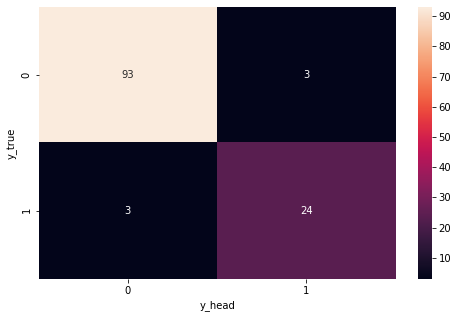

y_predict        0
0   -1.0
1    1.0
2   -1.0
3   -1.0
4   -1.0
..   ...
118  1.0
119  1.0
120 -1.0
121 -1.0
122 -1.0

[123 rows x 1 columns]
correct      kelas
92    True
32    True
223   True
131   True
222   True
..     ...
245  False
66    True
96    True
190   True
256   True

[123 rows x 1 columns]


In [279]:

if __name__ == "__main__":
    import pylab as pl           
    def fsvm():
        
        clf = FSVM(C=5)
        clf.fit(X_train, y_train)
        y_predict = clf.predict(X_test)
        correct =(y_predict == y_test)
        f, ax = plt.subplots(figsize=(8,5))
        sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt=".0f", ax=ax)
        plt.xlabel("y_head")
        plt.ylabel("y_true")
        plt.show()
        y_predict=pd.DataFrame(y_predict)
        correct=pd.DataFrame(correct)
        print('y_predict',y_predict)
        print('correct',correct)
        correct.to_excel('correct_Chebyshev.xlsx')
        y_predict.to_excel('y_predict_Chebyshevn.xlsx')
        
        

    fsvm()    

In [280]:
TP=49

FP=3

FN=3

TN=24

Sensitifitas=(TP)/(TP+FN)
Speficity=(TN)/(TN+FP)
G_means=math.sqrt(Sensitifitas*Speficity)
AUC_Akurasi=0.5*(Sensitifitas+Speficity)
Sensitifitas
Speficity
AUC_Akurasi
G_means



0.9152086306448588

In [56]:
TI=(61*(-0.21306529))+(65*1.05891265)+0-0.05865657-0.0877945-0.03913088
print(TI+65.9232492005825)
TIA=1-(TI+65.9232492005825)
TIA

121.5700068105825


-120.5700068105825

In [57]:
-120.57000646024485+117.70157380912931+120.87831175163629+123.91654945875263-115.80992783985073-120.7830717534429+121.93722439913861

127.27065336511836

# Menghitung Jarak Minkowsky


In [58]:
Mean_KP=np.array([[53.679012,62.82716,7.45679]])
Mean_KN=np.array([[52.017778,62.862222,2.791111]])
kelas_negatif=np.array(kelas_negatif)
kelas_positif=np.array(kelas_positif)


#Menghitung jarak Minkowki dari sample positif ke cluster kelas positif
for m0 in (Mean_KP):
    jarak_Minkowki_SP_KP=list()
    for m1 in (kelas_positif):
        jarak_Minkowki_SP_KP1 =round((sum((abs(m0-m1))**4))**(1/4),6)
        #print('jarak_Minkowki_SP->KP1',jarak_Minkowki_SP_KP1)
        jarak_Minkowki_SP_KP.append(jarak_Minkowki_SP_KP1)
    print('jarak_Minkowki_SP->KP',jarak_Minkowki_SP_KP)
    
#Menghitung jarak Minkowki dari sample positif ke cluster kelas negatif
for m3 in (Mean_KN):
    jarak_Minkowki_SP_KN=list()
    for m4 in (kelas_positif):
        jarak_Minkowki_SP_KN1 =round((sum((abs(m3-m4))**4))**(1/4),6)
        #print('jarak_Minkowki_SP->KN1',jarak_Minkowki_SP_KN1)
        jarak_Minkowki_SP_KN.append(jarak_Minkowki_SP_KN1)
    print('jarak_Minkowki_SP->KN',jarak_Minkowki_SP_KN)
#Menghitung jarak Minkowki dari sample negatif ke cluster kelas positif 
for b0 in (Mean_KP):
    jarak_Minkowki_SN_KP=list()
    for b1 in (kelas_negatif):
        jarak_Minkowki_SN_KP1=round((sum((abs(b0-b1))**4))**(1/4),6)
        #print('jarak_Minkowki_SN->KP',jarak_Minkowki_SN_KP)
        jarak_Minkowki_SN_KP.append(jarak_Minkowki_SN_KP1)
    print('jarak_Minkowki_SN->KP',jarak_Minkowki_SN_KP)

#Menghitung jarak Minkowki dari sample negatif ke cluster kelas negatif 
for b3 in (Mean_KN):
    jarak_Minkowki_SN_KN=list()
    for b4 in (kelas_negatif):
        jarak_Minkowki_SN_KN1=round((sum((abs(b3-b4))**4))**(1/4),6)
        #print('jarak_Minkowki_SN->KN',jarak_Minkowki_SN_KN)
        jarak_Minkowki_SN_KN.append(jarak_Minkowki_SN_KN1)
    print('jarak_Minkowki_SN->KN',jarak_Minkowki_SN_KN)

jarak_Minkowki_SP->KP [19.786588, 19.682522, 17.580529, 14.925138, 17.038148, 13.04253, 13.07635, 12.150328, 12.166509, 44.581486, 10.89822, 11.264198, 11.264198, 9.680775, 9.826851, 12.762575, 8.68924, 9.703855, 9.372085, 8.369474, 8.541832, 7.699304, 12.964789, 15.674034, 8.443323, 8.452372, 6.459241, 6.459241, 6.054102, 7.730366, 4.782257, 5.794496, 7.565971, 5.898141, 5.069704, 6.562218, 5.770927, 4.480368, 3.984591, 5.117697, 6.477588, 4.968278, 2.890123, 16.543222, 4.602048, 3.857865, 15.544694, 2.768332, 5.172938, 1.657618, 7.931078, 2.747469, 4.786512, 3.606696, 6.649558, 6.568579, 27.552802, 10.026196, 8.284489, 7.344385, 8.796231, 8.54308, 8.783726, 9.581661, 12.257062, 9.833442, 11.90112, 11.472605, 15.726015, 11.857008, 12.780462, 12.446736, 13.321197, 13.501123, 15.342028, 16.526102, 16.360279, 18.445405, 20.333395, 24.351522, 29.335156]
jarak_Minkowki_SP->KN [18.02987, 18.085061, 19.678754, 13.035604, 20.64309, 11.029417, 11.083328, 10.35576, 10.087471, 49.223929, 9.09282

# Nilai Keanggotaan Berdasarkan Jarak Minkowsky

In [59]:
from random import sample
dida_1=list(jarak_Minkowki_SP_KP)
dida_2=list(jarak_Minkowki_SP_KN)
dida_3=list(jarak_Minkowki_SN_KP)
dida_4=list(jarak_Minkowki_SN_KN)
dida_5=nilai_mf_fix_KP
dida_6=nilai_mf_fix_KN

MF_Minkowki1=[]
for i in range(len(dida_1)):
    if (dida_1[i]>=dida_2[i]):
        mf_Minkowki=dida_5[i]
    elif (dida_1[i]<dida_2[i]):
        mf_Minkowki=[1,1,1]
    MF_Minkowki1.append(mf_Minkowki)
print(MF_Minkowki1)

print('=========================================================================================================================')
MF_Minkowki2=[]
for k in range(len(dida_3)):
    if (dida_3[k]>dida_4[k]):
        mf2_Minkowki=[1,1,1]
    elif (dida_3[k]<=dida_4[k]):
        mf2_Minkowki=dida_6[k]
    MF_Minkowki2.append(mf2_Minkowki)
print(MF_Minkowki2)

[(0.150079, 0.514862, 0.716328), (0.150079, 0.633646, 0.985813), [1, 1, 1], (0.3481, 0.633646, 0.716328), [1, 1, 1], (0.455073, 0.939559, 0.716328), (0.455073, 0.45421, 0.716328), (0.51273, 0.177818, 0.778694), (0.51273, 0.514862, 0.716328), [1, 1, 1], (0.572062, 0.514862, 0.836393), (0.572062, 0.939559, 0.716328), (0.572062, 0.939559, 0.716328), (0.632037, 0.939559, 0.987347), (0.632037, 0.34781, 0.985813), [1, 1, 1], (0.691495, 0.807363, 0.987347), (0.691495, 0.633646, 0.716328), (0.691495, 0.45421, 0.778694), (0.749171, 0.34781, 0.836393), (0.749171, 0.177818, 0.887651), (0.749171, 0.969466, 0.964434), [1, 1, 1], [1, 1, 1], (0.803747, 0.969466, 0.716328), (0.803747, 0.807363, 0.716328), [1, 1, 1], [1, 1, 1], (0.853894, 0.45421, 0.998749), (0.898328, 0.998647, 0.716328), [1, 1, 1], [1, 1, 1], (0.935862, 0.939559, 0.716328), [1, 1, 1], (0.965461, 0.514862, 0.887651), (0.986289, 0.177818, 0.887651), (0.986289, 0.514862, 0.836393), (0.986289, 0.969466, 0.887651), (0.986289, 0.633646, 0.

In [349]:
MF_Minkowki1=pd.DataFrame(MF_Minkowki1)
MF_Minkowki2=pd.DataFrame(MF_Minkowki2)
MF_Minkowki3=[MF_Minkowki1,MF_Minkowki2]
pd.concat(MF_Minkowki3)
MF_Minkowki=pd.concat(MF_Minkowki3,ignore_index=True)
Variabel = data.iloc[:,0:3]
kelas= data.iloc[:,3] 
data_Minkowki1=pd.merge(Variabel, MF_Minkowki,left_index=True, right_index=True)
data_Minkowki=pd.merge(data_Minkowki1,kelas,left_index=True, right_index=True)
print(data_Minkowki)
data_Minkowki.to_excel('data_Minkowki.xlsx',index=False)
MF_Minkowki.to_excel('MF_Minkowki.xlsx',index=False)


     usia  jenis  sel         0         1         2  kelas
0      34     59    0  0.150079  0.514862  0.716328      1
1      34     66    9  0.150079  0.633646  0.985813      1
2      38     69   21  1.000000  1.000000  1.000000      1
3      39     66    0  0.348100  0.633646  0.716328      1
4      41     60   23  1.000000  1.000000  1.000000      1
..    ...    ...  ...       ...       ...       ...    ...
301    73     68    0  0.161489  0.279064  0.892672     -1
302    74     63    0  0.135165  0.999083  0.892672     -1
303    75     62    1  0.112199  0.964693  0.954321     -1
304    76     67    0  0.092367  0.436997  0.892672     -1
305    77     65    3  0.075413  0.801741  0.999364     -1

[306 rows x 7 columns]


In [353]:
train= data_Minkowki
train

,usia,jenis,sel,0,1,2,kelas
0,34,59,0,0.150079,0.514862,0.716328,1
1,34,66,9,0.150079,0.633646,0.985813,1
2,38,69,21,1.000000,1.000000,1.000000,1
3,39,66,0,0.348100,0.633646,0.716328,1
4,41,60,23,1.000000,1.000000,1.000000,1
...,...,...,...,...,...,...,...
301,73,68,0,0.161489,0.279064,0.892672,-1
302,74,63,0,0.135165,0.999083,0.892672,-1
303,75,62,1,0.112199,0.964693,0.954321,-1
304,76,67,0,0.092367,0.436997,0.892672,-1


In [354]:
features = train.columns[0:6]
X = train[features]
y1= train.columns[6]
y = train[y1]
X.head()

,usia,jenis,sel,0,1,2
0,34,59,0,0.150079,0.514862,0.716328
1,34,66,9,0.150079,0.633646,0.985813
2,38,69,21,1.000000,1.000000,1.000000
3,39,66,0,0.348100,0.633646,0.716328
4,41,60,23,1.000000,1.000000,1.000000


In [352]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=1000)




In [355]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3,random_state=1000)

print(X_train,y_train)

     usia  jenis  sel         0         1         2
275    65     67    0  0.497577  0.436997  0.892672
252    61     59    0  0.715954  0.486148  0.892672
16     45     65    6  0.691495  0.807363  0.987347
143    44     61    0  1.000000  1.000000  1.000000
281    66     68    0  0.445001  0.279064  0.892672
..    ...    ...  ...       ...       ...       ...
257    62     62    6  0.661873  0.964693  0.860649
251    61     59    0  0.715954  0.486148  0.892672
192    52     60    5  1.000000  1.000000  1.000000
71     66     61   13  1.000000  1.000000  1.000000
87     33     60    0  1.000000  1.000000  1.000000

[214 rows x 6 columns] 275   -1
252   -1
16     1
143   -1
281   -1
      ..
257   -1
251   -1
192   -1
71     1
87    -1
Name: kelas, Length: 214, dtype: int64


In [356]:
print(X_train,y_train)

     usia  jenis  sel         0         1         2
275    65     67    0  0.497577  0.436997  0.892672
252    61     59    0  0.715954  0.486148  0.892672
16     45     65    6  0.691495  0.807363  0.987347
143    44     61    0  1.000000  1.000000  1.000000
281    66     68    0  0.445001  0.279064  0.892672
..    ...    ...  ...       ...       ...       ...
257    62     62    6  0.661873  0.964693  0.860649
251    61     59    0  0.715954  0.486148  0.892672
192    52     60    5  1.000000  1.000000  1.000000
71     66     61   13  1.000000  1.000000  1.000000
87     33     60    0  1.000000  1.000000  1.000000

[214 rows x 6 columns] 275   -1
252   -1
16     1
143   -1
281   -1
      ..
257   -1
251   -1
192   -1
71     1
87    -1
Name: kelas, Length: 214, dtype: int64


In [357]:
print(X_train.shape,X_test.shape )

(214, 6) (92, 6)


In [358]:
X_train=np.asarray(X_train)
y_train=np.asarray(y_train)

In [67]:
Kernel=[]
for x0 in X_train:
  m=[]
  for x1 in X_train:
    m0=(np.matmul(x0,x1))
    m1=round((1+m0)**(2),6)
    print('m0')
    print(m0)
    print('m1')
    print(m1)
    m.append(m1)
  print('m')
  print('m',m)
  Kernel.append(m)
print('Kernel',Kernel)

m0
9174.753574580955
m1
84194453.661435
m0
8293.31584325288
m1
68795675.307636
m0
7828.018854
m1
61293536.216287
m0
6755.018854
m1
45643790.755603
m0
6463.018854
m1
41783539.744867
m0
8506.858668207462
m1
72383659.118193
m0
7642.018854
m1
58415737.202599
m0
8124.018854
m1
66015931.377855
m0
7288.018854
m1
53129795.853967
m0
6956.018854
m1
48400111.334911
m0
7215.018854
m1
52070928.101283
m0
6653.018854
m1
44275966.909387
m0
6434.018854
m1
41409467.651335
m0
9309.782499336789
m1
86690670.749956
m0
6266.018854
m1
39275525.316391
m0
8900.298784458659
m1
79233120.050205
m0
8112.381465567653
m1
65826958.805817
m0
7316.7719032917985
m1
53549785.628607
m0
6996.018854
m1
48958272.843231
m0
9035.137937153426
m1
81651788.819263
m0
7671.018854
m1
58859873.296131
m0
9193.018854
m1
84529982.687707
m0
6798.335690099781
m1
46230965.826665
m0
7467.018854
m1
55771305.603699
m0
6204.018854
m1
38502258.978495
m0
8404.433903322957
m1
70651319.103131
m0
8485.018854
m1
72012515.990443
m0
8029.018854
m1
6448

m1
55171809.31346
m0
7327.130239000001
m1
53701492.799746
m0
8016.822881403492
m1
64285483.757557
m0
6261.130239
m1
39214275.130198
m0
7439.130239000001
m1
55355537.973282
m0
6826.130239000001
m1
46609707.300268
m0
7263.130239000001
m1
52767588.129154
m0
7964.742565877108
m1
63453054.625826
m0
7505.130239000001
m1
56341991.16483
m0
7674.7258176572395
m1
58916766.82785
m0
8170.514255852397
m1
66773645.233599
m0
7768.130239
m1
60359384.670544
m0
7503.057434411577
m1
56310877.978948
m0
7384.130239000001
m1
54540148.646992
m0
7029.772310336166
m1
49431759.27979
m0
7897.130239000001
m1
62380461.272206
m0
8432.383908522621
m1
71121964.148528
m0
6136.130239000001
m1
37664367.570448
m0
7743.745080350134
m1
59981076.359608
m0
7746.130239
m1
60018026.940028
m0
8280.425764049753
m1
68582012.685467
m0
7186.130239000001
m1
51654841.072348
m0
8338.130239
m1
69541093.143004
m0
6790.130239000001
m1
46119449.92306
m0
7633.130239
m1
58279944.506014
m0
7417.901111309339
m1
55040093.699387
m0
6630.1302390

m0
7946.0
m1
63154809.0
m0
6072.923317
m1
36892544.460796
m0
6529.0
m1
42640900.0
m0
5671.0
m1
32171584.0
m0
7216.974645
m1
52099157.975863
m0
7400.0
m1
54774801.0
m0
6971.0
m1
48608784.0
m0
6139.0
m1
37699600.0
m0
8308.422035999998
m1
69046494.572362
m0
6633.0
m1
44009956.0
m0
6386.0
m1
40793769.0
m0
6516.0
m1
42471289.0
m0
7242.452554
m1
52467604.902049
m0
5957.0
m1
35497764.0
m0
6451.0
m1
41628304.0
m0
6736.843406
m1
45398533.763778
m0
6516.0
m1
42471289.0
m0
6490.0
m1
42133081.0
m0
6698.0
m1
44876601.0
m0
7932.031213
m1
62932984.226432
m0
7230.5289569999995
m1
52295011.05593
m0
7153.0
m1
51179716.0
m0
6360.0
m1
40462321.0
m0
7192.0
m1
51739249.0
m0
7009.094774
m1
49141428.740462
m0
6893.0
m1
47527236.0
m0
7399.191084
m1
54762828.079713
m0
5866.0
m1
34421689.0
m0
6542.0
m1
42810849.0
m0
6399.0
m1
40960000.0
m0
6854.0
m1
46991025.0
m0
7516.175778
m1
56507931.67735
m0
6958.0
m1
48427681.0
m0
7243.345131
m1
52480536.377043
m0
7711.089111
m1
59476318.456005
m0
7062.0
m1
49885969.0
m0
69

m0
5680.698074000001
m1
32281693.004095
m0
6482.918100999999
m1
42041193.940475
m0
6571.195982
m1
43193760.025817
m0
5854.0
m1
34281025.0
m0
5209.0
m1
27144100.0
m0
5981.9243989999995
m1
35795384.36415
m0
6315.0
m1
39891856.0
m0
6073.873381
m1
36904086.595182
m0
6578.175778
m1
43285553.917822
m0
5658.0
m1
32024281.0
m0
5474.0
m1
29975625.0
m0
5415.0
m1
29333056.0
m0
5100.0
m1
26020201.0
m0
6569.329575
m1
43169230.72412
m0
6389.0517580000005
m1
40832761.469919
m0
7015.43379
m1
49230343.129454
m0
6701.153809
m1
44918865.679493
m0
5457.933374
m1
29799953.581771
m0
6089.0
m1
37088100.0
m0
6136.0
m1
37662769.0
m0
5356.743920000001
m1
28705419.912297
m0
6151.763284000001
m1
37856496.028938
m0
6463.402855
m1
41788504.271732
m0
5703.0
m1
32535616.0
m0
6413.547952
m1
41146425.428507
m0
6486.0
m1
42081169.0
m0
5720.367974
m1
32734051.493913
m0
6115.698796000001
m1
37414004.160988
m0
6376.619421
m1
40674029.479116
m0
6375.0
m1
40653376.0
m0
5366.0
m1
28804689.0
m0
7042.627708
m1
49612691.288905
m

6511.997299000001
m1
42419133.816781
m0
5512.0
m1
30393169.0
m0
6184.0
m1
38254225.0
m0
5512.0
m1
30393169.0
m0
5967.0
m1
35617024.0
m0
5903.306853
m1
34860839.414383
m0
5386.0
m1
29019769.0
m0
5799.0
m1
33640000.0
m0
5078.0
m1
25796241.0
m0
6177.0
m1
38167684.0
m0
6770.49484
m1
45853142.368147
m0
5239.0
m1
27457600.0
m0
5267.0
m1
27751824.0
m0
5855.0
m1
34292736.0
m0
5799.0
m1
33640000.0
m0
6219.0
m1
38688400.0
m0
6100.0
m1
37222201.0
m0
4812.0
m1
23164969.0
m0
6037.0
m1
36457444.0
m0
5708.0
m1
32592681.0
m0
6365.120736
m1
40527493.225329
m0
5624.0
m1
31640625.0
m0
5785.0
m1
33477796.0
m0
6336.358136000001
m1
40162108.143925
m0
5953.0
m1
35450116.0
m0
5533.0
m1
30625156.0
m0
5799.0
m1
33640000.0
m0
5524.698074000001
m1
30533339.205007
m0
6238.918100999999
m1
38936577.907187
m0
6323.195982
m1
39995454.818745
m0
5666.0
m1
32114889.0
m0
5085.0
m1
25867396.0
m0
5797.9243989999995
m1
33627524.185318
m0
6107.0
m1
37307664.0
m0
5825.873381
m1
33952453.398206
m0
6330.175778
m1
40083786.731934

52540731.751244
m0
8570.498586
m1
73470588.0098
m0
6427.6081594391635
m1
41327002.867608
m0
6995.498586000001
m1
48950992.4639
m0
5924.498586000001
m1
35111533.492688
m0
7813.672213889011
m1
61069101.810529
m0
7940.498586000001
m1
63067399.79144
m0
7499.498586000001
m1
56257479.038588
m0
6428.498586000001
m1
41338452.067376
m0
9010.289510732313
m1
81203338.646234
m0
7121.498586000001
m1
50729986.107572
m0
6680.498586000001
m1
44642423.35472
m0
6932.498586000001
m1
48073402.642064
m0
7813.213181225525
m1
61061927.641639
m0
6302.498586000001
m1
39734094.423704
m0
6869.498586000001
m1
47203750.820228
m0
7184.3594689333095
m1
51629390.69779
m0
6932.498586000001
m1
48073402.642064
m0
6932.498586000001
m1
48073402.642064
m0
7121.498586000001
m1
50729986.107572
m0
8632.883789843601
m1
74543949.296524
m0
7751.123902460437
m1
60095424.999098
m0
7751.498586000001
m1
60101234.325932
m0
6617.498586000001
m1
43804523.532884
m0
7625.498586000001
m1
58163480.68226
m0
7561.717028583642
m1
57194688.854

7649.616737
m1
58531936.456465
m0
6643.0
m1
44142736.0
m0
7753.0
m1
60124516.0
m0
5897.923317
m1
34797296.299846
m0
6356.0
m1
40411449.0
m0
5492.0
m1
30173049.0
m0
7041.974645
m1
49603491.850113
m0
7205.0
m1
51926436.0
m0
6791.0
m1
46131264.0
m0
5948.0
m1
35390601.0
m0
8107.422036
m1
65746507.91389
m0
6460.0
m1
41744521.0
m0
6185.0
m1
38266596.0
m0
6333.0
m1
40119556.0
m0
7087.452554
m1
50246159.610309
m0
5783.0
m1
33454656.0
m0
6272.0
m1
39350529.0
m0
6553.843406
m1
42965972.077182
m0
6334.0
m1
40132225.0
m0
6314.0
m1
39879225.0
m0
6510.0
m1
42393121.0
m0
7747.031213
m1
60031987.677622
m0
7045.5289569999995
m1
49653570.34184
m0
6979.0
m1
48720400.0
m0
6153.0
m1
37871716.0
m0
6985.0
m1
48804196.0
m0
6832.094774
m1
46691184.190466
m0
6696.0
m1
44849809.0
m0
7212.191084000001
m1
52030125.614297
m0
5691.0
m1
32398864.0
m0
6376.0
m1
40666129.0
m0
6209.0
m1
38564100.0
m0
6665.0
m1
44435556.0
m0
7318.175778
m1
53570334.069262
m0
6775.0
m1
45914176.0
m0
7060.345131
m1
49862595.059097
m0
7516.

m1
52012944.0
m0
6517.0
m1
42484324.0
m0
6219.0
m1
38688400.0
m0
6455.0
m1
41679936.0
m0
5967.0
m1
35617024.0
m0
5781.0
m1
33431524.0
m0
8244.02692
m1
67980468.911525
m0
5649.0
m1
31922500.0
m0
7917.827246
m1
62707824.951992
m0
7206.094774
m1
51942215.081418
m0
6562.486205
m1
43079351.163225
m0
6269.0
m1
39312900.0
m0
8037.616737
m1
64619359.044377
m0
6869.0
m1
47196900.0
m0
8167.0
m1
66716224.0
m0
6089.923317
m1
37099346.853574
m0
6653.0
m1
44275716.0
m0
5591.0
m1
31270464.0
m0
7453.974645
m1
55576646.957593
m0
7555.0
m1
57093136.0
m0
7141.0
m1
51008164.0
m0
6071.0
m1
36869184.0
m0
8599.422035999998
m1
73967259.197314
m0
6777.0
m1
45941284.0
m0
6307.0
m1
39790864.0
m0
6579.0
m1
43296400.0
m0
7445.452554
m1
55449655.638973
m0
5971.0
m1
35664784.0
m0
6521.0
m1
42536484.0
m0
6822.843406
m1
46564838.82961
m0
6579.0
m1
43296400.0
m0
6587.0
m1
43401744.0
m0
6757.0
m1
45670564.0
m0
8248.031212999998
m1
68046515.953048
m0
7372.5289569999995
m1
54368929.279718
m0
7397.0
m1
54730404.0
m0
6237.0

6381.0
m1
40729924.0
m0
7466.0
m1
55756089.0
m0
5680.923317
m1
32284252.580268
m0
6093.0
m1
37136836.0
m0
5303.0
m1
28132416.0
m0
6736.974645
m1
45400302.316663
m0
6896.0
m1
47568609.0
m0
6495.0
m1
42198016.0
m0
5739.0
m1
32947600.0
m0
7736.422036
m1
59867699.763178
m0
6189.0
m1
38316100.0
m0
5962.0
m1
35557369.0
m0
6076.0
m1
36929929.0
m0
6970.452554
m1
48601150.712673
m0
5557.0
m1
30891364.0
m0
6023.0
m1
36288576.0
m0
6304.843406
m1
39763661.060994
m0
6084.0
m1
37027225.0
m0
6058.0
m1
36711481.0
m0
6254.0
m1
39125025.0
m0
7392.031213
m1
54656910.516392
m0
6794.5289569999995
m1
46179213.805426
m0
6661.0
m1
44382244.0
m0
5940.0
m1
35295481.0
m0
6708.0
m1
45010681.0
m0
6529.094774
m1
42642137.757422
m0
6437.0
m1
41447844.0
m0
6959.191084000001
m1
48444259.925793
m0
5490.0
m1
30151081.0
m0
6286.0
m1
39526369.0
m0
5987.0
m1
35856144.0
m0
6390.0
m1
40844881.0
m0
7004.175778
m1
49072487.680678
m0
6534.0
m1
42706225.0
m0
6747.345131
m1
45540162.007091
m0
7183.089111
m1
51611136.354789
m0
668

m1
35402500.0
m0
6728.120736
m1
45281065.879665
m0
5856.0
m1
34304449.0
m0
5915.0
m1
34999056.0
m0
6781.358136000001
m1
46000381.884965
m0
6247.0
m1
39037504.0
m0
5659.0
m1
32035600.0
m0
6083.0
m1
37015056.0
m0
5623.698074
m1
31637228.423659
m0
6508.918100999999
m1
42379033.681727
m0
6654.195982
m1
44291633.558829
m0
5821.0
m1
33895684.0
m0
5098.0
m1
25999801.0
m0
5960.924399
m1
35544542.539392
m0
6339.0
m1
40195600.0
m0
6217.873381
m1
38674386.12891
m0
6682.175778
m1
44664838.479646
m0
5613.0
m1
31516996.0
m0
5438.0
m1
29582721.0
m0
5359.0
m1
28729600.0
m0
5069.0
m1
25704900.0
m0
6704.329575
m1
44961444.70937
m0
6405.0517580000005
m1
41037499.126175
m0
7165.43379
m1
51357773.266454
m0
6876.153809
m1
47295244.512643
m0
5487.933374000001
m1
30128389.584211
m0
6178.0
m1
38180041.0
m0
6121.0
m1
37478884.0
m0
5355.743920000001
m1
28694705.424457
m0
6309.763284000001
m1
39825733.226682
m0
6677.402855
m1
44601064.693672
m0
5715.0
m1
32672656.0
m0
6520.547952
m1
42530587.690235
m0
6557.0
m1
4

55855111.117785
m0
6210.0
m1
38576521.0
m0
7018.0
m1
49266361.0
m0
5402.0
m1
29192409.0
m0
5059.0
m1
25603600.0
m0
6506.0
m1
42341049.0
m0
5552.0
m1
30835809.0
m0
7157.7235120000005
m1
51247322.321262
m0
6205.0
m1
38514436.0
m0
6154.0
m1
37884025.0
m0
5355.0
m1
28686736.0
m0
7230.0
m1
52287361.0
m0
6779.0
m1
45968400.0
m0
7056.0
m1
49801249.0
m0
6163.0
m1
37994896.0
m0
6295.0
m1
39639616.0
m0
6585.665672
m1
43384164.674703
m0
6055.0
m1
36675136.0
m0
5688.0
m1
32364721.0
m0
6831.0
m1
46676224.0
m0
6126.0
m1
37540129.0
m0
6403.0
m1
41011216.0
m0
6464.0
m1
41796225.0
m0
6266.0
m1
39275289.0
m0
5797.0
m1
33616804.0
m0
6303.707503999999
m1
39749336.710994
m0
5425.0
m1
29441476.0
m0
5449.0
m1
29702500.0
m0
6904.8684920000005
m1
47691019.628798
m0
6015.625611
m1
36199783.742941
m0
5562.0
m1
30946969.0
m0
6787.34597
m1
46081641.008415
m0
7446.0
m1
55457809.0
m0
5715.4618789999995
m1
32677936.41406
m0
6107.0
m1
37307664.0
m0
5974.558943000001
m1
35707304.681267
m0
6215.0
m1
38638656.0
m0
6139.2

5606.0
m1
31438449.0
m0
5839.0
m1
34105600.0
m0
5793.0
m1
33570436.0
m0
5958.8146400000005
m1
35519390.543158
m0
6080.0
m1
36978561.0
m0
6184.022621
m1
38254504.822282
m0
5829.0
m1
33988900.0
m0
6374.253533
m1
40643857.610029
m0
6134.0
m1
37638225.0
m0
5629.0
m1
31696900.0
m0
5920.534546
m1
35064571.379471
m0
6348.132998
m1
40311489.826292
m0
5481.873383
m1
30061900.53401
m0
5656.400258
m1
32006177.679218
m0
6088.709085
m1
37084556.739932
m0
5632.0
m1
31730689.0
m0
4816.579526
m1
23209072.489334
m0
5460.0
m1
29822521.0
m0
5459.11096
m1
29812811.695512
m0
5541.227949
m1
30716290.638677
m0
5728.613303
m1
32828468.601915
m0
5888.0
m1
34680321.0
m0
5388.0
m1
29041321.0
m0
6052.0
m1
36638809.0
m0
5534.0
m1
30636225.0
m0
6129.718158
m1
37585705.132831
m0
7006.333225
m1
49102718.926189
m0
5455.0
m1
29767936.0
m0
5352.0
m1
28654609.0
m0
4876.381269
m1
23788848.043192
m0
5988.0
m1
35868121.0
m0
5729.0
m1
32832900.0
m0
6724.816791
m1
45236611.506098
m0
5758.2819
m1
33169328.003668
m0
5794.469242

32787076.0
m0
5271.0
m1
27793984.0
m0
5730.707503999999
m1
32852470.91141
m0
5024.0
m1
25250625.0
m0
4987.0
m1
24880144.0
m0
6163.8684920000005
m1
38005603.523654
m0
5512.625611
m1
30400067.378275
m0
5163.0
m1
26666896.0
m0
6117.34597
m1
37434157.408615
m0
6656.0
m1
44315649.0
m0
5220.4618789999995
m1
27263664.15385
m0
5527.0
m1
30558784.0
m0
5462.558943000001
m1
29850476.323635
m0
5618.0
m1
31573161.0
m0
5549.242466
m1
30805191.43139
m0
5206.0
m1
27112849.0
m0
5502.0
m1
30283009.0
m0
5561.0
m1
30935844.0
m0
4987.0
m1
24880144.0
m0
5809.0046729999995
m1
33756154.300282
m0
5468.0
m1
29909961.0
m0
5671.0
m1
32171584.0
m0
5637.0
m1
31787044.0
m0
5826.8146400000005
m1
33963423.478198
m0
5973.0
m1
35688676.0
m0
6013.022621
m1
36168468.0859
m0
5679.0
m1
32262400.0
m0
6203.253533
m1
38492761.901743
m0
5984.0
m1
35820225.0
m0
5489.0
m1
30140100.0
m0
5752.534546
m1
33103159.772015
m0
6147.132998
m1
37799539.361096
m0
5380.873383
m1
28964561.110644
m0
5503.400258
m1
30298422.20027
m0
5893.709085

m0
8337.02692
m1
69522692.918645
m0
7501.02692
m1
56280407.908405
m0
8821.49954894104
m1
77836498.291065
m0
7534.02692
m1
56776630.685125
m0
7383.02692
m1
54523853.555285
m0
8831.879709858513
m1
78019763.96883
m0
8019.02692
m1
64320831.797525
m0
7131.02692
m1
50865807.987605
m0
7904.02692
m1
62489450.605925
m0
7045.319561831535
m1
49650619.36745
m0
8343.984170467173
m1
69638760.805348
m0
8662.424978317715
m1
75054932.354939
m0
7342.02692
m1
53920044.347845
m0
6254.02692
m1
39125361.769925
m0
7552.242377741473
m1
57051470.41691
m0
8134.02692
m1
66178662.989125
m0
8243.204868991017
m1
67966913.921895
m0
8747.506988692969
m1
76536374.53121
m0
7057.02692
m1
49815744.003445
m0
6816.02692
m1
46471856.028005
m0
6709.02692
m1
45024461.267125
m0
6394.02692
m1
40896369.307525
m0
8843.802582932847
m1
78230532.731056
m0
8196.10334788705
m1
67192503.295941
m0
9465.111091926805
m1
89607259.2047
m0
9150.830450669382
m1
83756000.597799
m0
7059.195377368542
m1
49846358.766616
m0
8063.026919999999
m1
65

m1
37664926.53007
m0
5776.0
m1
33373729.0
m0
5865.345131
m1
34414005.196007
m0
6245.089111
m1
39013629.182553
m0
5840.0
m1
34117281.0
m0
5836.550749
m1
34076998.74715
m0
5676.0
m1
32228329.0
m0
5558.041469
m1
30902942.054062
m0
6150.0
m1
37834801.0
m0
6461.518929
m1
41764150.907683
m0
4988.0
m1
24890121.0
m0
5926.464196
m1
35134831.794862
m0
5812.0
m1
33790969.0
m0
6312.997299000001
m1
39866561.891779
m0
5532.0
m1
30614089.0
m0
6215.0
m1
38638656.0
m0
5352.0
m1
28654609.0
m0
5785.0
m1
33477796.0
m0
5791.306853
m1
33550818.679311
m0
5220.0
m1
27258841.0
m0
5630.0
m1
31708161.0
m0
4921.0
m1
24226084.0
m0
6057.0
m1
36699364.0
m0
6583.49484
m1
43355572.297987
m0
5107.0
m1
26091664.0
m0
5104.0
m1
26061025.0
m0
5675.0
m1
32216976.0
m0
5621.0
m1
31606884.0
m0
6028.0
m1
36348841.0
m0
5923.0
m1
35093776.0
m0
4763.0
m1
22695696.0
m0
5852.0
m1
34257609.0
m0
5732.0
m1
32867289.0
m0
6170.120736
m1
38082731.138289
m0
5461.0
m1
29833444.0
m0
5686.0
m1
32341969.0
m0
6362.358136000001
m1
40492326.76699

59873970.48894
m0
6757.827246
m1
45681745.741272
m0
6497.827246
m1
42234755.573352
m0
8317.535404721822
m1
69198031.27961
m0
7535.827246
m1
56803764.936048
m0
7917.827246
m1
62707824.951992
m0
7208.827246
m1
51981608.917164
m0
6877.827246
m1
47318264.280312
m0
7143.827246
m1
51048556.375184
m0
6619.827246
m1
43835353.421376
m0
6424.827246
m1
41291255.795436
m0
9032.30071456854
m1
81600521.799824
m0
6298.827246
m1
39687823.329444
m0
8715.235412548522
m1
75972759.766965
m0
7919.365550760597
m1
62732190.457675
m0
7281.57826423771
m1
53035946.174748
m0
6948.827246
m1
48300098.749244
m0
8847.140235692968
m1
78289585.630489
m0
7608.827246
m1
57909470.713964
m0
8975.827245999999
m1
80583427.404528
m0
6749.256262655284
m1
45565959.611517
m0
7332.827246
m1
53785022.074172
m0
6231.827246
m1
38848135.47848
m0
8179.344594626725
m1
66918037.686839
m0
8321.827245999999
m1
69269453.36676
m0
7856.827246
m1
61745449.02798
m0
6759.827246
m1
45708785.050256
m0
9430.033789372352
m1
88944398.336283
m0
7462

6769.094774
m1
45834183.248942
m0
8234.401208531122
m1
67821833.065476
m0
7376.731261538784
m1
54430918.567487
m0
7389.094774
m1
54613500.768702
m0
6269.094774
m1
39314088.474942
m0
7245.094774
m1
52505889.47379
m0
7203.545793307604
m1
51905480.087866
m0
6946.094774
m1
48262125.798938
m0
7557.503470419192
m1
57130974.712339
m0
5862.094774
m1
34375880.328906
m0
6586.094774
m1
43389817.561658
m0
6401.094774
m1
40986817.495278
m0
6952.094774
m1
48345526.936226
m0
7677.57274510191
m1
58960479.401822
m0
7074.094774
m1
50056966.061082
m0
7443.642426742303
m1
55422700.862052
m0
7923.4692136951435
m1
62797212.318802
m0
7265.094774
m1
52796133.26475
m0
7067.845094885322
m1
49968570.975484
m0
6769.094774
m1
45834183.248942
m0
6640.442570295255
m1
44108759.41453
m0
7550.094774
m1
57019032.28593
m0
8161.181103922178
m1
66621200.373224
m0
5667.094774
m1
32127298.367046
m0
7502.7003099539215
m1
56305518.341603
m0
7143.094774
m1
51038090.139894
m0
8045.403480526496
m1
64744608.971429
m0
6403.094774
m

43685307.894085
m0
6801.983726382493
m1
46280587.581425
m0
7241.801604733677
m1
52458175.085533
m0
6705.486205
m1
44976957.217855
m0
6656.112632658011
m1
44317148.603895
m0
6425.486205
m1
41299724.943055
m0
6316.697011972339
m1
39913295.535084
m0
7052.486205
m1
49751667.644125
m0
7481.34676519295
m1
55985513.114593
m0
5577.486205
m1
31119508.339375
m0
6867.0798550580885
m1
47170520.895455
m0
6639.486205
m1
44096057.038795
m0
7331.738117194736
m1
53769048.295361
m0
6191.486205
m1
38346885.399115
m0
7089.486205
m1
50274994.623295
m0
6083.486205
m1
37020972.378835
m0
6742.486205
m1
45474606.197025
m0
6558.943287608663
m1
43032855.936642
m0
5947.486205
m1
35384488.131075
m0
6388.486205
m1
40825533.963885
m0
5567.486205
m1
31008038.615275
m0
6894.486205
m1
47547730.003345
m0
7628.359174637192
m1
58207121.415621
m0
5760.486205
m1
33194723.290405
m0
5762.486205
m1
33217773.235225
m0
6502.486205
m1
42295332.818625
m0
6462.486205
m1
41776653.922225
m0
6922.486205
m1
47934661.230825
m0
6823.4862

m0
5796.0
m1
33605209.0
m0
6500.0
m1
42263001.0
m0
6285.094774
m1
39514987.50771
m0
6229.0
m1
38812900.0
m0
6651.191084000001
m1
44251646.218049
m0
5318.0
m1
28291761.0
m0
5914.0
m1
34987225.0
m0
5799.0
m1
33640000.0
m0
6178.0
m1
38180041.0
m0
6756.175778
m1
45659424.49479
m0
6266.0
m1
39275289.0
m0
6495.345131
m1
42202500.061067
m0
6915.089111
m1
47832288.591293
m0
6330.0
m1
40081561.0
m0
6316.550749
m1
39911447.46619
m0
6046.0
m1
36566209.0
m0
6008.041469
m1
36108579.376162
m0
6720.0
m1
45171841.0
m0
7141.518929
m1
51015576.651123
m0
5288.0
m1
27973521.0
m0
6556.464196
m1
43000336.681822
m0
6242.0
m1
38975049.0
m0
7002.997299000001
m1
49055978.164399
m0
5782.0
m1
33443089.0
m0
6645.0
m1
44169316.0
m0
5782.0
m1
33443089.0
m0
6445.0
m1
41550916.0
m0
6201.306853
m1
38468610.298771
m0
5660.0
m1
32046921.0
m0
6070.0
m1
36857041.0
m0
5291.0
m1
28005264.0
m0
6527.0
m1
42614784.0
m0
7273.49484
m1
52918275.177187
m0
5457.0
m1
29789764.0
m0
5474.0
m1
29975625.0
m0
6195.0
m1
38390416.0
m0
6161.

60631400.208929
m0
7781.616737
m1
60569123.275033
m0
8319.616737
m1
69232662.884045
m0
8247.616737
m1
68039678.073917
m0
6123.616737
m1
37510930.175141
m0
8179.616737
m1
66922490.197685
m0
7457.616737
m1
55630963.629457
m0
8647.240267467327
m1
74792059.723843
m0
7451.616737
m1
55541496.228613
m0
7399.616737
m1
54769128.087965
m0
8644.473401174168
m1
74744210.33041
m0
7919.616737
m1
62736169.494445
m0
7127.616737
m1
50817176.583037
m0
7781.616737
m1
60569123.275033
m0
7062.97117858386
m1
49899688.811863
m0
8257.17251857042
m1
68197413.346472
m0
8517.348306362112
m1
72562257.868502
m0
7327.616737
m1
53708623.277837
m0
6333.616737
m1
40127369.204681
m0
7527.129587956304
m1
56672735.093063
m0
8057.616737
m1
64941303.713857
m0
8037.180373095961
m1
64612343.710425
m0
8581.26476121237
m1
73655268.431548
m0
7061.616737
m1
49880555.173753
m0
6787.616737
m1
46085317.201877
m0
6727.616737
m1
45274283.193437
m0
6387.616737
m1
40814423.812277
m0
8643.280417633025
m1
74723583.938674
m0
8125.28090338

m1
43086640.406752
m0
7350.0
m1
54037201.0
m0
7821.518929
m1
61191802.394563
m0
5763.0
m1
33223696.0
m0
7181.464196
m1
51587791.926822
m0
6837.0
m1
46758244.0
m0
7672.997299000001
m1
58890234.545059
m0
6317.0
m1
39917124.0
m0
7280.0
m1
53012961.0
m0
6317.0
m1
39917124.0
m0
7065.0
m1
49928356.0
m0
6776.306853
m1
45931888.179721
m0
6185.0
m1
38266596.0
m0
6630.0
m1
43970161.0
m0
5776.0
m1
33373729.0
m0
7137.0
m1
50951044.0
m0
7968.49484
m1
63512848.004787
m0
5957.0
m1
35497764.0
m0
5974.0
m1
35700625.0
m0
6775.0
m1
45914176.0
m0
6741.0
m1
45454564.0
m0
7218.0
m1
52113961.0
m0
7118.0
m1
50680161.0
m0
5448.0
m1
29691601.0
m0
7052.0
m1
49744809.0
m0
6547.0
m1
42876304.0
m0
7445.120736
m1
55444714.015089
m0
6496.0
m1
42211009.0
m0
6566.0
m1
43125489.0
m0
7427.358136000001
m1
55180504.596677
m0
6890.0
m1
47485881.0
m0
6302.0
m1
39727809.0
m0
6741.0
m1
45454564.0
m0
6268.698074000001
m1
39309113.939119
m0
7201.918100999999
m1
51882029.169713
m0
7364.195982
m1
54246111.853269
m0
6466.0
m1
41822

54952569.0
m0
8818.0
m1
77774761.0
m0
7268.0
m1
52838361.0
m0
8443.0
m1
71301136.0
m0
7859.306853
m1
61784423.823319
m0
7126.0
m1
50794129.0
m0
7605.0
m1
57851236.0
m0
6576.0
m1
43256929.0
m0
8341.0
m1
69588964.0
m0
9472.494840000001
m1
89747104.483507
m0
6803.0
m1
46294416.0
m0
6777.0
m1
45941284.0
m0
7879.0
m1
62094400.0
m0
7883.0
m1
62157456.0
m0
8425.0
m1
70997476.0
m0
8370.0
m1
70073641.0
m0
6246.0
m1
39025009.0
m0
8295.0
m1
68823616.0
m0
7692.0
m1
59182249.0
m0
8771.120735999999
m1
76950102.206961
m0
7546.0
m1
56957209.0
m0
7519.0
m1
56550400.0
m0
8948.358136
m1
80091011.046389
m0
8111.0
m1
65804544.0
m0
7187.0
m1
51667344.0
m0
7883.0
m1
62157456.0
m0
7114.698074000001
m1
50633159.080327
m0
8406.918101
m1
70693086.793123
m0
8647.195982000001
m1
74791293.743081
m0
7424.0
m1
55130625.0
m0
6369.0
m1
40576900.0
m0
7603.9243989999995
m1
57834875.114506
m0
8147.0
m1
66389904.0
m0
8165.873381
m1
66697820.821286
m0
8702.175777999999
m1
75745268.622766
m0
7118.0
m1
50680161.0
m0
7036.0
m1

m0
5120.923317
m1
26234098.465228
m0
6900.338337243872
m1
47628470.845112
m0
5082.923317
m1
25846276.293136
m0
6749.256262655284
m1
45565959.611517
m0
6105.40649382082
m1
37288200.267777
m0
5783.637068660967
m1
33462026.016127
m0
5492.923317
m1
30183193.413076
m0
6851.144872223326
m1
46951889.349936
m0
6002.923317
m1
36047095.196416
m0
6937.923317
m1
48148656.799206
m0
5335.291891061337
m1
28476011.146607
m0
5704.923317
m1
32557560.899484
m0
5005.923317
m1
25069281.102318
m0
6281.36374257691
m1
39468094.194045
m0
6459.923317
m1
41743530.108154
m0
6078.923317
m1
36965467.5406
m0
5413.923317
m1
29321394.52899
m0
7222.024457412264
m1
52172082.312376
m0
5790.923317
m1
33546375.710008
m0
5631.923317
m1
31729825.095202
m0
5707.923317
m1
32591805.439386
m0
6364.782606136192
m1
40523188.188586
m0
5229.923317
m1
27362558.748334
m0
5650.923317
m1
31944237.181248
m0
5901.805784744453
m1
34843116.132413
m0
5709.923317
m1
32614645.132654
m0
5677.923317
m1
32250170.040366
m0
5870.923317
m1
34479483.

5704.923317
m1
32557560.899484
m0
6177.0
m1
38167684.0
m0
5286.0
m1
27952369.0
m0
6870.974645
m1
47224035.521523
m0
7006.0
m1
49098049.0
m0
6610.0
m1
43705321.0
m0
5730.0
m1
32844361.0
m0
7915.422036
m1
62669737.852066
m0
6283.0
m1
39488656.0
m0
5956.0
m1
35485849.0
m0
6138.0
m1
37687321.0
m0
6906.452554
m1
47712900.785761
m0
5593.0
m1
31292836.0
m0
6081.0
m1
36990724.0
m0
6357.843406
m1
40434889.46203
m0
6139.0
m1
37699600.0
m0
6129.0
m1
37576900.0
m0
6308.0
m1
39803481.0
m0
7574.031213
m1
57381097.877924
m0
6848.5289569999995
m1
46916046.932782
m0
6812.0
m1
46416969.0
m0
5913.0
m1
34975396.0
m0
6761.0
m1
45724644.0
m0
6657.094774
m1
44330226.019566
m0
6482.0
m1
42029289.0
m0
7013.191084000001
m1
49198876.562865
m0
5494.0
m1
30195025.0
m0
6171.0
m1
38093584.0
m0
5996.0
m1
35964009.0
m0
6466.0
m1
41822089.0
m0
7116.175778
m1
50654191.05495
m0
6578.0
m1
43283241.0
m0
6879.345131
m1
47339149.121675
m0
7323.089111
m1
53642281.305869
m0
6724.0
m1
45225625.0
m0
6590.550749
m1
43448541.27664

27867841.0
m0
5484.0
m1
30085225.0
m0
6273.031213
m1
39363467.661698
m0
5855.5289569999995
m1
34298931.42418
m0
5693.0
m1
32421636.0
m0
5367.0
m1
28815424.0
m0
5911.0
m1
34951744.0
m0
5616.094774
m1
31551753.700098
m0
5664.0
m1
32092225.0
m0
5984.191084000001
m1
35822512.311993
m0
4871.0
m1
23736384.0
m0
5404.0
m1
29214025.0
m0
5307.0
m1
28174864.0
m0
5585.0
m1
31203396.0
m0
6070.175778
m1
36859175.327374
m0
5659.0
m1
32035600.0
m0
5804.345131
m1
33702032.090025
m0
6180.089111
m1
38205862.598123
m0
5664.0
m1
32092225.0
m0
5734.550749
m1
32896542.394354
m0
5496.0
m1
30217009.0
m0
5492.041469
m1
30173504.580154
m0
6081.0
m1
36990724.0
m0
6393.518929
m1
40889872.333339
m0
4923.0
m1
24245776.0
m0
5864.464196
m1
34403670.234558
m0
5600.0
m1
31371201.0
m0
6247.997299000001
m1
39049967.242909
m0
5298.0
m1
28079401.0
m0
5955.0
m1
35473936.0
m0
5280.0
m1
27888961.0
m0
5727.0
m1
32809984.0
m0
5661.306853
m1
32061718.897531
m0
5159.0
m1
26625600.0
m0
5554.0
m1
30858025.0
m0
4861.0
m1
23639044.0
m

71135611.362119
m0
5786.974645
m1
33500650.491163
m0
7754.655495259291
m1
60150192.161146
m0
7416.974645
m1
55026347.833863
m0
8321.42504042913
m1
69262758.553562
m0
6616.974645
m1
43797588.401863
m0
7928.974645
m1
62884497.870343
m0
6580.974645
m1
43322390.227423
m0
7713.974645
m1
59520833.772993
m0
7088.635371656998
m1
50262929.70305
m0
6460.974645
m1
41757116.312623
m0
6881.974645
m1
47375339.963713
m0
5946.974645
m1
35378402.377563
m0
7537.974645
m1
56836138.697953
m0
8632.229472025783
m1
74532651.116655
m0
6135.974645
m1
37662457.793373
m0
6123.974645
m1
37515314.401893
m0
7157.974645
m1
51250917.967753
m0
7169.974645
m1
51422877.359233
m0
7659.974645
m1
58690532.511333
m0
7614.974645
m1
58003069.793283
m0
5588.974645
m1
31247816.531743
m0
7553.974645
m1
57077641.886593
m0
6866.974645
m1
47169075.724363
m0
7990.488522867211
m1
63863888.811118
m0
6846.974645
m1
46894756.738563
m0
6753.974645
m1
45629682.454593
m0
8039.6688928899
m1
64652356.245087
m0
7305.974645
m1
53391878.462673


7801.974645
m1
60886413.310513
m0
7949.0
m1
63202500.0
m0
7502.0
m1
56295009.0
m0
6481.0
m1
42016324.0
m0
8992.422035999998
m1
80881639.91761
m0
7128.0
m1
50822641.0
m0
6737.0
m1
45400644.0
m0
6957.0
m1
48413764.0
m0
7809.452554
m1
61003169.098285
m0
6335.0
m1
40144896.0
m0
6892.0
m1
47513449.0
m0
7204.843406
m1
51924179.191794
m0
6957.0
m1
48413764.0
m0
6949.0
m1
48302500.0
m0
7148.0
m1
51108201.0
m0
8607.031212999998
m1
74098201.363982
m0
7761.5289569999995
m1
60256855.808264
m0
7738.0
m1
59892121.0
m0
6684.0
m1
44689225.0
m0
7660.0
m1
58690921.0
m0
7558.094774
m1
57139913.802314
m0
7343.0
m1
53934336.0
m0
7948.191084
m1
63189638.889945
m0
6217.0
m1
38663524.0
m0
6965.0
m1
48525156.0
m0
6786.0
m1
46063369.0
m0
7331.0
m1
53758224.0
m0
8074.175778
m1
65208463.845598
m0
7453.0
m1
55562116.0
m0
7810.345131
m1
61017112.755597
m0
8314.089111000001
m1
69140706.923871
m0
7620.0
m1
58079641.0
m0
7464.550749000001
m1
55734447.985894
m0
7148.0
m1
51108201.0
m0
7037.041469000001
m1
49534027.7193

m0
6733.0
m1
45346756.0
m0
6617.041469000001
m1
43798472.885404
m0
7506.0
m1
56355049.0
m0
8093.518929
m1
65521236.691939
m0
5673.0
m1
32194276.0
m0
7439.464196
m1
55360507.451958
m0
7083.0
m1
50183056.0
m0
7972.997299000001
m1
63584632.924459
m0
6379.0
m1
40704400.0
m0
7558.0
m1
57138481.0
m0
6379.0
m1
40704400.0
m0
7377.0
m1
54434884.0
m0
6854.306853
m1
46995232.048789
m0
6259.0
m1
39187600.0
m0
6678.0
m1
44609041.0
m0
5786.0
m1
33489369.0
m0
7269.0
m1
52852900.0
m0
8270.494840000001
m1
68417626.888147
m0
5965.0
m1
35593156.0
m0
5966.0
m1
35605089.0
m0
6911.0
m1
47775744.0
m0
6909.0
m1
47748100.0
m0
7386.0
m1
54567769.0
m0
7324.0
m1
53655625.0
m0
5430.0
m1
29495761.0
m0
7264.0
m1
52780225.0
m0
6617.0
m1
43797924.0
m0
7679.120736
m1
58984254.519537
m0
6614.0
m1
43758225.0
m0
6562.0
m1
43072969.0
m0
7677.358136000001
m1
58957183.664677
m0
7030.0
m1
49434961.0
m0
6322.0
m1
39980329.0
m0
6909.0
m1
47748100.0
m0
6262.698074000001
m1
39233913.562231
m0
7327.918100999999
m1
53713040.531165


m1
28132416.0
m0
6364.464196
m1
40519134.430558
m0
6076.0
m1
36929929.0
m0
6783.997299000001
m1
46036188.347437
m0
5726.0
m1
32798529.0
m0
6463.0
m1
41783296.0
m0
5708.0
m1
32592681.0
m0
6223.0
m1
38738176.0
m0
6121.306853
m1
37482641.202291
m0
5579.0
m1
31136400.0
m0
6002.0
m1
36036009.0
m0
5249.0
m1
27562500.0
m0
6414.0
m1
41152225.0
m0
7053.49484
m1
49765897.447587
m0
5418.0
m1
29365561.0
m0
5441.0
m1
29615364.0
m0
6075.0
m1
36917776.0
m0
6023.0
m1
36288576.0
m0
6457.0
m1
41705764.0
m0
6342.0
m1
40233649.0
m0
4979.0
m1
24800400.0
m0
6277.0
m1
39413284.0
m0
5931.0
m1
35188624.0
m0
6620.120736
m1
43839239.800689
m0
5834.0
m1
34047225.0
m0
5985.0
m1
35832196.0
m0
6615.358136000001
m1
43776194.983813
m0
6189.0
m1
38316100.0
m0
5721.0
m1
32741284.0
m0
6023.0
m1
36288576.0
m0
5707.698074000001
m1
32589233.700091
m0
6476.918100999999
m1
41963422.923263
m0
6572.195982
m1
43206905.417781
m0
5865.0
m1
34409956.0
m0
5240.0
m1
27468081.0
m0
6000.9243989999995
m1
36023096.491312
m0
6331.0
m1
400

m1
44055371.283978
m0
8943.274482405483
m1
80000046.01661
m0
8514.422035999998
m1
72512412.451194
m0
9600.175198382525
m1
92182565.190036
m0
7566.422036
m1
57265876.270938
m0
9095.422035999998
m1
82744893.857026
m0
7566.422036
m1
57265876.270938
m0
8903.422035999998
m1
79288731.795202
m0
8138.168915301796
m1
66246070.631815
m0
7432.422036
m1
55255763.16529
m0
7910.422036
m1
62590598.631706
m0
6833.422036
m1
46709324.566162
m0
8661.422035999998
m1
75037555.529778
m0
9953.027285943199
m1
99082659.209302
m0
7043.422036
m1
49623881.821282
m0
7034.422036
m1
49497163.224634
m0
8241.422035999998
m1
67937521.019538
m0
8259.422035999998
m1
68234572.212834
m0
8822.422035999998
m1
77852776.42537
m0
8773.422035999998
m1
76990482.065842
m0
6395.422036
m1
40914214.862626
m0
8706.422035999998
m1
75819198.513018
m0
7852.422036
m1
61676237.67553
m0
9211.124391415864
m1
84863235.802919
m0
7879.422036
m1
62101051.465474
m0
7740.422036
m1
59929615.139466
m0
9219.405447557536
m1
85015876.617349
m0
8384.422

7121.498586000001
m1
50729986.107572
m0
6460.0
m1
41744521.0
m0
6777.0
m1
45941284.0
m0
6189.0
m1
38316100.0
m0
5900.0
m1
34821801.0
m0
6126.0
m1
37540129.0
m0
5680.0
m1
32273761.0
m0
5517.0
m1
30448324.0
m0
7726.02692
m1
59706945.022405
m0
5421.0
m1
29398084.0
m0
7462.827246
m1
55708717.158132
m0
6779.094774
m1
45969685.144422
m0
6253.486205
m1
39118597.688535
m0
5961.0
m1
35545444.0
m0
7575.616737
m1
57405121.179389
m0
6526.0
m1
42601729.0
m0
7692.0
m1
59182249.0
m0
5790.923317
m1
33546375.710008
m0
6283.0
m1
39488656.0
m0
5354.0
m1
28676025.0
m0
7000.974645
m1
49027648.929223
m0
7128.0
m1
50822641.0
m0
6728.0
m1
45279441.0
m0
5806.0
m1
33721249.0
m0
8067.422036
m1
65099434.15101
m0
6393.0
m1
40883236.0
m0
6034.0
m1
36421225.0
m0
6236.0
m1
38900169.0
m0
7032.452554
m1
49469454.829369
m0
5677.0
m1
32239684.0
m0
6179.0
m1
38192400.0
m0
6461.843406
m1
41768344.890478
m0
6237.0
m1
38912644.0
m0
6231.0
m1
38837824.0
m0
6408.0
m1
41075281.0
m0
7724.031213
m1
59676107.241824
m0
6966.5289569

m0
7109.02692
m1
50552482.803125
m0
5416.0
m1
29343889.0
m0
7025.827246
m1
49376301.145128
m0
6334.094774
m1
40133425.795562
m0
6112.486205
m1
37374713.578725
m0
5806.0
m1
33721249.0
m0
7131.616737
m1
50874221.516933
m0
6336.0
m1
40157569.0
m0
7183.0
m1
51609856.0
m0
5631.923317
m1
31729825.095202
m0
5956.0
m1
35485849.0
m0
5349.0
m1
28622500.0
m0
6489.974645
m1
42132751.842033
m0
6737.0
m1
45400644.0
m0
6324.0
m1
40005625.0
m0
5773.0
m1
33339076.0
m0
7454.422036
m1
55583317.734874
m0
6034.0
m1
36421225.0
m0
6013.0
m1
36168196.0
m0
6001.0
m1
36024004.0
m0
6545.452554
m1
42856041.041773
m0
5527.0
m1
30558784.0
m0
5934.0
m1
35224225.0
m0
6184.843406
m1
38264658.643554
m0
6001.0
m1
36024004.0
m0
5945.0
m1
35354916.0
m0
6174.0
m1
38130625.0
m0
7081.031213
m1
50155166.101906
m0
6591.5289569999995
m1
43461438.048884
m0
6424.0
m1
41280625.0
m0
6030.0
m1
36372961.0
m0
6654.0
m1
44289025.0
m0
6334.094774
m1
40133425.795562
m0
6375.0
m1
40653376.0
m0
6736.191084
m1
45389743.702329
m0
5477.0
m1
3

m0
5769.0
m1
33292900.0
m0
7812.422036
m1
61049563.91265
m0
6236.0
m1
38900169.0
m0
6001.0
m1
36024004.0
m0
6125.0
m1
37527876.0
m0
6809.452554
m1
46382263.990285
m0
5599.0
m1
31360000.0
m0
6064.0
m1
36784225.0
m0
6332.843406
m1
40117572.29173
m0
6125.0
m1
37527876.0
m0
6101.0
m1
37234404.0
m0
6296.0
m1
39652209.0
m0
7459.031213
m1
55652065.698934
m0
6797.5289569999995
m1
46219995.979168
m0
6726.0
m1
45252529.0
m0
5976.0
m1
35724529.0
m0
6760.0
m1
45711121.0
m0
6590.094774
m1
43442530.31985
m0
6479.0
m1
41990400.0
m0
6956.191084000001
m1
48402507.779289
m0
5513.0
m1
30404196.0
m0
6149.0
m1
37822500.0
m0
6014.0
m1
36180225.0
m0
6443.0
m1
41525136.0
m0
7066.175778
m1
49944973.47715
m0
6541.0
m1
42797764.0
m0
6810.345131
m1
46394422.493597
m0
7250.089111
m1
52578293.295663
m0
6640.0
m1
44102881.0
m0
6576.550749
m1
43264173.85567
m0
6296.0
m1
39652209.0
m0
6233.041469000001
m1
38863273.037212
m0
7005.0
m1
49084036.0
m0
7481.518929
m1
55988089.522843
m0
5438.0
m1
29582721.0
m0
6871.464196
m

6413.452554
m1
41145201.567517
m0
6049.452554
m1
36607976.108205
m0
7813.213181225525
m1
61061927.641639
m0
7087.452554
m1
50246159.610309
m0
7445.452554
m1
55449655.638973
m0
6970.452554
m1
48601150.712673
m0
6521.452554
m1
42542387.319181
m0
6683.452554
m1
44681905.946677
m0
6183.452554
m1
38247453.392677
m0
6050.452554
m1
36620078.013313
m0
8505.926959675078
m1
72367806.297247
m0
6144.452554
m1
37766587.093465
m0
8182.671566851443
m1
66972480.314093
m0
7442.845648246558
m1
55410838.034919
m0
6969.102443159274
m1
48582328.068135
m0
6494.452554
m1
42190903.881265
m0
8306.506109537862
m1
69014657.760009
m0
7114.452554
m1
50629665.048225
m0
8659.452554
m1
75003438.440085
m0
6364.782606136192
m1
40523188.188586
m0
6906.452554
m1
47712900.785761
m0
5831.452554
m1
34017502.794661
m0
7750.713139646831
m1
60089056.599373
m0
7809.452554
m1
61003169.098285
m0
7378.452554
m1
54456319.996737
m0
6327.452554
m1
40049311.728229
m0
8875.425672861933
m1
78790932.725842
m0
7032.452554
m1
49469454.8293

5986.094774
m1
35845303.832858
m0
5931.0
m1
35188624.0
m0
6334.191084000001
m1
40134646.070793
m0
5063.0
m1
25644096.0
m0
5631.0
m1
31719424.0
m0
5521.0
m1
30492484.0
m0
5883.0
m1
34621456.0
m0
6434.175778
m1
41411487.293758
m0
5967.0
m1
35617024.0
m0
6186.345131
m1
38283239.770109
m0
6586.089111
m1
43389742.956255
m0
6029.0
m1
36360900.0
m0
6014.550749
m1
36186850.813794
m0
5757.0
m1
33154564.0
m0
5720.041469
m1
32730315.490018
m0
6399.0
m1
40960000.0
m0
6801.518929
m1
46274263.779403
m0
5033.0
m1
25341156.0
m0
6244.464196
m1
39005823.023518
m0
5945.0
m1
35354916.0
m0
6669.997299000001
m1
44502204.963265
m0
5505.0
m1
30316036.0
m0
6329.0
m1
40068900.0
m0
5505.0
m1
30316036.0
m0
6139.0
m1
37699600.0
m0
5904.306853
m1
34872649.028089
m0
5389.0
m1
29052100.0
m0
5779.0
m1
33408400.0
m0
5037.0
m1
25381444.0
m0
6215.0
m1
38638656.0
m0
6927.49484
m1
48004040.747907
m0
5195.0
m1
26998416.0
m0
5211.0
m1
27164944.0
m0
5899.0
m1
34810000.0
m0
5867.0
m1
34433424.0
m0
6283.0
m1
39488656.0
m0
6193.

m0
6936.0
m1
48121969.0
m0
7413.518929
m1
54975090.948499
m0
5373.0
m1
28879876.0
m0
6809.464196
m1
46382422.564998
m0
6500.0
m1
42263001.0
m0
7282.997299000001
m1
53056616.651839
m0
5958.0
m1
35509681.0
m0
6930.0
m1
48038761.0
m0
5940.0
m1
35295481.0
m0
6717.0
m1
45131524.0
m0
6381.306853
m1
40733840.765851
m0
5819.0
m1
33872400.0
m0
6229.0
m1
38812900.0
m0
5416.0
m1
29343889.0
m0
6736.0
m1
45387169.0
m0
7562.49484
m1
57206454.194707
m0
5588.0
m1
31236921.0
m0
5596.0
m1
31326409.0
m0
6391.0
m1
40857664.0
m0
6369.0
m1
40576900.0
m0
6816.0
m1
46471489.0
m0
6735.0
m1
45373696.0
m0
5110.0
m1
26122321.0
m0
6674.0
m1
44555625.0
m0
6177.0
m1
38167684.0
m0
7049.120736
m1
49704202.392177
m0
6125.0
m1
37527876.0
m0
6160.0
m1
37957921.0
m0
7059.358136000001
m1
49848657.008581
m0
6512.0
m1
42419169.0
m0
5912.0
m1
34963569.0
m0
6369.0
m1
40576900.0
m0
5872.698074
m1
34500329.064511
m0
6794.918100999999
m1
46184502.835499
m0
6964.195982
m1
48513955.067669
m0
6074.0
m1
36905625.0
m0
5314.0
m1
282492

m1
51924179.191794
m0
6790.843406
m1
46129136.851626
m0
5949.843406
m1
35412537.242734
m0
8107.307135483136
m1
65744644.603327
m0
6461.843406
m1
41768344.890478
m0
6184.843406
m1
38264658.643554
m0
6332.843406
m1
40117572.29173
m0
7143.418402661652
m1
51042714.31229
m0
5782.843406
m1
33452844.54513
m0
6273.843406
m1
39373659.769822
m0
6559.700554614477
m1
43042791.767319
m0
6335.843406
m1
40155584.352166
m0
6315.843406
m1
39902510.615926
m0
6511.843406
m1
42417129.231078
m0
7748.89300169342
m1
60060841.537697
m0
7059.402286378433
m1
49849280.445498
m0
6978.843406
m1
48718213.972282
m0
6152.843406
m1
37869788.66557
m0
6984.843406
m1
48802008.093154
m0
6831.969822705146
m1
46689476.597999
m0
6697.843406
m1
44874502.97811
m0
7228.081132614251
m1
52259614.021919
m0
5694.843406
m1
32442632.105674
m0
6421.843406
m1
41252917.417998
m0
6212.843406
m1
38611849.87429
m0
6664.843406
m1
44433468.313314
m0
7318.047443524348
m1
53568455.48056
m0
6786.843406
m1
46074818.104378
m0
7060.210699528279
m1

m0
5428.0
m1
29474041.0
m0
7374.0
m1
54390625.0
m0
6911.0
m1
47775744.0
m0
7198.0
m1
51825601.0
m0
6259.0
m1
39187600.0
m0
6407.0
m1
41062464.0
m0
6700.665672
m1
44912322.779263
m0
6155.0
m1
37896336.0
m0
5763.0
m1
33223696.0
m0
6975.0
m1
48664576.0
m0
6237.0
m1
38912644.0
m0
6517.0
m1
42484324.0
m0
6592.0
m1
43467649.0
m0
6356.0
m1
40411449.0
m0
5904.0
m1
34869025.0
m0
6412.707503999999
m1
41135643.946866
m0
5491.0
m1
30162064.0
m0
5525.0
m1
30536676.0
m0
7042.8684920000005
m1
49616083.33259
m0
6097.625611
m1
37193234.343145
m0
5700.0
m1
32501401.0
m0
6907.34597
m1
47725244.041215
m0
7597.0
m1
57729604.0
m0
5819.4618789999995
m1
33877776.484892
m0
6215.0
m1
38638656.0
m0
6068.558943000001
m1
36839545.762551
m0
6322.0
m1
39980329.0
m0
6254.242466
m1
39128058.30845
m0
5786.0
m1
33489369.0
m0
6174.0
m1
38130625.0
m0
6262.0
m1
39225169.0
m0
5525.0
m1
30536676.0
m0
6510.0046729999995
m1
42393181.851828
m0
6100.0
m1
37222201.0
m0
6407.0
m1
41062464.0
m0
6333.0
m1
40119556.0
m0
6467.81464000

40960000.0
m0
6686.665672
m1
44724872.140447
m0
6123.0
m1
37503376.0
m0
5697.0
m1
32467204.0
m0
6999.0
m1
49000000.0
m0
6231.0
m1
38837824.0
m0
6509.0
m1
42380100.0
m0
6582.0
m1
43335889.0
m0
6310.0
m1
39828721.0
m0
5884.0
m1
34633225.0
m0
6386.707503999999
m1
40802807.156658
m0
5423.0
m1
29419776.0
m0
5481.0
m1
30052324.0
m0
7060.8684920000005
m1
49869986.598302
m0
6045.625611
m1
36561681.279601
m0
5670.0
m1
32160241.0
m0
6897.34597
m1
47587177.121815
m0
7615.0
m1
58003456.0
m0
5791.4618789999995
m1
33552614.619668
m0
6199.0
m1
38440000.0
m0
6028.558943000001
m1
36355581.047111
m0
6306.0
m1
39778249.0
m0
6244.242466
m1
39003053.45913
m0
5748.0
m1
33051001.0
m0
6152.0
m1
37859409.0
m0
6248.0
m1
39050001.0
m0
5481.0
m1
30052324.0
m0
6492.0046729999995
m1
42159109.6836
m0
6066.0
m1
36808489.0
m0
6399.0
m1
40960000.0
m0
6313.0
m1
39866596.0
m0
6421.8146400000005
m1
41252547.899798
m0
6705.0
m1
44970436.0
m0
6823.022621
m1
46567284.73192
m0
6329.0
m1
40068900.0
m0
6967.253533
m1
48556557.3

42224004.0
m0
6426.242466
m1
41309445.716754
m0
5950.0
m1
35414401.0
m0
6346.0
m1
40284409.0
m0
6435.0
m1
41422096.0
m0
5683.0
m1
32307856.0
m0
6690.0046729999995
m1
44769543.534108
m0
6272.0
m1
39350529.0
m0
6583.0
m1
43349056.0
m0
6509.0
m1
42380100.0
m0
6651.8146400000005
m1
44259942.634198
m0
6894.0
m1
47541025.0
m0
7004.022621
m1
49070341.920722
m0
6535.0
m1
42719296.0
m0
7176.253533
m1
51512968.276961
m0
6907.0
m1
47720464.0
m0
6311.0
m1
39841344.0
m0
6685.534546
m1
44709744.234851
m0
7195.132998
m1
51784330.124904
m0
6134.873383
m1
37648942.172208
m0
6372.400258
m1
40620230.848674
m0
6905.709085
m1
47702630.384822
m0
6271.0
m1
39337984.0
m0
5384.579526
m1
29004466.83087
m0
6085.0
m1
37039396.0
m0
6084.11096
m1
37028575.395512
m0
6184.227949
m1
38257044.781091
m0
6421.613303
m1
41249961.639873
m0
6602.0
m1
43599609.0
m0
6033.0
m1
36409156.0
m0
6803.0
m1
46294416.0
m0
6220.0
m1
38700841.0
m0
6956.718158
m1
48409841.966163
m0
7935.333225
m1
62985385.058239
m0
6072.0
m1
36881329.0
m

m0
8657.453399837175
m1
74968815.277152
m0
7323.031213
m1
53641433.208998
m0
6221.031213
m1
38713672.415546
m0
7531.258882291809
m1
56734923.869864
m0
8118.031213
m1
65918667.837668
m0
8247.233735981787
m1
68033359.763388
m0
8743.525456250909
m1
76466725.45502
m0
7032.031213
m1
49463528.043032
m0
6820.031213
m1
46526466.80872
m0
6683.031213
m1
44676273.256358
m0
6373.031213
m1
40628273.904298
m0
8844.813884494453
m1
78248423.279115
m0
8182.129304409355
m1
66963605.212683
m0
9467.15050891981
m1
89645874.059558
m0
9157.845106208977
m1
83884443.679528
m0
7049.217773513512
m1
49705570.653966
m0
8064.031213
m1
65044728.466664
m0
7747.031213
m1
60031987.677622
m0
6809.237818413924
m1
46379339.143355
m0
8397.221383208484
m1
70530122.40138
m0
8997.180943435113
m1
80967260.290799
m0
7296.031213
m1
53246664.523496
m0
8544.838386175476
m1
73031353.72263
m0
8506.031212999998
m1
72369580.058956
m0
7487.452111516076
m1
56076915.02647
m0
8135.858170540877
m1
66208460.887498
m0
8235.740222554705
m1
67

m1
49849280.445498
m0
6804.5289569999995
m1
46315224.384566
m0
6794.5289569999995
m1
46179213.805426
m0
6991.5289569999995
m1
48895461.214484
m0
8401.735020943486
m1
70605955.83219
m0
7628.1467963185405
m1
58203880.839777
m0
7549.5289569999995
m1
57010487.530496
m0
6542.5289569999995
m1
42817771.211098
m0
7486.5289569999995
m1
56063089.881914
m0
7376.731261538784
m1
54430918.567487
m0
7183.5289569999995
m1
51617456.333972
m0
7816.858319122205
m1
61118908.697868
m0
6093.5289569999995
m1
37143283.207712
m0
6968.5289569999995
m1
48574333.882462
m0
6649.5289569999995
m1
44229535.407896
m0
7161.5289569999995
m1
51301821.059864
m0
7883.8139569125615
m1
62170291.135123
m0
7321.5289569999995
m1
53619430.326104
m0
7622.979758189108
m1
58125067.353277
m0
8114.765184841071
m1
65865644.535478
m0
7527.5289569999995
m1
56678748.256388
m0
7322.12018356893
m1
53628089.222995
m0
7075.5289569999995
m1
50077262.07926
m0
6880.713604525287
m1
47357982.134708
m0
7781.5289569999995
m1
60567756.966544
m0
8365

m0
6814.0
m1
46444225.0
m0
5888.0
m1
34680321.0
m0
7457.0
m1
55621764.0
m0
8560.494840000001
m1
73299193.895347
m0
6069.0
m1
36844900.0
m0
6062.0
m1
36759969.0
m0
7095.0
m1
50353216.0
m0
7109.0
m1
50552100.0
m0
7594.0
m1
57684025.0
m0
7550.0
m1
57017601.0
m0
5512.0
m1
30393169.0
m0
7492.0
m1
56145049.0
m0
6763.0
m1
45751696.0
m0
7925.120736
m1
62823389.921649
m0
6784.0
m1
46036225.0
m0
6670.0
m1
44502241.0
m0
7931.358136000001
m1
62922305.597765
m0
7218.0
m1
52113961.0
m0
6438.0
m1
41460721.0
m0
7109.0
m1
50552100.0
m0
6364.698074000001
m1
40522111.969327
m0
7513.918100999999
m1
56473994.064737
m0
7788.195982
m1
60671574.046005
m0
6626.0
m1
43917129.0
m0
5665.0
m1
32103556.0
m0
6812.924399
m1
46429565.715288
m0
7327.0
m1
53699584.0
m0
7395.873381
m1
54713735.814546
m0
7860.175778
m1
61798084.612614
m0
6373.0
m1
40627876.0
m0
6148.0
m1
37810201.0
m0
6062.0
m1
36759969.0
m0
5772.0
m1
33327529.0
m0
7939.329575
m1
63048833.75962
m0
7384.0517580000005
m1
54538989.468339
m0
8495.433790000001

m1
54190534.392106
m0
5985.0
m1
35832196.0
m0
6030.0
m1
36372961.0
m0
5976.0
m1
35724529.0
m0
6478.452554
m1
41983305.399537
m0
5517.0
m1
30448324.0
m0
5907.0
m1
34904464.0
m0
6152.843406
m1
37869788.66557
m0
5976.0
m1
35724529.0
m0
5910.0
m1
34939921.0
m0
6150.0
m1
37834801.0
m0
6980.031213
m1
48734796.79688
m0
6542.5289569999995
m1
42817771.211098
m0
6345.0
m1
40271716.0
m0
6060.0
m1
36735721.0
m0
6636.0
m1
44049769.0
m0
6269.094774
m1
39314088.474942
m0
6357.0
m1
40424164.0
m0
6683.191084
m1
44678410.447425
m0
5478.0
m1
30019441.0
m0
6042.0
m1
36517849.0
m0
5967.0
m1
35617024.0
m0
6258.0
m1
39175081.0
m0
6788.175778
m1
46092907.744582
m0
6330.0
m1
40081561.0
m0
6479.345131
m1
41994873.016875
m0
6899.089111
m1
47611229.739741
m0
6306.0
m1
39778249.0
m0
6428.550749000001
m1
41339122.833966
m0
6150.0
m1
37834801.0
m0
6176.041469000001
m1
38155841.309746
m0
6816.0
m1
46471489.0
m0
7141.518929
m1
51015576.651123
m0
5568.0
m1
31013761.0
m0
6548.464196
m1
42895481.254686
m0
6234.0
m1
38875

62473216.0
m0
6915.0
m1
47831056.0
m0
7055.0
m1
49787136.0
m0
7382.665671999999
m1
54518518.755871
m0
6794.0
m1
46172025.0
m0
6394.0
m1
40896025.0
m0
7645.0
m1
58461316.0
m0
6865.0
m1
47141956.0
m0
7176.0
m1
51509329.0
m0
7245.0
m1
52504516.0
m0
7035.0
m1
49505296.0
m0
6501.0
m1
42276004.0
m0
7070.707503999999
m1
50009047.02213
m0
6100.0
m1
37222201.0
m0
6119.0
m1
37454400.0
m0
7729.8684920000005
m1
59766327.640598
m0
6756.625611
m1
45665503.898443
m0
6241.0
m1
38962564.0
m0
7607.34597
m1
57886928.399215
m0
8336.0
m1
69505569.0
m0
6412.4618789999995
m1
41132493.273386
m0
6847.0
m1
46895104.0
m0
6706.558943000001
m1
44991346.973819
m0
6968.0
m1
48566961.0
m0
6881.242466
m1
47365261.360814
m0
6396.0
m1
40921609.0
m0
6812.0
m1
46416969.0
m0
6899.0
m1
47610000.0
m0
6119.0
m1
37454400.0
m0
7157.0046729999995
m1
51237030.89869
m0
6742.0
m1
45468049.0
m0
7055.0
m1
49787136.0
m0
6985.0
m1
48804196.0
m0
7154.8146400000005
m1
51205683.162038
m0
7349.0
m1
54022500.0
m0
7487.022621
m1
56070482.772

57998077.872488
m0
6519.094774
m1
42511635.861942
m0
5608.094774
m1
31461944.183714
m0
6699.411010224679
m1
44895507.70594
m0
7186.094774
m1
51654331.290458
m0
7205.425735405154
m1
51932571.87991
m0
7677.57274510191
m1
58960479.401822
m0
6277.094774
m1
39414473.991326
m0
6043.094774
m1
36531081.637094
m0
5976.094774
m1
35725661.937378
m0
5681.094774
m1
32286201.020718
m0
7742.60975699929
m1
59963492.068695
m0
7244.584964613242
m1
52498501.479429
m0
8283.120148314572
m1
68626646.631711
m0
7988.470184111384
m1
63831633.822805
m0
6229.452083722111
m1
38818533.167557
m0
7078.094774
m1
50113582.819274
m0
6881.094774
m1
47363228.478318
m0
6044.2568361744125
m1
36545130.215313
m0
7327.346911017616
m1
53704668.448221
m0
7815.08886043335
m1
61091245.07419
m0
6466.094774
m1
41823314.815898
m0
7498.766104885948
m1
56246491.627996
m0
7493.094774
m1
56161456.481694
m0
6593.733905989842
m1
43490515.290812
m0
7138.912996803777
m1
50978357.601927
m0
7250.0227383118545
m1
52577330.751516
m0
7438.094774

55210886.587592
m0
6395.0
m1
40908816.0
m0
7276.547952
m1
52962704.193659
m0
7325.0
m1
53670276.0
m0
6449.367974
m1
41607247.000005
m0
6930.698796000001
m1
48048448.198468
m0
7125.619421
m1
50788704.371774
m0
7227.0
m1
52243984.0
m0
5999.0
m1
36000000.0
m0
8026.627708
m1
64442806.618249
m0
6687.0
m1
44729344.0
m0
7542.0
m1
56896849.0
m0
5828.0
m1
33977241.0
m0
5449.0
m1
29702500.0
m0
7016.0
m1
49238289.0
m0
5990.0
m1
35892081.0
m0
7689.7235120000005
m1
59147228.13803
m0
6675.0
m1
44568976.0
m0
6614.0
m1
43758225.0
m0
5764.0
m1
33235225.0
m0
7761.0
m1
60248644.0
m0
7281.0
m1
53027524.0
m0
7585.0
m1
57547396.0
m0
6627.0
m1
43930384.0
m0
6763.0
m1
45751696.0
m0
7077.665671999999
m1
50107507.695951
m0
6517.0
m1
42484324.0
m0
6132.0
m1
37613689.0
m0
7335.0
m1
53816896.0
m0
6582.0
m1
43335889.0
m0
6879.0
m1
47334400.0
m0
6959.0
m1
48441600.0
m0
6741.0
m1
45454564.0
m0
6242.0
m1
38975049.0
m0
6783.707503999999
m1
46032255.914834
m0
5847.0
m1
34199104.0
m0
5863.0
m1
34386496.0
m0
7411.86849200

7895.191084
m1
62349833.635041
m0
6971.701746058774
m1
48618569.639491
m0
7520.96257917082
m1
56579921.042446
m0
7790.21126250769
m1
60702972.937027
m0
7822.191084
m1
61202318.736777
m0
6415.191084000001
m1
41167508.026401
m0
8772.160314786412
m1
76968341.908943
m0
7231.191084
m1
52304587.875489
m0
8151.191084
m1
66458219.470049
m0
6279.191084000001
m1
39440800.051553
m0
5744.191084
m1
33007220.591673
m0
7705.191084
m1
59385381.023121
m0
6401.191084
m1
40988050.676049
m0
8325.219898790136
m1
69325937.803009
m0
7102.191084
m1
50455323.575817
m0
7143.191084000001
m1
51039466.244705
m0
6106.191084000001
m1
37297782.936489
m0
8489.191084
m1
72083344.642833
m0
7948.191084000001
m1
63189638.889945
m0
8313.191083999998
m1
69125773.381265
m0
7090.191084
m1
50284990.989801
m0
7318.191084000001
m1
53570558.124105
m0
7646.9559553689105
m1
58491230.295263
m0
7012.191084000001
m1
49184849.180697
m0
6487.191084
m1
42096623.542497
m0
8074.191084000001
m1
65208711.043113
m0
7135.191084000001
m1
509252

6587.031213
m1
43402155.263462
m0
6093.5289569999995
m1
37143283.207712
m0
5960.0
m1
35533521.0
m0
5478.0
m1
30019441.0
m0
6102.0
m1
37246609.0
m0
5862.094774
m1
34375880.328906
m0
5849.0
m1
34222500.0
m0
6232.191084000001
m1
38852671.089657
m0
5009.0
m1
25100100.0
m0
5599.0
m1
31360000.0
m0
5460.0
m1
29822521.0
m0
5787.0
m1
33500944.0
m0
6314.175778
m1
39881445.107038
m0
5877.0
m1
34550884.0
m0
6058.345131
m1
36715663.416573
m0
6450.089111
m1
41616550.718063
m0
5928.0
m1
35153041.0
m0
5932.550749
m1
35207024.490958
m0
5696.0
m1
32455809.0
m0
5651.041469
m1
31945572.767296
m0
6297.0
m1
39664804.0
m0
6665.518929
m1
44442474.630715
m0
5008.0
m1
25090081.0
m0
6117.464196
m1
37435604.117734
m0
5858.0
m1
34327881.0
m0
6527.997299000001
m1
42627805.730349
m0
5474.0
m1
29975625.0
m0
6240.0
m1
38950081.0
m0
5438.0
m1
29582721.0
m0
5999.0
m1
36000000.0
m0
5841.306853
m1
34132549.364611
m0
5318.0
m1
28291761.0
m0
5713.0
m1
32649796.0
m0
4986.0
m1
24870169.0
m0
6135.0
m1
37650496.0
m0
6786.49484


m0
6218.0
m1
38675961.0
m0
6699.0
m1
44890000.0
m0
6808.0
m1
46362481.0
m0
6446.0
m1
41563809.0
m0
7418.676861999999
m1
55051604.736498
m0
6150.0
m1
37834801.0
m0
6588.0
m1
43414921.0
m0
6290.0
m1
39576681.0
m0
7512.591723
m1
56454060.579934
m0
6832.0
m1
46689889.0
m0
6611.583802
m1
43726264.538473
m0
6574.0
m1
43230625.0
m0
5780.0
m1
33419961.0
m0
6960.487215
m1
48462304.244608
m0
6586.094774
m1
43389817.561658
m0
6342.0
m1
40233649.0
m0
7247.0
m1
52533504.0
m0
5334.0
m1
28462225.0
m
m [53875876.777075, 55355537.973282, 42810849.0, 34786404.0, 31561924.0, 48073402.642064, 40666129.0, 43191184.0, 39526369.0, 34680321.0, 36675136.0, 31899904.0, 30835809.0, 55502901.108725, 32205625.0, 52981326.077112, 43389817.561658, 40341377.012305, 34987225.0, 54591657.286277, 41796225.0, 58553104.0, 33488481.476838, 38093584.0, 29214025.0, 46525695.107733, 48525156.0, 42994249.0, 34164025.0, 60768604.719354, 39262756.0, 36699364.0, 37822500.0, 55509243.259405, 31719424.0, 37332100.0, 41252917.417998

5239.381269
m1
27461595.844486
m0
6422.0
m1
41254929.0
m0
6148.0
m1
37810201.0
m0
7192.816791
m1
51751000.022474
m0
6213.281899999999
m1
38617299.532668
m0
6225.469242
m1
38768919.221572
m0
5382.0
m1
28976689.0
m0
6893.329575
m1
47531780.28872
m0
5947.227949000001
m1
35381415.733265
m0
6171.0
m1
38093584.0
m0
7052.0
m1
49744809.0
m0
5623.96566
m1
31640238.676179
m0
5888.0
m1
34680321.0
m0
6639.0
m1
44089600.0
m0
6080.0
m1
36978561.0
m0
6248.0
m1
39050001.0
m0
6039.0
m1
36481600.0
m0
6549.0
m1
42902500.0
m0
6636.0
m1
44049769.0
m0
6273.0
m1
39363076.0
m0
7213.676861999999
m1
52051562.223078
m0
6034.0
m1
36421225.0
m0
6422.0
m1
41254929.0
m0
6143.0
m1
37748736.0
m0
7299.591723
m1
53298639.505936
m0
6658.0
m1
44342281.0
m0
6443.583801999999
m1
41532660.381001
m0
6187.0
m1
38291344.0
m0
5651.0
m1
31945104.0
m0
6648.487215
m1
44215680.222448
m0
6401.094774
m1
40986817.495278
m0
6089.0
m1
37088100.0
m0
6771.0
m1
45859984.0
m0
5262.0
m1
27699169.0
m
m [50552368.104235, 46609707.300268, 409600

m0
8073.573054093903
m1
65198730.005899
m0
6314.175778
m1
39881445.107038
m0
7074.175778
m1
50058112.289598
m0
6892.175778
m1
47515872.306406
m0
7446.175778
m1
55460427.06843
m0
8201.620869608003
m1
67282989.130529
m0
7570.175778
m1
57322702.661374
m0
7933.723840373371
m1
62959842.42299
m0
8445.556171215592
m1
71344311.1535
m0
7740.175778
m1
59925802.425894
m0
7581.877351459823
m1
57500028.927282
m0
7260.175778
m1
52724673.679014
m0
7147.49076962407
m1
51100920.283401
m0
8090.175778
m1
65467125.470494
m0
8705.200024737986
m1
75797918.870748
m0
6152.175778
m1
37861572.154966
m0
7999.797807480516
m1
64012765.556185
m0
7616.175778
m1
58021366.83295
m0
8569.495403331717
m1
73453391.45853
m0
6888.175778
m1
47460742.900182
m0
8124.175778
m1
66018481.423398
m0
6888.175778
m1
47460742.900182
m0
7922.175778
m1
62776714.409086
m0
7399.73889489172
m1
54770936.190363
m0
6756.175778
m1
45659424.49479
m0
7214.175778
m1
52058761.507438
m0
6256.175778
m1
39152248.71679
m0
7838.175778
m1
61452676.87838

60821706.412952
m0
7074.094774
m1
50056966.061082
m0
6608.486205
m1
43685307.894085
m0
6266.0
m1
39275289.0
m0
7915.616737
m1
62672820.560549
m0
6856.0
m1
47018449.0
m0
8067.0
m1
65092624.0
m0
6095.923317
m1
37172473.933378
m0
6578.0
m1
43283241.0
m0
5659.0
m1
32035600.0
m0
7305.974645
m1
53391878.462673
m0
7453.0
m1
55562116.0
m0
7028.0
m1
49406841.0
m0
6131.0
m1
37601424.0
m0
8402.422035999998
m1
70617501.91513
m0
6688.0
m1
44742721.0
m0
6369.0
m1
40576900.0
m0
6541.0
m1
42797764.0
m0
7477.452554
m1
55927252.602429
m0
5967.0
m1
35617024.0
m0
6484.0
m1
42055225.0
m0
6786.843406
m1
46074818.104378
m0
6547.0
m1
42876304.0
m0
6531.0
m1
42667024.0
m0
6728.0
m1
45279441.0
m0
8039.031213
m1
64642101.906014
m0
7321.5289569999995
m1
53619430.326104
m0
7232.0
m1
52316289.0
m0
6330.0
m1
40081561.0
m0
7210.0
m1
51998521.0
m0
7074.094774
m1
50056966.061082
m0
6917.0
m1
47858724.0
m0
7500.191084000001
m1
56267867.678681
m0
5877.0
m1
34550884.0
m0
6695.0
m1
44836416.0
m0
6412.0
m1
41126569.0
m0
688

51657930.032109
m0
7680.345131
m1
59003063.021537
m0
7623.345131
m1
58130638.676603
m0
5619.345131
m1
31588279.391555
m0
7562.345131
m1
57204189.570621
m0
6865.345131
m1
47146695.458007
m0
7996.690439181469
m1
63963052.360975
m0
6871.345131
m1
47229127.599579
m0
6794.345131
m1
46176715.449405
m0
7998.0169326721725
m1
63984271.889176
m0
7306.345131
m1
53397292.863549
m0
6550.345131
m1
42920123.025477
m0
7186.345131
m1
51657930.032109
m0
6484.386512619204
m1
42060238.218063
m0
7612.423396896002
m1
57964215.820403
m0
7868.720189089371
m1
61932495.854561
m0
6737.345131
m1
45405295.104471
m0
5796.345131
m1
33609210.567929
m0
6923.4988316265935
m1
47948684.069198
m0
7426.345131
m1
55165455.694989
m0
7445.468125003055
m1
55449887.536687
m0
7933.723840373371
m1
62959842.42299
m0
6487.345131
m1
42098622.538971
m0
6245.345131
m1
39016827.495567
m0
6176.345131
m1
38159592.867489
m0
5871.345131
m1
34484437.337579
m0
8000.893128814799
m1
64030293.644973
m0
7486.541259813335
m1
56063274.117407
m0
85

m0
8462.089111000001
m1
71623877.300727
m0
7457.089111
m1
55623093.187617
m0
7786.089111
m1
60638756.822655
m0
7851.089111
m1
61655303.407085
m0
7437.089111
m1
55325169.623177
m0
6988.089111
m1
48847366.601499
m0
7578.835656984877
m1
57453908.586899
m0
6304.089111
m1
39754148.697651
m0
6448.089111
m1
41590750.361619
m0
8524.455930576105
m1
72683398.824195
m0
7103.18322113098
m1
50469419.239399
m0
6653.089111
m1
44276901.897129
m0
8246.611293844142
m1
68023092.054345
m0
9185.089111000001
m1
84384233.155233
m0
6850.85467970964
m1
46947912.551859
m0
7386.089111
m1
54569085.533855
m0
7109.884123733228
m1
50564673.021161
m0
7518.089111
m1
56536701.059159
m0
7454.467644483699
m1
55583997.797943
m0
6781.089111
m1
45996732.709545
m0
7317.089111
m1
53554428.236537
m0
7453.089111
m1
55563444.474729
m0
6448.089111
m1
41590750.361619
m0
7714.208731638317
m1
59524445.772748
m0
7179.089111
m1
51553679.641901
m0
7654.089111
m1
58600389.297351
m0
7516.089111
m1
56506628.702715
m0
7568.230641469967
m1


m0
7608.0
m1
57896881.0
m0
8229.518929
m1
67741441.840627
m0
5698.0
m1
32478601.0
m0
7566.464196
m1
57266514.357742
m0
7425.0
m1
55145476.0
m0
8114.997299000001
m1
65869412.157375
m0
6695.0
m1
44836416.0
m0
7977.0
m1
63648484.0
m0
6461.0
m1
41757444.0
m0
7517.0
m1
56520324.0
m0
7022.306853
m1
49326839.151397
m0
6330.0
m1
40081561.0
m0
6759.0
m1
45697600.0
m0
5837.0
m1
34082244.0
m0
7454.0
m1
55577025.0
m0
8441.494840000001
m1
71275719.123427
m0
6056.0
m1
36687249.0
m0
6014.0
m1
36180225.0
m0
7003.0
m1
49056016.0
m0
7009.0
m1
49140100.0
m0
7490.0
m1
56115081.0
m0
7450.0
m1
55517401.0
m0
5601.0
m1
31382404.0
m0
7378.0
m1
54449641.0
m0
6950.0
m1
48316401.0
m0
7802.120736
m1
60888693.220593
m0
6712.0
m1
45064369.0
m0
6720.0
m1
45171841.0
m0
8090.358136000001
m1
65470076.485013
m0
7280.0
m1
53012961.0
m0
6380.0
m1
40717161.0
m0
7009.0
m1
49140100.0
m0
6313.698074000001
m1
39875411.765779
m0
7511.918100999999
m1
56443938.392333
m0
7701.195982
m1
59323822.945137
m0
6615.0
m1
43771456.0
m0
565

m0
6916.550749000001
m1
47852508.36499
m0
7581.877351459823
m1
57500028.927282
m0
7044.550749000001
m1
49639785.356734
m0
7303.965251134855
m1
53362517.320288
m0
7775.728217868416
m1
60477501.774591
m0
7172.550749
m1
51459830.348478
m0
7078.240687947433
m1
50115648.71789
m0
6812.550749000001
m1
46424473.809198
m0
6697.750289296363
m1
44873255.438348
m0
7520.550749000001
m1
56573725.669782
m0
8025.350172019129
m1
64422297.083872
m0
5852.550749000001
m1
34264056.371118
m0
7370.040696195845
m1
54332240.944975
m0
7084.550749
m1
50205029.416654
m0
7879.637664702748
m1
62104450.002332
m0
6524.550749000001
m1
42582812.577774
m0
7562.550749
m1
57207299.932698
m0
6452.550749000001
m1
41648317.269918
m0
7262.550749
m1
52759169.483298
m0
6948.059644160712
m1
48289429.938103
m0
6316.550749
m1
39911447.46619
m0
6768.550749000001
m1
45826817.343286
m0
5886.550749
m1
34663253.82205
m0
7326.550749000001
m1
53692999.97917
m0
8189.320962995608
m1
67081357.476885
m0
6082.550749
m1
37009589.715658
m0
6084

m0
6698.0
m1
44876601.0
m0
5974.0
m1
35700625.0
m0
5722.0
m1
32752729.0
m0
7121.498586000001
m1
50729986.107572
m0
6522.0
m1
42549529.0
m0
6757.0
m1
45670564.0
m0
6350.0
m1
40335201.0
m0
5996.0
m1
35964009.0
m0
6196.0
m1
38402809.0
m0
5770.0
m1
33304441.0
m0
5646.0
m1
31888609.0
m0
7671.02692
m1
58859997.061205
m0
5676.0
m1
32228329.0
m0
7472.827246
m1
55858093.703052
m0
6769.094774
m1
45834183.248942
m0
6425.486205
m1
41299724.943055
m0
6046.0
m1
36566209.0
m0
7585.616737
m1
57556753.514129
m0
6611.0
m1
43718544.0
m0
7778.0
m1
60512841.0
m0
5894.923317
m1
34761911.759944
m0
6320.0
m1
39955041.0
m0
5496.0
m1
30217009.0
m0
6994.974645
m1
48943661.233483
m0
7148.0
m1
51108201.0
m0
6733.0
m1
45346756.0
m0
5948.0
m1
35390601.0
m0
8022.422036
m1
64375301.16777
m0
6420.0
m1
41229241.0
m0
6174.0
m1
38130625.0
m0
6296.0
m1
39652209.0
m0
7358.452554
m1
54161541.894577
m0
5757.0
m1
33154564.0
m0
6246.0
m1
39025009.0
m0
6547.843406
m1
42887349.95631
m0
6309.0
m1
39816100.0
m0
6283.0
m1
39488656.0

6140.041469000001
m1
37712390.323978
m0
6800.041469000001
m1
46254165.063058
m0
6583.593703654862
m1
43356874.242211
m0
6008.041469
m1
36108579.376162
m0
6449.041469000001
m1
41603034.95182
m0
5627.041469
m1
31674850.776784
m0
6920.041469000001
m1
47900815.015618
m0
7684.042138328825
m1
59059872.66789
m0
5804.041469
m1
33698506.45681
m0
5825.041469000001
m1
33942759.198508
m0
6566.041469000001
m1
43126033.655566
m0
6524.041469000001
m1
42576166.17217
m0
6989.041469000001
m1
48860679.73834
m0
6881.041469000001
m1
47362494.781036
m0
5315.041469
m1
28260296.900128
m0
6815.041469000001
m1
46458421.307128
m0
6362.041469000001
m1
40488296.736214
m0
7192.45270835628
m1
51745761.867358
m0
6299.041469000001
m1
39690522.51112
m0
6401.041469000001
m1
40986134.970796
m0
7170.892879041839
m1
51436047.468451
m0
6677.041469000001
m1
44596237.861684
m0
6137.041469000001
m1
37675553.075164
m0
6524.041469000001
m1
42576166.17217
m0
6112.1553424664
m1
37370668.241125
m0
6985.3361807405745
m1
48808893.230

m0
7550.094774
m1
57019032.28593
m0
7407.0
m1
54878464.0
m0
7964.191084
m1
63444269.004633
m0
6297.0
m1
39664804.0
m0
7029.0
m1
49420900.0
m0
6870.0
m1
47210641.0
m0
7371.0
m1
54346384.0
m0
8090.175778
m1
65467125.470494
m0
7485.0
m1
56040196.0
m0
7802.345131
m1
60892195.233501
m0
8306.089111000001
m1
69007729.498095
m0
7608.0
m1
57896881.0
m0
7520.550749000001
m1
56573725.669782
m0
7200.0
m1
51854401.0
m0
7121.041469000001
m1
50723474.686156
m0
8013.0
m1
64224196.0
m0
8569.518929
m1
73453794.712347
m0
6198.0
m1
38427601.0
m0
7871.464196
m1
61975692.517302
m0
7494.0
m1
56175025.0
m0
8419.997299
m1
70913195.509765
m0
6858.0
m1
47045881.0
m0
7986.0
m1
63792169.0
m0
6858.0
m1
47045881.0
m0
7767.0
m1
60341824.0
m0
7361.306853
m1
54203562.197731
m0
6720.0
m1
45171841.0
m0
7191.0
m1
51724864.0
m0
6252.0
m1
39100009.0
m0
7773.0
m1
60435076.0
m0
8740.494840000001
m1
76413732.037747
m0
6447.0
m1
41576704.0
m0
6459.0
m1
41731600.0
m0
7383.0
m1
54523456.0
m0
7359.0
m1
54169600.0
m0
7875.0
m1
6203

7889.518929
m1
62260288.968907
m0
7140.93713161906
m1
51007265.991999
m0
8365.076289289347
m1
69991232.478209
m0
8637.273183460593
m1
74619763.592094
m0
7413.518929
m1
54975090.948499
m0
6393.518929
m1
40889872.333339
m0
7617.061954213344
m1
58034867.938233
m0
8161.518929
m1
66626715.266283
m0
8161.115636621578
m1
66620131.665582
m0
8705.200024737986
m1
75797918.870748
m0
7141.518929
m1
51015576.651123
m0
6869.518929
m1
47204030.353747
m0
6801.518929
m1
46274263.779403
m0
6461.518929
m1
41764150.907683
m0
8773.231750621808
m1
76987142.81362
m0
8229.1844364326
m1
67735935.857697
m0
9384.965723330102
m1
88096352.559528
m0
9045.166654712317
m1
81833131.144829
m0
7073.103792788939
m1
50042944.471151
m0
8025.518929
m1
64425006.117595
m0
7821.518929
m1
61191802.394563
m0
6868.961141664474
m1
47196366.08798
m0
8297.077411713857
m1
68858088.730796
m0
8840.95227328806
m1
78180120.003104
m0
7345.518929
m1
53971340.374155
m0
8501.307569587569
m1
72289234.007866
m0
8501.518929
m1
72292828.138003
m

m0
4883.0
m1
23853456.0
m0
6112.329575
m1
37372798.49257
m0
6047.0517580000005
m1
36578930.067447
m0
6521.43379
m1
42542142.544934
m0
6197.153809
m1
38417110.640021
m0
5151.933374
m1
26552722.356883
m0
5678.0
m1
32251041.0
m0
5833.0
m1
34035556.0
m0
5096.743920000001
m1
25986993.073897
m0
5691.763284000001
m1
32407553.807658
m0
5931.402855
m1
35193403.634012
m0
5413.0
m1
29311396.0
m0
5992.547952
m1
35922617.052923
m0
6098.0
m1
37197801.0
m0
5367.367974
m1
28819374.704269
m0
5707.698796000001
m1
32589241.943452
m0
5941.619421
m1
35314725.582846
m0
5963.0
m1
35569296.0
m0
5098.0
m1
25999801.0
m0
6516.627708
m1
42479470.940089
m0
5633.0
m1
31741956.0
m0
6253.0
m1
39112516.0
m0
5013.0
m1
25140196.0
m0
4768.0
m1
22743361.0
m0
5848.0
m1
34210801.0
m0
5213.0
m1
27185796.0
m0
6341.7235120000005
m1
40230141.549678
m0
5708.0
m1
32592681.0
m0
5493.0
m1
30184036.0
m0
4983.0
m1
24840256.0
m0
6258.0
m1
39175081.0
m0
5918.0
m1
35034561.0
m0
6173.0
m1
38118276.0
m0
5603.0
m1
31404816.0
m0
5583.0
m1
3

42961000.896646
m0
6552.821984342467
m1
42952582.602451
m0
6678.892976894325
m1
44620970.182762
m0
6995.147966997355
m1
48946086.376121
m0
7182.464196
m1
51602157.855214
m0
6557.464196
m1
43013452.610214
m0
7434.464196
m1
55286127.809998
m0
6810.464196
m1
46396044.49339
m0
7755.42951489489
m1
60162198.819533
m0
8816.164070918296
m1
77742382.253492
m0
6488.464196
m1
42113145.551166
m0
6559.464196
m1
43039690.466998
m0
5801.227202305431
m1
33665840.507173
m0
7307.464196
m1
53413648.904214
m0
6995.464196
m1
48950511.24591
m0
8440.57996304032
m1
71260272.272404
m0
6926.95676124476
m1
47996584.885677
m0
6925.177798568872
m1
47971938.897388
m0
5991.464196
m1
35909627.140342
m0
8065.004969664989
m1
65060436.17066
m0
6678.892976894325
m1
44620970.182762
m0
7124.464196
m1
50772240.008478
m0
8189.464196
m1
67083703.745958
m0
6369.599077179413
m1
40584532.602159
m0
6617.464196
m1
43804068.313734
m0
7622.464196
m1
58117206.347694
m0
7063.464196
m1
49906654.376566
m0
7055.464196
m1
49793686.94943
m

6358.227949
m1
40439780.107343
m0
6659.613303
m1
44363769.572101
m0
6906.0
m1
47706649.0
m0
6243.0
m1
38987536.0
m0
7163.0
m1
51322896.0
m0
6484.0
m1
42055225.0
m0
7400.718158
m1
54785431.690467
m0
8393.333225
m1
70464830.292339
m0
6364.0
m1
40513225.0
m0
6296.0
m1
39652209.0
m0
5522.381269
m1
30507740.64274
m0
6974.0
m1
48650625.0
m0
6711.0
m1
45050944.0
m0
8035.816791
m1
64590424.1321
m0
6866.2819
m1
47159560.694068
m0
6609.469242000001
m1
43698303.599428
m0
5806.0
m1
33721249.0
m0
7678.329575
m1
58972102.72147
m0
6358.227949
m1
40439780.107343
m0
6834.0
m1
46717225.0
m0
8052.0
m1
64850809.0
m0
6216.965660000001
m1
38663096.948939
m0
6334.0
m1
40132225.0
m0
7291.0
m1
53173264.0
m0
6725.0
m1
45239076.0
m0
6717.0
m1
45131524.0
m0
6682.0
m1
44662489.0
m0
7137.0
m1
50951044.0
m0
7319.0
m1
53582400.0
m0
6964.0
m1
48511225.0
m0
8034.676861999999
m1
64572102.630482
m0
6479.0
m1
41990400.0
m0
7081.0
m1
50154724.0
m0
6722.0
m1
45198729.0
m0
8154.591723
m1
66513676.352266
m0
7273.0
m1
52911076

m0
7128.5659984915665
m1
50830711.326847
m0
7627.997299000001
m1
58201599.788149
m0
8776.997299
m1
77053236.581251
m0
6807.350296358329
m1
46353633.757923
m0
7063.997299000001
m1
49914186.834877
m0
8155.997299000001
m1
66536604.935893
m0
7566.997299000001
m1
57274583.117671
m0
7534.997299000001
m1
56791255.290535
m0
7497.997299000001
m1
56234960.490409
m0
8017.997299000001
m1
64304317.681369
m0
8232.997299
m1
67798711.519939
m0
7838.997299000001
m1
61465557.648327
m0
9048.25238161036
m1
81888968.666081
m0
7266.997299000001
m1
52823784.738271
m0
7964.997299000001
m1
63457112.967675
m0
7554.997299000001
m1
57093095.182495
m0
9186.226594199206
m1
84405132.493161
m0
8151.997299000001
m1
66471364.957501
m0
7883.6446173414215
m1
62167620.741771
m0
7627.997299000001
m1
58201599.788149
m0
6799.997299000001
m1
46253564.261005
m0
8309.74218326012
m1
69068435.636619
m0
8045.403480526496
m1
64744608.971429
m0
7489.997299000001
m1
56115040.533625
m0
8520.997299
m1
72624437.964163
m0
6178.9972990000

53392249.0
m0
5762.96566
m1
33223300.129659
m0
5902.0
m1
34845409.0
m0
6663.0
m1
44408896.0
m0
6077.0
m1
36942084.0
m0
6229.0
m1
38812900.0
m0
6052.0
m1
36638809.0
m0
6537.0
m1
42745444.0
m0
6631.0
m1
43983424.0
m0
6272.0
m1
39350529.0
m0
7214.676861999999
m1
52065992.576802
m0
6015.0
m1
36192256.0
m0
6417.0
m1
41190724.0
m0
6134.0
m1
37638225.0
m0
7302.591723
m1
53342452.056274
m0
6663.0
m1
44408896.0
m0
6448.583802
m1
41597131.219021
m0
6368.0
m1
40564161.0
m0
5650.0
m1
31933801.0
m0
6750.487215
m1
45582579.614308
m0
6403.094774
m1
41012429.874374
m0
6166.0
m1
38031889.0
m0
6997.0
m1
48972004.0
m0
5235.0
m1
27415696.0
m
m [50708909.519023, 51654841.072348, 40793769.0, 33235225.0, 30393169.0, 45488261.176556, 38651089.0, 40780996.0, 37344321.0, 32936121.0, 34987225.0, 30525625.0, 29495761.0, 52244373.156245, 30614089.0, 50180608.451172, 41012429.874374, 38346885.399115, 33443089.0, 51704969.058425, 39917124.0, 54952569.0, 31921633.48798, 36108081.0, 28079401.0, 43797588.401863, 460090

m1
58157321.50203
m0
7213.0
m1
52041796.0
m0
8361.0
m1
69923044.0
m0
5868.0
m1
34445161.0
m
m [73822787.987491, 69541093.143004, 54967396.0, 42680089.0, 38254225.0, 64071997.613276, 52562500.0, 58216900.0, 50154724.0, 44302336.0, 46799281.0, 40030929.0, 38142976.0, 76021430.431685, 38638656.0, 70255027.981788, 58157321.50203, 50274994.623295, 44169316.0, 72396558.777157, 53012961.0, 77774761.0, 42249003.12688, 49942489.0, 35473936.0, 62884497.870343, 63984001.0, 57138481.0, 41783296.0, 82744893.857026, 51796809.0, 44796249.0, 48594841.0, 72172714.097265, 40068900.0, 48038761.0, 53200151.63125, 48902049.0, 48986001.0, 51581124.0, 76458081.853918, 63370021.275236, 61230625.0, 43850884.0, 58706244.0, 58157321.50203, 54287424.0, 66817399.877745, 38950081.0, 55815841.0, 46389721.0, 54096025.0, 66018481.423398, 58018689.0, 62099839.383675, 70360038.934077, 63648484.0, 57207299.932698, 55442916.0, 49280982.22648, 63792169.0, 74624009.286691, 35808256.0, 63082737.504742, 62980096.0, 72556277.9

5728.0
m1
32821441.0
m0
5214.381269
m1
27200201.781036
m0
6406.0
m1
41049649.0
m0
6131.0
m1
37601424.0
m0
7195.816791
m1
51794171.92322
m0
6174.281899999999
m1
38134106.544468
m0
6197.469242
m1
38421020.94402
m0
5354.0
m1
28676025.0
m0
6894.329575
m1
47545569.94787
m0
5926.227949
m1
35132031.159407
m0
6162.0
m1
37982569.0
m0
7036.0
m1
49519369.0
m0
5600.96566
m1
31382019.255819
m0
5866.0
m1
34421689.0
m0
6627.0
m1
43930384.0
m0
6077.0
m1
36942084.0
m0
6229.0
m1
38812900.0
m0
6034.0
m1
36421225.0
m0
6537.0
m1
42745444.0
m0
6631.0
m1
43983424.0
m0
6272.0
m1
39350529.0
m0
7214.676861999999
m1
52065992.576802
m0
6015.0
m1
36192256.0
m0
6417.0
m1
41190724.0
m0
6134.0
m1
37638225.0
m0
7302.591723
m1
53342452.056274
m0
6645.0
m1
44169316.0
m0
6430.583802
m1
41365270.202149
m0
6170.0
m1
38081241.0
m0
5632.0
m1
31730689.0
m0
6642.487215
m1
44135922.375868
m0
6403.094774
m1
41012429.874374
m0
6076.0
m1
36929929.0
m0
6763.0
m1
45751696.0
m0
5235.0
m1
27415696.0
m
m [50708909.519023, 46119449.9230

31467382.458518
m0
6421.0
m1
41242084.0
m0
6420.11096
m1
41230665.960632
m0
6552.227949
m1
42944796.551555
m0
6890.613303
m1
47494333.918087
m0
7073.0
m1
50041476.0
m0
6453.0
m1
41654116.0
m0
7337.0
m1
53846244.0
m0
6725.0
m1
45239076.0
m0
7721.718158000001
m1
59640375.747903
m0
8763.333225
m1
76813536.878839
m0
6339.0
m1
40195600.0
m0
6469.0
m1
41860900.0
m0
5667.381269
m1
32130546.21075
m0
7197.0
m1
51811204.0
m0
6891.0
m1
47499664.0
m0
8383.816791
m1
70305152.618636
m0
6791.2819
m1
46135093.409068
m0
6775.469242000001
m1
45920535.387772
m0
5867.0
m1
34433424.0
m0
8004.329575
m1
64085301.60437
m0
6552.227949
m1
42944796.551555
m0
7047.0
m1
49674304.0
m0
8121.0
m1
65966884.0
m0
6269.965660000001
m1
39325010.308899
m0
6495.0
m1
42198016.0
m0
7527.0
m1
56670784.0
m0
6997.0
m1
48972004.0
m0
6933.0
m1
48080356.0
m0
6931.0
m1
48052624.0
m0
7395.0
m1
54700816.0
m0
7609.0
m1
57912100.0
m0
7253.0
m1
52620516.0
m0
8375.676861999998
m1
70168715.250366
m0
6685.0
m1
44702596.0
m0
7361.0
m1
541990

m0
6353.63066927649
m1
40381330.942909
m0
6635.306853
m1
44040568.647175
m0
7649.306853
m1
58527194.945059
m0
6062.682251130115
m1
36768242.44267
m0
6301.306853
m1
39719071.669371
m0
7126.306853
m1
50798502.976821
m0
6528.306853
m1
42631847.980633
m0
6680.306853
m1
44639861.263945
m0
6487.306853
m1
42098125.818687
m0
7016.306853
m1
49242595.469161
m0
7122.306853
m1
50741500.521997
m0
6739.306853
m1
45431736.472599
m0
7754.38650969424
m1
60146019.914747
m0
6450.306853
m1
41619360.111565
m0
6892.306853
m1
47517679.369617
m0
6585.306853
m1
43379437.961875
m0
7850.313810012974
m1
61643128.5433
m0
7138.306853
m1
50969702.341293
m0
6907.996400671066
m1
47734231.264486
m0
6691.306853
m1
44786971.014711
m0
6045.306853
m1
36557826.560635
m0
7173.862914919093
m1
51478657.847881
m0
6882.723717375284
m1
47385652.217155
m0
6553.306853
m1
42958938.323283
m0
7348.306853
m1
54012311.219553
m0
5606.306853
m1
31441890.143701
m
m [58682764.202465, 55040093.699387, 46981522.435083, 37507134.429703, 348608

29713401.0
m0
7256.627708
m1
52673159.947929
m0
6063.0
m1
36772096.0
m0
6835.0
m1
46730896.0
m0
5291.0
m1
28005264.0
m0
4966.0
m1
24671089.0
m0
6344.0
m1
40259025.0
m0
5447.0
m1
29680704.0
m0
6965.7235120000005
m1
48535236.492654
m0
6070.0
m1
36857041.0
m0
5995.0
m1
35952016.0
m0
5247.0
m1
27541504.0
m0
7014.0
m1
49210225.0
m0
6584.0
m1
43362225.0
m0
6855.0
m1
47004736.0
m0
6019.0
m1
36240400.0
m0
6127.0
m1
37552384.0
m0
6414.665672
m1
41160766.014879
m0
5914.0
m1
34987225.0
m0
5586.0
m1
31214569.0
m0
6621.0
m1
43850884.0
m0
5961.0
m1
35545444.0
m0
6232.0
m1
38850289.0
m0
6293.0
m1
39614436.0
m0
6131.0
m1
37601424.0
m0
5653.0
m1
31967716.0
m0
6150.707503999999
m1
37843505.21477
m0
5332.0
m1
28440889.0
m0
5335.0
m1
28472896.0
m0
6697.8684920000005
m1
44874839.07311
m0
5892.625611
m1
34734822.842635
m0
5433.0
m1
29528356.0
m0
6607.34597
m1
43670236.459215
m0
7224.0
m1
52200625.0
m0
5580.4618789999995
m1
31152716.70673
m0
5951.0
m1
35426304.0
m0
5842.558943000001
m1
34147181.120315
m0
605

43401744.0
m0
6178.698074000001
m1
38188668.285799
m0
7061.918100999999
m1
49884812.101433
m0
7193.195982
m1
51756455.827425
m0
6364.0
m1
40513225.0
m0
5642.0
m1
31843449.0
m0
6516.9243989999995
m1
42483338.47108
m0
6899.0
m1
47610000.0
m0
6677.873381
m1
44607349.63943
m0
7214.175778
m1
52058761.507438
m0
6158.0
m1
37933281.0
m0
5891.0
m1
34715664.0
m0
5889.0
m1
34692100.0
m0
5554.0
m1
30858025.0
m0
7215.329575
m1
52075412.53502
m0
6968.0517580000005
m1
48567682.405683
m0
7707.43379
m1
59419951.494814
m0
7373.153809
m1
54378144.398789
m0
5959.933374000001
m1
35532726.689267
m0
6660.0
m1
44368921.0
m0
6678.0
m1
44609041.0
m0
5844.743920000001
m1
34172721.978217
m0
6767.763284000001
m1
45816156.394826
m0
7127.402855
m1
50814127.263172
m0
6227.0
m1
38787984.0
m0
7035.547952
m1
49513007.080795
m0
7102.0
m1
50452609.0
m0
6253.367974
m1
39117118.754197
m0
6701.698796000001
m1
44926171.1499
m0
6916.619421
m1
47853458.453796
m0
6991.0
m1
48888064.0
m0
5848.0
m1
34210801.0
m0
7733.627708
m1
598

m1
39615955.839345
m0
5536.0
m1
30658369.0
m0
5660.0
m1
32046921.0
m0
6269.358136000001
m1
39317391.153701
m0
5864.0
m1
34398225.0
m0
5420.0
m1
29387241.0
m0
5721.0
m1
32741284.0
m0
5404.698074
m1
29221571.667247
m0
6139.918100999999
m1
37710875.123189
m0
6242.195982
m1
38977496.069661
m0
5554.0
m1
30858025.0
m0
4953.0
m1
24542116.0
m0
5686.924399
m1
32352483.96874
m0
6007.0
m1
36096064.0
m0
5775.873381
m1
33372266.060106
m0
6256.175778
m1
39152248.71679
m0
5383.0
m1
28987456.0
m0
5120.0
m1
26224641.0
m0
5152.0
m1
26553409.0
m0
4852.0
m1
23551609.0
m0
6247.329575
m1
39041622.47782
m0
6066.0517580000005
m1
36809117.034251
m0
6671.43379
m1
44521372.681934
m0
6372.153809
m1
40617089.473171
m0
5183.933374
m1
26883534.092819
m0
5772.0
m1
33327529.0
m0
5822.0
m1
33907329.0
m0
5095.743920000001
m1
25976798.586057
m0
5849.763284000001
m1
34231431.005402
m0
6145.402855
m1
37778268.055952
m0
5425.0
m1
29441476.0
m0
6099.547952
m1
37216685.314651
m0
6169.0
m1
38068900.0
m0
5429.367974
m1
29488896

8175.0
m1
66846976.0
m0
7675.0
m1
58920976.0
m0
8029.0
m1
64480900.0
m0
6947.0
m1
48274704.0
m0
7107.0
m1
50523664.0
m0
7439.665671999999
m1
55363505.642479
m0
6867.0
m1
47169424.0
m0
6444.0
m1
41538025.0
m0
7755.0
m1
60155536.0
m0
6924.0
m1
47955625.0
m0
7229.0
m1
52272900.0
m0
7395.0
m1
54700816.0
m0
7057.0
m1
49815364.0
m0
6616.0
m1
43784689.0
m0
7157.707503999999
m1
51247093.127826
m0
6125.0
m1
37527876.0
m0
6135.0
m1
37650496.0
m0
7807.8684920000005
m1
60978427.12535
m0
6771.625611
m1
45868457.666773
m0
6633.0
m1
44009956.0
m0
7662.34597
m1
58726871.455915
m0
8440.0
m1
71250481.0
m0
6541.4618789999995
m1
42803807.438168
m0
6919.0
m1
47886400.0
m0
6772.558943000001
m1
45881100.754295
m0
7020.0
m1
49294441.0
m0
6979.242466
m1
48723784.88415
m0
6447.0
m1
41576704.0
m0
6851.0
m1
46949904.0
m0
6959.0
m1
48441600.0
m0
6135.0
m1
37650496.0
m0
7335.0046729999995
m1
53816964.562278
m0
6771.0
m1
45859984.0
m0
7107.0
m1
50523664.0
m0
7027.0
m1
49392784.0
m0
7198.8146400000005
m1
51837330.850

m0
9169.086513398592
m1
84090486.663215
m0
7752.49484
m1
60116682.233907
m0
7846.49484
m1
61583175.263827
m0
6639.49484
m1
44096171.720067
m0
9397.494840000001
m1
88331705.257507
m0
8768.494840000001
m1
76904039.748787
m0
9126.494840000001
m1
83311162.054227
m0
7761.49484
m1
60256326.141027
m0
8057.49484
m1
64939339.086307
m0
8402.24685339792
m1
70614557.679142
m0
7634.49484
m1
58300781.451667
m0
6985.49484
m1
48811110.149347
m0
8923.494840000001
m1
79646608.149187
m0
7852.49484
m1
61677381.201907
m0
8196.494840000001
m1
67198921.651827
m0
8292.494840000001
m1
68782056.661107
m0
7820.49484
m1
61175781.532147
m0
7375.49484
m1
54412676.124547
m0
7988.251470534608
m1
63828139.059439
m0
6630.49484
m1
43976723.812947
m0
6779.49484
m1
45975110.275267
m0
8980.140463926431
m1
80660884.032777
m0
7467.938903295688
m1
55785048.341164
m0
7102.49484
m1
50459638.941907
m0
8681.120024056816
m1
75379208.112128
m0
9681.494840000001
m1
93750706.326627
m0
7235.477820236632
m1
52366611.242777
m0
7781.4948

m1
35173291.498002
m0
5223.0
m1
27290176.0
m0
5167.0
m1
26708224.0
m0
6343.8684920000005
m1
40257356.180774
m0
5713.625611
m1
32656945.873897
m0
5389.0
m1
29052100.0
m0
6312.34597
m1
39858337.336915
m0
6854.0
m1
46991025.0
m0
5411.4618789999995
m1
29294743.591628
m0
5711.0
m1
32626944.0
m0
5660.558943000001
m1
32053249.665063
m0
5802.0
m1
33674809.0
m0
5733.242466
m1
32881536.658878
m0
5393.0
m1
29095236.0
m0
5685.0
m1
32330596.0
m0
5743.0
m1
32993536.0
m0
5167.0
m1
26708224.0
m0
6017.0046729999995
m1
36216380.24425
m0
5657.0
m1
32012964.0
m0
5851.0
m1
34245904.0
m0
5823.0
m1
33918976.0
m0
6036.8146400000005
m1
36455205.626998
m0
6194.0
m1
38378025.0
m0
6205.022621
m1
38514716.772364
m0
5871.0
m1
34480384.0
m0
6407.253533
m1
41065713.343207
m0
6188.0
m1
38303721.0
m0
5677.0
m1
32239684.0
m0
5935.534546
m1
35242442.415851
m0
6330.132998
m1
40083245.038364
m0
5583.873383
m1
31190810.704142
m0
5683.400258
m1
32312406.29315
m0
6067.709085
m1
36829229.958362
m0
5788.0
m1
33512521.0
m0
4978.

m0
7041.763284000001
m1
49600514.674458
m0
7457.402855
m1
55627773.147472
m0
6363.0
m1
40500496.0
m0
7270.547952
m1
52875409.618235
m0
7307.0
m1
53406864.0
m0
6430.367974
m1
41362494.016993
m0
6922.698796000001
m1
47937605.017732
m0
7085.619421
m1
50220174.818094
m0
7219.0
m1
52128400.0
m0
5963.0
m1
35569296.0
m0
8033.627708
m1
64555242.406161
m0
6647.0
m1
44195904.0
m0
7527.0
m1
56670784.0
m0
5767.0
m1
33269824.0
m0
5391.0
m1
29073664.0
m0
6971.0
m1
48608784.0
m0
5919.0
m1
35046400.0
m0
7681.7235120000005
m1
59024240.561838
m0
6631.0
m1
43983424.0
m0
6599.0
m1
43560000.0
m0
5715.0
m1
32672656.0
m0
7779.0
m1
60528400.0
m0
7287.0
m1
53114944.0
m0
7583.0
m1
57517056.0
m0
6595.0
m1
43507216.0
m0
6755.0
m1
45643536.0
m0
7062.665671999999
m1
49895372.725791
m0
6479.0
m1
41990400.0
m0
6059.0
m1
36723600.0
m0
7355.0
m1
54110736.0
m0
6575.0
m1
43243776.0
m0
6871.0
m1
47224384.0
m0
6935.0
m1
48108096.0
m0
6695.0
m1
44836416.0
m0
6211.0
m1
38588944.0
m0
6750.707503999999
m1
45585554.21957
m0
577

m0
7447.8684920000005
m1
55485641.81111
m0
6369.625611
m1
40584870.675529
m0
5921.0
m1
35070084.0
m0
7272.34597
m1
52901561.599315
m0
8029.0
m1
64480900.0
m0
6089.4618789999995
m1
37093725.899552
m0
6531.0
m1
42667024.0
m0
6346.558943000001
m1
40291504.534859
m0
6647.0
m1
44195904.0
m0
6576.242466
m1
43260118.456554
m0
6053.0
m1
36650916.0
m0
6485.0
m1
42068196.0
m0
6585.0
m1
43375396.0
m0
5775.0
m1
33362176.0
m0
6824.0046729999995
m1
46580688.786472
m0
6393.0
m1
40883236.0
m0
6747.0
m1
45535504.0
m0
6655.0
m1
44302336.0
m0
6763.8146400000005
m1
45762717.113558
m0
7033.0
m1
49477156.0
m0
7186.022621
m1
51653294.154766
m0
6671.0
m1
44515584.0
m0
7342.253533
m1
53923372.449917
m0
7057.0
m1
49815364.0
m0
6439.0
m1
41473600.0
m0
6854.534546
m1
46998353.911399
m0
7402.132998
m1
54806378.186076
m0
6229.873383
m1
38823783.114978
m0
6522.400258
m1
42554750.926074
m0
7107.709085
m1
50533744.855162
m0
6333.0
m1
40119556.0
m0
5432.579526
m1
29523786.465366
m0
6185.0
m1
38266596.0
m0
6184.11096
m1

7680.022621
m1
58998108.504314
m0
7141.0
m1
51008164.0
m0
7854.253533
m1
61705008.067709
m0
7550.0
m1
57017601.0
m0
6893.0
m1
47527236.0
m0
7328.534546
m1
53722076.661007
m0
7908.132998
m1
62554384.780052
m0
6673.873383
m1
44553934.679082
m0
6976.400258
m1
48684114.360338
m0
7592.709085
m1
57664417.667612
m0
6792.0
m1
46144849.0
m0
5824.579526
m1
33937376.81375
m0
6628.0
m1
43943641.0
m0
6627.110960000001
m1
43931854.898072
m0
6741.227949000001
m1
45457637.716277
m0
7016.613303000001
m1
49246896.470443
m0
7208.0
m1
51969681.0
m0
6588.0
m1
43414921.0
m0
7436.0
m1
55308969.0
m0
6806.0
m1
46335249.0
m0
7649.718158
m1
58533488.333151
m0
8718.333225
m1
76026771.888589
m0
6591.0
m1
43454464.0
m0
6568.0
m1
43151761.0
m0
5892.381269
m1
34731942.7818
m0
7332.0
m1
53772889.0
m0
7017.0
m1
49252324.0
m0
8356.816791
m1
69853101.511922
m0
6998.281899999999
m1
48989947.115668
m0
7018.469242
m1
49272948.439384
m0
6065.0
m1
36796356.0
m0
7995.329575
m1
63941286.67202
m0
6741.227949000001
m1
45457637.71

54096025.0
m0
6729.0
m1
45292900.0
m0
7608.718158
m1
57907810.444195
m0
8660.333225
m1
75018693.234489
m0
6480.0
m1
42003361.0
m0
6491.0
m1
42146064.0
m0
5783.381269
m1
33459066.665158
m0
7237.0
m1
52388644.0
m0
6929.0
m1
48024900.0
m0
8296.816791
m1
68853763.497002
m0
6901.281899999999
m1
47641495.427068
m0
6896.469242
m1
47575081.944336
m0
5968.0
m1
35628961.0
m0
7933.329575
m1
62953585.80472
m0
6635.227949000001
m1
44039521.391089
m0
7032.0
m1
49463089.0
m0
8077.0
m1
65254084.0
m0
6318.965660000001
m1
39941965.943579
m0
6574.0
m1
43230625.0
m0
7533.0
m1
56761156.0
m0
6960.0
m1
48455521.0
m0
7000.0
m1
49014001.0
m0
6902.0
m1
47651409.0
m0
7413.0
m1
54967396.0
m0
7580.0
m1
57471561.0
m0
7201.0
m1
51868804.0
m0
8301.676861999998
m1
68934443.07479
m0
6754.0
m1
45630025.0
m0
7334.0
m1
53802225.0
m0
6975.0
m1
48664576.0
m0
8419.591723
m1
70906364.965456
m0
7537.0
m1
56821444.0
m0
7290.583801999999
m1
53167194.341589
m0
7040.0
m1
49575681.0
m0
6322.0
m1
39980329.0
m0
7634.487215
m1
5830066

7561.452554
m1
57190688.631501
m0
6135.0
m1
37650496.0
m0
6674.0
m1
44555625.0
m0
6976.843406
m1
48690298.598658
m0
6737.0
m1
45400644.0
m0
6729.0
m1
45292900.0
m0
6922.0
m1
47927929.0
m0
8333.031212999998
m1
69456076.259258
m0
7515.5289569999995
m1
56498207.56142
m0
7492.0
m1
56145049.0
m0
6474.0
m1
41925625.0
m0
7418.0
m1
55041561.0
m0
7318.094774
m1
53569148.310794
m0
7111.0
m1
50580544.0
m0
7696.191084000001
m1
59246750.583609
m0
6021.0
m1
36264484.0
m0
6745.0
m1
45508516.0
m0
6572.0
m1
43204329.0
m0
7099.0
m1
50410000.0
m0
7818.175778
m1
61139509.847262
m0
7217.0
m1
52099524.0
m0
7562.345131
m1
57204189.570621
m0
8050.089111
m1
64820035.873263
m0
7378.0
m1
54449641.0
m0
7228.550749000001
m1
52266404.032366
m0
6922.0
m1
47927929.0
m0
6815.041469000001
m1
46458421.307128
m0
7713.0
m1
59505796.0
m0
8297.518929
m1
68865416.414971
m0
5868.0
m1
34445161.0
m0
7625.464196
m1
58162956.13287
m0
7260.0
m1
52722121.0
m0
8167.997299000001
m1
66732516.871069
m0
6568.0
m1
43151761.0
m0
7744.0
m1

47941776.0
m0
5810.0
m1
33767721.0
m0
7728.627708
m1
59747144.504281
m0
6617.0
m1
43797924.0
m0
7249.0
m1
52562500.0
m0
5905.0
m1
34880836.0
m0
5304.0
m1
28143025.0
m0
7172.0
m1
51451929.0
m0
6033.0
m1
36409156.0
m0
7365.7235120000005
m1
54268615.302254
m0
6428.0
m1
41332041.0
m0
6361.0
m1
40475044.0
m0
5579.0
m1
31136400.0
m0
7410.0
m1
54922921.0
m0
6998.0
m1
48986001.0
m0
7405.0
m1
54848836.0
m0
6371.0
m1
40602384.0
m0
6479.0
m1
41990400.0
m0
6804.665671999999
m1
46317085.239039
m0
6380.0
m1
40717161.0
m0
6062.0
m1
36759969.0
m0
7073.0
m1
50041476.0
m0
6323.0
m1
39992976.0
m0
6590.0
m1
43441281.0
m0
6935.0
m1
48108096.0
m0
6493.0
m1
42172036.0
m0
6201.0
m1
38464804.0
m0
6648.707504
m1
44218609.888754
m0
5734.0
m1
32890225.0
m0
5651.0
m1
31945104.0
m0
7075.8684920000005
m1
50082067.653062
m0
6242.625611
m1
38982860.770335
m0
6791.0
m1
46131264.0
m0
6987.34597
m1
48836979.396415
m0
7692.0
m1
59182249.0
m0
6186.4618789999995
m1
38284684.504078
m0
6375.0
m1
40653376.0
m0
6306.55894300000

m0
6812.120736
m1
46418614.163313
m0
6545.120736
m1
42851696.690289
m0
6491.120736
m1
42147631.650801
m0
6161.120736
m1
37971731.965041
m0
8320.68234875703
m1
69250397.113614
m0
7831.501358343225
m1
61348077.528448
m0
8899.12924955637
m1
79212300.658809
m0
8569.576549119798
m1
73454782.384322
m0
6727.4173158489275
m1
45271599.576216
m0
7619.120736
m1
58066240.031217
m0
7451.120736
m1
55534103.463921
m0
6541.270435671892
m1
42801302.453466
m0
7861.329769526229
m1
61816229.404778
m0
8365.11105003573
m1
69991814.10153
m0
6992.120736
m1
48903737.628273
m0
8068.814866690316
m1
65121911.982656
m0
8078.120736
m1
65272191.866865
m0
7108.69810212241
m1
50547807.103323
m0
7681.933137373652
m1
59027461.593354
m0
7822.001480786708
m1
61199352.168391
m0
8006.120736
m1
64113982.480881
m0
6542.120736
m1
42812428.965873
m0
8959.279696509266
m1
80286612.239676
m0
7313.120736
m1
53496362.140785
m0
8333.120735999999
m1
69457568.442225
m0
6293.120736
m1
39615955.839345
m0
5849.120736
m1
34223912.625777
m0

m0
6066.0
m1
36808489.0
m0
6833.0
m1
46703556.0
m0
6515.306853
m1
42462255.002455
m0
5941.0
m1
35307364.0
m0
6363.0
m1
40500496.0
m0
5536.0
m1
30658369.0
m0
6872.0
m1
47238129.0
m0
7698.49484
m1
59282220.791187
m0
5712.0
m1
32638369.0
m0
5722.0
m1
32752729.0
m0
6519.0
m1
42510400.0
m0
6493.0
m1
42172036.0
m0
6950.0
m1
48316401.0
m0
6863.0
m1
47114496.0
m0
5226.0
m1
27321529.0
m0
6800.0
m1
46253601.0
m0
6307.0
m1
39790864.0
m0
7181.120736
m1
51582858.266481
m0
6249.0
m1
39062500.0
m0
6298.0
m1
39677401.0
m0
7189.358136000001
m1
51701250.123941
m0
6642.0
m1
44129449.0
m0
6042.0
m1
36517849.0
m0
6493.0
m1
42172036.0
m0
6004.698074
m1
36068409.356047
m0
6932.918100999999
m1
48079220.231375
m0
7098.195982
m1
50398583.590845
m0
6206.0
m1
38526849.0
m0
5442.0
m1
29626249.0
m0
6361.9243989999995
m1
40486806.90739
m0
6767.0
m1
45805824.0
m0
6635.873381
m1
44048088.275426
m0
7132.175778
m1
50882196.679846
m0
5993.0
m1
35928036.0
m0
5755.0
m1
33131536.0
m0
5722.0
m1
32752729.0
m0
5412.0
m1
293005

38044224.0
m0
6919.547952
m1
47893983.955931
m0
7004.0
m1
49070025.0
m0
6188.367974
m1
38308275.917577
m0
6605.698796000001
m1
43648468.981068
m0
6954.619421
m1
48380641.529792
m0
6879.0
m1
47334400.0
m0
5812.0
m1
33790969.0
m0
7600.627708
m1
57784743.811033
m0
6508.0
m1
42367081.0
m0
7204.0
m1
51912025.0
m0
5780.0
m1
33419961.0
m0
5361.0
m1
28751044.0
m0
6886.0
m1
47430769.0
m0
5958.0
m1
35509681.0
m0
7317.7235120000005
m1
53563713.845102
m0
6471.0
m1
41886784.0
m0
6324.0
m1
40005625.0
m0
5627.0
m1
31674384.0
m0
7302.0
m1
53333809.0
m0
6893.0
m1
47527236.0
m0
7230.0
m1
52287361.0
m0
6387.0
m1
40806544.0
m0
6439.0
m1
41473600.0
m0
6763.665671999999
m1
45760701.653935
m0
6325.0
m1
40018276.0
m0
6076.0
m1
36929929.0
m0
6907.0
m1
47720464.0
m0
6268.0
m1
39300361.0
m0
6549.0
m1
42902500.0
m0
6730.0
m1
45306361.0
m0
6540.0
m1
42784681.0
m0
6061.0
m1
36747844.0
m0
6565.707503999999
m1
43121647.44309
m0
5791.0
m1
33547264.0
m0
5701.0
m1
32512804.0
m0
6970.8684920000005
m1
48606950.269742
m0
6

41800855.826741
m0
6139.358136000001
m1
37703998.038341
m0
8321.031770465286
m1
69256212.788634
m0
7879.6908746403715
m1
62105288.66164
m0
8900.372455410296
m1
79234431.589937
m0
8575.949724163376
m1
73564066.570826
m0
6758.696091414173
m1
45693491.24828
m0
7724.358136000001
m1
59681158.329461
m0
7517.358136000001
m1
56525709.061157
m0
6523.699006802253
m1
42571697.129366
m0
7866.564203899619
m1
61898566.502483
m0
8378.365327827714
m1
70213763.297201
m0
6975.358136000001
m1
48669572.841733
m0
8065.152265652838
m1
65062812.372696
m0
8068.358136000001
m1
65114540.727029
m0
7165.949604243447
m1
51365166.629765
m0
7722.1583194502755
m1
59647174.427294
m0
8207.030048758434
m1
67371757.281321
m0
8001.358136000001
m1
64037735.736805
m0
6568.358136000001
m1
43156466.319029
m0
9029.460555156364
m1
81549217.838235
m0
7517.358136000001
m1
56525709.061157
m0
8347.358136
m1
69695083.566917
m0
6599.358136000001
m1
43564727.523461
m0
5864.358136
m1
34402426.063541
m0
8188.358136000001
m1
67065586.679

40360609.0
m0
6059.0
m1
36723600.0
m0
5734.0
m1
32890225.0
m0
7607.329575
m1
57886678.92182
m0
7279.0517580000005
m1
52999153.599159
m0
8131.43379
m1
66136479.348734
m0
7807.153809
m1
60967265.905001
m0
6233.933374000001
m1
38874394.178219
m0
7049.0
m1
49702500.0
m0
6962.0
m1
48483369.0
m0
6062.743920000001
m1
36768990.327337
m0
7163.763284000001
m1
51333832.915754
m0
7587.402855
m1
57583857.889772
m0
6471.0
m1
41886784.0
m0
7395.547952
m1
54708921.606235
m0
7432.0
m1
55249489.0
m0
6576.367974
m1
43261769.465401
m0
7065.698796000001
m1
49938231.873388
m0
7422.619421
m1
55110125.307848
m0
7343.0
m1
53934336.0
m0
6088.0
m1
37075921.0
m0
8208.627708
m1
67397987.103961
m0
6880.0
m1
47348161.0
m0
7668.0
m1
58813561.0
m0
6044.0
m1
36542025.0
m0
5505.0
m1
30316036.0
m0
7366.0
m1
54272689.0
m0
6174.0
m1
38130625.0
m0
7813.7235120000005
m1
61069903.569006
m0
6743.0
m1
45481536.0
m0
6724.0
m1
45225625.0
m0
5823.0
m1
33918976.0
m0
7914.0
m1
62647225.0
m0
7437.0
m1
55323844.0
m0
7810.0
m1
61011721

29095236.0
m0
6201.9243989999995
m1
38476271.09971
m0
6555.0
m1
42981136.0
m0
6313.873381
m1
39877625.818062
m0
6834.175778
m1
46719627.916158
m0
5868.0
m1
34445161.0
m0
5584.0
m1
31192225.0
m0
5615.0
m1
31539456.0
m0
5290.0
m1
27994681.0
m0
6827.329575
m1
46626084.78482
m0
6619.0517580000005
m1
43825085.278599
m0
7291.43379
m1
53179590.581534
m0
6967.153809
m1
48555167.505881
m0
5657.933374
m1
32023526.931371
m0
6305.0
m1
39765636.0
m0
6350.0
m1
40335201.0
m0
5558.743920000001
m1
30910752.455977
m0
6395.763284000001
m1
40918580.51153
m0
6723.402855
m1
45217593.756332
m0
5919.0
m1
35046400.0
m0
6663.547952
m1
44416199.404507
m0
6736.0
m1
45387169.0
m0
5928.367974
m1
35157404.571097
m0
6345.698796000001
m1
40280585.607148
m0
6546.619421
m1
42871320.082256
m0
6623.0
m1
43877376.0
m0
5560.0
m1
30924721.0
m0
7308.627708
m1
53430657.229561
m0
6172.0
m1
38105929.0
m0
6924.0
m1
47955625.0
m0
5420.0
m1
29387241.0
m0
5109.0
m1
26112100.0
m0
6442.0
m1
41512249.0
m0
5598.0
m1
31348801.0
m0
7045.7

6757.0
m1
45670564.0
m0
5927.743920000001
m1
35150004.468937
m0
7053.763284000001
m1
49769684.993274
m0
7485.402855
m1
56046227.707352
m0
6331.0
m1
40094224.0
m0
7264.547952
m1
52788187.042811
m0
7289.0
m1
53144100.0
m0
6414.367974
m1
41156946.241825
m0
6916.698796000001
m1
47854556.63218
m0
7063.619421
m1
49908847.56357
m0
7211.0
m1
52012944.0
m0
5929.0
m1
35164900.0
m0
8043.627708
m1
64716034.960321
m0
6617.0
m1
43797924.0
m0
7513.0
m1
56460196.0
m0
5721.0
m1
32741284.0
m0
5335.0
m1
28472896.0
m0
6949.0
m1
48302500.0
m0
5861.0
m1
34363044.0
m0
7673.7235120000005
m1
58901380.985646
m0
6587.0
m1
43401744.0
m0
6585.0
m1
43375396.0
m0
5667.0
m1
32126224.0
m0
7797.0
m1
60808804.0
m0
7295.0
m1
53231616.0
m0
7589.0
m1
57608100.0
m0
6563.0
m1
43086096.0
m0
6747.0
m1
45535504.0
m0
7048.665672
m1
49697786.086975
m0
6447.0
m1
41576704.0
m0
5993.0
m1
35928036.0
m0
7379.0
m1
54464400.0
m0
6569.0
m1
43164900.0
m0
6863.0
m1
47114496.0
m0
6925.0
m1
47969476.0
m0
6649.0
m1
44222500.0
m0
6191.0
m1
383

39083728.808455
m0
6322.698074000001
m1
39989157.331111
m0
5533.017847363436
m1
30625353.534937
m0
6325.033548330072
m1
40018700.454598
m0
6636.908082995172
m1
44061823.718293
m0
5887.698074
m1
34676765.006731
m0
6604.483869698412
m1
43632417.152846
m0
6685.698074000001
m1
44711931.132835
m0
5884.29816648648
m1
34636734.508449
m0
6289.545801070247
m1
39570966.475363
m0
6501.7537600483465
m1
42285806.463823
m0
6565.698074000001
m1
43121523.595075
m0
5533.698074
m1
30632882.770339
m0
7231.059381707154
m1
52302682.900538
m0
6136.698074000001
m1
37671337.647583
m0
6868.698074000001
m1
47192751.627919
m0
5404.698074
m1
29221571.667247
m0
5104.698074
m1
26068152.822847
m0
6397.698074000001
m1
40943337.042211
m0
5590.698074000001
m1
31267087.350775
m0
6985.00834696136
m1
48804312.623814
m0
6178.698074000001
m1
38188668.285799
m0
6028.698074000001
m1
36357258.863599
m0
5365.698074
m1
28801448.217475
m0
6967.698074000001
m1
48562752.846571
m0
6562.698074000001
m1
43082132.406631
m0
6838.6980740

m0
7811.918100999999
m1
61041689.252933
m0
6980.918100999999
m1
48747180.369071
m0
7288.918100999999
m1
53142905.919287
m0
7455.918100999999
m1
55605627.565021
m0
7123.918100999999
m1
50764457.945957
m0
6672.918100999999
m1
44541182.818855
m0
7220.72830698456
m1
52153359.739902
m0
6188.918100999999
m1
38315086.097087
m0
6193.918100999999
m1
38377010.278097
m0
7867.096418918844
m1
61906941.257404
m0
6838.074545133689
m1
46772940.633896
m0
6689.918100999999
m1
44768385.034289
m0
7726.492958213442
m1
59714147.419238
m0
8503.918101
m1
72333631.904717
m0
6600.004757260413
m1
43573263.805375
m0
6977.918100999999
m1
48705297.860465
m0
6835.536525040752
m1
46738231.658216
m0
7079.918100999999
m1
50139401.153069
m0
7037.6433219204455
m1
49542499.813215
m0
6506.918100999999
m1
42352998.009323
m0
6910.918100999999
m1
47774611.834931
m0
7017.918100999999
m1
49265211.308545
m0
6193.918100999999
m1
38377010.278097
m0
7397.146399483399
m1
54732570.148189
m0
6832.918100999999
m1
46702436.611175
m0
716

6442.195982
m1
41514774.462461
m0
6443.195982
m1
41527661.854425
m0
7410.195982
m1
54925825.883613
m0
7396.195982
m1
54718508.396117
m0
7911.195982
m1
62602845.257577
m0
7832.195982
m1
61358959.292421
m0
5888.195982
m1
34682629.314405
m0
7763.195982
m1
60282739.246905
m0
7157.195982
m1
51239769.716721
m0
8203.622129147556
m1
67315824.282098
m0
7098.195982
m1
50398583.590845
m0
7101.195982
m1
50441187.766737
m0
8239.778735304695
m1
67910434.16425
m0
7561.195982
m1
57186808.070177
m0
6817.195982
m1
46487796.448961
m0
7396.195982
m1
54718508.396117
m0
6763.254088569322
m1
45755133.374727
m0
7878.591811420766
m1
62087967.114609
m0
8094.762812668634
m1
65541375.518988
m0
7012.195982
m1
49184917.881941
m0
6092.195982
m1
37127037.275061
m0
7192.501224973024
m1
51746459.873688
m0
7678.195982
m1
58970050.929965
m0
7607.532258399477
m1
57889763.127105
m0
8143.664404981286
m1
66335558.269769
m0
6757.195982
m1
45673212.931121
m0
6528.195982
m1
42630400.171365
m0
6443.195982
m1
41527661.854425
m0
6

27994681.0
m0
6698.0
m1
44876601.0
m0
6351.0
m1
40347904.0
m0
7067.120736
m1
49958330.738673
m0
6206.0
m1
38526849.0
m0
6352.0
m1
40360609.0
m0
7131.358136000001
m1
50870532.580165
m0
6620.0
m1
43837641.0
m0
6056.0
m1
36687249.0
m0
6417.0
m1
41190724.0
m0
6034.698074000001
m1
36429651.240487
m0
6905.918100999999
m1
47705517.653921
m0
7012.195982
m1
49184917.881941
m0
6224.0
m1
38750625.0
m0
5521.0
m1
30492484.0
m0
6362.9243989999995
m1
40499533.756188
m0
6727.0
m1
45265984.0
m0
6495.873381
m1
42209363.728746
m0
7024.175778
m1
49353094.711798
m0
6013.0
m1
36168196.0
m0
5818.0
m1
33860761.0
m0
5752.0
m1
33097009.0
m0
5422.0
m1
29408929.0
m0
7021.329575
m1
49313112.65992
m0
6804.0517580000005
m1
46308729.429059
m0
7499.43379
m1
56256507.038174
m0
7170.153809
m1
51425446.952335
m0
5815.933374
m1
33836713.877555
m0
6500.0
m1
42263001.0
m0
6528.0
m1
42627841.0
m0
5701.743920000001
m1
32521288.217097
m0
6581.763284000001
m1
43332772.453178
m0
6925.402855
m1
47975056.509752
m0
6073.0
m1
368934

m0
5391.0
m1
29073664.0
m0
5625.0
m1
31651876.0
m0
6086.175778
m1
37053708.95227
m0
5691.0
m1
32398864.0
m0
5796.345131
m1
33609210.567929
m0
6172.089111
m1
38107029.172347
m0
5652.0
m1
31956409.0
m0
5790.550749000001
m1
33542060.078242
m0
5548.0
m1
30791401.0
m0
5576.041469000001
m1
31103391.546946
m0
6129.0
m1
37576900.0
m0
6393.518929
m1
40889872.333339
m0
5063.0
m1
25644096.0
m0
5860.464196
m1
34356762.52099
m0
5596.0
m1
31326409.0
m0
6231.997299000001
m1
38850255.329341
m0
5374.0
m1
28890625.0
m0
5943.0
m1
35331136.0
m0
5356.0
m1
28697449.0
m0
5695.0
m1
32444416.0
m0
5737.306853
m1
32928165.539187
m0
5227.0
m1
27331984.0
m0
5642.0
m1
31843449.0
m0
4953.0
m1
24542116.0
m0
5982.0
m1
35796289.0
m0
6485.49484
m1
42074615.309347
m0
5114.0
m1
26163225.0
m0
5145.0
m1
26481316.0
m0
5659.0
m1
32035600.0
m0
5591.0
m1
31270464.0
m0
6001.0
m1
36024004.0
m0
5870.0
m1
34468641.0
m0
4715.0
m1
22240656.0
m0
5805.0
m1
33709636.0
m0
5563.0
m1
30958096.0
m0
6116.120736
m1
37419166.098801
m0
5442.0
m

6951.593230803145
m1
48338552.63301
m0
6812.924399
m1
46429565.715288
m0
6244.9243989999995
m1
39011571.598024
m0
6964.9243989999995
m1
48524102.732584
m0
6699.411010224679
m1
44895507.70594
m0
6674.9243989999995
m1
44567966.581164
m0
7109.383601364806
m1
50557554.958558
m0
5711.924399
m1
32637505.18869
m0
6360.9243989999995
m1
40474082.058592
m0
6226.9243989999995
m1
38787042.31966
m0
6607.9243989999995
m1
43677881.711698
m0
7213.4349704414335
m1
52048071.942728
m0
6703.9243989999995
m1
44956011.196306
m0
6923.4988316265935
m1
47948684.069198
m0
7371.332208803488
m1
54351282.196961
m0
6757.924399
m1
45683059.031398
m0
6767.69464153863
m1
45815227.150394
m0
6485.9243989999995
m1
42080188.158342
m0
6448.323774000317
m1
41593777.141886
m0
7189.9243989999995
m1
51709393.712134
m0
7617.061954213344
m1
58034867.938233
m0
5706.9243989999995
m1
32580400.9447
m0
6990.552912140243
m1
48881812.123257
m0
6671.924399
m1
44527920.03477
m0
7461.268721264548
m1
55685454.468363
m0
6221.9243989999995
m

m1
47939607.51081
m0
6699.0
m1
44890000.0
m0
6667.0
m1
44462224.0
m0
6887.0
m1
47444544.0
m0
8118.031213
m1
65918667.837668
m0
7422.5289569999995
m1
55108782.175418
m0
7327.0
m1
53699584.0
m0
6567.0
m1
43138624.0
m0
7399.0
m1
54760000.0
m0
7186.094774
m1
51654331.290458
m0
7091.0
m1
50296464.0
m0
7594.191084
m1
57686927.602473
m0
6043.0
m1
36529936.0
m0
6731.0
m1
45319824.0
m0
6591.0
m1
43454464.0
m0
7043.0
m1
49617936.0
m0
7714.175778
m1
59523937.285438
m0
7147.0
m1
51093904.0
m0
7426.345131
m1
55165455.694989
m0
7906.089111
m1
62522058.209295
m0
7239.0
m1
52417600.0
m0
7194.550749000001
m1
51775950.581434
m0
6887.0
m1
47444544.0
m0
6830.041469000001
m1
46663127.551198
m0
7659.0
m1
58675600.0
m0
8161.518929
m1
66626715.266283
m0
5983.0
m1
35808256.0
m0
7494.464196
m1
56181983.513518
m0
7135.0
m1
50922496.0
m0
8009.997299000001
m1
64176077.724585
m0
6575.0
m1
43243776.0
m0
7599.0
m1
57760000.0
m0
6575.0
m1
43243776.0
m0
7379.0
m1
54464400.0
m0
7054.306853
m1
49777354.789989
m0
6439.0
m

m0
8161.115636621578
m1
66620131.665582
m0
5631.873381
m1
31729262.526378
m0
7503.5060872113945
m1
56317611.612993
m0
7143.873381
m1
51049215.630522
m0
8049.252959258537
m1
64806572.708051
m0
6383.873381
m1
40766608.091402
m0
7627.873381
m1
58199709.06333
m0
6383.873381
m1
40766608.091402
m0
7457.873381
m1
55634792.11379
m0
6863.60154315035
m1
47122754.346222
m0
6267.873381
m1
39298773.46701
m0
6677.873381
m1
44607349.63943
m0
5775.873381
m1
33372266.060106
m0
7293.873381
m1
53215177.644822
m0
8347.122368303033
m1
69691147.076161
m0
5953.873381
m1
35460516.983742
m0
5949.873381
m1
35412893.996694
m0
6937.873381
m1
48147963.79755
m0
6945.873381
m1
48259049.771646
m0
7421.873381
m1
55099049.230358
m0
7371.873381
m1
54359261.892258
m0
5411.873381
m1
29299198.238738
m0
7313.873381
m1
53507372.580062
m0
6623.873381
m1
43888947.314282
m0
7735.396579798836
m1
59851832.039923
m0
6635.873381
m1
44048088.275426
m0
6545.873381
m1
42861551.066846
m0
7738.624952781892
m1
59901794.409724
m0
7057.873

m1
73453391.45853
m0
6888.175778
m1
47460742.900182
m0
8124.175778
m1
66018481.423398
m0
6888.175778
m1
47460742.900182
m0
7922.175778
m1
62776714.409086
m0
7399.73889489172
m1
54770936.190363
m0
6756.175778
m1
45659424.49479
m0
7214.175778
m1
52058761.507438
m0
6256.175778
m1
39152248.71679
m0
7838.175778
m1
61452676.878382
m0
8891.20675641944
m1
79071340.998912
m0
6450.175778
m1
41617668.918654
m0
6454.175778
m1
41669294.324878
m0
7450.175778
m1
55520020.474654
m0
7442.175778
m1
55400865.662206
m0
7958.175778
m1
63348479.065102
m0
7884.175778
m1
62175997.049958
m0
5876.175778
m1
34541195.12551
m0
7818.175778
m1
61139509.847262
m0
7144.175778
m1
51053536.898518
m0
8263.584438794336
m1
68303355.945961
m0
7132.175778
m1
50882196.679846
m0
7098.175778
m1
50398296.726942
m0
8258.867396855068
m1
68225409.413629
m0
7578.175778
m1
57443905.473822
m0
6834.175778
m1
46719627.916158
m0
7442.175778
m1
55400865.662206
m0
6775.263485745235
m1
45917746.828244
m0
7903.441247166795
m1
62480191.429912

52743831.301027
m0
5553.0
m1
30846916.0
m0
5578.0
m1
31125241.0
m0
6243.0
m1
38987536.0
m0
6193.0
m1
38365636.0
m0
6638.0
m1
44076321.0
m0
6523.0
m1
42562576.0
m0
5093.0
m1
25948836.0
m0
6458.0
m1
41718681.0
m0
6068.0
m1
36832761.0
m0
6812.120736
m1
46418614.163313
m0
5993.0
m1
35928036.0
m0
6128.0
m1
37564641.0
m0
6786.358136000001
m1
46068230.466325
m0
6348.0
m1
40309801.0
m0
5868.0
m1
34445161.0
m0
6193.0
m1
38365636.0
m0
5851.698074000001
m1
34254074.745403
m0
6646.918100999999
m1
44194815.077603
m0
6757.195982
m1
45673212.931121
m0
6013.0
m1
36168196.0
m0
5363.0
m1
28772496.0
m0
6156.9243989999995
m1
37920032.9038
m0
6503.0
m1
42302016.0
m0
6251.873381
m1
39098425.518818
m0
6772.175778
m1
45875910.119686
m0
5828.0
m1
33977241.0
m0
5543.0
m1
30735936.0
m0
5578.0
m1
31125241.0
m0
5253.0
m1
27604516.0
m0
6762.329575
m1
45742626.94007
m0
6567.0517580000005
m1
43139303.895767
m0
7221.43379
m1
52163549.850934
m0
6897.153809
m1
47584525.972621
m0
5611.933374
m1
31505021.060963
m0
6248.0


m1
42851696.690289
m0
5755.0
m1
33131536.0
m0
6008.0
m1
36108081.0
m0
7031.358136000001
m1
49454060.952965
m0
6352.0
m1
40360609.0
m0
5584.0
m1
31192225.0
m0
5937.0
m1
35259844.0
m0
5560.698074
m1
30932485.466335
m0
6516.918100999999
m1
42483256.371343
m0
6528.195982
m1
42630400.171365
m0
5818.0
m1
33860761.0
m0
5096.0
m1
25979409.0
m0
5889.924399
m1
34702990.274734
m0
6215.0
m1
38638656.0
m0
6023.873381
m1
36299099.257082
m0
6504.175778
m1
42317311.902678
m0
5543.0
m1
30735936.0
m0
5813.0
m1
33802596.0
m0
5300.0
m1
28100601.0
m0
5000.0
m1
25010001.0
m0
6507.329575
m1
42358353.85682
m0
6343.0517580000005
m1
40246992.708183
m0
6951.43379
m1
48336335.604334
m0
6652.153809
m1
44264455.606211
m0
5413.933374
m1
29321503.444859
m0
6115.0
m1
37405456.0
m0
6102.0
m1
37246609.0
m0
5263.743920000001
m1
27717528.543177
m0
6105.763284000001
m1
37292557.80681
m0
6433.402855
m1
41401540.100432
m0
5609.0
m1
31472100.0
m0
6343.547952
m1
40253288.715227
m0
6401.0
m1
40985604.0
m0
5702.367974
m1
3252840

m1
30063289.0
m0
6247.0
m1
39037504.0
m0
5692.0
m1
32410249.0
m0
5955.0
m1
35473936.0
m0
6018.0
m1
36228361.0
m0
5952.0
m1
35438209.0
m0
5433.0
m1
29528356.0
m0
5921.707503999999
m1
35078464.177938
m0
5245.0
m1
27520516.0
m0
5189.0
m1
26936100.0
m0
6334.8684920000005
m1
40143229.547918
m0
5739.625611
m1
32954782.405669
m0
5248.0
m1
27552001.0
m0
6317.34597
m1
39921495.796615
m0
6836.0
m1
46744569.0
m0
5383.4618789999995
m1
28992429.726404
m0
5707.0
m1
32581264.0
m0
5662.558943000001
m1
32075899.900835
m0
5807.0
m1
33732864.0
m0
5717.242466
m1
32698296.899966
m0
5400.0
m1
29170801.0
m0
5696.0
m1
32455809.0
m0
5744.0
m1
33005025.0
m0
5189.0
m1
26936100.0
m0
5969.0046729999995
m1
35640955.795642
m0
5674.0
m1
32205625.0
m0
5855.0
m1
34292736.0
m0
5833.0
m1
34035556.0
m0
6050.8146400000005
m1
36624460.436918
m0
6092.0
m1
37124649.0
m0
6176.022621
m1
38155608.460346
m0
5885.0
m1
34644996.0
m0
6406.253533
m1
41052897.836141
m0
6170.0
m1
38081241.0
m0
5685.0
m1
32330596.0
m0
5928.534546
m1
351

5718.0
m1
32706961.0
m0
5470.0
m1
29931841.0
m0
6382.816791
m1
40753116.821054
m0
5515.2819
m1
30429366.000268
m0
5557.469242
m1
30896580.31426
m0
4794.0
m1
22992025.0
m0
6119.329575
m1
37458434.10662
m0
5305.227949
m1
28156055.046749
m0
5481.0
m1
30052324.0
m0
6236.0
m1
38900169.0
m0
4993.96566
m1
24949681.944579
m0
5248.0
m1
27552001.0
m0
5903.0
m1
34857216.0
m0
5402.0
m1
29192409.0
m0
5570.0
m1
31036041.0
m0
5365.0
m1
28793956.0
m0
5829.0
m1
33988900.0
m0
5898.0
m1
34798201.0
m0
5571.0
m1
31047184.0
m0
6403.676861999999
m1
41019885.706638
m0
5380.0
m1
28955161.0
m0
5708.0
m1
32592681.0
m0
5465.0
m1
29877156.0
m0
6477.591723
m1
41972150.713324
m0
5924.0
m1
35105625.0
m0
5733.583802
m1
32885451.382161
m0
5481.0
m1
30052324.0
m0
5037.0
m1
25381444.0
m0
5892.487215
m1
34733191.553368
m0
5681.094774
m1
32286201.020718
m0
5407.0
m1
29246464.0
m0
5983.0
m1
35808256.0
m0
4704.0
m1
22137025.0
m
m [39690237.560755, 36471094.043604, 32467204.0, 26020201.0, 24532209.0, 35862115.314524, 30514576

m0
7028.329575
m1
49411474.27397
m0
8003.372808842825
m1
64069984.062942
m0
9098.139348582601
m1
82794336.884924
m0
6696.329575
m1
44854223.43617
m0
6769.329575
m1
45837362.55412
m0
5987.197745070011
m1
35858512.234062
m0
7541.329575
m1
56886735.41792
m0
7219.329575
m1
52133159.17162
m0
8710.531112715764
m1
75890774.327815
m0
7148.861959190328
m1
51120526.035477
m0
7147.117270056246
m1
51095580.506476
m0
6183.329575
m1
38245932.29222
m0
8322.926779504789
m1
69287757.030557
m0
6892.806643039425
m1
47524570.031615
m0
7352.329575
m1
54071455.83857
m0
8451.329575
m1
71441875.24442
m0
6573.521201712745
m1
43224329.03177
m0
6829.329575
m1
46653402.10312
m0
7866.329575
m1
61894874.64167
m0
7289.329575
m1
53148905.31212
m0
7281.329575
m1
53032324.03892
m0
7224.329575
m1
52205387.46737
m0
7736.329575
m1
59866268.95217
m0
7933.329575
m1
62953585.80472
m0
7548.329575
m1
56992377.03197
m0
8709.380101194967
m1
75870721.507293
m0
7023.329575
m1
49341205.97822
m0
7675.329575
m1
58926035.74402
m0
7286

45455261.907551
m0
7054.0517580000005
m1
49773755.308059
m0
6984.0517580000005
m1
48790948.061939
m0
7163.558442655343
m1
51330897.678224
m0
7453.0517580000005
m1
55562887.610943
m0
7513.254983489325
m1
56464027.956894
m0
7018.0517580000005
m1
49267087.581483
m0
7701.7707601412185
m1
59332677.383287
m0
7426.0517580000005
m1
55161097.816011
m0
6782.0517580000005
m1
46009791.151707
m0
7166.857171949649
m1
51378176.43747
m0
7694.332035368898
m1
59218135.134575
m0
6626.024161561836
m1
43917449.237924
m0
6837.863540947222
m1
46770054.531697
m0
7383.339830695072
m1
54528474.73519
m0
6802.0517580000005
m1
46281513.222027
m0
5860.31380838786
m1
34354999.560398
m0
6550.0517580000005
m1
42916279.135995
m0
6549.251753261887
m1
42905798.03111
m0
6653.367138225708
m1
44280602.010298
m0
6896.699437702567
m1
47578257.532882
m0
7099.0517580000005
m1
50410734.966279
m0
6482.0517580000005
m1
42029960.096907
m0
7310.0517580000005
m1
53451477.808155
m0
6673.0517580000005
m1
44542966.868463
m0
7438.3426983

45460413.412534
m0
8064.55603093993
m1
65053194.088231
m0
7505.43379
m1
56346548.243654
m0
8001.43379
m1
64038946.563334
m0
7857.43379
m1
61754981.631814
m0
7913.038327053058
m1
62632002.642065
m0
8347.433790000001
m1
69696346.746014
m0
8558.90397447593
m1
73271956.052249
m0
7853.43379
m1
61692130.161494
m0
8687.228197582705
m1
75485309.213271
m0
8341.433790000001
m1
69596201.540534
m0
7577.43379
m1
57432658.709414
m0
8141.305851451776
m1
66297144.578586
m0
8839.136279821469
m1
78148009.445816
m0
7294.60897276945
m1
53225910.283554
m0
7723.19752371087
m1
59663227.385301
m0
8495.016230992247
m1
72182291.797284
m0
7353.43379
m1
54087696.371494
m0
6324.157303749741
m1
40007614.917179
m0
7223.43379
m1
52192443.586094
m0
7223.0208967411345
m1
52186477.916553
m0
7363.05155417654
m1
54229255.29257
m0
7715.153542820536
m1
59539025.496382
m0
7921.43379
m1
62764957.156934
m0
7231.43379
m1
52308098.526734
m0
8201.433790000001
m1
67279920.079334
m0
7513.43379
m1
56466715.184294
m0
8565.05748557727

7835.153809
m1
61405306.518305
m0
7898.153809
m1
62396630.898239
m0
7436.153809
m1
55311256.778723
m0
7016.153809
m1
49240447.579163
m0
7603.888949305332
m1
57834335.931266
m0
6267.153809
m1
39289752.173281
m0
6442.153809
m1
41514231.006431
m0
8611.54855270695
m1
74175992.572735
m0
7092.212493137789
m1
50313663.472806
m0
6666.153809
m1
44450939.912863
m0
8296.66155009761
m1
68851187.199968
m0
9277.153809000001
m1
86084138.103461
m0
6867.8424472726965
m1
47180996.565455
m0
7422.153809
m1
55103212.472071
m0
7113.985702269579
m1
50623021.543501
m0
7555.153809
m1
57095460.385265
m0
7498.433078909117
m1
56241496.505036
m0
6785.153809
m1
46051883.519405
m0
7345.153809
m1
53965975.785485
m0
7492.153809
m1
56147354.005331
m0
6442.153809
m1
41514231.006431
m0
7750.275389682507
m1
60082270.166698
m0
7191.153809
m1
51727076.412313
m0
7702.153809
m1
59338578.605111
m0
7548.153809
m1
56989723.231939
m0
7568.1663593916
m1
57292279.376145
m0
8038.1538089999995
m1
64627993.964759
m0
8254.512842702863


m0
6337.687861066181
m1
40178963.800028
m0
5829.933374000001
m1
33999784.012027
m0
5465.933374
m1
29887360.515755
m0
6593.933374000001
m1
43493146.207499
m0
5897.933374000001
m1
34797414.950891
m0
6161.933374000001
m1
37981747.772363
m0
6247.933374000001
m1
39049168.312691
m0
6015.933374000001
m1
36203487.227155
m0
5595.933374000001
m1
31325663.192995
m0
6073.718750075395
m1
36902207.892518
m0
5205.933374
m1
27112155.161275
m0
5229.933374
m1
27362663.963227
m0
6655.207591194142
m1
44305099.497071
m0
5773.098037999487
m1
33340208.15243
m0
5447.933374
m1
29690874.914291
m0
6531.4959682306435
m1
42673503.57495
m0
7181.933374000001
m1
51594531.855323
m0
5520.914053045382
m1
30491534.80922
m0
5881.933374000001
m1
34608905.082923
m0
5749.6261019264875
m1
33069700.564158
m0
5979.933374000001
m1
35771564.024227
m0
5921.552245067156
m1
35076625.09555
m0
5479.933374
m1
30040630.650227
m0
5839.933374000001
m1
34116502.679507
m0
5923.933374000001
m1
35104835.486339
m0
5229.933374
m1
27362663.96322

55568862.879837
m0
5935.0
m1
35236096.0
m0
6461.0
m1
41757444.0
m0
6763.843406
m1
45763106.307702
m0
6522.0
m1
42549529.0
m0
6514.0
m1
42445225.0
m0
6701.0
m1
44916804.0
m0
8064.031213
m1
65044728.466664
m0
7304.5289569999995
m1
53370753.341566
m0
7246.0
m1
52519009.0
m0
6264.0
m1
39250225.0
m0
7176.0
m1
51509329.0
m0
7078.094774
m1
50113582.819274
m0
6884.0
m1
47403225.0
m0
7484.191084000001
m1
56028085.563993
m0
5835.0
m1
34058896.0
m0
6640.0
m1
44102881.0
m0
6368.0
m1
40564161.0
m0
6867.0
m1
47169424.0
m0
7562.175778
m1
57201627.848926
m0
7011.0
m1
49168144.0
m0
7314.345131
m1
53514274.385645
m0
7786.089111
m1
60638756.822655
m0
7201.0
m1
51868804.0
m0
7012.550749
m1
49189894.108798
m0
6761.0
m1
45724644.0
m0
6593.041469000001
m1
43481382.894892
m0
7461.0
m1
55681444.0
m0
8025.518929
m1
64425006.117595
m0
5678.0
m1
32251041.0
m0
7375.464196
m1
54412224.03487
m0
7107.0
m1
50523664.0
m0
7899.997299000001
m1
62425758.318805
m0
6449.0
m1
41602500.0
m0
7600.0
m1
57775201.0
m0
6359.0
m1
4

37773316.0
m0
8129.422036
m1
66103762.483474
m0
6536.0
m1
42732369.0
m0
6392.0
m1
40870449.0
m0
6454.0
m1
41667025.0
m0
7222.452554
m1
52178266.799889
m0
5921.0
m1
35070084.0
m0
6390.0
m1
40844881.0
m0
6674.843406
m1
44566885.181434
m0
6458.0
m1
41718681.0
m0
6416.0
m1
41177889.0
m0
6641.0
m1
44116164.0
m0
7747.031213
m1
60031987.677622
m0
7155.5289569999995
m1
51215906.71238
m0
7002.0
m1
49042009.0
m0
6387.0
m1
40806544.0
m0
7139.0
m1
50979600.0
m0
6881.094774
m1
47363228.478318
m0
6845.0
m1
46867716.0
m0
7321.191084
m1
53614482.270609
m0
5856.0
m1
34304449.0
m0
6588.0
m1
43414921.0
m0
6384.0
m1
40768225.0
m0
6778.0
m1
45954841.0
m0
7404.175778
m1
54836628.303078
m0
6896.0
m1
47568609.0
m0
7111.345131
m1
50585453.262459
m0
7571.089111
m1
57336533.504925
m0
6981.0
m1
48748324.0
m0
6950.550749000001
m1
48324057.815922
m0
6689.0
m1
44756100.0
m0
6605.041469000001
m1
43639783.890148
m0
7374.0
m1
54390625.0
m0
7821.518929
m1
61191802.394563
m0
5833.0
m1
34035556.0
m0
7179.464196
m1
5155906

m0
5096.743920000001
m1
25986993.073897
m0
6305.447270174412
m1
39771277.17149
m0
6002.743920000001
m1
36044941.056937
m0
6734.207530661938
m1
45363020.481085
m0
5566.743920000001
m1
30999772.358697
m0
6389.743920000001
m1
40841607.851017
m0
5566.743920000001
m1
30999772.358697
m0
6195.743920000001
m1
38399635.210057
m0
5970.387104413312
m1
35657463.950754
m0
5448.743920000001
m1
29699708.793577
m0
5844.743920000001
m1
34172721.978217
m0
5095.743920000001
m1
25976798.586057
m0
6281.743920000001
m1
39472871.164297
m0
6994.968793607808
m1
48943579.361134
m0
5255.743920000001
m1
27633356.640457
m0
5272.743920000001
m1
27812374.933737
m0
5961.743920000001
m1
35554315.055497
m0
5927.743920000001
m1
35150004.468937
m0
6348.743920000001
m1
40319247.849577
m0
6255.743920000001
m1
39146844.480457
m0
4809.743920000001
m1
23143257.063817
m0
6196.743920000001
m1
38412029.697897
m0
5768.743920000001
m1
33289944.902377
m0
6541.270435671892
m1
42801302.453466
m0
5717.743920000001
m1
32704032.022537
m

m1
56111534.576922
m0
5477.763284000001
m1
30016847.122106
m0
7431.763284000001
m1
55245970.035978
m0
6715.763284000001
m1
45114909.01329
m0
7861.329769526229
m1
61816229.404778
m0
6733.763284000001
m1
45357036.491514
m0
6627.763284000001
m1
43940502.675306
m0
7866.564203899619
m1
61898566.502483
m0
7163.763284000001
m1
51333832.915754
m0
6395.763284000001
m1
40918580.51153
m0
7053.763284000001
m1
49769684.993274
m0
6325.033548330072
m1
40018700.454598
m0
7459.28400454862
m1
55655837.428524
m0
7727.447696747172
m1
59728903.801357
m0
6581.763284000001
m1
43332772.453178
m0
5633.763284000001
m1
31750557.266714
m0
6767.221487175048
m1
45808822.099458
m0
7273.763284000001
m1
52922180.838234
m0
7333.263725330928
m1
53791424.392705
m0
7797.360140380821
m1
60814420.87908
m0
6331.763284000001
m1
40103890.811178
m0
6105.763284000001
m1
37292557.80681
m0
6023.763284000001
m1
36297772.628234
m0
5733.763284000001
m1
32887509.923514
m0
7873.3709052908725
m1
62005717.154091
m0
7331.393286572584
m1
5

61315208.871592
m0
6995.402855
m1
48949652.909452
m0
6677.402855
m1
44601064.693672
m0
6923.402855
m1
47947354.898332
m0
6375.402855
m1
40658513.369252
m0
6159.402855
m1
37950563.335892
m0
8983.141270344227
m1
80714794.365502
m0
5987.402855
m1
35860968.753772
m0
8567.031403541294
m1
73411162.13207
m0
7815.08886043335
m1
61091245.07419
m0
7011.271108904417
m1
49171946.104776
m0
6707.402855
m1
45002668.864972
m0
8696.970988555437
m1
75654699.317752
m0
7357.402855
m1
54146092.576472
m0
8855.402855
m1
78435871.530052
m0
6519.020243500242
m1
42510663.975653
m0
7181.402855
m1
51586910.771512
m0
5929.402855
m1
35169678.022592
m0
8103.134777888187
m1
65677000.498177
m0
8163.402855
m1
66657473.978732
m0
7729.402855
m1
59759128.300592
m0
6449.402855
m1
41607696.991792
m0
9358.953867823424
m1
87608736.407783
m0
7325.402855
m1
53676178.793752
m0
6695.402855
m1
44841811.196452
m0
7067.402855
m1
49962318.920572
m0
8074.385816744205
m1
65211856.089273
m0
6389.402855
m1
40837248.649192
m0
7009.402855


7651.422036
m1
58559563.017058
m0
6129.0
m1
37576900.0
m0
5951.0
m1
35426304.0
m0
6039.0
m1
36481600.0
m0
6681.452554
m1
44655172.136461
m0
5531.0
m1
30603024.0
m0
5977.0
m1
35736484.0
m0
6238.843406
m1
38935645.731402
m0
6039.0
m1
36481600.0
m0
6007.0
m1
36096064.0
m0
6209.0
m1
38564100.0
m0
7296.031213
m1
53246664.523496
m0
6684.5289569999995
m1
44696297.434886
m0
6589.0
m1
43428100.0
m0
5937.0
m1
35259844.0
m0
6673.0
m1
44542276.0
m0
6466.094774
m1
41823314.815898
m0
6395.0
m1
40908816.0
m0
6838.191084000001
m1
46774534.683465
m0
5455.0
m1
29767936.0
m0
6071.0
m1
36869184.0
m0
5949.0
m1
35402500.0
m0
6347.0
m1
40297104.0
m0
6946.175778
m1
48263251.29043
m0
6439.0
m1
41473600.0
m0
6682.345131
m1
44667102.140061
m0
7114.089111
m1
50624493.057471
m0
6513.0
m1
42432196.0
m0
6486.550749
m1
42088314.72085
m0
6209.0
m1
38564100.0
m0
6164.041469000001
m1
38007736.31449
m0
6903.0
m1
47665216.0
m0
7345.518929
m1
53971340.374155
m0
5413.0
m1
29311396.0
m0
6744.464196
m1
45501287.219518
m0
6421

m0
7697.156943416812
m1
59261620.325476
m0
7679.547952
m1
58990816.842971
m0
6614.547952
m1
43765474.705211
m0
7590.547952
m1
57631600.307515
m0
7498.766104885948
m1
56246491.627996
m0
7276.547952
m1
52962704.193659
m0
7882.866801802091
m1
62155355.748557
m0
6157.547952
m1
37927712.877083
m0
6901.547952
m1
47645168.229659
m0
6721.547952
m1
45192650.966939
m0
7267.547952
m1
52831789.330523
m0
8007.854274230384
m1
64141746.785858
m0
7389.547952
m1
54620199.030811
m0
7749.025646748086
m1
60062897.525253
m0
8248.832545078043
m1
68059737.021829
m0
7560.547952
m1
57177007.430395
m0
7398.132249312311
m1
54747158.042813
m0
7084.547952
m1
50204989.780091
m0
6970.729724722242
m1
48605015.354576
m0
7895.547952
m1
62355469.558235
m0
8501.307569587569
m1
72289234.007866
m0
5992.547952
m1
35922617.052923
m0
7813.1374875982765
m1
61060744.675089
m0
7438.547952
m1
55346873.730107
m0
8370.766811909394
m1
70086479.552988
m0
6718.547952
m1
45152324.679227
m0
7935.547952
m1
62988793.394395
m0
6718.547952


m1
47817225.0
m0
7124.0
m1
50765625.0
m0
8506.031212999998
m1
72369580.058956
m0
7712.5289569999995
m1
59498528.970478
m0
7659.0
m1
58675600.0
m0
6714.0
m1
45091225.0
m0
7642.0
m1
58415449.0
m0
7493.094774
m1
56161456.481694
m0
7325.0
m1
53670276.0
m0
7895.191084
m1
62349833.635041
m0
6218.0
m1
38675961.0
m0
6950.0
m1
48316401.0
m0
6785.0
m1
46049796.0
m0
7298.0
m1
53275401.0
m0
8020.175778
m1
64339260.861574
m0
7414.0
m1
54982225.0
m0
7743.345131
m1
59974881.508043
m0
8243.089111000001
m1
67965005.270109
m0
7552.0
m1
57047809.0
m0
7440.550749000001
m1
55376677.549942
m0
7124.0
m1
50765625.0
m0
7034.041469000001
m1
49491808.47055
m0
7932.0
m1
62932489.0
m0
8501.518929
m1
72292828.138003
m0
6098.0
m1
37197801.0
m0
7810.464196
m1
61018972.88539
m0
7436.0
m1
55308969.0
m0
8358.997299
m1
69889554.839287
m0
6776.0
m1
45927729.0
m0
7927.0
m1
62853184.0
m0
6776.0
m1
45927729.0
m0
7717.0
m1
59567524.0
m0
7275.306853
m1
52944641.419015
m0
6642.0
m1
44129449.0
m0
7102.0
m1
50452609.0
m0
6169.0
m

46122678.958273
m0
5137.367974
m1
26402825.436229
m0
6728.367974
m1
45284393.329497
m0
6243.367974
m1
38992131.394717
m0
7108.69810212241
m1
50547807.103323
m0
6162.367974
m1
37987104.782929
m0
6188.367974
m1
38308275.917577
m0
7165.949604243447
m1
51365166.629765
m0
6576.367974
m1
43261769.465401
m0
5928.367974
m1
35157404.571097
m0
6414.367974
m1
41156946.241825
m0
5884.29816648648
m1
34636734.508449
m0
6847.718847416754
m1
46904949.850961
m0
7020.846121081298
m1
49306322.948144
m0
6101.367974
m1
37238894.890101
m0
5311.367974
m1
28221253.491181
m0
6252.592675431009
m1
39107421.350204
m0
6666.367974
m1
44453795.700721
m0
6585.595550302557
m1
43383240.943265
m0
7057.751243026772
m1
49825969.110932
m0
5877.367974
m1
34555210.037749
m0
5702.367974
m1
32528406.246849
m0
5606.367974
m1
31442575.595841
m0
5311.367974
m1
28221253.491181
m0
7092.756395644481
m1
50321379.800747
m0
6733.8316995931455
m1
45357958.021845
m0
7583.189063559534
m1
57519923.751816
m0
7288.559773981911
m1
53137681.69

m0
6747.698796000001
m1
45544935.439132
m0
8135.858170540877
m1
66208460.887498
m0
7342.264370361663
m1
53923531.613023
m0
7310.698796000001
m1
53460939.283428
m0
6299.698796000001
m1
39698805.317916
m0
7227.698796000001
m1
52254086.283292
m0
7138.912996803777
m1
50978357.601927
m0
6930.698796000001
m1
48048448.198468
m0
7520.96257917082
m1
56579921.042446
m0
5867.698796000001
m1
34441625.558172
m0
6617.698796000001
m1
43807173.752172
m0
6404.698796000001
m1
41032977.065076
m0
6919.698796000001
m1
47896071.824956
m0
7623.980597228067
m1
58140329.108104
m0
7047.698796000001
m1
49684154.716732
m0
7377.122892068713
m1
54436697.410468
m0
7852.902868737692
m1
61683790.271566
m0
7223.698796000001
m1
52196272.692924
m0
7052.308616726239
m1
49749162.442785
m0
6771.698796000001
m1
45869448.98134
m0
6637.841892722207
m1
44074221.676563
m0
7517.698796000001
m1
56530831.584972
m0
8093.419917340296
m1
65519633.798235
m0
5707.698796000001
m1
32589241.943452
m0
7438.2235767665325
m1
55342047.425119
m

7767.054532302862
m1
60342671.216831
m0
7292.619421
m1
53196884.258388
m0
7492.140882365744
m1
56147160.282981
m0
7975.90915667875
m1
63631079.693905
m0
7539.619421
m1
56860941.252362
m0
7289.376238028126
m1
53149585.692005
m0
7143.619421
m1
51045586.67093
m0
6832.084736854961
m1
46691047.02104
m0
7690.619421
m1
59161009.317504
m0
8228.538665401324
m1
67725306.645335
m0
5941.619421
m1
35314725.582846
m0
7558.214849472888
m1
57141729.140491
m0
7501.619421
m1
56289298.176366
m0
8085.820664876106
m1
65396668.465867
m0
6921.619421
m1
47922659.648006
m0
8064.619421
m1
65054216.644412
m0
6597.619421
m1
43541778.263198
m0
7459.619421
m1
55660842.145002
m0
7189.139492899108
m1
51698105.927347
m0
6447.619421
m1
41584692.436898
m0
6916.619421
m1
47853458.453796
m0
5996.619421
m1
35971438.719156
m0
7585.619421
m1
57556794.239094
m0
8429.424127391305
m1
71072050.967701
m0
6237.619421
m1
38920372.280078
m0
6194.619421
m1
38385700.009872
m0
7085.619421
m1
50220174.818094
m0
7063.619421
m1
49908847.5

m0
6547.0
m1
42876304.0
m0
6991.0
m1
48888064.0
m0
6063.0
m1
36772096.0
m0
7595.0
m1
57699216.0
m0
8613.494840000001
m1
74209521.348387
m0
6251.0
m1
39087504.0
m0
6255.0
m1
39137536.0
m0
7219.0
m1
52128400.0
m0
7211.0
m1
52012944.0
m0
7711.0
m1
59474944.0
m0
7639.0
m1
58369600.0
m0
5695.0
m1
32444416.0
m0
7575.0
m1
57395776.0
m0
6923.0
m1
47941776.0
m0
8006.120736
m1
64113982.480881
m0
6911.0
m1
47775744.0
m0
6879.0
m1
47334400.0
m0
8001.358136000001
m1
64037735.736805
m0
7343.0
m1
53934336.0
m0
6623.0
m1
43877376.0
m0
7211.0
m1
52012944.0
m0
6565.698074000001
m1
43121523.595075
m0
7657.918100999999
m1
58659026.477825
m0
7890.195982
m1
62270974.026333
m0
6807.0
m1
46348864.0
m0
5899.0
m1
34810000.0
m0
6989.9243989999995
m1
48873023.952534
m0
7475.0
m1
55890576.0
m0
7433.873381
m1
55277342.191502
m0
7946.175778
m1
63157602.84643
m0
6563.0
m1
43086096.0
m0
6303.0
m1
39740416.0
m0
6255.0
m1
39137536.0
m0
5935.0
m1
35236096.0
m0
7998.329575
m1
63989273.64947
m0
7538.0517580000005
m1
568373

5450.0
m1
29713401.0
m0
5848.0
m1
34210801.0
m0
5097.0
m1
25989604.0
m0
6297.0
m1
39664804.0
m0
6999.49484
m1
49006928.004867
m0
5263.0
m1
27709696.0
m0
5274.0
m1
27825625.0
m0
5963.0
m1
35569296.0
m0
5929.0
m1
35164900.0
m0
6350.0
m1
40335201.0
m0
6259.0
m1
39187600.0
m0
4831.0
m1
23348224.0
m0
6198.0
m1
38427601.0
m0
5810.0
m1
33767721.0
m0
6542.120736
m1
42812428.965873
m0
5721.0
m1
32741284.0
m0
5812.0
m1
33790969.0
m0
6568.358136000001
m1
43156466.319029
m0
6088.0
m1
37075921.0
m0
5560.0
m1
30924721.0
m0
5929.0
m1
35164900.0
m0
5533.698074
m1
30632882.770339
m0
6354.918100999999
m1
40397694.906619
m0
6479.195982
m1
41992939.965129
m0
5711.0
m1
32626944.0
m0
5041.0
m1
25421764.0
m0
5846.924399
m1
34198219.77642
m0
6199.0
m1
38440000.0
m0
6027.873381
m1
36347314.24413
m0
6500.175778
m1
42265286.496454
m0
5518.0
m1
30459361.0
m0
5311.0
m1
28217344.0
m0
5274.0
m1
27825625.0
m0
4979.0
m1
24800400.0
m0
6508.329575
m1
42371371.51597
m0
6263.0517580000005
m1
39238344.426903
m0
6953.43379


55780399.840705
m0
8681.439582554667
m1
75384757.104712
m0
8666.627708
m1
75127770.084489
m0
7635.296817669345
m1
58313029.087547
m0
8270.524815242052
m1
68418122.769165
m0
8436.490233428505
m1
71191241.439201
m0
8609.627708
m1
74142909.525777
m0
6984.627708
m1
48798994.474777
m0
9683.226308456913
m1
93784239.193409
m0
7847.627708
m1
61600956.898785
m0
8952.627708
m1
80167449.133465
m0
6730.627708
m1
45314811.599113
m0
6192.627708
m1
38361024.185305
m0
8313.627708
m1
69133033.922641
m0
6848.627708
m1
46917399.738201
m0
9165.119635073688
m1
84017749.164483
m0
7730.627708
m1
59778067.015113
m0
7840.627708
m1
61491125.110873
m0
6616.627708
m1
43792996.481689
m0
9406.627708
m1
88503459.092329
m0
8774.627708
m1
77011641.669417
m0
9137.627708
m1
83514516.385425
m0
7745.627708
m1
60010240.846353
m0
8053.627708
m1
64877027.514481
m0
8396.370068998332
m1
70515824.075709
m0
7624.627708
m1
58150197.941017
m0
6959.627708
m1
48450338.089377
m0
8939.627708
m1
79934823.813057
m0
7850.627708
m1
616480

32752729.0
m0
5705.0
m1
32558436.0
m0
7222.8684920000005
m1
52184275.98971
m0
6298.625611
m1
39685282.838767
m0
6342.0
m1
40233649.0
m0
7102.34597
m1
50457523.969515
m0
7819.0
m1
61152400.0
m0
6122.4618789999995
m1
37496785.383566
m0
6431.0
m1
41370624.0
m0
6314.558943000001
m1
39886284.762507
m0
6514.0
m1
42445225.0
m0
6494.242466
m1
42188174.69213
m0
6005.0
m1
36072036.0
m0
6357.0
m1
40424164.0
m0
6460.0
m1
41744521.0
m0
5705.0
m1
32558436.0
m0
6870.0046729999995
m1
47210705.216388
m0
6289.0
m1
39564100.0
m0
6587.0
m1
43401744.0
m0
6519.0
m1
42510400.0
m0
6701.8146400000005
m1
44927724.098198
m0
7212.0
m1
52027369.0
m0
7083.022621
m1
50183376.49484
m0
6549.0
m1
42902500.0
m0
7211.253533
m1
52016601.024271
m0
6997.0
m1
48972004.0
m0
6343.0
m1
40246336.0
m0
6714.534546
m1
45098404.238519
m0
7189.132998
m1
51698012.528928
m0
6280.873383
m1
39461933.200044
m0
6405.400258
m1
41041964.265702
m0
6898.709085
m1
47605985.457632
m0
6491.0
m1
42146064.0
m0
5678.579526
m1
32257623.592158
m0
6108

54361129.0
m0
6886.0
m1
47430769.0
m0
7472.707503999999
m1
55856303.855346
m0
6318.0
m1
39929761.0
m0
6401.0
m1
40985604.0
m0
8290.868492
m1
68755083.088622
m0
7058.625611
m1
49838313.767487
m0
6622.0
m1
43864129.0
m0
8082.34597
m1
65340482.070715
m0
8940.0
m1
79941481.0
m0
6772.4618789999995
m1
45879785.826266
m0
7259.0
m1
52707600.0
m0
7044.558943000001
m1
49639900.819287
m0
7385.0
m1
54552996.0
m0
7315.242466
m1
53527403.821302
m0
6717.0
m1
45131524.0
m0
7201.0
m1
51868804.0
m0
7318.0
m1
53567761.0
m0
6401.0
m1
40985604.0
m0
7599.0046729999995
m1
57760071.029622
m0
7093.0
m1
50324836.0
m0
7499.0
m1
56250000.0
m0
7391.0
m1
54641664.0
m0
7502.8146400000005
m1
56307234.151478
m0
7853.0
m1
61685316.0
m0
8002.022621
m1
64048371.072238
m0
7405.0
m1
54848836.0
m0
8160.253533
m1
66606059.229905
m0
7848.0
m1
61606801.0
m0
7149.0
m1
51122500.0
m0
7623.534546
m1
58133527.043147
m0
8237.132998000001
m1
67866835.292736
m0
6922.873383
m1
47940022.623816
m0
7250.400258
m1
52582805.701722
m0
7910.7

m1
30349081.0
m0
5832.0
m1
34023889.0
m0
5587.0
m1
31225744.0
m0
6611.591723
m1
43726369.295088
m0
6073.0
m1
36893476.0
m0
5878.583802
m1
34569505.684741
m0
5766.0
m1
33258289.0
m0
5172.0
m1
26759929.0
m0
6106.487215
m1
37301400.081388
m0
5799.094774
m1
33641099.387382
m0
5602.0
m1
31393609.0
m0
6300.0
m1
39702601.0
m0
4824.0
m1
23280625.0
m
m [41268018.236547, 42342743.947308, 33965584.0, 27952369.0, 25796241.0, 37387092.958196, 32069569.0, 33385284.0, 30913600.0, 27363361.0, 29192409.0, 25613721.0, 24800400.0, 42523792.091365, 25725184.0, 41316963.10442, 33641099.387382, 32018466.132175, 28005264.0, 42570623.564741, 33373729.0, 44849809.0, 26666104.023856, 29811600.0, 23785129.0, 35736180.856263, 37957921.0, 33489369.0, 27720225.0, 46709324.566162, 30625156.0, 29888089.0, 29997529.0, 41132373.662409, 25381444.0, 29506624.0, 32408466.045238, 30162064.0, 29658916.0, 31911201.0, 42419575.581512, 37595647.35053, 34680321.0, 29986576.0, 36820624.0, 33641099.387382, 33977241.0, 39440800.05

5153.0
m1
26563716.0
m0
5346.534546
m1
28596125.720663
m0
5678.132998
m1
32252551.608972
m0
5079.873383
m1
25815274.334078
m0
5132.400258
m1
26351798.208834
m0
5438.709085
m1
29590434.929432
m0
5294.0
m1
28037025.0
m0
4536.579526
m1
20589627.954774
m0
5050.0
m1
25512601.0
m0
5049.11096
m1
25503620.708312
m0
5111.227949
m1
26134874.602537
m0
5238.613303
m1
27453547.564975
m0
5396.0
m1
29127609.0
m0
4938.0
m1
24393721.0
m0
5522.0
m1
30503529.0
m0
5034.0
m1
25351225.0
m0
5471.718158
m1
29950644.036903
m0
6276.333225
m1
39404912.417689
m0
5097.0
m1
25989604.0
m0
4888.0
m1
23902321.0
m0
4536.381269
m1
20587828.780272
m0
5480.0
m1
30041361.0
m0
5245.0
m1
27520516.0
m0
6034.816791
m1
36431084.334518
m0
5350.2819
m1
28636217.973268
m0
5376.469242
m1
28917175.448656
m0
4643.0
m1
21566736.0
m0
5793.329575
m1
33574255.22372
m0
5111.227949
m1
26134874.602537
m0
5223.0
m1
27290176.0
m0
5942.0
m1
35319249.0
m0
4805.96566
m1
23106918.856419
m0
5057.0
m1
25583364.0
m0
5637.0
m1
31787044.0
m0
5130.0
m1

m0
5908.0
m1
34916281.0
m0
5442.0
m1
29626249.0
m0
6949.422036
m1
48308366.478514
m0
5653.0
m1
31967716.0
m0
5656.0
m1
32001649.0
m0
5622.0
m1
31618129.0
m0
6474.452554
m1
41931485.779105
m0
5185.0
m1
26894596.0
m0
5571.0
m1
31047184.0
m0
5829.843406
m1
33998734.825294
m0
5635.0
m1
31764496.0
m0
5577.0
m1
31114084.0
m0
5798.0
m1
33628401.0
m0
6608.031213
m1
43679293.574408
m0
6254.5289569999995
m1
39131642.531866
m0
5990.0
m1
35892081.0
m0
5679.0
m1
32262400.0
m0
6239.0
m1
38937600.0
m0
5913.094774
m1
34976516.995854
m0
5990.0
m1
35892081.0
m0
6401.191084
m1
40988050.676049
m0
5170.0
m1
26739241.0
m0
5979.0
m1
35760400.0
m0
5630.0
m1
31708161.0
m0
5890.0
m1
34703881.0
m0
6396.175778
m1
40923857.93463
m0
6038.0
m1
36469521.0
m0
6111.345131
m1
37360763.000459
m0
6507.089111
m1
42355223.876717
m0
6118.0
m1
37442161.0
m0
6098.550749000001
m1
37204519.339626
m0
5954.0
m1
35462025.0
m0
5801.041469000001
m1
33663685.207996
m0
6414.0
m1
41152225.0
m0
6733.518929
m1
45353745.205059
m0
5213.0
m1

m0
8325.219898790136
m1
69325937.803009
m0
6509.7235120000005
m1
42389520.64971
m0
7293.7235120000005
m1
53212991.116526
m0
7105.7235120000005
m1
50505519.076014
m0
7677.7235120000005
m1
58962794.773742
m0
8457.335432701944
m1
71543438.292101
m0
7805.7235120000005
m1
60944931.992814
m0
8181.367682413633
m1
66951140.890207
m0
8709.238385233655
m1
75868252.727598
m0
7981.7235120000005
m1
63723874.669038
m0
7817.551949981616
m1
61129754.594561
m0
7485.7235120000005
m1
56051028.945134
m0
7369.197824080879
m1
54319815.966087
m0
8341.723512
m1
69601035.597678
m0
8977.06631278045
m1
80605674.716683
m0
6341.7235120000005
m1
40230141.549678
m0
8249.400909168791
m1
68069115.162013
m0
7853.7235120000005
m1
61696681.449966
m0
8837.187725575544
m1
78113562.272514
m0
7101.7235120000005
m1
50448681.287918
m0
8377.723512
m1
70203007.690542
m0
7101.7235120000005
m1
50448681.287918
m0
8169.7235120000005
m1
66760722.70955
m0
7629.489467142513
m1
58224369.508173
m0
6965.7235120000005
m1
48535236.492654
m0

m0
7553.02692
m1
57063322.708085
m0
5620.0
m1
31595641.0
m0
7415.827246
m1
55009326.397008
m0
6700.094774
m1
44904671.17013
m0
6382.486205
m1
40748896.129425
m0
6070.0
m1
36857041.0
m0
7527.616737
m1
56680069.972637
m0
6630.0
m1
43970161.0
m0
7597.0
m1
57729604.0
m0
5889.923317
m1
34702977.526774
m0
6274.0
m1
39375625.0
m0
5553.0
m1
30846916.0
m0
6879.974645
m1
47347812.065133
m0
7103.0
m1
50466816.0
m0
6678.0
m1
44609041.0
m0
6001.0
m1
36024004.0
m0
7910.422036
m1
62590598.631706
m0
6364.0
m1
40513225.0
m0
6247.0
m1
39037504.0
m0
6295.0
m1
39639616.0
m0
6923.452554
m1
47948043.172597
m0
5779.0
m1
33408400.0
m0
6228.0
m1
38800441.0
m0
6496.843406
m1
42221968.928898
m0
6295.0
m1
39639616.0
m0
6251.0
m1
39087504.0
m0
6474.0
m1
41925625.0
m0
7531.031213
m1
56731494.193606
m0
6945.5289569999995
m1
48254264.55044
m0
6814.0
m1
46444225.0
m0
6246.0
m1
39025009.0
m0
6966.0
m1
48539089.0
m0
6700.094774
m1
44904671.17013
m0
6675.0
m1
44568976.0
m0
7102.191084
m1
50455323.575817
m0
5711.0
m1
3262

5612.0
m1
31505769.0
m0
6297.0
m1
39664804.0
m0
6124.0
m1
37515625.0
m0
6592.0
m1
43467649.0
m0
7248.175778
m1
52550549.460342
m0
6704.0
m1
44957025.0
m0
7001.345131
m1
49032837.333639
m0
7453.089111
m1
55563444.474729
m0
6842.0
m1
46826649.0
m0
6722.550749
m1
45206134.674378
m0
6446.0
m1
41563809.0
m0
6347.041469000001
m1
40297630.492144
m0
7164.0
m1
51337225.0
m0
7685.518929
m1
59082573.245875
m0
5493.0
m1
30184036.0
m0
7061.464196
m1
49878400.519782
m0
6740.0
m1
45441081.0
m0
7558.997299000001
m1
57153559.160887
m0
6134.0
m1
37638225.0
m0
7190.0
m1
51710481.0
m0
6116.0
m1
37417689.0
m0
6981.0
m1
48748324.0
m0
6573.306853
m1
43221510.597403
m0
5995.0
m1
35952016.0
m0
6409.0
m1
41088100.0
m0
5564.0
m1
30969225.0
m0
6952.0
m1
48344209.0
m0
7846.49484
m1
61583175.263827
m0
5740.0
m1
32959081.0
m0
5744.0
m1
33005025.0
m0
6599.0
m1
43560000.0
m0
6585.0
m1
43375396.0
m0
7044.0
m1
49632025.0
m0
6971.0
m1
48608784.0
m0
5242.0
m1
27489049.0
m0
6910.0
m1
47761921.0
m0
6361.0
m1
40475044.0
m0
7

39450961.0
m0
4950.0
m1
24512401.0
m0
4661.0
m1
21734244.0
m0
5870.0
m1
34468641.0
m0
5116.0
m1
26183689.0
m0
6385.7235120000005
m1
40790237.218734
m0
5643.0
m1
31854736.0
m0
5512.0
m1
30393169.0
m0
4900.0
m1
24019801.0
m0
6375.0
m1
40653376.0
m0
6005.0
m1
36072036.0
m0
6263.0
m1
39237696.0
m0
5571.0
m1
31047184.0
m0
5619.0
m1
31584400.0
m0
5895.665672
m1
34770666.047343
m0
5481.0
m1
30052324.0
m0
5254.0
m1
27615025.0
m0
6007.0
m1
36096064.0
m0
5464.0
m1
29866225.0
m0
5715.0
m1
32672656.0
m0
5789.0
m1
33524100.0
m0
5703.0
m1
32535616.0
m0
5222.0
m1
27279729.0
m0
5685.707503999999
m1
32338642.23605
m0
5023.0
m1
25240576.0
m0
4971.0
m1
24720784.0
m0
6085.8684920000005
m1
37049968.038902
m0
5497.625611
m1
30234883.609945
m0
5083.0
m1
25847056.0
m0
6062.34597
m1
36764164.351915
m0
6570.0
m1
43178041.0
m0
5175.4618789999995
m1
26795757.58474
m0
5479.0
m1
30030400.0
m0
5432.558943000001
m1
29523562.787055
m0
5572.0
m1
31058329.0
m0
5493.242466
m1
30186700.275198
m0
5179.0
m1
26832400.0
m0
54

m1
35438209.0
m0
7986.0
m1
63792169.0
m0
6555.0
m1
42981136.0
m0
8893.723512
m1
79116106.354926
m0
7464.0
m1
55726225.0
m0
7599.0
m1
57760000.0
m0
6375.0
m1
40653376.0
m0
9156.0
m1
83850649.0
m0
8526.0
m1
72709729.0
m0
8859.0
m1
78499600.0
m0
7491.0
m1
56130064.0
m0
7815.0
m1
61089856.0
m0
8138.665672000001
m1
66254157.251935
m0
7356.0
m1
54125449.0
m0
6672.0
m1
44528929.0
m0
8697.0
m1
75655204.0
m0
7617.0
m1
58033924.0
m0
7950.0
m1
63218401.0
m0
8013.0
m1
64224196.0
m0
7527.0
m1
56670784.0
m0
7113.0
m1
50608996.0
m0
7706.707503999999
m1
59408754.967218
m0
6330.0
m1
40081561.0
m0
6519.0
m1
42510400.0
m0
8749.868492
m1
76577699.364278
m0
7174.625611
m1
51489602.909239
m0
6753.0
m1
45616516.0
m0
8417.34597
m1
70868548.870615
m0
9426.0
m1
88868329.0
m0
6958.4618789999995
m1
48434109.645254
m0
7527.0
m1
56670784.0
m0
7202.558943000001
m1
51891261.445275
m0
7662.0
m1
58721569.0
m0
7607.242466
m1
57885353.421446
m0
6870.0
m1
47210641.0
m0
7446.0
m1
55457809.0
m0
7599.0
m1
57760000.0
m0
6519.

m0
8131.329575
m1
66134784.31642
m0
7597.0517580000005
m1
57730390.517247
m0
8699.433790000001
m1
75697548.134174
m0
8395.153809000001
m1
70495398.784385
m0
6533.933374000001
m1
42705354.202619
m0
7439.0
m1
55353600.0
m0
7214.0
m1
52056225.0
m0
6330.743920000001
m1
40090981.068457
m0
7699.763284000001
m1
59301755.156202
m0
8219.402855
m1
67575023.098492
m0
6775.0
m1
45914176.0
m0
7871.547952
m1
61977011.256539
m0
7860.0
m1
61795321.0
m0
6922.367974
m1
47933024.103409
m0
7497.698796000001
m1
56230483.633132
m0
7638.619421
m1
58363784.89772
m0
7807.0
m1
60964864.0
m0
6336.0
m1
40157569.0
m0
8774.627708
m1
77011641.669417
m0
7112.0
m1
50594769.0
m0
8118.0
m1
65918161.0
m0
6098.0
m1
37197801.0
m0
5621.0
m1
31606884.0
m0
7524.0
m1
56625625.0
m0
6208.0
m1
38551681.0
m0
8309.723512
m1
69068125.29291
m0
7015.0
m1
49224256.0
m0
7110.0
m1
50566321.0
m0
6005.0
m1
36072036.0
m0
8526.0
m1
72709729.0
m0
7953.0
m1
63266116.0
m0
8278.0
m1
68541841.0
m0
7027.0
m1
49392784.0
m0
7303.0
m1
53348416.0
m0
7

m0
7314.0
m1
53509225.0
m0
6322.0
m1
39980329.0
m0
8029.0
m1
64480900.0
m0
9126.494840000001
m1
83311162.054227
m0
6541.0
m1
42797764.0
m0
6514.0
m1
42445225.0
m0
7583.0
m1
57517056.0
m0
7589.0
m1
57608100.0
m0
8110.0
m1
65788321.0
m0
8060.0
m1
64979721.0
m0
6006.0
m1
36084049.0
m0
7988.0
m1
63824121.0
m0
7405.0
m1
54848836.0
m0
8447.120735999999
m1
71370743.970033
m0
7262.0
m1
52751169.0
m0
7230.0
m1
52287361.0
m0
8625.358136
m1
74414054.690533
m0
7810.0
m1
61011721.0
m0
6910.0
m1
47761921.0
m0
7589.0
m1
57608100.0
m0
6838.698074000001
m1
46781469.743479
m0
8091.918100999999
m1
65495323.389493
m0
8326.195982000001
m1
69342192.922637
m0
7140.0
m1
50993881.0
m0
6117.0
m1
37429924.0
m0
7312.9243989999995
m1
53493490.114288
m0
7839.0
m1
61465600.0
m0
7867.873381
m1
61919168.28621
m0
8380.175777999999
m1
70244107.421734
m0
6843.0
m1
46840336.0
m0
6774.0
m1
45900625.0
m0
6514.0
m1
42445225.0
m0
6194.0
m1
38378025.0
m0
8453.329575
m1
71475688.56272
m0
7926.0517580000005
m1
62838149.574011
m0

m1
54688299.858767
m0
5921.933374000001
m1
35081139.752843
m0
6643.0
m1
44142736.0
m0
6611.0
m1
43718544.0
m0
5793.743920000001
m1
33579057.098377
m0
6785.763284000001
m1
46060155.87305
m0
7169.402855
m1
51414677.102992
m0
6179.0
m1
38192400.0
m0
7026.547952
m1
49386430.217659
m0
7075.0
m1
50069776.0
m0
6226.367974
m1
38780111.883601
m0
6690.698796000001
m1
44778832.776388
m0
6865.619421
m1
47150462.272854
m0
6979.0
m1
48720400.0
m0
5795.0
m1
33593616.0
m0
7745.627708
m1
60010240.846353
m0
6451.0
m1
41628304.0
m0
7283.0
m1
53056656.0
m0
5619.0
m1
31584400.0
m0
5267.0
m1
27751824.0
m0
6755.0
m1
45643536.0
m0
5779.0
m1
33408400.0
m0
7425.7235120000005
m1
55156222.123694
m0
6451.0
m1
41628304.0
m0
6387.0
m1
40806544.0
m0
5571.0
m1
31047184.0
m0
7491.0
m1
56130064.0
m0
7027.0
m1
49392784.0
m0
7315.0
m1
53523856.0
m0
6403.0
m1
41011216.0
m0
6531.0
m1
42667024.0
m0
6834.665671999999
m1
46726325.179359
m0
6291.0
m1
39589264.0
m0
5923.0
m1
35093776.0
m0
7075.0
m1
50069776.0
m0
6355.0
m1
403987

m1
52756194.679915
m0
8047.0
m1
64770304.0
m0
6061.4618789999995
m1
36753444.034328
m0
6515.0
m1
42458256.0
m0
6306.558943000001
m1
39785299.819419
m0
6631.0
m1
43983424.0
m0
6566.242466
m1
43128673.607234
m0
6015.0
m1
36192256.0
m0
6463.0
m1
41783296.0
m0
6571.0
m1
43191184.0
m0
5731.0
m1
32855824.0
m0
6806.0046729999995
m1
46335312.618244
m0
6359.0
m1
40449600.0
m0
6739.0
m1
45427600.0
m0
6635.0
m1
44036496.0
m0
6717.8146400000005
m1
45142470.166678
m0
7027.0
m1
49392784.0
m0
7190.022621
m1
51710806.335734
m0
6643.0
m1
44142736.0
m0
7326.253533
m1
53688644.336861
m0
7039.0
m1
49561600.0
m0
6411.0
m1
41113744.0
m0
6850.534546
m1
46943525.635031
m0
7414.132998
m1
54984197.378028
m0
6189.873383
m1
38326913.244338
m0
6510.400258
m1
42398333.319882
m0
7121.709085
m1
50732984.709542
m0
6271.0
m1
39337984.0
m0
5384.579526
m1
29004466.83087
m0
6139.0
m1
37699600.0
m0
6138.11096
m1
37688683.379192
m0
6250.227949
m1
39077850.870359
m0
6526.613303
m1
42609735.433503
m0
6703.0
m1
44943616.0
m0
6

m0
6708.665672
m1
45019613.430015
m0
7151.227370084634
m1
51154356.353388
m0
7724.863580112882
m1
59688968.058515
m0
6498.739989193373
m1
42246619.927119
m0
6802.120234303807
m1
46282444.922394
m0
7418.466097467455
m1
55048477.171469
m0
6605.665671999999
m1
43648031.301583
m0
5680.546544349209
m1
32279971.135606
m0
6435.665671999999
m1
41430664.973103
m0
6434.871716236701
m1
41420444.747856
m0
6548.982553838092
m1
42902271.455583
m0
6827.347181107736
m1
46626325.225742
m0
7016.665671999999
m1
49247631.483967
m0
6407.665672
m1
41070995.695471
m0
7245.665671999999
m1
52514163.361743
m0
6628.665672
m1
43952466.922495
m0
7476.464291672517
m1
55912472.233238
m0
8514.110313170035
m1
72507103.645455
m0
6403.665671999999
m1
41019742.370095
m0
6396.665672
m1
40930126.050687
m0
5715.183731237591
m1
32674756.449265
m0
7134.665671999999
m1
50917724.582559
m0
6830.665672
m1
46671655.853983
m0
8158.565763337849
m1
66578513.446235
m0
6813.197792242056
m1
46433291.551796
m0
6812.2592049917685
m1
46420

34798201.0
m0
6666.0
m1
44448889.0
m0
6070.0
m1
36857041.0
m0
6763.718158
m1
45761411.757175
m0
7716.333225
m1
59557232.105689
m0
6013.0
m1
36168196.0
m0
5884.0
m1
34633225.0
m0
5316.381269
m1
28274543.559912
m0
6564.0
m1
43099225.0
m0
6293.0
m1
39614436.0
m0
7402.816791
m1
54816503.074694
m0
6386.281899999999
m1
40797370.070068
m0
6328.469242
m1
40062180.885424
m0
5495.0
m1
30206016.0
m0
7089.329575
m1
50272773.48212
m0
6055.227949
m1
36677896.970249
m0
6339.0
m1
40195600.0
m0
7306.0
m1
53392249.0
m0
5777.965660000001
m1
33396444.099459
m0
6005.0
m1
36072036.0
m0
6805.0
m1
46321636.0
m0
6242.0
m1
38975049.0
m0
6370.0
m1
40589641.0
m0
6201.0
m1
38464804.0
m0
6699.0
m1
44890000.0
m0
6808.0
m1
46362481.0
m0
6446.0
m1
41563809.0
m0
7418.676861999999
m1
55051604.736498
m0
6150.0
m1
37834801.0
m0
6588.0
m1
43414921.0
m0
6290.0
m1
39576681.0
m0
7512.591723
m1
56454060.579934
m0
6815.0
m1
46457856.0
m0
6594.583802
m1
43501725.689205
m0
6387.0
m1
40806544.0
m0
5763.0
m1
33223696.0
m0
6858.4872

6261.0
m1
39212644.0
m0
6297.0
m1
39664804.0
m0
5928.0
m1
35153041.0
m0
6802.676861999999
m1
46290018.842514
m0
5821.0
m1
33895684.0
m0
6095.0
m1
37161216.0
m0
5858.0
m1
34327881.0
m0
6870.591723
m1
47218772.807602
m0
6369.0
m1
40576900.0
m0
6166.583801999999
m1
38039089.954693
m0
5936.0
m1
35247969.0
m0
5458.0
m1
29800681.0
m0
6306.487215
m1
39784394.967388
m0
6029.094774
m1
36362042.983422
m0
5826.0
m1
33953929.0
m0
6425.0
m1
41293476.0
m0
5145.0
m1
26481316.0
m
m [44076571.343767, 44210932.935184, 37540129.0, 31125241.0, 29322225.0, 40532304.24554, 35200489.0, 35976004.0, 33396841.0, 29975625.0, 32364721.0, 28633201.0, 27699169.0, 45427962.882325, 28270489.0, 44914488.435228, 36362042.983422, 35170666.627695, 31214569.0, 46275594.470513, 37112464.0, 47541025.0, 29505790.921768, 32478601.0, 26904969.0, 38192086.612843, 41383489.0, 36360900.0, 31259281.0, 50061596.987514, 33258289.0, 33860761.0, 33143049.0, 41312146.333921, 28281124.0, 32455809.0, 35364946.495486, 33223696.0, 32467204

m0
6724.227949
m1
45228690.966011
m0
7275.0
m1
52940176.0
m0
8441.0
m1
71267364.0
m0
6481.965660000001
m1
42028843.748739
m0
6675.0
m1
44568976.0
m0
7759.0
m1
60217600.0
m0
7217.0
m1
52099524.0
m0
7121.0
m1
50722884.0
m0
7151.0
m1
51151104.0
m0
7611.0
m1
57942544.0
m0
7845.0
m1
61559716.0
m0
7485.0
m1
56040196.0
m0
8647.676861999998
m1
74799611.463294
m0
6865.0
m1
47141956.0
m0
7589.0
m1
57608100.0
m0
7181.0
m1
51581124.0
m0
8787.591723
m1
77239344.473584
m0
7743.0
m1
59969536.0
m0
7486.583802
m1
56063911.191973
m0
7307.0
m1
53406864.0
m0
6427.0
m1
41319184.0
m0
7962.487215
m1
63417128.623468
m0
7694.094774
m1
59214483.580842
m0
7143.0
m1
51036736.0
m0
8213.0
m1
67469796.0
m0
5793.0
m1
33570436.0
m
m [75847009.399327, 63077432.733238, 54967396.0, 41011216.0, 37307664.0, 65084533.435112, 52475536.0, 59413264.0, 48080356.0, 43560000.0, 46676224.0, 39639616.0, 37136836.0, 78093044.784805, 35545444.0, 71213805.287832, 59214483.580842, 48267564.568665, 43850884.0, 73386922.318649, 52736644.

m0
6401.242466
m1
40988708.593454
m0
5855.0
m1
34292736.0
m0
6291.0
m1
39589264.0
m0
6400.0
m1
40972801.0
m0
5573.0
m1
31069476.0
m0
6645.0046729999995
m1
44169378.113538
m0
6187.0
m1
38291344.0
m0
6563.0
m1
43086096.0
m0
6459.0
m1
41731600.0
m0
6536.8146400000005
m1
42743020.266998
m0
6879.0
m1
47334400.0
m0
7014.022621
m1
49210542.373142
m0
6465.0
m1
41809156.0
m0
7136.253533
m1
50940387.994321
m0
6862.0
m1
47100769.0
m0
6241.0
m1
38962564.0
m0
6675.534546
m1
44576113.543931
m0
7225.132998
m1
52216998.104784
m0
6034.873383
m1
36431767.495608
m0
6342.400258
m1
40238726.833194
m0
6940.709085
m1
48187325.020772
m0
6116.0
m1
37417689.0
m0
5264.579526
m1
27726327.74463
m0
5970.0
m1
35652841.0
m0
5969.11096
m1
35642224.874712
m0
6079.227949
m1
36969171.911801
m0
6351.613303
m1
40355695.777453
m0
6527.0
m1
42614784.0
m0
5958.0
m1
35509681.0
m0
6748.0
m1
45549001.0
m0
6175.0
m1
38142976.0
m0
6996.718158
m1
48968059.418803
m0
7960.333225
m1
63382826.719489
m0
5932.0
m1
35200489.0
m0
5955.0
m1

6161.933374000001
m1
37981747.772363
m0
6973.0
m1
48636676.0
m0
6830.0
m1
46662561.0
m0
5994.743920000001
m1
35948945.154217
m0
7187.763284000001
m1
51678317.553386
m0
7643.402855
m1
58436895.009532
m0
6407.0
m1
41062464.0
m0
7383.547952
m1
54531548.455387
m0
7396.0
m1
54715609.0
m0
6508.367974
m1
42371871.420937
m0
7029.698796000001
m1
49430725.560076
m0
7162.619421
m1
51317443.208928
m0
7327.0
m1
53699584.0
m0
5996.0
m1
35964009.0
m0
8192.627708
m1
67135535.017305
m0
6700.0
m1
44903401.0
m0
7628.0
m1
58201641.0
m0
5772.0
m1
33327529.0
m0
5369.0
m1
28836900.0
m0
7046.0
m1
49660209.0
m0
5902.0
m1
34845409.0
m0
7797.7235120000005
m1
60820088.416622
m0
6655.0
m1
44302336.0
m0
6684.0
m1
44689225.0
m0
5715.0
m1
32672656.0
m0
7950.0
m1
63218401.0
m0
7429.0
m1
55204900.0
m0
7726.0
m1
59706529.0
m0
6643.0
m1
44142736.0
m0
6855.0
m1
47004736.0
m0
7155.665672
m1
51217863.540783
m0
6525.0
m1
42588676.0
m0
6028.0
m1
36348841.0
m0
7531.0
m1
56731024.0
m0
6676.0
m1
44582329.0
m0
6973.0
m1
48636676.

m0
6559.0
m1
43033600.0
m0
6737.0
m1
45400644.0
m0
6311.0
m1
39841344.0
m0
6017.0
m1
36216324.0
m0
6266.0
m1
39275289.0
m0
5860.0
m1
34351321.0
m0
5725.0
m1
32787076.0
m0
7616.02692
m1
58019099.100005
m0
5681.0
m1
32285124.0
m0
7482.827246
m1
56007670.247972
m0
6759.094774
m1
45698881.353462
m0
6447.486205
m1
41582974.336075
m0
6131.0
m1
37601424.0
m0
7595.616737
m1
57708585.848869
m0
6696.0
m1
44849809.0
m0
7664.0
m1
58752225.0
m0
5948.923317
m1
35401587.47818
m0
6332.0
m1
40106889.0
m0
5613.0
m1
31516996.0
m0
6938.974645
m1
48163248.073243
m0
7168.0
m1
51394561.0
m0
6738.0
m1
45414121.0
m0
6065.0
m1
36796356.0
m0
7977.422036
m1
63655218.18453
m0
6422.0
m1
41254929.0
m0
6314.0
m1
39879225.0
m0
6356.0
m1
40411449.0
m0
6984.452554
m1
48796547.384185
m0
5837.0
m1
34082244.0
m0
6288.0
m1
39551521.0
m0
6558.843406
m1
43031545.511242
m0
6356.0
m1
40411449.0
m0
6310.0
m1
39828721.0
m0
6537.0
m1
42745444.0
m0
7593.031213
m1
57669310.064018
m0
7009.5289569999995
m1
49147516.256936
m0
6872.0
m1

5922.0
m1
35081929.0
m0
5126.0
m1
26286129.0
m0
6565.974645
m1
43125155.988073
m0
6701.0
m1
44916804.0
m0
6315.0
m1
39891856.0
m0
5550.0
m1
30813601.0
m0
7535.422036
m1
56797657.104706
m0
6018.0
m1
36228361.0
m0
5761.0
m1
33200644.0
m0
5893.0
m1
34739236.0
m0
6871.452554
m1
47230604.106981
m0
5383.0
m1
28987456.0
m0
5846.0
m1
34187409.0
m0
6127.843406
m1
37562721.49527
m0
5904.0
m1
34869025.0
m0
5884.0
m1
34633225.0
m0
6068.0
m1
36832761.0
m0
7209.031213
m1
51984550.092434
m0
6623.5289569999995
m1
43884383.902132
m0
6487.0
m1
42094144.0
m0
5733.0
m1
32878756.0
m0
6501.0
m1
42276004.0
m0
6352.094774
m1
40361813.207426
m0
6242.0
m1
38975049.0
m0
6788.191084000001
m1
46093115.575065
m0
5319.0
m1
28302400.0
m0
6166.0
m1
38031889.0
m0
5801.0
m1
33663204.0
m0
6201.0
m1
38464804.0
m0
6806.175778
m1
46337642.07259
m0
6363.0
m1
40500496.0
m0
6564.345131
m1
43103756.689145
m0
6988.089111
m1
48847366.601499
m0
6544.0
m1
42837025.0
m0
6370.550749
m1
40596658.947082
m0
6200.0
m1
38452401.0
m0
5990.

m1
43121647.44309
m0
7579.306078001631
m1
57461040.236188
m0
6949.707503999999
m1
48312334.806162
m0
6253.707503999999
m1
39121365.960594
m0
6724.707503999999
m1
45235141.429362
m0
6214.495143957048
m1
38632379.884554
m0
7220.72830698456
m1
52153359.739902
m0
7363.940704630037
m1
54242351.582716
m0
6447.707503999999
m1
41585828.472146
m0
5635.707503999999
m1
31772471.48565
m0
6591.716695160911
m1
43463913.422653
m0
7006.707503999999
m1
49107964.461618
m0
6875.648082986671
m1
47288288.857244
m0
7387.932132351093
m1
54596318.05649
m0
6202.707503999999
m1
38485986.795186
m0
6094.707504
m1
37157649.974322
m0
5921.707503999999
m1
35078464.177938
m0
5601.707503999999
m1
31390331.375378
m0
7413.067332727587
m1
54968394.414218
m0
7090.834769771268
m1
50294120.401737
m0
7923.212616738138
m1
62793145.595272
m0
7603.888949305332
m1
57834335.931266
m0
6073.718750075395
m1
36902207.892518
m0
6848.707503999999
m1
46918492.890354
m0
6779.707503999999
m1
45977994.254802
m0
5919.547492276433
m1
3505288

m0
6150.191084
m1
37837151.751881
m0
5055.0
m1
25563136.0
m0
5647.0
m1
31899904.0
m0
5504.0
m1
30305025.0
m0
5741.0
m1
32970564.0
m0
6214.175778
m1
38628409.951438
m0
5827.0
m1
33965584.0
m0
5920.345131
m1
35062328.160417
m0
6304.089111
m1
39754148.697651
m0
5812.0
m1
33790969.0
m0
5920.550749000001
m1
35064763.272982
m0
5700.0
m1
32501401.0
m0
5687.041469000001
m1
32353815.753064
m0
6255.0
m1
39137536.0
m0
6529.518929
m1
42647677.482027
m0
5158.0
m1
26615281.0
m0
5985.464196
m1
35837753.56999
m0
5766.0
m1
33258289.0
m0
6365.997299000001
m1
40538654.605473
m0
5538.0
m1
30680521.0
m0
6136.0
m1
37662769.0
m0
5466.0
m1
29888089.0
m0
5819.0
m1
33872400.0
m0
5873.306853
m1
34507481.003203
m0
5332.0
m1
28440889.0
m0
5757.0
m1
33154564.0
m0
5050.0
m1
25512601.0
m0
6125.0
m1
37527876.0
m0
6630.49484
m1
43976723.812947
m0
5223.0
m1
27290176.0
m0
5245.0
m1
27520516.0
m0
5775.0
m1
33362176.0
m0
5707.0
m1
32581264.0
m0
6125.0
m1
37527876.0
m0
5996.0
m1
35964009.0
m0
4836.0
m1
23396569.0
m0
5927.0


26030404.0
m0
4987.0
m1
24880144.0
m0
6594.02692
m1
43494380.075525
m0
4955.0
m1
24561936.0
m0
6491.827246
m1
42156805.6464
m0
5860.094774
m1
34352431.94981
m0
5612.486205
m1
31511227.373725
m0
5335.0
m1
28472896.0
m0
6589.616737
m1
43436228.974025
m0
5825.0
m1
33942276.0
m0
6645.0
m1
44169316.0
m0
5175.923317
m1
26800535.030098
m0
5497.0
m1
30228004.0
m0
4895.0
m1
23970816.0
m0
6011.974645
m1
36155864.081413
m0
6221.0
m1
38713284.0
m0
5845.0
m1
34175716.0
m0
5287.0
m1
27962944.0
m0
6909.422036
m1
47753932.715634
m0
5573.0
m1
31069476.0
m0
5505.0
m1
30316036.0
m0
5525.0
m1
30536676.0
m0
6055.452554
m1
36680617.538853
m0
5079.0
m1
25806400.0
m0
5465.0
m1
29877156.0
m0
5698.843406
m1
32488214.852922
m0
5525.0
m1
30536676.0
m0
5481.0
m1
30052324.0
m0
5683.0
m1
32307856.0
m0
6572.031213
m1
43204739.327072
m0
6084.5289569999995
m1
37033662.686486
m0
5953.0
m1
35450116.0
m0
5511.0
m1
30382144.0
m0
6119.0
m1
37454400.0
m0
5860.094774
m1
34352431.94981
m0
5863.0
m1
34386496.0
m0
6220.191084000

7867.096418918844
m1
61906941.257404
m0
8161.411272813028
m1
66624957.786545
m0
6928.8684920000005
m1
48023077.316414
m0
5911.8684920000005
m1
34962013.803686
m0
7126.210215837077
m1
50797125.460732
m0
7669.8684920000005
m1
58842223.421558
m0
7759.211890949885
m1
60220888.59244
m0
8239.415384172684
m1
67904445.70371
m0
6661.8684920000005
m1
44393816.541686
m0
6430.8684920000005
m1
41368932.298382
m0
6334.8684920000005
m1
40143229.547918
m0
6034.8684920000005
m1
36431708.452718
m0
8326.57967680929
m1
69348583.273607
m0
7729.210774101537
m1
59756158.612035
m0
8911.064027441204
m1
79424885.229212
m0
8611.54855270695
m1
74175992.572735
m0
6655.207591194142
m1
44305099.497071
m0
7594.8684920000005
m1
57697218.147758
m0
7324.8684920000005
m1
53668349.162078
m0
6439.1412128323045
m1
41475418.841221
m0
7897.178544109944
m1
62381224.314639
m0
8449.06937521185
m1
71403672.445893
m0
6895.8684920000005
m1
47566794.995942
m0
8050.6458201453115
m1
64829000.413063
m0
8023.8684920000005
m1
64398514.31

6097.625611
m1
37193234.343145
m0
6045.625611
m1
36561681.279601
m0
6272.625611
m1
39358378.306995
m0
7230.172838796345
m1
52289860.624546
m0
6708.351858186568
m1
45015402.356952
m0
6552.625611
m1
42950008.649155
m0
6100.625611
m1
37229835.096811
m0
6756.625611
m1
45665503.898443
m0
6455.186070566138
m1
41682338.577772
m0
6473.625611
m1
41920776.802617
m0
6857.172337509844
m1
47034527.810985
m0
5553.625611
m1
30853865.678377
m0
6149.625611
m1
37830195.406689
m0
6052.625611
m1
36646383.038155
m0
6395.625611
m1
40916819.207301
m0
6965.222816721075
m1
48528260.332205
m0
6477.625611
m1
41972589.807505
m0
6671.299691045959
m1
44519583.167132
m0
7103.18322113098
m1
50469419.239399
m0
6496.625611
m1
42219138.580723
m0
6555.403409974749
m1
42986425.674329
m0
6272.625611
m1
39358378.306995
m0
6268.115614857379
m1
39301810.592449
m0
6961.625611
m1
48478155.398953
m0
7344.924197767946
m1
53962602.319353
m0
5586.625611
m1
31221559.968703
m0
6738.353771559609
m1
45418889.258235
m0
6414.625611
m1
41

m0
6697.7235120000005
m1
44872896.690222
m0
5824.0
m1
33930625.0
m0
5814.0
m1
33814225.0
m0
5083.0
m1
25847056.0
m0
6753.0
m1
45616516.0
m0
6440.0
m1
41486481.0
m0
7012.0
m1
49182169.0
m0
5779.0
m1
33408400.0
m0
5891.0
m1
34715664.0
m0
6217.665672
m1
38671802.740111
m0
5990.0
m1
35892081.0
m0
5715.0
m1
32672656.0
m0
6585.0
m1
43375396.0
m0
5784.0
m1
33466225.0
m0
5992.0
m1
35916049.0
m0
6778.0
m1
45954841.0
m0
5882.0
m1
34609689.0
m0
6003.0
m1
36048016.0
m0
6271.707504
m1
39346859.430738
m0
5314.0
m1
28249225.0
m0
5117.0
m1
26193924.0
m0
6448.8684920000005
m1
41600803.564094
m0
5650.625611
m1
31940872.046911
m0
7920.0
m1
62742241.0
m0
6352.34597
m1
40365005.014515
m0
7111.0
m1
50580544.0
m0
6086.4618789999995
m1
37057192.128278
m0
5927.0
m1
35141184.0
m0
5918.558943000001
m1
35041178.079651
m0
5872.0
m1
34492129.0
m0
6110.242466
m1
37347284.478242
m0
5555.0
m1
30869136.0
m0
5691.0
m1
32398864.0
m0
5866.0
m1
34421689.0
m0
5117.0
m1
26193924.0
m0
6966.0046729999995
m1
48539154.113604
m0


7662.34597
m1
58726871.455915
m0
8681.120024056816
m1
75379208.112128
m0
6312.34597
m1
39858337.336915
m0
6317.34597
m1
39921495.796615
m0
7282.34597
m1
53047128.518715
m0
7272.34597
m1
52901561.599315
m0
7777.34597
m1
60502666.029015
m0
7702.34597
m1
59341539.133515
m0
5752.34597
m1
33100989.850515
m0
7637.34597
m1
58344329.157415
m0
6987.34597
m1
48836979.396415
m0
8071.639990874844
m1
65167516.422272
m0
6972.34597
m1
48627554.017315
m0
6947.34597
m1
48279511.718815
m0
8066.104318555519
m1
65078172.086457
m0
7407.34597
m1
54883590.011215
m0
6687.34597
m1
44733971.814415
m0
7272.34597
m1
52901561.599315
m0
6631.310943458982
m1
43987548.450726
m0
7726.492958213442
m1
59714147.419238
m0
7956.694202670807
m1
63324897.023221
m0
6872.34597
m1
47242884.823315
m0
5962.34597
m1
35561495.157915
m0
7056.493114480968
m1
49808209.060946
m0
7542.34597
m1
56902068.423115
m0
7491.441106606451
m1
56136673.735966
m0
8011.685250755562
m1
64203124.927676
m0
6627.34597
m1
43934970.298015
m0
6362.34597
m1

6656.0
m1
44315649.0
m0
9573.02692
m1
91661991.464885
m0
6514.0
m1
42445225.0
m0
9166.827245999999
m1
84049056.4125
m0
8351.094774
m1
69757487.113878
m0
7575.486205
m1
57403143.214555
m0
7224.0
m1
52200625.0
m0
9305.616737
m1
86613115.089409
m0
7919.0
m1
62726400.0
m0
9488.0
m1
90041121.0
m0
7024.923317
m1
49363598.456364
m0
7698.0
m1
59274601.0
m0
6422.0
m1
41254929.0
m0
8652.974645
m1
74891277.156303
m0
8742.0
m1
76440049.0
m0
8269.0
m1
68392900.0
m0
6978.0
m1
48706441.0
m0
9980.422035999998
m1
99628785.860746
m0
7846.0
m1
61575409.0
m0
7244.0
m1
52490025.0
m0
7594.0
m1
57684025.0
m0
8712.452554
m1
75924255.410809
m0
6881.0
m1
47361924.0
m0
7532.0
m1
56746089.0
m0
7889.843406
m1
62265409.658014
m0
7597.0
m1
57729604.0
m0
7615.0
m1
58003456.0
m0
7801.0
m1
60871204.0
m0
9585.031212999998
m1
91891994.41661
m0
8549.528956999999
m1
73111545.444495
m0
8583.0
m1
73685056.0
m0
7152.0
m1
51165409.0
m0
8336.0
m1
69505569.0
m0
8351.094774
m1
69757487.113878
m0
7996.0
m1
63952009.0
m0
8765.19108

42657185.110667
m0
6348.4618789999995
m1
40315666.152874
m0
5692.4618789999995
m1
32415508.167626
m0
6412.4618789999995
m1
41132493.273386
m0
6226.963235859315
m1
38787526.067215
m0
6159.4618789999995
m1
37951290.562612
m0
6693.081522637876
m1
44810727.431722
m0
5265.4618789999995
m1
27735620.72296
m0
6155.4618789999995
m1
37902022.86758
m0
5740.4618789999995
m1
32964384.50801
m0
6103.4618789999995
m1
37264454.832164
m0
6684.984804647205
m1
44702392.807973
m0
6277.4618789999995
m1
39419083.566056
m0
6435.049007627086
m1
41422726.828578
m0
6850.85467970964
m1
46947912.551859
m0
6454.4618789999995
m1
41672988.071222
m0
6291.261509118392
m1
39592554.899133
m0
6150.4618789999995
m1
37840483.24879
m0
5919.986738108207
m1
35058083.952853
m0
6637.4618789999995
m1
44069176.118936
m0
7072.561841478994
m1
50035277.125228
m0
5186.4618789999995
m1
26909760.746078
m0
6494.106890838706
m1
42186413.52342
m0
6420.4618789999995
m1
41235172.66345
m0
6940.779807941759
m1
48188306.901948
m0
5964.461878999

5785.923317
m1
33488481.476838
m0
6243.0
m1
38987536.0
m0
5375.0
m1
28901376.0
m0
6929.974645
m1
48038409.529633
m0
7075.0
m1
50069776.0
m0
6671.0
m1
44515584.0
m0
5823.0
m1
33918976.0
m0
7973.422036
m1
63591406.808242
m0
6347.0
m1
40297104.0
m0
6051.0
m1
36626704.0
m0
6211.0
m1
38588944.0
m0
7049.452554
m1
49708881.216205
m0
5667.0
m1
32126224.0
m0
6155.0
m1
37896336.0
m0
6438.843406
m1
41471583.093802
m0
6215.0
m1
38638656.0
m0
6199.0
m1
38440000.0
m0
6387.0
m1
40806544.0
m0
7626.031213
m1
58171605.124076
m0
6938.5289569999995
m1
48157062.145042
m0
6863.0
m1
47114496.0
m0
6015.0
m1
36192256.0
m0
6847.0
m1
46895104.0
m0
6714.094774
m1
45092497.823802
m0
6567.0
m1
43138624.0
m0
7106.191084000001
m1
50512165.104489
m0
5579.0
m1
31136400.0
m0
6319.0
m1
39942400.0
m0
6087.0
m1
37063744.0
m0
6539.0
m1
42771600.0
m0
7186.175778
m1
51655495.66387
m0
6667.0
m1
44462224.0
m0
6938.345131
m1
48154510.847133
m0
7386.089111
m1
54569085.533855
m0
6819.0
m1
46512400.0
m0
6682.550749
m1
44669850.6144

38182147.693571
m0
5842.558943000001
m1
34147181.120315
m0
7257.424831210997
m1
52684731.03034
m0
6382.558943000001
m1
40749824.778755
m0
7374.558943000001
m1
54398869.721667
m0
5681.671117695523
m1
32292751.031891
m0
6052.558943000001
m1
36645575.876375
m0
5344.558943000001
m1
28575000.413087
m0
6649.749633692321
m1
44232470.690059
m0
6846.558943000001
m1
46889063.477859
m0
6438.558943000001
m1
41467919.380371
m0
5776.558943000001
m1
33380187.339839
m0
7633.350340847086
m1
58283305.126792
m0
6140.558943000001
m1
37718746.250343
m0
6006.558943000001
m1
36090764.453619
m0
6062.558943000001
m1
36766747.055235
m0
6845.178150840764
m1
46870155.273049
m0
5562.558943000001
m1
30953188.112235
m0
6004.558943000001
m1
36066738.217847
m0
6276.410661198084
m1
39405884.609323
m0
6068.558943000001
m1
36839545.762551
m0
6028.558943000001
m1
36355581.047111
m0
6240.558943000001
m1
38957058.038943
m0
7275.919545886137
m1
52953558.0773
m0
6736.161720212871
m1
45389348.044302
m0
6574.558943000001
m1
432

m0
6931.763284000001
m1
48063206.751978
m0
7355.402855
m1
54116662.965052
m0
6223.0
m1
38738176.0
m0
7139.547952
m1
50987425.054811
m0
7164.0
m1
51337225.0
m0
6307.367974
m1
39795506.495389
m0
6799.698796000001
m1
46249504.113916
m0
6960.619421
m1
48464144.962844
m0
7087.0
m1
50239744.0
m0
5830.0
m1
34000561.0
m0
7907.627708
m1
62546392.223745
m0
6514.0
m1
42445225.0
m0
7385.0
m1
54552996.0
m0
5639.0
m1
31809600.0
m0
5247.0
m1
27541504.0
m0
6853.0
m1
46977316.0
m0
5775.0
m1
33362176.0
m0
7541.7235120000005
m1
56892677.978478
m0
6475.0
m1
41938576.0
m0
6473.0
m1
41912676.0
m0
5572.0
m1
31058329.0
m0
7662.0
m1
58721569.0
m0
7171.0
m1
51437584.0
m0
7466.0
m1
55756089.0
m0
6451.0
m1
41628304.0
m0
6631.0
m1
43983424.0
m0
6928.665672
m1
48020266.325695
m0
6343.0
m1
40246336.0
m0
5899.0
m1
34810000.0
m0
7255.0
m1
52649536.0
m0
6457.0
m1
41705764.0
m0
6745.0
m1
45508516.0
m0
6820.0
m1
46526041.0
m0
6536.0
m1
42732369.0
m0
6096.0
m1
37173409.0
m0
6616.707503999999
m1
43794052.608498
m0
5615.0
m

39173652.091209
m0
6747.024875888255
m1
45535839.725607
m0
6991.276825626576
m1
48891935.206194
m0
7018.242466
m1
49269764.796498
m0
5765.242466
m1
33249552.176702
m0
7863.172671401705
m1
61845211.805621
m0
6494.242466
m1
42188174.69213
m0
7315.242466
m1
53527403.821302
m0
5645.242466
m1
31880053.984862
m0
5171.242466
m1
26752092.127094
m0
6914.242466
m1
47820578.36357
m0
5759.242466
m1
33180393.26711
m0
7469.368088709504
m1
55806399.380809
m0
6385.242466
m1
40784092.834542
m0
6411.242466
m1
41116853.442774
m0
5493.242466
m1
30186700.275198
m0
7607.242466
m1
57885353.421446
m0
7125.242466
m1
50783331.684222
m0
7452.242466
m1
55550823.256986
m0
6370.242466
m1
40592730.560562
m0
6566.242466
m1
43128673.607234
m0
6862.9904006272
m1
47114364.219902
m0
6299.242466
m1
39693055.13039
m0
5840.242466
m1
34120113.546602
m0
7232.242466
m1
52319796.571946
m0
6401.242466
m1
40988708.593454
m0
6679.242466
m1
44625639.40455
m0
6836.242466
m1
46747884.538874
m0
6444.242466
m1
41541150.44553
m0
6093.24

44054143.88717
m0
6407.0517580000005
m1
41063127.333207
m0
7089.43379
m1
50274251.330374
m0
6785.153809
m1
46051883.519405
m0
5479.933374
m1
30040630.650227
m0
6138.0
m1
37687321.0
m0
6141.0
m1
37724164.0
m0
5364.743920000001
m1
28791207.815017
m0
6227.763284000001
m1
38797492.048106
m0
6563.402855
m1
43091384.842732
m0
5717.0
m1
32695524.0
m0
6468.547952
m1
41855050.703227
m0
6526.0
m1
42601729.0
m0
5755.367974
m1
33135772.252093
m0
6167.698796000001
m1
38052844.835772
m0
6409.619421
m1
41096041.360902
m0
6427.0
m1
41319184.0
m0
5374.0
m1
28890625.0
m0
7124.627708
m1
50774570.233017
m0
6005.0
m1
36072036.0
m0
6717.0
m1
45131524.0
m0
5277.0
m1
27857284.0
m0
4912.0
m1
24137569.0
m0
6328.0
m1
40056241.0
m0
5429.0
m1
29484900.0
m0
6837.7235120000005
m1
46768139.273582
m0
5980.0
m1
35772361.0
m0
5893.0
m1
34739236.0
m0
5179.0
m1
26832400.0
m0
6870.0
m1
47210641.0
m0
6462.0
m1
41770369.0
m0
6753.0
m1
45616516.0
m0
5923.0
m1
35093776.0
m0
6015.0
m1
36192256.0
m0
6304.665672
m1
39761419.56703

m1
46404049.153671
m0
7649.43379
m1
58529137.175174
m0
7345.153809
m1
53965975.785485
m0
5839.933374000001
m1
34116502.679507
m0
6574.0
m1
43230625.0
m0
6501.0
m1
42276004.0
m0
5700.743920000001
m1
32509883.729257
m0
6739.763284000001
m1
45437889.650922
m0
7139.402855
m1
50985352.931692
m0
6085.0
m1
37039396.0
m0
6956.547952
m1
48407473.504379
m0
6990.0
m1
48874081.0
m0
6151.367974
m1
37851631.687501
m0
6623.698796000001
m1
43886634.137724
m0
6777.619421
m1
45949681.254758
m0
6907.0
m1
47720464.0
m0
5702.0
m1
32524209.0
m0
7688.627708
m1
59130374.287641
m0
6357.0
m1
40424164.0
m0
7201.0
m1
51868804.0
m0
5513.0
m1
30404196.0
m0
5152.0
m1
26553409.0
m0
6668.0
m1
44475561.0
m0
5657.0
m1
32012964.0
m0
7349.7235120000005
m1
54033136.14987
m0
6340.0
m1
40208281.0
m0
6313.0
m1
39866596.0
m0
5463.0
m1
29855296.0
m0
7446.0
m1
55457809.0
m0
6974.0
m1
48650625.0
m0
7257.0
m1
52678564.0
m0
6307.0
m1
39790864.0
m0
6463.0
m1
41783296.0
m0
6756.665672
m1
45666045.334527
m0
6196.0
m1
38402809.0
m0
579

m1
47798133.498428
m0
7023.0
m1
49336576.0
m0
5773.0
m1
33339076.0
m0
7843.627708
m1
61538183.877121
m0
6460.0
m1
41744521.0
m0
7318.0
m1
53567761.0
m0
5594.0
m1
31304025.0
m0
5190.0
m1
26946481.0
m0
6811.0
m1
46403344.0
m0
5724.0
m1
32775625.0
m0
7473.7235120000005
m1
55871491.580846
m0
6408.0
m1
41075281.0
m0
6414.0
m1
41152225.0
m0
5513.0
m1
30404196.0
m0
7599.0
m1
57760000.0
m0
7112.0
m1
50594769.0
m0
7410.0
m1
54922921.0
m0
6387.0
m1
40806544.0
m0
6571.0
m1
43191184.0
m0
6865.665672
m1
47151097.451023
m0
6286.0
m1
39526369.0
m0
5839.0
m1
34105600.0
m0
7201.0
m1
51868804.0
m0
6400.0
m1
40972801.0
m0
6684.0
m1
44689225.0
m0
6772.0
m1
45873529.0
m0
6468.0
m1
41847961.0
m0
6049.0
m1
36602500.0
m0
6559.707503999999
m1
43042882.953042
m0
5554.0
m1
30858025.0
m0
5617.0
m1
31561924.0
m0
7258.8684920000005
m1
52705690.521134
m0
6194.625611
m1
38385776.711679
m0
5866.0
m1
34421689.0
m0
7082.34597
m1
50173790.130715
m0
7831.0
m1
61340224.0
m0
5954.4618789999995
m1
35467526.192222
m0
6367.0
m

m1
32126224.0
m0
5731.0
m1
32855824.0
m0
6008.665672
m1
36116081.489215
m0
5569.0
m1
31024900.0
m0
5315.0
m1
28259856.0
m0
6143.0
m1
37748736.0
m0
5573.0
m1
31069476.0
m0
5829.0
m1
33988900.0
m0
5889.0
m1
34692100.0
m0
5793.0
m1
33570436.0
m0
5307.0
m1
28174864.0
m0
5780.707503999999
m1
33428141.66181
m0
5081.0
m1
25826724.0
m0
5047.0
m1
25482304.0
m0
6223.8684920000005
m1
38748987.742694
m0
5579.625611
m1
31143382.210149
m0
5117.0
m1
26193924.0
m0
6182.34597
m1
38233767.384715
m0
6715.0
m1
45104656.0
m0
5251.4618789999995
m1
27588355.790348
m0
5579.0
m1
31136400.0
m0
5514.558943000001
m1
30421390.453707
m0
5677.0
m1
32239684.0
m0
5594.242466
m1
31306738.25333
m0
5259.0
m1
27667600.0
m0
5563.0
m1
30958096.0
m0
5617.0
m1
31561924.0
m0
5047.0
m1
25482304.0
m0
5834.0046729999995
m1
34047279.533932
m0
5531.0
m1
30603024.0
m0
5731.0
m1
32855824.0
m0
5699.0
m1
32490000.0
m0
5889.8146400000005
m1
34701697.122838
m0
5965.0
m1
35593156.0
m0
6056.022621
m1
36687523.031306
m0
5743.0
m1
32993536.0

50863822.820598
m0
6623.0046729999995
m1
43877437.907926
m0
6192.0046729999995
m1
38353306.8798
m0
7512.0046729999995
m1
56445239.21652
m0
6645.0046729999995
m1
44169378.113538
m0
6923.0046729999995
m1
47941840.711726
m0
7252.0046729999995
m1
52606076.78656
m0
6716.0046729999995
m1
45118151.777104
m0
6457.0046729999995
m1
41705824.35649
m0
6920.934898044208
m1
47913182.732762
m0
5847.0046729999995
m1
34199158.65543
m0
5834.0046729999995
m1
34047279.533932
m0
7506.989712691829
m1
56369909.525886
m0
6435.917087679904
m1
41433901.593666
m0
6966.0046729999995
m1
48539154.113604
m0
7336.6311957665575
m1
53840831.565087
m0
8150.0046729999995
m1
66438877.179268
m0
6414.291511575365
m1
41155965.178491
m0
6666.0046729999995
m1
44448951.309804
m0
6523.581988752837
m1
42570170.127958
m0
6726.0046729999995
m1
45252591.870564
m0
6767.4704670406945
m1
45812192.463202
m0
6189.0046729999995
m1
38316157.851762
m0
6545.0046729999995
m1
42850177.178938
m0
6682.0046729999995
m1
44662551.45934
m0
5834.0046

5953.698074000001
m1
35458429.152499
m0
6832.918100999999
m1
46702436.611175
m0
6983.195982
m1
48778993.514985
m0
6139.0
m1
37699600.0
m0
5415.0
m1
29333056.0
m0
6292.9243989999995
m1
39613484.340328
m0
6679.0
m1
44622400.0
m0
6507.873381
m1
42365432.68989
m0
7012.175778
m1
49184634.493126
m0
5938.0
m1
35271721.0
m0
5669.0
m1
32148900.0
m0
5674.0
m1
32205625.0
m0
5359.0
m1
28729600.0
m0
7024.329575
m1
49355255.63737
m0
6741.0517580000005
m1
45455261.907551
m0
7505.43379
m1
56346548.243654
m0
7191.153809
m1
51727076.412313
m0
5771.933374000001
m1
33326759.740643
m0
6468.0
m1
41847961.0
m0
6449.0
m1
41602500.0
m0
5650.743920000001
m1
31942209.337257
m0
6599.763284000001
m1
43570075.931402
m0
6967.402855
m1
48558638.349572
m0
6025.0
m1
36312676.0
m0
6840.547952
m1
46806778.379515
m0
6892.0
m1
47513449.0
m0
6065.367974
m1
36800820.395973
m0
6513.698796000001
m1
42441300.402604
m0
6689.619421
m1
44764388.236662
m0
6795.0
m1
46185616.0
m0
5652.0
m1
31956409.0
m0
7534.627708
m1
56785684.95357

6583.0
m1
43349056.0
m0
6482.041469000001
m1
42029826.688774
m0
7335.0
m1
53816896.0
m0
7889.518929
m1
62260288.968907
m0
5583.0
m1
31181056.0
m0
7250.464196
m1
52583732.98587
m0
6903.0
m1
47665216.0
m0
7765.997299000001
m1
60326247.042673
m0
6247.0
m1
39037504.0
m0
7363.0
m1
54228496.0
m0
6247.0
m1
39037504.0
m0
7179.0
m1
51552400.0
m0
6710.306853
m1
45041639.675125
m0
6127.0
m1
37552384.0
m0
6543.0
m1
42823936.0
m0
5675.0
m1
32216976.0
m0
7107.0
m1
50523664.0
m0
8057.49484
m1
64939339.086307
m0
5851.0
m1
34245904.0
m0
5855.0
m1
34292736.0
m0
6755.0
m1
45643536.0
m0
6747.0
m1
45535504.0
m0
7215.0
m1
52070656.0
m0
7147.0
m1
51093904.0
m0
5331.0
m1
28430224.0
m0
7087.0
m1
50239744.0
m0
6479.0
m1
41990400.0
m0
7490.120736
m1
56116889.881329
m0
6467.0
m1
41835024.0
m0
6439.0
m1
41473600.0
m0
7485.358136000001
m1
56045558.140453
m0
6871.0
m1
47224384.0
m0
6199.0
m1
38440000.0
m0
6747.0
m1
45535504.0
m0
6145.698074000001
m1
37781897.212915
m0
7165.918100999999
m1
51364715.066441
m0
7382.195

5553.0
m1
30846916.0
m0
7535.827246
m1
56803764.936048
m0
6832.094774
m1
46691184.190466
m0
6372.486205
m1
40621326.405325
m0
6073.0
m1
36893476.0
m0
7649.616737
m1
58531936.456465
m0
6643.0
m1
44142736.0
m0
7745.0
m1
60000516.0
m0
5895.923317
m1
34773704.606578
m0
6355.0
m1
40398736.0
m0
5491.0
m1
30162064.0
m0
7039.974645
m1
49575323.951533
m0
7205.0
m1
51926436.0
m0
6791.0
m1
46131264.0
m0
5947.0
m1
35378704.0
m0
8107.422036
m1
65746507.91389
m0
6459.0
m1
41731600.0
m0
6185.0
m1
38266596.0
m0
6333.0
m1
40119556.0
m0
7059.452554
m1
49849990.267285
m0
5783.0
m1
33454656.0
m0
6271.0
m1
39337984.0
m0
6550.843406
m1
42926652.016746
m0
6333.0
m1
40119556.0
m0
6313.0
m1
39866596.0
m0
6509.0
m1
42380100.0
m0
7746.031213
m1
60016492.615196
m0
7038.5289569999995
m1
49554967.936442
m0
6979.0
m1
48720400.0
m0
6153.0
m1
37871716.0
m0
6985.0
m1
48804196.0
m0
6832.094774
m1
46691184.190466
m0
6695.0
m1
44836416.0
m0
7204.191084000001
m1
51914778.556953
m0
5689.0
m1
32376100.0
m0
6353.0
m1
40373316

58340340.998405
m0
7357.75494671859
m1
54151274.365855
m0
6878.8146400000005
m1
47331849.480758
m0
6154.8146400000005
m1
37894053.882038
m0
5958.8146400000005
m1
35519390.543158
m0
7246.4246563214665
m1
52525164.149056
m0
6674.8146400000005
m1
44566501.107638
m0
6855.8146400000005
m1
47015907.007318
m0
6442.8146400000005
m1
41522747.114678
m0
6128.8146400000005
m1
37574627.520758
m0
6372.8146400000005
m1
40625513.065078
m0
5958.8146400000005
m1
35519390.543158
m0
5826.8146400000005
m1
33963423.478198
m0
7752.071297832581
m1
60110114.549275
m0
5804.8146400000005
m1
33707483.634038
m0
7614.242857384684
m1
57991923.776948
m0
6878.41519903267
m1
47326353.480682
m0
6574.538031226476
m1
43237700.400106
m0
6234.8146400000005
m1
38885384.224438
m0
7729.175385639995
m1
59755611.492754
m0
6809.8146400000005
m1
46387196.060438
m0
7822.8146400000005
m1
61212075.521078
m0
6056.262549074561
m1
36690429.588421
m0
6444.8146400000005
m1
41548526.373238
m0
5708.8146400000005
m1
32601983.223158
m0
7068.3

m0
7650.0
m1
58537801.0
m0
8476.494840000001
m1
71867918.762227
m0
6194.0
m1
38378025.0
m0
6092.0
m1
37124649.0
m0
7039.0
m1
49561600.0
m0
7033.0
m1
49477156.0
m0
7520.0
m1
56565441.0
m0
7487.0
m1
56070144.0
m0
5896.0
m1
34774609.0
m0
7390.0
m1
54626881.0
m0
7447.0
m1
55472704.0
m0
7811.120736
m1
61029230.393841
m0
6773.0
m1
45887076.0
m0
6980.0
m1
48734361.0
m0
8577.358136
m1
73588228.309477
m0
7580.0
m1
57471561.0
m0
6452.0
m1
41641209.0
m0
7033.0
m1
49477156.0
m0
6394.698074000001
m1
40904953.853767
m0
7710.918100999999
m1
59473680.796531
m0
7766.195982
m1
60329333.422797
m0
6772.0
m1
45873529.0
m0
5776.0
m1
33373729.0
m0
6845.9243989999995
m1
46880373.725622
m0
7287.0
m1
53114944.0
m0
7255.873381
m1
52662211.267866
m0
7752.175778
m1
60111734.644566
m0
6393.0
m1
40883236.0
m0
6947.0
m1
48274704.0
m0
6092.0
m1
37124649.0
m0
5782.0
m1
33443089.0
m0
7805.329575
m1
60938781.43352
m0
7453.0517580000005
m1
55562887.610943
m0
8347.433790000001
m1
69696346.746014
m0
8038.1538089999995
m1
64

m0
7414.022621
m1
54982560.469942
m0
6550.022621
m1
42915897.380854
m0
7186.022621
m1
51653294.154766
m0
6484.1554896759235
m1
42057241.725274
m0
7675.174271143911
m1
58923651.440972
m0
7886.400607480171
m1
62211088.342879
m0
6773.022621
m1
45887382.46982
m0
5805.022621
m1
33709898.675564
m0
6932.247695024654
m1
48069923.600565
m0
7426.022621
m1
55160665.012846
m0
7445.180229356335
m1
55445600.008057
m0
7933.4359447266515
m1
62955273.76097
m0
6487.022621
m1
42094437.530608
m0
6452.022621
m1
41641500.947138
m0
6176.022621
m1
38155608.460346
m0
5871.022621
m1
34480649.661536
m0
8000.6052331680785
m1
64025686.307463
m0
7513.254983489325
m1
56464027.956894
m0
8558.90397447593
m1
73271956.052249
m0
8254.512842702863
m1
68153492.296032
m0
6455.225617567447
m1
41682849.224934
m0
7359.022621
m1
54169932.981632
m0
7147.022621
m1
51094227.390328
m0
6246.1549451871015
m1
39026944.909176
m0
7571.113419083728
m1
57336901.631468
m0
8074.894699593229
m1
65220075.198918
m0
6682.022621
m1
44662791.3527

m0
6948.665671999999
m1
48297852.952575
m0
6385.0
m1
40780996.0
m0
5991.0
m1
35904064.0
m0
7215.0
m1
52070656.0
m0
6465.0
m1
41809156.0
m0
6757.0
m1
45670564.0
m0
6821.0
m1
46539684.0
m0
6605.0
m1
43639236.0
m0
6115.0
m1
37405456.0
m0
6648.707503999999
m1
44218609.888754
m0
5713.0
m1
32649796.0
m0
5743.0
m1
32993536.0
m0
7291.8684920000005
m1
53185930.841606
m0
6339.625611
m1
40203533.138869
m0
5865.0
m1
34409956.0
m0
7162.34597
m1
51313525.485915
m0
7863.0
m1
61842496.0
m0
6027.4618789999995
m1
36342352.626556
m0
6443.0
m1
41525136.0
m0
6298.558943000001
m1
39684442.876331
m0
6557.0
m1
43007364.0
m0
6478.242466
m1
41980582.933218
m0
6007.0
m1
36096064.0
m0
6407.0
m1
41062464.0
m0
6493.0
m1
42172036.0
m0
5743.0
m1
32993536.0
m0
6734.0046729999995
m1
45360287.945332
m0
6335.0
m1
40144896.0
m0
6643.0
m1
44142736.0
m0
6571.0
m1
43191184.0
m0
6717.8146400000005
m1
45142470.166678
m0
6921.0
m1
47914084.0
m0
7056.022621
m1
49801568.273306
m0
6599.0
m1
43560000.0
m0
7240.253533
m1
52435752.72

7219.253533
m1
52132061.080799
m0
7161.788394960379
m1
51305537.590979
m0
6579.253533
m1
43299736.558559
m0
7039.253533
m1
49565169.808919
m0
7155.253533
m1
51211964.628575
m0
6264.253533
m1
39253401.832769
m0
7465.2622954795825
m1
55745072.6649
m0
6937.253533
m1
48139362.088187
m0
7326.253533
m1
53688644.336861
m0
7224.253533
m1
52204288.616129
m0
7347.576993950923
m1
54001583.836025
m0
7742.253533
m1
59957975.276317
m0
7832.435221578015
m1
61362707.370659
m0
7240.253533
m1
52435752.729185
m0
7980.857464860089
m1
63710048.589343
m0
7688.253533
m1
59124619.894753
m0
6994.253533
m1
48933571.990949
m0
7452.99740346635
m1
55562077.290883
m0
8041.584177313781
m1
64683160.249178
m0
6801.180244381622
m1
46269656.077056
m0
7090.927408880518
m1
50295434.372831
m0
7722.438040628344
m1
59651495.167425
m0
6930.253533
m1
48042275.538725
m0
5982.352362770204
m1
35800505.497068
m0
6709.253533
m1
45027502.477139
m0
6708.498329793272
m1
45017367.837499
m0
6826.59392992838
m1
46616038.871995
m0
7113.88

6832.400258
m1
46695359.086034
m0
7411.709085
m1
54948255.978842
m0
6805.0
m1
46321636.0
m0
5944.579526
m1
35349915.89999
m0
6459.0
m1
41731600.0
m0
6458.110960000001
m1
41720114.393592
m0
6570.227949000001
m1
43181036.757719
m0
6841.613303
m1
46821356.814393
m0
7064.0
m1
49914225.0
m0
6423.0
m1
41267776.0
m0
7297.0
m1
53260804.0
m0
6638.0
m1
44076321.0
m0
7476.718158
m1
55916268.850483
m0
8509.333225
m1
72425771.600539
m0
6520.0
m1
42523441.0
m0
6432.0
m1
41383489.0
m0
5740.381269
m1
32963458.876024
m0
7158.0
m1
51251281.0
m0
6869.0
m1
47196900.0
m0
8155.816791
m1
66533660.16194
m0
6964.281899999999
m1
48515151.946468
m0
6847.469242
m1
46901530.95862
m0
5964.0
m1
35581225.0
m0
7802.329575
m1
60891952.45607
m0
6570.227949000001
m1
43181036.757719
m0
6954.0
m1
48372025.0
m0
8068.0
m1
65108761.0
m0
6316.965660000001
m1
39916690.080939
m0
6524.0
m1
42575625.0
m0
7447.0
m1
55472704.0
m0
6853.0
m1
46977316.0
m0
6925.0
m1
47969476.0
m0
6806.0
m1
46335249.0
m0
7317.0
m1
53553124.0
m0
7467.0
m

6545.0
m1
42850116.0
m0
6267.0
m1
39287824.0
m0
7405.816791
m1
54860934.97544
m0
6299.281899999999
m1
39693552.019468
m0
6297.469242
m1
39670714.79242
m0
5449.0
m1
29702500.0
m0
7090.329575
m1
50286955.14127
m0
6034.227949
m1
36423976.396391
m0
6321.0
m1
39967684.0
m0
7245.0
m1
52504516.0
m0
5727.965660000001
m1
32821047.533459
m0
5977.0
m1
35736484.0
m0
6787.0
m1
46076944.0
m0
6239.0
m1
38937600.0
m0
6351.0
m1
40347904.0
m0
6193.0
m1
38365636.0
m0
6687.0
m1
44729344.0
m0
6803.0
m1
46294416.0
m0
6445.0
m1
41550916.0
m0
7419.676861999999
m1
55066445.090222
m0
6131.0
m1
37601424.0
m0
6583.0
m1
43349056.0
m0
6281.0
m1
39463524.0
m0
7515.591723
m1
56499151.130272
m0
6799.0
m1
46240000.0
m0
6578.583802
m1
43290923.007541
m0
6337.0
m1
40170244.0
m0
5741.0
m1
32970564.0
m0
6834.487215
m1
46723885.466428
m0
6588.094774
m1
43416169.940754
m0
6229.0
m1
38812900.0
m0
6979.0
m1
48720400.0
m0
5307.0
m1
28174864.0
m
m [54037478.191863, 48499109.985754, 42640900.0, 33524100.0, 31248100.0, 48073402.64

m1
45434805.965819
m0
6694.94744368934
m1
44835712.16865
m0
6110.534546
m1
37350854.506951
m0
6562.534546
m1
43079985.736535
m0
6682.534546
m1
44669634.027575
m0
5806.534546
m1
33727457.502983
m0
6970.5423645536375
m1
48602402.940766
m0
6450.534546
m1
41622297.998231
m0
6850.534546
m1
46943525.635031
m0
6738.534546
m1
45421325.896727
m0
6818.652717428385
m1
46507663.186328
m0
7249.534546
m1
52570251.202739
m0
7342.662090025608
m1
53929372.892479
m0
6742.534546
m1
45475258.173095
m0
7452.99740346635
m1
55562077.290883
m0
7177.534546
m1
51531358.228115
m0
6512.534546
m1
42426132.281935
m0
6975.195040186356
m1
48667297.238721
m0
7547.801483654263
m1
56984403.839621
m0
6317.448151950878
m1
39922787.048891
m0
6625.093858229832
m1
43905119.818071
m0
7251.535694618528
m1
52599274.001716
m0
6409.534546000001
m1
41094953.165459
m0
5542.43933789538
m1
30729719.692926
m0
6220.534546
m1
38707492.107071
m0
6219.740519395602
m1
38697612.60965
m0
6335.8413929268745
m1
40155558.839111
m0
6624.16247745

69958871.466871
m0
6866.132998
m1
47157515.61222
m0
7992.873769278203
m1
63902017.839154
m0
7975.132998
m1
63618697.601784
m0
7017.608828442585
m1
49260869.886692
m0
7608.939980813728
m1
57911186.511587
m0
7711.936420731423
m1
59489388.230245
m0
7926.132998
m1
62839437.56798
m0
6415.132998
m1
41166762.648024
m0
8912.337165437928
m1
79447579.424777
m0
7189.132998
m1
51698012.528928
m0
8237.132998000001
m1
67866835.292736
m0
6141.132998
m1
37725797.76512
m0
5678.132998
m1
32252551.608972
m0
7585.132998
m1
57549413.863344
m0
6251.132998
m1
39089167.02468
m0
8437.250632515425
m1
71204073.737147
m0
7104.132998
m1
50482914.919268
m0
7213.132998
m1
52043714.912832
m0
6074.132998
m1
36907240.943388
m0
8669.132998000001
m1
75171206.203008
m0
8078.132998
m1
65272389.999372
m0
8395.132998000001
m1
70495049.320104
m0
7122.132998
m1
50739023.707196
m0
7414.132998
m1
54984197.378028
m0
7724.863580112882
m1
59688968.058515
m0
6994.132998
m1
48931885.659708
m0
6367.132998
m1
40553117.880216
m0
8230.13

m0
6229.873383
m1
38823783.114978
m0
6673.873383
m1
44553934.679082
m0
6584.873383
m1
43373728.216908
m0
5214.873383
m1
27205335.147488
m0
6507.873383
m1
42365432.715926
m0
6354.873383
m1
40397126.460728
m0
6868.197019120319
m1
47185867.687491
m0
6028.873383
m1
36359373.015012
m0
6223.873382999999
m1
38749048.634382
m0
7156.195746575466
m1
51225450.954798
m0
6543.873383
m1
42835367.599502
m0
5859.873383
m1
34349836.811558
m0
6229.873383
m1
38823783.114978
m0
5835.996413999566
m1
34070527.137044
m0
6767.987947621289
m1
45819197.835042
m0
6830.1438260113055
m1
46664525.971652
m0
6064.873382999999
m1
36794819.898588
m0
5337.873383
m1
28503568.999706
m0
6171.072340422889
m1
38094476.975413
m0
6521.873383
m1
42547877.17065
m0
6320.934202653847
m1
39966852.062685
m0
6825.236322355798
m1
46597502.32865
m0
5816.873383
m1
33847650.70062
m0
5866.873383
m1
34431938.03892
m0
5561.873383
m1
30945560.27529
m0
5246.873383
m1
27540175.044
m0
6828.436806627054
m1
46641207.095712
m0
6626.024161561836
m1

6510.400258
m1
42398333.319882
m0
6802.120234303807
m1
46282444.922394
m0
6228.400258
m1
38805427.57437
m0
5778.400258
m1
33401467.34217
m0
7146.400258
m1
51085330.448058
m0
6342.400258
m1
40238726.833194
m0
6622.400258
m1
43869430.977674
m0
6723.400258
m1
45217558.82979
m0
6399.400258
m1
40965123.462606
m0
6001.400258
m1
36028808.857238
m0
6502.162770920476
m1
42291126.025086
m0
5492.400258
m1
30177446.394594
m0
5556.400258
m1
30884697.627618
m0
7198.441052330651
m1
51831951.465984
m0
6127.323751544934
m1
37556352.00375
m0
5859.400258
m1
34344291.183966
m0
7016.8719545552885
m1
49250526.770534
m0
7768.400258
m1
60363580.36901
m0
5909.206188285516
m1
34930537.188048
m0
6310.400258
m1
39833773.216682
m0
6127.99077453432
m1
37564527.914327
m0
6413.400258
m1
41144530.66983
m0
6365.91761353334
m1
40537639.897521
m0
5839.400258
m1
34110275.173646
m0
6251.400258
m1
39092508.986238
m0
6357.400258
m1
40429253.840934
m0
5556.400258
m1
30884697.627618
m0
6637.515319813381
m1
44069885.651397
m0
6

m1
47702630.384822
m0
6754.185547112087
m1
45632531.775912
m0
7708.709085
m1
59439614.175332
m0
8365.058594200449
m1
69990936.401595
m0
5721.709085
m1
32749399.271542
m0
7692.406387305418
m1
59188501.840232
m0
7323.709085
m1
53651363.179882
m0
8256.203196300281
m1
68181404.624992
m0
6515.709085
m1
42467497.298522
m0
7822.709085
m1
61210423.846712
m0
6515.709085
m1
42467497.298522
m0
7655.709085
m1
58625194.012322
m0
7007.461251781727
m1
49118529.117726
m0
6399.709085
m1
40969076.790802
m0
6812.709085
m1
46426631.495012
m0
5886.709085
m1
34665118.269592
m0
7455.709085
m1
55602510.378322
m0
8560.085425361656
m1
73292183.66034
m0
6067.709085
m1
36829229.958362
m0
6060.709085
m1
36744317.031172
m0
7093.709085
m1
50334897.000782
m0
7107.709085
m1
50533744.855162
m0
7592.709085
m1
57664417.667612
m0
7548.709085
m1
56998107.268132
m0
5510.709085
m1
30378937.037672
m0
7490.709085
m1
56125705.014272
m0
6761.709085
m1
45734234.168342
m0
7924.29687989286
m1
62810330.63444
m0
6782.709085
m1
460187

m0
6894.0
m1
47541025.0
m0
7433.49484
m1
55271713.525987
m0
5788.0
m1
33512521.0
m0
5756.0
m1
33143049.0
m0
6395.0
m1
40908816.0
m0
6333.0
m1
40119556.0
m0
6792.0
m1
46144849.0
m0
6682.0
m1
44662489.0
m0
5469.0
m1
29920900.0
m0
6592.0
m1
43467649.0
m0
6656.0
m1
44315649.0
m0
6950.120736
m1
48318079.486449
m0
6164.0
m1
38007225.0
m0
6490.0
m1
42133081.0
m0
7380.358136000001
m1
54484447.931893
m0
6754.0
m1
45630025.0
m0
6046.0
m1
36566209.0
m0
6333.0
m1
40119556.0
m0
6037.698074000001
m1
36465874.428931
m0
6961.918100999999
m1
48482228.481233
m0
6947.195982
m1
48277427.404281
m0
6275.0
m1
39388176.0
m0
5580.0
m1
31147561.0
m0
6355.9243989999995
m1
40410487.814602
m0
6671.0
m1
44515584.0
m0
6359.873381
m1
40460710.169114
m0
6912.175778
m1
47791999.337526
m0
6008.0
m1
36108081.0
m0
6184.0
m1
38254225.0
m0
5756.0
m1
33143049.0
m0
5411.0
m1
29289744.0
m0
6888.329575
m1
47462861.99297
m0
6802.0517580000005
m1
46281513.222027
m0
7353.43379
m1
54087696.371494
m0
7009.153809
m1
49142256.425837
m

m0
5986.339561920297
m1
35848235.029736
m0
5410.579526
m1
29285192.966222
m0
4762.579526
m1
22691689.900526
m0
5446.325086162289
m1
29673350.594333
m0
5712.579526
m1
32644990.999926
m0
5472.274204914045
m1
29956730.522177
m0
5936.370619963937
m1
35252369.878811
m0
5130.579526
m1
26333108.431662
m0
5564.579526
m1
30975675.46023
m0
4912.579526
m1
24143263.758326
m0
4622.579526
m1
21377487.633246
m0
5922.429212589661
m1
35087013.636561
m0
5860.31380838786
m1
34354999.560398
m0
6324.157303749741
m1
40007614.917179
m0
6034.3868717276255
m1
36425894.691422
m0
4988.3061975688115
m1
24893176.333099
m0
5626.579526
m1
31669651.321454
m0
5662.579526
m1
32076133.047326
m0
4850.2978243998905
m1
23535090.581027
m0
5540.245506039152
m1
30705401.758199
m0
5812.151553372151
m1
33792730.982473
m0
5160.579526
m1
26641903.203222
m0
5786.486136703874
m1
33494995.78254
m0
5858.579526
m1
34334672.221518
m0
5246.415840934712
m1
27535373.007693
m0
5570.494398782241
m1
31041549.835662
m0
6238.449314593112
m1
38

m0
6244.0
m1
39000025.0
m0
6282.0
m1
39476089.0
m0
5499.743920000001
m1
30258183.673417
m0
6337.763284000001
m1
40179919.970586
m0
6665.402855
m1
44440927.025152
m0
5857.0
m1
34316164.0
m0
6599.547952
m1
43567233.266651
m0
6669.0
m1
44488900.0
m0
5869.367974
m1
34461220.150165
m0
6284.698796000001
m1
39510009.354036
m0
6480.619421
m1
42011390.318684
m0
6559.0
m1
43033600.0
m0
5501.0
m1
30272004.0
m0
7241.627708
m1
52455656.116689
m0
6108.0
m1
37319881.0
m0
6856.0
m1
47018449.0
m0
5360.0
m1
28740321.0
m0
5050.0
m1
25512601.0
m0
6377.0
m1
40678884.0
m0
5534.0
m1
30636225.0
m0
6977.7235120000005
m1
48702581.856942
m0
6136.0
m1
37662769.0
m0
6016.0
m1
36204289.0
m0
5319.0
m1
28302400.0
m0
6987.0
m1
48832144.0
m0
6572.0
m1
43204329.0
m0
6846.0
m1
46881409.0
m0
6067.0
m1
36820624.0
m0
6139.0
m1
37699600.0
m0
6435.665671999999
m1
41430664.973103
m0
5962.0
m1
35557369.0
m0
5685.0
m1
32330596.0
m0
6585.0
m1
43375396.0
m0
5970.0
m1
35652841.0
m0
6244.0
m1
39000025.0
m0
6308.0
m1
39803481.0
m0
62

m1
49778118.364018
m0
6092.815623406716
m1
37134588.852076
m0
6138.958200397184
m1
37699086.702625
m0
5295.11096
m1
28048791.300632
m0
6762.748432003771
m1
45748292.851433
m0
5860.656226888592
m1
34359013.722222
m0
6056.11096
m1
36688593.181752
m0
6891.110960000001
m1
47501193.484952
m0
5517.320576444155
m1
30451861.984407
m0
5797.11096
m1
33618090.704472
m0
6522.110960000001
m1
42550976.596472
m0
5969.11096
m1
35642224.874712
m0
6153.110960000001
m1
37873081.707992
m0
5928.11096
m1
35154356.775992
m0
6440.110960000001
m1
41487910.399032
m0
6517.110960000001
m1
42485770.486872
m0
6156.11096
m1
37910015.373752
m0
7077.208028572829
m1
50101028.895753
m0
5943.110960000001
m1
35332455.104792
m0
6307.11096
m1
39792263.883672
m0
6038.11096
m1
36470861.187192
m0
7159.169284112682
m1
51268024.177151
m0
6545.110960000001
m1
42851568.700632
m0
6334.770412298934
m1
40141986.717363
m0
6056.11096
m1
36688593.181752
m0
5564.11096
m1
30970459.997112
m0
6511.824093498988
m1
42416877.672861
m0
6278.422

m0
6979.227949000001
m1
48723582.220001
m0
6162.227949000001
m1
37985378.751335
m0
6250.227949
m1
39077850.870359
m0
6548.982553838092
m1
42902271.455583
m0
6055.227949
m1
36677896.970249
m0
5752.227949000001
m1
33099631.833155
m0
6724.227949
m1
45228690.966011
m0
6079.227949
m1
36969171.911801
m0
6357.227949
m1
40427062.651445
m0
6421.227949
m1
41245011.828917
m0
6289.227949000001
m1
39566967.650381
m0
5778.227949
m1
33399475.686503
m0
6291.005499210364
m1
39589333.202093
m0
5495.227949000001
m1
30208521.667369
m0
5476.227949
m1
30000026.005307
m0
6808.444976715454
m1
46368540.890915
m0
6052.2002128675
m1
36641232.817059
m0
5563.227949
m1
30960632.668433
m0
6741.7420855457995
m1
45464570.832191
m0
7344.227949000001
m1
53952373.622771
m0
5712.03806068416
m1
32638803.882826
m0
6078.227949
m1
36957012.455903
m0
5989.951599766592
m1
35891501.070746
m0
6185.227949
m1
38269416.236989
m0
6099.572927086542
m1
37216990.038701
m0
5712.227949
m1
32640973.597235
m0
6056.227949
m1
36690010.426147


m0
6351.613303
m1
40355695.777453
m0
7246.804971698735
m1
52530676.907781
m0
6309.613303
m1
39823840.260001
m0
6358.613303000001
m1
40444681.363695
m0
7232.299640793987
m1
52320623.69351
m0
6694.613303
m1
44831237.503311
m0
6106.613303
m1
37302940.258983
m0
6554.613303
m1
42976065.778471
m0
6070.458622457347
m1
36862609.804212
m0
6994.598726205904
m1
48938401.538094
m0
7162.836203780139
m1
51320549.154591
m0
6267.613303000001
m1
39295512.742549
m0
5504.613303
m1
30311777.842171
m0
6427.632585089863
m1
41327316.914079
m0
6834.613303000001
m1
46725609.228151
m0
6693.552429611652
m1
44817032.232819
m0
7197.854417468511
m1
51823504.923906
m0
6057.613303
m1
36706795.155289
m0
5791.613303
m1
33554368.878093
m0
5784.613303
m1
33473321.291851
m0
5469.613303
m1
29927609.910961
m0
7219.024488391594
m1
52128753.612974
m0
6896.699437702567
m1
47578257.532882
m0
7715.153542820536
m1
59539025.496382
m0
7400.872587634829
m1
54787717.80358
m0
5909.619472424062
m1
34935422.547798
m0
6638.613303
m1
4408

m0
7163.0
m1
51322896.0
m0
5946.0
m1
35366809.0
m0
7968.627708
m1
63514965.804121
m0
6653.0
m1
44275716.0
m0
7477.0
m1
55920484.0
m0
5813.0
m1
33802596.0
m0
5396.0
m1
29127609.0
m0
7020.0
m1
49294441.0
m0
5965.0
m1
35593156.0
m0
7621.7235120000005
m1
58105913.740398
m0
6608.0
m1
43678881.0
m0
6557.0
m1
43007364.0
m0
5707.0
m1
32581264.0
m0
7698.0
m1
59274601.0
m0
7226.0
m1
52229529.0
m0
7545.0
m1
56942116.0
m0
6563.0
m1
43086096.0
m0
6703.0
m1
44943616.0
m0
7016.665671999999
m1
49247631.483967
m0
6472.0
m1
41899729.0
m0
6086.0
m1
37051569.0
m0
7289.0
m1
53144100.0
m0
6527.0
m1
42614784.0
m0
6818.0
m1
46498761.0
m0
6939.0
m1
48163600.0
m0
6673.0
m1
44542276.0
m0
6217.0
m1
38663524.0
m0
6740.707503999999
m1
45450620.06949
m0
5794.0
m1
33582025.0
m0
5803.0
m1
33686416.0
m0
7351.8684920000005
m1
54064675.060646
m0
6406.625611
m1
41057665.970743
m0
6131.0
m1
37601424.0
m0
7227.34597
m1
52248985.462015
m0
7940.0
m1
63059481.0
m0
6142.4618789999995
m1
37742123.858726
m0
6519.0
m1
42510400.0
m

m1
58879986.76657
m0
7310.0517580000005
m1
53451477.808155
m0
8201.433790000001
m1
67279920.079334
m0
7877.153809
m1
62065307.438261
m0
6265.933374000001
m1
39274453.914155
m0
7071.0
m1
50013184.0
m0
6981.0
m1
48748324.0
m0
6104.743920000001
m1
37280108.816617
m0
7227.763284000001
m1
52255018.616106
m0
7659.402855
m1
58681771.900892
m0
6517.0
m1
42484324.0
m0
7456.547952
m1
55615021.456379
m0
7490.0
m1
56115081.0
m0
6606.367974
m1
43657311.543841
m0
7109.698796000001
m1
50562037.367436
m0
7351.619421
m1
54061012.350066
m0
7403.0
m1
54819216.0
m0
6116.0
m1
37417689.0
m0
8259.627708
m1
68237970.130177
m0
6859.0
m1
47059600.0
m0
7722.0
m1
59644729.0
m0
5976.0
m1
35724529.0
m0
5522.0
m1
30503529.0
m0
7259.0
m1
52707600.0
m0
6118.0
m1
37442161.0
m0
7877.7235120000005
m1
62074284.178542
m0
6788.0
m1
46090521.0
m0
6770.0
m1
45846441.0
m0
5852.0
m1
34257609.0
m0
7986.0
m1
63792169.0
m0
7488.0
m1
56085121.0
m0
7821.0
m1
61183684.0
m0
6755.0
m1
45643536.0
m0
6927.0
m1
47997184.0
m0
7245.66567199

5593.0
m1
31292836.0
m0
5570.0
m1
31036041.0
m0
5275.0
m1
27836176.0
m0
7028.329575
m1
49411474.27397
m0
6673.0517580000005
m1
44542966.868463
m0
7513.43379
m1
56466715.184294
m0
7219.153809
m1
52130621.025617
m0
5723.933374000001
m1
32774862.136739
m0
6452.0
m1
41641209.0
m0
6365.0
m1
40525956.0
m0
5582.743920000001
m1
31178196.164137
m0
6623.763284000001
m1
43887488.569034
m0
7023.402855
m1
49342235.469332
m0
5961.0
m1
35545444.0
m0
6828.547952
m1
46642725.228667
m0
6856.0
m1
47018449.0
m0
6033.367974
m1
36413596.845637
m0
6501.698796000001
m1
42285091.6315
m0
6645.619421
m1
44177549.727614
m0
6779.0
m1
45968400.0
m0
5584.0
m1
31192225.0
m0
7554.627708
m1
57087510.061897
m0
6229.0
m1
38812900.0
m0
7065.0
m1
49928356.0
m0
5393.0
m1
29095236.0
m0
5034.0
m1
25351225.0
m0
6538.0
m1
42758521.0
m0
5529.0
m1
30580900.0
m0
7213.7235120000005
m1
52052235.354606
m0
6206.0
m1
38526849.0
m0
6193.0
m1
38365636.0
m0
5343.0
m1
28558336.0
m0
7320.0
m1
53597041.0
m0
6852.0
m1
46963609.0
m0
7129.0
m1


54386467.909935
m0
6915.718158
m1
47840990.077207
m0
6544.718158
m1
42846426.203971
m0
7086.479760740594
m1
50232369.358908
m0
5821.718158
m1
33904046.747503
m0
5989.718158
m1
35888704.048591
m0
8035.201235793422
m1
64580530.302168
m0
6593.030933292921
m1
43481243.949224
m0
6255.718158
m1
39146522.108647
m0
7731.306938220036
m1
59788570.586846
m0
8658.718158
m1
74990718.575995
m0
6406.670816700579
m1
41058245.295196
m0
6917.718158
m1
47868660.949839
m0
6623.523068306748
m1
43884305.882528
m0
7038.718158
m1
49557631.744075
m0
6994.329993567926
m1
48934641.718911
m0
6315.718158
m1
39900928.287607
m0
6839.718158
m1
46795424.917191
m0
6981.718158
m1
48758352.874063
m0
5989.718158
m1
35888704.048591
m0
7237.777100215898
m1
52399893.90661
m0
6691.718158
m1
44792476.342423
m0
7177.718158
m1
51533994.391999
m0
7029.718158
m1
49430997.817231
m0
7042.23718061399
m1
49607189.982383
m0
7526.718158
m1
56666540.666283
m0
7706.08377462084
m1
59399140.309024
m0
7013.718158
m1
49206270.836175
m0
7784.4

m0
7643.333225
m1
58435830.454839
m0
8169.333225
m1
66754345.007539
m0
8013.333225
m1
64229537.041339
m0
8050.962986671443
m1
64834107.938727
m0
8524.333225
m1
72681306.597289
m0
8747.842948516414
m1
76542252.937805
m0
8003.333225
m1
64069350.376839
m0
8864.146018680525
m1
78590813.932527
m0
8509.333225
m1
72425771.600539
m0
7721.333225
m1
59634430.437939
m0
8315.219139481655
m1
69159500.775881
m0
9040.096587017098
m1
81741427.495772
m0
7423.537163426115
m1
55123752.091095
m0
7882.097185484945
m1
62143221.235801
m0
8689.966192161242
m1
75532893.35329
m0
7467.333225
m1
55776001.159639
m0
6426.131089571756
m1
41308014.04254
m0
7346.333225
m1
53983305.519189
m0
7345.975132324889
m1
53978043.595
m0
7491.99402476151
m1
56144959.455112
m0
7862.063202465217
m1
61827762.925963
m0
8071.333225
m1
65162563.695439
m0
7366.333225
m1
54277598.848189
m0
8363.333225
m1
69962070.298839
m0
7663.333225
m1
58742003.783839
m0
8763.012734051705
m1
76807919.20262
m0
9953.900818712802
m1
99100050.310409
m0
72

m0
6022.613303000001
m1
36283917.224079
m0
6237.0
m1
38912644.0
m0
5673.0
m1
32194276.0
m0
6400.0
m1
40972801.0
m0
5797.0
m1
33616804.0
m0
6348.718158
m1
40318920.686035
m0
7263.333225
m1
52770537.203839
m0
5924.0
m1
35105625.0
m0
5650.0
m1
31933801.0
m0
5187.381269
m1
26919300.19251
m0
6308.0
m1
39803481.0
m0
6056.0
m1
36687249.0
m0
6979.816791
m1
48731803.069508
m0
6271.281899999999
m1
39341520.233068
m0
6162.469242
m1
37988353.09708
m0
5369.0
m1
28836900.0
m0
6696.329575
m1
44854223.43617
m0
5860.227949000001
m1
34353993.070139
m0
6048.0
m1
36590401.0
m0
6994.0
m1
48930025.0
m0
5600.96566
m1
31382019.255819
m0
5817.0
m1
33849124.0
m0
6509.0
m1
42380100.0
m0
5921.0
m1
35070084.0
m0
6145.0
m1
37773316.0
m0
5894.0
m1
34751025.0
m0
6411.0
m1
41113744.0
m0
6469.0
m1
41860900.0
m0
6101.0
m1
37234404.0
m0
7007.676861999999
m1
49121551.355934
m0
5937.0
m1
35259844.0
m0
6261.0
m1
39212644.0
m0
6005.0
m1
36072036.0
m0
7083.591723
m1
50191439.8816
m0
6526.0
m1
42601729.0
m0
6317.583801999999
m

38837824.0
m0
5969.0
m1
35640900.0
m0
7072.816791
m1
50038883.992634
m0
6003.2819
m1
36051401.134668
m0
5980.469242
m1
35777974.292992
m0
5182.0
m1
26863489.0
m0
6769.329575
m1
45837362.55412
m0
5735.227949
m1
32904311.082889
m0
6030.0
m1
36372961.0
m0
6931.0
m1
48052624.0
m0
5460.965660000001
m1
29833068.871019
m0
5684.0
m1
32319225.0
m0
6469.0
m1
41860900.0
m0
5952.0
m1
35438209.0
m0
6040.0
m1
36493681.0
m0
5908.0
m1
34916281.0
m0
6369.0
m1
40576900.0
m0
6488.0
m1
42107121.0
m0
6151.0
m1
37847104.0
m0
7083.676861999999
m1
50192646.238958
m0
5830.0
m1
34000561.0
m0
6278.0
m1
39425841.0
m0
5985.0
m1
35832196.0
m0
7177.591723
m1
51532179.125524
m0
6477.0
m1
41964484.0
m0
6266.583802
m1
39282606.715093
m0
6054.0
m1
36663025.0
m0
5460.0
m1
29822521.0
m0
6530.487215
m1
42660325.239708
m0
6291.094774
m1
39590456.644998
m0
5942.0
m1
35319249.0
m0
6682.0
m1
44662489.0
m0
5034.0
m1
25351225.0
m
m [49421165.087595, 44290758.498052, 38663524.0, 30283009.0, 28121809.0, 43804523.532884, 36566209.0

5309.381269
m1
28200149.222146
m0
5844.381269
m1
34168482.179976
m0
4663.381269
m1
21756452.622598
m
m [37726133.959492, 35310112.303718, 31420299.170856, 25455872.149576, 24102024.444408, 34354191.876358, 29467323.20163, 30607242.505582, 27388279.50672, 24883947.68491, 27033565.580428, 23788848.043192, 22804266.264316, 38877396.322281, 22632676.538632, 38006474.29112, 30880217.822352, 28807122.703694, 25983295.801552, 39160685.504881, 30940085.381722, 39707405.897304, 24452531.185861, 27315061.168954, 22074786.54889, 32410645.219573, 34944428.507484, 30784534.70619, 25708766.213026, 42756929.441106, 28030473.021538, 27892988.108544, 27745305.433012, 32976610.860056, 23545603.979742, 27127235.44327, 29466256.455502, 27745305.433012, 27221067.306112, 29369693.338788, 38566548.385193, 33456502.250857, 31746252.284458, 28062248.309152, 34121735.129824, 30880217.822352, 31319483.308014, 34939951.773036, 23130148.190608, 28274543.559912, 27461595.844486, 30485651.117664, 36048720.01388, 312

45011952.686514
m0
6320.486205
m1
39961187.840005
m0
6002.0
m1
36036009.0
m0
7519.616737
m1
56559676.104845
m0
6562.0
m1
43072969.0
m0
7629.0
m1
58216900.0
m0
5831.923317
m1
34022994.422002
m0
6257.0
m1
39162564.0
m0
5452.0
m1
29735209.0
m0
6909.974645
m1
47761570.543833
m0
7087.0
m1
50239744.0
m0
6674.0
m1
44555625.0
m0
5900.0
m1
34821801.0
m0
7946.422036
m1
63161517.018298
m0
6355.0
m1
40398736.0
m0
6135.0
m1
37650496.0
m0
6247.0
m1
39037504.0
m0
7015.452554
m1
49230606.442533
m0
5715.0
m1
32672656.0
m0
6187.0
m1
38291344.0
m0
6465.843406
m1
41820063.637726
m0
6250.0
m1
39075001.0
m0
6222.0
m1
38725729.0
m0
6425.0
m1
41293476.0
m0
7586.031213
m1
57563042.627036
m0
6946.5289569999995
m1
48268158.608354
m0
6842.0
m1
46826649.0
m0
6114.0
m1
37393225.0
m0
6898.0
m1
47596201.0
m0
6708.094774
m1
45011952.686514
m0
6614.0
m1
43758225.0
m0
7110.191084000001
m1
50569038.633161
m0
5637.0
m1
31787044.0
m0
6344.0
m1
40259025.0
m0
6148.0
m1
37810201.0
m0
6569.0
m1
43164900.0
m0
7198.175778
m1
518

59023777.549509
m0
7408.816791
m1
54905384.876186
m0
7414.816791
m1
54994338.677678
m0
7609.816791
m1
57924532.226168
m0
9268.485178268495
m1
85923355.470139
m0
8296.520602787798
m1
68848848.153688
m0
8314.816791
m1
69152808.901478
m0
7039.816791
m1
49573101.084428
m0
8143.816791
m1
66338040.558956
m0
8104.3157269233125
m1
65696143.03311
m0
7807.816791
m1
60977619.675404
m0
8500.316035915306
m1
72272374.342511
m0
6586.816791
m1
43399330.071782
m0
7402.816791
m1
54816503.074694
m0
7192.816791
m1
51751000.022474
m0
7816.816791
m1
61118259.377642
m0
8635.383265805352
m1
74587115.913883
m0
7954.816791
m1
63295020.811958
m0
8374.505995933174
m1
70149100.687913
m0
8914.414479764666
m1
79484615.345997
m0
8173.816791
m1
66827629.566416
m0
7945.52328653058
m1
63147232.343373
m0
7609.816791
m1
57924532.226168
m0
7462.242531908504
m1
55699989.090088
m0
8488.816791
m1
72076989.144746
m0
9181.075386964494
m1
84310508.411899
m0
6361.816791
m1
40485437.515832
m0
8440.57996304032
m1
71260272.272404
m0

m0
7040.281899999999
m1
49579650.795268
m0
6617.2819
m1
43801655.307868
m0
5977.281899999999
m1
35739854.475868
m0
7833.331947520135
m1
61376757.063935
m0
6323.2819
m1
39996541.550668
m0
6206.281899999999
m1
38530348.586068
m0
6244.2819
m1
39003546.010468
m0
7307.834533478789
m1
53419062.237772
m0
5735.2819
m1
32904930.036268
m0
6193.2819
m1
38369128.256668
m0
6491.249214883059
m1
42149299.86815
m0
6260.2819
m1
39203651.031268
m0
6214.2819
m1
38629729.096468
m0
6438.281899999999
m1
41464351.387668
m0
7470.582593903308
m1
55824546.457519
m0
6997.097397264453
m1
48973367.1816
m0
6747.2819
m1
45539308.601868
m0
6208.281899999999
m1
38555181.713668
m0
6912.281899999999
m1
47793466.628868
m0
6637.831254887128
m1
44074080.430866
m0
6639.281899999999
m1
44093343.711468
m0
7167.951922569814
m1
51393871.668117
m0
5702.2819
m1
32527424.430868
m0
6658.281899999999
m1
44346035.423668
m0
6213.281899999999
m1
38617299.532668
m0
6554.281899999999
m1
42971720.788468
m0
7150.848846627975
m1
51148941.92

6743.343192900314
m1
45486165.103621
m0
6461.469242
m1
41763508.703796
m0
6445.025024211411
m1
41551238.61276
m0
7156.469242
m1
51229365.950176
m0
7548.92275719961
m1
57001333.639681
m0
5746.469242
m1
33033402.687736
m0
6925.177798568872
m1
47971938.897388
m0
6609.469242000001
m1
43698303.599428
m0
7383.992981050287
m1
54538121.330162
m0
6215.469242
m1
38644489.836732
m0
7031.469242
m1
49455623.639676
m0
6197.469242
m1
38421020.94402
m0
6775.469242000001
m1
45920535.387772
m0
6647.296303638206
m1
44199843.740969
m0
6058.469242
m1
36717167.494744
m0
6515.469242
m1
42464371.381932
m0
5695.469242
m1
32449761.825052
m0
6968.469242
m1
48573501.515184
m0
7676.936536477712
m1
58950709.458179
m0
5878.469242
m1
34568158.567624
m0
5902.469242
m1
34850949.09124
m0
6601.469242
m1
43592600.091556
m0
6547.469242
m1
42882449.41342
m0
7018.469242
m1
49272948.439384
m0
6896.469242
m1
47575081.944336
m0
5399.469242
m1
29165068.033788
m0
6826.469242
m1
46614336.250456
m0
6438.469242
m1
41466764.118664
m0

m0
4706.0
m1
22155849.0
m0
5903.0
m1
34857216.0
m0
5660.0
m1
32046921.0
m0
6227.120736
m1
38789487.902193
m0
5480.0
m1
30041361.0
m0
5639.0
m1
31809600.0
m0
6336.358136000001
m1
40162108.143925
m0
5871.0
m1
34480384.0
m0
5355.0
m1
28686736.0
m0
5659.0
m1
32035600.0
m0
5338.698074
m1
28512375.521479
m0
6112.918100999999
m1
37379994.545735
m0
6187.195982
m1
38293769.511641
m0
5512.0
m1
30393169.0
m0
4895.0
m1
23970816.0
m0
5625.924399
m1
31662278.192062
m0
5939.0
m1
35283600.0
m0
5717.873381
m1
32705512.74791
m0
6190.175778
m1
38330657.514094
m0
5318.0
m1
28291761.0
m0
5198.0
m1
27029601.0
m0
5089.0
m1
25908100.0
m0
4794.0
m1
22992025.0
m0
6183.329575
m1
38245932.29222
m0
6015.0517580000005
m1
36192878.754935
m0
6603.43379
m1
43618545.686494
m0
6309.153809
m1
39818041.093237
m0
5137.933374
m1
26408636.222411
m0
5741.0
m1
32970564.0
m0
5778.0
m1
33396841.0
m0
5036.743920000001
m1
25378863.803497
m0
5791.763284000001
m1
33556106.464458
m0
6087.402855
m1
37068649.324772
m0
5363.0
m1
2877249

7797.450164985892
m1
60815824.975768
m0
8903.189387413606
m1
79284588.646929
m0
8583.8657199808
m1
73699919.430101
m0
6703.446101846823
m1
44949597.532569
m0
7611.329575
m1
57947561.55842
m0
7409.329575
m1
54912984.41012
m0
6507.378191866637
m1
42358986.688365
m0
7873.3709052908725
m1
62005717.154091
m0
8393.191564110339
m1
70462452.014981
m0
6960.329575
m1
48460109.45177
m0
8063.0354388773185
m1
65028667.559469
m0
8060.329575
m1
64985034.51677
m0
7092.756395644481
m1
50321379.800747
m0
7676.107921678064
m1
58937986.041092
m0
7800.093787607779
m1
60857064.283053
m0
7998.329575
m1
63989273.64947
m0
6508.329575
m1
42371371.51597
m0
8969.397796770847
m1
80468036.632311
m0
7283.329575
m1
53061457.35722
m0
8319.329575
m1
69227884.23662
m0
6247.329575
m1
39041622.47782
m0
5793.329575
m1
33574255.22372
m0
7672.329575
m1
58879986.76657
m0
6373.329575
m1
40632077.53072
m0
8513.3335464172
m1
72493875.739645
m0
7215.329575
m1
52075412.53502
m0
7287.329575
m1
53119747.99382
m0
6182.329575
m1
38233

6313.227949
m1
39869474.591933
m0
6891.601763396789
m1
47507959.068781
m0
6399.227949
m1
40962917.799161
m0
6614.78110830199
m1
43768559.672966
m0
7042.618520647911
m1
49612561.864414
m0
6444.227949
m1
41540963.314571
m0
6461.826334391024
m1
41768124.228498
m0
6184.227949
m1
38257044.781091
m0
6160.504051618388
m1
37964132.17811
m0
6869.227949000001
m1
47200032.071221
m0
7277.100258963158
m1
52970743.37952
m0
5452.227949000001
m1
29737695.063755
m0
6678.892976894325
m1
44620970.182762
m0
6358.227949
m1
40439780.107343
m0
7128.5659984915665
m1
50830711.326847
m0
5926.227949
m1
35132031.159407
m0
6765.227949
m1
45781840.657829
m0
5926.227949
m1
35132031.159407
m0
6552.227949
m1
42944796.551555
m0
6353.63066927649
m1
40381330.942909
m0
5798.227949
m1
33631044.804463
m0
6225.227949000001
m1
38765914.472909
m0
5433.227949
m1
29530833.401693
m0
6676.227949000001
m1
44585373.082907
m0
7406.100652407609
m1
54865140.074897
m0
5604.227949
m1
31418580.360251
m0
5625.227949
m1
31654440.934109
m0
6

7627.997299000001
m1
58201599.788149
m0
6216.0
m1
38651089.0
m0
7299.0
m1
53290000.0
m0
6162.0
m1
37982569.0
m0
7047.0
m1
49674304.0
m0
6635.306853
m1
44040568.647175
m0
6039.0
m1
36481600.0
m0
6456.0
m1
41692849.0
m0
5601.0
m1
31382404.0
m0
7020.0
m1
49294441.0
m0
7921.49484
m1
62765924.489827
m0
5784.0
m1
33466225.0
m0
5781.0
m1
33431524.0
m0
6651.0
m1
44249104.0
m0
6639.0
m1
44089600.0
m0
7101.0
m1
50438404.0
m0
7032.0
m1
49463089.0
m0
5295.0
m1
28047616.0
m0
6969.0
m1
48580900.0
m0
6447.0
m1
41576704.0
m0
7364.120736
m1
54245003.455857
m0
6372.0
m1
40615129.0
m0
6381.0
m1
40729924.0
m0
7423.358136000001
m1
55121093.731589
m0
6801.0
m1
46267204.0
m0
6117.0
m1
37429924.0
m0
6639.0
m1
44089600.0
m0
6067.698074000001
m1
36829096.313371
m0
7078.918100999999
m1
50125240.316867
m0
7268.195982
m1
52841210.224725
m0
6297.0
m1
39664804.0
m0
5466.0
m1
29888089.0
m0
6454.924399
m1
41678959.845604
m0
6891.0
m1
47499664.0
m0
6829.873381
m1
46660831.147254
m0
7310.175778
m1
53453291.256814
m0
606

m0
6697.0
m1
44863204.0
m0
8649.723512
m1
74835017.28107
m0
7350.0
m1
54037201.0
m0
7423.0
m1
55115776.0
m0
6318.0
m1
39929761.0
m0
8841.0
m1
78180964.0
m0
8284.0
m1
68641225.0
m0
8702.0
m1
75742209.0
m0
7347.0
m1
53993104.0
m0
7603.0
m1
57820816.0
m0
7946.665671999999
m1
63165389.633887
m0
7306.0
m1
53392249.0
m0
6740.0
m1
45441081.0
m0
8441.0
m1
71267364.0
m0
7421.0
m1
55086084.0
m0
7734.0
m1
59830225.0
m0
8010.0
m1
64176121.0
m0
7416.0
m1
55011889.0
m0
7116.0
m1
50651689.0
m0
7646.707503999999
m1
58487430.066738
m0
6368.0
m1
40564161.0
m0
6433.0
m1
41396356.0
m0
8446.868492
m1
71366482.058126
m0
7088.625611
m1
50262791.304147
m0
7406.0
m1
54863649.0
m0
8192.34597
m1
67130918.184115
m0
9148.0
m1
83704201.0
m0
7030.4618789999995
m1
49441456.15583
m0
7403.0
m1
54819216.0
m0
7176.558943000001
m1
51517352.380239
m0
7489.0
m1
56100100.0
m0
7511.242466
m1
56433786.867974
m0
6819.0
m1
46512400.0
m0
7279.0
m1
52998400.0
m0
7438.0
m1
55338721.0
m0
6433.0
m1
41396356.0
m0
7955.0046729999995
m1

5727.965660000001
m1
32821047.533459
m0
6060.7642118366475
m1
36744985.359904
m0
6487.423589276842
m1
42099640.673884
m0
5672.956770427346
m1
32193785.432678
m0
5782.684743804048
m1
33451009.215712
m0
6225.305389085845
m1
38766878.798159
m0
5864.96566
m1
34409553.124299
m0
5130.275667503986
m1
26329989.975918
m0
5517.96566
m1
30458981.956259
m0
5517.320576444155
m1
30451861.984407
m0
5605.394517820749
m1
31431659.489451
m0
5811.62128140187
m1
33786566.161006
m0
6007.965660000001
m1
36107668.303059
m0
5461.96566
m1
29843993.802339
m0
6192.965660000001
m1
38365210.597259
m0
5623.965660000001
m1
31640238.676179
m0
6278.33293349417
m1
39430022.089664
m0
7157.079135935269
m1
51238096.916312
m0
5600.96566
m1
31382019.255819
m0
5460.965660000001
m1
29833068.871019
m0
4918.980095087807
m1
24206204.13606
m0
6082.965660000001
m1
37014638.152059
m0
5838.965660000001
m1
34105198.909979
m0
6865.287513870848
m1
47145904.223139
m0
5966.7138245975
m1
35613608.292292
m0
5860.153557877812
m1
34353121.02

38837824.0
m0
5836.698074000001
m1
34078718.803183
m0
6684.918100999999
m1
44701500.853279
m0
6807.195982
m1
46351532.529321
m0
6018.0
m1
36228361.0
m0
5327.0
m1
28387584.0
m0
6159.9243989999995
m1
37956989.450194
m0
6523.0
m1
42562576.0
m0
6321.873381
m1
39978727.792158
m0
6826.175778
m1
46610329.10371
m0
5818.0
m1
33860761.0
m0
5592.0
m1
31281649.0
m0
5563.0
m1
30958096.0
m0
5248.0
m1
27552001.0
m0
6829.329575
m1
46653402.10312
m0
6591.0517580000005
m1
43455146.380151
m0
7295.43379
m1
53237946.051854
m0
6981.153809
m1
48750471.812533
m0
5637.933374
m1
31797569.596411
m0
6307.0
m1
39790864.0
m0
6316.0
m1
39904489.0
m0
5524.743920000001
m1
30533845.869417
m0
6407.763284000001
m1
41072246.830346
m0
6751.402855
m1
45594944.316212
m0
5887.0
m1
34668544.0
m0
6657.547952
m1
44336260.829083
m0
6718.0
m1
45144961.0
m0
5918.367974
m1
35038917.211617
m0
6343.698796000001
m1
40255202.811964
m0
6560.619421
m1
43054849.426044
m0
6615.0
m1
43771456.0
m0
5530.0
m1
30591961.0
m0
7324.627708
m1
536648

45941284.0
m0
6181.0
m1
38217124.0
m0
5897.0
m1
34786404.0
m0
6126.0
m1
37540129.0
m0
5680.0
m1
32273761.0
m0
5515.0
m1
30426256.0
m0
7726.02692
m1
59706945.022405
m0
5411.0
m1
29289744.0
m0
7462.827246
m1
55708717.158132
m0
6779.094774
m1
45969685.144422
m0
6247.486205
m1
39043579.854075
m0
5961.0
m1
35545444.0
m0
7575.616737
m1
57405121.179389
m0
6526.0
m1
42601729.0
m0
7684.0
m1
59059225.0
m0
5788.923317
m1
33523212.01674
m0
6282.0
m1
39476089.0
m0
5353.0
m1
28665316.0
m0
6998.974645
m1
48999645.030643
m0
7128.0
m1
50822641.0
m0
6728.0
m1
45279441.0
m0
5805.0
m1
33709636.0
m0
8067.422036
m1
65099434.15101
m0
6392.0
m1
40870449.0
m0
6034.0
m1
36421225.0
m0
6236.0
m1
38900169.0
m0
7004.452554
m1
49076365.486345
m0
5677.0
m1
32239684.0
m0
6178.0
m1
38180041.0
m0
6458.843406
m1
41729576.830042
m0
6236.0
m1
38900169.0
m0
6230.0
m1
38825361.0
m0
6407.0
m1
41062464.0
m0
7723.031213
m1
59660658.179398
m0
6959.5289569999995
m1
48448963.361236
m0
6942.0
m1
48205249.0
m0
5985.0
m1
35832196.0
m

45387169.0
m0
6013.0
m1
36168196.0
m0
7995.422036
m1
63942765.377826
m0
6416.0
m1
41177889.0
m0
6258.0
m1
39175081.0
m0
6332.0
m1
40106889.0
m0
6988.452554
m1
48852447.004617
m0
5805.0
m1
33709636.0
m0
6266.0
m1
39275289.0
m0
6538.843406
m1
42769551.775002
m0
6332.0
m1
40106889.0
m0
6294.0
m1
39627025.0
m0
6511.0
m1
42406144.0
m0
7619.031213
m1
58064875.687094
m0
6999.5289569999995
m1
49007405.677796
m0
6886.0
m1
47430769.0
m0
6249.0
m1
39062500.0
m0
7001.0
m1
49028004.0
m0
6763.094774
m1
45752978.111654
m0
6709.0
m1
45024100.0
m0
7159.191084
m1
51268336.359393
m0
5730.0
m1
32844361.0
m0
6370.0
m1
40589641.0
m0
6248.0
m1
39050001.0
m0
6652.0
m1
44262409.0
m0
7272.175778
m1
52899085.897686
m0
6746.0
m1
45522009.0
m0
6989.345131
m1
48864925.050495
m0
7441.089111
m1
55384690.336065
m0
6811.0
m1
46403344.0
m0
6802.550749000001
m1
46288302.794218
m0
6511.0
m1
42406144.0
m0
6473.041469000001
m1
41913212.942332
m0
7236.0
m1
52374169.0
m0
7685.518929
m1
59082573.245875
m0
5703.0
m1
32535616.0


50058328.875113
m0
5533.0
m1
30625156.0
m0
6218.0
m1
38675961.0
m0
6039.0
m1
36481600.0
m0
6519.0
m1
42510400.0
m0
7178.175778
m1
51540564.851422
m0
6633.0
m1
44009956.0
m0
6942.345131
m1
48210041.608181
m0
7390.089111
m1
54628198.246743
m0
6786.0
m1
46063369.0
m0
6642.550749
m1
44136766.554538
m0
6370.0
m1
40589641.0
m0
6260.041469000001
m1
39200640.276538
m0
7083.0
m1
50183056.0
m0
7617.518929
m1
58041830.671531
m0
5393.0
m1
29095236.0
m0
7000.464196
m1
49020500.88787
m0
6682.0
m1
44662489.0
m0
7497.997299000001
m1
56234960.490409
m0
6052.0
m1
36638809.0
m0
7131.0
m1
50865424.0
m0
6034.0
m1
36421225.0
m0
6931.0
m1
48052624.0
m0
6487.306853
m1
42098125.818687
m0
5917.0
m1
35022724.0
m0
6320.0
m1
39955041.0
m0
5481.0
m1
30052324.0
m0
6870.0
m1
47210641.0
m0
7781.49484
m1
60567225.934627
m0
5654.0
m1
31979025.0
m0
5655.0
m1
31990336.0
m0
6523.0
m1
42562576.0
m0
6515.0
m1
42458256.0
m0
6967.0
m1
48553024.0
m0
6902.0
m1
47651409.0
m0
5159.0
m1
26625600.0
m0
6843.0
m1
46840336.0
m0
6277.0


50951044.0
m0
8017.997299000001
m1
64304317.681369
m0
6537.0
m1
42745444.0
m0
7605.0
m1
57851236.0
m0
6537.0
m1
42745444.0
m0
7395.0
m1
54700816.0
m0
7016.306853
m1
49242595.469161
m0
6405.0
m1
41036836.0
m0
6855.0
m1
47004736.0
m0
5961.0
m1
35545444.0
m0
7407.0
m1
54878464.0
m0
8323.494840000001
m1
69297214.341187
m0
6147.0
m1
37797904.0
m0
6159.0
m1
37945600.0
m0
7035.0
m1
49505296.0
m0
7011.0
m1
49168144.0
m0
7503.0
m1
56310016.0
m0
7413.0
m1
54967396.0
m0
5613.0
m1
31516996.0
m0
7347.0
m1
53993104.0
m0
6777.0
m1
45941284.0
m0
7760.120736
m1
60234995.078769
m0
6741.0
m1
45454564.0
m0
6771.0
m1
45859984.0
m0
7747.358136000001
m1
60037053.803717
m0
7155.0
m1
51208336.0
m0
6507.0
m1
42354064.0
m0
7011.0
m1
49168144.0
m0
6463.698074000001
m1
41792321.187979
m0
7471.918100999999
m1
55844504.944253
m0
7664.195982
m1
58755229.442469
m0
6681.0
m1
44649124.0
m0
5847.0
m1
34199104.0
m0
6853.9243989999995
m1
46989988.516006
m0
7299.0
m1
53290000.0
m0
7177.873381
m1
51536223.02043
m0
7706.17577

m0
5746.0
m1
33028009.0
m0
6446.0
m1
41563809.0
m0
6273.0
m1
39363076.0
m0
6794.0
m1
46172025.0
m0
7492.175778
m1
56147683.240006
m0
6910.0
m1
47761921.0
m0
7255.345131
m1
52654544.660187
m0
7723.089111
m1
59661552.594669
m0
7080.0
m1
50140561.0
m0
6912.550749
m1
47797183.958998
m0
6620.0
m1
43837641.0
m0
6506.041469000001
m1
42341588.679286
m0
7380.0
m1
54479161.0
m0
7957.518929
m1
63338023.543251
m0
5578.0
m1
31125241.0
m0
7314.464196
m1
53516016.402958
m0
6964.0
m1
48511225.0
m0
7838.997299000001
m1
61465557.648327
m0
6272.0
m1
39350529.0
m0
7431.0
m1
55234624.0
m0
6272.0
m1
39350529.0
m0
7253.0
m1
52620516.0
m0
6739.306853
m1
45431736.472599
m0
6154.0
m1
37884025.0
m0
6566.0
m1
43125489.0
m0
5689.0
m1
32376100.0
m0
7147.0
m1
51093904.0
m0
8131.49484
m1
66137472.322627
m0
5865.0
m1
34409956.0
m0
5866.0
m1
34421689.0
m0
6795.0
m1
46185616.0
m0
6793.0
m1
46158436.0
m0
7262.0
m1
52751169.0
m0
7201.0
m1
51868804.0
m0
5339.0
m1
28515600.0
m0
7142.0
m1
51022449.0
m0
6506.0
m1
42341049.0
m

6874.676861999999
m1
47274932.310642
m0
6602.676861999999
m1
43608548.097714
m0
8506.444147048718
m1
72376605.915153
m0
7691.676861999999
m1
59177277.30315
m0
8103.676861999999
m1
65685787.037438
m0
7352.676861999999
m1
54076563.390714
m0
7015.676861999999
m1
49233754.185726
m0
7284.676861999999
m1
53081087.337482
m0
6742.676861999999
m1
45477177.619074
m0
6538.676861999999
m1
42767373.459378
m0
9254.28038791518
m1
85660215.058927
m0
6400.676861999999
m1
40981466.645466
m0
8910.160584928954
m1
79408782.970391
m0
8102.257882734261
m1
65662788.314095
m0
7416.47427445363
m1
55018924.612181
m0
7080.676861999999
m1
50150147.177786
m0
9045.073314662584
m1
81831442.414251
m0
7755.676861999999
m1
60166035.941486
m0
9182.676861999998
m1
84339920.705634
m0
6878.170233683476
m1
47322983.103997
m0
7491.676861999999
m1
56140206.55835
m0
6333.676861999999
m1
40128130.945958
m0
8374.269767007156
m1
70145143.670144
m0
8504.676861999998
m1
72346538.880762
m0
8033.676861999999
m1
64556032.276758
m0
6873

m0
6190.0
m1
38328481.0
m0
6046.0
m1
36566209.0
m0
6112.0
m1
37368769.0
m0
6740.452554
m1
45447182.537833
m0
5605.0
m1
31427236.0
m0
6048.0
m1
36590401.0
m0
6310.843406
m1
39839367.181866
m0
6112.0
m1
37368769.0
m0
6074.0
m1
36905625.0
m0
6285.0
m1
39513796.0
m0
7345.031213
m1
53964174.58237
m0
6753.5289569999995
m1
45623661.430952
m0
6640.0
m1
44102881.0
m0
6039.0
m1
36481600.0
m0
6759.0
m1
45697600.0
m0
6523.094774
m1
42563812.620134
m0
6477.0
m1
41964484.0
m0
6907.191084
m1
47723104.053057
m0
5534.0
m1
30636225.0
m0
6150.0
m1
37834801.0
m0
6034.0
m1
36421225.0
m0
6420.0
m1
41229241.0
m0
7016.175778
m1
49240755.89935
m0
6510.0
m1
42393121.0
m0
6741.345131
m1
45459217.865519
m0
7177.089111
m1
51524963.285457
m0
6569.0
m1
43164900.0
m0
6566.550749000001
m1
43132722.84069
m0
6285.0
m1
39513796.0
m0
6251.041469000001
m1
39088022.530096
m0
6984.0
m1
48790225.0
m0
7413.518929
m1
54975090.948499
m0
5513.0
m1
30404196.0
m0
6805.464196
m1
46327954.85143
m0
6479.0
m1
41990400.0
m0
7266.9972990

m1
40119556.0
m0
7245.0
m1
52504516.0
m0
7137.094774
m1
50952397.002606
m0
6945.0
m1
48246916.0
m0
7509.191084000001
m1
56402970.118193
m0
5884.0
m1
34633225.0
m0
6588.0
m1
43414921.0
m0
6422.0
m1
41254929.0
m0
6930.0
m1
48038761.0
m0
7628.175778
m1
58204323.051622
m0
7044.0
m1
49632025.0
m0
7375.345131
m1
54410467.491627
m0
7851.089111
m1
61655303.407085
m0
7195.0
m1
51782416.0
m0
7058.550749
m1
49837256.777706
m0
6759.0
m1
45697600.0
m0
6659.041469000001
m1
44356152.3688
m0
7530.0
m1
56715961.0
m0
8093.518929
m1
65521236.691939
m0
5743.0
m1
32993536.0
m0
7437.464196
m1
55330749.595174
m0
7081.0
m1
50154724.0
m0
7964.997299000001
m1
63457112.967675
m0
6417.0
m1
41190724.0
m0
7552.0
m1
57047809.0
m0
6417.0
m1
41190724.0
m0
7361.0
m1
54199044.0
m0
6892.306853
m1
47517679.369617
m0
6293.0
m1
39614436.0
m0
6722.0
m1
45198729.0
m0
5832.0
m1
34023889.0
m0
7297.0
m1
53260804.0
m0
8264.494840000001
m1
68318404.950067
m0
6013.0
m1
36168196.0
m0
6018.0
m1
36228361.0
m0
6935.0
m1
48108096.0
m0
6

m0
6999.345131
m1
49004831.953115
m0
7451.089111
m1
55533632.118285
m0
6826.0
m1
46607929.0
m0
6732.550749
m1
45340705.689358
m0
6446.0
m1
41563809.0
m0
6368.041469000001
m1
40564689.233842
m0
7176.0
m1
51509329.0
m0
7685.518929
m1
59082573.245875
m0
5528.0
m1
30569841.0
m0
7060.464196
m1
49864276.59139
m0
6722.0
m1
45198729.0
m0
7554.997299000001
m1
57093095.182495
m0
6134.0
m1
37638225.0
m0
7165.0
m1
51351556.0
m0
6134.0
m1
37638225.0
m0
6973.0
m1
48636676.0
m0
6585.306853
m1
43379437.961875
m0
6012.0
m1
36156169.0
m0
6430.0
m1
41357761.0
m0
5587.0
m1
31225744.0
m0
6959.0
m1
48441600.0
m0
7841.49484
m1
61504725.315427
m0
5761.0
m1
33200644.0
m0
5770.0
m1
33304441.0
m0
6611.0
m1
43718544.0
m0
6593.0
m1
43480836.0
m0
7054.0
m1
49773025.0
m0
6975.0
m1
48664576.0
m0
5257.0
m1
27646564.0
m0
6914.0
m1
47817225.0
m0
6360.0
m1
40462321.0
m0
7304.120736
m1
53364788.967537
m0
6333.0
m1
40119556.0
m0
6344.0
m1
40259025.0
m0
7294.358136000001
m1
53222250.332501
m0
6724.0
m1
45225625.0
m0
6100.0


6456.591723
m1
41700490.860958
m0
8565.37745373738
m1
73382822.6799
m0
8154.591723
m1
66513676.352266
m0
9186.226594199206
m1
84405132.493161
m0
7302.591723
m1
53342452.056274
m0
8705.591723
m1
75804739.431012
m0
7302.591723
m1
53342452.056274
m0
8507.591723
m1
72396133.108704
m0
7850.313810012974
m1
61643128.5433
m0
7168.591723
m1
51403045.47451
m0
7640.591723
m1
58393924.061022
m0
6611.591723
m1
43726369.295088
m0
8337.591723
m1
69532111.922884
m0
9527.065441083272
m1
90784031.049565
m0
6815.591723
m1
46465922.718072
m0
6812.591723
m1
46425032.167734
m0
7929.591723
m1
62894285.076916
m0
7935.591723
m1
62989488.177592
m0
8480.591723
m1
71937398.155662
m0
8419.591723
m1
70906364.965456
m0
6197.591723
m1
38422539.348444
m0
8352.591723
m1
69782494.674574
m0
7576.591723
m1
57419896.320478
m0
8833.22736274776
m1
78043573.096721
m0
7585.591723
m1
57556373.971492
m0
7494.591723
m1
56183895.277906
m0
8835.499076771648
m1
78083715.933786
m0
8066.591723
m1
65086036.209018
m0
7226.591723
m1
5223

46689889.0
m0
6658.0
m1
44342281.0
m0
7139.0
m1
50979600.0
m0
7834.175778
m1
61389979.472158
m0
7255.0
m1
52649536.0
m0
7554.345131
m1
57083240.048525
m0
8042.089111
m1
64691282.447487
m0
7379.0
m1
54464400.0
m0
7288.550749000001
m1
53137550.122246
m0
6987.0
m1
48832144.0
m0
6899.041469000001
m1
47610572.27392
m0
7761.0
m1
60248644.0
m0
8297.518929
m1
68865416.414971
m0
6008.0
m1
36108081.0
m0
7621.464196
m1
58101960.419302
m0
7273.0
m1
52911076.0
m0
8151.997299000001
m1
66471364.957501
m0
6663.0
m1
44408896.0
m0
7754.0
m1
60140025.0
m0
6645.0
m1
44169316.0
m0
7519.0
m1
56550400.0
m0
7138.306853
m1
50969702.341293
m0
6510.0
m1
42393121.0
m0
6968.0
m1
48566961.0
m0
6058.0
m1
36711481.0
m0
7536.0
m1
56806369.0
m0
8464.494840000001
m1
71664602.886067
m0
6250.0
m1
39075001.0
m0
6259.0
m1
39187600.0
m0
7151.0
m1
51151104.0
m0
7127.0
m1
50808384.0
m0
7627.0
m1
58186384.0
m0
7537.0
m1
56821444.0
m0
5714.0
m1
32661225.0
m0
7469.0
m1
55800900.0
m0
6908.0
m1
47734281.0
m0
7889.120736
m1
62254005

m0
6448.583802
m1
41597131.219021
m0
7499.583802
m1
56258757.370825
m0
6430.583802
m1
41365270.202149
m0
7270.583802
m1
52875930.989509
m0
6907.996400671066
m1
47734231.264486
m0
6299.583802
m1
39697356.246025
m0
6743.583801999999
m1
45489410.662201
m0
5863.583802
m1
34393343.170681
m0
7291.583801999999
m1
53181778.509193
m0
8186.221278356431
m1
67030592.260772
m0
6049.583802
m1
36609564.345025
m0
6058.583802
m1
36718555.853461
m0
6918.583801999999
m1
47880639.992901
m0
6894.583802
m1
47549075.970405
m0
7378.583801999999
m1
54458257.090741
m0
7290.583801999999
m1
53167194.341589
m0
5531.583802
m1
30609483.526153
m0
7224.583802
m1
52209061.279725
m0
6685.583801999999
m1
44710402.941169
m0
7630.802141465042
m1
58244403.92647
m0
6630.583802
m1
43977903.722949
m0
6668.583801999999
m1
44483348.091901
m0
7640.201424551688
m1
58387959.210571
m0
7048.583801999999
m1
49696631.781421
m0
6400.583801999999
m1
40980275.174029
m0
6894.583802
m1
47549075.970405
m0
6358.41669768563
m1
40442180.734803


m0
6829.873381
m1
46660831.147254
m0
7310.175778
m1
53453291.256814
m0
6063.0
m1
36772096.0
m0
6070.0
m1
36857041.0
m0
5781.0
m1
33431524.0
m0
5481.0
m1
30052324.0
m0
7352.329575
m1
54071455.83857
m0
6983.0517580000005
m1
48776978.958423
m0
7861.43379
m1
61817865.102134
m0
7562.153809
m1
57201295.538591
m0
5987.933374000001
m1
35867322.958211
m0
6796.0
m1
46199209.0
m0
6665.0
m1
44435556.0
m0
5809.743920000001
m1
33764744.903817
m0
6937.763284000001
m1
48146435.911386
m0
7369.402855
m1
54322838.244992
m0
6207.0
m1
38539264.0
m0
7136.547952
m1
50944590.767099
m0
7155.0
m1
51208336.0
m0
6329.367974
m1
40073558.686245
m0
6816.698796000001
m1
46481016.87298
m0
7129.619421
m1
50845733.327142
m0
7083.0
m1
50183056.0
m0
5833.0
m1
34035556.0
m0
7942.627708
m1
63101221.163305
m0
6599.0
m1
43560000.0
m0
7388.0
m1
54597321.0
m0
5766.0
m1
33258289.0
m0
5239.0
m1
27457600.0
m0
7072.0
m1
50027329.0
m0
5876.0
m1
34539129.0
m0
7537.7235120000005
m1
56832352.190382
m0
6453.0
m1
41654116.0
m0
6476.0
m1


6332.487215
m1
40113060.302568
m0
8867.25098043444
m1
78645875.451976
m0
7014.487215
m1
49217060.863828
m0
6574.487215
m1
43237032.114628
m0
6822.487215
m1
46559977.773268
m0
7857.217498228322
m1
61751582.249462
m0
6202.487215
m1
38483253.626668
m0
6766.487215
m1
45798883.205188
m0
7088.351991068735
m1
50258911.65327
m0
6828.487215
m1
46641895.619848
m0
6828.487215
m1
46641895.619848
m0
7014.487215
m1
49217060.863828
m0
8501.826229487306
m1
72298053.888857
m0
7670.111841365964
m1
58845956.882745
m0
7628.487215
m1
58209075.163848
m0
6512.487215
m1
42425515.699968
m0
7504.487215
m1
56332338.334528
m0
7441.711131458534
m1
55393948.986337
m0
7200.487215
m1
51861418.107808
m0
7861.8268561218165
m1
61824046.16935
m0
6090.487215
m1
37106216.490508
m0
6960.487215
m1
48462304.244608
m0
6648.487215
m1
44215680.222448
m0
7194.487215
m1
51775036.261228
m0
7937.805652258726
m1
63024635.184335
m0
7354.487215
m1
54103192.170028
m0
7689.985693730795
m1
59151260.941172
m0
8185.8029511439945
m1
67023742

7074.094774
m1
50056966.061082
m0
7443.642426742303
m1
55422700.862052
m0
7923.4692136951435
m1
62797212.318802
m0
7265.094774
m1
52796133.26475
m0
7067.845094885322
m1
49968570.975484
m0
6769.094774
m1
45834183.248942
m0
6640.442570295255
m1
44108759.41453
m0
7550.094774
m1
57019032.28593
m0
8161.181103922178
m1
66621200.373224
m0
5667.094774
m1
32127298.367046
m0
7502.7003099539215
m1
56305518.341603
m0
7143.094774
m1
51038090.139894
m0
8045.403480526496
m1
64744608.971429
m0
6403.094774
m1
41012429.874374
m0
7625.094774
m1
58157321.50203
m0
6403.094774
m1
41012429.874374
m0
7450.094774
m1
55518813.33113
m0
6882.723717375284
m1
47385652.217155
m0
6285.094774
m1
39514987.50771
m0
6700.094774
m1
44904671.17013
m0
5799.094774
m1
33641099.387382
m0
7308.094774
m1
53422866.415314
m0
8344.181219496337
m1
69642049.586234
m0
5978.094774
m1
35749574.316474
m0
5976.094774
m1
35725661.937378
m0
6950.094774
m1
48317718.55713
m0
6954.094774
m1
48373343.315322
m0
7432.094774
m1
55250897.919266
m0


m1
48066137.428213
m0
7075.0
m1
50069776.0
m0
6671.0
m1
44515584.0
m0
5824.0
m1
33930625.0
m0
7973.422036
m1
63591406.808242
m0
6348.0
m1
40309801.0
m0
6051.0
m1
36626704.0
m0
6211.0
m1
38588944.0
m0
7077.452554
m1
50104490.559229
m0
5667.0
m1
32126224.0
m0
6156.0
m1
37908649.0
m0
6441.843406
m1
41510231.154238
m0
6216.0
m1
38651089.0
m0
6200.0
m1
38452401.0
m0
6388.0
m1
40819321.0
m0
7627.031213
m1
58186860.186502
m0
6945.5289569999995
m1
48254264.55044
m0
6863.0
m1
47114496.0
m0
6015.0
m1
36192256.0
m0
6847.0
m1
46895104.0
m0
6714.094774
m1
45092497.823802
m0
6568.0
m1
43151761.0
m0
7114.191084000001
m1
50625944.161833
m0
5581.0
m1
31158724.0
m0
6342.0
m1
40233649.0
m0
6089.0
m1
37088100.0
m0
6539.0
m1
42771600.0
m0
7186.175778
m1
51655495.66387
m0
6673.0
m1
44542276.0
m0
6938.345131
m1
48154510.847133
m0
7386.089111
m1
54569085.533855
m0
6832.0
m1
46689889.0
m0
6686.550749
m1
44723335.02045
m0
6448.0
m1
41589601.0
m0
6302.041469000001
m1
39728331.759934
m0
7107.0
m1
50523664.0
m0
76

56708950.548499
m0
8145.132998
m1
66359482.821104
m0
6864.873383
m1
47140217.311388
m0
7138.400258
m1
50971036.04393
m0
7829.709085
m1
61320004.773902
m0
6993.0
m1
48916036.0
m0
6172.579526
m1
38113084.163846
m0
6613.0
m1
43744996.0
m0
6612.11096
m1
43733236.569272
m0
6744.227949
m1
45498100.083971
m0
7079.613303
m1
50135084.746621
m0
7320.0
m1
53597041.0
m0
6633.0
m1
44009956.0
m0
7597.0
m1
57729604.0
m0
6902.0
m1
47651409.0
m0
7908.718158000001
m1
62563641.338995
m0
8967.333225
m1
80431000.834639
m0
6680.0
m1
44635761.0
m0
6682.0
m1
44662489.0
m0
5844.381269
m1
34168482.179976
m0
7408.0
m1
54893281.0
m0
7119.0
m1
50694400.0
m0
8581.816791
m1
73664744.067872
m0
7200.2819
m1
51858461.003268
m0
6995.469242
m1
48950581.854252
m0
6122.0
m1
37491129.0
m0
8196.329575
m1
67196212.16117
m0
6744.227949
m1
45498100.083971
m0
7266.0
m1
52809289.0
m0
8514.0
m1
72505225.0
m0
6560.965660000001
m1
43059393.323019
m0
6710.0
m1
45037521.0
m0
7751.0
m1
60093504.0
m0
7171.0
m1
51437584.0
m0
7131.0
m1
50

Kernel [[84194453.661435, 68795675.307636, 61293536.216287, 45643790.755603, 41783539.744867, 72383659.118193, 58415737.202599, 66015931.377855, 53129795.853967, 48400111.334911, 52070928.101283, 44275966.909387, 41409467.651335, 86690670.749956, 39275525.316391, 79233120.050205, 65826958.805817, 53549785.628607, 48958272.843231, 81651788.819263, 58859873.296131, 84529982.687707, 46230965.826665, 55771305.603699, 38502258.978495, 70651319.103131, 72012515.990443, 64481202.795595, 45495279.340815, 94172144.86275, 57973283.109067, 49056280.107187, 54199321.606651, 70273244.662584, 44422476.324175, 53290275.268755, 58413720.060441, 54199321.606651, 54523734.436227, 57138766.035127, 86895967.304726, 68520775.511566, 69622650.635907, 47734541.524927, 65238233.567871, 65826958.805817, 59985317.048815, 72003543.393455, 42354309.404019, 53875876.777075, 50552368.104235, 60497577.293179, 74313072.794283, 62790074.798547, 70286603.948419, 79631244.419441, 67027277.715751, 62261591.404973, 571387

In [359]:
def polynomial_kernel(x, y, p=2):
    return (1 + np.dot(x, y)) ** p


In [360]:
from cvxopt import matrix
class FSVM(object):

    def __init__(self, kernel=polynomial_kernel, C=None):
        self.kernel = kernel
        self.C = C
        if self.C is not None: self.C = float(self.C)
    def fit(self, X, y):
        self.kernel = polynomial_kernel
        n_samples, n_features = X.shape
        # Gram matrix
        K = np.zeros((n_samples, n_samples))
        for i in range(n_samples):
            for j in range(n_samples):
                K[i,j] =round(polynomial_kernel(X[i], X[j]),6)
                #print(K[i,j])
        #print(K.shape)
       

        P = cvxopt.matrix(np.outer(y,y) * K)
        q = cvxopt.matrix(np.ones(n_samples) * -1)
        A = cvxopt.matrix(y, (1,n_samples))
        A = matrix(A, (1,n_samples), 'd') #changes done
        b = cvxopt.matrix(0.0)
        #print(P,q,A,b)
        if self.C is None:
            G = cvxopt.matrix(np.diag(np.ones(n_samples) * -1))
            h = cvxopt.matrix(np.zeros(n_samples))
            
        else:
            tmp1 = np.diag(np.ones(n_samples) * -1)
            tmp2 = np.identity(n_samples)
            G = cvxopt.matrix(np.vstack((tmp1, tmp2)))
            tmp1 = np.zeros(n_samples)
            tmp2 = np.ones(n_samples) * self.C
            h = cvxopt.matrix(np.hstack((tmp1, tmp2)))
        # solve QP problem
        solution = cvxopt.solvers.qp(P, q, G, h, A, b)
        print(solution['status'])
        # Lagrange multipliers
        a = np.ravel(solution['x'])
        print('a',a)
        #a1=pd.DataFrame(a)
        #a1.to_excel('a_Chebyshev.xlsx')
        A=(round(np.sum(a*y_train),6))
        print('sum_alfa*y',A)
        # Support vectors have non zero lagrange multipliers
        sv=a > 1e-7
        print(sv.shape)
        ind = np.arange(len(a))[sv]
        self.a = a[sv]
        self.sv =X [sv]
        self.sv_y = y[sv]
        print('ind',ind)
        print('self.a',self.a)
        print('self.sv',self.sv)
        print('self.sv_y',self.sv_y)
       
      
       
        print("%d support vectors out of %d points" % (len(self.sv), n_samples))

        #Menentukan alfa yang akan menggunakan variabel slack
        self.sv2=pd.DataFrame(self.sv)
        self.sv3=self.sv2.iloc[:,3:6]
        self.sv3=self.sv3.sum(axis=1)
        #print('self.sv3',self.sv3)
        self.sv4=np.array(self.sv3)
        self.sv5=(self.sv4/3)*5
        alfa_vs=(self.sv5==self.a)
        #print('self.sv5',self.sv5.shape)
        ind_vs= np.arange(len(self.a))[alfa_vs]
        self.a_vs = self.a[alfa_vs]
        self.sv_vs =self.sv[alfa_vs]
        self.sv_y_vs = self.sv_y[alfa_vs]
        print('ind_vs',ind_vs)
        print('self.a_vs',self.a_vs)
        print('self.sv_vs',self.sv_vs)
        print('self.sv_y_vs',self.sv_y_vs)
        
        
        
        self.m2=pd.DataFrame(X)
        self.m3=self.m2.iloc[:,3:6].sum(axis=1)
        self.m4=np.array(self.m3)
        self.m=(self.m4/3)*5
        for i in range(n_samples):
            sv1=np.logical_and(a > 1e-5,a <self.m)
        #print('sv1.shape',sv1)
        #print(sv1.shape)
        ind1 = np.arange(len(a))[sv1]
        self.a1 = a[sv1]
        self.sv1 =X [sv1]
        self.sv_y1 = y[sv1]
        print('ind1',ind1)
        print('self.a1',self.a1)
        print('self.sv1',self.sv1)
        print('self.sv_y1',self.sv_y1)
        
        #Mencari Variabel Slack
        variabel_s=0
        for i in range(len(self.a_vs)):
            variabel_s=(1/(2*5)*self.a_vs[i])
            #print('variabel_s',variabel_s)
       
        
    
     # Weight vektor
        w1=[]
        if self.kernel == polynomial_kernel:
            self.w = np.zeros(n_features)
            for n in range(len(self.a)):
                self.w += self.a[n] * self.sv_y[n] * self.sv[n]
                W=self.a[n] * self.sv_y[n] * self.sv[n]
                w1.append(W)
                w2=pd.DataFrame(w1)
                #w2.to_excel('w_Minkowsky.xlsx')
            
                print('W',W)
                print('self.w',self.w)
               
    
                
     
        # Intercept        
        self.b_vs = 0
        for n in range(len(self.a_vs)):
            self.b_vs += (self.sv_y_vs[n]*(1-0.5))-(np.sum(self.w.T*self.sv_vs[n]))
            self.b_vs1=(self.sv_y_vs[n]*(1-0.5))-(np.sum(self.w.T*self.sv_vs[n]))
            print('self.b_vs',self.b_vs)
            print(' self.b_vs1', self.b_vs1)
        self.b_vs /= len(self.a_vs)
        print('self.b_vsfix',self.b_vs)
       
        # Intercept        
        self.b_a = 0
        for n in range(len(self.a1)):
            self.b_a += self.sv_y1[n]-(np.sum(self.w.T*self.sv1[n]))
            self.b_a1=(self.sv_y1[n])-(np.sum(self.w.T*self.sv1[n]))
            print('self.b_a',self.b_a)
            print('self.b_a1',self.b_a1)
        self.b_a /= len(self.a1)
        print('self.b_afix',self.b_a)
        
        self.b=(self.b_vs+self.b_a)/2
        print('self_b', self.b)
    
        
        
    
        


    def project(self, X):
        if self.w is None:
            return np.dot(X, self.w) + self.b
        else:
            y_predict = np.zeros(len(X))
            X=np.asarray(X)
            for i in range(len(X)):
                s = 0
                for a, sv_y, sv in zip(self.a, self.sv_y, self.sv):
                    s += a * sv_y * polynomial_kernel(X[i], sv)
                y_predict[i] = s
              #  print(y_predict[i])
            return y_predict + self.b

    def predict(self, X):
        return np.sign(self.project(X))

     pcost       dcost       gap    pres   dres
 0: -2.0535e+02 -5.3489e+03  2e+04  1e+00  6e-07
 1: -1.6755e+02 -2.7217e+03  5e+03  3e-01  3e-07
 2: -1.2514e+02 -1.8046e+03  3e+03  1e-01  3e-07
 3: -9.0714e+01 -9.6780e+02  1e+03  6e-02  2e-07
 4: -6.4594e+01 -4.9964e+02  7e+02  3e-02  2e-07
 5: -4.8430e+01 -3.5252e+02  5e+02  2e-02  2e-07
 6: -3.3983e+01 -2.0086e+02  2e+02  7e-03  2e-07
 7: -2.9301e+01 -8.9948e+01  8e+01  1e-03  2e-07
 8: -3.5068e+01 -6.1125e+01  3e+01  4e-04  2e-07
 9: -3.7428e+01 -5.1003e+01  1e+01  1e-04  2e-07
10: -4.0088e+01 -4.4529e+01  5e+00  2e-05  2e-07
11: -4.1316e+01 -4.2257e+01  1e+00  4e-06  2e-07
12: -4.1647e+01 -4.1661e+01  1e-02  4e-08  2e-07
13: -4.1652e+01 -4.1652e+01  1e-04  4e-10  2e-07
14: -4.1652e+01 -4.1652e+01  1e-06  4e-12  2e-07
15: -4.1652e+01 -4.1652e+01  1e-08  4e-14  2e-07
16: -4.1652e+01 -4.1652e+01  1e-10  4e-15  2e-07
17: -4.1652e+01 -4.1652e+01  1e-12  2e-16  3e-07
18: -4.1652e+01 -4.1652e+01  1e-14  9e-16  3e-07
19: -4.1652e+01 -4.16

W [-73.49564259 -92.22982599 -10.08763722  -1.43492172  -1.35365427
  -1.11318374]
self.w [462.1451816  516.01880476  14.17737227   8.18752595   7.5940472
   8.26939097]
W [1.22840955 1.65692451 1.48551853 0.02856766 0.02856766 0.02856766]
self.w [463.37359115 517.67572927  15.66289079   8.21609362   7.62261486
   8.29795863]
W [-83.43332159 -94.74631435  -4.24237228  -1.15558261  -0.61796799
  -1.41322471]
self.w [379.94026956 422.92941492  11.42051851   7.060511     7.00464687
   6.88473392]
W [270. 325.  25.   5.   5.   5.]
self.w [649.94026956 747.92941492  36.42051851  12.060511    12.00464687
  11.88473392]
W [-134.64296577 -149.6032953    -7.48016477   -2.49338826   -2.49338826
   -2.49338826]
self.w [515.29730379 598.32611962  28.94035374   9.56712275   9.51125862
   9.39134566]
W [24.00739315 31.64610915  4.91060314  0.34485365  0.18977299  0.53788182]
self.w [539.30469694 629.97222877  33.85095689   9.9119764    9.70103161
   9.92922749]
W [-280. -330.  -10.   -5.   -5.   -5.

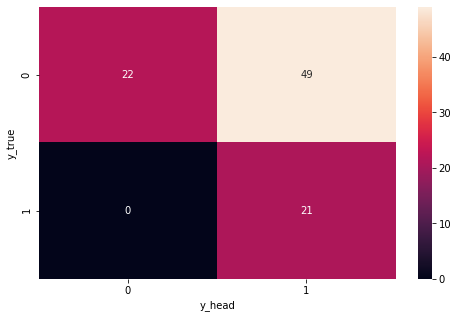

y_predict       0
0  -1.0
1   1.0
2   1.0
3  -1.0
4   1.0
..  ...
87  1.0
88  1.0
89  1.0
90 -1.0
91  1.0

[92 rows x 1 columns]
correct      kelas
92    True
32    True
223  False
131   True
222  False
..     ...
154  False
122  False
103  False
302   True
90   False

[92 rows x 1 columns]


In [361]:

if __name__ == "__main__":
    import pylab as pl           
    def fsvm():
        
        clf = FSVM(C=5)
        clf.fit(X_train, y_train)
        y_predict = clf.predict(X_test)
        correct =(y_predict == y_test)
        f, ax = plt.subplots(figsize=(8,5))
        sns.heatmap(confusion_matrix(y_test, y_predict), annot=True, fmt=".0f", ax=ax)
        plt.xlabel("y_head")
        plt.ylabel("y_true")
        plt.show()
        y_predict=pd.DataFrame(y_predict)
        correct=pd.DataFrame(correct)
        print('y_predict',y_predict)
        print('correct',correct)
        correct.to_excel('correct_Minkowsky.xlsx')
        y_predict.to_excel('y_predict_Minkowsky.xlsx')
        
        

    fsvm()    

In [365]:
TP=22

FP=0

FN=49

TN=21

Sensitifitas=(TP)/(TP+FN)
Speficity=(TN)/(TN+FP)
G_means=math.sqrt(Sensitifitas*Speficity)
AUC_Akurasi=0.5*(Sensitifitas+Speficity)
Sensitifitas
AUC_Akurasi
G_means



0.5566499393061832

In [72]:
d=((-0.6650359)*48)+(61*(-0.32180054))+((-1.155457794)*8)-0.08891088-0.31777309-0.07089623
d1=d+63.482655931478014
d2=(-1)*d1
d3=1-d2
print(d)
print(d1)
print(d2)
print(d3)

-61.27279869200001
2.209857239478005
-2.209857239478005
3.209857239478005


In [73]:
A=1-(-260. -300.  -25.   -5.   -5.   -5.)

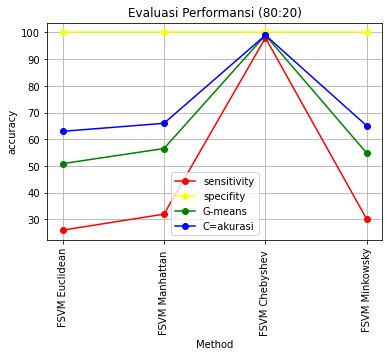

In [407]:
import matplotlib.pyplot as plt


y1=[26,32,98,30]
y2=[100,100,100,100]
y3=[50.90,56.56,98.99,54.77]
y4=[63,66,99,65]

x=['FSVM Euclidean', 'FSVM Manhattan ', 'FSVM Chebyshev ', 'FSVM Minkowsky']






plt.plot(x, y1,'ro-',color='red', label='sensitivity')
plt.plot(x, y2,'ro-',color='yellow', label='specifity')
plt.plot(x, y3,'ro-',color='g',label='G-means')
plt.plot(x, y4,'ro-',color='blue',label='C=akurasi')
plt.legend()
plt.xticks(rotation=90)
plt.xlabel('Method')
plt.ylabel('accuracy')

plt.title('Evaluasi Performansi (80:20)')
plt.grid(True)

plt.show()

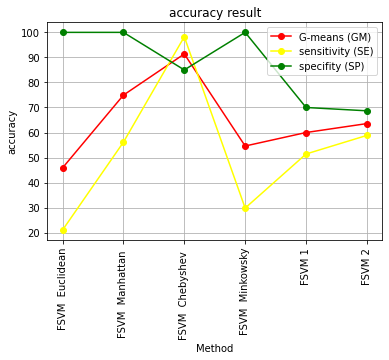

In [75]:
import matplotlib.pyplot as plt


y1=[45.88,74.93,91.38,54.61,60,63.57]
y2=[21.05,56.14,98.24,29.82,51.42,58.85]
y3=[100,100,85,100,70,68.67]


x=['FSVM  Euclidean', 'FSVM  Manhattan ', 'FSVM  Chebyshev ', 'FSVM  Minkowsky','FSVM 1','FSVM 2']






plt.plot(x, y1,'ro-',color='red', label='G-means (GM)')
plt.plot(x, y2,'ro-',color='yellow', label='sensitivity (SE)')
plt.plot(x, y3,'ro-',color='g',label='specifity (SP)')

plt.legend()
plt.xticks(rotation=90)
plt.xlabel('Method')
plt.ylabel('accuracy')

plt.title('accuracy result')
plt.grid(True)

plt.show()

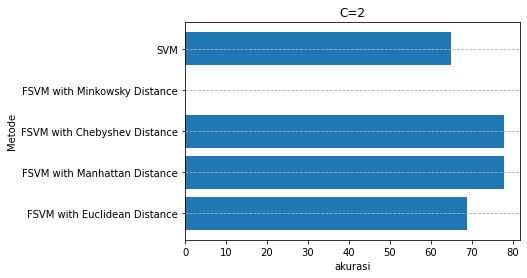

In [76]:
y = [68.83, 77.92, 77.92, 0,64.93]
x = ['FSVM with Euclidean Distance', 'FSVM with Manhattan Distance', 'FSVM with Chebyshev Distance', 'FSVM with Minkowsky Distance', 'SVM']
plt.ylabel('Metode')
plt.xlabel('akurasi')
plt.title('C=2')
plt.barh(x,y)
plt.grid(linestyle='--',axis='y')
plt.show()

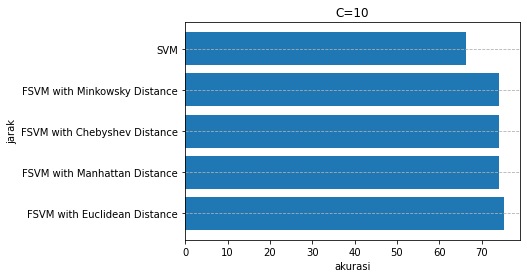

In [77]:
y1=[75.32,74.02,74.03,74.03, 66.23]
x1 =['FSVM with Euclidean Distance', 'FSVM with Manhattan Distance', 'FSVM with Chebyshev Distance', 'FSVM with Minkowsky Distance', 'SVM']
plt.ylabel('jarak')
plt.xlabel('akurasi')
plt.title('C=10')
plt.barh(x1,y1)
plt.grid(linestyle='--',axis='y')
plt.show()

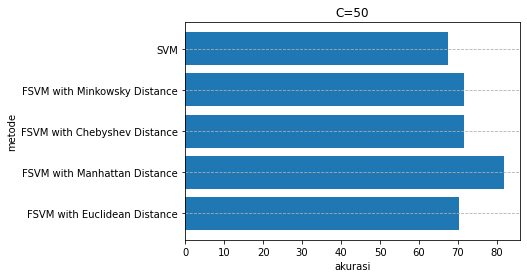

In [78]:
y2=[70.13,81.81,71.43,71.43,67.53]
x2 =['FSVM with Euclidean Distance', 'FSVM with Manhattan Distance', 'FSVM with Chebyshev Distance', 'FSVM with Minkowsky Distance', 'SVM']
plt.xlabel('akurasi')
plt.ylabel('metode')
plt.title('C=50')
plt.barh(x2,y2)
plt.grid(linestyle='--',axis='y')
plt.show()

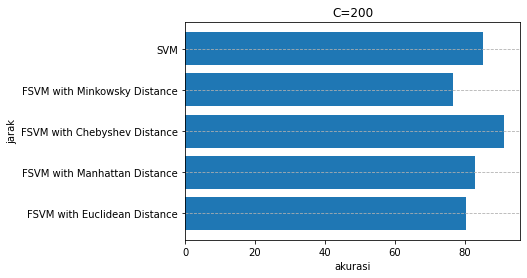

In [79]:
y3=[80.52,83.12,91.30,76.62,85.36]
x3 = ['FSVM with Euclidean Distance', 'FSVM with Manhattan Distance', 'FSVM with Chebyshev Distance', 'FSVM with Minkowsky Distance', 'SVM']
plt.ylabel('jarak')
plt.xlabel('akurasi')
plt.title('C=200')
plt.barh(x3,y3)
plt.grid(linestyle='--',axis='y')
plt.show()

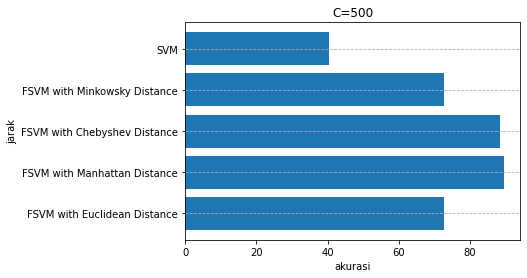

In [80]:
y4=[72.72,89.58,88.37,72.72,40.32]
x4 =['FSVM with Euclidean Distance', 'FSVM with Manhattan Distance', 'FSVM with Chebyshev Distance', 'FSVM with Minkowsky Distance', 'SVM']
plt.ylabel('jarak')
plt.xlabel('akurasi')
plt.title('C=500')
plt.barh(x4,y4)
plt.grid(linestyle='--',axis='y')
plt.show()

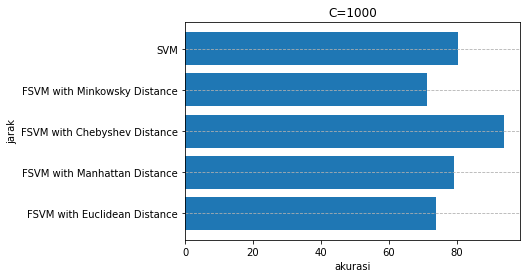

In [81]:
y5=[74.03,79.22,94,71.42,80.52]
x5 =['FSVM with Euclidean Distance', 'FSVM with Manhattan Distance', 'FSVM with Chebyshev Distance', 'FSVM with Minkowsky Distance', 'SVM']

plt.ylabel('jarak')
plt.xlabel('akurasi')
plt.title('C=1000')
plt.barh(x5,y5)
plt.grid(linestyle='--',axis='y')
plt.show()